In [1]:
!pip install --upgrade cvxpy

Defaulting to user installation because normal site-packages is not writeable


In [7]:
!pip install botorch

Defaulting to user installation because normal site-packages is not writeable


In [8]:
import cvxpy as cp
import numpy as np
import matplotlib.pyplot as plt

from cvxpy import *
import pandas as pd

import os
import torch

In [9]:
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"


tkwargs = {
    "dtype": torch.double,
    #"device": torch.device("cuda" if torch.cuda.is_available() else "cpu"),
}
SMOKE_TEST = os.environ.get("SMOKE_TEST")

from __future__ import annotations

import math
from abc import ABC, abstractmethod
from math import pi
from typing import Optional

from botorch.test_functions.base import (
    ConstrainedBaseTestProblem,
    MultiObjectiveTestProblem,
)

In [128]:
#dataset macronutrients and micronutrients and others.

#Costs of raws
Costos=np.array([141.24,144.24,147.25,132.22,132.22,195.32,342.57,120.2,30.05,1803.03,111.18,336.56,152.65,150.25,159.27,136.73,300.5])
#CF
CF=np.array([4.5,2.8,2.5,24.7,6.1,5.6,1,8,0,0,22.5,0,17.8,14.5,5.7,2.3,0])
#Ca
Ca=np.array([0.06,0.04, 0.02, 1.75, 0.24,0.29,4.50,0.16,38.3,0.04, 0.35, 0, 0.98, 0.23, 0.10, 0.05, 32])
#AP
AP=np.array([0.13, 0.18, 0.05, 0.26, 0.03, 0.19, 2.45, 0.22, 0,0,0.17, 0, 0.04, 0.13, 0.15, 0.15,0])
#DM
DM=np.array([90.2,89.4, 86.3,91.2, 88.8, 88, 92, 88.6, 98, 98.5, 89.3, 0, 89.7, 90.8, 86.7, 89.4, 99.4])
#CP
CP=np.array([11.3, 11.6, 7.7, 16.7, 2.5, 44, 62.4, 19, 0, 95, 30.5, 0, 10.1,30.7, 21.5, 8.9, 0])
#Energy
Energy=np.array([14.7446, 15.4048, 14.9983,5.7664, 10.9456,15.3092,14.4188,12.5758,0,16.4095,9.9224,17.37,7.9859,  14.363 ,  14.4828,  15.2728, 0])
#L
L=np.array([0.4,0.33,0.22, 0.73, 0.09, 2.88, 4.75, 0.62, 0, 78, 1.06, 0, 0.59, 1.46, 1.55, 0.34, 0])
#MC
MC=np.array([0.43,0.46,0.33,0.45,0.06,1.28,2.36,0.83,0,0,1.25,0,0.22,0.66,0.56,0.37,0])
#T
T=np.array([0.37,0.34,0.27,0.7,0.07,1.75,2.65,0.74,0,0,1.06,0,0.47,0.99,0.82,0.3,0])
#Tp
Tp=np.array([0.13,0.13,0.06,0.31,0.02,0.59,0.65,0.13,0,0,0.43,0,0.1,0.25,0.19,0.1,0])



#Bounds of raws and macronutrients
supbd=10

bound=np.array([0.4, 0.4, 0.4, 0.05, 0.22, 1,0.04, 0.08,1,0.0065, 0.06, 0.04, 0.05, 0.1, 0.15, 0.2, 1])
Q=np.concatenate([CF, Ca, AP, DM, CP, MC, T, Tp, Energy, L]).reshape(10,17)
lower=np.array([0, 0.6, 0.15, 87, 18, 0.475, 0.627, 0.171, 14.01, 0.9501])
upper=np.array([6, supbd, supbd, 95, 21, supbd,supbd, supbd, 20,2])

#number of variables and standard deviation, and variances
n=17

ones=np.ones(n)

stdl = np.array([0.03962323, 0.0484768 , 0.01870829, 0.08031189, 0.02408319,0.13823892, 0.54625086, 0.09300538, 0., 0.,0.06356099, 0. , 0.08848729, 0.08757854, 0.06511528,0.03 , 0. ])
stde=np.array([0.3197, 0.4066, 0.2644, 1.0968, 0.5168, 0.3607, 1.4353, 0.5676,0.    , 0.    , 0.7056, 0.    , 1.4691, 0.5844, 0.3746, 0.2462,0.    ])

vare=np.diag(stde**2)
varl=np.diag(stdl**2)

In [129]:
def gensamples(nn):
    #rgn=np.random.seed(1234)
    lista=[]
    for i in range(nn):
        w=cp.Variable(n, pos=True)
        cons=cp.Constant(np.random.normal(160,2))
    

        objective_fct = cp.Maximize(1)


        constraints=[ones@w==1, Q@w>=lower, Q@w<=upper,
                     w[0]<=bound[0],
                     w[1]<=bound[1], 
                     w[2]<=bound[2],
                     w[3]<=bound[3],
                     w[4]<=bound[4], 
                     w[5]<=bound[5],
                     w[6]<=bound[6],
                     w[7]<=bound[7],
                     w[8]<=bound[8],
                     w[9]<=bound[9], 
                     w[10]<=bound[10],
                     w[11]<=bound[11],
                     w[12]<=bound[12], 
                     w[13]<=bound[13],
                     w[14]<=bound[14],
                     w[15]<=bound[15],
                     w[16]<=bound[16],
                     Costos@w.T-cons<=0]
        prob = cp.Problem(objective_fct, constraints)
        assert  prob.is_dqcp()
        prob.solve(qcp=True, solver='ECOS')
        #xvalue=w.value/t.value
        lista.append(w.value)
    return np.array(lista)

In [135]:
train_x_ehvi, train_obj_ehvi = generate_initial_data(n=40)
train_obj_ehvi

tensor([[-157.3274,    1.1359,   14.1808],
        [-158.7968,    1.1906,   14.1353],
        [-160.7823,    1.2364,   14.1688],
        [-158.3432,    1.3388,   14.1277],
        [-158.3439,    1.2032,   14.0780],
        [-157.9485,    1.3532,   14.0601],
        [-158.9560,    1.2894,   14.2015],
        [-158.2164,    1.1282,   14.1225],
        [-158.3721,    1.3666,   14.2803],
        [-158.5807,    1.3212,   13.9671],
        [-157.2447,    1.2022,   14.0895],
        [-160.9325,    1.1787,   14.1047],
        [-158.7629,    1.1174,   14.2159],
        [-157.7828,    0.9968,   14.1155],
        [-155.9339,    1.0662,   14.0355],
        [-160.1867,    1.3692,   14.1306],
        [-156.3073,    1.0957,   14.1949],
        [-157.2862,    1.0412,   13.9565],
        [-154.9746,    1.1933,   14.1518],
        [-159.3539,    1.1038,   14.1698],
        [-158.8192,    1.2115,   14.1193],
        [-155.5795,    1.1798,   14.0138],
        [-159.7943,    1.0846,   14.3223],
        [-1

In [131]:
Costos=torch.as_tensor(Costos).to(**tkwargs)

CF=torch.as_tensor(CF).to(**tkwargs)
Ca=torch.as_tensor(Ca).to(**tkwargs)
AP=torch.as_tensor(AP).to(**tkwargs)
DM=torch.as_tensor(DM).to(**tkwargs)
CP=torch.as_tensor(CP).to(**tkwargs)
MC=torch.as_tensor(MC).to(**tkwargs)
Tp=torch.as_tensor(Tp).to(**tkwargs)
T=torch.as_tensor(T).to(**tkwargs)
L=torch.as_tensor(L).to(**tkwargs)
Energy=torch.as_tensor(Energy).to(**tkwargs)
ones=torch.as_tensor(ones).to(**tkwargs)

stdl =torch.as_tensor(stdl).to(**tkwargs)
stde=torch.as_tensor(stde).to(**tkwargs)


vare=torch.diag(stde**2)
varl=torch.diag(stdl**2)
stde**2

tensor([0.1022, 0.1653, 0.0699, 1.2030, 0.2671, 0.1301, 2.0601, 0.3222, 0.0000,
        0.0000, 0.4979, 0.0000, 2.1583, 0.3415, 0.1403, 0.0606, 0.0000],
       dtype=torch.float64)

In [132]:
class myfunction(MultiObjectiveTestProblem):

    
    dim = 17
    num_objectives=3

    lower=torch.zeros(17)
    upper=torch.as_tensor(bound)
 
    _bounds=torch.stack([lower, upper])
   
    _ref_point=[-170,0,0]
    
    
    def __init__(self, noise_std: Optional[float] = None, negate: bool = False) -> None:
        r"""
        Args:
            noise_std: Standard deviation of the observation noise.
            negate: If True, negate the objectives.
        """
        super().__init__(noise_std=noise_std, negate=negate)

    def _f1(self, X:Tensor)-> Tensor:
          
        return -Costos@torch.transpose(X,1,0)

    def _f2(self, X:Tensor)-> Tensor:
           
        return  L@torch.transpose(X,1,0)
    
    def  _f3(self, X:Tensor)-> Tensor:
       
        return Energy@torch.transpose(X,1,0)
    
    def evaluate_true(self, X: Tensor) -> Tensor:
        F1 = self._f1(X=X)
        F2 = self._f2(X=X)
        F3 = self._f3(X=X)
        return torch.stack([F1,F2,F3],dim=-1)

In [133]:
problem=myfunction().to(**tkwargs)

In [152]:
from botorch.models.gp_regression import FixedNoiseGP
from botorch.models.model_list_gp_regression import ModelListGP
from botorch.models.transforms.outcome import Standardize
from gpytorch.mlls.sum_marginal_log_likelihood import SumMarginalLogLikelihood
from botorch.utils.transforms import unnormalize, normalize
from botorch.utils.sampling import draw_sobol_samples

NOISE_SE = torch.tensor([0.1,0.1,0.1], **tkwargs)

def generate_initial_data(n):
    # generate training data
    train_x = torch.tensor(gensamples(n)).to(**tkwargs)
    train_obj_true = problem(train_x)
    train_obj = train_obj_true + torch.randn_like(train_obj_true) * NOISE_SE
    
    return train_x, train_obj

def initialize_model(train_x, train_obj):
    # define models for objective and constraint
    train_x = normalize(train_x, problem._bounds)
    models = []
    for i in range(train_obj.shape[-1]):
        train_y = train_obj[..., i:i+1]
        train_yvar = torch.full_like(train_y, NOISE_SE[i] ** 2)
        models.append(
            FixedNoiseGP(train_x, train_y, train_yvar, outcome_transform=Standardize(m=1))
        )
    model = ModelListGP(*models)
    mll = SumMarginalLogLikelihood(model.likelihood, model)
    return mll, model

In [153]:
from botorch import fit_gpytorch_model
from botorch.sampling import SobolQMCNormalSampler
from botorch.exceptions import BadInitialCandidatesWarning
from botorch.utils.multi_objective.pareto import is_non_dominated
from botorch.utils.multi_objective.box_decompositions.non_dominated import FastNondominatedPartitioning

import time
import warnings

In [154]:
ineqconstr=[(torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), -CF, -6),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), Ca, 0.6),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), -Ca, -supbd),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), AP, 0.23),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), -AP, -supbd),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), DM, 87),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), -DM, -95),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), CP, 18),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), -CP, -21),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), MC, 0.475),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), Tp, 0.171),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), T, 0.627),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), -MC, -supbd),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), -Tp, -supbd),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), -T, -supbd),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), Energy, 14.001),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), -Energy, -20),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), L, 0.9501),
            (torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), -L, -2),
            
           ]
eqconstr=[(torch.tensor([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]), ones, 1),]

In [155]:
from botorch.acquisition.objective import GenericMCObjective, IdentityMCObjective
from botorch.utils.multi_objective.scalarization import get_chebyshev_scalarization
from botorch.acquisition.multi_objective.monte_carlo import qExpectedHypervolumeImprovement, qNoisyExpectedHypervolumeImprovement
from botorch.optim.optimize import optimize_acqf, optimize_acqf_list

In [156]:
def optimize_qNehvi_and_get_observation(model, train_x, train_obj, sampler):
    """Optimizes the qEHVI acquisition function, and returns a new candidate and observation."""
    # partition non-dominated space into disjoint rectangles
    with torch.no_grad():
        pred = model.posterior(normalize(train_x, problem._bounds)).mean
        partitioning = FastNondominatedPartitioning(
        ref_point=problem.ref_point, 
        Y=pred,
    )
    acq_func = qNoisyExpectedHypervolumeImprovement(
        model=model,
        ref_point=problem.ref_point.tolist(),
        partitioning=partitioning,
        X_baseline=normalize(train_x, problem._bounds),
        inequality_constraints=ineqconstr,
        equality_constraints=eqconstr,
        #sampler=sampler,
        
    )
    # optimize
    candidates, _ = optimize_acqf(
        acq_function=acq_func,
        bounds=problem._bounds,
        q=1,
        num_restarts=10,
        raw_samples=256,
        #batch_initial_conditions=train_x.reshape(b,1,17),
        inequality_constraints=ineqconstr,
        equality_constraints=eqconstr,
        options={"batch_limit": 5, "maxiter": 200},
        sequential=True,
    )
        
    # observe new values 
    new_x =  candidates
    new_obj = problem(new_x)
    #new_obj = new_obj_true + torch.randn_like(new_obj_true) * NOISE_SE
    return new_x, new_obj, #new_obj_true

In [157]:
!pip install tqdm

Defaulting to user installation because normal site-packages is not writeable


In [158]:
import tqdm

In [159]:
BDs27yexp1p2=[]
hvsf27yexp1p2=[]
trainxall27yexp1p2=[]
trainobjall27yexp1p2=[]
numbd27yexp1p2=[]

for i in tqdm.tqdm(list(range(3))):
    N_BATCH = 15 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=40)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp1p2.append(bd.pareto_Y)      
    hvsf27yexp1p2.append(hvs_ehvi)   
    trainxall27yexp1p2.append(train_x_ehvi)
    trainobjall27yexp1p2.append(train_obj_ehvi)
    numbd27yexp1p2.append(nume)

  0%|                                                     | 0/3 [00:00<?, ?it/s]

Seed: 925

Batch  1: Hypervolume (qNEHVI) = 394.5686 #Paprox=12 time = 9.86 Lysine= 0.9501 Energy= 14.4569 Costs= 149.5050)
Batch  2: Hypervolume (qNEHVI) = 394.5686 #Paprox=12 time = 9.77 Lysine= 1.1917 Energy= 14.0010 Costs= 159.4526)
Batch  3: Hypervolume (qNEHVI) = 394.7085 #Paprox=13 time = 9.83 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)
Batch  4: Hypervolume (qNEHVI) = 394.7085 #Paprox=14 time = 9.70 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 394.9390 #Paprox=15 time = 9.93 Lysine= 0.9501 Energy= 14.4551 Costs= 149.4882)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 395.4534 #Paprox=16 time = 9.83 Lysine= 0.9501 Energy= 14.4510 Costs= 149.4507)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 395.4534 #Paprox=17 time = 9.75 Lysine= 0.9501 Energy= 14.4536 Costs= 149.5696)
Batch  8: Hypervolume (qNEHVI) = 395.4534 #Paprox=18 time = 10.51 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 395.4534 #Paprox=19 time = 10.10 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 395.4534 #Paprox=19 time = 10.05 Lysine= 0.9501 Energy= 14.4405 Costs= 149.5435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 401.0547 #Paprox=20 time = 10.94 Lysine= 0.9501 Energy= 14.4065 Costs= 149.0415)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 401.0550 #Paprox=21 time = 10.58 Lysine= 0.9501 Energy= 14.4428 Costs= 149.4418)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 401.0590 #Paprox=22 time = 10.54 Lysine= 0.9501 Energy= 14.4320 Costs= 149.2758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 401.0594 #Paprox=23 time = 10.81 Lysine= 0.9501 Energy= 14.4477 Costs= 149.4207)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|██████████████▋                             | 1/3 [02:33<05:07, 153.87s/it]


Batch 15: Hypervolume (qNEHVI) = 401.0596 #Paprox=24 time = 11.03 Lysine= 0.9501 Energy= 14.4380 Costs= 149.3836)Seed: 222

Batch  1: Hypervolume (qNEHVI) = 390.4779 #Paprox=14 time = 9.84 Lysine= 0.9501 Energy= 14.4167 Costs= 149.1354)
Batch  2: Hypervolume (qNEHVI) = 390.4779 #Paprox=14 time = 10.17 Lysine= 1.1917 Energy= 14.0010 Costs= 159.4526)
Batch  3: Hypervolume (qNEHVI) = 390.4779 #Paprox=14 time = 10.09 Lysine= 1.2120 Energy= 14.0010 Costs= 170.9040)
Batch  4: Hypervolume (qNEHVI) = 391.8641 #Paprox=15 time = 9.95 Lysine= 0.9649 Energy= 14.3428 Costs= 149.1919)
Batch  5: Hypervolume (qNEHVI) = 394.9517 #Paprox=16 time = 10.47 Lysine= 0.9528 Energy= 14.3449 Costs= 148.9096)
Batch  6: Hypervolume (qNEHVI) = 394.9587 #Paprox=17 time = 10.40 Lysine= 0.9501 Energy= 14.4030 Costs= 149.0096)
Batch  7: Hypervolume (qNEHVI) = 395.5811 #Paprox=18 time = 10.58 Lysine= 0.9501 Energy= 14.3491 Costs= 148.8640)
Batch  8: Hypervolume (qNEHVI) = 395.6984 #Paprox=19 time = 11.08 Lysine= 0.950

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 395.6984 #Paprox=20 time = 10.90 Lysine= 0.9501 Energy= 14.3473 Costs= 148.8591)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 395.7388 #Paprox=21 time = 10.93 Lysine= 0.9501 Energy= 14.3450 Costs= 148.8524)
Batch 11: Hypervolume (qNEHVI) = 395.7405 #Paprox=22 time = 11.38 Lysine= 0.9501 Energy= 14.3679 Costs= 148.9148)
Batch 12: Hypervolume (qNEHVI) = 395.7405 #Paprox=23 time = 11.46 Lysine= 0.9501 Energy= 14.3450 Costs= 148.8524)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 395.7405 #Paprox=23 time = 11.54 Lysine= 0.9501 Energy= 14.3416 Costs= 148.9097)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 422.3420 #Paprox=24 time = 11.75 Lysine= 0.9501 Energy= 14.0681 Costs= 146.8622)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|█████████████████████████████▎              | 2/3 [05:16<02:39, 159.03s/it]


Batch 15: Hypervolume (qNEHVI) = 427.0201 #Paprox=25 time = 11.46 Lysine= 0.9501 Energy= 14.0010 Costs= 146.5105)Seed: 819

Batch  1: Hypervolume (qNEHVI) = 380.9796 #Paprox=11 time = 9.16 Lysine= 0.9501 Energy= 14.4365 Costs= 149.3178)
Batch  2: Hypervolume (qNEHVI) = 380.9796 #Paprox=11 time = 9.43 Lysine= 1.1917 Energy= 14.0010 Costs= 159.4526)
Batch  3: Hypervolume (qNEHVI) = 385.1963 #Paprox=12 time = 9.78 Lysine= 0.9501 Energy= 14.4030 Costs= 149.0096)
Batch  4: Hypervolume (qNEHVI) = 385.7317 #Paprox=13 time = 10.10 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)
Batch  5: Hypervolume (qNEHVI) = 385.7317 #Paprox=14 time = 9.96 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)
Batch  6: Hypervolume (qNEHVI) = 385.7317 #Paprox=15 time = 10.34 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 385.7317 #Paprox=16 time = 10.37 Lysine= 0.9501 Energy= 14.4030 Costs= 149.0096)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 385.7317 #Paprox=17 time = 10.62 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 385.7317 #Paprox=18 time = 10.09 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 385.7317 #Paprox=19 time = 10.42 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 385.7317 #Paprox=20 time = 11.06 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 385.7317 #Paprox=21 time = 11.39 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 385.7317 #Paprox=22 time = 12.91 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 385.7317 #Paprox=23 time = 11.30 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|████████████████████████████████████████████| 3/3 [07:55<00:00, 158.48s/it]


Batch 15: Hypervolume (qNEHVI) = 385.7317 #Paprox=24 time = 11.38 Lysine= 0.9501 Energy= 14.4641 Costs= 149.5713)

In [160]:
BDs27yexp1p2

[tensor([[-156.4838,    1.3701,   14.0876],
         [-158.4804,    1.0783,   14.2277],
         [-158.9248,    1.4180,   14.3165],
         [-158.6511,    1.3871,   14.1903],
         [-156.3235,    1.1914,   14.1165],
         [-154.9243,    1.0482,   14.0124],
         [-156.2548,    1.4495,   13.9803],
         [-157.4578,    1.2720,   14.1741],
         [-159.0394,    1.5367,   13.9620],
         [-156.8410,    1.2877,   14.1487],
         [-159.2077,    1.4182,   14.1349],
         [-149.5050,    0.9501,   14.4569],
         [-149.5713,    0.9501,   14.4641],
         [-149.5713,    0.9501,   14.4641],
         [-149.4882,    0.9501,   14.4551],
         [-149.4507,    0.9501,   14.4510],
         [-149.5696,    0.9501,   14.4536],
         [-149.5713,    0.9501,   14.4641],
         [-149.5713,    0.9501,   14.4641],
         [-149.0415,    0.9501,   14.4065],
         [-149.4418,    0.9501,   14.4428],
         [-149.2758,    0.9501,   14.4320],
         [-149.4207,    0.9501, 

In [42]:
%store BDs27yexp1
%store hvsf27yexp1
%store trainxall27yexp1
%store trainobjall27yexp1
%store numbd27yexp1

Stored 'BDs27yexp1' (list)
Stored 'hvsf27yexp1' (list)
Stored 'trainxall27yexp1' (list)
Stored 'trainobjall27yexp1' (list)
Stored 'numbd27yexp1' (list)


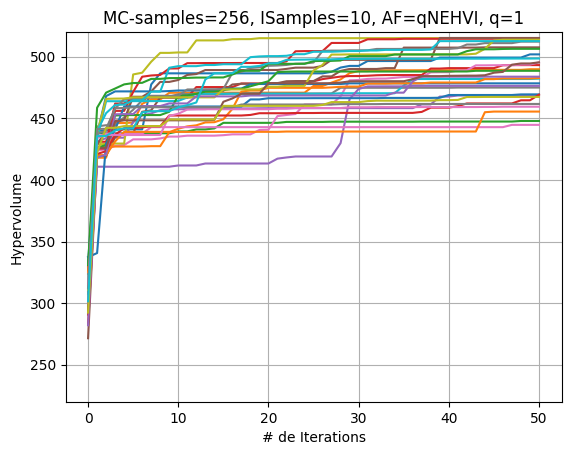

In [42]:
iters = np.arange(51)

for i in range(30):

    plt.errorbar(iters, np.asarray(hvsf27yexp1p2[i]), linewidth=1.5,label='%i' %i)
    plt.xlabel('# de Iterations')
    plt.ylabel('Hypervolume')
    plt.title('MC-samples=256, ISamples=10, AF=qNEHVI, q=1')
plt.grid()
plt.ylim([220,520])
plt.savefig('Exp1-27July')

In [46]:
BDs27yexp2d=[]
hvsf27yexp2d=[]
trainxall27yexp2d=[]
trainobjall27yexp2d=[]
numbd27yexp2d=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=40)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp2d.append(bd.pareto_Y)      
    hvsf27yexp2d.append(hvs_ehvi)   
    trainxall27yexp2d.append(train_x_ehvi)
    trainobjall27yexp2d.append(train_obj_ehvi)
    numbd27yexp2d.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]

Seed: 269

Batch  1: Hypervolume (qNEHVI) = 364.1382 #Paprox=19 time = 10.04 Lysine= 0.9501 Energy= 14.4229 Costs= 148.7534)
Batch  2: Hypervolume (qNEHVI) = 364.1382 #Paprox=19 time = 10.15 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)
Batch  3: Hypervolume (qNEHVI) = 371.2852 #Paprox=20 time = 10.22 Lysine= 0.9501 Energy= 14.3979 Costs= 148.2310)
Batch  4: Hypervolume (qNEHVI) = 371.7250 #Paprox=21 time = 10.47 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)
Batch  5: Hypervolume (qNEHVI) = 390.1484 #Paprox=22 time = 10.60 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)
Batch  6: Hypervolume (qNEHVI) = 390.1484 #Paprox=23 time = 10.95 Lysine= 0.9501 Energy= 14.4441 Costs= 148.9398)
Batch  7: Hypervolume (qNEHVI) = 390.1484 #Paprox=23 time = 10.75 Lysine= 1.1354 Energy= 14.0010 Costs= 172.6311)
Batch  8: Hypervolume (qNEHVI) = 390.5680 #Paprox=24 time = 10.94 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)
Batch  9: Hypervolume (qNEHVI) = 390.5680 #Paprox=25 time = 9.06 Lysine= 1.27

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 390.5680 #Paprox=27 time = 9.51 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 390.5680 #Paprox=28 time = 10.12 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 390.5680 #Paprox=29 time = 9.96 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 390.5680 #Paprox=30 time = 10.04 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 390.5680 #Paprox=31 time = 10.25 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 390.5680 #Paprox=32 time = 10.45 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 390.5680 #Paprox=33 time = 10.51 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 390.5680 #Paprox=34 time = 10.28 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 390.5680 #Paprox=35 time = 10.35 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 390.5680 #Paprox=36 time = 10.80 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 390.5680 #Paprox=36 time = 10.47 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 390.5680 #Paprox=37 time = 10.56 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 390.5680 #Paprox=38 time = 10.85 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 390.5680 #Paprox=39 time = 10.57 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 390.5680 #Paprox=40 time = 10.79 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 390.5680 #Paprox=41 time = 10.86 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 390.5680 #Paprox=42 time = 11.30 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 390.5680 #Paprox=43 time = 11.12 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 390.5680 #Paprox=44 time = 11.13 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 390.5680 #Paprox=45 time = 11.11 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 390.5680 #Paprox=46 time = 11.24 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 390.5680 #Paprox=47 time = 11.12 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 390.5680 #Paprox=48 time = 11.27 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 390.5680 #Paprox=48 time = 11.38 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 390.5680 #Paprox=48 time = 11.38 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 390.5680 #Paprox=49 time = 11.22 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 390.5680 #Paprox=50 time = 11.80 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 390.5680 #Paprox=51 time = 11.41 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 390.5680 #Paprox=52 time = 11.68 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 390.5680 #Paprox=53 time = 11.23 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 390.5680 #Paprox=54 time = 11.54 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 390.5680 #Paprox=55 time = 11.92 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 390.5680 #Paprox=56 time = 11.51 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 390.5680 #Paprox=57 time = 11.72 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 390.5680 #Paprox=57 time = 11.62 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 390.5680 #Paprox=58 time = 11.63 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 390.5680 #Paprox=58 time = 11.74 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 390.5680 #Paprox=59 time = 11.59 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 390.5680 #Paprox=60 time = 11.94 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▎                                       | 1/30 [09:04<4:23:13, 544.60s/it]


Batch 50: Hypervolume (qNEHVI) = 390.5680 #Paprox=61 time = 11.66 Lysine= 1.2753 Energy= 14.1816 Costs= 158.8231)Seed: 94

Batch  1: Hypervolume (qNEHVI) = 346.3674 #Paprox=15 time = 9.85 Lysine= 0.9501 Energy= 14.4149 Costs= 150.4914)
Batch  2: Hypervolume (qNEHVI) = 383.3487 #Paprox=16 time = 10.29 Lysine= 0.9501 Energy= 14.4034 Costs= 147.7890)
Batch  3: Hypervolume (qNEHVI) = 408.8535 #Paprox=17 time = 10.27 Lysine= 0.9501 Energy= 14.4134 Costs= 145.9284)
Batch  4: Hypervolume (qNEHVI) = 409.3367 #Paprox=17 time = 10.90 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 409.7368 #Paprox=18 time = 11.04 Lysine= 0.9501 Energy= 14.5149 Costs= 146.9650)
Batch  6: Hypervolume (qNEHVI) = 409.7368 #Paprox=18 time = 10.91 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  7: Hypervolume (qNEHVI) = 409.7387 #Paprox=18 time = 10.73 Lysine= 0.9501 Energy= 14.4782 Costs= 146.6680)
Batch  8: Hypervolume (qNEHVI) = 409.7387 #Paprox=19 time = 10.78 Lysine= 0.950

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 409.7387 #Paprox=22 time = 11.45 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 409.7387 #Paprox=23 time = 11.30 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 409.7387 #Paprox=23 time = 11.39 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 409.7387 #Paprox=24 time = 11.37 Lysine= 0.9501 Energy= 14.5038 Costs= 150.7868)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 409.7387 #Paprox=24 time = 11.37 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 409.7387 #Paprox=24 time = 11.39 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 409.7387 #Paprox=24 time = 11.54 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 409.7387 #Paprox=24 time = 11.40 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 409.7387 #Paprox=24 time = 11.45 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 409.7387 #Paprox=24 time = 11.71 Lysine= 0.9501 Energy= 14.4675 Costs= 151.5536)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 409.7387 #Paprox=24 time = 11.73 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 409.7387 #Paprox=24 time = 11.48 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 409.7387 #Paprox=25 time = 11.73 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 409.7387 #Paprox=26 time = 11.55 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 409.7387 #Paprox=26 time = 11.56 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 409.7387 #Paprox=26 time = 11.64 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 409.7387 #Paprox=26 time = 11.59 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 409.7387 #Paprox=26 time = 11.60 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 409.7387 #Paprox=27 time = 11.68 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 409.7387 #Paprox=27 time = 11.70 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 409.7387 #Paprox=28 time = 11.94 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 409.7387 #Paprox=29 time = 11.81 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 409.7387 #Paprox=29 time = 11.73 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 409.7387 #Paprox=29 time = 11.84 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 409.7387 #Paprox=29 time = 11.92 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 409.7387 #Paprox=30 time = 11.84 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 409.7387 #Paprox=30 time = 11.76 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 409.7387 #Paprox=31 time = 11.81 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 409.7387 #Paprox=31 time = 11.82 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 409.7387 #Paprox=32 time = 11.82 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 409.7387 #Paprox=33 time = 12.11 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 409.7387 #Paprox=33 time = 11.82 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 409.7387 #Paprox=33 time = 11.76 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 409.7387 #Paprox=33 time = 12.07 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 409.7387 #Paprox=33 time = 12.02 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 409.7387 #Paprox=33 time = 12.04 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▋                                      | 2/30 [18:38<4:22:11, 561.85s/it]


Batch 50: Hypervolume (qNEHVI) = 409.7387 #Paprox=34 time = 12.33 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)Seed: 438

Batch  1: Hypervolume (qNEHVI) = 308.0776 #Paprox=25 time = 9.80 Lysine= 0.9960 Energy= 14.5733 Costs= 152.9210)
Batch  2: Hypervolume (qNEHVI) = 391.6634 #Paprox=26 time = 10.13 Lysine= 0.9501 Energy= 14.4204 Costs= 146.8202)
Batch  3: Hypervolume (qNEHVI) = 391.6634 #Paprox=27 time = 10.32 Lysine= 0.9501 Energy= 14.0739 Costs= 152.1943)
Batch  4: Hypervolume (qNEHVI) = 391.6634 #Paprox=27 time = 10.49 Lysine= 0.9780 Energy= 14.1524 Costs= 158.2692)
Batch  5: Hypervolume (qNEHVI) = 391.6634 #Paprox=27 time = 10.80 Lysine= 0.9501 Energy= 14.5043 Costs= 155.5795)
Batch  6: Hypervolume (qNEHVI) = 392.7069 #Paprox=28 time = 10.53 Lysine= 0.9501 Energy= 14.6546 Costs= 152.7248)
Batch  7: Hypervolume (qNEHVI) = 395.0435 #Paprox=29 time = 10.54 Lysine= 0.9501 Energy= 14.8202 Costs= 155.1527)
Batch  8: Hypervolume (qNEHVI) = 396.2621 #Paprox=30 time = 10.74 Lysine= 1.09

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 428.4047 #Paprox=20 time = 6.57 Lysine= 1.5030 Energy= 14.5440 Costs= 163.4559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 428.4047 #Paprox=21 time = 6.36 Lysine= 1.5030 Energy= 14.5440 Costs= 163.4559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 431.8867 #Paprox=20 time = 6.47 Lysine= 1.3756 Energy= 14.3845 Costs= 156.0709)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 431.8867 #Paprox=20 time = 6.06 Lysine= 1.2700 Energy= 14.0010 Costs= 170.1993)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 431.8867 #Paprox=20 time = 5.98 Lysine= 1.1532 Energy= 14.0010 Costs= 180.7435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 431.8867 #Paprox=20 time = 6.12 Lysine= 1.3583 Energy= 14.0010 Costs= 156.6708)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 431.8867 #Paprox=20 time = 6.00 Lysine= 1.3284 Energy= 14.0010 Costs= 156.5686)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 446.5008 #Paprox=21 time = 6.18 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 446.7662 #Paprox=21 time = 6.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 446.7662 #Paprox=22 time = 6.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 446.7662 #Paprox=23 time = 6.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 446.7662 #Paprox=24 time = 6.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 446.7662 #Paprox=25 time = 6.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 446.7662 #Paprox=26 time = 6.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 446.7662 #Paprox=27 time = 6.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 460.4828 #Paprox=28 time = 6.72 Lysine= 1.6069 Energy= 14.4361 Costs= 161.7848)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 460.4828 #Paprox=29 time = 6.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 460.4828 #Paprox=30 time = 6.87 Lysine= 1.6069 Energy= 14.4361 Costs= 161.7848)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 460.4828 #Paprox=29 time = 7.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 460.4828 #Paprox=30 time = 7.11 Lysine= 1.6069 Energy= 14.4361 Costs= 161.7848)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 460.4828 #Paprox=31 time = 7.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 460.4828 #Paprox=32 time = 7.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 460.4828 #Paprox=33 time = 7.25 Lysine= 1.6069 Energy= 14.4361 Costs= 161.7848)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 460.4828 #Paprox=34 time = 7.50 Lysine= 1.6069 Energy= 14.4361 Costs= 161.7848)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 460.4828 #Paprox=35 time = 7.35 Lysine= 1.6069 Energy= 14.4361 Costs= 161.7848)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|████                                     | 3/30 [25:19<3:39:44, 488.33s/it]


Batch 50: Hypervolume (qNEHVI) = 460.4828 #Paprox=36 time = 7.58 Lysine= 1.6069 Energy= 14.4361 Costs= 161.7848)Seed: 206

Batch  1: Hypervolume (qNEHVI) = 411.4074 #Paprox=14 time = 10.23 Lysine= 0.9501 Energy= 14.3979 Costs= 145.7974)
Batch  2: Hypervolume (qNEHVI) = 411.4074 #Paprox=14 time = 10.28 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 432.1414 #Paprox=15 time = 10.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 432.1414 #Paprox=15 time = 10.59 Lysine= 1.2139 Energy= 14.0010 Costs= 169.2052)
Batch  5: Hypervolume (qNEHVI) = 432.6372 #Paprox=16 time = 10.35 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  6: Hypervolume (qNEHVI) = 432.7839 #Paprox=17 time = 10.61 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)
Batch  7: Hypervolume (qNEHVI) = 432.7839 #Paprox=18 time = 10.58 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 432.7839 #Paprox=19 time = 10.78 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 432.7839 #Paprox=20 time = 10.72 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 432.7839 #Paprox=21 time = 11.02 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 432.7839 #Paprox=22 time = 11.00 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 432.7839 #Paprox=23 time = 11.43 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 432.7858 #Paprox=24 time = 11.22 Lysine= 0.9501 Energy= 14.4842 Costs= 146.7572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 432.7858 #Paprox=25 time = 11.34 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 432.7858 #Paprox=26 time = 11.50 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 432.7858 #Paprox=27 time = 11.70 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 432.7858 #Paprox=28 time = 11.42 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 432.7858 #Paprox=29 time = 11.63 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 432.7858 #Paprox=30 time = 11.41 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 432.7858 #Paprox=31 time = 11.56 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 432.8116 #Paprox=32 time = 11.55 Lysine= 0.9501 Energy= 14.5032 Costs= 150.5644)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 432.8116 #Paprox=33 time = 11.98 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 432.8116 #Paprox=34 time = 11.82 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 432.8116 #Paprox=35 time = 11.98 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 432.8116 #Paprox=36 time = 12.28 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 432.8116 #Paprox=37 time = 12.23 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 432.8116 #Paprox=38 time = 12.10 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 432.8116 #Paprox=39 time = 12.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 432.8116 #Paprox=40 time = 12.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 432.8118 #Paprox=41 time = 12.39 Lysine= 0.9501 Energy= 14.4050 Costs= 146.5295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 432.8118 #Paprox=42 time = 12.24 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 432.8118 #Paprox=43 time = 12.68 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 432.8118 #Paprox=44 time = 12.28 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 432.8118 #Paprox=45 time = 12.52 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 432.8118 #Paprox=46 time = 12.90 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 432.8118 #Paprox=47 time = 12.67 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 432.8118 #Paprox=48 time = 12.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 432.8118 #Paprox=49 time = 12.81 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 432.8118 #Paprox=50 time = 12.71 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 432.8118 #Paprox=51 time = 12.93 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 432.8118 #Paprox=52 time = 12.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 432.8118 #Paprox=53 time = 14.11 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 432.8118 #Paprox=54 time = 12.81 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 432.8118 #Paprox=55 time = 13.26 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 432.8122 #Paprox=56 time = 13.11 Lysine= 0.9501 Energy= 14.4908 Costs= 146.8556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 432.8122 #Paprox=57 time = 13.20 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 432.8122 #Paprox=58 time = 13.52 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 432.8122 #Paprox=59 time = 13.34 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 432.8122 #Paprox=60 time = 13.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|█████▍                                   | 4/30 [35:19<3:50:47, 532.59s/it]


Batch 50: Hypervolume (qNEHVI) = 440.1987 #Paprox=55 time = 13.68 Lysine= 1.3116 Energy= 14.3947 Costs= 154.6646)Seed: 517

Batch  1: Hypervolume (qNEHVI) = 382.6205 #Paprox=16 time = 9.78 Lysine= 0.9501 Energy= 14.3957 Costs= 147.3437)
Batch  2: Hypervolume (qNEHVI) = 382.6205 #Paprox=16 time = 10.21 Lysine= 1.2609 Energy= 14.1175 Costs= 167.6762)
Batch  3: Hypervolume (qNEHVI) = 383.3348 #Paprox=17 time = 10.20 Lysine= 0.9501 Energy= 14.4576 Costs= 147.9635)
Batch  4: Hypervolume (qNEHVI) = 394.3500 #Paprox=16 time = 10.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 411.5252 #Paprox=17 time = 10.64 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)
Batch  6: Hypervolume (qNEHVI) = 411.5252 #Paprox=17 time = 10.39 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)
Batch  7: Hypervolume (qNEHVI) = 418.3338 #Paprox=18 time = 10.99 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)
Batch  8: Hypervolume (qNEHVI) = 418.3338 #Paprox=19 time = 9.31 Lysine= 1.146

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 418.3338 #Paprox=20 time = 9.60 Lysine= 1.1466 Energy= 14.0010 Costs= 160.0560)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 418.3338 #Paprox=20 time = 9.91 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 419.3732 #Paprox=16 time = 9.93 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 419.3732 #Paprox=17 time = 7.26 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 419.3732 #Paprox=18 time = 6.59 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 419.3732 #Paprox=19 time = 6.26 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 419.3732 #Paprox=20 time = 6.32 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 419.3732 #Paprox=21 time = 6.21 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 419.3732 #Paprox=22 time = 6.25 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 419.3732 #Paprox=23 time = 6.17 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 419.3732 #Paprox=24 time = 5.78 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 419.3732 #Paprox=25 time = 5.95 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 419.3732 #Paprox=26 time = 5.86 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 419.3732 #Paprox=27 time = 5.91 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 419.3732 #Paprox=28 time = 5.96 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 419.3732 #Paprox=29 time = 6.03 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 419.3732 #Paprox=30 time = 5.95 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 419.3732 #Paprox=31 time = 6.20 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 419.3732 #Paprox=32 time = 6.08 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 419.3732 #Paprox=33 time = 6.03 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 421.9336 #Paprox=34 time = 6.40 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 421.9336 #Paprox=35 time = 5.64 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 421.9336 #Paprox=36 time = 6.04 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 421.9336 #Paprox=37 time = 6.04 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 421.9336 #Paprox=38 time = 5.91 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 421.9336 #Paprox=39 time = 5.84 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 421.9336 #Paprox=40 time = 5.84 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 421.9336 #Paprox=41 time = 6.25 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 421.9336 #Paprox=42 time = 5.97 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 421.9336 #Paprox=43 time = 6.17 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 421.9336 #Paprox=44 time = 6.05 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 421.9336 #Paprox=44 time = 6.14 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 421.9336 #Paprox=45 time = 6.17 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 421.9351 #Paprox=46 time = 6.10 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 421.9351 #Paprox=47 time = 6.20 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 421.9351 #Paprox=48 time = 6.05 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 421.9351 #Paprox=49 time = 6.28 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 421.9351 #Paprox=50 time = 6.14 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 421.9351 #Paprox=51 time = 6.23 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 421.9351 #Paprox=52 time = 6.15 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▊                                  | 5/30 [41:14<3:15:09, 468.36s/it]


Batch 50: Hypervolume (qNEHVI) = 421.9351 #Paprox=53 time = 6.17 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)Seed: 200

Batch  1: Hypervolume (qNEHVI) = 327.0064 #Paprox=20 time = 9.94 Lysine= 0.9619 Energy= 14.5126 Costs= 151.6578)
Batch  2: Hypervolume (qNEHVI) = 407.1342 #Paprox=21 time = 10.18 Lysine= 0.9501 Energy= 14.4019 Costs= 145.8019)
Batch  3: Hypervolume (qNEHVI) = 407.2136 #Paprox=22 time = 10.41 Lysine= 1.2456 Energy= 14.0010 Costs= 157.4902)
Batch  4: Hypervolume (qNEHVI) = 407.2136 #Paprox=22 time = 10.08 Lysine= 0.9556 Energy= 14.1246 Costs= 158.1742)
Batch  5: Hypervolume (qNEHVI) = 410.2023 #Paprox=22 time = 9.61 Lysine= 1.3051 Energy= 14.8698 Costs= 162.9943)
Batch  6: Hypervolume (qNEHVI) = 410.7520 #Paprox=23 time = 9.61 Lysine= 1.2566 Energy= 14.8203 Costs= 161.3833)
Batch  7: Hypervolume (qNEHVI) = 411.6818 #Paprox=24 time = 9.82 Lysine= 1.1113 Energy= 14.8267 Costs= 158.3966)
Batch  8: Hypervolume (qNEHVI) = 411.8465 #Paprox=25 time = 9.88 Lysine= 1.1171 En

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 434.1970 #Paprox=32 time = 11.31 Lysine= 1.5109 Energy= 14.0010 Costs= 164.2291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 434.1970 #Paprox=33 time = 11.12 Lysine= 1.5097 Energy= 14.0010 Costs= 163.6387)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 434.1970 #Paprox=34 time = 11.16 Lysine= 1.5097 Energy= 14.0010 Costs= 163.6387)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 434.1970 #Paprox=35 time = 11.60 Lysine= 1.5097 Energy= 14.0010 Costs= 163.6387)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 434.2248 #Paprox=35 time = 11.63 Lysine= 1.5076 Energy= 14.0383 Costs= 163.5229)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 435.9774 #Paprox=36 time = 11.60 Lysine= 1.5722 Energy= 14.0010 Costs= 167.9592)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 435.9774 #Paprox=37 time = 11.87 Lysine= 1.5097 Energy= 14.0010 Costs= 163.6387)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 435.9774 #Paprox=38 time = 11.89 Lysine= 1.5097 Energy= 14.0010 Costs= 163.6387)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 436.4981 #Paprox=39 time = 11.89 Lysine= 1.5288 Energy= 14.0010 Costs= 165.8767)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 438.0096 #Paprox=40 time = 12.04 Lysine= 1.6253 Energy= 14.0010 Costs= 167.9644)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 440.7061 #Paprox=39 time = 13.34 Lysine= 1.6562 Energy= 14.0010 Costs= 166.9459)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 440.8863 #Paprox=40 time = 12.46 Lysine= 1.6516 Energy= 14.0010 Costs= 166.8411)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 440.8863 #Paprox=41 time = 12.46 Lysine= 1.6562 Energy= 14.0010 Costs= 166.9459)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 440.8863 #Paprox=42 time = 12.99 Lysine= 1.6562 Energy= 14.0010 Costs= 166.9459)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 440.8863 #Paprox=43 time = 12.65 Lysine= 1.6562 Energy= 14.0010 Costs= 166.9459)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 440.8863 #Paprox=44 time = 12.96 Lysine= 1.6562 Energy= 14.0010 Costs= 166.9459)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 440.8863 #Paprox=45 time = 12.86 Lysine= 1.6562 Energy= 14.0010 Costs= 166.9459)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 440.8863 #Paprox=46 time = 13.04 Lysine= 1.6562 Energy= 14.0010 Costs= 166.9459)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 440.8863 #Paprox=47 time = 12.99 Lysine= 1.6562 Energy= 14.0010 Costs= 166.9459)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 440.8863 #Paprox=48 time = 13.53 Lysine= 1.6562 Energy= 14.0010 Costs= 166.9459)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 441.9517 #Paprox=49 time = 13.58 Lysine= 1.6102 Energy= 14.0010 Costs= 165.9065)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 442.0870 #Paprox=50 time = 13.77 Lysine= 1.6304 Energy= 14.0010 Costs= 166.3624)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 442.0870 #Paprox=51 time = 13.77 Lysine= 1.6562 Energy= 14.0010 Costs= 166.9459)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 442.3417 #Paprox=51 time = 13.95 Lysine= 1.5931 Energy= 14.0010 Costs= 165.6787)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 444.0051 #Paprox=52 time = 13.84 Lysine= 1.7205 Energy= 14.1064 Costs= 168.2044)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 444.0111 #Paprox=53 time = 13.92 Lysine= 1.2538 Energy= 14.1365 Costs= 158.1143)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|████████▏                                | 6/30 [50:59<3:23:17, 508.23s/it]


Batch 50: Hypervolume (qNEHVI) = 444.0111 #Paprox=54 time = 13.45 Lysine= 1.2538 Energy= 14.1365 Costs= 158.1143)Seed: 29

Batch  1: Hypervolume (qNEHVI) = 408.2679 #Paprox=22 time = 9.83 Lysine= 0.9501 Energy= 14.3930 Costs= 145.6854)
Batch  2: Hypervolume (qNEHVI) = 408.2679 #Paprox=22 time = 10.22 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 408.2679 #Paprox=23 time = 10.17 Lysine= 0.9501 Energy= 14.3818 Costs= 148.6742)
Batch  4: Hypervolume (qNEHVI) = 408.3660 #Paprox=24 time = 10.17 Lysine= 0.9501 Energy= 14.4100 Costs= 149.2424)
Batch  5: Hypervolume (qNEHVI) = 419.1301 #Paprox=25 time = 10.44 Lysine= 0.9501 Energy= 14.1114 Costs= 144.8826)
Batch  6: Hypervolume (qNEHVI) = 432.9496 #Paprox=26 time = 10.67 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)
Batch  7: Hypervolume (qNEHVI) = 432.9496 #Paprox=26 time = 10.65 Lysine= 1.2056 Energy= 14.0010 Costs= 178.2149)
Batch  8: Hypervolume (qNEHVI) = 432.9496 #Paprox=26 time = 11.51 Lysine= 0.950

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 433.0579 #Paprox=27 time = 10.99 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 433.0579 #Paprox=27 time = 11.12 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 433.0579 #Paprox=27 time = 10.97 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 433.0579 #Paprox=27 time = 11.00 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 433.0579 #Paprox=27 time = 11.23 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 447.6700 #Paprox=24 time = 11.17 Lysine= 1.3615 Energy= 14.0980 Costs= 156.5976)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 447.6700 #Paprox=25 time = 9.99 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 447.6700 #Paprox=25 time = 10.01 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 447.6700 #Paprox=25 time = 10.18 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 447.6700 #Paprox=25 time = 10.30 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 447.6700 #Paprox=25 time = 9.96 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 447.6700 #Paprox=25 time = 10.13 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 447.6700 #Paprox=26 time = 10.57 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 447.6700 #Paprox=27 time = 10.29 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 447.6700 #Paprox=27 time = 10.12 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 447.6700 #Paprox=27 time = 10.39 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 447.6700 #Paprox=27 time = 10.05 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 447.6700 #Paprox=27 time = 10.09 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 447.6700 #Paprox=28 time = 10.48 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 447.6700 #Paprox=29 time = 10.17 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 447.6700 #Paprox=30 time = 10.36 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 448.4992 #Paprox=31 time = 10.31 Lysine= 1.3660 Energy= 14.0010 Costs= 157.0328)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 448.4992 #Paprox=32 time = 10.17 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 448.4992 #Paprox=32 time = 10.26 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 448.4992 #Paprox=32 time = 10.50 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 448.4992 #Paprox=32 time = 10.41 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 448.4992 #Paprox=32 time = 10.19 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 448.4992 #Paprox=32 time = 10.57 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 448.4992 #Paprox=32 time = 10.23 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 448.4992 #Paprox=32 time = 10.22 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 448.4992 #Paprox=32 time = 10.40 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 448.4992 #Paprox=32 time = 10.68 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 448.4992 #Paprox=33 time = 10.54 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 448.4992 #Paprox=33 time = 10.37 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 448.4992 #Paprox=34 time = 10.24 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 448.4992 #Paprox=34 time = 10.59 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 448.4992 #Paprox=34 time = 10.37 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 23%|█████████▌                               | 7/30 [59:44<3:16:49, 513.47s/it]


Batch 50: Hypervolume (qNEHVI) = 448.4992 #Paprox=34 time = 10.74 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)Seed: 289


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 329.2706 #Paprox=23 time = 9.81 Lysine= 0.9501 Energy= 14.5044 Costs= 151.3306)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 329.2706 #Paprox=23 time = 10.30 Lysine= 1.1899 Energy= 14.0010 Costs= 164.1595)
Batch  3: Hypervolume (qNEHVI) = 335.0626 #Paprox=24 time = 10.08 Lysine= 1.0573 Energy= 14.3235 Costs= 151.7895)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 336.7868 #Paprox=18 time = 10.40 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 336.7868 #Paprox=19 time = 6.09 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 336.7868 #Paprox=20 time = 5.68 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 336.7868 #Paprox=21 time = 5.25 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 336.7868 #Paprox=22 time = 5.42 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 336.7868 #Paprox=23 time = 5.32 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 336.7868 #Paprox=24 time = 5.26 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 336.7868 #Paprox=25 time = 5.17 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 336.7868 #Paprox=26 time = 5.22 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 336.7868 #Paprox=27 time = 5.09 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 337.1661 #Paprox=26 time = 5.18 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 337.1661 #Paprox=27 time = 5.52 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 337.1661 #Paprox=28 time = 5.29 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 337.1703 #Paprox=28 time = 5.59 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 337.1703 #Paprox=29 time = 5.25 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 337.1703 #Paprox=30 time = 4.92 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 337.1703 #Paprox=31 time = 5.19 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 337.1703 #Paprox=32 time = 5.70 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 337.1703 #Paprox=32 time = 5.36 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 337.1703 #Paprox=33 time = 5.11 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 337.1703 #Paprox=34 time = 5.54 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 337.1703 #Paprox=35 time = 5.61 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 337.1703 #Paprox=36 time = 5.34 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 337.1703 #Paprox=37 time = 5.56 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 337.1703 #Paprox=37 time = 5.62 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 337.1703 #Paprox=38 time = 5.50 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 337.1703 #Paprox=39 time = 5.76 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 337.1703 #Paprox=40 time = 5.58 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 337.1703 #Paprox=41 time = 5.70 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 337.5236 #Paprox=41 time = 5.89 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 337.5236 #Paprox=42 time = 6.08 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 337.5236 #Paprox=43 time = 5.91 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 337.5236 #Paprox=44 time = 6.95 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 337.5236 #Paprox=45 time = 6.35 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 337.5236 #Paprox=46 time = 6.52 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 337.5237 #Paprox=47 time = 6.46 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 337.5237 #Paprox=48 time = 6.18 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 337.5237 #Paprox=48 time = 6.41 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 337.5237 #Paprox=49 time = 6.41 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 337.5237 #Paprox=50 time = 6.89 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 337.5237 #Paprox=51 time = 6.80 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 337.5237 #Paprox=52 time = 6.84 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 337.5237 #Paprox=53 time = 7.38 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 337.5237 #Paprox=54 time = 7.20 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 337.5270 #Paprox=55 time = 7.32 Lysine= 1.2897 Energy= 14.3501 Costs= 161.2809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 345.4292 #Paprox=56 time = 7.55 Lysine= 1.3781 Energy= 14.1718 Costs= 161.3016)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 27%|██████████▍                            | 8/30 [1:04:57<2:44:55, 449.78s/it]


Batch 50: Hypervolume (qNEHVI) = 345.4292 #Paprox=57 time = 7.25 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)Seed: 712


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 299.0617 #Paprox=23 time = 9.72 Lysine= 1.0344 Energy= 14.6353 Costs= 154.2955)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 406.9073 #Paprox=24 time = 10.17 Lysine= 0.9501 Energy= 14.4213 Costs= 146.0479)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 406.9073 #Paprox=24 time = 10.54 Lysine= 1.0111 Energy= 14.0601 Costs= 165.5973)
Batch  4: Hypervolume (qNEHVI) = 409.6580 #Paprox=25 time = 10.15 Lysine= 1.0782 Energy= 14.8309 Costs= 157.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 410.4544 #Paprox=26 time = 10.36 Lysine= 0.9721 Energy= 14.5524 Costs= 152.2361)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 410.5863 #Paprox=27 time = 10.71 Lysine= 1.1063 Energy= 14.6901 Costs= 156.2503)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 410.5863 #Paprox=27 time = 10.77 Lysine= 1.0933 Energy= 14.6677 Costs= 156.9941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 410.7949 #Paprox=28 time = 10.83 Lysine= 1.0141 Energy= 14.7532 Costs= 155.0214)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 410.7981 #Paprox=29 time = 11.10 Lysine= 1.0453 Energy= 14.6985 Costs= 155.6743)
Batch 10: Hypervolume (qNEHVI) = 411.0414 #Paprox=30 time = 11.30 Lysine= 0.9501 Energy= 14.7624 Costs= 153.6113)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 418.1940 #Paprox=31 time = 11.42 Lysine= 1.3738 Energy= 14.7714 Costs= 162.7476)
Batch 12: Hypervolume (qNEHVI) = 418.3512 #Paprox=32 time = 11.53 Lysine= 1.3576 Energy= 14.6814 Costs= 162.5294)
Batch 13: Hypervolume (qNEHVI) = 418.4487 #Paprox=33 time = 11.67 Lysine= 1.3500 Energy= 14.8295 Costs= 163.8218)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 418.4585 #Paprox=34 time = 12.07 Lysine= 1.3490 Energy= 14.8055 Costs= 162.7600)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 418.4598 #Paprox=35 time = 11.90 Lysine= 1.3490 Energy= 14.8110 Costs= 162.9717)
Batch 16: Hypervolume (qNEHVI) = 418.4601 #Paprox=36 time = 12.01 Lysine= 1.3489 Energy= 14.8093 Costs= 162.7525)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 418.5588 #Paprox=37 time = 12.16 Lysine= 1.3479 Energy= 14.8156 Costs= 162.3841)
Batch 18: Hypervolume (qNEHVI) = 422.0882 #Paprox=28 time = 12.18 Lysine= 1.3518 Energy= 14.6289 Costs= 158.5383)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 423.3379 #Paprox=26 time = 8.74 Lysine= 1.3431 Energy= 14.7353 Costs= 157.7934)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 423.4195 #Paprox=27 time = 7.04 Lysine= 1.3397 Energy= 14.8050 Costs= 157.9082)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 441.8181 #Paprox=21 time = 8.17 Lysine= 1.5230 Energy= 14.8424 Costs= 161.8788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 442.9208 #Paprox=18 time = 7.10 Lysine= 1.0678 Energy= 14.7946 Costs= 153.3153)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 442.9208 #Paprox=18 time = 7.29 Lysine= 1.5790 Energy= 14.3917 Costs= 173.1715)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 443.1844 #Paprox=18 time = 6.88 Lysine= 1.3407 Energy= 14.7610 Costs= 157.6355)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 444.6118 #Paprox=17 time = 6.77 Lysine= 1.0794 Energy= 14.8602 Costs= 152.9286)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 445.2572 #Paprox=18 time = 6.52 Lysine= 1.0923 Energy= 14.8939 Costs= 153.7919)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 445.7793 #Paprox=19 time = 7.78 Lysine= 1.0995 Energy= 14.9233 Costs= 154.3255)
Batch 28: Hypervolume (qNEHVI) = 445.9294 #Paprox=20 time = 6.61 Lysine= 1.1044 Energy= 14.7666 Costs= 153.4646)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 450.7239 #Paprox=21 time = 6.83 Lysine= 1.1185 Energy= 14.3953 Costs= 151.0229)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 457.6113 #Paprox=22 time = 6.63 Lysine= 1.1333 Energy= 14.0010 Costs= 148.5735)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 457.7422 #Paprox=23 time = 7.02 Lysine= 1.1519 Energy= 14.0010 Costs= 154.2074)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 457.7422 #Paprox=24 time = 7.20 Lysine= 1.1519 Energy= 14.0010 Costs= 154.2074)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 457.7669 #Paprox=25 time = 7.60 Lysine= 1.1549 Energy= 14.0010 Costs= 154.3705)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 457.8110 #Paprox=26 time = 7.37 Lysine= 1.1278 Energy= 14.1481 Costs= 149.4872)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 458.1174 #Paprox=27 time = 7.75 Lysine= 1.1398 Energy= 14.0010 Costs= 150.5199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 458.2111 #Paprox=28 time = 7.83 Lysine= 1.1371 Energy= 14.0010 Costs= 148.7466)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 458.2118 #Paprox=29 time = 7.97 Lysine= 1.1850 Energy= 14.0010 Costs= 156.0180)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 459.1403 #Paprox=27 time = 7.81 Lysine= 1.1591 Energy= 14.1623 Costs= 151.0373)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 459.1546 #Paprox=28 time = 7.40 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 459.3910 #Paprox=29 time = 7.62 Lysine= 1.1614 Energy= 14.1031 Costs= 150.6693)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 459.3910 #Paprox=30 time = 7.71 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 459.3910 #Paprox=31 time = 7.77 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 459.3910 #Paprox=32 time = 8.34 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 459.3910 #Paprox=33 time = 7.98 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 459.3910 #Paprox=34 time = 8.03 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 459.3910 #Paprox=35 time = 8.04 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 459.3910 #Paprox=36 time = 8.44 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 459.3910 #Paprox=36 time = 8.24 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 459.3912 #Paprox=37 time = 8.35 Lysine= 1.1545 Energy= 14.2855 Costs= 151.8026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 30%|███████████▋                           | 9/30 [1:12:22<2:36:50, 448.12s/it]


Batch 50: Hypervolume (qNEHVI) = 459.3912 #Paprox=38 time = 8.46 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)Seed: 315

Batch  1: Hypervolume (qNEHVI) = 299.5447 #Paprox=22 time = 9.83 Lysine= 1.3433 Energy= 14.5527 Costs= 160.1126)
Batch  2: Hypervolume (qNEHVI) = 305.6575 #Paprox=23 time = 8.78 Lysine= 1.3871 Energy= 14.6653 Costs= 162.1999)
Batch  3: Hypervolume (qNEHVI) = 305.6575 #Paprox=23 time = 9.26 Lysine= 1.3199 Energy= 14.2624 Costs= 160.3164)
Batch  4: Hypervolume (qNEHVI) = 305.6575 #Paprox=23 time = 9.52 Lysine= 1.4293 Energy= 14.0010 Costs= 170.4335)
Batch  5: Hypervolume (qNEHVI) = 306.7867 #Paprox=24 time = 8.95 Lysine= 1.3951 Energy= 14.6870 Costs= 162.3450)
Batch  6: Hypervolume (qNEHVI) = 307.1627 #Paprox=25 time = 9.09 Lysine= 1.3824 Energy= 14.7234 Costs= 162.5198)
Batch  7: Hypervolume (qNEHVI) = 307.3540 #Paprox=26 time = 9.69 Lysine= 1.3631 Energy= 14.6803 Costs= 161.7835)
Batch  8: Hypervolume (qNEHVI) = 307.7104 #Paprox=27 time = 9.53 Lysine= 1.3606 Energ

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.75 Lysine= 1.7365 Energy= 14.0673 Costs= 179.1250)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.41 Lysine= 1.7365 Energy= 14.0673 Costs= 179.1250)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.64 Lysine= 1.7365 Energy= 14.0673 Costs= 179.1250)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.60 Lysine= 1.7365 Energy= 14.0673 Costs= 179.1250)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.67 Lysine= 1.7371 Energy= 14.0692 Costs= 179.3091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.67 Lysine= 1.7365 Energy= 14.0673 Costs= 179.1250)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.90 Lysine= 1.7365 Energy= 14.0673 Costs= 179.1250)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.59 Lysine= 1.7345 Energy= 14.0663 Costs= 179.0107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.69 Lysine= 1.7365 Energy= 14.0673 Costs= 179.1250)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.85 Lysine= 1.7056 Energy= 14.0516 Costs= 177.2972)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.91 Lysine= 1.7296 Energy= 14.0638 Costs= 178.7159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.82 Lysine= 1.7095 Energy= 14.0737 Costs= 175.1458)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.94 Lysine= 1.7061 Energy= 14.0545 Costs= 177.0125)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.68 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.69 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.77 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 10.88 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 11.07 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 11.02 Lysine= 1.2209 Energy= 14.0709 Costs= 164.2164)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 309.3052 #Paprox=35 time = 11.76 Lysine= 1.1748 Energy= 14.1484 Costs= 159.0472)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 309.3362 #Paprox=36 time = 11.40 Lysine= 1.3325 Energy= 14.5948 Costs= 161.1051)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 309.3411 #Paprox=37 time = 11.37 Lysine= 1.3490 Energy= 14.8043 Costs= 163.0424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 309.3411 #Paprox=37 time = 11.63 Lysine= 1.3465 Energy= 14.7799 Costs= 162.8032)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 309.4755 #Paprox=38 time = 11.94 Lysine= 1.3520 Energy= 14.5297 Costs= 160.7248)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 309.4755 #Paprox=38 time = 11.73 Lysine= 1.3251 Energy= 14.5358 Costs= 160.8210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 309.4755 #Paprox=38 time = 11.58 Lysine= 1.1757 Energy= 14.0010 Costs= 160.5456)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|████████████▋                         | 10/30 [1:21:12<2:37:48, 473.43s/it]


Batch 50: Hypervolume (qNEHVI) = 310.4279 #Paprox=39 time = 11.53 Lysine= 1.3625 Energy= 14.4223 Costs= 159.6462)Seed: 243

Batch  1: Hypervolume (qNEHVI) = 407.5463 #Paprox=17 time = 10.05 Lysine= 0.9501 Energy= 14.3973 Costs= 145.7491)
Batch  2: Hypervolume (qNEHVI) = 407.5463 #Paprox=17 time = 10.25 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 407.5463 #Paprox=18 time = 10.48 Lysine= 0.9501 Energy= 14.0010 Costs= 154.0005)
Batch  4: Hypervolume (qNEHVI) = 407.5463 #Paprox=18 time = 10.34 Lysine= 1.4176 Energy= 14.2065 Costs= 171.5963)
Batch  5: Hypervolume (qNEHVI) = 413.2226 #Paprox=19 time = 10.14 Lysine= 1.3589 Energy= 14.4401 Costs= 163.7056)
Batch  6: Hypervolume (qNEHVI) = 413.7521 #Paprox=20 time = 10.51 Lysine= 1.3809 Energy= 14.6381 Costs= 168.5954)
Batch  7: Hypervolume (qNEHVI) = 419.2454 #Paprox=20 time = 10.54 Lysine= 1.3861 Energy= 14.5843 Costs= 161.1888)
Batch  8: Hypervolume (qNEHVI) = 420.6156 #Paprox=20 time = 10.54 Lysine= 1.0

 37%|█████████████▉                        | 11/30 [1:31:29<2:43:51, 517.43s/it]


Batch 50: Hypervolume (qNEHVI) = 447.7386 #Paprox=51 time = 14.99 Lysine= 0.9501 Energy= 14.6972 Costs= 148.3167)Seed: 357

Batch  1: Hypervolume (qNEHVI) = 403.4209 #Paprox=20 time = 9.92 Lysine= 0.9501 Energy= 14.4210 Costs= 146.0118)
Batch  2: Hypervolume (qNEHVI) = 403.4209 #Paprox=20 time = 10.09 Lysine= 1.2609 Energy= 14.1175 Costs= 167.6762)
Batch  3: Hypervolume (qNEHVI) = 403.5533 #Paprox=21 time = 10.41 Lysine= 0.9501 Energy= 14.4383 Costs= 150.1737)
Batch  4: Hypervolume (qNEHVI) = 403.5533 #Paprox=22 time = 10.35 Lysine= 0.9501 Energy= 14.3913 Costs= 147.2336)
Batch  5: Hypervolume (qNEHVI) = 403.5533 #Paprox=23 time = 10.54 Lysine= 0.9501 Energy= 14.4356 Costs= 150.6754)
Batch  6: Hypervolume (qNEHVI) = 403.6927 #Paprox=24 time = 10.60 Lysine= 0.9501 Energy= 14.4583 Costs= 151.0778)
Batch  7: Hypervolume (qNEHVI) = 404.0530 #Paprox=24 time = 10.69 Lysine= 0.9501 Energy= 14.5037 Costs= 150.7744)
Batch  8: Hypervolume (qNEHVI) = 404.3126 #Paprox=22 time = 11.13 Lysine= 0.95

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 404.3291 #Paprox=24 time = 11.20 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 404.3291 #Paprox=25 time = 11.61 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 404.3291 #Paprox=26 time = 11.25 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 404.3291 #Paprox=26 time = 11.38 Lysine= 0.9501 Energy= 14.4276 Costs= 150.4609)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 404.3291 #Paprox=27 time = 11.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 404.3291 #Paprox=27 time = 12.05 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 404.3291 #Paprox=28 time = 11.85 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 404.3291 #Paprox=29 time = 11.85 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 404.3291 #Paprox=30 time = 11.98 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 405.6302 #Paprox=25 time = 12.22 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 405.6302 #Paprox=26 time = 8.54 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 405.6304 #Paprox=27 time = 8.90 Lysine= 1.2480 Energy= 14.2945 Costs= 156.2818)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 405.6304 #Paprox=28 time = 8.64 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 405.6304 #Paprox=29 time = 8.56 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 407.6260 #Paprox=30 time = 8.58 Lysine= 1.0595 Energy= 14.3327 Costs= 152.8579)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 407.6260 #Paprox=31 time = 9.18 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 407.6260 #Paprox=32 time = 9.07 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 407.6260 #Paprox=32 time = 9.26 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 415.4428 #Paprox=17 time = 8.39 Lysine= 1.3048 Energy= 14.5027 Costs= 154.5087)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 415.4428 #Paprox=17 time = 5.02 Lysine= 1.2310 Energy= 14.0010 Costs= 176.2236)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 417.3662 #Paprox=18 time = 4.59 Lysine= 1.3206 Energy= 14.0010 Costs= 156.9962)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 417.3662 #Paprox=18 time = 4.58 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 417.3662 #Paprox=19 time = 4.72 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 417.3662 #Paprox=19 time = 4.86 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 417.3662 #Paprox=19 time = 4.84 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 417.3662 #Paprox=19 time = 4.90 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 417.3662 #Paprox=20 time = 4.72 Lysine= 1.3206 Energy= 14.0010 Costs= 156.9962)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 417.3662 #Paprox=20 time = 4.96 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 417.3662 #Paprox=20 time = 5.05 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 417.3662 #Paprox=20 time = 5.13 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 417.3662 #Paprox=20 time = 4.97 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 417.3662 #Paprox=20 time = 6.33 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 417.3662 #Paprox=21 time = 4.85 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 417.3662 #Paprox=21 time = 5.36 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 417.3662 #Paprox=21 time = 5.23 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 417.3662 #Paprox=22 time = 5.13 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 419.6486 #Paprox=23 time = 5.07 Lysine= 1.3386 Energy= 14.0287 Costs= 160.9875)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 419.6486 #Paprox=24 time = 5.43 Lysine= 1.3386 Energy= 14.0287 Costs= 160.9875)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 419.6486 #Paprox=24 time = 5.65 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 419.6486 #Paprox=24 time = 5.43 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 40%|███████████████▏                      | 12/30 [1:38:13<2:24:52, 482.93s/it]


Batch 50: Hypervolume (qNEHVI) = 419.6486 #Paprox=25 time = 5.46 Lysine= 1.3386 Energy= 14.0287 Costs= 160.9875)Seed: 108

Batch  1: Hypervolume (qNEHVI) = 305.1698 #Paprox=20 time = 9.92 Lysine= 1.0053 Energy= 14.5613 Costs= 153.0016)
Batch  2: Hypervolume (qNEHVI) = 405.6340 #Paprox=21 time = 10.17 Lysine= 0.9501 Energy= 14.3844 Costs= 145.6505)
Batch  3: Hypervolume (qNEHVI) = 405.6340 #Paprox=21 time = 10.56 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  4: Hypervolume (qNEHVI) = 405.6340 #Paprox=21 time = 10.45 Lysine= 0.9680 Energy= 14.2819 Costs= 158.6922)
Batch  5: Hypervolume (qNEHVI) = 407.2408 #Paprox=22 time = 10.38 Lysine= 1.1047 Energy= 14.7233 Costs= 156.6089)
Batch  6: Hypervolume (qNEHVI) = 407.2408 #Paprox=22 time = 10.53 Lysine= 1.1203 Energy= 14.5237 Costs= 157.7304)
Batch  7: Hypervolume (qNEHVI) = 407.2783 #Paprox=23 time = 11.15 Lysine= 1.0936 Energy= 14.6206 Costs= 156.0555)
Batch  8: Hypervolume (qNEHVI) = 418.1724 #Paprox=24 time = 10.75 Lysine= 1.434

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 12.81 Lysine= 1.1841 Energy= 14.2169 Costs= 158.5637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 12.60 Lysine= 1.1876 Energy= 14.0604 Costs= 157.7001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 12.77 Lysine= 1.1876 Energy= 14.0604 Costs= 157.7001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 12.68 Lysine= 1.1876 Energy= 14.0604 Costs= 157.7001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 12.94 Lysine= 1.1876 Energy= 14.0604 Costs= 157.7001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 12.87 Lysine= 1.1876 Energy= 14.0604 Costs= 157.7001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 12.98 Lysine= 1.1876 Energy= 14.0604 Costs= 157.7001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 12.77 Lysine= 1.1876 Energy= 14.0604 Costs= 157.7001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 12.90 Lysine= 1.1876 Energy= 14.0604 Costs= 157.7001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 13.26 Lysine= 1.1876 Energy= 14.0604 Costs= 157.7001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 12.86 Lysine= 1.1876 Energy= 14.0604 Costs= 157.7001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 12.81 Lysine= 1.1876 Energy= 14.0604 Costs= 157.7001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 13.31 Lysine= 1.1876 Energy= 14.0604 Costs= 157.7001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 12.98 Lysine= 1.1771 Energy= 14.0010 Costs= 157.1101)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 423.9573 #Paprox=30 time = 13.13 Lysine= 1.1876 Energy= 14.0604 Costs= 163.4558)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 424.8760 #Paprox=31 time = 13.45 Lysine= 1.1790 Energy= 14.0010 Costs= 154.8717)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 425.3560 #Paprox=32 time = 13.36 Lysine= 0.9591 Energy= 14.0010 Costs= 149.2056)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 435.2049 #Paprox=33 time = 13.50 Lysine= 1.4228 Energy= 14.0010 Costs= 158.8551)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 435.2885 #Paprox=34 time = 12.52 Lysine= 1.4226 Energy= 14.0010 Costs= 158.8197)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 435.2886 #Paprox=35 time = 13.15 Lysine= 1.4227 Energy= 14.0010 Costs= 158.8382)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 436.0653 #Paprox=36 time = 13.91 Lysine= 1.4213 Energy= 14.0010 Costs= 158.4884)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 436.5337 #Paprox=37 time = 14.11 Lysine= 1.4297 Energy= 14.0010 Costs= 160.4463)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 436.5357 #Paprox=38 time = 13.90 Lysine= 1.4229 Energy= 14.0010 Costs= 158.8778)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 43%|████████████████▍                     | 13/30 [1:48:33<2:28:34, 524.40s/it]


Batch 50: Hypervolume (qNEHVI) = 436.5674 #Paprox=39 time = 14.55 Lysine= 1.4240 Energy= 14.0211 Costs= 159.3145)Seed: 545

Batch  1: Hypervolume (qNEHVI) = 339.6209 #Paprox=21 time = 9.88 Lysine= 0.9501 Energy= 14.4534 Costs= 150.6410)
Batch  2: Hypervolume (qNEHVI) = 339.6209 #Paprox=21 time = 10.62 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 402.5832 #Paprox=22 time = 10.23 Lysine= 0.9501 Energy= 14.3912 Costs= 146.0362)
Batch  4: Hypervolume (qNEHVI) = 402.7767 #Paprox=22 time = 10.64 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)
Batch  5: Hypervolume (qNEHVI) = 404.5696 #Paprox=23 time = 10.95 Lysine= 1.1751 Energy= 14.7783 Costs= 159.4056)
Batch  6: Hypervolume (qNEHVI) = 404.5696 #Paprox=23 time = 10.18 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)
Batch  7: Hypervolume (qNEHVI) = 404.8087 #Paprox=23 time = 10.57 Lysine= 1.2112 Energy= 14.0010 Costs= 155.8152)
Batch  8: Hypervolume (qNEHVI) = 405.1921 #Paprox=24 time = 9.93 Lysine= 1.228

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 405.1921 #Paprox=26 time = 9.50 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 405.1921 #Paprox=27 time = 9.93 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 405.1921 #Paprox=28 time = 10.31 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 405.1921 #Paprox=29 time = 10.27 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 405.1921 #Paprox=30 time = 10.42 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 405.1921 #Paprox=31 time = 10.61 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 405.1921 #Paprox=32 time = 10.67 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 405.1921 #Paprox=33 time = 11.13 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 405.1921 #Paprox=34 time = 10.99 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 405.1921 #Paprox=35 time = 11.00 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 405.1921 #Paprox=36 time = 11.21 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 405.2518 #Paprox=31 time = 11.12 Lysine= 1.2310 Energy= 14.0010 Costs= 156.1388)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 405.2518 #Paprox=31 time = 11.03 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 405.3481 #Paprox=26 time = 11.35 Lysine= 1.2348 Energy= 14.0010 Costs= 156.1237)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 405.3481 #Paprox=26 time = 11.18 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 405.3481 #Paprox=27 time = 10.98 Lysine= 1.2348 Energy= 14.0010 Costs= 156.1237)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 405.3481 #Paprox=28 time = 11.53 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 405.3481 #Paprox=29 time = 11.81 Lysine= 1.2329 Energy= 14.0010 Costs= 156.6152)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 405.3481 #Paprox=29 time = 11.42 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 405.3481 #Paprox=29 time = 11.09 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 405.3829 #Paprox=30 time = 11.67 Lysine= 1.2398 Energy= 14.0010 Costs= 157.3693)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 405.3829 #Paprox=30 time = 11.37 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1482)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 405.3829 #Paprox=30 time = 11.45 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 405.3829 #Paprox=31 time = 11.11 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 405.3829 #Paprox=32 time = 11.53 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 405.3829 #Paprox=33 time = 11.61 Lysine= 1.2348 Energy= 14.0010 Costs= 156.1237)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 405.3829 #Paprox=33 time = 12.10 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 405.3829 #Paprox=33 time = 11.63 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 405.3829 #Paprox=28 time = 12.10 Lysine= 1.2348 Energy= 14.0010 Costs= 156.1237)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 405.3829 #Paprox=28 time = 12.03 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 405.3829 #Paprox=28 time = 11.91 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 405.3829 #Paprox=28 time = 12.33 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 405.3829 #Paprox=29 time = 12.00 Lysine= 1.2348 Energy= 14.0010 Costs= 156.1237)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 405.3829 #Paprox=29 time = 11.96 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 405.3829 #Paprox=30 time = 11.96 Lysine= 1.2348 Energy= 14.0010 Costs= 156.1237)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 405.3829 #Paprox=31 time = 12.25 Lysine= 1.2348 Energy= 14.0010 Costs= 156.1237)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 405.3829 #Paprox=31 time = 12.08 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 405.3829 #Paprox=31 time = 11.97 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 405.3829 #Paprox=32 time = 13.04 Lysine= 1.2348 Energy= 14.0010 Costs= 156.1237)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 405.3829 #Paprox=32 time = 12.43 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 47%|█████████████████▋                    | 14/30 [1:57:54<2:22:48, 535.53s/it]


Batch 50: Hypervolume (qNEHVI) = 405.3829 #Paprox=32 time = 12.43 Lysine= 1.2287 Energy= 14.0010 Costs= 156.1483)Seed: 61

Batch  1: Hypervolume (qNEHVI) = 386.0901 #Paprox=21 time = 9.70 Lysine= 0.9501 Energy= 14.3960 Costs= 147.3079)
Batch  2: Hypervolume (qNEHVI) = 386.0901 #Paprox=21 time = 10.08 Lysine= 1.2607 Energy= 14.1362 Costs= 164.9962)
Batch  3: Hypervolume (qNEHVI) = 386.0901 #Paprox=22 time = 10.15 Lysine= 0.9501 Energy= 14.0010 Costs= 149.2095)
Batch  4: Hypervolume (qNEHVI) = 386.0901 #Paprox=22 time = 10.33 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)
Batch  5: Hypervolume (qNEHVI) = 386.2028 #Paprox=23 time = 10.03 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)
Batch  6: Hypervolume (qNEHVI) = 386.2028 #Paprox=24 time = 10.33 Lysine= 0.9501 Energy= 14.3458 Costs= 150.0581)
Batch  7: Hypervolume (qNEHVI) = 386.2028 #Paprox=25 time = 10.35 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 386.2028 #Paprox=26 time = 10.56 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 386.2028 #Paprox=27 time = 10.70 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 386.2028 #Paprox=28 time = 10.79 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 386.2028 #Paprox=29 time = 10.71 Lysine= 0.9501 Energy= 14.3721 Costs= 150.3077)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 386.2028 #Paprox=30 time = 11.09 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 386.2028 #Paprox=31 time = 10.85 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 386.2028 #Paprox=32 time = 11.03 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 386.2028 #Paprox=33 time = 11.01 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 386.2028 #Paprox=34 time = 11.11 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 386.2028 #Paprox=35 time = 11.18 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 386.2028 #Paprox=35 time = 11.25 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 386.2028 #Paprox=36 time = 11.26 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 386.2156 #Paprox=37 time = 12.03 Lysine= 0.9501 Energy= 14.4041 Costs= 148.6184)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 398.4366 #Paprox=36 time = 11.44 Lysine= 1.3586 Energy= 14.3473 Costs= 158.8879)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 401.7695 #Paprox=37 time = 10.19 Lysine= 1.3635 Energy= 14.0010 Costs= 157.2913)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 401.7695 #Paprox=38 time = 9.78 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 401.7695 #Paprox=39 time = 9.99 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 401.7695 #Paprox=40 time = 10.16 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6020)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 401.7695 #Paprox=40 time = 10.44 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6020)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 401.7695 #Paprox=41 time = 10.47 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6020)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 401.7695 #Paprox=42 time = 10.81 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6020)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 401.7695 #Paprox=43 time = 10.50 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 401.7695 #Paprox=43 time = 10.66 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6020)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 401.7695 #Paprox=42 time = 10.87 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 401.7695 #Paprox=42 time = 10.62 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6020)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 401.7696 #Paprox=43 time = 10.64 Lysine= 0.9594 Energy= 14.0010 Costs= 154.5412)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 401.7696 #Paprox=44 time = 11.33 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 401.7696 #Paprox=44 time = 10.80 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6020)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 401.7696 #Paprox=44 time = 11.00 Lysine= 0.9501 Energy= 14.0010 Costs= 148.4881)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 401.7696 #Paprox=44 time = 11.01 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 401.7696 #Paprox=45 time = 11.38 Lysine= 0.9501 Energy= 14.0010 Costs= 148.8161)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 401.7696 #Paprox=45 time = 11.02 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 401.7696 #Paprox=45 time = 11.15 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6020)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 401.7696 #Paprox=45 time = 11.17 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6020)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 401.7696 #Paprox=46 time = 11.22 Lysine= 0.9501 Energy= 14.0010 Costs= 148.8161)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 401.7696 #Paprox=46 time = 11.29 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 402.0418 #Paprox=47 time = 11.16 Lysine= 1.3651 Energy= 14.0010 Costs= 157.5870)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 402.0418 #Paprox=47 time = 11.45 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6020)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 402.0418 #Paprox=47 time = 11.34 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6020)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 402.0418 #Paprox=47 time = 11.41 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6020)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 402.0418 #Paprox=47 time = 11.47 Lysine= 0.9501 Energy= 14.0010 Costs= 148.4993)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 402.0418 #Paprox=48 time = 11.42 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 50%|███████████████████                   | 15/30 [2:06:57<2:14:26, 537.78s/it]


Batch 50: Hypervolume (qNEHVI) = 402.0418 #Paprox=49 time = 11.60 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6020)Seed: 249

Batch  1: Hypervolume (qNEHVI) = 318.9797 #Paprox=20 time = 9.78 Lysine= 0.9825 Energy= 14.5108 Costs= 152.0554)
Batch  2: Hypervolume (qNEHVI) = 373.3968 #Paprox=21 time = 10.10 Lysine= 0.9501 Energy= 14.4238 Costs= 148.0846)
Batch  3: Hypervolume (qNEHVI) = 373.3968 #Paprox=22 time = 10.51 Lysine= 0.9501 Energy= 14.1619 Costs= 151.4294)
Batch  4: Hypervolume (qNEHVI) = 373.6566 #Paprox=23 time = 10.54 Lysine= 0.9501 Energy= 14.5627 Costs= 152.1284)
Batch  5: Hypervolume (qNEHVI) = 373.6566 #Paprox=23 time = 10.57 Lysine= 0.9501 Energy= 14.2077 Costs= 150.5920)
Batch  6: Hypervolume (qNEHVI) = 373.6566 #Paprox=23 time = 10.96 Lysine= 0.9591 Energy= 14.1333 Costs= 155.9703)
Batch  7: Hypervolume (qNEHVI) = 374.1018 #Paprox=22 time = 10.74 Lysine= 0.9501 Energy= 14.5896 Costs= 150.1243)
Batch  8: Hypervolume (qNEHVI) = 374.1475 #Paprox=23 time = 10.86 Lysine= 0.95

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.07 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.25 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.38 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.04 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.05 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.14 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.10 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.22 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.55 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.32 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.61 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.53 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.57 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.54 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.39 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.67 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.73 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 7.10 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 7.99 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 7.37 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 7.27 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 7.03 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 7.99 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 7.22 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.68 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 53%|████████████████████▎                 | 16/30 [2:14:01<1:57:31, 503.69s/it]


Batch 50: Hypervolume (qNEHVI) = 405.2042 #Paprox=21 time = 6.94 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)Seed: 656

Batch  1: Hypervolume (qNEHVI) = 275.2806 #Paprox=12 time = 11.23 Lysine= 1.3869 Energy= 14.6521 Costs= 161.9074)
Batch  2: Hypervolume (qNEHVI) = 276.1602 #Paprox=13 time = 10.74 Lysine= 1.3952 Energy= 14.5656 Costs= 162.7281)
Batch  3: Hypervolume (qNEHVI) = 276.1602 #Paprox=13 time = 12.65 Lysine= 1.4512 Energy= 14.2346 Costs= 173.2500)
Batch  4: Hypervolume (qNEHVI) = 276.2212 #Paprox=14 time = 11.92 Lysine= 1.3911 Energy= 14.6533 Costs= 161.9907)
Batch  5: Hypervolume (qNEHVI) = 276.4085 #Paprox=15 time = 10.06 Lysine= 1.3789 Energy= 14.6702 Costs= 161.9508)
Batch  6: Hypervolume (qNEHVI) = 277.4151 #Paprox=15 time = 10.68 Lysine= 1.3449 Energy= 14.6242 Costs= 161.0247)
Batch  7: Hypervolume (qNEHVI) = 277.4725 #Paprox=16 time = 11.21 Lysine= 1.3419 Energy= 14.6726 Costs= 161.4417)
Batch  8: Hypervolume (qNEHVI) = 277.9255 #Paprox=17 time = 10.90 Lysine= 1.34

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 354.9104 #Paprox=32 time = 11.28 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 57%|█████████████████████▌                | 17/30 [2:23:44<1:54:16, 527.43s/it]


Batch 50: Hypervolume (qNEHVI) = 354.9104 #Paprox=33 time = 11.02 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)Seed: 912

Batch  1: Hypervolume (qNEHVI) = 360.5324 #Paprox=19 time = 10.29 Lysine= 0.9501 Energy= 14.4045 Costs= 148.9939)
Batch  2: Hypervolume (qNEHVI) = 360.5324 #Paprox=19 time = 11.35 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)
Batch  3: Hypervolume (qNEHVI) = 360.7766 #Paprox=20 time = 13.44 Lysine= 0.9501 Energy= 14.4408 Costs= 149.2537)
Batch  4: Hypervolume (qNEHVI) = 362.9567 #Paprox=21 time = 12.46 Lysine= 1.0521 Energy= 14.7253 Costs= 155.5366)
Batch  5: Hypervolume (qNEHVI) = 363.0202 #Paprox=22 time = 13.53 Lysine= 1.0957 Energy= 14.6949 Costs= 156.1811)
Batch  6: Hypervolume (qNEHVI) = 363.9978 #Paprox=23 time = 12.02 Lysine= 0.9915 Energy= 14.7657 Costs= 154.7043)
Batch  7: Hypervolume (qNEHVI) = 364.0820 #Paprox=24 time = 12.49 Lysine= 0.9774 Energy= 14.7065 Costs= 154.5755)
Batch  8: Hypervolume (qNEHVI) = 364.4259 #Paprox=25 time = 13.86 Lysine= 0.9

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 480.3110 #Paprox=35 time = 14.42 Lysine= 1.6581 Energy= 14.0010 Costs= 160.1829)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 480.3110 #Paprox=35 time = 13.97 Lysine= 1.6581 Energy= 14.0010 Costs= 160.1829)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 480.3110 #Paprox=35 time = 13.89 Lysine= 1.6581 Energy= 14.0010 Costs= 160.1829)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 480.3110 #Paprox=36 time = 16.17 Lysine= 1.6581 Energy= 14.0010 Costs= 160.1829)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 494.1130 #Paprox=37 time = 14.91 Lysine= 1.1945 Energy= 14.0010 Costs= 150.8790)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 494.2553 #Paprox=38 time = 13.76 Lysine= 1.6592 Energy= 14.0010 Costs= 160.7897)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 494.7883 #Paprox=39 time = 13.84 Lysine= 1.6685 Energy= 14.0010 Costs= 165.9043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 494.7883 #Paprox=40 time = 14.34 Lysine= 1.6685 Energy= 14.0010 Costs= 165.9043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 494.7883 #Paprox=40 time = 14.28 Lysine= 1.6685 Energy= 14.0010 Costs= 165.9043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 494.9875 #Paprox=41 time = 14.37 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 494.9875 #Paprox=42 time = 14.33 Lysine= 1.6685 Energy= 14.0010 Costs= 165.9043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 494.9875 #Paprox=42 time = 13.73 Lysine= 1.6581 Energy= 14.0010 Costs= 160.1829)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 494.9875 #Paprox=42 time = 13.82 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 495.2367 #Paprox=43 time = 14.09 Lysine= 1.6563 Energy= 14.0844 Costs= 160.6431)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 495.2391 #Paprox=44 time = 14.25 Lysine= 1.6587 Energy= 14.0010 Costs= 160.5050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 495.2391 #Paprox=45 time = 14.58 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 495.2391 #Paprox=45 time = 14.19 Lysine= 1.6581 Energy= 14.0010 Costs= 160.1829)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 495.2391 #Paprox=46 time = 14.63 Lysine= 1.1945 Energy= 14.0010 Costs= 150.8790)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 495.2391 #Paprox=46 time = 14.71 Lysine= 1.6685 Energy= 14.0010 Costs= 165.9043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 495.2391 #Paprox=47 time = 14.69 Lysine= 1.6581 Energy= 14.0010 Costs= 160.1829)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 495.2397 #Paprox=48 time = 14.88 Lysine= 1.6584 Energy= 14.0010 Costs= 160.3027)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 495.2397 #Paprox=49 time = 15.05 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 495.2397 #Paprox=50 time = 15.21 Lysine= 1.6685 Energy= 14.0010 Costs= 165.9043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 495.2397 #Paprox=50 time = 15.56 Lysine= 1.6685 Energy= 14.0010 Costs= 165.9043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 495.2397 #Paprox=50 time = 15.36 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 495.2397 #Paprox=51 time = 15.59 Lysine= 1.6685 Energy= 14.0010 Costs= 165.9043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 495.2397 #Paprox=52 time = 15.46 Lysine= 1.6685 Energy= 14.0010 Costs= 165.9043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 495.2397 #Paprox=52 time = 15.75 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 495.2397 #Paprox=52 time = 15.51 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 495.2397 #Paprox=52 time = 15.73 Lysine= 1.6685 Energy= 14.0010 Costs= 165.9043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 495.2397 #Paprox=53 time = 15.95 Lysine= 1.6581 Energy= 14.0010 Costs= 160.1829)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 60%|██████████████████████▊               | 18/30 [2:35:30<1:56:11, 580.99s/it]


Batch 50: Hypervolume (qNEHVI) = 495.2397 #Paprox=54 time = 16.15 Lysine= 1.6581 Energy= 14.0010 Costs= 160.1829)Seed: 669

Batch  1: Hypervolume (qNEHVI) = 388.9610 #Paprox=24 time = 9.71 Lysine= 0.9501 Energy= 14.3988 Costs= 147.1307)
Batch  2: Hypervolume (qNEHVI) = 388.9610 #Paprox=24 time = 10.22 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 409.0855 #Paprox=25 time = 10.18 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  4: Hypervolume (qNEHVI) = 436.8319 #Paprox=26 time = 10.59 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)
Batch  5: Hypervolume (qNEHVI) = 436.8319 #Paprox=26 time = 10.41 Lysine= 1.2342 Energy= 14.0010 Costs= 177.4048)
Batch  6: Hypervolume (qNEHVI) = 436.8319 #Paprox=26 time = 10.25 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)
Batch  7: Hypervolume (qNEHVI) = 436.8319 #Paprox=26 time = 10.30 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 436.8319 #Paprox=27 time = 10.46 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 436.8319 #Paprox=27 time = 10.35 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 436.8319 #Paprox=27 time = 10.79 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 436.8319 #Paprox=28 time = 10.86 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 436.8319 #Paprox=29 time = 10.78 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 436.8319 #Paprox=29 time = 10.72 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 436.8319 #Paprox=30 time = 11.13 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 436.8319 #Paprox=31 time = 10.80 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 436.8319 #Paprox=31 time = 10.97 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 436.8319 #Paprox=31 time = 11.40 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 436.8319 #Paprox=32 time = 12.03 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 436.8319 #Paprox=32 time = 11.39 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 436.8319 #Paprox=32 time = 11.23 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 436.8319 #Paprox=32 time = 11.01 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 436.8319 #Paprox=32 time = 11.31 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 436.8319 #Paprox=32 time = 11.01 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 436.8319 #Paprox=32 time = 11.14 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 436.8319 #Paprox=32 time = 11.37 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 436.8319 #Paprox=32 time = 11.28 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 436.8319 #Paprox=32 time = 11.29 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 436.8319 #Paprox=32 time = 11.40 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 436.8319 #Paprox=33 time = 11.42 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 436.8319 #Paprox=33 time = 11.54 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 436.8319 #Paprox=34 time = 11.39 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 436.8319 #Paprox=34 time = 11.90 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 436.8319 #Paprox=35 time = 11.62 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 436.8319 #Paprox=35 time = 11.75 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 436.8319 #Paprox=35 time = 11.81 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 436.8319 #Paprox=35 time = 11.65 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 436.8319 #Paprox=35 time = 11.62 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 436.8319 #Paprox=35 time = 11.93 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 436.8319 #Paprox=36 time = 11.71 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 436.8319 #Paprox=36 time = 12.00 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 436.8319 #Paprox=37 time = 11.79 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 436.8319 #Paprox=38 time = 11.93 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 436.8319 #Paprox=38 time = 12.06 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 436.8319 #Paprox=38 time = 11.82 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 436.8319 #Paprox=38 time = 11.85 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 436.8319 #Paprox=39 time = 11.88 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 436.8319 #Paprox=40 time = 11.65 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 436.8319 #Paprox=40 time = 11.91 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 436.8319 #Paprox=41 time = 11.75 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 63%|████████████████████████              | 19/30 [2:44:54<1:45:34, 575.87s/it]


Batch 50: Hypervolume (qNEHVI) = 436.8319 #Paprox=42 time = 11.98 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)Seed: 786

Batch  1: Hypervolume (qNEHVI) = 383.8484 #Paprox=17 time = 9.67 Lysine= 0.9501 Energy= 14.3875 Costs= 147.5888)
Batch  2: Hypervolume (qNEHVI) = 383.8484 #Paprox=17 time = 10.10 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 407.5425 #Paprox=18 time = 11.23 Lysine= 0.9501 Energy= 14.3910 Costs= 145.8575)
Batch  4: Hypervolume (qNEHVI) = 407.7296 #Paprox=18 time = 10.76 Lysine= 1.2342 Energy= 14.0010 Costs= 156.8458)
Batch  5: Hypervolume (qNEHVI) = 407.7296 #Paprox=18 time = 9.46 Lysine= 1.2391 Energy= 14.3779 Costs= 162.0155)
Batch  6: Hypervolume (qNEHVI) = 407.7296 #Paprox=18 time = 9.83 Lysine= 1.1876 Energy= 14.3754 Costs= 158.0594)
Batch  7: Hypervolume (qNEHVI) = 407.7296 #Paprox=18 time = 9.24 Lysine= 1.1982 Energy= 14.3654 Costs= 158.9147)
Batch  8: Hypervolume (qNEHVI) = 407.7296 #Paprox=18 time = 9.28 Lysine= 1.1848 E

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 407.7853 #Paprox=21 time = 9.77 Lysine= 1.1850 Energy= 14.0010 Costs= 156.0180)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 407.7853 #Paprox=21 time = 10.28 Lysine= 1.1798 Energy= 14.0010 Costs= 156.0848)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 407.8197 #Paprox=22 time = 10.15 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 407.8197 #Paprox=22 time = 10.63 Lysine= 1.2347 Energy= 14.0010 Costs= 158.7873)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 407.8197 #Paprox=22 time = 10.89 Lysine= 1.2084 Energy= 14.0010 Costs= 157.1773)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 407.8199 #Paprox=23 time = 10.85 Lysine= 1.1978 Energy= 14.0010 Costs= 156.5329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 407.8199 #Paprox=24 time = 10.68 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 407.8200 #Paprox=25 time = 10.98 Lysine= 1.1850 Energy= 14.0010 Costs= 156.0185)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 407.8200 #Paprox=25 time = 10.95 Lysine= 1.2036 Energy= 14.0010 Costs= 156.8876)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 407.8200 #Paprox=26 time = 10.77 Lysine= 1.1850 Energy= 14.0010 Costs= 156.0180)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 407.8228 #Paprox=27 time = 11.00 Lysine= 1.1914 Energy= 14.0010 Costs= 156.1806)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 407.8228 #Paprox=27 time = 11.21 Lysine= 1.1993 Energy= 14.0010 Costs= 156.6198)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 407.8228 #Paprox=28 time = 11.30 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 407.8228 #Paprox=29 time = 11.72 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 407.8228 #Paprox=30 time = 11.46 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 407.8263 #Paprox=31 time = 11.49 Lysine= 1.1876 Energy= 14.0010 Costs= 156.0859)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 407.8263 #Paprox=32 time = 11.53 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 407.8264 #Paprox=33 time = 11.40 Lysine= 1.1919 Energy= 14.0010 Costs= 156.1935)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 407.8264 #Paprox=34 time = 11.45 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 407.8264 #Paprox=35 time = 11.92 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 407.8264 #Paprox=36 time = 11.84 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 407.8264 #Paprox=36 time = 12.24 Lysine= 1.2276 Energy= 14.0010 Costs= 158.3538)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 407.8264 #Paprox=36 time = 12.41 Lysine= 1.2005 Energy= 14.0010 Costs= 156.6932)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 407.8264 #Paprox=37 time = 12.38 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 407.8264 #Paprox=37 time = 12.37 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 407.8264 #Paprox=38 time = 12.07 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 407.8264 #Paprox=39 time = 12.25 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 407.8264 #Paprox=40 time = 12.00 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 407.8264 #Paprox=41 time = 11.99 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 407.8264 #Paprox=41 time = 12.59 Lysine= 1.2166 Energy= 14.0010 Costs= 157.6795)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 407.8265 #Paprox=42 time = 12.78 Lysine= 1.1851 Energy= 14.0010 Costs= 156.0203)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 407.8265 #Paprox=43 time = 12.99 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 407.8265 #Paprox=44 time = 13.21 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 407.8265 #Paprox=45 time = 12.48 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 407.8276 #Paprox=46 time = 13.38 Lysine= 1.1891 Energy= 14.0010 Costs= 156.1226)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 407.8276 #Paprox=47 time = 14.05 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|█████████████████████████▎            | 20/30 [2:54:17<1:35:20, 572.02s/it]


Batch 50: Hypervolume (qNEHVI) = 407.8276 #Paprox=48 time = 12.81 Lysine= 1.1926 Energy= 14.0010 Costs= 156.2118)Seed: 506

Batch  1: Hypervolume (qNEHVI) = 343.2840 #Paprox=19 time = 9.90 Lysine= 0.9501 Energy= 14.3728 Costs= 151.5415)
Batch  2: Hypervolume (qNEHVI) = 354.1310 #Paprox=19 time = 9.79 Lysine= 0.9501 Energy= 14.5071 Costs= 150.3207)
Batch  3: Hypervolume (qNEHVI) = 355.7426 #Paprox=20 time = 9.95 Lysine= 0.9501 Energy= 14.8267 Costs= 154.5352)
Batch  4: Hypervolume (qNEHVI) = 355.9480 #Paprox=21 time = 10.08 Lysine= 0.9501 Energy= 14.5971 Costs= 152.1311)
Batch  5: Hypervolume (qNEHVI) = 356.0957 #Paprox=22 time = 10.29 Lysine= 0.9501 Energy= 14.7007 Costs= 153.0350)
Batch  6: Hypervolume (qNEHVI) = 356.1040 #Paprox=23 time = 10.26 Lysine= 0.9501 Energy= 14.7068 Costs= 153.0980)
Batch  7: Hypervolume (qNEHVI) = 356.1342 #Paprox=24 time = 10.98 Lysine= 0.9501 Energy= 14.7471 Costs= 153.7485)
Batch  8: Hypervolume (qNEHVI) = 356.1342 #Paprox=24 time = 10.71 Lysine= 1.0022

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.06 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.15 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.00 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.17 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.07 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.18 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.10 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.26 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.19 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.33 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.09 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.11 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.13 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.12 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 70%|██████████████████████████▌           | 21/30 [3:01:58<1:20:49, 538.80s/it]


Batch 50: Hypervolume (qNEHVI) = 378.4689 #Paprox=30 time = 7.26 Lysine= 1.7102 Energy= 14.0778 Costs= 174.7496)Seed: 718

Batch  1: Hypervolume (qNEHVI) = 405.4446 #Paprox=12 time = 9.86 Lysine= 0.9501 Energy= 14.3962 Costs= 145.8186)
Batch  2: Hypervolume (qNEHVI) = 405.4446 #Paprox=12 time = 10.30 Lysine= 1.2583 Energy= 14.0010 Costs= 171.2658)
Batch  3: Hypervolume (qNEHVI) = 405.8018 #Paprox=13 time = 9.96 Lysine= 0.9501 Energy= 14.4586 Costs= 150.9088)
Batch  4: Hypervolume (qNEHVI) = 405.8386 #Paprox=14 time = 10.03 Lysine= 0.9501 Energy= 14.4050 Costs= 146.5295)
Batch  5: Hypervolume (qNEHVI) = 405.8386 #Paprox=14 time = 10.23 Lysine= 0.9501 Energy= 14.3925 Costs= 147.0999)
Batch  6: Hypervolume (qNEHVI) = 426.8567 #Paprox=15 time = 10.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  7: Hypervolume (qNEHVI) = 426.9364 #Paprox=16 time = 10.55 Lysine= 0.9501 Energy= 14.2762 Costs= 145.2978)
Batch  8: Hypervolume (qNEHVI) = 426.9364 #Paprox=17 time = 10.65 Lysine= 0.9501

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 437.0803 #Paprox=17 time = 10.87 Lysine= 1.3317 Energy= 14.2117 Costs= 157.9891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 437.0803 #Paprox=18 time = 8.87 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 437.0803 #Paprox=19 time = 9.81 Lysine= 1.3317 Energy= 14.2117 Costs= 157.9891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 437.0803 #Paprox=20 time = 9.81 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 437.0803 #Paprox=21 time = 9.75 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 437.0803 #Paprox=22 time = 9.74 Lysine= 1.3317 Energy= 14.2117 Costs= 157.9891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 437.0803 #Paprox=23 time = 9.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 437.0803 #Paprox=24 time = 10.10 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 437.7680 #Paprox=25 time = 10.10 Lysine= 0.9501 Energy= 14.6502 Costs= 153.1569)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 437.7680 #Paprox=26 time = 10.21 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 437.7680 #Paprox=27 time = 10.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 437.7680 #Paprox=28 time = 10.17 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 438.2078 #Paprox=28 time = 10.46 Lysine= 0.9501 Energy= 14.5032 Costs= 147.2127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 445.1357 #Paprox=25 time = 10.12 Lysine= 1.3071 Energy= 14.2829 Costs= 154.3383)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 445.1357 #Paprox=25 time = 7.10 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 450.9992 #Paprox=26 time = 7.38 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 450.9992 #Paprox=27 time = 6.96 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 450.9992 #Paprox=27 time = 6.92 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 450.9992 #Paprox=27 time = 7.30 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 450.9992 #Paprox=28 time = 7.22 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 450.9992 #Paprox=29 time = 7.54 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 450.9992 #Paprox=30 time = 7.71 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 450.9992 #Paprox=31 time = 7.59 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 450.9992 #Paprox=32 time = 7.72 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 450.9992 #Paprox=32 time = 7.75 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 450.9992 #Paprox=33 time = 7.85 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 450.9992 #Paprox=34 time = 8.11 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 450.9992 #Paprox=35 time = 8.14 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 450.9992 #Paprox=36 time = 8.07 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 450.9992 #Paprox=37 time = 7.79 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 450.9992 #Paprox=37 time = 8.03 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 450.9992 #Paprox=38 time = 7.92 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 450.9992 #Paprox=39 time = 8.19 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 450.9992 #Paprox=39 time = 7.96 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 450.9992 #Paprox=40 time = 8.16 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 450.9992 #Paprox=40 time = 8.07 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 450.9992 #Paprox=41 time = 8.35 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 450.9992 #Paprox=41 time = 8.42 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 450.9992 #Paprox=42 time = 8.48 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 450.9992 #Paprox=42 time = 8.79 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 450.9992 #Paprox=42 time = 9.11 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 73%|███████████████████████████▊          | 22/30 [3:09:22<1:08:02, 510.36s/it]


Batch 50: Hypervolume (qNEHVI) = 450.9992 #Paprox=43 time = 8.79 Lysine= 1.6035 Energy= 14.7824 Costs= 168.5668)Seed: 887

Batch  1: Hypervolume (qNEHVI) = 421.5425 #Paprox=24 time = 10.42 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  2: Hypervolume (qNEHVI) = 421.5425 #Paprox=24 time = 10.13 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 422.2823 #Paprox=25 time = 10.58 Lysine= 0.9501 Energy= 14.3302 Costs= 150.8593)
Batch  4: Hypervolume (qNEHVI) = 423.9551 #Paprox=26 time = 10.64 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  5: Hypervolume (qNEHVI) = 426.7196 #Paprox=26 time = 10.55 Lysine= 1.1261 Energy= 14.3378 Costs= 153.2380)
Batch  6: Hypervolume (qNEHVI) = 426.7196 #Paprox=26 time = 10.72 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)
Batch  7: Hypervolume (qNEHVI) = 427.0229 #Paprox=27 time = 10.61 Lysine= 0.9501 Energy= 14.4609 Costs= 150.8906)
Batch  8: Hypervolume (qNEHVI) = 427.3643 #Paprox=28 time = 10.71 Lysine= 0.95

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 436.6205 #Paprox=26 time = 8.27 Lysine= 1.3434 Energy= 14.4744 Costs= 159.4245)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 436.6205 #Paprox=27 time = 7.66 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 436.6350 #Paprox=28 time = 7.84 Lysine= 1.1165 Energy= 14.4152 Costs= 154.6460)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 436.6387 #Paprox=29 time = 7.96 Lysine= 1.1053 Energy= 14.3892 Costs= 154.1647)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 436.6387 #Paprox=29 time = 8.17 Lysine= 1.1403 Energy= 14.4085 Costs= 155.9964)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 436.6387 #Paprox=29 time = 8.25 Lysine= 1.1018 Energy= 14.4020 Costs= 155.1763)
Batch 24: Hypervolume (qNEHVI) = 436.6387 #Paprox=28 time = 8.24 Lysine= 0.9501 Energy= 14.4292 Costs= 150.7412)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 436.6387 #Paprox=28 time = 8.27 Lysine= 1.1529 Energy= 14.4282 Costs= 156.8691)
Batch 26: Hypervolume (qNEHVI) = 436.6387 #Paprox=29 time = 8.39 Lysine= 0.9501 Energy= 14.4619 Costs= 150.9493)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 436.6387 #Paprox=29 time = 8.80 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 436.6387 #Paprox=29 time = 8.53 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0127)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 436.6394 #Paprox=30 time = 8.49 Lysine= 1.0662 Energy= 14.4133 Costs= 154.4072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 436.6453 #Paprox=29 time = 8.69 Lysine= 0.9501 Energy= 14.4864 Costs= 151.3176)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 436.6453 #Paprox=29 time = 8.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 436.6453 #Paprox=29 time = 8.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 436.7212 #Paprox=28 time = 8.82 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 436.7212 #Paprox=29 time = 8.90 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 436.7212 #Paprox=29 time = 9.12 Lysine= 0.9501 Energy= 14.3302 Costs= 150.8593)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 436.7212 #Paprox=29 time = 9.08 Lysine= 0.9501 Energy= 14.4860 Costs= 151.7200)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 436.7212 #Paprox=29 time = 9.26 Lysine= 0.9501 Energy= 14.4807 Costs= 151.7505)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 436.7215 #Paprox=30 time = 9.11 Lysine= 0.9501 Energy= 14.4848 Costs= 151.2935)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 436.7215 #Paprox=31 time = 9.53 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 436.7215 #Paprox=31 time = 9.48 Lysine= 0.9501 Energy= 14.3352 Costs= 151.1656)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 436.7228 #Paprox=32 time = 9.39 Lysine= 0.9501 Energy= 14.4978 Costs= 151.4890)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 436.7228 #Paprox=32 time = 9.52 Lysine= 0.9501 Energy= 14.4676 Costs= 151.9267)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 436.7228 #Paprox=33 time = 9.43 Lysine= 0.9501 Energy= 14.4885 Costs= 151.7061)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 436.7229 #Paprox=34 time = 9.53 Lysine= 0.9501 Energy= 14.5040 Costs= 151.5819)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 436.7229 #Paprox=34 time = 9.57 Lysine= 0.9501 Energy= 14.4721 Costs= 152.0184)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 436.7229 #Paprox=34 time = 9.90 Lysine= 0.9501 Energy= 14.4864 Costs= 151.4882)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 436.7229 #Paprox=34 time = 9.83 Lysine= 0.9501 Energy= 14.4354 Costs= 152.4633)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 436.7229 #Paprox=34 time = 10.04 Lysine= 0.9501 Energy= 14.3302 Costs= 150.8593)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 436.7229 #Paprox=34 time = 9.73 Lysine= 0.9501 Energy= 14.4914 Costs= 152.5096)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 77%|██████████████████████████████▋         | 23/30 [3:17:02<57:45, 495.05s/it]


Batch 50: Hypervolume (qNEHVI) = 436.7229 #Paprox=34 time = 9.92 Lysine= 0.9501 Energy= 14.4805 Costs= 151.7514)Seed: 372

Batch  1: Hypervolume (qNEHVI) = 269.4823 #Paprox=10 time = 9.15 Lysine= 1.4752 Energy= 14.0010 Costs= 176.0039)
Batch  2: Hypervolume (qNEHVI) = 278.3465 #Paprox=11 time = 8.96 Lysine= 1.3914 Energy= 14.6002 Costs= 162.8153)
Batch  3: Hypervolume (qNEHVI) = 278.3465 #Paprox=11 time = 9.01 Lysine= 1.3853 Energy= 14.4880 Costs= 163.1628)
Batch  4: Hypervolume (qNEHVI) = 279.8119 #Paprox=12 time = 9.34 Lysine= 1.3867 Energy= 14.6707 Costs= 162.2108)
Batch  5: Hypervolume (qNEHVI) = 280.0056 #Paprox=13 time = 9.39 Lysine= 1.3840 Energy= 14.7466 Costs= 168.1560)
Batch  6: Hypervolume (qNEHVI) = 280.0070 #Paprox=14 time = 9.83 Lysine= 1.3788 Energy= 14.6917 Costs= 168.1093)
Batch  7: Hypervolume (qNEHVI) = 280.0886 #Paprox=15 time = 9.66 Lysine= 1.3786 Energy= 14.7817 Costs= 168.3150)
Batch  8: Hypervolume (qNEHVI) = 280.0886 #Paprox=15 time = 9.90 Lysine= 1.3924 Energ

 80%|████████████████████████████████        | 24/30 [3:26:04<50:55, 509.27s/it]


Batch 50: Hypervolume (qNEHVI) = 284.1682 #Paprox=28 time = 12.20 Lysine= 1.5746 Energy= 14.4002 Costs= 169.0893)Seed: 775

Batch  1: Hypervolume (qNEHVI) = 407.7000 #Paprox=21 time = 9.58 Lysine= 0.9501 Energy= 14.4159 Costs= 145.9559)
Batch  2: Hypervolume (qNEHVI) = 407.7000 #Paprox=21 time = 9.90 Lysine= 1.2609 Energy= 14.1175 Costs= 167.6762)
Batch  3: Hypervolume (qNEHVI) = 408.4199 #Paprox=22 time = 9.83 Lysine= 0.9562 Energy= 14.4953 Costs= 151.2745)
Batch  4: Hypervolume (qNEHVI) = 408.5618 #Paprox=23 time = 10.14 Lysine= 0.9501 Energy= 14.5029 Costs= 151.2013)
Batch  5: Hypervolume (qNEHVI) = 408.5862 #Paprox=24 time = 10.23 Lysine= 1.3404 Energy= 14.3414 Costs= 167.6303)
Batch  6: Hypervolume (qNEHVI) = 409.8176 #Paprox=25 time = 10.30 Lysine= 0.9741 Energy= 14.5410 Costs= 152.2489)
Batch  7: Hypervolume (qNEHVI) = 412.4081 #Paprox=26 time = 10.38 Lysine= 1.0842 Energy= 14.7054 Costs= 155.9273)
Batch  8: Hypervolume (qNEHVI) = 412.6947 #Paprox=27 time = 10.87 Lysine= 1.0496

 83%|█████████████████████████████████▎      | 25/30 [3:35:59<44:35, 535.03s/it]


Batch 50: Hypervolume (qNEHVI) = 419.4414 #Paprox=56 time = 14.23 Lysine= 0.9501 Energy= 14.8024 Costs= 152.2779)Seed: 984

Batch  1: Hypervolume (qNEHVI) = 411.0655 #Paprox=17 time = 9.95 Lysine= 0.9501 Energy= 14.3980 Costs= 145.7589)
Batch  2: Hypervolume (qNEHVI) = 411.0655 #Paprox=17 time = 10.07 Lysine= 1.2609 Energy= 14.1175 Costs= 167.6762)
Batch  3: Hypervolume (qNEHVI) = 411.3985 #Paprox=18 time = 10.22 Lysine= 0.9501 Energy= 14.4613 Costs= 150.7132)
Batch  4: Hypervolume (qNEHVI) = 411.5651 #Paprox=18 time = 10.28 Lysine= 0.9501 Energy= 14.4666 Costs= 148.5777)
Batch  5: Hypervolume (qNEHVI) = 411.6186 #Paprox=19 time = 10.54 Lysine= 0.9501 Energy= 14.4681 Costs= 147.9455)
Batch  6: Hypervolume (qNEHVI) = 411.6186 #Paprox=20 time = 10.74 Lysine= 0.9501 Energy= 14.4680 Costs= 147.9788)
Batch  7: Hypervolume (qNEHVI) = 411.6365 #Paprox=19 time = 11.02 Lysine= 0.9501 Energy= 14.4686 Costs= 147.7384)
Batch  8: Hypervolume (qNEHVI) = 411.6365 #Paprox=19 time = 11.31 Lysine= 0.95

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 422.7143 #Paprox=23 time = 11.50 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 422.7223 #Paprox=24 time = 11.75 Lysine= 0.9501 Energy= 14.4050 Costs= 146.5295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 422.7223 #Paprox=25 time = 11.68 Lysine= 0.9501 Energy= 14.0010 Costs= 150.6173)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 422.7223 #Paprox=26 time = 11.73 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 422.8029 #Paprox=27 time = 11.84 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 426.2769 #Paprox=26 time = 11.86 Lysine= 1.3185 Energy= 14.0010 Costs= 157.6402)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 426.2769 #Paprox=26 time = 10.26 Lysine= 0.9501 Energy= 14.0010 Costs= 149.9230)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 428.7884 #Paprox=27 time = 11.16 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3790)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 428.7884 #Paprox=27 time = 8.85 Lysine= 1.2037 Energy= 14.0010 Costs= 169.9230)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 428.7884 #Paprox=27 time = 10.03 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 428.7884 #Paprox=27 time = 9.79 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 428.7884 #Paprox=27 time = 9.67 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 428.7884 #Paprox=27 time = 9.46 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 428.7884 #Paprox=27 time = 9.87 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 428.7884 #Paprox=27 time = 9.69 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 428.7884 #Paprox=28 time = 9.71 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 428.7884 #Paprox=29 time = 9.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 428.7884 #Paprox=29 time = 9.67 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 428.7884 #Paprox=29 time = 10.27 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 428.7884 #Paprox=30 time = 9.91 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 428.7884 #Paprox=30 time = 9.81 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 428.7884 #Paprox=30 time = 10.31 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 428.7884 #Paprox=30 time = 10.31 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 428.7884 #Paprox=31 time = 9.87 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 428.7884 #Paprox=31 time = 10.11 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 428.7884 #Paprox=31 time = 9.95 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 428.7884 #Paprox=31 time = 10.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 428.7884 #Paprox=31 time = 10.00 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 428.7884 #Paprox=31 time = 10.28 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 428.7884 #Paprox=31 time = 9.93 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 428.7884 #Paprox=31 time = 9.68 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 428.7884 #Paprox=31 time = 10.26 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 428.7884 #Paprox=32 time = 10.59 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 428.7884 #Paprox=32 time = 10.13 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 428.7884 #Paprox=32 time = 10.67 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 428.7884 #Paprox=32 time = 10.35 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 428.7884 #Paprox=33 time = 10.43 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 428.7884 #Paprox=33 time = 10.18 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 87%|██████████████████████████████████▋     | 26/30 [3:44:39<35:21, 530.41s/it]


Batch 50: Hypervolume (qNEHVI) = 428.7884 #Paprox=33 time = 10.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 881

Batch  1: Hypervolume (qNEHVI) = 325.5963 #Paprox=16 time = 9.74 Lysine= 0.9525 Energy= 14.5334 Costs= 151.6732)
Batch  2: Hypervolume (qNEHVI) = 325.5963 #Paprox=16 time = 10.30 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 327.2907 #Paprox=17 time = 10.10 Lysine= 1.0022 Energy= 14.5831 Costs= 153.0188)
Batch  4: Hypervolume (qNEHVI) = 328.9744 #Paprox=18 time = 10.36 Lysine= 0.9501 Energy= 14.6827 Costs= 152.4803)
Batch  5: Hypervolume (qNEHVI) = 328.9744 #Paprox=18 time = 10.82 Lysine= 1.1217 Energy= 14.4564 Costs= 157.3136)
Batch  6: Hypervolume (qNEHVI) = 328.9744 #Paprox=18 time = 10.65 Lysine= 1.1756 Energy= 14.3350 Costs= 158.6453)
Batch  7: Hypervolume (qNEHVI) = 329.1319 #Paprox=19 time = 10.89 Lysine= 1.1254 Energy= 14.6264 Costs= 157.9350)
Batch  8: Hypervolume (qNEHVI) = 330.3143 #Paprox=20 time = 11.19 Lysine= 1.01

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 342.4774 #Paprox=22 time = 6.81 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 342.4774 #Paprox=23 time = 6.69 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 342.4774 #Paprox=24 time = 6.61 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 342.4774 #Paprox=25 time = 6.62 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 342.4774 #Paprox=26 time = 6.67 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 342.4774 #Paprox=27 time = 6.53 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 342.4774 #Paprox=28 time = 6.78 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 342.4774 #Paprox=29 time = 6.85 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 342.4774 #Paprox=30 time = 6.79 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 342.5974 #Paprox=31 time = 6.79 Lysine= 1.2776 Energy= 14.2906 Costs= 156.7845)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 342.5974 #Paprox=32 time = 7.99 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 342.5974 #Paprox=33 time = 6.71 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 342.5974 #Paprox=34 time = 6.72 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 342.5974 #Paprox=34 time = 6.86 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 342.5974 #Paprox=35 time = 6.97 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 342.5974 #Paprox=36 time = 6.88 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 342.5974 #Paprox=37 time = 6.91 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 342.5974 #Paprox=38 time = 6.89 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 342.5974 #Paprox=39 time = 7.02 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 342.5974 #Paprox=40 time = 7.02 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 342.5974 #Paprox=41 time = 7.00 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 342.5974 #Paprox=42 time = 6.99 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 342.5974 #Paprox=43 time = 7.17 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 342.5974 #Paprox=43 time = 7.00 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 342.5974 #Paprox=44 time = 7.02 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 342.5974 #Paprox=45 time = 7.17 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 342.5974 #Paprox=46 time = 7.15 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 342.5974 #Paprox=47 time = 7.30 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 342.5974 #Paprox=48 time = 7.24 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 342.5974 #Paprox=49 time = 7.12 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 90%|████████████████████████████████████    | 27/30 [3:51:45<24:57, 499.22s/it]


Batch 50: Hypervolume (qNEHVI) = 342.5974 #Paprox=50 time = 7.18 Lysine= 1.2751 Energy= 14.2879 Costs= 156.7090)Seed: 634


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 408.9903 #Paprox=20 time = 9.88 Lysine= 0.9501 Energy= 14.3943 Costs= 145.7051)
Batch  2: Hypervolume (qNEHVI) = 408.9903 #Paprox=20 time = 10.09 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 420.0175 #Paprox=21 time = 10.06 Lysine= 0.9501 Energy= 14.1114 Costs= 144.8826)
Batch  4: Hypervolume (qNEHVI) = 420.2142 #Paprox=22 time = 10.40 Lysine= 0.9501 Energy= 14.4154 Costs= 147.3932)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 420.2142 #Paprox=22 time = 10.37 Lysine= 1.1726 Energy= 14.0010 Costs= 178.8011)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 420.2142 #Paprox=23 time = 10.35 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 420.2142 #Paprox=24 time = 10.38 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 420.2706 #Paprox=25 time = 10.60 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 420.2706 #Paprox=26 time = 10.60 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 420.2706 #Paprox=27 time = 10.99 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 420.2706 #Paprox=28 time = 10.85 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 420.2706 #Paprox=29 time = 10.99 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 420.2706 #Paprox=30 time = 11.02 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 420.2706 #Paprox=31 time = 11.13 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 420.2706 #Paprox=32 time = 10.96 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 420.2706 #Paprox=33 time = 11.28 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 420.2706 #Paprox=34 time = 12.01 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 420.2706 #Paprox=35 time = 12.12 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 420.2706 #Paprox=36 time = 11.57 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 420.2706 #Paprox=36 time = 11.78 Lysine= 0.9501 Energy= 14.3302 Costs= 150.8593)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 420.4954 #Paprox=37 time = 11.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 420.4954 #Paprox=38 time = 11.59 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 420.4954 #Paprox=39 time = 11.94 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 420.4954 #Paprox=40 time = 11.69 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 420.4954 #Paprox=41 time = 11.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 420.4954 #Paprox=42 time = 12.11 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 420.4954 #Paprox=43 time = 12.09 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 420.4986 #Paprox=44 time = 12.12 Lysine= 0.9501 Energy= 14.4481 Costs= 150.7935)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 420.4986 #Paprox=45 time = 12.27 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 420.4986 #Paprox=46 time = 12.49 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 420.4986 #Paprox=47 time = 12.13 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 420.4986 #Paprox=48 time = 12.16 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 420.4986 #Paprox=49 time = 12.41 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 420.4986 #Paprox=50 time = 12.25 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 420.4986 #Paprox=51 time = 12.26 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 420.4986 #Paprox=52 time = 12.34 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 420.4986 #Paprox=53 time = 12.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 420.4986 #Paprox=54 time = 12.47 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 420.4986 #Paprox=55 time = 12.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 420.4986 #Paprox=56 time = 12.76 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 420.4986 #Paprox=57 time = 12.79 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 420.4986 #Paprox=58 time = 12.71 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 420.4986 #Paprox=59 time = 12.66 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 420.4986 #Paprox=60 time = 12.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 420.4986 #Paprox=61 time = 12.80 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 420.4986 #Paprox=62 time = 12.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 420.4986 #Paprox=63 time = 12.91 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 420.4986 #Paprox=64 time = 12.75 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 420.4986 #Paprox=65 time = 13.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 93%|█████████████████████████████████████▎  | 28/30 [4:01:35<17:32, 526.41s/it]


Batch 50: Hypervolume (qNEHVI) = 420.4986 #Paprox=66 time = 12.91 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 863

Batch  1: Hypervolume (qNEHVI) = 405.6876 #Paprox=21 time = 9.91 Lysine= 0.9501 Energy= 14.4033 Costs= 145.8168)
Batch  2: Hypervolume (qNEHVI) = 405.6876 #Paprox=21 time = 10.18 Lysine= 1.2609 Energy= 14.1175 Costs= 167.6762)
Batch  3: Hypervolume (qNEHVI) = 406.4400 #Paprox=22 time = 10.23 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 406.4400 #Paprox=23 time = 10.36 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 406.4400 #Paprox=24 time = 10.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 406.4400 #Paprox=25 time = 10.64 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 406.4400 #Paprox=26 time = 10.72 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 406.4400 #Paprox=27 time = 10.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 406.4400 #Paprox=28 time = 10.85 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 406.4400 #Paprox=29 time = 11.23 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 427.4338 #Paprox=30 time = 11.22 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 432.9738 #Paprox=31 time = 11.62 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 432.9738 #Paprox=31 time = 11.60 Lysine= 1.2056 Energy= 14.0010 Costs= 178.2149)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 432.9738 #Paprox=31 time = 11.18 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 432.9738 #Paprox=31 time = 11.37 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 432.9738 #Paprox=31 time = 11.39 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 432.9738 #Paprox=31 time = 11.59 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 432.9738 #Paprox=31 time = 11.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 432.9738 #Paprox=31 time = 11.66 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 432.9738 #Paprox=31 time = 11.66 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 432.9738 #Paprox=31 time = 12.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 432.9738 #Paprox=32 time = 11.75 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 432.9738 #Paprox=32 time = 11.98 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 432.9738 #Paprox=32 time = 12.15 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 432.9738 #Paprox=32 time = 12.22 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.05 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.21 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.27 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.28 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.27 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.55 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.22 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.46 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.24 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.43 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.32 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.37 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.39 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.54 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.63 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 432.9738 #Paprox=33 time = 12.71 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 432.9738 #Paprox=34 time = 12.57 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 432.9738 #Paprox=34 time = 13.48 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 432.9738 #Paprox=34 time = 13.11 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 432.9738 #Paprox=34 time = 13.41 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 432.9738 #Paprox=34 time = 12.87 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 432.9738 #Paprox=34 time = 12.81 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 432.9738 #Paprox=34 time = 13.08 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 432.9738 #Paprox=34 time = 13.34 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 97%|██████████████████████████████████████▋ | 29/30 [4:11:32<09:07, 547.65s/it]


Batch 50: Hypervolume (qNEHVI) = 432.9738 #Paprox=34 time = 13.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 784

Batch  1: Hypervolume (qNEHVI) = 357.4903 #Paprox=19 time = 9.88 Lysine= 0.9501 Energy= 14.4163 Costs= 149.3621)
Batch  2: Hypervolume (qNEHVI) = 357.4903 #Paprox=19 time = 10.38 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 379.4253 #Paprox=20 time = 10.16 Lysine= 0.9501 Energy= 14.3947 Costs= 147.7583)
Batch  4: Hypervolume (qNEHVI) = 399.3212 #Paprox=21 time = 10.21 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)
Batch  5: Hypervolume (qNEHVI) = 399.3212 #Paprox=21 time = 11.07 Lysine= 0.9505 Energy= 14.0010 Costs= 162.5555)
Batch  6: Hypervolume (qNEHVI) = 399.3212 #Paprox=21 time = 10.30 Lysine= 0.9501 Energy= 14.3266 Costs= 151.2494)
Batch  7: Hypervolume (qNEHVI) = 400.6067 #Paprox=22 time = 10.49 Lysine= 0.9501 Energy= 14.6108 Costs= 152.3466)
Batch  8: Hypervolume (qNEHVI) = 400.6095 #Paprox=23 time = 10.69 Lysine= 1.05

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 403.7139 #Paprox=30 time = 11.50 Lysine= 0.9501 Energy= 14.8072 Costs= 154.2601)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 403.7624 #Paprox=31 time = 11.86 Lysine= 1.0147 Energy= 14.7320 Costs= 157.1046)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 403.8239 #Paprox=32 time = 12.04 Lysine= 0.9699 Energy= 14.8183 Costs= 155.0524)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 403.9777 #Paprox=33 time = 12.25 Lysine= 0.9501 Energy= 14.8052 Costs= 153.4273)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 409.6825 #Paprox=32 time = 12.23 Lysine= 1.3454 Energy= 14.8123 Costs= 161.0238)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 410.4873 #Paprox=32 time = 11.33 Lysine= 1.3440 Energy= 14.8106 Costs= 160.2749)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 413.2093 #Paprox=26 time = 11.16 Lysine= 1.3332 Energy= 14.5821 Costs= 157.8615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 413.7314 #Paprox=27 time = 8.23 Lysine= 1.3434 Energy= 14.8001 Costs= 157.9115)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 414.0761 #Paprox=28 time = 7.55 Lysine= 1.3469 Energy= 14.6914 Costs= 158.0133)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 414.0807 #Paprox=29 time = 7.30 Lysine= 1.3397 Energy= 14.8050 Costs= 157.9082)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 416.4506 #Paprox=29 time = 7.43 Lysine= 1.3601 Energy= 14.7775 Costs= 157.9266)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 417.6040 #Paprox=30 time = 7.04 Lysine= 1.3666 Energy= 14.7688 Costs= 157.9324)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 417.6042 #Paprox=31 time = 7.44 Lysine= 1.3614 Energy= 14.7758 Costs= 157.9277)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 418.3221 #Paprox=30 time = 7.46 Lysine= 0.9501 Energy= 14.5573 Costs= 147.3287)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 421.2022 #Paprox=24 time = 7.64 Lysine= 1.3443 Energy= 14.6298 Costs= 156.2811)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 421.2647 #Paprox=25 time = 6.87 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 421.8542 #Paprox=25 time = 6.75 Lysine= 0.9501 Energy= 14.6924 Costs= 148.4078)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 436.6607 #Paprox=26 time = 6.85 Lysine= 1.1144 Energy= 14.0010 Costs= 147.9483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 446.8528 #Paprox=27 time = 6.88 Lysine= 1.0180 Energy= 14.0010 Costs= 145.6974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 446.8528 #Paprox=27 time = 6.92 Lysine= 1.1115 Energy= 14.0010 Costs= 148.0341)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 446.8528 #Paprox=27 time = 7.46 Lysine= 1.0365 Energy= 14.0010 Costs= 153.2070)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 446.8528 #Paprox=27 time = 7.25 Lysine= 0.9501 Energy= 14.6146 Costs= 149.1462)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 474.7254 #Paprox=28 time = 7.75 Lysine= 1.5741 Energy= 14.1538 Costs= 160.5082)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 477.5835 #Paprox=29 time = 7.24 Lysine= 1.1549 Energy= 14.0010 Costs= 149.8860)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 477.5835 #Paprox=30 time = 7.43 Lysine= 1.1549 Energy= 14.0010 Costs= 149.8860)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 477.5835 #Paprox=31 time = 7.57 Lysine= 1.1549 Energy= 14.0010 Costs= 149.8860)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 477.5835 #Paprox=32 time = 7.83 Lysine= 1.1549 Energy= 14.0010 Costs= 149.8860)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 477.5835 #Paprox=33 time = 7.76 Lysine= 1.1549 Energy= 14.0010 Costs= 149.8860)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 477.6227 #Paprox=34 time = 8.04 Lysine= 1.1525 Energy= 14.0010 Costs= 149.8123)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 477.6227 #Paprox=34 time = 7.84 Lysine= 1.1549 Energy= 14.0010 Costs= 149.8860)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 477.6227 #Paprox=35 time = 8.11 Lysine= 1.1549 Energy= 14.0010 Costs= 149.8860)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 477.6227 #Paprox=36 time = 8.32 Lysine= 1.1549 Energy= 14.0010 Costs= 149.8860)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 477.6227 #Paprox=37 time = 8.23 Lysine= 1.1549 Energy= 14.0010 Costs= 149.8860)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 477.6227 #Paprox=38 time = 8.32 Lysine= 1.1549 Energy= 14.0010 Costs= 149.8860)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 477.6227 #Paprox=39 time = 8.44 Lysine= 1.1549 Energy= 14.0010 Costs= 149.8860)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|████████████████████████████████████████| 30/30 [4:19:07<00:00, 518.26s/it]


Batch 50: Hypervolume (qNEHVI) = 477.6227 #Paprox=40 time = 8.24 Lysine= 1.1549 Energy= 14.0010 Costs= 149.8860)

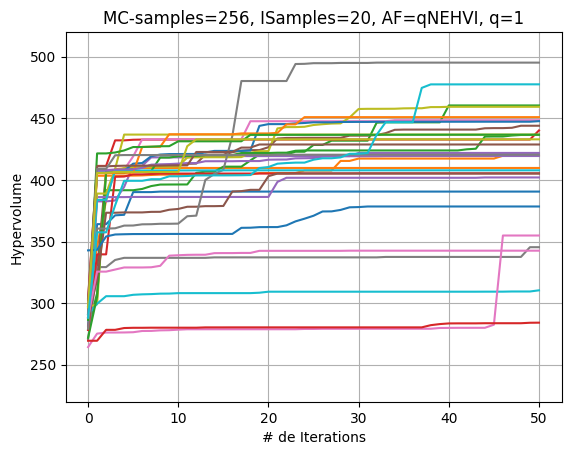

In [47]:
iters = np.arange(51)

for i in range(30):

    plt.errorbar(iters, np.asarray(hvsf27yexp2d[i]), linewidth=1.5,label='%i' %i)
    plt.xlabel('# de Iterations')
    plt.ylabel('Hypervolume')
    plt.title('MC-samples=256, ISamples=20, AF=qNEHVI, q=1')
plt.grid()
plt.ylim([220,520])
plt.savefig('Exp2-27July')

In [48]:
BDs27yexp2d

[tensor([[-157.1914,    1.1951,   14.6823],
         [-159.1021,    1.2225,   14.4745],
         [-157.2690,    1.2039,   14.3655],
         [-160.4486,    1.2660,   14.4896],
         [-157.3374,    1.2553,   14.2182],
         [-157.9373,    1.2216,   14.2419],
         [-159.1829,    1.2341,   14.3580],
         [-157.1886,    1.1678,   14.3603],
         [-156.0821,    1.1716,   14.0450],
         [-154.8925,    1.1667,   14.1385],
         [-156.3809,    1.1958,   14.3578],
         [-160.3035,    1.2760,   14.1998],
         [-161.9856,    1.2912,   14.0429],
         [-160.7947,    1.2825,   14.4067],
         [-159.5535,    1.2313,   14.5994],
         [-156.5807,    1.2039,   14.2951],
         [-160.4852,    1.2698,   14.2062],
         [-154.7087,    1.1206,   14.0076],
         [-148.7534,    0.9501,   14.4229],
         [-148.2310,    0.9501,   14.3979],
         [-151.6075,    0.9501,   14.5057],
         [-146.9107,    0.9501,   14.4944],
         [-148.9398,    0.9501, 

In [67]:
%store BDs27yexp2
%store hvsf27yexp2
%store trainxall27yexp2
%store trainobjall27yexp2
%store numbd27yexp2

Stored 'BDs27yexp2' (list)
Stored 'hvsf27yexp2' (list)
Stored 'trainxall27yexp2' (list)
Stored 'trainobjall27yexp2' (list)
Stored 'numbd27yexp2' (list)


In [47]:
BDs27yexp3=[]
hvsf27yexp3=[]
trainxall27yexp3=[]
trainobjall27yexp3=[]
numbd27yexp3=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=30)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp3.append(bd.pareto_Y)      
    hvsf27yexp3.append(hvs_ehvi)   
    trainxall27yexp3.append(train_x_ehvi)
    trainobjall27yexp3.append(train_obj_ehvi)
    numbd27yexp3.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]

Seed: 139

Batch  1: Hypervolume (qNEHVI) = 437.8320 #Paprox=10 time = 7.31 Lysine= 0.9501 Energy= 14.4514 Costs= 146.3460)
Batch  2: Hypervolume (qNEHVI) = 437.8320 #Paprox=10 time = 7.53 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 438.4262 #Paprox=11 time = 7.52 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)
Batch  4: Hypervolume (qNEHVI) = 438.8735 #Paprox=12 time = 7.71 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 438.8735 #Paprox=13 time = 8.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 438.8735 #Paprox=14 time = 8.20 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  7: Hypervolume (qNEHVI) = 438.8735 #Paprox=15 time = 8.03 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 438.8735 #Paprox=16 time = 8.45 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 466.3823 #Paprox=17 time = 8.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 466.3823 #Paprox=17 time = 8.47 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 482.4040 #Paprox=18 time = 8.39 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 482.5513 #Paprox=19 time = 8.44 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 482.5513 #Paprox=20 time = 8.53 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 482.5513 #Paprox=21 time = 8.58 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 482.5513 #Paprox=22 time = 8.62 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 482.5513 #Paprox=23 time = 8.64 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 482.5513 #Paprox=24 time = 8.79 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 482.5513 #Paprox=25 time = 8.69 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 482.5513 #Paprox=25 time = 8.62 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 482.5513 #Paprox=25 time = 8.78 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 482.5513 #Paprox=26 time = 8.85 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 482.5513 #Paprox=27 time = 8.82 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 482.5513 #Paprox=28 time = 9.02 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 482.5513 #Paprox=29 time = 8.96 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 482.5513 #Paprox=30 time = 9.33 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 482.5513 #Paprox=30 time = 9.15 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 482.5513 #Paprox=31 time = 9.27 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 482.5513 #Paprox=32 time = 9.17 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 482.5513 #Paprox=33 time = 9.40 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 482.5513 #Paprox=34 time = 9.26 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 482.5513 #Paprox=35 time = 9.10 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 482.5513 #Paprox=36 time = 9.42 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 482.5513 #Paprox=37 time = 9.12 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 482.5513 #Paprox=38 time = 9.17 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 482.5513 #Paprox=39 time = 9.32 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 482.5513 #Paprox=39 time = 9.15 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 482.5513 #Paprox=40 time = 9.22 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 482.5513 #Paprox=40 time = 9.38 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 482.5513 #Paprox=41 time = 9.32 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 482.5513 #Paprox=42 time = 9.32 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 482.5513 #Paprox=42 time = 9.50 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 482.5513 #Paprox=42 time = 9.35 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 482.5513 #Paprox=43 time = 9.40 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 482.5513 #Paprox=44 time = 9.39 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 482.5513 #Paprox=44 time = 9.56 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 482.5513 #Paprox=44 time = 9.35 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 482.5513 #Paprox=45 time = 9.51 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 482.5513 #Paprox=46 time = 9.56 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 482.5513 #Paprox=47 time = 9.72 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▎                                       | 1/30 [07:25<3:35:07, 445.08s/it]


Batch 50: Hypervolume (qNEHVI) = 482.5513 #Paprox=47 time = 9.87 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)Seed: 312

Batch  1: Hypervolume (qNEHVI) = 439.6440 #Paprox=10 time = 6.02 Lysine= 0.9501 Energy= 14.3944 Costs= 145.7057)
Batch  2: Hypervolume (qNEHVI) = 439.6440 #Paprox=10 time = 6.23 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 441.2684 #Paprox=11 time = 6.61 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 462.6277 #Paprox=12 time = 6.53 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)
Batch  5: Hypervolume (qNEHVI) = 462.6277 #Paprox=13 time = 6.77 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  6: Hypervolume (qNEHVI) = 464.5927 #Paprox=14 time = 7.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  7: Hypervolume (qNEHVI) = 464.5927 #Paprox=15 time = 6.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 464.5927 #Paprox=16 time = 6.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 464.5927 #Paprox=17 time = 7.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 464.5927 #Paprox=18 time = 7.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 464.5927 #Paprox=19 time = 7.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 464.5927 #Paprox=20 time = 7.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 464.5927 #Paprox=21 time = 7.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 464.5927 #Paprox=22 time = 7.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 464.5927 #Paprox=23 time = 7.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 464.5927 #Paprox=23 time = 7.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 464.5927 #Paprox=24 time = 7.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 464.5927 #Paprox=25 time = 7.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 464.5927 #Paprox=26 time = 8.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 464.5927 #Paprox=27 time = 8.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 464.5927 #Paprox=28 time = 8.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 464.5927 #Paprox=28 time = 8.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 464.5927 #Paprox=28 time = 8.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 464.5927 #Paprox=28 time = 8.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 464.5927 #Paprox=29 time = 8.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 464.5927 #Paprox=30 time = 8.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 464.5927 #Paprox=31 time = 8.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 466.1634 #Paprox=32 time = 8.45 Lysine= 1.0416 Energy= 14.0194 Costs= 146.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 468.3541 #Paprox=33 time = 8.65 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 468.3541 #Paprox=34 time = 8.89 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 468.3541 #Paprox=35 time = 9.24 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 468.3541 #Paprox=36 time = 9.24 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 468.3541 #Paprox=36 time = 9.42 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 468.3541 #Paprox=37 time = 9.34 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 468.3541 #Paprox=38 time = 9.37 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 468.3541 #Paprox=39 time = 9.50 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 468.3541 #Paprox=40 time = 9.68 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 468.3541 #Paprox=41 time = 9.51 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 468.3541 #Paprox=42 time = 9.67 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 468.3541 #Paprox=43 time = 9.59 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 468.3541 #Paprox=44 time = 9.58 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 468.3541 #Paprox=45 time = 9.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 468.3541 #Paprox=46 time = 9.83 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 468.3541 #Paprox=47 time = 9.87 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 468.3541 #Paprox=48 time = 9.79 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 468.3541 #Paprox=49 time = 9.62 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 468.3541 #Paprox=50 time = 9.69 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 468.3541 #Paprox=50 time = 9.92 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 468.3541 #Paprox=51 time = 10.29 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▋                                      | 2/30 [14:25<3:20:57, 430.61s/it]


Batch 50: Hypervolume (qNEHVI) = 468.3541 #Paprox=51 time = 10.02 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 905

Batch  1: Hypervolume (qNEHVI) = 413.7918 #Paprox=12 time = 7.85 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 413.7918 #Paprox=12 time = 7.84 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 433.9535 #Paprox=13 time = 7.99 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 436.1721 #Paprox=14 time = 8.24 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 452.1720 #Paprox=15 time = 8.17 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)
Batch  6: Hypervolume (qNEHVI) = 452.2345 #Paprox=15 time = 8.00 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)
Batch  7: Hypervolume (qNEHVI) = 452.2345 #Paprox=16 time = 8.52 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 452.2345 #Paprox=17 time = 8.43 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 452.2345 #Paprox=18 time = 8.47 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 452.9672 #Paprox=19 time = 8.66 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 455.3958 #Paprox=20 time = 8.90 Lysine= 1.4784 Energy= 14.0010 Costs= 167.5201)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 456.3226 #Paprox=21 time = 9.21 Lysine= 1.5257 Energy= 14.0010 Costs= 168.6013)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 456.3446 #Paprox=22 time = 9.52 Lysine= 1.5269 Energy= 14.0010 Costs= 168.6956)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 456.3446 #Paprox=22 time = 9.53 Lysine= 1.0366 Energy= 14.0010 Costs= 157.0630)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 456.3446 #Paprox=22 time = 9.47 Lysine= 1.0185 Energy= 14.0010 Costs= 157.3979)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 456.3446 #Paprox=22 time = 9.68 Lysine= 1.0243 Energy= 14.0010 Costs= 157.8258)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 456.3446 #Paprox=22 time = 9.57 Lysine= 1.0234 Energy= 14.0010 Costs= 157.8396)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 456.3446 #Paprox=22 time = 9.41 Lysine= 0.9755 Energy= 14.0010 Costs= 156.9238)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 456.3446 #Paprox=22 time = 9.50 Lysine= 0.9790 Energy= 14.0010 Costs= 156.6738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 456.3446 #Paprox=22 time = 9.83 Lysine= 1.0314 Energy= 14.0010 Costs= 158.3383)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 456.3814 #Paprox=23 time = 9.77 Lysine= 0.9828 Energy= 14.0010 Costs= 150.6526)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 457.3431 #Paprox=24 time = 9.59 Lysine= 1.4175 Energy= 14.0010 Costs= 159.8920)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 457.3431 #Paprox=24 time = 9.94 Lysine= 1.0072 Energy= 14.0010 Costs= 157.6833)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 457.3431 #Paprox=24 time = 9.84 Lysine= 0.9856 Energy= 14.0010 Costs= 157.3946)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 457.3431 #Paprox=24 time = 9.77 Lysine= 0.9501 Energy= 14.0010 Costs= 149.8130)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 459.0194 #Paprox=25 time = 9.94 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 459.0194 #Paprox=26 time = 9.94 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 459.4055 #Paprox=27 time = 10.05 Lysine= 1.4055 Energy= 14.0010 Costs= 159.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 459.4055 #Paprox=27 time = 10.30 Lysine= 0.9501 Energy= 14.0010 Costs= 150.0108)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 459.4522 #Paprox=28 time = 10.22 Lysine= 1.4253 Energy= 14.0010 Costs= 160.2698)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 459.5305 #Paprox=29 time = 10.84 Lysine= 0.9869 Energy= 14.0010 Costs= 150.5097)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 459.8075 #Paprox=30 time = 10.27 Lysine= 1.3773 Energy= 14.0010 Costs= 158.9477)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 459.8075 #Paprox=31 time = 10.73 Lysine= 1.3773 Energy= 14.0010 Costs= 158.9477)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 459.8075 #Paprox=31 time = 10.85 Lysine= 0.9501 Energy= 14.0010 Costs= 150.1357)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 462.3661 #Paprox=32 time = 10.85 Lysine= 0.9501 Energy= 14.5285 Costs= 147.6910)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 462.3661 #Paprox=33 time = 10.55 Lysine= 0.9725 Energy= 14.0010 Costs= 150.8196)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 462.3683 #Paprox=34 time = 10.67 Lysine= 1.4258 Energy= 14.0010 Costs= 160.4182)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 462.4162 #Paprox=35 time = 11.06 Lysine= 0.9501 Energy= 14.2879 Costs= 145.4626)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 466.8825 #Paprox=36 time = 11.12 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 466.8825 #Paprox=36 time = 11.43 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 466.8825 #Paprox=36 time = 11.32 Lysine= 0.9501 Energy= 14.0010 Costs= 145.6237)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 466.8825 #Paprox=37 time = 11.64 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0642)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 466.8825 #Paprox=38 time = 11.18 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5956)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 466.8825 #Paprox=38 time = 11.50 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5956)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 466.8825 #Paprox=38 time = 11.13 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5956)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 467.4986 #Paprox=38 time = 11.43 Lysine= 0.9925 Energy= 14.0010 Costs= 149.5013)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 467.4986 #Paprox=38 time = 11.13 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5956)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 467.4986 #Paprox=38 time = 11.23 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5956)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 467.4986 #Paprox=38 time = 11.40 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5956)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|████                                     | 3/30 [22:43<3:27:40, 461.49s/it]


Batch 50: Hypervolume (qNEHVI) = 467.4986 #Paprox=38 time = 11.33 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5956)Seed: 539

Batch  1: Hypervolume (qNEHVI) = 455.0559 #Paprox=10 time = 6.38 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 455.0559 #Paprox=10 time = 6.67 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 455.0559 #Paprox=10 time = 6.95 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)
Batch  4: Hypervolume (qNEHVI) = 467.8719 #Paprox=11 time = 6.92 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)
Batch  5: Hypervolume (qNEHVI) = 467.8719 #Paprox=12 time = 7.18 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)
Batch  6: Hypervolume (qNEHVI) = 467.8719 #Paprox=13 time = 7.63 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 467.8719 #Paprox=14 time = 7.46 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 467.8719 #Paprox=15 time = 7.66 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 467.8719 #Paprox=15 time = 7.52 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 467.8719 #Paprox=16 time = 7.58 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 467.8719 #Paprox=17 time = 7.77 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 467.8719 #Paprox=18 time = 7.98 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 467.8719 #Paprox=19 time = 7.92 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 467.8719 #Paprox=19 time = 8.00 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 467.8719 #Paprox=20 time = 7.91 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 467.8719 #Paprox=21 time = 8.03 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 467.8719 #Paprox=21 time = 7.97 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 467.8719 #Paprox=22 time = 8.24 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 467.8719 #Paprox=23 time = 8.22 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 467.8719 #Paprox=24 time = 8.28 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 467.8719 #Paprox=24 time = 8.19 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 467.8719 #Paprox=25 time = 8.16 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 467.8719 #Paprox=26 time = 8.24 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 467.8719 #Paprox=27 time = 8.65 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 467.8719 #Paprox=28 time = 8.51 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 467.8719 #Paprox=28 time = 8.55 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 467.8719 #Paprox=29 time = 8.47 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 467.8719 #Paprox=29 time = 8.45 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 467.8719 #Paprox=30 time = 8.42 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 467.8719 #Paprox=31 time = 8.81 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 467.8719 #Paprox=31 time = 8.54 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 467.8719 #Paprox=31 time = 8.68 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 467.8719 #Paprox=32 time = 8.57 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 467.8719 #Paprox=32 time = 8.55 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 467.8719 #Paprox=33 time = 8.77 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 467.8719 #Paprox=33 time = 8.86 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 467.8719 #Paprox=33 time = 8.56 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 467.8719 #Paprox=34 time = 8.91 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 467.8719 #Paprox=35 time = 8.83 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 467.8719 #Paprox=35 time = 8.97 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 467.8719 #Paprox=36 time = 8.98 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 467.8719 #Paprox=36 time = 8.83 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 467.8719 #Paprox=37 time = 9.10 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 467.8719 #Paprox=38 time = 8.96 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 467.8719 #Paprox=39 time = 8.88 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 467.8719 #Paprox=40 time = 8.92 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 467.8719 #Paprox=41 time = 8.92 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 467.8719 #Paprox=41 time = 9.11 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 467.8719 #Paprox=42 time = 9.04 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|█████▍                                   | 4/30 [29:38<3:11:56, 442.96s/it]


Batch 50: Hypervolume (qNEHVI) = 467.8719 #Paprox=42 time = 9.44 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)Seed: 356

Batch  1: Hypervolume (qNEHVI) = 418.8383 #Paprox=16 time = 7.36 Lysine= 0.9501 Energy= 14.3927 Costs= 145.6801)
Batch  2: Hypervolume (qNEHVI) = 418.8383 #Paprox=16 time = 7.35 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 420.1313 #Paprox=17 time = 7.75 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 439.2925 #Paprox=18 time = 7.72 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 439.2925 #Paprox=18 time = 7.99 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)
Batch  6: Hypervolume (qNEHVI) = 439.2925 #Paprox=19 time = 7.87 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 439.2925 #Paprox=20 time = 8.32 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 439.2925 #Paprox=21 time = 8.29 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 439.2925 #Paprox=22 time = 8.45 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 439.2925 #Paprox=23 time = 8.38 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 439.2925 #Paprox=24 time = 8.69 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 439.2925 #Paprox=25 time = 8.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 439.2925 #Paprox=26 time = 9.06 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 439.2925 #Paprox=27 time = 8.89 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 439.2925 #Paprox=28 time = 9.27 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 439.2925 #Paprox=29 time = 8.89 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 439.2925 #Paprox=30 time = 9.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 439.2925 #Paprox=31 time = 9.29 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 439.2925 #Paprox=32 time = 9.37 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 439.2925 #Paprox=33 time = 9.30 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 439.2925 #Paprox=34 time = 9.42 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 439.2925 #Paprox=35 time = 9.29 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 439.2925 #Paprox=36 time = 9.26 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 439.2925 #Paprox=37 time = 9.24 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 439.2925 #Paprox=38 time = 9.54 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 439.2925 #Paprox=39 time = 9.60 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 439.2925 #Paprox=40 time = 9.66 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 439.2925 #Paprox=41 time = 9.62 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 439.2925 #Paprox=42 time = 9.61 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 439.2925 #Paprox=43 time = 9.76 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 439.2925 #Paprox=44 time = 9.89 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 439.2925 #Paprox=45 time = 9.71 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 439.2925 #Paprox=46 time = 10.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 439.2925 #Paprox=47 time = 9.95 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 439.2925 #Paprox=48 time = 10.00 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 439.2925 #Paprox=49 time = 10.16 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 439.2925 #Paprox=50 time = 10.06 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 439.2925 #Paprox=51 time = 10.34 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 439.2925 #Paprox=52 time = 10.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 439.2925 #Paprox=53 time = 10.31 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 439.2925 #Paprox=53 time = 10.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 439.2925 #Paprox=54 time = 10.31 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 439.2925 #Paprox=54 time = 10.45 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 439.2925 #Paprox=55 time = 10.29 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 439.2925 #Paprox=56 time = 10.64 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 439.2925 #Paprox=57 time = 10.54 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 439.2925 #Paprox=56 time = 10.65 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 439.2925 #Paprox=57 time = 10.50 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 439.2925 #Paprox=58 time = 10.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▊                                  | 5/30 [37:29<3:08:47, 453.08s/it]


Batch 50: Hypervolume (qNEHVI) = 439.2925 #Paprox=59 time = 10.60 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)Seed: 853

Batch  1: Hypervolume (qNEHVI) = 420.1122 #Paprox=14 time = 7.41 Lysine= 0.9501 Energy= 14.3996 Costs= 145.7761)
Batch  2: Hypervolume (qNEHVI) = 420.1122 #Paprox=14 time = 7.41 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 421.7152 #Paprox=15 time = 7.96 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  4: Hypervolume (qNEHVI) = 423.1579 #Paprox=16 time = 8.01 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 423.1579 #Paprox=16 time = 8.50 Lysine= 0.9501 Energy= 14.4165 Costs= 147.9954)
Batch  6: Hypervolume (qNEHVI) = 423.1579 #Paprox=16 time = 8.32 Lysine= 1.1967 Energy= 14.0010 Costs= 170.0472)
Batch  7: Hypervolume (qNEHVI) = 423.1579 #Paprox=17 time = 8.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 423.1579 #Paprox=18 time = 8.39 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 423.1579 #Paprox=19 time = 8.22 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 442.0345 #Paprox=20 time = 8.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 442.0345 #Paprox=21 time = 8.59 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 442.0345 #Paprox=22 time = 8.57 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 442.5372 #Paprox=23 time = 8.79 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 442.5372 #Paprox=24 time = 8.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 442.5372 #Paprox=25 time = 8.96 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 442.5372 #Paprox=26 time = 9.21 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 442.5372 #Paprox=27 time = 9.05 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 442.5372 #Paprox=28 time = 9.24 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 442.5372 #Paprox=29 time = 9.67 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 442.5372 #Paprox=30 time = 9.38 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 442.5372 #Paprox=31 time = 9.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 442.5372 #Paprox=32 time = 9.80 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 442.5372 #Paprox=33 time = 9.80 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 442.5372 #Paprox=34 time = 9.95 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 442.5372 #Paprox=35 time = 10.02 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 442.5372 #Paprox=36 time = 9.96 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 442.5372 #Paprox=37 time = 10.19 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 442.5372 #Paprox=38 time = 9.99 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 442.5372 #Paprox=39 time = 10.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 442.5372 #Paprox=40 time = 10.02 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 442.5372 #Paprox=41 time = 10.30 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 442.5372 #Paprox=42 time = 10.19 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 442.5372 #Paprox=43 time = 10.24 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 442.5372 #Paprox=44 time = 10.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 442.5372 #Paprox=44 time = 10.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 442.5372 #Paprox=45 time = 10.38 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 442.5372 #Paprox=46 time = 10.64 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 442.5372 #Paprox=47 time = 10.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 442.5372 #Paprox=48 time = 10.53 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 442.5372 #Paprox=49 time = 10.65 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 442.5372 #Paprox=50 time = 10.78 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 442.5372 #Paprox=51 time = 10.67 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 442.5372 #Paprox=52 time = 10.86 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 442.5372 #Paprox=53 time = 10.95 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 442.5372 #Paprox=54 time = 10.90 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 442.5372 #Paprox=55 time = 11.06 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 442.5372 #Paprox=56 time = 10.91 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 442.5372 #Paprox=57 time = 11.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 442.5372 #Paprox=58 time = 11.31 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|████████▏                                | 6/30 [45:34<3:05:31, 463.82s/it]


Batch 50: Hypervolume (qNEHVI) = 442.5372 #Paprox=59 time = 11.07 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)Seed: 310

Batch  1: Hypervolume (qNEHVI) = 427.5618 #Paprox=12 time = 6.96 Lysine= 0.9501 Energy= 14.4010 Costs= 145.7913)
Batch  2: Hypervolume (qNEHVI) = 427.5618 #Paprox=12 time = 7.20 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 429.1323 #Paprox=13 time = 7.26 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 429.1323 #Paprox=14 time = 7.43 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 449.7840 #Paprox=15 time = 7.77 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  6: Hypervolume (qNEHVI) = 449.7840 #Paprox=16 time = 8.46 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 471.3843 #Paprox=17 time = 8.50 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 471.3843 #Paprox=17 time = 8.33 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 475.0489 #Paprox=18 time = 8.13 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 475.0489 #Paprox=19 time = 8.41 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 475.0489 #Paprox=19 time = 8.60 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 475.0489 #Paprox=19 time = 8.74 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 475.0489 #Paprox=19 time = 8.74 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 475.0489 #Paprox=20 time = 9.11 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 475.0489 #Paprox=20 time = 9.04 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 475.0489 #Paprox=20 time = 8.93 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 475.0489 #Paprox=21 time = 9.44 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 475.0489 #Paprox=22 time = 9.46 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 475.0489 #Paprox=22 time = 9.20 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 475.0489 #Paprox=23 time = 9.62 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 475.0489 #Paprox=23 time = 9.46 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 475.0489 #Paprox=23 time = 9.42 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 475.0489 #Paprox=23 time = 9.80 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 475.0489 #Paprox=23 time = 9.61 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 475.0489 #Paprox=24 time = 9.74 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 475.0489 #Paprox=24 time = 9.80 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 475.0489 #Paprox=24 time = 9.66 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 475.0489 #Paprox=24 time = 9.97 Lysine= 1.1705 Energy= 14.0010 Costs= 156.2058)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 475.0489 #Paprox=24 time = 9.74 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 475.0489 #Paprox=24 time = 9.69 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 475.5343 #Paprox=21 time = 9.76 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 475.5343 #Paprox=22 time = 8.69 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 475.5343 #Paprox=23 time = 8.26 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 475.5894 #Paprox=24 time = 8.34 Lysine= 0.9528 Energy= 14.3728 Costs= 147.4221)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 475.5894 #Paprox=25 time = 8.70 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 475.6923 #Paprox=26 time = 8.66 Lysine= 1.1369 Energy= 14.3431 Costs= 150.3721)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 475.7084 #Paprox=26 time = 8.61 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 475.7084 #Paprox=27 time = 7.64 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 475.7084 #Paprox=28 time = 7.63 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 475.7084 #Paprox=29 time = 7.55 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 475.7084 #Paprox=30 time = 8.18 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 475.7084 #Paprox=31 time = 7.97 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 475.7084 #Paprox=32 time = 7.98 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 475.7084 #Paprox=33 time = 8.15 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 475.7084 #Paprox=34 time = 8.37 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 475.9227 #Paprox=35 time = 8.89 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 475.9227 #Paprox=36 time = 8.10 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 475.9227 #Paprox=36 time = 8.45 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 475.9227 #Paprox=37 time = 8.44 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 23%|█████████▌                               | 7/30 [52:47<2:54:01, 453.97s/it]


Batch 50: Hypervolume (qNEHVI) = 475.9227 #Paprox=38 time = 8.63 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)Seed: 926

Batch  1: Hypervolume (qNEHVI) = 426.8239 #Paprox=12 time = 6.27 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 426.8239 #Paprox=12 time = 6.30 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)
Batch  3: Hypervolume (qNEHVI) = 427.0227 #Paprox=13 time = 6.80 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  4: Hypervolume (qNEHVI) = 445.8993 #Paprox=14 time = 6.70 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 445.8993 #Paprox=14 time = 7.17 Lysine= 1.1511 Energy= 14.0010 Costs= 164.4695)
Batch  6: Hypervolume (qNEHVI) = 447.3243 #Paprox=15 time = 7.33 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  7: Hypervolume (qNEHVI) = 447.3243 #Paprox=16 time = 7.19 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)
Batch  8: Hypervolume (qNEHVI) = 447.3243 #Paprox=17 time = 7.19 Lysine= 0.9501 Energ

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 447.3243 #Paprox=19 time = 7.28 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 447.3243 #Paprox=20 time = 7.61 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 447.3243 #Paprox=21 time = 7.52 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 447.3243 #Paprox=22 time = 7.57 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 447.3243 #Paprox=23 time = 7.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 447.3243 #Paprox=24 time = 7.88 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 447.3243 #Paprox=25 time = 7.76 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 447.3243 #Paprox=26 time = 7.98 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 447.3243 #Paprox=27 time = 7.86 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 447.3243 #Paprox=27 time = 7.77 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 447.3243 #Paprox=28 time = 7.79 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 447.3243 #Paprox=29 time = 8.05 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 447.3243 #Paprox=30 time = 7.99 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 447.3243 #Paprox=31 time = 8.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 447.3243 #Paprox=32 time = 8.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 447.3243 #Paprox=32 time = 8.02 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 447.3243 #Paprox=33 time = 8.36 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 447.3243 #Paprox=34 time = 8.27 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 447.3243 #Paprox=34 time = 8.25 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 447.3243 #Paprox=35 time = 8.53 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 447.3243 #Paprox=36 time = 8.27 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 447.3243 #Paprox=37 time = 8.25 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 447.3243 #Paprox=38 time = 8.41 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 447.3243 #Paprox=39 time = 8.46 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 447.3243 #Paprox=40 time = 8.37 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 447.3243 #Paprox=41 time = 8.72 Lysine= 0.9501 Energy= 14.4388 Costs= 150.7993)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 447.3243 #Paprox=42 time = 8.51 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 447.3243 #Paprox=42 time = 8.61 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 447.3243 #Paprox=43 time = 8.61 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 447.3243 #Paprox=44 time = 8.77 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 447.3243 #Paprox=45 time = 8.45 Lysine= 0.9501 Energy= 14.4490 Costs= 150.8616)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 447.3243 #Paprox=46 time = 8.98 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 447.3243 #Paprox=47 time = 8.57 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 447.3243 #Paprox=47 time = 8.72 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 447.3243 #Paprox=47 time = 8.52 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 447.3243 #Paprox=47 time = 8.76 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 447.3243 #Paprox=47 time = 8.63 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 447.3243 #Paprox=48 time = 8.91 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 447.3243 #Paprox=48 time = 8.75 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 447.3243 #Paprox=49 time = 8.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 27%|██████████▉                              | 8/30 [59:29<2:40:22, 437.39s/it]


Batch 50: Hypervolume (qNEHVI) = 447.3243 #Paprox=48 time = 8.64 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 858

Batch  1: Hypervolume (qNEHVI) = 422.7892 #Paprox=14 time = 7.78 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 422.7892 #Paprox=14 time = 7.70 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 422.7892 #Paprox=15 time = 8.00 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 422.7892 #Paprox=16 time = 8.16 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 426.4034 #Paprox=17 time = 8.20 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 444.1708 #Paprox=18 time = 8.39 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 444.1708 #Paprox=19 time = 8.38 Lysine= 1.1545 Energy= 14.0010 Costs= 151.2610)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 446.2191 #Paprox=20 time = 8.44 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 448.3313 #Paprox=19 time = 8.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 448.3313 #Paprox=20 time = 8.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 448.3313 #Paprox=21 time = 8.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 448.3313 #Paprox=22 time = 8.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 448.3313 #Paprox=23 time = 8.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 448.3313 #Paprox=23 time = 9.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 448.3313 #Paprox=24 time = 9.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 448.3313 #Paprox=25 time = 8.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 448.3313 #Paprox=26 time = 9.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 448.3313 #Paprox=27 time = 9.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 448.3313 #Paprox=28 time = 9.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 448.3313 #Paprox=29 time = 9.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 448.3313 #Paprox=30 time = 9.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 448.3313 #Paprox=31 time = 9.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 448.3313 #Paprox=32 time = 9.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 448.3313 #Paprox=32 time = 9.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 448.3313 #Paprox=33 time = 10.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 448.3313 #Paprox=34 time = 9.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 448.3313 #Paprox=35 time = 9.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 448.3313 #Paprox=36 time = 10.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 448.3313 #Paprox=37 time = 9.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 448.3313 #Paprox=38 time = 10.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 448.3313 #Paprox=39 time = 10.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 448.3313 #Paprox=40 time = 10.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 448.3313 #Paprox=40 time = 10.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 448.3313 #Paprox=41 time = 10.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 448.3313 #Paprox=42 time = 10.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 448.3313 #Paprox=43 time = 10.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 448.3313 #Paprox=43 time = 10.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 448.3313 #Paprox=43 time = 10.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 448.3313 #Paprox=44 time = 10.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 448.3313 #Paprox=45 time = 10.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 448.3313 #Paprox=46 time = 10.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 448.3313 #Paprox=47 time = 10.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 448.3313 #Paprox=48 time = 10.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 448.3313 #Paprox=48 time = 10.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 448.3313 #Paprox=48 time = 10.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 448.3313 #Paprox=49 time = 10.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 448.3313 #Paprox=50 time = 10.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 448.3313 #Paprox=51 time = 10.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 448.3313 #Paprox=51 time = 10.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 30%|███████████▋                           | 9/30 [1:07:32<2:38:01, 451.52s/it]


Batch 50: Hypervolume (qNEHVI) = 448.3313 #Paprox=51 time = 10.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 668

Batch  1: Hypervolume (qNEHVI) = 416.6445 #Paprox=15 time = 7.65 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 416.6445 #Paprox=15 time = 7.45 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)
Batch  3: Hypervolume (qNEHVI) = 432.2079 #Paprox=16 time = 7.58 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  4: Hypervolume (qNEHVI) = 434.4846 #Paprox=13 time = 7.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  5: Hypervolume (qNEHVI) = 434.4846 #Paprox=14 time = 7.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 434.4846 #Paprox=15 time = 7.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 434.4846 #Paprox=16 time = 7.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 434.4846 #Paprox=17 time = 7.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 434.4846 #Paprox=17 time = 7.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 434.4846 #Paprox=18 time = 7.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 434.4846 #Paprox=19 time = 8.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 434.4846 #Paprox=20 time = 8.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 434.4846 #Paprox=21 time = 8.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 434.4846 #Paprox=22 time = 8.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 434.4846 #Paprox=22 time = 8.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 434.4846 #Paprox=22 time = 8.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 434.4846 #Paprox=23 time = 8.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 434.4846 #Paprox=24 time = 8.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 434.4846 #Paprox=25 time = 8.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 434.4846 #Paprox=26 time = 8.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 434.4846 #Paprox=27 time = 8.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 434.4846 #Paprox=28 time = 8.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 434.4846 #Paprox=29 time = 9.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 434.4846 #Paprox=30 time = 8.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 434.4846 #Paprox=31 time = 8.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 434.4846 #Paprox=32 time = 9.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 434.4846 #Paprox=33 time = 9.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 434.4846 #Paprox=34 time = 9.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 434.4846 #Paprox=35 time = 9.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 434.4846 #Paprox=35 time = 9.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 434.4846 #Paprox=36 time = 9.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 434.4846 #Paprox=37 time = 9.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 434.4846 #Paprox=38 time = 9.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 434.4846 #Paprox=38 time = 9.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 434.4846 #Paprox=38 time = 9.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 434.4846 #Paprox=39 time = 9.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 434.4846 #Paprox=39 time = 9.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 434.4846 #Paprox=40 time = 9.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 434.4846 #Paprox=41 time = 9.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 434.4846 #Paprox=41 time = 9.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 434.4846 #Paprox=41 time = 9.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 434.4846 #Paprox=42 time = 9.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 434.4846 #Paprox=42 time = 9.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 434.4846 #Paprox=43 time = 9.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 434.4846 #Paprox=43 time = 9.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 434.4846 #Paprox=44 time = 9.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 434.4846 #Paprox=44 time = 9.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 434.4846 #Paprox=41 time = 9.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 434.4846 #Paprox=41 time = 9.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|████████████▋                         | 10/30 [1:14:53<2:29:25, 448.30s/it]


Batch 50: Hypervolume (qNEHVI) = 434.4846 #Paprox=42 time = 9.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 862

Batch  1: Hypervolume (qNEHVI) = 425.4197 #Paprox=13 time = 7.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 425.4197 #Paprox=13 time = 7.18 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 425.4197 #Paprox=13 time = 7.68 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)
Batch  4: Hypervolume (qNEHVI) = 456.4749 #Paprox=14 time = 7.58 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 469.9991 #Paprox=15 time = 7.71 Lysine= 1.1144 Energy= 14.0010 Costs= 147.9483)
Batch  6: Hypervolume (qNEHVI) = 469.9991 #Paprox=15 time = 7.77 Lysine= 1.1881 Energy= 14.0010 Costs= 164.4158)
Batch  7: Hypervolume (qNEHVI) = 475.6753 #Paprox=15 time = 7.88 Lysine= 1.1442 Energy= 14.0010 Costs= 147.1337)
Batch  8: Hypervolume (qNEHVI) = 475.6753 #Paprox=15 time = 7.83 Lysine= 1.1407 Energ

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 475.9216 #Paprox=16 time = 8.12 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 475.9216 #Paprox=16 time = 8.18 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 475.9216 #Paprox=17 time = 8.00 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 483.4540 #Paprox=18 time = 8.04 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 483.4540 #Paprox=19 time = 8.26 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 483.4540 #Paprox=20 time = 8.37 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 483.4540 #Paprox=21 time = 8.69 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 484.4760 #Paprox=22 time = 8.78 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 484.4760 #Paprox=23 time = 8.81 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 484.4760 #Paprox=24 time = 8.91 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 484.4760 #Paprox=25 time = 9.16 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3787)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 484.4760 #Paprox=26 time = 9.14 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 484.4760 #Paprox=27 time = 9.49 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 484.4760 #Paprox=28 time = 9.44 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 484.4760 #Paprox=29 time = 9.45 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 485.2596 #Paprox=30 time = 9.65 Lysine= 1.2429 Energy= 14.0010 Costs= 151.1569)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 485.2596 #Paprox=31 time = 9.60 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 485.2596 #Paprox=31 time = 9.79 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 485.2596 #Paprox=32 time = 9.86 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 485.2596 #Paprox=33 time = 9.72 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 485.2596 #Paprox=34 time = 9.91 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 485.2596 #Paprox=35 time = 9.97 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 485.2596 #Paprox=36 time = 10.09 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 485.2596 #Paprox=37 time = 10.37 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 485.2596 #Paprox=38 time = 10.42 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 485.2596 #Paprox=38 time = 10.12 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 485.2596 #Paprox=39 time = 10.41 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 485.2596 #Paprox=40 time = 10.37 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 485.2596 #Paprox=40 time = 10.34 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 485.2596 #Paprox=40 time = 10.29 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 485.2596 #Paprox=40 time = 10.51 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 485.2596 #Paprox=40 time = 10.49 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 485.2596 #Paprox=40 time = 10.38 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 485.2596 #Paprox=41 time = 10.48 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 485.2596 #Paprox=42 time = 10.50 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 485.2596 #Paprox=42 time = 10.53 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 485.2596 #Paprox=43 time = 10.79 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 485.2596 #Paprox=44 time = 10.53 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 485.2596 #Paprox=45 time = 10.78 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 37%|█████████████▉                        | 11/30 [1:22:38<2:23:33, 453.32s/it]


Batch 50: Hypervolume (qNEHVI) = 485.2596 #Paprox=45 time = 10.70 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)Seed: 108

Batch  1: Hypervolume (qNEHVI) = 429.0275 #Paprox=12 time = 7.58 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 429.0275 #Paprox=12 time = 7.70 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 429.0275 #Paprox=12 time = 8.18 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)
Batch  4: Hypervolume (qNEHVI) = 449.1892 #Paprox=13 time = 8.14 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 449.1892 #Paprox=13 time = 8.11 Lysine= 1.1194 Energy= 14.0010 Costs= 167.4575)
Batch  6: Hypervolume (qNEHVI) = 459.8109 #Paprox=14 time = 8.30 Lysine= 0.9501 Energy= 14.0010 Costs= 143.4528)
Batch  7: Hypervolume (qNEHVI) = 467.6675 #Paprox=15 time = 8.61 Lysine= 1.1511 Energy= 14.0010 Costs= 152.4088)
Batch  8: Hypervolume (qNEHVI) = 467.6675 #Paprox=15 time = 8.57 Lysine= 1.2764 Ener

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 468.6720 #Paprox=17 time = 9.07 Lysine= 0.9501 Energy= 14.4784 Costs= 146.6702)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 468.6720 #Paprox=18 time = 9.10 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 468.6720 #Paprox=19 time = 9.32 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 469.0237 #Paprox=20 time = 9.29 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 469.0237 #Paprox=21 time = 9.33 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 469.0276 #Paprox=22 time = 9.39 Lysine= 0.9501 Energy= 14.4456 Costs= 146.5829)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 469.0276 #Paprox=23 time = 9.37 Lysine= 0.9501 Energy= 14.0010 Costs= 143.4528)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 469.0276 #Paprox=24 time = 9.91 Lysine= 0.9501 Energy= 14.0010 Costs= 143.4528)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 469.0397 #Paprox=25 time = 9.61 Lysine= 0.9501 Energy= 14.3229 Costs= 145.6933)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 469.0397 #Paprox=26 time = 10.12 Lysine= 0.9501 Energy= 14.0010 Costs= 143.4528)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 469.0397 #Paprox=26 time = 10.12 Lysine= 0.9501 Energy= 14.0010 Costs= 143.4659)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 469.0397 #Paprox=27 time = 10.81 Lysine= 0.9501 Energy= 14.0010 Costs= 143.4528)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 469.0397 #Paprox=28 time = 10.05 Lysine= 0.9501 Energy= 14.0010 Costs= 143.4528)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 469.0397 #Paprox=29 time = 10.30 Lysine= 0.9501 Energy= 14.0010 Costs= 143.4528)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 470.2954 #Paprox=26 time = 10.30 Lysine= 0.9501 Energy= 14.0010 Costs= 143.3584)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.3325 #Paprox=27 time = 10.96 Lysine= 0.9852 Energy= 14.0010 Costs= 148.2692)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 474.9029 #Paprox=28 time = 10.88 Lysine= 1.0552 Energy= 14.0010 Costs= 149.7848)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 474.9029 #Paprox=29 time = 10.80 Lysine= 0.9852 Energy= 14.0010 Costs= 148.2692)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 475.3265 #Paprox=30 time = 10.75 Lysine= 1.0681 Energy= 14.0010 Costs= 150.0698)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 475.4991 #Paprox=31 time = 10.79 Lysine= 1.0375 Energy= 14.0010 Costs= 149.5490)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 475.5113 #Paprox=32 time = 11.03 Lysine= 1.0632 Energy= 14.0010 Costs= 149.9609)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 475.6542 #Paprox=33 time = 11.85 Lysine= 1.0352 Energy= 14.0010 Costs= 149.3449)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 477.0906 #Paprox=34 time = 11.43 Lysine= 1.1492 Energy= 14.0010 Costs= 151.1436)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 478.2508 #Paprox=34 time = 11.38 Lysine= 1.1714 Energy= 14.0010 Costs= 151.2165)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 479.2815 #Paprox=35 time = 11.46 Lysine= 0.9501 Energy= 14.5498 Costs= 150.4171)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 480.9478 #Paprox=36 time = 11.99 Lysine= 1.2640 Energy= 14.8640 Costs= 166.0997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 482.1685 #Paprox=37 time = 12.09 Lysine= 1.0953 Energy= 14.6850 Costs= 158.4860)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 483.3854 #Paprox=38 time = 12.58 Lysine= 1.1821 Energy= 14.8366 Costs= 159.9597)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 485.3293 #Paprox=39 time = 12.31 Lysine= 0.9501 Energy= 14.8441 Costs= 152.4894)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 485.3293 #Paprox=39 time = 12.88 Lysine= 0.9501 Energy= 14.0010 Costs= 150.0707)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 485.3293 #Paprox=39 time = 12.81 Lysine= 0.9501 Energy= 14.0010 Costs= 149.9998)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 485.3293 #Paprox=39 time = 12.43 Lysine= 0.9501 Energy= 14.0010 Costs= 150.5321)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 485.3293 #Paprox=39 time = 12.42 Lysine= 0.9501 Energy= 14.0010 Costs= 150.5703)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 485.3293 #Paprox=39 time = 12.24 Lysine= 0.9501 Energy= 14.0010 Costs= 150.4473)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 485.3293 #Paprox=39 time = 12.31 Lysine= 0.9501 Energy= 14.0010 Costs= 150.5502)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 485.3293 #Paprox=39 time = 12.37 Lysine= 0.9501 Energy= 14.0010 Costs= 150.2913)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 485.3293 #Paprox=39 time = 12.47 Lysine= 0.9501 Energy= 14.0010 Costs= 150.4476)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 485.3293 #Paprox=39 time = 12.21 Lysine= 0.9501 Energy= 14.0010 Costs= 150.4045)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 485.3293 #Paprox=39 time = 13.07 Lysine= 0.9501 Energy= 14.0010 Costs= 149.8670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 485.3293 #Paprox=39 time = 12.20 Lysine= 0.9501 Energy= 14.0010 Costs= 150.5271)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 40%|███████████████▏                      | 12/30 [1:31:28<2:23:03, 476.87s/it]


Batch 50: Hypervolume (qNEHVI) = 485.3293 #Paprox=39 time = 12.09 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8064)Seed: 215

Batch  1: Hypervolume (qNEHVI) = 426.6104 #Paprox=15 time = 6.53 Lysine= 0.9501 Energy= 14.3896 Costs= 145.6569)
Batch  2: Hypervolume (qNEHVI) = 426.6104 #Paprox=15 time = 6.72 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 445.4601 #Paprox=16 time = 6.90 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 445.4601 #Paprox=16 time = 7.17 Lysine= 1.2618 Energy= 14.0010 Costs= 169.5606)
Batch  5: Hypervolume (qNEHVI) = 445.7106 #Paprox=17 time = 7.18 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)
Batch  6: Hypervolume (qNEHVI) = 447.0263 #Paprox=18 time = 7.20 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  7: Hypervolume (qNEHVI) = 447.0263 #Paprox=19 time = 7.51 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 447.0263 #Paprox=20 time = 7.39 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 447.0266 #Paprox=21 time = 7.64 Lysine= 0.9501 Energy= 14.4707 Costs= 146.5623)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 447.5292 #Paprox=22 time = 7.52 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 447.5292 #Paprox=23 time = 7.81 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 447.5292 #Paprox=24 time = 7.87 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 447.5292 #Paprox=25 time = 8.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 447.5292 #Paprox=26 time = 7.89 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 447.5292 #Paprox=27 time = 7.87 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 447.5292 #Paprox=28 time = 8.10 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 447.5292 #Paprox=29 time = 8.26 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 447.5292 #Paprox=30 time = 8.19 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 447.5292 #Paprox=31 time = 8.30 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 447.5292 #Paprox=32 time = 8.33 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 447.5292 #Paprox=33 time = 8.16 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 447.5292 #Paprox=34 time = 8.26 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 447.5292 #Paprox=34 time = 8.43 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 447.5292 #Paprox=35 time = 8.42 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 447.5292 #Paprox=36 time = 8.54 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 447.5292 #Paprox=37 time = 8.57 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 447.5297 #Paprox=38 time = 8.66 Lysine= 0.9501 Energy= 14.4732 Costs= 146.5926)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 447.5297 #Paprox=39 time = 8.71 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 447.5297 #Paprox=40 time = 8.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 447.5297 #Paprox=40 time = 8.40 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 447.5297 #Paprox=41 time = 8.75 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 447.5297 #Paprox=42 time = 8.85 Lysine= 0.9501 Energy= 14.4719 Costs= 147.0392)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 447.5297 #Paprox=43 time = 8.72 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 447.5297 #Paprox=44 time = 8.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 447.5297 #Paprox=45 time = 8.88 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 447.5297 #Paprox=46 time = 8.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 447.5297 #Paprox=46 time = 8.85 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 447.5297 #Paprox=47 time = 8.83 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 447.5297 #Paprox=48 time = 8.76 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 447.5310 #Paprox=48 time = 8.99 Lysine= 0.9501 Energy= 14.4885 Costs= 146.8218)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 447.5310 #Paprox=49 time = 9.25 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 447.5310 #Paprox=50 time = 9.02 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 447.5310 #Paprox=50 time = 9.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 447.5312 #Paprox=51 time = 9.22 Lysine= 0.9501 Energy= 14.4921 Costs= 146.8757)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 447.5312 #Paprox=52 time = 9.11 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 447.5312 #Paprox=53 time = 9.27 Lysine= 0.9501 Energy= 14.4719 Costs= 146.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 447.5312 #Paprox=54 time = 9.47 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 447.5312 #Paprox=55 time = 9.30 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 447.5312 #Paprox=56 time = 9.64 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 43%|████████████████▍                     | 13/30 [1:38:27<2:10:06, 459.18s/it]


Batch 50: Hypervolume (qNEHVI) = 447.5312 #Paprox=57 time = 9.37 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)Seed: 605

Batch  1: Hypervolume (qNEHVI) = 426.1152 #Paprox=12 time = 6.93 Lysine= 0.9501 Energy= 14.3973 Costs= 145.7499)
Batch  2: Hypervolume (qNEHVI) = 426.1152 #Paprox=12 time = 7.12 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 447.1131 #Paprox=13 time = 7.34 Lysine= 1.1684 Energy= 14.0010 Costs= 147.8659)
Batch  4: Hypervolume (qNEHVI) = 447.1131 #Paprox=13 time = 7.72 Lysine= 1.2618 Energy= 14.0010 Costs= 169.5606)
Batch  5: Hypervolume (qNEHVI) = 449.6762 #Paprox=13 time = 7.79 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)
Batch  6: Hypervolume (qNEHVI) = 449.7321 #Paprox=14 time = 6.51 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)
Batch  7: Hypervolume (qNEHVI) = 451.6182 #Paprox=15 time = 5.20 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)
Batch  8: Hypervolume (qNEHVI) = 451.6182 #Paprox=16 time = 5.57 Lysine= 1.2757 Energ

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 451.6182 #Paprox=16 time = 5.16 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 451.6182 #Paprox=17 time = 5.24 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 451.6182 #Paprox=18 time = 5.49 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 451.6182 #Paprox=19 time = 5.39 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 451.6182 #Paprox=20 time = 5.27 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 452.6909 #Paprox=21 time = 5.32 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 452.6909 #Paprox=22 time = 5.32 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 452.6909 #Paprox=23 time = 5.49 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 454.2184 #Paprox=24 time = 5.69 Lysine= 1.2494 Energy= 14.0010 Costs= 149.8385)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 454.2184 #Paprox=25 time = 5.66 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 454.2184 #Paprox=26 time = 5.58 Lysine= 1.2494 Energy= 14.0010 Costs= 149.8385)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 454.2184 #Paprox=27 time = 5.92 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 454.2184 #Paprox=28 time = 6.06 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 454.2184 #Paprox=29 time = 5.88 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 454.2184 #Paprox=30 time = 6.15 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 454.2184 #Paprox=31 time = 6.32 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 454.2184 #Paprox=32 time = 6.39 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 479.5758 #Paprox=33 time = 6.17 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 479.5760 #Paprox=34 time = 6.48 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 479.5760 #Paprox=35 time = 6.13 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 479.5760 #Paprox=36 time = 6.70 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 479.5760 #Paprox=37 time = 6.37 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 479.5760 #Paprox=38 time = 6.65 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 479.5760 #Paprox=38 time = 6.85 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 479.5760 #Paprox=39 time = 6.56 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 479.5760 #Paprox=40 time = 6.68 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 479.5760 #Paprox=41 time = 6.80 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 479.5760 #Paprox=42 time = 6.86 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 479.5760 #Paprox=43 time = 6.82 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 479.5760 #Paprox=43 time = 7.08 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 479.5760 #Paprox=44 time = 6.93 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 479.5760 #Paprox=45 time = 7.19 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 479.5760 #Paprox=46 time = 7.31 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 479.5760 #Paprox=47 time = 7.13 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 479.5760 #Paprox=48 time = 7.15 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 479.5760 #Paprox=49 time = 7.52 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 479.5760 #Paprox=50 time = 7.22 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 479.5760 #Paprox=51 time = 7.63 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 479.5760 #Paprox=52 time = 7.41 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 479.5760 #Paprox=53 time = 7.32 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 479.5760 #Paprox=54 time = 7.44 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 47%|█████████████████▋                    | 14/30 [1:43:51<1:51:37, 418.58s/it]


Batch 50: Hypervolume (qNEHVI) = 479.5760 #Paprox=54 time = 7.40 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)Seed: 367

Batch  1: Hypervolume (qNEHVI) = 432.2532 #Paprox=11 time = 6.98 Lysine= 0.9501 Energy= 14.4294 Costs= 146.1041)
Batch  2: Hypervolume (qNEHVI) = 432.2532 #Paprox=11 time = 7.19 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 432.9886 #Paprox=12 time = 7.29 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 457.8356 #Paprox=13 time = 7.57 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 476.7793 #Paprox=14 time = 7.81 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)
Batch  6: Hypervolume (qNEHVI) = 476.7793 #Paprox=14 time = 7.78 Lysine= 1.2037 Energy= 14.0010 Costs= 169.9230)
Batch  7: Hypervolume (qNEHVI) = 476.7793 #Paprox=15 time = 7.58 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 476.7793 #Paprox=16 time = 7.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 476.7793 #Paprox=17 time = 8.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 476.7793 #Paprox=18 time = 8.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.7793 #Paprox=19 time = 8.16 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 476.7793 #Paprox=20 time = 8.38 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 476.7793 #Paprox=21 time = 8.41 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 476.7793 #Paprox=22 time = 8.39 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 476.7793 #Paprox=23 time = 8.64 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 476.7793 #Paprox=24 time = 8.60 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 476.7793 #Paprox=25 time = 8.89 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 476.7793 #Paprox=26 time = 9.06 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 476.7793 #Paprox=27 time = 9.02 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 476.7793 #Paprox=28 time = 8.96 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 476.7793 #Paprox=29 time = 9.17 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 476.7793 #Paprox=30 time = 8.94 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 476.7793 #Paprox=31 time = 9.04 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 476.7793 #Paprox=32 time = 9.42 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 476.7793 #Paprox=33 time = 9.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 476.7793 #Paprox=34 time = 9.36 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 476.7793 #Paprox=35 time = 9.50 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 476.7793 #Paprox=36 time = 9.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 476.7793 #Paprox=37 time = 9.52 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 476.7793 #Paprox=38 time = 9.65 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 476.7793 #Paprox=39 time = 9.57 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 476.7793 #Paprox=40 time = 9.63 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 476.7793 #Paprox=41 time = 9.75 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 476.7793 #Paprox=42 time = 9.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 476.7793 #Paprox=43 time = 9.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 476.7793 #Paprox=44 time = 10.23 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 476.7793 #Paprox=45 time = 9.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 476.7793 #Paprox=44 time = 10.16 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 476.7793 #Paprox=45 time = 10.15 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 476.7793 #Paprox=46 time = 10.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 476.7793 #Paprox=47 time = 10.30 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 476.7793 #Paprox=48 time = 10.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 476.7793 #Paprox=49 time = 10.11 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 476.7793 #Paprox=50 time = 10.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 476.7793 #Paprox=51 time = 10.55 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 476.7793 #Paprox=52 time = 10.61 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 476.7793 #Paprox=53 time = 10.42 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 476.7793 #Paprox=54 time = 10.39 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 476.7793 #Paprox=55 time = 10.40 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 50%|███████████████████                   | 15/30 [1:51:31<1:47:44, 430.94s/it]


Batch 50: Hypervolume (qNEHVI) = 476.7793 #Paprox=56 time = 10.62 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)Seed: 145

Batch  1: Hypervolume (qNEHVI) = 406.2424 #Paprox=11 time = 7.85 Lysine= 0.9501 Energy= 14.4270 Costs= 146.0776)
Batch  2: Hypervolume (qNEHVI) = 406.2424 #Paprox=11 time = 7.78 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 419.5923 #Paprox=12 time = 7.97 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)
Batch  4: Hypervolume (qNEHVI) = 426.0379 #Paprox=12 time = 8.19 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)
Batch  5: Hypervolume (qNEHVI) = 426.0379 #Paprox=13 time = 7.46 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 426.0379 #Paprox=14 time = 7.83 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 426.0379 #Paprox=15 time = 8.21 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 426.0379 #Paprox=16 time = 8.29 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 426.0379 #Paprox=17 time = 8.43 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 426.0379 #Paprox=18 time = 8.66 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 426.0379 #Paprox=19 time = 8.52 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 426.0379 #Paprox=20 time = 8.50 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 426.0379 #Paprox=21 time = 8.92 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 426.0379 #Paprox=22 time = 8.84 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 426.0379 #Paprox=23 time = 8.76 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 426.0379 #Paprox=24 time = 9.07 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 426.0379 #Paprox=25 time = 8.97 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 426.0379 #Paprox=26 time = 9.21 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 426.0379 #Paprox=26 time = 9.35 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 426.0379 #Paprox=27 time = 9.29 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 426.0379 #Paprox=28 time = 9.30 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 426.0379 #Paprox=29 time = 9.44 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 426.0379 #Paprox=30 time = 9.33 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 426.0379 #Paprox=31 time = 9.42 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 426.0379 #Paprox=32 time = 9.59 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 426.0379 #Paprox=33 time = 9.62 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 426.0379 #Paprox=33 time = 9.74 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 426.0379 #Paprox=33 time = 9.62 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 426.0379 #Paprox=34 time = 9.60 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 426.0379 #Paprox=32 time = 9.73 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 426.0379 #Paprox=32 time = 9.88 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 426.0379 #Paprox=32 time = 9.65 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 426.0379 #Paprox=32 time = 9.81 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 426.0379 #Paprox=33 time = 9.97 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 426.0379 #Paprox=34 time = 10.00 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 426.0379 #Paprox=35 time = 9.91 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 426.0379 #Paprox=35 time = 10.19 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 426.0379 #Paprox=36 time = 9.98 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 426.0379 #Paprox=36 time = 10.12 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 426.0379 #Paprox=36 time = 10.26 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 426.0379 #Paprox=37 time = 9.94 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 426.0379 #Paprox=38 time = 10.00 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 426.0379 #Paprox=39 time = 10.26 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 426.0379 #Paprox=40 time = 10.20 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 426.0379 #Paprox=39 time = 10.19 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 426.0379 #Paprox=39 time = 10.35 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 426.0379 #Paprox=40 time = 10.19 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 426.0379 #Paprox=41 time = 10.21 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 426.0379 #Paprox=42 time = 10.31 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 53%|████████████████████▎                 | 16/30 [1:59:19<1:43:07, 441.96s/it]


Batch 50: Hypervolume (qNEHVI) = 426.0379 #Paprox=42 time = 10.22 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)Seed: 345

Batch  1: Hypervolume (qNEHVI) = 437.1392 #Paprox=9 time = 7.41 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 437.1392 #Paprox=9 time = 7.54 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 438.1402 #Paprox=10 time = 7.40 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 454.2814 #Paprox=11 time = 7.59 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  5: Hypervolume (qNEHVI) = 456.1183 #Paprox=10 time = 7.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 456.1183 #Paprox=11 time = 6.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.1183 #Paprox=12 time = 6.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 456.1183 #Paprox=13 time = 7.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 456.1183 #Paprox=14 time = 7.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 456.1183 #Paprox=14 time = 7.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 456.1183 #Paprox=15 time = 7.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 456.1183 #Paprox=16 time = 7.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 456.1183 #Paprox=17 time = 7.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 456.1183 #Paprox=18 time = 8.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 456.1183 #Paprox=19 time = 7.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 456.1183 #Paprox=20 time = 7.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 456.1183 #Paprox=21 time = 8.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 456.1183 #Paprox=22 time = 8.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 456.1183 #Paprox=23 time = 8.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 456.1183 #Paprox=24 time = 8.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 456.1183 #Paprox=25 time = 8.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 456.1183 #Paprox=26 time = 8.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 456.1183 #Paprox=27 time = 8.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 456.1183 #Paprox=28 time = 8.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 456.1183 #Paprox=29 time = 8.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 456.1183 #Paprox=30 time = 8.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 456.1183 #Paprox=31 time = 8.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 456.1183 #Paprox=32 time = 8.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 456.1183 #Paprox=33 time = 8.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 456.1183 #Paprox=34 time = 8.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 456.1183 #Paprox=35 time = 8.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 456.1183 #Paprox=36 time = 8.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 456.1183 #Paprox=37 time = 8.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 456.1183 #Paprox=38 time = 8.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 456.1183 #Paprox=38 time = 8.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 456.1183 #Paprox=39 time = 9.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 456.1183 #Paprox=33 time = 9.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 456.1183 #Paprox=33 time = 8.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 456.1183 #Paprox=34 time = 8.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 456.1183 #Paprox=35 time = 8.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 456.1183 #Paprox=36 time = 8.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 456.1183 #Paprox=37 time = 9.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 456.1183 #Paprox=38 time = 9.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 456.1831 #Paprox=39 time = 9.18 Lysine= 1.1283 Energy= 14.4804 Costs= 151.8900)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 459.3699 #Paprox=40 time = 8.97 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 459.3699 #Paprox=40 time = 9.30 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 459.3699 #Paprox=40 time = 9.65 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 459.3699 #Paprox=40 time = 10.02 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 459.3699 #Paprox=40 time = 9.58 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 57%|█████████████████████▌                | 17/30 [2:06:18<1:34:16, 435.14s/it]


Batch 50: Hypervolume (qNEHVI) = 459.3699 #Paprox=40 time = 9.61 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)Seed: 293

Batch  1: Hypervolume (qNEHVI) = 435.6036 #Paprox=13 time = 6.62 Lysine= 0.9501 Energy= 14.4121 Costs= 145.9134)
Batch  2: Hypervolume (qNEHVI) = 435.6036 #Paprox=13 time = 7.05 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 439.0843 #Paprox=14 time = 7.22 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  4: Hypervolume (qNEHVI) = 440.4074 #Paprox=15 time = 7.16 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 440.4074 #Paprox=15 time = 7.48 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  6: Hypervolume (qNEHVI) = 440.4074 #Paprox=15 time = 7.69 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 468.1538 #Paprox=16 time = 7.43 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 469.5402 #Paprox=17 time = 7.62 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 485.5299 #Paprox=18 time = 7.82 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 485.5299 #Paprox=19 time = 7.68 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 485.5299 #Paprox=20 time = 7.96 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 485.5299 #Paprox=21 time = 8.19 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 485.5299 #Paprox=22 time = 8.24 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 485.5299 #Paprox=22 time = 8.17 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 485.5299 #Paprox=23 time = 8.51 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 485.5299 #Paprox=23 time = 8.42 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 485.5299 #Paprox=24 time = 8.52 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 485.5299 #Paprox=24 time = 8.81 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 485.5299 #Paprox=25 time = 8.64 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 485.5299 #Paprox=26 time = 8.96 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 485.5299 #Paprox=27 time = 9.02 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 485.5299 #Paprox=27 time = 9.07 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 485.5299 #Paprox=28 time = 9.16 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 485.5299 #Paprox=29 time = 9.30 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 485.5299 #Paprox=29 time = 9.21 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 485.5299 #Paprox=29 time = 9.12 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 485.5299 #Paprox=30 time = 9.22 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 485.5299 #Paprox=31 time = 9.22 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 485.5299 #Paprox=32 time = 9.36 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 485.5299 #Paprox=32 time = 9.46 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 485.5299 #Paprox=33 time = 9.43 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 485.5299 #Paprox=34 time = 9.60 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 485.5299 #Paprox=34 time = 9.65 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 485.5299 #Paprox=35 time = 9.59 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 485.5299 #Paprox=35 time = 9.52 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 485.5299 #Paprox=36 time = 9.82 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 485.5299 #Paprox=36 time = 9.52 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 485.5299 #Paprox=36 time = 9.53 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 485.5299 #Paprox=37 time = 10.02 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 485.5299 #Paprox=38 time = 9.65 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 485.5299 #Paprox=39 time = 9.64 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 485.5299 #Paprox=39 time = 9.94 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 485.5299 #Paprox=39 time = 9.74 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 485.5299 #Paprox=40 time = 9.96 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 485.5299 #Paprox=40 time = 9.92 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 485.5299 #Paprox=40 time = 10.03 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 485.5299 #Paprox=41 time = 9.92 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 485.5299 #Paprox=42 time = 10.17 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 485.5299 #Paprox=42 time = 10.00 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 60%|██████████████████████▊               | 18/30 [2:13:44<1:27:42, 438.53s/it]


Batch 50: Hypervolume (qNEHVI) = 485.5299 #Paprox=43 time = 9.87 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)Seed: 538

Batch  1: Hypervolume (qNEHVI) = 453.3581 #Paprox=17 time = 7.53 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  2: Hypervolume (qNEHVI) = 453.3581 #Paprox=17 time = 7.29 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 453.3581 #Paprox=18 time = 7.53 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 457.8329 #Paprox=19 time = 7.90 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 457.8329 #Paprox=20 time = 7.79 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 457.8329 #Paprox=21 time = 8.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 457.8329 #Paprox=22 time = 8.42 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 457.8329 #Paprox=23 time = 8.32 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 457.8329 #Paprox=24 time = 8.49 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 457.8329 #Paprox=25 time = 8.67 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 457.8329 #Paprox=26 time = 8.74 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 457.8329 #Paprox=27 time = 9.05 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 457.8329 #Paprox=28 time = 9.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 457.8329 #Paprox=29 time = 8.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 457.8329 #Paprox=30 time = 9.05 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 457.8329 #Paprox=31 time = 9.22 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 457.8329 #Paprox=32 time = 9.30 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 457.8329 #Paprox=33 time = 9.27 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 457.8329 #Paprox=34 time = 9.33 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 457.8329 #Paprox=35 time = 9.39 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 457.8329 #Paprox=35 time = 9.55 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 457.8329 #Paprox=36 time = 9.58 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 457.8329 #Paprox=37 time = 9.63 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 457.8329 #Paprox=37 time = 9.83 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 457.8329 #Paprox=38 time = 10.02 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 457.8329 #Paprox=39 time = 9.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 457.8329 #Paprox=39 time = 10.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 457.8329 #Paprox=40 time = 10.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 457.9341 #Paprox=41 time = 10.03 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 472.9930 #Paprox=42 time = 10.50 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 473.2377 #Paprox=43 time = 10.29 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 473.2377 #Paprox=43 time = 10.72 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 473.2377 #Paprox=43 time = 10.68 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 473.2377 #Paprox=44 time = 10.72 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 473.2377 #Paprox=44 time = 10.69 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 473.2377 #Paprox=44 time = 11.00 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 473.2377 #Paprox=44 time = 11.04 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 473.6878 #Paprox=45 time = 11.05 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 473.6878 #Paprox=46 time = 11.17 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 473.6878 #Paprox=46 time = 11.40 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 473.6878 #Paprox=46 time = 11.45 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 473.6878 #Paprox=47 time = 11.56 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 473.6878 #Paprox=48 time = 11.83 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 473.6878 #Paprox=48 time = 11.71 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 473.6878 #Paprox=49 time = 11.77 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 473.6878 #Paprox=49 time = 11.83 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 473.6878 #Paprox=50 time = 12.36 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 473.6878 #Paprox=50 time = 12.07 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 473.6878 #Paprox=50 time = 11.88 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 63%|████████████████████████              | 19/30 [2:22:02<1:23:40, 456.38s/it]


Batch 50: Hypervolume (qNEHVI) = 473.6878 #Paprox=50 time = 11.97 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)Seed: 430

Batch  1: Hypervolume (qNEHVI) = 427.6770 #Paprox=11 time = 7.71 Lysine= 0.9501 Energy= 14.4036 Costs= 145.8206)
Batch  2: Hypervolume (qNEHVI) = 427.6770 #Paprox=11 time = 7.55 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 428.9549 #Paprox=12 time = 7.91 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 450.0004 #Paprox=13 time = 8.07 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 465.6599 #Paprox=14 time = 8.39 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  6: Hypervolume (qNEHVI) = 467.5776 #Paprox=14 time = 8.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  7: Hypervolume (qNEHVI) = 467.6332 #Paprox=15 time = 7.84 Lysine= 1.1321 Energy= 14.5010 Costs= 152.1126)
Batch  8: Hypervolume (qNEHVI) = 470.8201 #Paprox=16 time = 8.09 Lysine= 1.0383 Ener

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 481.6994 #Paprox=18 time = 9.39 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)
Batch 13: Hypervolume (qNEHVI) = 481.6994 #Paprox=18 time = 9.30 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)
Batch 14: Hypervolume (qNEHVI) = 481.6994 #Paprox=18 time = 9.12 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 481.6994 #Paprox=18 time = 14.35 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 483.5628 #Paprox=19 time = 9.10 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 483.5628 #Paprox=19 time = 9.46 Lysine= 1.1126 Energy= 14.0010 Costs= 153.7801)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 483.5628 #Paprox=20 time = 9.00 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 483.5628 #Paprox=21 time = 9.41 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 483.5628 #Paprox=22 time = 9.53 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 483.5628 #Paprox=23 time = 9.53 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 483.5628 #Paprox=24 time = 9.96 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 483.5628 #Paprox=24 time = 9.98 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 483.5628 #Paprox=25 time = 9.74 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 483.5628 #Paprox=26 time = 9.99 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 483.5628 #Paprox=27 time = 9.99 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 483.5628 #Paprox=28 time = 9.93 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 483.5628 #Paprox=29 time = 10.33 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 483.5628 #Paprox=30 time = 10.18 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 483.5628 #Paprox=31 time = 10.07 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 483.5628 #Paprox=32 time = 10.06 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 483.5628 #Paprox=33 time = 10.38 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 483.5628 #Paprox=34 time = 10.33 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 483.5628 #Paprox=35 time = 10.51 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 483.5628 #Paprox=36 time = 10.24 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 483.5628 #Paprox=37 time = 10.28 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 483.5628 #Paprox=38 time = 10.41 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 483.5628 #Paprox=39 time = 10.60 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 483.5628 #Paprox=40 time = 10.46 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 483.5628 #Paprox=41 time = 10.53 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 483.5628 #Paprox=42 time = 10.63 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 483.5628 #Paprox=43 time = 10.62 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 483.5628 #Paprox=44 time = 10.32 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 483.5628 #Paprox=45 time = 10.79 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 483.5628 #Paprox=45 time = 10.77 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 483.5628 #Paprox=46 time = 10.81 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 483.5628 #Paprox=46 time = 10.80 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 483.5628 #Paprox=47 time = 10.87 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 483.5628 #Paprox=48 time = 10.58 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|█████████████████████████▎            | 20/30 [2:30:12<1:17:43, 466.37s/it]


Batch 50: Hypervolume (qNEHVI) = 483.5628 #Paprox=49 time = 10.90 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 382

Batch  1: Hypervolume (qNEHVI) = 418.0001 #Paprox=16 time = 7.26 Lysine= 0.9501 Energy= 14.4140 Costs= 145.9347)
Batch  2: Hypervolume (qNEHVI) = 418.0001 #Paprox=16 time = 7.47 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 419.1481 #Paprox=17 time = 7.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 441.7238 #Paprox=18 time = 7.63 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 444.5862 #Paprox=19 time = 8.17 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)
Batch  6: Hypervolume (qNEHVI) = 444.5862 #Paprox=20 time = 7.89 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 444.5862 #Paprox=21 time = 8.03 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 444.5862 #Paprox=22 time = 8.53 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 444.5862 #Paprox=23 time = 8.36 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 444.5862 #Paprox=24 time = 8.51 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 444.5862 #Paprox=25 time = 8.71 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 444.5862 #Paprox=26 time = 8.63 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 444.5862 #Paprox=26 time = 8.64 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 444.5862 #Paprox=26 time = 8.84 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 444.5862 #Paprox=27 time = 9.17 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 444.5862 #Paprox=28 time = 8.86 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 444.5862 #Paprox=29 time = 9.11 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 444.5862 #Paprox=30 time = 9.30 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 444.5862 #Paprox=30 time = 9.10 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 444.5862 #Paprox=31 time = 9.22 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 444.5862 #Paprox=32 time = 9.36 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 444.5862 #Paprox=32 time = 9.40 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 444.5862 #Paprox=32 time = 9.57 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 444.5862 #Paprox=33 time = 9.61 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 444.5862 #Paprox=32 time = 9.44 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 444.5862 #Paprox=32 time = 9.53 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 444.5862 #Paprox=32 time = 9.79 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 444.5862 #Paprox=32 time = 9.56 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 444.5862 #Paprox=32 time = 9.74 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 444.5862 #Paprox=32 time = 9.73 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 444.5862 #Paprox=31 time = 9.71 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 444.5862 #Paprox=31 time = 9.64 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 444.5862 #Paprox=32 time = 9.89 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 444.5862 #Paprox=32 time = 9.75 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 444.5862 #Paprox=33 time = 10.46 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 444.5862 #Paprox=33 time = 9.77 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 444.5862 #Paprox=33 time = 9.90 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 444.5862 #Paprox=34 time = 10.10 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 444.5862 #Paprox=35 time = 10.09 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 444.5862 #Paprox=36 time = 9.92 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 444.5862 #Paprox=36 time = 10.20 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 444.5862 #Paprox=37 time = 9.97 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 444.5862 #Paprox=38 time = 10.01 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 444.5862 #Paprox=39 time = 10.12 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 444.5862 #Paprox=39 time = 10.25 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 444.5862 #Paprox=40 time = 10.22 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 444.5862 #Paprox=40 time = 10.48 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 444.5862 #Paprox=41 time = 10.24 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 460.9480 #Paprox=42 time = 10.26 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 70%|██████████████████████████▌           | 21/30 [2:37:58<1:09:56, 466.25s/it]


Batch 50: Hypervolume (qNEHVI) = 460.9480 #Paprox=43 time = 9.95 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)Seed: 410

Batch  1: Hypervolume (qNEHVI) = 437.4633 #Paprox=10 time = 7.60 Lysine= 0.9501 Energy= 14.4098 Costs= 146.0497)
Batch  2: Hypervolume (qNEHVI) = 437.4633 #Paprox=10 time = 7.78 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 438.6845 #Paprox=11 time = 8.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 443.8034 #Paprox=12 time = 8.21 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)
Batch  5: Hypervolume (qNEHVI) = 443.8034 #Paprox=13 time = 8.24 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 443.8034 #Paprox=13 time = 8.47 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 443.8034 #Paprox=13 time = 8.41 Lysine= 1.4770 Energy= 14.0010 Costs= 188.1011)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 444.4481 #Paprox=14 time = 8.43 Lysine= 0.9606 Energy= 14.3544 Costs= 150.4450)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 448.1879 #Paprox=15 time = 8.63 Lysine= 1.1078 Energy= 14.3153 Costs= 152.9251)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 448.7805 #Paprox=14 time = 8.23 Lysine= 1.1653 Energy= 14.3059 Costs= 154.2185)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 449.5380 #Paprox=15 time = 7.83 Lysine= 1.2065 Energy= 14.2992 Costs= 155.1450)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 449.6362 #Paprox=16 time = 7.43 Lysine= 1.1494 Energy= 14.3005 Costs= 154.0531)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 452.0756 #Paprox=17 time = 7.61 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 452.0881 #Paprox=18 time = 7.49 Lysine= 1.2640 Energy= 14.2063 Costs= 155.8686)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 452.0922 #Paprox=19 time = 7.35 Lysine= 1.2180 Energy= 14.2973 Costs= 155.4033)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 452.0922 #Paprox=20 time = 7.06 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 455.2132 #Paprox=20 time = 7.49 Lysine= 1.1093 Energy= 14.3271 Costs= 151.4763)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 455.9132 #Paprox=21 time = 7.86 Lysine= 1.2640 Energy= 14.0510 Costs= 154.7412)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 455.9132 #Paprox=22 time = 7.96 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 455.9132 #Paprox=23 time = 7.62 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 455.9132 #Paprox=24 time = 7.97 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 457.7170 #Paprox=25 time = 8.11 Lysine= 1.1016 Energy= 14.3342 Costs= 150.5874)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 457.7170 #Paprox=26 time = 8.06 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 457.7170 #Paprox=27 time = 7.97 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 457.8481 #Paprox=28 time = 8.26 Lysine= 1.2901 Energy= 14.0010 Costs= 154.9587)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 457.8481 #Paprox=29 time = 8.40 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 457.8481 #Paprox=30 time = 8.26 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 457.8481 #Paprox=30 time = 8.70 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 457.8481 #Paprox=30 time = 8.39 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 457.8481 #Paprox=30 time = 8.34 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 457.8481 #Paprox=30 time = 8.62 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 457.8545 #Paprox=30 time = 8.60 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 457.8587 #Paprox=31 time = 8.46 Lysine= 1.2965 Energy= 14.0933 Costs= 155.7694)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 461.3215 #Paprox=32 time = 8.77 Lysine= 1.0907 Energy= 14.3480 Costs= 148.8673)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 461.3215 #Paprox=32 time = 8.57 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 8.74 Lysine= 1.2744 Energy= 14.2456 Costs= 156.5438)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 8.12 Lysine= 1.2931 Energy= 14.0010 Costs= 155.3785)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 8.37 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 8.62 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 8.82 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 9.10 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 8.88 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 9.10 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 8.83 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 8.96 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 9.34 Lysine= 1.2812 Energy= 14.0010 Costs= 155.1845)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 8.99 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 9.00 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 9.34 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 73%|███████████████████████████▊          | 22/30 [2:44:55<1:00:11, 451.47s/it]


Batch 50: Hypervolume (qNEHVI) = 461.3216 #Paprox=33 time = 8.97 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)Seed: 479

Batch  1: Hypervolume (qNEHVI) = 435.6901 #Paprox=13 time = 7.55 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 435.6901 #Paprox=13 time = 7.59 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)
Batch  3: Hypervolume (qNEHVI) = 461.1108 #Paprox=14 time = 7.89 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)
Batch  4: Hypervolume (qNEHVI) = 461.1108 #Paprox=14 time = 8.25 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)
Batch  5: Hypervolume (qNEHVI) = 474.0337 #Paprox=15 time = 8.13 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9581)
Batch  6: Hypervolume (qNEHVI) = 474.0771 #Paprox=16 time = 8.26 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)
Batch  7: Hypervolume (qNEHVI) = 474.8097 #Paprox=17 time = 8.17 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)
Batch  8: Hypervolume (qNEHVI) = 474.8097 #Paprox=17 time = 8.68 Lysine= 1.3822 Energ

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 479.2205 #Paprox=29 time = 11.24 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 479.2205 #Paprox=29 time = 11.02 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 479.2205 #Paprox=30 time = 11.12 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 479.2205 #Paprox=31 time = 11.01 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 479.2308 #Paprox=32 time = 11.25 Lysine= 1.4505 Energy= 14.0010 Costs= 159.5885)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 479.2308 #Paprox=33 time = 11.58 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 479.3938 #Paprox=34 time = 11.53 Lysine= 1.3525 Energy= 14.0010 Costs= 157.8305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 479.3938 #Paprox=34 time = 12.08 Lysine= 1.3875 Energy= 14.0010 Costs= 158.4604)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 479.3950 #Paprox=35 time = 12.05 Lysine= 1.3831 Energy= 14.0010 Costs= 158.3816)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 479.4045 #Paprox=36 time = 11.87 Lysine= 1.2995 Energy= 14.0010 Costs= 156.8737)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 479.4045 #Paprox=36 time = 12.19 Lysine= 1.4085 Energy= 14.0010 Costs= 158.8386)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 479.4047 #Paprox=37 time = 12.33 Lysine= 1.4518 Energy= 14.0010 Costs= 159.6039)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 479.4523 #Paprox=38 time = 12.38 Lysine= 1.4340 Energy= 14.0010 Costs= 159.2997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 479.4549 #Paprox=39 time = 12.64 Lysine= 1.3257 Energy= 14.0010 Costs= 157.3470)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 479.4549 #Paprox=39 time = 12.66 Lysine= 1.4145 Energy= 14.0010 Costs= 158.9470)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 479.4704 #Paprox=40 time = 12.92 Lysine= 1.4403 Energy= 14.0010 Costs= 159.4132)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 479.4782 #Paprox=41 time = 12.91 Lysine= 1.4262 Energy= 14.0010 Costs= 159.1587)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 77%|██████████████████████████████▋         | 23/30 [2:53:32<54:57, 471.02s/it]


Batch 50: Hypervolume (qNEHVI) = 479.5038 #Paprox=42 time = 13.41 Lysine= 1.3576 Energy= 14.0010 Costs= 157.9214)Seed: 810

Batch  1: Hypervolume (qNEHVI) = 405.8834 #Paprox=10 time = 6.87 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 405.8834 #Paprox=10 time = 6.89 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 436.9385 #Paprox=11 time = 7.31 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 436.9385 #Paprox=12 time = 7.42 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 436.9385 #Paprox=13 time = 7.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 436.9385 #Paprox=14 time = 7.75 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 436.9385 #Paprox=15 time = 7.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 436.9385 #Paprox=16 time = 7.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 436.9385 #Paprox=17 time = 8.25 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 436.9385 #Paprox=18 time = 8.24 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 436.9385 #Paprox=19 time = 8.58 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 436.9385 #Paprox=20 time = 8.41 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 436.9385 #Paprox=21 time = 8.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 436.9385 #Paprox=22 time = 8.72 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 436.9385 #Paprox=23 time = 9.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 436.9385 #Paprox=24 time = 8.84 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 436.9385 #Paprox=25 time = 9.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 436.9385 #Paprox=26 time = 8.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 436.9385 #Paprox=27 time = 9.14 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 436.9385 #Paprox=28 time = 9.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 436.9385 #Paprox=29 time = 9.53 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 436.9385 #Paprox=30 time = 9.22 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 436.9385 #Paprox=31 time = 9.43 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 436.9385 #Paprox=32 time = 9.31 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 436.9385 #Paprox=33 time = 9.40 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 436.9385 #Paprox=34 time = 9.54 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 436.9385 #Paprox=35 time = 9.81 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 436.9385 #Paprox=36 time = 9.64 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 436.9385 #Paprox=37 time = 9.89 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 436.9385 #Paprox=38 time = 9.74 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 436.9385 #Paprox=39 time = 9.60 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 436.9385 #Paprox=40 time = 9.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 436.9385 #Paprox=41 time = 10.06 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 436.9385 #Paprox=42 time = 9.88 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 436.9385 #Paprox=43 time = 10.29 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 436.9385 #Paprox=44 time = 10.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 436.9385 #Paprox=45 time = 9.95 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 436.9385 #Paprox=46 time = 10.13 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 436.9385 #Paprox=47 time = 10.32 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 436.9385 #Paprox=48 time = 10.16 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 436.9385 #Paprox=49 time = 10.38 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 436.9385 #Paprox=50 time = 10.64 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 436.9385 #Paprox=51 time = 10.21 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 436.9385 #Paprox=52 time = 10.43 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 436.9385 #Paprox=53 time = 10.58 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 436.9385 #Paprox=54 time = 10.69 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 436.9385 #Paprox=55 time = 10.64 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 436.9385 #Paprox=56 time = 10.52 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 436.9385 #Paprox=57 time = 10.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 80%|████████████████████████████████        | 24/30 [3:01:17<46:56, 469.46s/it]


Batch 50: Hypervolume (qNEHVI) = 436.9385 #Paprox=58 time = 10.59 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)Seed: 725

Batch  1: Hypervolume (qNEHVI) = 414.5211 #Paprox=15 time = 6.64 Lysine= 0.9501 Energy= 14.4204 Costs= 146.0050)
Batch  2: Hypervolume (qNEHVI) = 414.5211 #Paprox=15 time = 6.66 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 414.5211 #Paprox=15 time = 7.21 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)
Batch  4: Hypervolume (qNEHVI) = 428.2005 #Paprox=16 time = 7.36 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)
Batch  5: Hypervolume (qNEHVI) = 428.2005 #Paprox=17 time = 7.34 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 428.2005 #Paprox=18 time = 7.74 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 428.2005 #Paprox=19 time = 7.86 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 428.2005 #Paprox=19 time = 7.68 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 428.2005 #Paprox=20 time = 7.97 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 428.2005 #Paprox=21 time = 7.88 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 428.2005 #Paprox=22 time = 8.16 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 428.2005 #Paprox=23 time = 7.83 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 428.2005 #Paprox=23 time = 8.18 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 428.2005 #Paprox=24 time = 7.75 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 428.2005 #Paprox=25 time = 8.31 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 428.2005 #Paprox=26 time = 7.84 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 428.2005 #Paprox=27 time = 8.04 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 428.2005 #Paprox=28 time = 8.40 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 428.2005 #Paprox=29 time = 8.13 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 428.2005 #Paprox=30 time = 8.28 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 428.2005 #Paprox=31 time = 8.42 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 428.2005 #Paprox=32 time = 8.23 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 428.2005 #Paprox=33 time = 8.22 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 428.2005 #Paprox=34 time = 8.09 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 428.2005 #Paprox=35 time = 8.32 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 428.2005 #Paprox=36 time = 8.62 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 428.2005 #Paprox=37 time = 8.51 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 428.2005 #Paprox=38 time = 8.38 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 428.2005 #Paprox=39 time = 8.88 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 428.2005 #Paprox=40 time = 8.49 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 428.2005 #Paprox=41 time = 8.80 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 428.2005 #Paprox=42 time = 8.53 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 428.2005 #Paprox=43 time = 8.53 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 428.2005 #Paprox=44 time = 8.59 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 428.2005 #Paprox=44 time = 8.62 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 428.2005 #Paprox=45 time = 8.63 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 428.2005 #Paprox=46 time = 8.95 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 428.2005 #Paprox=47 time = 8.82 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 428.2005 #Paprox=47 time = 8.80 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 428.2005 #Paprox=48 time = 8.69 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 428.2005 #Paprox=49 time = 8.71 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 428.2005 #Paprox=50 time = 8.81 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 428.2005 #Paprox=51 time = 8.80 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 428.2005 #Paprox=52 time = 8.64 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 428.2005 #Paprox=53 time = 8.79 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 428.2005 #Paprox=54 time = 8.82 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 428.2005 #Paprox=55 time = 9.01 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 428.2005 #Paprox=56 time = 8.83 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 428.2005 #Paprox=57 time = 9.35 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 83%|█████████████████████████████████▎      | 25/30 [3:08:13<37:46, 453.29s/it]


Batch 50: Hypervolume (qNEHVI) = 428.2005 #Paprox=58 time = 8.80 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)Seed: 901

Batch  1: Hypervolume (qNEHVI) = 359.9335 #Paprox=16 time = 7.93 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  2: Hypervolume (qNEHVI) = 439.3124 #Paprox=17 time = 7.70 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  3: Hypervolume (qNEHVI) = 439.3124 #Paprox=17 time = 7.85 Lysine= 1.2139 Energy= 14.0010 Costs= 169.2052)
Batch  4: Hypervolume (qNEHVI) = 439.6916 #Paprox=18 time = 8.21 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)
Batch  5: Hypervolume (qNEHVI) = 459.8533 #Paprox=19 time = 7.91 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  6: Hypervolume (qNEHVI) = 459.8635 #Paprox=20 time = 8.23 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)
Batch  7: Hypervolume (qNEHVI) = 459.8662 #Paprox=21 time = 8.62 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)
Batch  8: Hypervolume (qNEHVI) = 459.8662 #Paprox=22 time = 8.33 Lysine= 0.9501 Energ

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 459.8662 #Paprox=24 time = 8.75 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 459.8662 #Paprox=24 time = 8.87 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 459.8662 #Paprox=25 time = 8.99 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 459.8662 #Paprox=25 time = 9.21 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 459.8662 #Paprox=26 time = 9.09 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 459.8662 #Paprox=26 time = 9.25 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 459.8662 #Paprox=27 time = 9.31 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 459.8662 #Paprox=27 time = 9.26 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 459.8662 #Paprox=28 time = 9.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 459.8662 #Paprox=29 time = 9.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 459.8662 #Paprox=30 time = 9.45 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 459.8662 #Paprox=30 time = 9.59 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 459.8662 #Paprox=30 time = 9.81 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 459.8662 #Paprox=31 time = 9.67 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 459.8662 #Paprox=32 time = 9.78 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 459.8662 #Paprox=32 time = 10.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 459.8662 #Paprox=33 time = 9.74 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 459.8662 #Paprox=33 time = 9.81 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 459.8662 #Paprox=34 time = 10.04 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 459.8662 #Paprox=34 time = 9.93 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 459.8662 #Paprox=34 time = 9.98 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 459.8662 #Paprox=34 time = 10.51 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 459.8662 #Paprox=35 time = 10.10 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 459.8662 #Paprox=36 time = 10.11 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 459.8662 #Paprox=36 time = 10.52 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 459.8662 #Paprox=36 time = 10.14 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 459.8662 #Paprox=36 time = 10.22 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 459.8662 #Paprox=36 time = 10.49 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 459.8662 #Paprox=36 time = 10.14 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 459.8662 #Paprox=36 time = 10.13 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 459.8662 #Paprox=36 time = 10.43 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 459.8662 #Paprox=36 time = 10.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 459.8662 #Paprox=36 time = 10.45 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 459.8662 #Paprox=36 time = 10.63 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 459.8662 #Paprox=37 time = 10.24 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 459.8662 #Paprox=37 time = 10.59 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 459.8662 #Paprox=38 time = 11.10 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 459.8662 #Paprox=38 time = 10.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 459.8662 #Paprox=39 time = 10.67 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 459.8662 #Paprox=39 time = 10.73 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 87%|██████████████████████████████████▋     | 26/30 [3:16:15<30:47, 461.88s/it]


Batch 50: Hypervolume (qNEHVI) = 459.8662 #Paprox=39 time = 10.57 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 111

Batch  1: Hypervolume (qNEHVI) = 429.7578 #Paprox=10 time = 7.13 Lysine= 0.9501 Energy= 14.4037 Costs= 145.8209)
Batch  2: Hypervolume (qNEHVI) = 429.7578 #Paprox=10 time = 7.45 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 431.2683 #Paprox=11 time = 7.38 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 452.3173 #Paprox=12 time = 8.06 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 470.8121 #Paprox=13 time = 7.94 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  6: Hypervolume (qNEHVI) = 472.9411 #Paprox=12 time = 7.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  7: Hypervolume (qNEHVI) = 472.9411 #Paprox=13 time = 7.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 472.9411 #Paprox=14 time = 8.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 472.9411 #Paprox=15 time = 9.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5798)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 472.9411 #Paprox=16 time = 8.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 472.9411 #Paprox=17 time = 8.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 472.9411 #Paprox=18 time = 8.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 472.9411 #Paprox=19 time = 8.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 472.9411 #Paprox=19 time = 8.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 472.9411 #Paprox=20 time = 8.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 472.9411 #Paprox=21 time = 8.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 472.9411 #Paprox=22 time = 9.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 472.9411 #Paprox=23 time = 8.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 472.9411 #Paprox=24 time = 9.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 472.9411 #Paprox=24 time = 9.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 472.9411 #Paprox=25 time = 9.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 472.9411 #Paprox=26 time = 9.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 472.9411 #Paprox=27 time = 9.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 472.9411 #Paprox=28 time = 9.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.9411 #Paprox=29 time = 9.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 472.9411 #Paprox=30 time = 9.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 472.9411 #Paprox=31 time = 9.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 472.9411 #Paprox=32 time = 9.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 472.9411 #Paprox=33 time = 9.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 472.9411 #Paprox=34 time = 9.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 472.9411 #Paprox=34 time = 9.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 472.9411 #Paprox=35 time = 9.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 472.9411 #Paprox=36 time = 9.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 472.9411 #Paprox=37 time = 9.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 472.9411 #Paprox=37 time = 10.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 472.9411 #Paprox=38 time = 10.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 472.9411 #Paprox=39 time = 10.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 472.9411 #Paprox=40 time = 10.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 472.9411 #Paprox=41 time = 9.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 472.9411 #Paprox=41 time = 10.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 472.9411 #Paprox=42 time = 10.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 472.9411 #Paprox=42 time = 10.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 472.9411 #Paprox=43 time = 10.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 472.9411 #Paprox=43 time = 10.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 472.9411 #Paprox=41 time = 10.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 472.9411 #Paprox=42 time = 10.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 472.9411 #Paprox=43 time = 10.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 472.9411 #Paprox=43 time = 10.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 472.9411 #Paprox=44 time = 10.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 90%|████████████████████████████████████    | 27/30 [3:23:59<23:08, 462.67s/it]


Batch 50: Hypervolume (qNEHVI) = 472.9411 #Paprox=44 time = 10.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 513

Batch  1: Hypervolume (qNEHVI) = 408.7756 #Paprox=11 time = 7.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 408.7756 #Paprox=11 time = 7.65 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 413.6233 #Paprox=12 time = 7.98 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  4: Hypervolume (qNEHVI) = 413.7601 #Paprox=13 time = 7.86 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)
Batch  5: Hypervolume (qNEHVI) = 415.6228 #Paprox=14 time = 8.24 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)
Batch  6: Hypervolume (qNEHVI) = 415.6228 #Paprox=15 time = 7.95 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 415.6228 #Paprox=16 time = 8.18 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 415.6228 #Paprox=16 time = 8.26 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 445.5814 #Paprox=17 time = 8.45 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 8.67 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 8.99 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 8.70 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 8.78 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.01 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.13 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.01 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 8.93 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 8.77 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 8.99 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.25 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.36 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 8.98 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.01 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.09 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.12 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.00 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.30 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.24 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.18 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.43 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.02 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.08 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.08 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 8.93 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.43 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.27 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.16 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.23 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.15 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.13 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.39 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.12 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.16 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.21 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.26 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.07 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.44 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.05 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.08 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 93%|█████████████████████████████████████▎  | 28/30 [3:31:26<15:15, 457.89s/it]


Batch 50: Hypervolume (qNEHVI) = 445.5814 #Paprox=18 time = 9.80 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)Seed: 235

Batch  1: Hypervolume (qNEHVI) = 402.7337 #Paprox=14 time = 7.64 Lysine= 0.9501 Energy= 14.4019 Costs= 145.8015)
Batch  2: Hypervolume (qNEHVI) = 402.7337 #Paprox=14 time = 7.50 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 423.5232 #Paprox=15 time = 8.15 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 423.8161 #Paprox=16 time = 8.08 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)
Batch  5: Hypervolume (qNEHVI) = 438.9427 #Paprox=17 time = 7.99 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)
Batch  6: Hypervolume (qNEHVI) = 438.9950 #Paprox=17 time = 8.24 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)
Batch  7: Hypervolume (qNEHVI) = 438.9963 #Paprox=18 time = 8.08 Lysine= 1.1888 Energy= 14.0365 Costs= 151.0858)
Batch  8: Hypervolume (qNEHVI) = 439.2142 #Paprox=19 time = 8.09 Lysine= 1.1962 Energ

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 473.6954 #Paprox=30 time = 10.20 Lysine= 1.2362 Energy= 14.0010 Costs= 152.0353)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 473.6954 #Paprox=31 time = 10.02 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 473.6954 #Paprox=32 time = 10.10 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 475.2075 #Paprox=33 time = 10.35 Lysine= 1.4134 Energy= 14.0010 Costs= 155.2866)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 475.2075 #Paprox=34 time = 10.63 Lysine= 1.2942 Energy= 14.0010 Costs= 156.5859)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 475.2075 #Paprox=35 time = 10.34 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 475.2075 #Paprox=36 time = 10.54 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 475.2075 #Paprox=37 time = 10.53 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 475.2075 #Paprox=38 time = 10.56 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 475.2075 #Paprox=39 time = 10.55 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 475.2075 #Paprox=40 time = 10.68 Lysine= 0.9501 Energy= 14.0010 Costs= 145.3681)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 475.2075 #Paprox=41 time = 10.69 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 475.2075 #Paprox=41 time = 11.33 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 475.2075 #Paprox=42 time = 10.81 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 475.2075 #Paprox=42 time = 11.42 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 475.4582 #Paprox=43 time = 11.12 Lysine= 1.2427 Energy= 14.0010 Costs= 152.5484)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 475.4582 #Paprox=44 time = 11.59 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 475.4582 #Paprox=45 time = 11.31 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 475.4582 #Paprox=45 time = 11.73 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 475.7587 #Paprox=46 time = 11.47 Lysine= 1.2546 Energy= 14.0010 Costs= 153.4817)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 475.7587 #Paprox=47 time = 11.43 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 475.7587 #Paprox=48 time = 11.58 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 475.7587 #Paprox=49 time = 11.78 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 475.7587 #Paprox=49 time = 11.75 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 475.7775 #Paprox=50 time = 11.90 Lysine= 1.2299 Energy= 14.0010 Costs= 151.5431)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 475.7871 #Paprox=51 time = 11.83 Lysine= 1.2435 Energy= 14.0010 Costs= 152.6098)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 475.9020 #Paprox=52 time = 11.94 Lysine= 1.2609 Energy= 14.0010 Costs= 153.9720)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 475.9020 #Paprox=52 time = 12.59 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 475.9020 #Paprox=53 time = 12.39 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 97%|██████████████████████████████████████▋ | 29/30 [3:39:58<07:54, 474.05s/it]


Batch 50: Hypervolume (qNEHVI) = 475.9020 #Paprox=54 time = 11.85 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)Seed: 670

Batch  1: Hypervolume (qNEHVI) = 415.7382 #Paprox=10 time = 7.52 Lysine= 0.9501 Energy= 14.4207 Costs= 146.0081)
Batch  2: Hypervolume (qNEHVI) = 415.7382 #Paprox=10 time = 7.50 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)
Batch  3: Hypervolume (qNEHVI) = 444.5300 #Paprox=11 time = 7.67 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)
Batch  4: Hypervolume (qNEHVI) = 444.5300 #Paprox=11 time = 8.14 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)
Batch  5: Hypervolume (qNEHVI) = 444.5300 #Paprox=11 time = 8.04 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)
Batch  6: Hypervolume (qNEHVI) = 454.6928 #Paprox=12 time = 7.90 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)
Batch  7: Hypervolume (qNEHVI) = 454.6928 #Paprox=13 time = 8.13 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 454.6928 #Paprox=14 time = 8.10 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 454.6928 #Paprox=15 time = 8.24 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 454.6928 #Paprox=16 time = 8.35 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 454.6928 #Paprox=17 time = 8.32 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 454.6928 #Paprox=18 time = 8.34 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 454.6928 #Paprox=19 time = 8.56 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 454.6928 #Paprox=19 time = 8.47 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 454.6928 #Paprox=20 time = 8.52 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 454.6928 #Paprox=21 time = 8.64 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 454.6928 #Paprox=22 time = 8.52 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 454.6928 #Paprox=22 time = 8.74 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 454.6928 #Paprox=23 time = 8.79 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 454.6928 #Paprox=24 time = 8.81 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 454.6928 #Paprox=24 time = 8.69 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 454.6928 #Paprox=25 time = 8.87 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 454.6928 #Paprox=26 time = 8.79 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 454.6928 #Paprox=26 time = 8.93 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 454.6928 #Paprox=26 time = 9.01 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 454.6928 #Paprox=26 time = 8.79 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 454.6928 #Paprox=26 time = 9.04 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 454.6928 #Paprox=27 time = 9.14 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 454.6928 #Paprox=27 time = 9.02 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 454.6928 #Paprox=27 time = 9.07 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 454.6928 #Paprox=28 time = 9.25 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 454.6928 #Paprox=28 time = 8.97 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 454.6928 #Paprox=29 time = 9.15 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 454.6928 #Paprox=30 time = 9.36 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 454.6928 #Paprox=31 time = 9.34 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 454.6928 #Paprox=32 time = 9.10 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 454.6928 #Paprox=33 time = 9.40 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 454.6928 #Paprox=34 time = 9.40 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 454.6928 #Paprox=35 time = 9.24 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 454.6928 #Paprox=36 time = 9.37 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 454.6928 #Paprox=37 time = 9.14 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 454.6928 #Paprox=37 time = 9.39 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 454.6928 #Paprox=37 time = 9.46 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 454.6928 #Paprox=37 time = 9.23 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 454.6928 #Paprox=38 time = 9.16 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 454.6928 #Paprox=38 time = 9.37 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 454.6928 #Paprox=39 time = 9.49 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 454.6928 #Paprox=40 time = 9.27 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 454.6928 #Paprox=39 time = 9.47 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|████████████████████████████████████████| 30/30 [3:47:19<00:00, 454.64s/it]


Batch 50: Hypervolume (qNEHVI) = 454.6928 #Paprox=39 time = 9.29 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

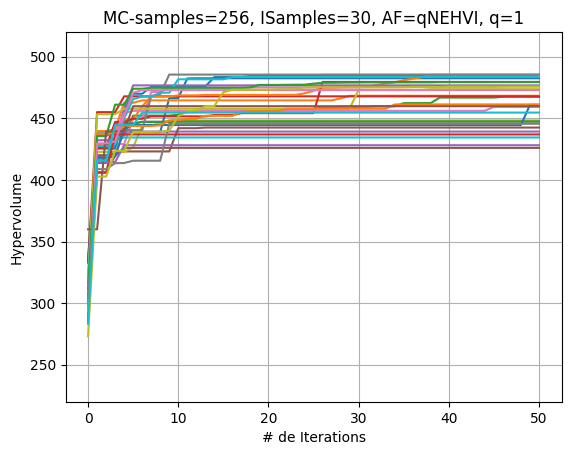

In [48]:
iters = np.arange(51)

for i in range(30):

    plt.errorbar(iters, np.asarray(hvsf27yexp3[i]), linewidth=1.5,label='%i' %i)
    plt.xlabel('# de Iterations')
    plt.ylabel('Hypervolume')
    plt.title('MC-samples=256, ISamples=30, AF=qNEHVI, q=1')
plt.grid()
plt.ylim([220,520])
plt.savefig('Exp3-27July')

In [49]:
%store BDs27yexp3
%store hvsf27yexp3
%store trainxall27yexp3
%store trainobjall27yexp3
%store numbd27yexp3

Stored 'BDs27yexp3' (list)
Stored 'hvsf27yexp3' (list)
Stored 'trainxall27yexp3' (list)
Stored 'trainobjall27yexp3' (list)
Stored 'numbd27yexp3' (list)


In [25]:
BDs27yexp4=[]
hvsf27yexp4=[]
trainxall27yexp4=[]
trainobjall27yexp4=[]
numbd27yexp4=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=40)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp4.append(bd.pareto_Y)      
    hvsf27yexp4.append(hvs_ehvi)   
    trainxall27yexp4.append(train_x_ehvi)
    trainobjall27yexp4.append(train_obj_ehvi)
    numbd27yexp4.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]

Seed: 236

Batch  1: Hypervolume (qNEHVI) = 415.5029 #Paprox=15 time = 9.40 Lysine= 0.9501 Energy= 14.4108 Costs= 145.8998)
Batch  2: Hypervolume (qNEHVI) = 415.5029 #Paprox=15 time = 9.78 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 416.5078 #Paprox=16 time = 9.47 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)
Batch  4: Hypervolume (qNEHVI) = 416.5078 #Paprox=17 time = 9.61 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 416.5078 #Paprox=18 time = 9.90 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 416.5078 #Paprox=18 time = 9.98 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 416.5078 #Paprox=19 time = 10.39 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 416.5078 #Paprox=20 time = 10.12 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 416.5078 #Paprox=21 time = 11.64 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 416.5078 #Paprox=18 time = 10.64 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 416.5078 #Paprox=19 time = 10.77 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 416.5078 #Paprox=20 time = 12.74 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 416.5078 #Paprox=20 time = 11.58 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 416.5078 #Paprox=20 time = 12.51 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 416.5078 #Paprox=20 time = 11.29 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 416.5078 #Paprox=20 time = 12.40 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 416.5078 #Paprox=20 time = 12.20 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 416.5078 #Paprox=21 time = 12.90 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 416.5078 #Paprox=22 time = 11.30 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 416.5078 #Paprox=22 time = 12.03 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 416.5078 #Paprox=22 time = 12.32 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 416.5078 #Paprox=23 time = 12.22 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 416.5078 #Paprox=23 time = 12.79 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 416.5078 #Paprox=24 time = 12.16 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 416.5078 #Paprox=24 time = 12.40 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 416.5078 #Paprox=25 time = 12.83 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 416.5078 #Paprox=26 time = 12.79 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 416.5078 #Paprox=26 time = 12.60 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 416.5078 #Paprox=26 time = 12.53 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 416.5078 #Paprox=26 time = 12.89 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 416.5078 #Paprox=26 time = 11.83 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 416.5078 #Paprox=26 time = 11.58 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 416.5078 #Paprox=26 time = 12.29 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 416.5078 #Paprox=26 time = 12.31 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 416.5078 #Paprox=26 time = 11.53 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 416.5078 #Paprox=26 time = 11.85 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 416.5078 #Paprox=26 time = 12.02 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 416.5078 #Paprox=26 time = 11.74 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 416.5078 #Paprox=27 time = 11.46 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 416.5079 #Paprox=28 time = 11.68 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 416.5079 #Paprox=28 time = 11.80 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 416.5079 #Paprox=28 time = 11.78 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 416.5079 #Paprox=28 time = 12.35 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 416.5079 #Paprox=29 time = 12.20 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 416.5079 #Paprox=30 time = 10.78 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 416.5079 #Paprox=31 time = 10.73 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 416.5079 #Paprox=31 time = 10.78 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 416.5079 #Paprox=31 time = 10.74 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 416.5079 #Paprox=32 time = 11.86 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▎                                       | 1/30 [09:40<4:40:21, 580.04s/it]


Batch 50: Hypervolume (qNEHVI) = 416.5079 #Paprox=32 time = 11.89 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)Seed: 99

Batch  1: Hypervolume (qNEHVI) = 419.3663 #Paprox=13 time = 10.40 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 419.3663 #Paprox=13 time = 10.13 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 439.5280 #Paprox=14 time = 10.21 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 455.8232 #Paprox=15 time = 10.44 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)
Batch  5: Hypervolume (qNEHVI) = 455.8232 #Paprox=15 time = 10.50 Lysine= 1.2037 Energy= 14.0010 Costs= 169.9230)
Batch  6: Hypervolume (qNEHVI) = 458.4992 #Paprox=16 time = 10.34 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  7: Hypervolume (qNEHVI) = 461.3697 #Paprox=17 time = 10.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  8: Hypervolume (qNEHVI) = 464.4494 #Paprox=18 time = 9.04 Lysine= 1.041

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 479.1867 #Paprox=22 time = 11.12 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 497.4727 #Paprox=23 time = 10.89 Lysine= 1.5264 Energy= 14.0010 Costs= 157.1952)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 497.4727 #Paprox=24 time = 11.53 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 497.4727 #Paprox=25 time = 11.63 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 497.4727 #Paprox=26 time = 12.22 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 497.4727 #Paprox=27 time = 12.81 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 497.4727 #Paprox=28 time = 12.49 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 497.4727 #Paprox=29 time = 12.49 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 497.4727 #Paprox=30 time = 13.32 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 497.4727 #Paprox=31 time = 13.97 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 497.4727 #Paprox=32 time = 14.62 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 497.4727 #Paprox=33 time = 12.96 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 497.4727 #Paprox=33 time = 13.38 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 497.4727 #Paprox=34 time = 13.09 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 497.4727 #Paprox=35 time = 13.24 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 497.4727 #Paprox=36 time = 12.76 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 497.4727 #Paprox=37 time = 12.98 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 497.4727 #Paprox=37 time = 12.63 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 497.4727 #Paprox=38 time = 13.02 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 497.4727 #Paprox=39 time = 13.74 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 497.5972 #Paprox=40 time = 13.18 Lysine= 0.9550 Energy= 14.0010 Costs= 144.9110)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 497.6189 #Paprox=41 time = 13.03 Lysine= 1.4252 Energy= 14.0010 Costs= 155.0832)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 497.6965 #Paprox=42 time = 13.16 Lysine= 1.4349 Energy= 14.0010 Costs= 156.6289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 497.6965 #Paprox=43 time = 13.00 Lysine= 1.4555 Energy= 14.0010 Costs= 159.8739)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 497.6965 #Paprox=43 time = 13.38 Lysine= 1.4435 Energy= 14.0010 Costs= 157.9789)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 497.6965 #Paprox=44 time = 13.44 Lysine= 1.4554 Energy= 14.0010 Costs= 159.8636)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 497.6965 #Paprox=44 time = 13.72 Lysine= 1.4555 Energy= 14.0010 Costs= 159.8739)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 497.6965 #Paprox=45 time = 13.92 Lysine= 1.4555 Energy= 14.0010 Costs= 159.8739)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 497.6965 #Paprox=46 time = 14.49 Lysine= 1.4555 Energy= 14.0010 Costs= 159.8739)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 497.6965 #Paprox=47 time = 14.58 Lysine= 1.4513 Energy= 14.0010 Costs= 159.2052)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 497.6965 #Paprox=48 time = 14.21 Lysine= 1.4433 Energy= 14.0010 Costs= 157.9557)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 497.6965 #Paprox=48 time = 14.42 Lysine= 1.4498 Energy= 14.0010 Costs= 158.9717)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 497.6965 #Paprox=49 time = 15.52 Lysine= 1.4555 Energy= 14.0010 Costs= 159.8739)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 497.6965 #Paprox=50 time = 16.24 Lysine= 1.4493 Energy= 14.0010 Costs= 158.9008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 497.6965 #Paprox=50 time = 15.55 Lysine= 1.4555 Energy= 14.0010 Costs= 159.8739)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 497.6965 #Paprox=51 time = 14.14 Lysine= 1.4524 Energy= 14.0010 Costs= 159.3914)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 497.6965 #Paprox=52 time = 14.71 Lysine= 1.4555 Energy= 14.0010 Costs= 159.8739)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 497.6965 #Paprox=52 time = 15.53 Lysine= 1.4530 Energy= 14.0010 Costs= 159.4763)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▋                                      | 2/30 [20:21<4:47:32, 616.18s/it]


Batch 50: Hypervolume (qNEHVI) = 497.6965 #Paprox=53 time = 15.38 Lysine= 1.4445 Energy= 14.0010 Costs= 158.1356)Seed: 621

Batch  1: Hypervolume (qNEHVI) = 433.4036 #Paprox=12 time = 9.99 Lysine= 0.9501 Energy= 14.3928 Costs= 145.6822)
Batch  2: Hypervolume (qNEHVI) = 433.4036 #Paprox=12 time = 9.75 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 446.6789 #Paprox=13 time = 9.92 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)
Batch  4: Hypervolume (qNEHVI) = 453.6134 #Paprox=12 time = 9.91 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)
Batch  5: Hypervolume (qNEHVI) = 453.6134 #Paprox=13 time = 9.82 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 453.6134 #Paprox=14 time = 9.76 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 453.6134 #Paprox=15 time = 10.09 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 453.6134 #Paprox=16 time = 10.59 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 453.6134 #Paprox=17 time = 10.39 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 453.6134 #Paprox=18 time = 10.64 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 453.6134 #Paprox=18 time = 11.44 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 453.6134 #Paprox=19 time = 11.30 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 453.6134 #Paprox=20 time = 10.89 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 453.6134 #Paprox=21 time = 11.80 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 453.6134 #Paprox=22 time = 11.02 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 453.6134 #Paprox=23 time = 11.27 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 453.6134 #Paprox=24 time = 11.06 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 453.6134 #Paprox=25 time = 11.21 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 453.6134 #Paprox=26 time = 11.84 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 453.6134 #Paprox=27 time = 11.48 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 453.6134 #Paprox=27 time = 11.87 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 453.6134 #Paprox=28 time = 12.56 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 453.6134 #Paprox=29 time = 12.35 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 453.6134 #Paprox=30 time = 11.71 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 453.6134 #Paprox=31 time = 11.64 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 453.6134 #Paprox=31 time = 12.48 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 453.6134 #Paprox=32 time = 12.35 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 453.6134 #Paprox=29 time = 11.64 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 453.6134 #Paprox=29 time = 12.60 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 453.6134 #Paprox=29 time = 11.58 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 453.6134 #Paprox=29 time = 11.90 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 453.6134 #Paprox=29 time = 11.96 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 453.6134 #Paprox=29 time = 11.84 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 453.6134 #Paprox=30 time = 11.66 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 453.6134 #Paprox=30 time = 11.79 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 453.6134 #Paprox=31 time = 11.82 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 453.6134 #Paprox=31 time = 12.51 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 453.6134 #Paprox=32 time = 13.08 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 453.6134 #Paprox=32 time = 12.67 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 453.6134 #Paprox=32 time = 12.19 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 453.6134 #Paprox=33 time = 13.46 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 453.6134 #Paprox=34 time = 12.48 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 453.6134 #Paprox=34 time = 12.29 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 453.6134 #Paprox=35 time = 12.27 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 453.6134 #Paprox=36 time = 12.32 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 453.6134 #Paprox=37 time = 12.68 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 453.6134 #Paprox=38 time = 12.33 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 453.6134 #Paprox=38 time = 12.88 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 453.6134 #Paprox=38 time = 12.82 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|████                                     | 3/30 [30:04<4:30:27, 601.00s/it]


Batch 50: Hypervolume (qNEHVI) = 453.6134 #Paprox=38 time = 12.42 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)Seed: 308

Batch  1: Hypervolume (qNEHVI) = 427.1397 #Paprox=19 time = 9.66 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 427.1397 #Paprox=19 time = 9.54 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 427.3516 #Paprox=20 time = 9.95 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  4: Hypervolume (qNEHVI) = 428.7873 #Paprox=21 time = 10.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 428.7873 #Paprox=22 time = 10.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 428.7873 #Paprox=23 time = 10.27 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 448.9489 #Paprox=24 time = 10.36 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 464.3862 #Paprox=25 time = 10.52 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 466.3469 #Paprox=26 time = 10.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 466.3469 #Paprox=27 time = 10.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 466.3469 #Paprox=28 time = 10.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 466.3469 #Paprox=29 time = 10.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 466.3469 #Paprox=30 time = 10.70 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 466.3469 #Paprox=31 time = 11.09 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 466.3469 #Paprox=32 time = 11.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 466.3469 #Paprox=33 time = 11.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 466.3469 #Paprox=34 time = 11.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 466.3469 #Paprox=34 time = 11.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 466.3469 #Paprox=35 time = 11.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 466.3469 #Paprox=35 time = 12.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 466.3469 #Paprox=36 time = 13.23 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 466.3469 #Paprox=37 time = 12.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 466.3469 #Paprox=38 time = 13.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 466.3469 #Paprox=39 time = 12.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 466.3469 #Paprox=40 time = 12.60 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 466.3469 #Paprox=41 time = 12.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 466.3469 #Paprox=42 time = 12.87 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 466.3469 #Paprox=43 time = 12.96 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 466.3888 #Paprox=44 time = 13.15 Lysine= 1.1415 Energy= 14.4817 Costs= 152.2035)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 466.3888 #Paprox=45 time = 13.66 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 466.3888 #Paprox=46 time = 12.52 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 466.3888 #Paprox=47 time = 12.65 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 466.3888 #Paprox=48 time = 12.81 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 466.3888 #Paprox=49 time = 12.62 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 466.3888 #Paprox=50 time = 13.07 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 466.3888 #Paprox=51 time = 12.94 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 466.3888 #Paprox=52 time = 13.06 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 466.3888 #Paprox=53 time = 12.92 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 466.3888 #Paprox=53 time = 13.98 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 466.3888 #Paprox=54 time = 14.86 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 469.5279 #Paprox=55 time = 13.69 Lysine= 1.0691 Energy= 14.0010 Costs= 147.4278)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 471.0662 #Paprox=56 time = 12.96 Lysine= 1.3229 Energy= 14.0010 Costs= 155.2738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 471.0662 #Paprox=56 time = 13.00 Lysine= 1.4145 Energy= 14.0010 Costs= 161.3296)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 471.0662 #Paprox=57 time = 13.25 Lysine= 1.3229 Energy= 14.0010 Costs= 155.2738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 478.4295 #Paprox=58 time = 13.81 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 478.4295 #Paprox=59 time = 13.54 Lysine= 1.3229 Energy= 14.0010 Costs= 155.2738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 478.4295 #Paprox=60 time = 13.64 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 478.4295 #Paprox=61 time = 14.76 Lysine= 1.3229 Energy= 14.0010 Costs= 155.2738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 478.4295 #Paprox=62 time = 14.34 Lysine= 1.3229 Energy= 14.0010 Costs= 155.2738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|█████▍                                   | 4/30 [40:17<4:22:30, 605.79s/it]


Batch 50: Hypervolume (qNEHVI) = 478.4295 #Paprox=63 time = 14.23 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)Seed: 933

Batch  1: Hypervolume (qNEHVI) = 416.0993 #Paprox=8 time = 8.62 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 416.0993 #Paprox=8 time = 8.78 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 428.5161 #Paprox=9 time = 9.10 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  4: Hypervolume (qNEHVI) = 445.1213 #Paprox=10 time = 9.30 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)
Batch  5: Hypervolume (qNEHVI) = 445.1213 #Paprox=11 time = 9.34 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 445.1213 #Paprox=12 time = 9.47 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 445.1213 #Paprox=13 time = 9.24 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 445.1213 #Paprox=14 time = 9.47 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 445.1213 #Paprox=15 time = 9.53 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 445.1213 #Paprox=16 time = 9.67 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 445.1213 #Paprox=17 time = 9.69 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 445.1213 #Paprox=18 time = 9.93 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 445.1213 #Paprox=19 time = 10.08 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 445.1213 #Paprox=20 time = 9.98 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 445.1213 #Paprox=21 time = 10.14 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 445.1213 #Paprox=22 time = 10.34 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 445.1213 #Paprox=23 time = 10.09 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 445.1213 #Paprox=24 time = 10.27 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 445.1213 #Paprox=25 time = 10.11 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 445.1213 #Paprox=26 time = 10.46 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 445.1213 #Paprox=26 time = 10.27 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 445.1213 #Paprox=26 time = 10.57 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 445.1213 #Paprox=27 time = 11.01 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 445.1213 #Paprox=28 time = 10.53 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 445.1213 #Paprox=29 time = 11.33 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 445.1213 #Paprox=30 time = 10.53 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 445.1213 #Paprox=31 time = 11.08 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 445.1213 #Paprox=32 time = 10.87 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 445.1213 #Paprox=33 time = 10.60 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 445.1213 #Paprox=33 time = 10.63 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 445.1213 #Paprox=33 time = 10.62 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 445.1213 #Paprox=34 time = 11.48 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 445.1213 #Paprox=35 time = 10.64 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 449.1146 #Paprox=36 time = 12.44 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 449.2282 #Paprox=37 time = 11.69 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 449.2282 #Paprox=38 time = 11.41 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 449.2282 #Paprox=38 time = 11.66 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 449.2282 #Paprox=39 time = 11.54 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 449.2282 #Paprox=40 time = 11.63 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 449.2282 #Paprox=40 time = 12.54 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 449.2282 #Paprox=40 time = 12.03 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 449.2282 #Paprox=40 time = 11.74 Lysine= 1.1165 Energy= 14.0010 Costs= 154.5844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 449.2282 #Paprox=41 time = 12.48 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 449.2282 #Paprox=42 time = 14.26 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 449.2282 #Paprox=43 time = 12.35 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 449.2282 #Paprox=44 time = 12.90 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 449.2282 #Paprox=45 time = 14.37 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 449.2282 #Paprox=45 time = 12.97 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 449.2282 #Paprox=46 time = 11.81 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▊                                  | 5/30 [49:23<4:03:28, 584.33s/it]


Batch 50: Hypervolume (qNEHVI) = 449.2282 #Paprox=47 time = 14.02 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)Seed: 17

Batch  1: Hypervolume (qNEHVI) = 441.7051 #Paprox=9 time = 11.42 Lysine= 0.9501 Energy= 14.3943 Costs= 145.7045)
Batch  2: Hypervolume (qNEHVI) = 441.7051 #Paprox=9 time = 11.07 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 461.1937 #Paprox=10 time = 12.23 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 461.2033 #Paprox=11 time = 11.95 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)
Batch  5: Hypervolume (qNEHVI) = 476.1983 #Paprox=11 time = 11.79 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)
Batch  6: Hypervolume (qNEHVI) = 476.2492 #Paprox=12 time = 11.38 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)
Batch  7: Hypervolume (qNEHVI) = 476.2492 #Paprox=13 time = 12.27 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 476.2507 #Paprox=14 time = 13.17 Lysine= 1.1869 Energy= 14.0254 Costs= 150.9758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 476.2507 #Paprox=14 time = 11.30 Lysine= 1.2168 Energy= 14.0010 Costs= 158.1842)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 476.2507 #Paprox=14 time = 11.87 Lysine= 1.2632 Energy= 14.0010 Costs= 156.6998)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.4093 #Paprox=15 time = 12.67 Lysine= 1.1957 Energy= 14.0010 Costs= 151.8983)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 477.5317 #Paprox=16 time = 13.28 Lysine= 1.1767 Energy= 14.0010 Costs= 150.6043)
Batch 13: Hypervolume (qNEHVI) = 480.8041 #Paprox=17 time = 11.78 Lysine= 1.0172 Energy= 14.0010 Costs= 147.1211)
Batch 14: Hypervolume (qNEHVI) = 480.8315 #Paprox=18 time = 12.54 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 480.8315 #Paprox=19 time = 13.20 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 480.8315 #Paprox=20 time = 12.82 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 480.8315 #Paprox=21 time = 12.11 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 480.8315 #Paprox=22 time = 12.89 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 480.8315 #Paprox=23 time = 13.03 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 480.8315 #Paprox=24 time = 12.62 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 480.8315 #Paprox=25 time = 12.48 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 480.8315 #Paprox=26 time = 12.57 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 480.8315 #Paprox=27 time = 12.42 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 480.8315 #Paprox=28 time = 13.24 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 480.8315 #Paprox=27 time = 12.17 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 480.8315 #Paprox=28 time = 12.08 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 480.8315 #Paprox=29 time = 12.74 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 480.8315 #Paprox=30 time = 12.59 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 483.9800 #Paprox=31 time = 12.69 Lysine= 1.4734 Energy= 14.0010 Costs= 156.9679)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 483.9800 #Paprox=32 time = 13.35 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 483.9800 #Paprox=33 time = 14.15 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 483.9800 #Paprox=34 time = 12.93 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 483.9800 #Paprox=35 time = 13.06 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 483.9800 #Paprox=36 time = 13.26 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 483.9800 #Paprox=36 time = 12.96 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 483.9800 #Paprox=37 time = 13.96 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 483.9800 #Paprox=38 time = 13.14 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 483.9800 #Paprox=39 time = 13.71 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 483.9800 #Paprox=39 time = 14.94 Lysine= 1.4881 Energy= 14.0010 Costs= 159.9473)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 484.7977 #Paprox=40 time = 13.94 Lysine= 1.1608 Energy= 14.0010 Costs= 150.1977)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 484.7977 #Paprox=41 time = 13.23 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 484.7977 #Paprox=42 time = 13.97 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 484.7977 #Paprox=43 time = 13.98 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 484.7977 #Paprox=44 time = 13.41 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 484.7977 #Paprox=45 time = 14.41 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 484.7977 #Paprox=46 time = 15.61 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 485.8233 #Paprox=47 time = 15.22 Lysine= 1.4623 Energy= 14.0010 Costs= 156.5483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 485.8233 #Paprox=48 time = 15.55 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 485.8233 #Paprox=49 time = 15.10 Lysine= 1.1888 Energy= 14.0010 Costs= 150.7968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|███████▊                               | 6/30 [1:00:18<4:03:20, 608.37s/it]


Batch 50: Hypervolume (qNEHVI) = 485.8233 #Paprox=50 time = 16.07 Lysine= 1.0172 Energy= 14.0010 Costs= 147.1211)Seed: 765

Batch  1: Hypervolume (qNEHVI) = 432.1023 #Paprox=17 time = 11.04 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 432.1023 #Paprox=17 time = 9.61 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 452.2640 #Paprox=18 time = 11.24 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 466.5329 #Paprox=19 time = 11.82 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  5: Hypervolume (qNEHVI) = 468.6189 #Paprox=18 time = 12.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 468.6189 #Paprox=19 time = 11.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  7: Hypervolume (qNEHVI) = 468.6189 #Paprox=20 time = 10.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 468.6189 #Paprox=21 time = 12.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 468.6189 #Paprox=22 time = 11.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 468.6189 #Paprox=23 time = 11.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 468.6189 #Paprox=24 time = 12.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 468.6189 #Paprox=25 time = 11.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 468.6189 #Paprox=26 time = 12.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 468.6189 #Paprox=26 time = 13.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 468.6189 #Paprox=27 time = 11.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 468.6189 #Paprox=27 time = 12.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 468.6189 #Paprox=28 time = 13.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 468.6189 #Paprox=29 time = 11.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 468.6189 #Paprox=30 time = 11.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 468.6189 #Paprox=31 time = 11.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 468.6189 #Paprox=32 time = 11.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 468.6189 #Paprox=33 time = 10.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 468.6189 #Paprox=34 time = 11.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 468.6189 #Paprox=35 time = 11.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 468.6189 #Paprox=36 time = 11.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 468.6189 #Paprox=37 time = 11.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 468.6189 #Paprox=38 time = 11.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 468.6189 #Paprox=39 time = 11.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 468.6189 #Paprox=35 time = 11.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 468.6189 #Paprox=36 time = 11.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 468.6189 #Paprox=37 time = 11.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 468.6189 #Paprox=38 time = 11.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 468.6189 #Paprox=39 time = 11.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 468.6189 #Paprox=40 time = 11.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 468.6189 #Paprox=40 time = 11.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 468.6189 #Paprox=41 time = 11.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 468.6189 #Paprox=42 time = 11.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 468.6189 #Paprox=42 time = 11.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 468.6189 #Paprox=42 time = 11.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 468.6189 #Paprox=43 time = 12.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 468.6189 #Paprox=43 time = 11.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 468.6189 #Paprox=44 time = 11.87 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 468.6189 #Paprox=45 time = 12.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 468.6189 #Paprox=46 time = 12.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 468.6189 #Paprox=47 time = 12.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 468.6189 #Paprox=48 time = 13.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 468.6189 #Paprox=49 time = 12.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 468.6189 #Paprox=50 time = 13.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 468.6189 #Paprox=51 time = 12.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 23%|█████████                              | 7/30 [1:10:12<3:51:20, 603.52s/it]


Batch 50: Hypervolume (qNEHVI) = 468.6189 #Paprox=52 time = 15.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 357

Batch  1: Hypervolume (qNEHVI) = 434.9836 #Paprox=17 time = 9.95 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 434.9836 #Paprox=17 time = 10.04 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 434.9836 #Paprox=17 time = 10.64 Lysine= 1.2125 Energy= 14.0010 Costs= 166.1166)
Batch  4: Hypervolume (qNEHVI) = 434.9836 #Paprox=18 time = 9.27 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 436.2938 #Paprox=19 time = 9.12 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 437.6232 #Paprox=20 time = 8.94 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 437.6232 #Paprox=21 time = 9.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 437.6232 #Paprox=22 time = 9.32 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 437.6232 #Paprox=23 time = 9.67 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 437.6232 #Paprox=24 time = 10.05 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 437.6232 #Paprox=25 time = 9.70 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 437.6232 #Paprox=26 time = 9.62 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 437.6232 #Paprox=27 time = 9.63 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 437.6232 #Paprox=28 time = 9.83 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 437.6232 #Paprox=29 time = 10.03 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 437.6232 #Paprox=30 time = 9.94 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 437.6232 #Paprox=31 time = 9.97 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 437.6232 #Paprox=32 time = 10.33 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 437.6232 #Paprox=33 time = 10.14 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 437.6232 #Paprox=34 time = 10.11 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 437.6232 #Paprox=35 time = 10.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 437.6232 #Paprox=35 time = 10.39 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 437.6232 #Paprox=36 time = 10.34 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 437.6232 #Paprox=37 time = 10.62 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 437.6232 #Paprox=38 time = 10.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 437.6232 #Paprox=39 time = 10.67 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 437.6232 #Paprox=40 time = 10.44 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 437.6232 #Paprox=41 time = 10.79 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 437.6232 #Paprox=42 time = 10.70 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 437.6232 #Paprox=43 time = 10.64 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 437.6232 #Paprox=44 time = 11.03 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 437.6232 #Paprox=45 time = 10.65 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 437.6232 #Paprox=46 time = 10.84 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 437.6232 #Paprox=47 time = 10.97 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 437.6232 #Paprox=48 time = 10.65 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 437.6232 #Paprox=49 time = 11.35 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 437.6232 #Paprox=50 time = 10.97 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 437.6232 #Paprox=51 time = 10.80 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 437.6232 #Paprox=52 time = 11.29 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 437.6232 #Paprox=53 time = 10.89 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 437.6232 #Paprox=54 time = 11.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 437.6232 #Paprox=55 time = 11.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 437.6232 #Paprox=56 time = 11.06 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 437.6232 #Paprox=57 time = 11.14 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 437.6232 #Paprox=58 time = 11.04 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 437.6232 #Paprox=59 time = 11.61 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 437.6232 #Paprox=60 time = 11.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 437.6232 #Paprox=61 time = 11.14 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 437.6232 #Paprox=62 time = 11.03 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 27%|██████████▍                            | 8/30 [1:18:56<3:31:59, 578.17s/it]


Batch 50: Hypervolume (qNEHVI) = 437.6232 #Paprox=63 time = 11.79 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)Seed: 108

Batch  1: Hypervolume (qNEHVI) = 415.6236 #Paprox=13 time = 9.96 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 415.6236 #Paprox=13 time = 10.10 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 415.6236 #Paprox=13 time = 10.65 Lysine= 1.2401 Energy= 14.0010 Costs= 160.0938)
Batch  4: Hypervolume (qNEHVI) = 415.6236 #Paprox=13 time = 10.74 Lysine= 1.1881 Energy= 14.0010 Costs= 164.4158)
Batch  5: Hypervolume (qNEHVI) = 415.6428 #Paprox=12 time = 10.33 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)
Batch  6: Hypervolume (qNEHVI) = 415.6479 #Paprox=13 time = 7.81 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)
Batch  7: Hypervolume (qNEHVI) = 415.6577 #Paprox=14 time = 6.07 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)
Batch  8: Hypervolume (qNEHVI) = 415.6577 #Paprox=14 time = 6.37 Lysine= 0.9501 

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 419.0635 #Paprox=16 time = 5.49 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 419.0635 #Paprox=16 time = 5.69 Lysine= 1.2441 Energy= 14.0010 Costs= 161.6655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 419.5038 #Paprox=17 time = 5.94 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)
Batch 14: Hypervolume (qNEHVI) = 419.6711 #Paprox=18 time = 6.00 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 419.6711 #Paprox=19 time = 6.13 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 419.6711 #Paprox=20 time = 6.42 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 419.6711 #Paprox=21 time = 6.20 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 419.6711 #Paprox=22 time = 6.27 Lysine= 0.9501 Energy= 14.1354 Costs= 148.4618)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 419.7082 #Paprox=23 time = 6.72 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 419.7082 #Paprox=24 time = 6.62 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 419.7082 #Paprox=24 time = 6.68 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 419.7082 #Paprox=24 time = 6.77 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 419.7082 #Paprox=24 time = 6.97 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 419.7082 #Paprox=24 time = 7.04 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 419.7082 #Paprox=24 time = 6.74 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 419.7082 #Paprox=24 time = 7.15 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 419.7082 #Paprox=24 time = 7.49 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 419.7082 #Paprox=24 time = 7.51 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 419.7082 #Paprox=24 time = 7.22 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 419.7082 #Paprox=24 time = 7.43 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 419.7082 #Paprox=24 time = 7.14 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 419.7082 #Paprox=24 time = 7.16 Lysine= 1.2930 Energy= 14.0010 Costs= 162.6134)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 419.7082 #Paprox=25 time = 7.49 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 419.7082 #Paprox=25 time = 7.09 Lysine= 1.2122 Energy= 14.0010 Costs= 178.3964)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 419.7082 #Paprox=26 time = 7.28 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 419.9416 #Paprox=27 time = 7.45 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 419.9416 #Paprox=28 time = 7.38 Lysine= 0.9501 Energy= 14.3458 Costs= 150.0581)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 419.9416 #Paprox=29 time = 7.29 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 419.9416 #Paprox=30 time = 7.25 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 419.9416 #Paprox=31 time = 7.44 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 419.9416 #Paprox=32 time = 7.44 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 419.9416 #Paprox=33 time = 7.40 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 419.9416 #Paprox=34 time = 7.85 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 419.9416 #Paprox=35 time = 7.60 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 419.9416 #Paprox=36 time = 8.23 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 419.9416 #Paprox=37 time = 7.73 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 419.9416 #Paprox=38 time = 7.66 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 419.9416 #Paprox=39 time = 7.78 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 419.9416 #Paprox=40 time = 7.67 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 30%|███████████▋                           | 9/30 [1:25:03<2:59:17, 512.26s/it]


Batch 50: Hypervolume (qNEHVI) = 419.9416 #Paprox=41 time = 7.78 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)Seed: 545

Batch  1: Hypervolume (qNEHVI) = 428.1782 #Paprox=20 time = 8.89 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 428.1782 #Paprox=20 time = 8.86 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 428.2828 #Paprox=21 time = 9.57 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  4: Hypervolume (qNEHVI) = 428.2828 #Paprox=22 time = 9.29 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 429.6130 #Paprox=23 time = 9.56 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 452.3303 #Paprox=24 time = 9.71 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 474.5627 #Paprox=25 time = 9.85 Lysine= 0.9501 Energy= 14.0010 Costs= 144.0834)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 474.5627 #Paprox=25 time = 10.06 Lysine= 1.2051 Energy= 14.0010 Costs= 157.7905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 474.5627 #Paprox=26 time = 9.91 Lysine= 1.1705 Energy= 14.0010 Costs= 156.2058)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 474.5627 #Paprox=26 time = 10.16 Lysine= 1.1407 Energy= 14.0010 Costs= 159.2785)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.6808 #Paprox=27 time = 10.07 Lysine= 1.1495 Energy= 14.0010 Costs= 149.2809)
Batch 12: Hypervolume (qNEHVI) = 476.6808 #Paprox=27 time = 10.31 Lysine= 1.2026 Energy= 14.0010 Costs= 170.0937)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 476.6808 #Paprox=28 time = 10.38 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 476.9607 #Paprox=28 time = 9.83 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 9.94 Lysine= 1.1169 Energy= 14.0907 Costs= 149.6810)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 10.35 Lysine= 1.4444 Energy= 14.0010 Costs= 164.3223)
Batch 17: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 10.23 Lysine= 1.4073 Energy= 14.0010 Costs= 161.5421)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 10.56 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 11.02 Lysine= 1.4087 Energy= 14.0010 Costs= 162.5676)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 10.39 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 10.54 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 11.40 Lysine= 1.4171 Energy= 14.0010 Costs= 162.1951)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 10.95 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 11.68 Lysine= 1.4102 Energy= 14.0010 Costs= 162.0231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 11.14 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 11.46 Lysine= 1.4107 Energy= 14.0010 Costs= 163.9930)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 10.98 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 11.56 Lysine= 1.4123 Energy= 14.0010 Costs= 161.5691)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 11.68 Lysine= 1.4103 Energy= 14.0010 Costs= 162.0729)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 11.98 Lysine= 1.4084 Energy= 14.0010 Costs= 161.3423)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 12.94 Lysine= 1.4573 Energy= 14.0010 Costs= 162.4566)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 11.94 Lysine= 1.4082 Energy= 14.0010 Costs= 162.2053)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 12.04 Lysine= 1.4299 Energy= 14.0010 Costs= 165.9158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 12.27 Lysine= 1.4298 Energy= 14.0010 Costs= 165.8899)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 12.39 Lysine= 1.4757 Energy= 14.0010 Costs= 162.7998)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 12.24 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 12.55 Lysine= 1.4571 Energy= 14.0010 Costs= 162.4519)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 12.51 Lysine= 1.4118 Energy= 14.0010 Costs= 164.8041)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 12.78 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 13.91 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 12.61 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 13.19 Lysine= 1.4260 Energy= 14.0010 Costs= 164.7909)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 12.71 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 12.72 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 13.40 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 13.15 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 13.08 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 13.45 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 13.73 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|████████████▋                         | 10/30 [1:34:33<2:56:42, 530.12s/it]


Batch 50: Hypervolume (qNEHVI) = 476.9928 #Paprox=29 time = 13.57 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)Seed: 61

Batch  1: Hypervolume (qNEHVI) = 413.5476 #Paprox=14 time = 10.19 Lysine= 0.9501 Energy= 14.4261 Costs= 146.0674)
Batch  2: Hypervolume (qNEHVI) = 413.5476 #Paprox=14 time = 10.05 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 430.5777 #Paprox=15 time = 10.13 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)
Batch  4: Hypervolume (qNEHVI) = 430.6359 #Paprox=16 time = 9.80 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)
Batch  5: Hypervolume (qNEHVI) = 431.3686 #Paprox=17 time = 10.12 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)
Batch  6: Hypervolume (qNEHVI) = 433.9183 #Paprox=18 time = 10.58 Lysine= 1.5291 Energy= 14.0010 Costs= 168.7951)
Batch  7: Hypervolume (qNEHVI) = 433.9183 #Paprox=18 time = 11.59 Lysine= 1.0318 Energy= 14.0010 Costs= 158.3147)
Batch  8: Hypervolume (qNEHVI) = 433.9183 #Paprox=18 time = 11.26 Lysine= 1.046

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 442.0396 #Paprox=38 time = 13.80 Lysine= 1.4291 Energy= 14.1572 Costs= 161.6671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 442.4141 #Paprox=36 time = 13.65 Lysine= 0.9584 Energy= 14.0183 Costs= 146.7790)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 442.4142 #Paprox=37 time = 13.39 Lysine= 1.4224 Energy= 14.0010 Costs= 160.1457)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 442.6299 #Paprox=38 time = 13.47 Lysine= 0.9666 Energy= 14.0010 Costs= 148.5429)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 442.6299 #Paprox=38 time = 13.45 Lysine= 0.9501 Energy= 14.0010 Costs= 148.3404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 443.1307 #Paprox=38 time = 13.51 Lysine= 1.0258 Energy= 14.0010 Costs= 150.1270)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 443.1318 #Paprox=39 time = 13.65 Lysine= 1.4288 Energy= 14.0010 Costs= 160.4323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 443.1318 #Paprox=39 time = 14.52 Lysine= 1.3597 Energy= 14.0010 Costs= 158.5561)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 443.1318 #Paprox=39 time = 14.18 Lysine= 0.9501 Energy= 14.0010 Costs= 148.8303)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 443.1318 #Paprox=39 time = 14.37 Lysine= 1.3145 Energy= 14.0010 Costs= 157.4993)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 37%|█████████████▉                        | 11/30 [1:44:40<2:55:18, 553.59s/it]


Batch 50: Hypervolume (qNEHVI) = 443.1635 #Paprox=40 time = 13.97 Lysine= 1.1949 Energy= 14.0010 Costs= 154.6322)Seed: 249

Batch  1: Hypervolume (qNEHVI) = 428.3260 #Paprox=16 time = 9.50 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 428.3260 #Paprox=16 time = 9.76 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 428.5034 #Paprox=17 time = 9.70 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  4: Hypervolume (qNEHVI) = 429.7506 #Paprox=18 time = 9.69 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 457.4970 #Paprox=19 time = 10.28 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)
Batch  6: Hypervolume (qNEHVI) = 457.4970 #Paprox=19 time = 10.31 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)
Batch  7: Hypervolume (qNEHVI) = 457.4970 #Paprox=20 time = 10.26 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)
Batch  8: Hypervolume (qNEHVI) = 457.4970 #Paprox=21 time = 10.23 Lysine= 0.9501 

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 457.4970 #Paprox=24 time = 10.61 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 457.4970 #Paprox=25 time = 10.51 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 457.4970 #Paprox=25 time = 10.55 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 457.4970 #Paprox=25 time = 11.00 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 457.4970 #Paprox=25 time = 10.89 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 457.4970 #Paprox=26 time = 10.76 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 457.4970 #Paprox=26 time = 10.74 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 457.4970 #Paprox=26 time = 10.70 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 457.4970 #Paprox=26 time = 11.01 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 457.4970 #Paprox=26 time = 10.96 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 457.4970 #Paprox=27 time = 11.14 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 457.4970 #Paprox=28 time = 11.07 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 457.4970 #Paprox=29 time = 11.11 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 457.4970 #Paprox=30 time = 11.10 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 457.4970 #Paprox=30 time = 10.99 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 457.4970 #Paprox=31 time = 11.16 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 457.4970 #Paprox=32 time = 11.14 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 457.4970 #Paprox=32 time = 11.17 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 457.4970 #Paprox=32 time = 11.04 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 457.4970 #Paprox=33 time = 11.00 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 457.4970 #Paprox=33 time = 11.30 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 457.4970 #Paprox=33 time = 11.46 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 457.4970 #Paprox=34 time = 11.33 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 457.4970 #Paprox=35 time = 11.41 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 457.4970 #Paprox=36 time = 11.14 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 457.4970 #Paprox=36 time = 11.24 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 457.4970 #Paprox=36 time = 11.16 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 457.4970 #Paprox=36 time = 11.18 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 457.4970 #Paprox=36 time = 11.27 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 457.4970 #Paprox=36 time = 11.19 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 457.4970 #Paprox=37 time = 11.68 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 457.4970 #Paprox=38 time = 11.89 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 457.4970 #Paprox=39 time = 11.71 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 457.4970 #Paprox=40 time = 11.53 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 457.4970 #Paprox=41 time = 11.35 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 457.4970 #Paprox=41 time = 11.50 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 457.4970 #Paprox=42 time = 11.54 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 457.4970 #Paprox=42 time = 11.70 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 457.4970 #Paprox=43 time = 11.75 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 40%|███████████████▏                      | 12/30 [1:53:50<2:45:42, 552.37s/it]


Batch 50: Hypervolume (qNEHVI) = 457.4970 #Paprox=43 time = 11.59 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)Seed: 656

Batch  1: Hypervolume (qNEHVI) = 426.8880 #Paprox=9 time = 7.90 Lysine= 0.9501 Energy= 14.3931 Costs= 145.6871)
Batch  2: Hypervolume (qNEHVI) = 426.8880 #Paprox=9 time = 8.24 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 438.9379 #Paprox=10 time = 8.45 Lysine= 1.1474 Energy= 14.0010 Costs= 151.3177)
Batch  4: Hypervolume (qNEHVI) = 439.5684 #Paprox=11 time = 8.89 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)
Batch  5: Hypervolume (qNEHVI) = 439.5684 #Paprox=12 time = 8.79 Lysine= 1.1474 Energy= 14.0010 Costs= 151.3177)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 439.5684 #Paprox=13 time = 8.99 Lysine= 1.1474 Energy= 14.0010 Costs= 151.3177)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 439.5684 #Paprox=13 time = 8.78 Lysine= 1.1474 Energy= 14.0010 Costs= 151.3177)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 439.5684 #Paprox=13 time = 9.00 Lysine= 1.1474 Energy= 14.0010 Costs= 151.3177)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 439.5684 #Paprox=13 time = 9.14 Lysine= 1.1455 Energy= 14.0010 Costs= 168.6778)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 446.6089 #Paprox=14 time = 9.40 Lysine= 1.1333 Energy= 14.0010 Costs= 148.5735)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 453.6716 #Paprox=15 time = 9.16 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 453.6716 #Paprox=16 time = 9.11 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 453.6716 #Paprox=17 time = 9.34 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 453.6716 #Paprox=18 time = 9.45 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 453.6716 #Paprox=19 time = 9.70 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 453.6716 #Paprox=19 time = 10.93 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 453.6716 #Paprox=19 time = 9.95 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 453.6716 #Paprox=19 time = 10.11 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 453.6716 #Paprox=20 time = 10.11 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 453.6716 #Paprox=21 time = 10.47 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 453.6716 #Paprox=22 time = 10.40 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 453.6716 #Paprox=23 time = 10.26 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 462.4644 #Paprox=24 time = 10.34 Lysine= 0.9604 Energy= 14.0010 Costs= 145.0642)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 462.4644 #Paprox=24 time = 11.00 Lysine= 1.3747 Energy= 14.0010 Costs= 158.0842)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 462.4644 #Paprox=24 time = 10.66 Lysine= 1.3747 Energy= 14.0010 Costs= 158.0842)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 462.4644 #Paprox=24 time = 11.00 Lysine= 1.3747 Energy= 14.0010 Costs= 158.0842)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 462.4644 #Paprox=24 time = 11.52 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 462.4644 #Paprox=24 time = 11.44 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 462.4644 #Paprox=24 time = 11.03 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 462.4644 #Paprox=24 time = 11.16 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 462.4644 #Paprox=24 time = 11.09 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 467.7723 #Paprox=25 time = 11.15 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 467.7723 #Paprox=26 time = 11.47 Lysine= 0.9604 Energy= 14.0010 Costs= 145.0642)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 467.7723 #Paprox=26 time = 11.59 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 467.7723 #Paprox=27 time = 11.40 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 467.7723 #Paprox=27 time = 11.46 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 467.7723 #Paprox=27 time = 11.40 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 467.7723 #Paprox=27 time = 11.83 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 467.7723 #Paprox=27 time = 11.88 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 467.7723 #Paprox=28 time = 11.72 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 467.7723 #Paprox=28 time = 11.81 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 467.7723 #Paprox=29 time = 11.51 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 467.7723 #Paprox=29 time = 11.79 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 467.7723 #Paprox=29 time = 11.78 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 467.7723 #Paprox=30 time = 11.80 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 467.7723 #Paprox=30 time = 11.86 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 467.7723 #Paprox=31 time = 11.97 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 467.7723 #Paprox=31 time = 12.34 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 467.7723 #Paprox=31 time = 12.27 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 43%|████████████████▍                     | 13/30 [2:02:39<2:34:32, 545.42s/it]


Batch 50: Hypervolume (qNEHVI) = 467.7723 #Paprox=31 time = 11.98 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)Seed: 912

Batch  1: Hypervolume (qNEHVI) = 443.1217 #Paprox=15 time = 9.86 Lysine= 0.9501 Energy= 14.3964 Costs= 145.7364)
Batch  2: Hypervolume (qNEHVI) = 443.1217 #Paprox=15 time = 9.85 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 444.1816 #Paprox=16 time = 10.38 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  4: Hypervolume (qNEHVI) = 445.8298 #Paprox=17 time = 10.38 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 460.1710 #Paprox=17 time = 10.47 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)
Batch  6: Hypervolume (qNEHVI) = 467.6645 #Paprox=18 time = 8.80 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)
Batch  7: Hypervolume (qNEHVI) = 467.6645 #Paprox=18 time = 9.09 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)
Batch  8: Hypervolume (qNEHVI) = 467.6645 #Paprox=18 time = 9.48 Lysine= 1.1574 E

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 467.6645 #Paprox=18 time = 9.46 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 467.6645 #Paprox=18 time = 9.97 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 467.6645 #Paprox=19 time = 9.73 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 467.6645 #Paprox=19 time = 9.60 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 467.6645 #Paprox=19 time = 9.77 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 468.1841 #Paprox=20 time = 9.74 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 468.1841 #Paprox=21 time = 9.87 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 468.1841 #Paprox=21 time = 10.14 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 468.1841 #Paprox=22 time = 10.06 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 468.1841 #Paprox=22 time = 10.28 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 468.1841 #Paprox=23 time = 10.09 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 468.1841 #Paprox=24 time = 10.39 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 468.1841 #Paprox=24 time = 10.36 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 468.1841 #Paprox=24 time = 11.06 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 468.1841 #Paprox=24 time = 10.49 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 468.1841 #Paprox=25 time = 10.47 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 468.1841 #Paprox=26 time = 10.62 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 468.1841 #Paprox=27 time = 10.64 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 468.1841 #Paprox=27 time = 10.73 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 468.1841 #Paprox=27 time = 10.81 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 468.1841 #Paprox=27 time = 10.75 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 468.1841 #Paprox=27 time = 10.91 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 468.1841 #Paprox=27 time = 10.81 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 479.2125 #Paprox=28 time = 10.96 Lysine= 0.9501 Energy= 14.0010 Costs= 144.8298)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 479.2125 #Paprox=28 time = 11.66 Lysine= 1.1325 Energy= 14.0010 Costs= 148.5695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 479.2125 #Paprox=29 time = 11.09 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 479.2562 #Paprox=30 time = 11.52 Lysine= 0.9526 Energy= 14.3730 Costs= 147.3949)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 479.2562 #Paprox=31 time = 11.20 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 479.2562 #Paprox=32 time = 11.48 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 479.2562 #Paprox=33 time = 11.50 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 479.2562 #Paprox=34 time = 11.82 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 479.2562 #Paprox=35 time = 11.61 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 479.2562 #Paprox=35 time = 11.67 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 479.2562 #Paprox=36 time = 11.82 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 479.2562 #Paprox=37 time = 12.18 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 479.2562 #Paprox=38 time = 12.20 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 482.6060 #Paprox=39 time = 12.01 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 482.6060 #Paprox=40 time = 12.18 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 482.6060 #Paprox=41 time = 12.47 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 482.6060 #Paprox=42 time = 12.38 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 482.6060 #Paprox=43 time = 12.49 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 47%|█████████████████▋                    | 14/30 [2:11:39<2:25:02, 543.89s/it]


Batch 50: Hypervolume (qNEHVI) = 482.6060 #Paprox=44 time = 12.47 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)Seed: 669

Batch  1: Hypervolume (qNEHVI) = 439.6786 #Paprox=15 time = 9.61 Lysine= 0.9501 Energy= 14.3902 Costs= 145.6575)
Batch  2: Hypervolume (qNEHVI) = 439.6786 #Paprox=15 time = 9.54 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 441.0661 #Paprox=16 time = 10.05 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 457.3144 #Paprox=17 time = 10.08 Lysine= 1.1144 Energy= 14.0010 Costs= 147.9483)
Batch  5: Hypervolume (qNEHVI) = 457.3144 #Paprox=17 time = 10.47 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)
Batch  6: Hypervolume (qNEHVI) = 457.6046 #Paprox=18 time = 10.20 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)
Batch  7: Hypervolume (qNEHVI) = 457.6046 #Paprox=19 time = 10.20 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 457.6046 #Paprox=19 time = 10.50 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 457.6046 #Paprox=20 time = 10.38 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 457.6046 #Paprox=20 time = 10.21 Lysine= 1.1881 Energy= 14.0010 Costs= 157.1610)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 457.6046 #Paprox=21 time = 10.64 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 457.6046 #Paprox=22 time = 10.30 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 459.8167 #Paprox=23 time = 10.37 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 459.8167 #Paprox=23 time = 10.78 Lysine= 0.9501 Energy= 14.0010 Costs= 154.0005)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 459.8167 #Paprox=23 time = 11.07 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 459.8167 #Paprox=23 time = 11.42 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 459.8167 #Paprox=23 time = 11.04 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 459.8167 #Paprox=24 time = 11.35 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 459.8167 #Paprox=24 time = 11.04 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 459.8167 #Paprox=24 time = 11.17 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 459.8167 #Paprox=24 time = 11.46 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 459.8167 #Paprox=24 time = 11.05 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 459.8167 #Paprox=24 time = 11.23 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 459.8167 #Paprox=25 time = 11.09 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 459.8167 #Paprox=25 time = 11.25 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 459.8167 #Paprox=25 time = 11.77 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 459.8167 #Paprox=25 time = 11.29 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 459.8167 #Paprox=25 time = 11.49 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 459.8167 #Paprox=25 time = 11.39 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.46 Lysine= 1.5279 Energy= 14.0010 Costs= 161.2861)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.62 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.39 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.62 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.44 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.73 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.90 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.79 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.65 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.50 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.60 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.83 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.76 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.76 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.68 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.63 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 12.27 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.84 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.93 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.82 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 50%|███████████████████                   | 15/30 [2:20:59<2:17:07, 548.52s/it]


Batch 50: Hypervolume (qNEHVI) = 466.7396 #Paprox=26 time = 11.98 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)Seed: 786

Batch  1: Hypervolume (qNEHVI) = 426.3667 #Paprox=13 time = 9.23 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 426.3667 #Paprox=13 time = 9.21 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 426.6006 #Paprox=14 time = 9.59 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  4: Hypervolume (qNEHVI) = 445.4772 #Paprox=15 time = 9.41 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 461.9478 #Paprox=16 time = 9.85 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  6: Hypervolume (qNEHVI) = 464.9357 #Paprox=14 time = 10.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  7: Hypervolume (qNEHVI) = 464.9357 #Paprox=15 time = 8.68 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 464.9357 #Paprox=16 time = 9.39 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 464.9357 #Paprox=17 time = 9.33 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 468.0387 #Paprox=18 time = 9.38 Lysine= 1.0429 Energy= 14.0171 Costs= 146.9311)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 468.0387 #Paprox=18 time = 9.99 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 470.0821 #Paprox=19 time = 9.89 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 470.0821 #Paprox=20 time = 10.46 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 470.0821 #Paprox=21 time = 10.23 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 470.0821 #Paprox=22 time = 11.28 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 470.0821 #Paprox=23 time = 10.68 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 470.0821 #Paprox=24 time = 11.38 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 470.0821 #Paprox=25 time = 10.97 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 470.0821 #Paprox=26 time = 10.86 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 470.0821 #Paprox=27 time = 11.51 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 470.0821 #Paprox=28 time = 11.10 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 470.0821 #Paprox=29 time = 10.95 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 470.0821 #Paprox=30 time = 11.71 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 470.0821 #Paprox=31 time = 11.86 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 470.0821 #Paprox=32 time = 11.74 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 470.0821 #Paprox=33 time = 11.33 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 470.0821 #Paprox=34 time = 11.58 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 470.0821 #Paprox=35 time = 11.68 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 470.0821 #Paprox=36 time = 10.89 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 470.0821 #Paprox=37 time = 12.61 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 470.0821 #Paprox=38 time = 13.72 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 470.0821 #Paprox=39 time = 11.56 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 470.0821 #Paprox=40 time = 11.69 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 470.0821 #Paprox=41 time = 11.24 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 470.0821 #Paprox=42 time = 12.09 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 470.0821 #Paprox=43 time = 11.60 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 470.0821 #Paprox=43 time = 12.32 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 470.0821 #Paprox=44 time = 12.25 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 470.0821 #Paprox=45 time = 11.54 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 470.0821 #Paprox=46 time = 11.80 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 470.0821 #Paprox=47 time = 13.00 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 470.0821 #Paprox=48 time = 12.56 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 470.0821 #Paprox=49 time = 13.81 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 470.0821 #Paprox=50 time = 13.46 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 470.0821 #Paprox=51 time = 13.75 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 470.0821 #Paprox=52 time = 13.69 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 470.0821 #Paprox=53 time = 12.84 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 470.0821 #Paprox=54 time = 12.38 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 470.0821 #Paprox=55 time = 12.47 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 53%|████████████████████▎                 | 16/30 [2:30:28<2:09:27, 554.82s/it]


Batch 50: Hypervolume (qNEHVI) = 470.0821 #Paprox=56 time = 14.26 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 506

Batch  1: Hypervolume (qNEHVI) = 378.6196 #Paprox=8 time = 11.20 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  2: Hypervolume (qNEHVI) = 470.0356 #Paprox=9 time = 11.76 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  3: Hypervolume (qNEHVI) = 470.0356 #Paprox=9 time = 12.29 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)
Batch  4: Hypervolume (qNEHVI) = 490.1973 #Paprox=10 time = 11.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 494.1244 #Paprox=11 time = 10.63 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)
Batch  6: Hypervolume (qNEHVI) = 495.8411 #Paprox=12 time = 11.12 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)
Batch  7: Hypervolume (qNEHVI) = 495.8411 #Paprox=12 time = 11.50 Lysine= 1.1194 Energy= 14.0010 Costs= 167.4575)
Batch  8: Hypervolume (qNEHVI) = 495.8411 #Paprox=12 time = 10.93 Lysine= 1.2122

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 496.0415 #Paprox=15 time = 11.17 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 496.0415 #Paprox=16 time = 12.40 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 496.0415 #Paprox=17 time = 10.95 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 496.0415 #Paprox=17 time = 11.13 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 496.0415 #Paprox=18 time = 11.61 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 496.0415 #Paprox=19 time = 12.13 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 496.2511 #Paprox=20 time = 12.42 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 496.2511 #Paprox=21 time = 12.85 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 496.2511 #Paprox=22 time = 11.79 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 496.2511 #Paprox=23 time = 12.38 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 496.2511 #Paprox=24 time = 12.69 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 496.2511 #Paprox=25 time = 12.24 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 496.2511 #Paprox=26 time = 12.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 496.2511 #Paprox=27 time = 12.36 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 496.2511 #Paprox=28 time = 12.67 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 496.2511 #Paprox=29 time = 12.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 496.2511 #Paprox=30 time = 12.70 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 496.2511 #Paprox=31 time = 12.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 496.2511 #Paprox=32 time = 12.68 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 496.2511 #Paprox=33 time = 12.76 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 496.2511 #Paprox=34 time = 12.18 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 496.2511 #Paprox=35 time = 12.48 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 496.2511 #Paprox=36 time = 12.45 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 496.2511 #Paprox=37 time = 12.68 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 496.2511 #Paprox=38 time = 12.87 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 496.2511 #Paprox=39 time = 12.77 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 496.2511 #Paprox=40 time = 12.81 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 496.2511 #Paprox=41 time = 12.75 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 496.2511 #Paprox=42 time = 12.98 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 496.2511 #Paprox=43 time = 12.59 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 496.2511 #Paprox=44 time = 13.04 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 496.2511 #Paprox=45 time = 13.14 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 496.2511 #Paprox=46 time = 12.88 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 496.2511 #Paprox=47 time = 13.59 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 496.2511 #Paprox=47 time = 13.97 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 496.2511 #Paprox=48 time = 14.29 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 496.2511 #Paprox=49 time = 13.87 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 496.2511 #Paprox=50 time = 15.47 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 496.2511 #Paprox=51 time = 16.39 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 57%|█████████████████████▌                | 17/30 [2:40:57<2:05:00, 576.95s/it]


Batch 50: Hypervolume (qNEHVI) = 496.2511 #Paprox=52 time = 17.40 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)Seed: 718

Batch  1: Hypervolume (qNEHVI) = 420.8352 #Paprox=15 time = 11.54 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 420.8352 #Paprox=15 time = 10.42 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 420.8352 #Paprox=15 time = 10.64 Lysine= 1.1979 Energy= 14.0010 Costs= 175.4901)
Batch  4: Hypervolume (qNEHVI) = 422.0405 #Paprox=16 time = 11.66 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)
Batch  5: Hypervolume (qNEHVI) = 422.0405 #Paprox=16 time = 11.31 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)
Batch  6: Hypervolume (qNEHVI) = 422.0405 #Paprox=17 time = 10.50 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 422.0405 #Paprox=18 time = 12.07 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 422.0405 #Paprox=18 time = 9.83 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 422.0405 #Paprox=19 time = 9.99 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 422.0405 #Paprox=19 time = 10.37 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 422.0405 #Paprox=20 time = 10.73 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 422.0405 #Paprox=21 time = 10.73 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 422.0405 #Paprox=22 time = 11.91 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 422.0405 #Paprox=23 time = 11.47 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 422.0405 #Paprox=23 time = 11.82 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 422.0405 #Paprox=23 time = 10.70 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 422.0405 #Paprox=23 time = 12.03 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 422.0405 #Paprox=24 time = 11.71 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 422.0405 #Paprox=25 time = 11.04 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 422.0405 #Paprox=26 time = 10.52 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 422.0405 #Paprox=26 time = 10.74 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 422.0405 #Paprox=26 time = 10.74 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 422.0405 #Paprox=26 time = 10.87 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 422.0405 #Paprox=27 time = 11.27 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 422.0405 #Paprox=27 time = 10.60 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 422.0405 #Paprox=28 time = 11.86 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 422.0405 #Paprox=28 time = 11.09 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 422.0405 #Paprox=28 time = 10.57 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 422.0405 #Paprox=28 time = 11.04 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 422.0405 #Paprox=29 time = 11.31 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 422.0405 #Paprox=29 time = 10.74 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 422.0405 #Paprox=30 time = 11.14 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 422.0405 #Paprox=31 time = 11.09 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 422.0405 #Paprox=32 time = 12.11 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 422.0405 #Paprox=33 time = 11.17 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 422.0405 #Paprox=33 time = 11.45 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 422.0405 #Paprox=34 time = 12.58 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 422.0405 #Paprox=35 time = 11.84 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 422.0405 #Paprox=36 time = 12.45 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 422.0405 #Paprox=36 time = 11.17 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 422.0405 #Paprox=37 time = 12.36 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 422.0405 #Paprox=38 time = 12.32 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 422.0405 #Paprox=39 time = 12.46 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 422.0405 #Paprox=40 time = 11.34 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 422.0405 #Paprox=41 time = 11.84 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 422.0405 #Paprox=41 time = 12.00 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 422.0405 #Paprox=41 time = 13.33 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 422.0405 #Paprox=42 time = 13.30 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 422.0405 #Paprox=43 time = 12.44 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 60%|██████████████████████▊               | 18/30 [2:50:28<1:55:02, 575.24s/it]


Batch 50: Hypervolume (qNEHVI) = 422.0405 #Paprox=43 time = 12.24 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)Seed: 887

Batch  1: Hypervolume (qNEHVI) = 431.0903 #Paprox=17 time = 11.71 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  2: Hypervolume (qNEHVI) = 431.0903 #Paprox=17 time = 11.01 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)
Batch  3: Hypervolume (qNEHVI) = 444.2006 #Paprox=18 time = 11.04 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  4: Hypervolume (qNEHVI) = 448.8265 #Paprox=17 time = 11.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  5: Hypervolume (qNEHVI) = 448.8265 #Paprox=17 time = 8.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 448.8265 #Paprox=17 time = 9.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 448.8265 #Paprox=18 time = 11.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 448.8265 #Paprox=18 time = 10.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 448.8265 #Paprox=18 time = 9.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 448.8265 #Paprox=18 time = 10.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 448.8265 #Paprox=19 time = 9.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 448.8265 #Paprox=19 time = 10.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 448.8265 #Paprox=19 time = 10.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 448.8265 #Paprox=20 time = 10.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 448.8265 #Paprox=20 time = 10.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 448.8265 #Paprox=21 time = 10.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 448.8265 #Paprox=21 time = 10.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 448.8265 #Paprox=21 time = 10.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 448.8265 #Paprox=22 time = 11.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 448.8265 #Paprox=23 time = 11.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 448.8265 #Paprox=24 time = 10.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 448.8265 #Paprox=24 time = 11.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 448.8265 #Paprox=25 time = 10.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 448.8265 #Paprox=26 time = 11.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 448.8265 #Paprox=26 time = 11.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 448.8265 #Paprox=27 time = 11.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 448.8265 #Paprox=27 time = 12.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 448.8265 #Paprox=28 time = 12.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 448.8265 #Paprox=28 time = 11.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 448.8265 #Paprox=28 time = 12.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 448.8265 #Paprox=28 time = 11.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 448.8265 #Paprox=29 time = 11.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 448.8265 #Paprox=29 time = 11.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 448.8265 #Paprox=30 time = 11.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 448.8265 #Paprox=30 time = 11.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 448.8265 #Paprox=30 time = 11.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 448.8265 #Paprox=30 time = 11.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 448.8265 #Paprox=30 time = 11.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 448.8265 #Paprox=30 time = 11.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 448.8265 #Paprox=31 time = 12.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 448.8265 #Paprox=32 time = 14.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 448.8265 #Paprox=32 time = 13.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 448.8265 #Paprox=33 time = 12.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 448.8265 #Paprox=34 time = 12.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 448.8265 #Paprox=34 time = 13.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 448.8265 #Paprox=34 time = 12.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 448.8265 #Paprox=34 time = 12.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 448.8265 #Paprox=34 time = 13.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 448.8265 #Paprox=35 time = 12.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 63%|████████████████████████              | 19/30 [3:00:00<1:45:18, 574.38s/it]


Batch 50: Hypervolume (qNEHVI) = 448.8265 #Paprox=36 time = 11.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 372

Batch  1: Hypervolume (qNEHVI) = 437.1864 #Paprox=18 time = 10.13 Lysine= 0.9501 Energy= 14.4024 Costs= 145.8065)
Batch  2: Hypervolume (qNEHVI) = 437.1864 #Paprox=18 time = 10.45 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 458.0427 #Paprox=19 time = 10.36 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 459.6747 #Paprox=20 time = 10.73 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)
Batch  5: Hypervolume (qNEHVI) = 459.6747 #Paprox=20 time = 11.05 Lysine= 1.2037 Energy= 14.0010 Costs= 169.9230)
Batch  6: Hypervolume (qNEHVI) = 459.6747 #Paprox=20 time = 11.16 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)
Batch  7: Hypervolume (qNEHVI) = 459.6916 #Paprox=18 time = 11.22 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)
Batch  8: Hypervolume (qNEHVI) = 459.6917 #Paprox=18 time = 8.81 Lysine= 1.26

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 459.6917 #Paprox=19 time = 8.12 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 459.6917 #Paprox=20 time = 7.84 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 459.6917 #Paprox=20 time = 7.89 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 459.7758 #Paprox=19 time = 7.73 Lysine= 1.2087 Energy= 14.2989 Costs= 155.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 459.7758 #Paprox=19 time = 6.44 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 459.7758 #Paprox=20 time = 6.60 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 459.7758 #Paprox=20 time = 6.66 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 459.7758 #Paprox=20 time = 6.60 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 459.7758 #Paprox=20 time = 6.58 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 459.7758 #Paprox=20 time = 7.06 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 459.7758 #Paprox=21 time = 6.89 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 459.7758 #Paprox=21 time = 6.83 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 459.7758 #Paprox=21 time = 7.00 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 459.7758 #Paprox=21 time = 6.57 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 459.7758 #Paprox=22 time = 6.77 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 459.7758 #Paprox=22 time = 6.68 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 459.7758 #Paprox=22 time = 7.14 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 459.7758 #Paprox=23 time = 7.54 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 459.7758 #Paprox=24 time = 7.22 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 459.7758 #Paprox=25 time = 7.24 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 459.7758 #Paprox=25 time = 7.30 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 459.7758 #Paprox=25 time = 7.41 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 459.7758 #Paprox=25 time = 7.24 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 459.7758 #Paprox=25 time = 7.35 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 459.7758 #Paprox=25 time = 7.40 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 459.7758 #Paprox=25 time = 7.23 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 459.7758 #Paprox=25 time = 7.01 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 459.7758 #Paprox=25 time = 7.43 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 459.7758 #Paprox=26 time = 7.43 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 459.7758 #Paprox=26 time = 7.71 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 459.7758 #Paprox=26 time = 7.52 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 459.8701 #Paprox=27 time = 7.64 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 459.8701 #Paprox=28 time = 7.10 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 459.8701 #Paprox=28 time = 7.34 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 459.8701 #Paprox=29 time = 7.38 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 459.8701 #Paprox=29 time = 7.38 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 459.8701 #Paprox=29 time = 7.07 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 459.8741 #Paprox=30 time = 7.78 Lysine= 1.2561 Energy= 14.2924 Costs= 156.4577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 464.4829 #Paprox=31 time = 7.40 Lysine= 1.0662 Energy= 14.3313 Costs= 152.9807)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 464.4829 #Paprox=32 time = 7.95 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|█████████████████████████▎            | 20/30 [3:06:30<1:26:28, 518.86s/it]


Batch 50: Hypervolume (qNEHVI) = 464.4829 #Paprox=33 time = 7.59 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)Seed: 775

Batch  1: Hypervolume (qNEHVI) = 431.6140 #Paprox=16 time = 10.45 Lysine= 0.9501 Energy= 14.4187 Costs= 145.9865)
Batch  2: Hypervolume (qNEHVI) = 431.6140 #Paprox=16 time = 10.31 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 432.7891 #Paprox=17 time = 10.38 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 432.7891 #Paprox=18 time = 11.12 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 456.0597 #Paprox=19 time = 12.08 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 472.6128 #Paprox=20 time = 11.48 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)
Batch  7: Hypervolume (qNEHVI) = 472.6128 #Paprox=21 time = 12.36 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 472.6128 #Paprox=22 time = 11.79 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 478.5150 #Paprox=22 time = 12.60 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 478.5150 #Paprox=23 time = 11.02 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 478.5150 #Paprox=24 time = 12.02 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 478.5150 #Paprox=25 time = 11.52 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 478.5150 #Paprox=26 time = 11.96 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 478.5150 #Paprox=26 time = 12.63 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 478.5150 #Paprox=27 time = 12.48 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 478.5150 #Paprox=28 time = 13.00 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 478.5150 #Paprox=29 time = 12.65 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 478.5150 #Paprox=30 time = 11.95 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 478.5150 #Paprox=31 time = 12.23 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 478.5150 #Paprox=32 time = 11.75 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 478.5150 #Paprox=32 time = 12.16 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 478.5150 #Paprox=33 time = 13.17 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 478.5150 #Paprox=34 time = 14.73 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 478.5150 #Paprox=35 time = 14.81 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 478.5150 #Paprox=36 time = 13.98 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 478.5150 #Paprox=37 time = 14.77 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 478.5150 #Paprox=38 time = 15.86 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 478.5150 #Paprox=39 time = 14.08 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 478.5150 #Paprox=40 time = 14.35 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 478.5150 #Paprox=41 time = 16.79 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 478.5150 #Paprox=42 time = 13.74 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 478.5150 #Paprox=42 time = 14.11 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 478.5150 #Paprox=43 time = 13.32 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 478.5150 #Paprox=44 time = 14.22 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 478.5150 #Paprox=45 time = 15.91 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 478.5150 #Paprox=46 time = 15.96 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 478.5150 #Paprox=47 time = 15.29 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 479.0433 #Paprox=48 time = 14.70 Lysine= 0.9604 Energy= 14.0010 Costs= 145.0642)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 479.0433 #Paprox=48 time = 15.09 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 479.0433 #Paprox=48 time = 15.77 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 479.0433 #Paprox=48 time = 13.87 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 479.0433 #Paprox=48 time = 15.28 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 479.0433 #Paprox=48 time = 14.36 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 479.0433 #Paprox=48 time = 16.54 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 479.0433 #Paprox=48 time = 16.61 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 479.0433 #Paprox=48 time = 15.42 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 479.0433 #Paprox=48 time = 16.39 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 479.0433 #Paprox=48 time = 16.23 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 479.0433 #Paprox=49 time = 15.39 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 70%|██████████████████████████▌           | 21/30 [3:17:54<1:25:15, 568.41s/it]


Batch 50: Hypervolume (qNEHVI) = 479.0433 #Paprox=49 time = 14.24 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)Seed: 984

Batch  1: Hypervolume (qNEHVI) = 423.0548 #Paprox=13 time = 10.76 Lysine= 0.9501 Energy= 14.4236 Costs= 146.0401)
Batch  2: Hypervolume (qNEHVI) = 423.0548 #Paprox=13 time = 10.00 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 447.0437 #Paprox=14 time = 10.21 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 447.0437 #Paprox=14 time = 10.25 Lysine= 1.1511 Energy= 14.0010 Costs= 164.4695)
Batch  5: Hypervolume (qNEHVI) = 448.1104 #Paprox=15 time = 11.12 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  6: Hypervolume (qNEHVI) = 448.1104 #Paprox=16 time = 11.03 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 448.1104 #Paprox=17 time = 11.19 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 448.1104 #Paprox=18 time = 11.61 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 448.1104 #Paprox=19 time = 11.19 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 448.1104 #Paprox=20 time = 11.20 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 448.1104 #Paprox=21 time = 13.21 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 448.1104 #Paprox=22 time = 11.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 448.1104 #Paprox=23 time = 12.71 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 448.1104 #Paprox=24 time = 12.45 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 448.1104 #Paprox=25 time = 12.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 448.1104 #Paprox=25 time = 13.13 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 448.1104 #Paprox=25 time = 12.67 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 448.1104 #Paprox=26 time = 11.67 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 448.1104 #Paprox=27 time = 11.71 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 448.1104 #Paprox=28 time = 12.20 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 448.1104 #Paprox=29 time = 13.63 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 448.1104 #Paprox=30 time = 12.58 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 448.1104 #Paprox=31 time = 12.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 448.1104 #Paprox=32 time = 12.77 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 448.1104 #Paprox=33 time = 12.47 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 448.1104 #Paprox=34 time = 13.20 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 448.1104 #Paprox=35 time = 12.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 448.1104 #Paprox=36 time = 13.42 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 448.1104 #Paprox=37 time = 12.94 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 448.1104 #Paprox=38 time = 12.80 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 448.1104 #Paprox=39 time = 12.61 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 448.1104 #Paprox=40 time = 13.02 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 448.1104 #Paprox=41 time = 12.28 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 448.1104 #Paprox=42 time = 12.47 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 448.1104 #Paprox=41 time = 12.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 448.1104 #Paprox=41 time = 12.97 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 448.1104 #Paprox=42 time = 12.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 448.1104 #Paprox=43 time = 12.84 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 448.1104 #Paprox=42 time = 12.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 448.1104 #Paprox=43 time = 12.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 448.1104 #Paprox=44 time = 15.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 448.1104 #Paprox=45 time = 14.67 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 448.1104 #Paprox=46 time = 16.10 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 448.1104 #Paprox=47 time = 16.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 448.1104 #Paprox=48 time = 14.35 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 448.1104 #Paprox=49 time = 16.48 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 448.1104 #Paprox=49 time = 21.71 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 448.1104 #Paprox=50 time = 17.81 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 448.1104 #Paprox=51 time = 13.66 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 73%|███████████████████████████▊          | 22/30 [3:28:42<1:18:59, 592.47s/it]


Batch 50: Hypervolume (qNEHVI) = 448.1104 #Paprox=52 time = 14.36 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)Seed: 881

Batch  1: Hypervolume (qNEHVI) = 426.9706 #Paprox=10 time = 11.48 Lysine= 0.9501 Energy= 14.4170 Costs= 145.9675)
Batch  2: Hypervolume (qNEHVI) = 426.9706 #Paprox=10 time = 11.79 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 449.9855 #Paprox=11 time = 11.49 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 465.3502 #Paprox=12 time = 12.30 Lysine= 1.1604 Energy= 14.0010 Costs= 149.6270)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 468.2750 #Paprox=10 time = 14.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 468.2750 #Paprox=10 time = 10.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 468.2750 #Paprox=11 time = 9.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 468.2750 #Paprox=12 time = 10.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 468.2750 #Paprox=13 time = 10.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 468.2750 #Paprox=13 time = 13.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 468.2750 #Paprox=14 time = 12.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 468.2750 #Paprox=15 time = 10.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 468.2750 #Paprox=16 time = 10.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 468.2750 #Paprox=17 time = 10.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 468.2750 #Paprox=18 time = 13.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 468.2750 #Paprox=19 time = 11.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 468.2750 #Paprox=20 time = 16.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 468.2750 #Paprox=21 time = 11.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 468.2750 #Paprox=22 time = 16.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 468.2750 #Paprox=23 time = 12.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 468.2750 #Paprox=23 time = 13.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 468.2750 #Paprox=24 time = 13.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 468.2750 #Paprox=25 time = 14.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 468.2750 #Paprox=26 time = 14.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 468.2750 #Paprox=27 time = 14.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 468.2750 #Paprox=28 time = 14.87 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 468.2750 #Paprox=29 time = 15.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 468.2750 #Paprox=30 time = 15.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 468.2750 #Paprox=31 time = 15.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 468.2750 #Paprox=32 time = 15.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 468.2750 #Paprox=33 time = 14.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 468.2750 #Paprox=34 time = 16.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 468.2750 #Paprox=35 time = 14.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 468.2750 #Paprox=36 time = 13.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 468.2750 #Paprox=37 time = 15.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 468.2750 #Paprox=38 time = 13.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 468.2750 #Paprox=39 time = 14.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 468.2750 #Paprox=40 time = 12.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 468.2750 #Paprox=41 time = 14.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 468.2750 #Paprox=42 time = 14.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 468.2750 #Paprox=43 time = 15.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 468.2750 #Paprox=43 time = 14.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 468.2750 #Paprox=44 time = 14.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 468.2750 #Paprox=45 time = 14.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 468.2750 #Paprox=46 time = 13.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 468.2750 #Paprox=47 time = 13.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 468.2750 #Paprox=47 time = 13.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 468.2750 #Paprox=48 time = 14.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 468.2750 #Paprox=48 time = 15.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 77%|█████████████████████████████▏        | 23/30 [3:40:01<1:12:08, 618.35s/it]


Batch 50: Hypervolume (qNEHVI) = 468.2750 #Paprox=48 time = 13.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 634


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 424.3402 #Paprox=10 time = 9.28 Lysine= 0.9501 Energy= 14.4141 Costs= 145.9359)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 424.3402 #Paprox=10 time = 9.30 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 446.9312 #Paprox=11 time = 10.08 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 466.1889 #Paprox=12 time = 10.34 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 466.1889 #Paprox=12 time = 10.70 Lysine= 1.1628 Energy= 14.0010 Costs= 172.1881)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 466.1901 #Paprox=13 time = 10.54 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 466.1901 #Paprox=14 time = 14.74 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 466.1901 #Paprox=15 time = 11.09 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 466.1901 #Paprox=15 time = 12.77 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 466.1901 #Paprox=15 time = 12.52 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 469.9952 #Paprox=16 time = 11.00 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 471.1276 #Paprox=17 time = 11.24 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 471.2290 #Paprox=18 time = 11.96 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 471.7589 #Paprox=19 time = 11.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 471.7589 #Paprox=20 time = 12.01 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 471.7589 #Paprox=21 time = 13.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 471.7589 #Paprox=22 time = 17.09 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 471.7589 #Paprox=23 time = 12.14 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 471.7589 #Paprox=23 time = 14.93 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 471.7589 #Paprox=24 time = 12.92 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 471.7589 #Paprox=24 time = 12.50 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 471.7589 #Paprox=24 time = 12.78 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 471.7589 #Paprox=24 time = 12.66 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 471.7589 #Paprox=25 time = 12.05 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 471.7589 #Paprox=26 time = 12.95 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 471.7589 #Paprox=26 time = 12.65 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 471.7589 #Paprox=27 time = 12.97 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 471.7589 #Paprox=28 time = 12.47 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 471.7589 #Paprox=29 time = 13.00 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 471.7589 #Paprox=30 time = 12.32 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 471.7589 #Paprox=31 time = 14.92 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 471.7589 #Paprox=32 time = 13.32 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 471.7589 #Paprox=32 time = 12.08 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 471.7589 #Paprox=33 time = 13.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 471.7589 #Paprox=34 time = 12.85 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 471.7589 #Paprox=34 time = 13.33 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 471.7589 #Paprox=35 time = 13.03 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 471.7589 #Paprox=35 time = 13.71 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 471.7589 #Paprox=36 time = 13.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 471.7589 #Paprox=37 time = 16.47 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 471.7589 #Paprox=37 time = 12.87 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 471.7589 #Paprox=37 time = 12.75 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 471.7589 #Paprox=38 time = 12.45 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 471.7589 #Paprox=38 time = 12.95 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 471.7589 #Paprox=39 time = 13.68 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 471.7589 #Paprox=39 time = 13.12 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 471.7589 #Paprox=39 time = 12.99 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 471.7589 #Paprox=39 time = 15.77 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 471.7589 #Paprox=39 time = 16.05 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 80%|██████████████████████████████▍       | 24/30 [3:50:40<1:02:26, 624.46s/it]


Batch 50: Hypervolume (qNEHVI) = 471.7589 #Paprox=40 time = 13.45 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 863

Batch  1: Hypervolume (qNEHVI) = 420.4390 #Paprox=15 time = 11.24 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 420.4390 #Paprox=15 time = 11.36 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 451.4941 #Paprox=16 time = 11.47 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 451.4941 #Paprox=17 time = 11.96 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 451.4941 #Paprox=18 time = 12.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 451.4941 #Paprox=19 time = 12.39 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 451.4941 #Paprox=20 time = 12.93 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 451.4941 #Paprox=21 time = 15.19 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 451.4941 #Paprox=21 time = 12.89 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 451.4941 #Paprox=22 time = 13.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 451.4941 #Paprox=23 time = 13.37 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 451.4941 #Paprox=24 time = 13.28 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 451.4941 #Paprox=25 time = 12.99 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 451.4941 #Paprox=26 time = 13.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 466.0714 #Paprox=22 time = 13.50 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 466.5593 #Paprox=23 time = 11.11 Lysine= 1.1545 Energy= 14.0010 Costs= 151.2610)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 472.0454 #Paprox=24 time = 14.08 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 473.7866 #Paprox=25 time = 12.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 473.7866 #Paprox=26 time = 10.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 473.7866 #Paprox=27 time = 12.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 473.7866 #Paprox=28 time = 14.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 473.7866 #Paprox=29 time = 12.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 473.7866 #Paprox=30 time = 11.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 473.7866 #Paprox=31 time = 12.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 473.7866 #Paprox=32 time = 16.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 473.7866 #Paprox=33 time = 15.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 473.8473 #Paprox=34 time = 14.51 Lysine= 1.0976 Energy= 14.3172 Costs= 150.1289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 474.1467 #Paprox=34 time = 18.87 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 474.1467 #Paprox=35 time = 13.44 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 474.1467 #Paprox=36 time = 13.33 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 474.1467 #Paprox=36 time = 13.12 Lysine= 1.1184 Energy= 14.0010 Costs= 153.5270)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 474.1467 #Paprox=37 time = 13.12 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 474.1467 #Paprox=38 time = 13.44 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 474.1467 #Paprox=39 time = 15.46 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 474.1467 #Paprox=40 time = 15.86 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 474.1467 #Paprox=40 time = 13.68 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 474.1467 #Paprox=41 time = 13.78 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 474.1467 #Paprox=42 time = 13.94 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 474.1467 #Paprox=43 time = 13.62 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 474.1467 #Paprox=44 time = 13.52 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 474.1467 #Paprox=45 time = 13.44 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 474.1467 #Paprox=45 time = 13.83 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 474.1467 #Paprox=45 time = 18.03 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 474.1467 #Paprox=46 time = 13.87 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 474.1467 #Paprox=47 time = 17.07 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 474.1467 #Paprox=48 time = 14.09 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 474.1467 #Paprox=49 time = 13.81 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 474.1467 #Paprox=50 time = 13.97 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 474.1467 #Paprox=51 time = 14.40 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 83%|█████████████████████████████████▎      | 25/30 [4:02:01<53:27, 641.46s/it]


Batch 50: Hypervolume (qNEHVI) = 474.1467 #Paprox=52 time = 14.23 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 784

Batch  1: Hypervolume (qNEHVI) = 427.7502 #Paprox=13 time = 12.92 Lysine= 0.9501 Energy= 14.3935 Costs= 145.6917)
Batch  2: Hypervolume (qNEHVI) = 427.7502 #Paprox=13 time = 12.06 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 427.7502 #Paprox=13 time = 11.72 Lysine= 1.2618 Energy= 14.0010 Costs= 163.7685)
Batch  4: Hypervolume (qNEHVI) = 427.9185 #Paprox=14 time = 11.23 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  5: Hypervolume (qNEHVI) = 447.2352 #Paprox=15 time = 11.64 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  6: Hypervolume (qNEHVI) = 462.2875 #Paprox=16 time = 14.54 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)
Batch  7: Hypervolume (qNEHVI) = 469.5245 #Paprox=17 time = 18.08 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)
Batch  8: Hypervolume (qNEHVI) = 469.5245 #Paprox=18 time = 12.43 Lysine= 1.1

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 469.5245 #Paprox=19 time = 12.46 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 469.5245 #Paprox=20 time = 15.49 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 469.5245 #Paprox=21 time = 13.46 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 469.5245 #Paprox=22 time = 12.90 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 469.5245 #Paprox=23 time = 12.79 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 469.5245 #Paprox=24 time = 12.50 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 470.3234 #Paprox=25 time = 12.84 Lysine= 1.1050 Energy= 14.0010 Costs= 147.9173)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 470.3234 #Paprox=26 time = 13.16 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 470.3234 #Paprox=27 time = 13.26 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 470.3234 #Paprox=28 time = 13.59 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 470.3234 #Paprox=29 time = 16.15 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 470.3234 #Paprox=30 time = 14.61 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 470.3234 #Paprox=31 time = 13.69 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 470.3234 #Paprox=32 time = 12.86 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 470.3234 #Paprox=32 time = 16.62 Lysine= 1.1601 Energy= 14.0010 Costs= 173.7642)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 470.3234 #Paprox=32 time = 13.26 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 470.3234 #Paprox=32 time = 12.86 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 470.3234 #Paprox=32 time = 13.43 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 470.3234 #Paprox=32 time = 13.92 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 470.3234 #Paprox=32 time = 17.77 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 470.3234 #Paprox=32 time = 13.66 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 470.3234 #Paprox=32 time = 13.82 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 470.3234 #Paprox=32 time = 19.68 Lysine= 1.3834 Energy= 14.0010 Costs= 164.3208)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 470.3234 #Paprox=32 time = 14.14 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 470.5044 #Paprox=33 time = 14.57 Lysine= 1.3798 Energy= 14.0010 Costs= 159.5851)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 470.5044 #Paprox=33 time = 14.39 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 470.5044 #Paprox=33 time = 18.28 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 470.5044 #Paprox=33 time = 15.85 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 470.5044 #Paprox=34 time = 14.87 Lysine= 1.3798 Energy= 14.0010 Costs= 159.5851)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 470.5044 #Paprox=34 time = 14.84 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 470.5044 #Paprox=34 time = 15.11 Lysine= 1.3834 Energy= 14.0010 Costs= 164.3208)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 470.5044 #Paprox=34 time = 14.72 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 470.5044 #Paprox=35 time = 15.53 Lysine= 1.3798 Energy= 14.0010 Costs= 159.5851)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 470.5044 #Paprox=35 time = 18.82 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 470.5044 #Paprox=36 time = 17.81 Lysine= 1.3798 Energy= 14.0010 Costs= 159.5851)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 470.5044 #Paprox=37 time = 15.55 Lysine= 1.3798 Energy= 14.0010 Costs= 159.5851)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 470.5044 #Paprox=38 time = 15.66 Lysine= 1.3798 Energy= 14.0010 Costs= 159.5851)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 470.5044 #Paprox=38 time = 15.62 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 470.5044 #Paprox=38 time = 15.90 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 470.5044 #Paprox=38 time = 15.89 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 470.5044 #Paprox=39 time = 15.85 Lysine= 1.3798 Energy= 14.0010 Costs= 159.5851)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 87%|██████████████████████████████████▋     | 26/30 [4:14:12<44:34, 668.55s/it]


Batch 50: Hypervolume (qNEHVI) = 470.5044 #Paprox=39 time = 18.25 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)Seed: 269

Batch  1: Hypervolume (qNEHVI) = 433.9366 #Paprox=19 time = 11.51 Lysine= 0.9501 Energy= 14.4281 Costs= 146.0899)
Batch  2: Hypervolume (qNEHVI) = 433.9366 #Paprox=19 time = 10.63 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)
Batch  3: Hypervolume (qNEHVI) = 434.9025 #Paprox=20 time = 10.43 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 434.9025 #Paprox=21 time = 11.21 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 459.5589 #Paprox=22 time = 12.00 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 468.4310 #Paprox=23 time = 11.31 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 468.4310 #Paprox=23 time = 11.60 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 468.4756 #Paprox=24 time = 11.52 Lysine= 1.1704 Energy= 14.0010 Costs= 154.5497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 468.4756 #Paprox=25 time = 11.90 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 468.4756 #Paprox=26 time = 12.10 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 468.4756 #Paprox=26 time = 15.01 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 468.4756 #Paprox=26 time = 12.21 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 468.4756 #Paprox=26 time = 12.34 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 468.4756 #Paprox=27 time = 14.61 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 468.4756 #Paprox=28 time = 12.76 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 468.4756 #Paprox=28 time = 12.70 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 468.4756 #Paprox=29 time = 12.68 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 468.4756 #Paprox=30 time = 12.49 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 468.4756 #Paprox=31 time = 13.84 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 468.4756 #Paprox=32 time = 17.69 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 468.4756 #Paprox=33 time = 13.46 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 468.4756 #Paprox=34 time = 13.21 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 468.4756 #Paprox=34 time = 12.93 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 468.4756 #Paprox=35 time = 13.18 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 468.4756 #Paprox=35 time = 13.50 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 468.4756 #Paprox=35 time = 16.63 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 468.4756 #Paprox=35 time = 18.95 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 468.4756 #Paprox=36 time = 15.67 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 468.4756 #Paprox=37 time = 13.54 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 468.4756 #Paprox=38 time = 13.16 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 468.4756 #Paprox=38 time = 19.55 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 468.4756 #Paprox=38 time = 16.59 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 468.4756 #Paprox=38 time = 13.23 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 468.4756 #Paprox=39 time = 13.55 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 468.4756 #Paprox=39 time = 13.43 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 468.4756 #Paprox=40 time = 17.96 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 468.4756 #Paprox=40 time = 13.85 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 468.4756 #Paprox=41 time = 14.05 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 468.4756 #Paprox=42 time = 14.31 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 468.4756 #Paprox=42 time = 13.77 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 468.4756 #Paprox=43 time = 13.98 Lysine= 1.1704 Energy= 14.0010 Costs= 154.5497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 468.4756 #Paprox=44 time = 14.27 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 468.4756 #Paprox=45 time = 14.26 Lysine= 1.1704 Energy= 14.0010 Costs= 154.5497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 468.4756 #Paprox=45 time = 17.90 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 468.4756 #Paprox=46 time = 14.31 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 468.4756 #Paprox=47 time = 14.10 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 468.4756 #Paprox=47 time = 14.84 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 468.4756 #Paprox=48 time = 14.40 Lysine= 1.1704 Energy= 14.0010 Costs= 154.5497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 468.4756 #Paprox=48 time = 15.89 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 90%|████████████████████████████████████    | 27/30 [4:25:47<33:49, 676.41s/it]


Batch 50: Hypervolume (qNEHVI) = 469.7716 #Paprox=49 time = 15.05 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)Seed: 94

Batch  1: Hypervolume (qNEHVI) = 428.0123 #Paprox=16 time = 11.95 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 428.0123 #Paprox=16 time = 12.78 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 459.0674 #Paprox=17 time = 12.97 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 459.0674 #Paprox=18 time = 12.52 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 459.0674 #Paprox=19 time = 12.49 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 459.0674 #Paprox=20 time = 13.22 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 459.0674 #Paprox=21 time = 14.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 459.0674 #Paprox=22 time = 12.80 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 459.0674 #Paprox=23 time = 13.00 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 459.0674 #Paprox=24 time = 13.07 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 464.4895 #Paprox=25 time = 16.75 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 464.4895 #Paprox=25 time = 14.24 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 464.4895 #Paprox=25 time = 13.23 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 464.4895 #Paprox=26 time = 14.86 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 464.4895 #Paprox=27 time = 13.93 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 464.4895 #Paprox=28 time = 14.46 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 464.4895 #Paprox=29 time = 14.11 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 464.4895 #Paprox=30 time = 14.49 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 464.4895 #Paprox=31 time = 18.70 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 464.4895 #Paprox=32 time = 15.39 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 464.4895 #Paprox=33 time = 15.65 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 464.4895 #Paprox=34 time = 16.89 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 464.4895 #Paprox=35 time = 16.38 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 464.4895 #Paprox=36 time = 15.87 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 464.4895 #Paprox=37 time = 14.98 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 464.4895 #Paprox=38 time = 15.01 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 464.4895 #Paprox=39 time = 18.72 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 464.4895 #Paprox=40 time = 14.80 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 464.4895 #Paprox=41 time = 15.08 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 464.4896 #Paprox=42 time = 15.49 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 464.4896 #Paprox=43 time = 16.12 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 464.4896 #Paprox=44 time = 15.39 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 464.4896 #Paprox=45 time = 15.04 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 464.4896 #Paprox=46 time = 22.88 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 464.4896 #Paprox=47 time = 15.78 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 464.4896 #Paprox=48 time = 15.20 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 464.4896 #Paprox=49 time = 15.58 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 464.4896 #Paprox=50 time = 15.83 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 464.4896 #Paprox=51 time = 15.43 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 464.4896 #Paprox=52 time = 15.68 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 464.4896 #Paprox=53 time = 15.96 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 464.4896 #Paprox=54 time = 18.92 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 464.4896 #Paprox=55 time = 15.40 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 464.4896 #Paprox=56 time = 15.61 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 464.4896 #Paprox=57 time = 15.21 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 464.4896 #Paprox=58 time = 15.81 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 464.4896 #Paprox=59 time = 15.63 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 464.4896 #Paprox=60 time = 15.87 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 464.4896 #Paprox=61 time = 17.45 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 93%|█████████████████████████████████████▎  | 28/30 [4:38:32<23:25, 702.99s/it]


Batch 50: Hypervolume (qNEHVI) = 464.4896 #Paprox=62 time = 16.95 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)Seed: 438

Batch  1: Hypervolume (qNEHVI) = 432.3372 #Paprox=12 time = 9.35 Lysine= 0.9501 Energy= 14.4304 Costs= 146.1149)
Batch  2: Hypervolume (qNEHVI) = 432.3372 #Paprox=12 time = 9.32 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 432.3372 #Paprox=13 time = 10.13 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)
Batch  4: Hypervolume (qNEHVI) = 433.2524 #Paprox=14 time = 10.22 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 433.2524 #Paprox=15 time = 10.48 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)
Batch  6: Hypervolume (qNEHVI) = 433.2524 #Paprox=16 time = 10.54 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)
Batch  7: Hypervolume (qNEHVI) = 433.2524 #Paprox=16 time = 11.09 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)
Batch  8: Hypervolume (qNEHVI) = 433.2524 #Paprox=16 time = 10.98 Lysine= 0.950

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 433.2524 #Paprox=17 time = 11.09 Lysine= 0.9501 Energy= 14.4319 Costs= 150.6159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 433.2524 #Paprox=18 time = 15.26 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 433.2524 #Paprox=19 time = 11.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 433.2524 #Paprox=20 time = 11.74 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 433.2524 #Paprox=20 time = 11.40 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 433.2611 #Paprox=21 time = 12.00 Lysine= 0.9501 Energy= 14.4720 Costs= 151.1013)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 433.2611 #Paprox=21 time = 13.07 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 433.2611 #Paprox=22 time = 12.12 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 433.2611 #Paprox=23 time = 11.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 433.2611 #Paprox=24 time = 12.21 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 433.2611 #Paprox=25 time = 16.48 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 433.2611 #Paprox=26 time = 12.69 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 433.2611 #Paprox=27 time = 11.93 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 433.2611 #Paprox=28 time = 11.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 433.2611 #Paprox=29 time = 12.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 433.2611 #Paprox=30 time = 12.15 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 433.2611 #Paprox=31 time = 12.51 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 433.2611 #Paprox=31 time = 12.25 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 433.2611 #Paprox=32 time = 12.01 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 433.2611 #Paprox=33 time = 12.88 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 433.2611 #Paprox=33 time = 14.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 433.2611 #Paprox=34 time = 13.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 433.2611 #Paprox=34 time = 12.97 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 433.2611 #Paprox=35 time = 12.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 433.2611 #Paprox=36 time = 12.42 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 433.2611 #Paprox=37 time = 12.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 433.2611 #Paprox=38 time = 13.24 Lysine= 0.9501 Energy= 14.4707 Costs= 151.0823)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 433.2611 #Paprox=39 time = 12.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 433.2611 #Paprox=40 time = 12.99 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 433.2611 #Paprox=41 time = 18.33 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 433.2611 #Paprox=42 time = 12.51 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 433.6158 #Paprox=43 time = 12.62 Lysine= 0.9501 Energy= 14.4922 Costs= 151.5165)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 433.6158 #Paprox=43 time = 13.27 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 433.6158 #Paprox=44 time = 12.49 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 433.6158 #Paprox=45 time = 13.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 433.6158 #Paprox=46 time = 14.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 433.6158 #Paprox=47 time = 19.70 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 433.6158 #Paprox=48 time = 16.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 433.7522 #Paprox=49 time = 19.96 Lysine= 0.9501 Energy= 14.5000 Costs= 151.5208)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 433.7587 #Paprox=49 time = 13.26 Lysine= 0.9501 Energy= 14.4942 Costs= 151.2082)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 433.7587 #Paprox=49 time = 13.20 Lysine= 0.9501 Energy= 14.4904 Costs= 151.5045)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 97%|██████████████████████████████████████▋ | 29/30 [4:49:16<11:25, 685.22s/it]


Batch 50: Hypervolume (qNEHVI) = 433.7587 #Paprox=50 time = 13.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 206

Batch  1: Hypervolume (qNEHVI) = 439.0827 #Paprox=15 time = 12.12 Lysine= 0.9501 Energy= 14.4278 Costs= 146.0862)
Batch  2: Hypervolume (qNEHVI) = 439.0827 #Paprox=15 time = 11.54 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 463.6899 #Paprox=16 time = 11.54 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 481.8811 #Paprox=17 time = 12.18 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)
Batch  5: Hypervolume (qNEHVI) = 481.8811 #Paprox=18 time = 15.99 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)
Batch  6: Hypervolume (qNEHVI) = 481.8811 #Paprox=18 time = 12.22 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)
Batch  7: Hypervolume (qNEHVI) = 481.8811 #Paprox=19 time = 12.39 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 481.8811 #Paprox=19 time = 12.34 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 481.9212 #Paprox=17 time = 12.20 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 481.9212 #Paprox=18 time = 12.38 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 481.9221 #Paprox=19 time = 13.10 Lysine= 1.1899 Energy= 14.0428 Costs= 151.1486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 481.9221 #Paprox=20 time = 12.53 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 483.9488 #Paprox=21 time = 13.32 Lysine= 1.5760 Energy= 14.0010 Costs= 165.3517)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 483.9488 #Paprox=21 time = 17.27 Lysine= 1.5150 Energy= 14.0010 Costs= 168.3722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 483.9488 #Paprox=21 time = 13.80 Lysine= 1.0886 Energy= 14.0010 Costs= 158.9065)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 483.9488 #Paprox=21 time = 13.61 Lysine= 1.4408 Energy= 14.0010 Costs= 166.4983)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 483.9488 #Paprox=21 time = 13.92 Lysine= 0.9989 Energy= 14.0010 Costs= 157.0941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 483.9488 #Paprox=21 time = 13.45 Lysine= 1.0096 Energy= 14.0010 Costs= 156.2070)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 483.9488 #Paprox=21 time = 13.92 Lysine= 0.9945 Energy= 14.0010 Costs= 157.0403)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 483.9488 #Paprox=21 time = 13.98 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5137)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 483.9488 #Paprox=21 time = 14.12 Lysine= 0.9950 Energy= 14.0010 Costs= 155.7713)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 483.9488 #Paprox=22 time = 14.39 Lysine= 0.9501 Energy= 14.0010 Costs= 148.7467)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 483.9488 #Paprox=22 time = 17.20 Lysine= 0.9902 Energy= 14.0010 Costs= 155.1029)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 484.0460 #Paprox=23 time = 13.71 Lysine= 0.9770 Energy= 14.0010 Costs= 149.7818)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 484.1843 #Paprox=24 time = 19.42 Lysine= 0.9629 Energy= 14.0010 Costs= 149.0089)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 484.2444 #Paprox=24 time = 18.94 Lysine= 0.9839 Energy= 14.0010 Costs= 149.6610)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 485.6352 #Paprox=25 time = 13.87 Lysine= 1.3930 Energy= 14.0010 Costs= 157.8147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 485.6352 #Paprox=25 time = 14.27 Lysine= 1.0822 Energy= 14.0010 Costs= 151.6729)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 485.6352 #Paprox=25 time = 14.61 Lysine= 1.1060 Energy= 14.0010 Costs= 152.3221)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 486.7236 #Paprox=26 time = 18.40 Lysine= 1.4362 Energy= 14.0010 Costs= 159.3379)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 486.7236 #Paprox=27 time = 14.75 Lysine= 0.9839 Energy= 14.0010 Costs= 149.6610)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 486.8239 #Paprox=28 time = 14.71 Lysine= 1.2808 Energy= 14.0010 Costs= 155.8378)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 486.8239 #Paprox=28 time = 14.72 Lysine= 1.1341 Energy= 14.0010 Costs= 152.9841)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 486.8239 #Paprox=28 time = 14.65 Lysine= 1.1062 Energy= 14.0010 Costs= 152.3266)
Batch 35: Hypervolume (qNEHVI) = 486.8239 #Paprox=28 time = 14.93 Lysine= 1.3272 Energy= 14.0010 Costs= 156.8465)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 488.1478 #Paprox=28 time = 14.83 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 488.2599 #Paprox=29 time = 16.47 Lysine= 0.9501 Energy= 14.2633 Costs= 145.2902)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 488.2624 #Paprox=30 time = 20.12 Lysine= 0.9501 Energy= 14.1178 Costs= 144.2697)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 488.2624 #Paprox=31 time = 22.95 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 488.2902 #Paprox=32 time = 18.11 Lysine= 0.9501 Energy= 14.1571 Costs= 144.5452)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 488.2902 #Paprox=33 time = 15.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 488.2902 #Paprox=33 time = 15.74 Lysine= 1.2634 Energy= 14.0010 Costs= 156.0347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 488.2902 #Paprox=34 time = 16.17 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 488.2902 #Paprox=35 time = 23.57 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 488.2902 #Paprox=36 time = 18.04 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 488.2902 #Paprox=37 time = 16.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 488.2902 #Paprox=38 time = 16.46 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 488.2902 #Paprox=39 time = 16.84 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 488.2902 #Paprox=40 time = 22.68 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|████████████████████████████████████████| 30/30 [5:02:13<00:00, 604.47s/it]


Batch 50: Hypervolume (qNEHVI) = 488.2902 #Paprox=41 time = 25.94 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

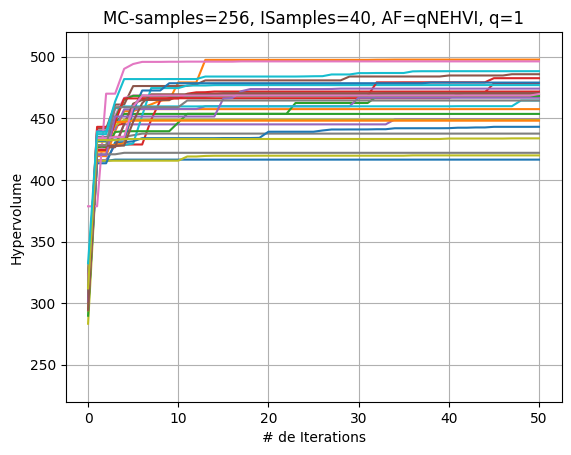

In [26]:
iters = np.arange(51)

for i in range(30):

    plt.errorbar(iters, np.asarray(hvsf27yexp4[i]), linewidth=1.5,label='%i' %i)
    plt.xlabel('# de Iterations')
    plt.ylabel('Hypervolume')
    plt.title('MC-samples=256, ISamples=40, AF=qNEHVI, q=1')
plt.grid()
plt.ylim([220,520])
plt.savefig('Exp4-27July')

In [30]:
np.array([hvsf27yexp4[i][-1] for i in range(30)]).mean()

462.4028486935314

In [31]:
%store BDs27yexp4
%store hvsf27yexp4
%store trainxall27yexp4
%store trainobjall27yexp4
%store numbd27yexp4

Stored 'BDs27yexp4' (list)
Stored 'hvsf27yexp4' (list)
Stored 'trainxall27yexp4' (list)
Stored 'trainobjall27yexp4' (list)
Stored 'numbd27yexp4' (list)


In [53]:
BDs27yexp5=[]
hvsf27yexp5=[]
trainxall27yexp5=[]
trainobjall27yexp5=[]
numbd27yexp5=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=50)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp5.append(bd.pareto_Y)      
    hvsf27yexp5.append(hvs_ehvi)   
    trainxall27yexp5.append(train_x_ehvi)
    trainobjall27yexp5.append(train_obj_ehvi)
    numbd27yexp5.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]

Seed: 780

Batch  1: Hypervolume (qNEHVI) = 431.2564 #Paprox=13 time = 10.50 Lysine= 0.9501 Energy= 14.4207 Costs= 146.0081)
Batch  2: Hypervolume (qNEHVI) = 431.2564 #Paprox=13 time = 10.48 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 454.8156 #Paprox=14 time = 10.46 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 454.8156 #Paprox=14 time = 10.73 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)
Batch  5: Hypervolume (qNEHVI) = 454.8156 #Paprox=15 time = 10.72 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)
Batch  6: Hypervolume (qNEHVI) = 454.8156 #Paprox=16 time = 11.08 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 454.8156 #Paprox=17 time = 11.03 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 454.8156 #Paprox=18 time = 11.27 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 454.8156 #Paprox=19 time = 11.34 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 454.8156 #Paprox=20 time = 12.05 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 454.8156 #Paprox=21 time = 11.27 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 455.5418 #Paprox=22 time = 11.87 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 455.5434 #Paprox=23 time = 11.84 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 455.5434 #Paprox=24 time = 11.52 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 455.5434 #Paprox=25 time = 11.86 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 455.5434 #Paprox=26 time = 12.06 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 455.5434 #Paprox=27 time = 11.85 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 455.5434 #Paprox=28 time = 11.79 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 455.5434 #Paprox=29 time = 12.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 455.5434 #Paprox=30 time = 12.39 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 455.5434 #Paprox=31 time = 12.17 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 455.5434 #Paprox=32 time = 12.50 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 455.5434 #Paprox=33 time = 12.52 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 455.5434 #Paprox=34 time = 12.61 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 455.5434 #Paprox=35 time = 12.90 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 455.5434 #Paprox=36 time = 13.13 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 455.5434 #Paprox=37 time = 12.72 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 455.5434 #Paprox=38 time = 12.85 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 455.5434 #Paprox=39 time = 13.41 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 455.5434 #Paprox=40 time = 13.00 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 455.5434 #Paprox=41 time = 13.76 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 455.5434 #Paprox=42 time = 13.08 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 455.5434 #Paprox=43 time = 13.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 455.5434 #Paprox=44 time = 13.40 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 455.5434 #Paprox=45 time = 13.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 455.5434 #Paprox=46 time = 13.11 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 455.5434 #Paprox=47 time = 13.40 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 455.5434 #Paprox=48 time = 13.32 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 455.5434 #Paprox=49 time = 13.70 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 455.5434 #Paprox=50 time = 13.73 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 455.5434 #Paprox=51 time = 13.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 455.5434 #Paprox=52 time = 13.65 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 455.5434 #Paprox=53 time = 13.75 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 455.5434 #Paprox=54 time = 13.67 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 455.5434 #Paprox=55 time = 13.78 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 455.5434 #Paprox=56 time = 14.00 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 455.5434 #Paprox=57 time = 14.26 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 455.5434 #Paprox=58 time = 14.05 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 455.5434 #Paprox=59 time = 14.05 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▎                                       | 1/30 [10:29<5:04:22, 629.72s/it]


Batch 50: Hypervolume (qNEHVI) = 455.5434 #Paprox=60 time = 13.93 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)Seed: 177

Batch  1: Hypervolume (qNEHVI) = 434.1211 #Paprox=12 time = 11.03 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 434.1211 #Paprox=12 time = 11.26 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 454.2828 #Paprox=13 time = 11.20 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 471.9968 #Paprox=14 time = 11.51 Lysine= 1.1604 Energy= 14.0010 Costs= 149.6270)
Batch  5: Hypervolume (qNEHVI) = 475.1073 #Paprox=13 time = 11.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 475.1073 #Paprox=14 time = 10.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 475.1073 #Paprox=15 time = 11.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 475.1073 #Paprox=16 time = 11.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 475.1073 #Paprox=16 time = 11.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 475.1073 #Paprox=17 time = 11.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 475.1073 #Paprox=18 time = 11.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 475.1073 #Paprox=19 time = 11.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 475.1073 #Paprox=20 time = 12.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 475.1073 #Paprox=21 time = 12.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 475.1073 #Paprox=22 time = 12.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 475.1073 #Paprox=23 time = 12.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 475.1073 #Paprox=24 time = 13.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 475.1073 #Paprox=25 time = 12.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 475.1073 #Paprox=25 time = 12.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 475.1073 #Paprox=26 time = 12.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 475.1073 #Paprox=27 time = 12.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 475.1073 #Paprox=28 time = 12.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 475.1073 #Paprox=29 time = 12.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 475.1073 #Paprox=30 time = 12.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 475.1073 #Paprox=31 time = 12.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 475.1073 #Paprox=32 time = 13.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 475.1073 #Paprox=33 time = 12.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 475.1073 #Paprox=34 time = 13.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 475.1073 #Paprox=35 time = 13.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 475.1073 #Paprox=35 time = 12.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 475.1073 #Paprox=36 time = 13.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 475.1073 #Paprox=37 time = 13.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 475.1073 #Paprox=38 time = 13.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 475.1073 #Paprox=39 time = 13.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 475.1073 #Paprox=40 time = 13.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 475.1073 #Paprox=40 time = 13.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 475.1073 #Paprox=41 time = 13.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 475.1073 #Paprox=42 time = 13.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 475.1073 #Paprox=43 time = 13.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 475.1073 #Paprox=44 time = 13.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 475.1073 #Paprox=45 time = 13.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 475.1073 #Paprox=46 time = 13.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 475.1073 #Paprox=46 time = 13.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 475.1073 #Paprox=46 time = 13.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 475.1073 #Paprox=46 time = 13.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 475.1073 #Paprox=46 time = 13.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 475.1073 #Paprox=47 time = 13.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 475.1073 #Paprox=48 time = 13.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 475.1073 #Paprox=49 time = 13.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▋                                      | 2/30 [21:06<4:55:48, 633.87s/it]


Batch 50: Hypervolume (qNEHVI) = 475.1073 #Paprox=50 time = 13.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 642

Batch  1: Hypervolume (qNEHVI) = 419.8717 #Paprox=17 time = 11.01 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 419.8717 #Paprox=17 time = 11.05 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 450.9268 #Paprox=18 time = 10.93 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 450.9268 #Paprox=19 time = 11.46 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 450.9268 #Paprox=20 time = 12.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 450.9268 #Paprox=21 time = 11.54 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 450.9268 #Paprox=22 time = 11.72 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 450.9268 #Paprox=23 time = 11.57 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 450.9268 #Paprox=24 time = 11.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 450.9268 #Paprox=25 time = 12.24 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 450.9268 #Paprox=26 time = 12.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 450.9268 #Paprox=27 time = 12.45 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 450.9268 #Paprox=28 time = 12.33 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 450.9268 #Paprox=29 time = 12.50 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 450.9268 #Paprox=30 time = 12.60 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 450.9268 #Paprox=31 time = 12.66 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 450.9268 #Paprox=32 time = 12.70 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 450.9268 #Paprox=33 time = 12.96 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 450.9268 #Paprox=34 time = 13.04 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 450.9268 #Paprox=35 time = 12.91 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 450.9268 #Paprox=36 time = 13.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 450.9268 #Paprox=37 time = 13.28 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 450.9268 #Paprox=38 time = 13.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 450.9268 #Paprox=39 time = 12.97 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 450.9268 #Paprox=40 time = 13.02 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 451.0250 #Paprox=41 time = 13.22 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 451.4228 #Paprox=42 time = 13.47 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 451.4228 #Paprox=43 time = 13.54 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 451.4228 #Paprox=44 time = 14.07 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 451.4228 #Paprox=45 time = 13.85 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 452.3762 #Paprox=46 time = 14.19 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 452.3762 #Paprox=47 time = 14.33 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 452.3762 #Paprox=47 time = 14.68 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 452.3762 #Paprox=48 time = 14.41 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 452.3762 #Paprox=49 time = 14.75 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 14.70 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 14.50 Lysine= 1.1628 Energy= 14.0010 Costs= 172.1881)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 14.69 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 14.91 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 15.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 15.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 15.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 15.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 15.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 15.56 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 15.78 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 15.88 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 15.86 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 15.71 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|████                                     | 3/30 [32:25<4:54:35, 654.65s/it]


Batch 50: Hypervolume (qNEHVI) = 452.3762 #Paprox=50 time = 15.75 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 397


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 423.3257 #Paprox=14 time = 11.58 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 423.3257 #Paprox=14 time = 11.13 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 454.3809 #Paprox=15 time = 11.15 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 454.3809 #Paprox=16 time = 11.17 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 454.3809 #Paprox=17 time = 11.31 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 454.3809 #Paprox=18 time = 11.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 454.3809 #Paprox=19 time = 11.84 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 454.3809 #Paprox=20 time = 11.69 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 454.3809 #Paprox=21 time = 11.96 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 454.3809 #Paprox=22 time = 11.72 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 466.8960 #Paprox=21 time = 12.03 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 472.8619 #Paprox=22 time = 9.16 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 474.5393 #Paprox=22 time = 9.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 474.5393 #Paprox=23 time = 7.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 474.5393 #Paprox=24 time = 8.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 474.5393 #Paprox=25 time = 8.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 474.5393 #Paprox=25 time = 8.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 474.5393 #Paprox=26 time = 9.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 474.5393 #Paprox=27 time = 9.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 474.5393 #Paprox=28 time = 9.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 474.5393 #Paprox=29 time = 9.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 474.5393 #Paprox=30 time = 9.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 474.6074 #Paprox=31 time = 9.85 Lysine= 1.0864 Energy= 14.2578 Costs= 149.4875)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 474.6074 #Paprox=31 time = 9.92 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 474.6074 #Paprox=31 time = 11.13 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 474.6074 #Paprox=31 time = 10.53 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 474.9148 #Paprox=32 time = 10.86 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 474.9148 #Paprox=33 time = 10.62 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 474.9148 #Paprox=34 time = 10.23 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 474.9148 #Paprox=34 time = 10.40 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 474.9148 #Paprox=35 time = 10.81 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 11.15 Lysine= 1.1804 Energy= 14.0010 Costs= 150.6746)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 11.33 Lysine= 1.0340 Energy= 14.0010 Costs= 153.4367)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 10.79 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 10.76 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 10.58 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 11.33 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 12.06 Lysine= 1.0094 Energy= 14.0010 Costs= 153.0856)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 10.73 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 10.87 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 10.84 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 11.43 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 11.68 Lysine= 1.0736 Energy= 14.0010 Costs= 155.0376)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 10.89 Lysine= 1.0740 Energy= 14.0010 Costs= 155.0461)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 11.90 Lysine= 0.9741 Energy= 14.0010 Costs= 152.9352)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 11.12 Lysine= 0.9501 Energy= 14.0010 Costs= 152.4101)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 474.9387 #Paprox=36 time = 11.02 Lysine= 1.0495 Energy= 14.0010 Costs= 154.5077)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 474.9742 #Paprox=37 time = 11.19 Lysine= 0.9677 Energy= 14.0010 Costs= 149.1676)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 480.3823 #Paprox=38 time = 11.28 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|█████▍                                   | 4/30 [41:21<4:23:14, 607.47s/it]


Batch 50: Hypervolume (qNEHVI) = 480.4982 #Paprox=39 time = 11.16 Lysine= 1.4245 Energy= 14.0010 Costs= 157.4858)Seed: 455

Batch  1: Hypervolume (qNEHVI) = 427.7388 #Paprox=12 time = 11.10 Lysine= 0.9501 Energy= 14.4081 Costs= 145.8693)
Batch  2: Hypervolume (qNEHVI) = 427.7388 #Paprox=12 time = 11.07 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 449.4370 #Paprox=13 time = 11.27 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 465.0984 #Paprox=14 time = 11.70 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)
Batch  5: Hypervolume (qNEHVI) = 465.1516 #Paprox=15 time = 11.56 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)
Batch  6: Hypervolume (qNEHVI) = 465.2215 #Paprox=16 time = 11.81 Lysine= 1.1862 Energy= 14.0216 Costs= 150.9375)
Batch  7: Hypervolume (qNEHVI) = 465.8121 #Paprox=17 time = 12.24 Lysine= 1.5643 Energy= 14.0010 Costs= 169.6185)
Batch  8: Hypervolume (qNEHVI) = 465.8121 #Paprox=17 time = 12.60 Lysine= 1.0

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 466.6121 #Paprox=24 time = 13.43 Lysine= 1.1096 Energy= 14.0010 Costs= 152.7956)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 466.6121 #Paprox=24 time = 13.61 Lysine= 1.0582 Energy= 14.0010 Costs= 151.6906)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 466.6121 #Paprox=24 time = 13.19 Lysine= 1.0582 Energy= 14.0010 Costs= 151.6906)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 466.6121 #Paprox=24 time = 13.07 Lysine= 1.0582 Energy= 14.0010 Costs= 151.6906)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 466.6121 #Paprox=24 time = 13.92 Lysine= 1.1033 Energy= 14.0010 Costs= 152.6611)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 466.6121 #Paprox=24 time = 13.84 Lysine= 1.0925 Energy= 14.0010 Costs= 152.4274)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 466.6121 #Paprox=24 time = 13.79 Lysine= 1.0813 Energy= 14.0010 Costs= 152.1870)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▊                                  | 5/30 [52:10<4:19:22, 622.49s/it]


Batch 50: Hypervolume (qNEHVI) = 466.6121 #Paprox=24 time = 14.04 Lysine= 1.0722 Energy= 14.0010 Costs= 151.9912)Seed: 96

Batch  1: Hypervolume (qNEHVI) = 456.2232 #Paprox=11 time = 11.54 Lysine= 0.9501 Energy= 14.3986 Costs= 145.7648)
Batch  2: Hypervolume (qNEHVI) = 456.2232 #Paprox=11 time = 11.59 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 476.5199 #Paprox=12 time = 11.69 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 476.8123 #Paprox=13 time = 11.74 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)
Batch  5: Hypervolume (qNEHVI) = 491.8391 #Paprox=14 time = 12.11 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)
Batch  6: Hypervolume (qNEHVI) = 491.8911 #Paprox=14 time = 12.02 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)
Batch  7: Hypervolume (qNEHVI) = 491.8925 #Paprox=15 time = 12.21 Lysine= 1.1885 Energy= 14.0348 Costs= 151.0687)
Batch  8: Hypervolume (qNEHVI) = 492.2451 #Paprox=16 time = 12.46 Lysine= 1.20

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 493.6519 #Paprox=27 time = 14.28 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 493.6519 #Paprox=28 time = 14.12 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 493.6519 #Paprox=29 time = 14.19 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 495.7433 #Paprox=30 time = 14.38 Lysine= 1.2551 Energy= 14.0010 Costs= 153.5214)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 495.7433 #Paprox=30 time = 14.30 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 495.7433 #Paprox=31 time = 14.67 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 495.7433 #Paprox=32 time = 14.86 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 495.8729 #Paprox=33 time = 14.92 Lysine= 1.2936 Energy= 14.0010 Costs= 156.5378)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 495.8729 #Paprox=34 time = 14.78 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 495.8729 #Paprox=35 time = 14.78 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 495.8729 #Paprox=36 time = 14.55 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 495.8729 #Paprox=37 time = 14.65 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 495.8729 #Paprox=38 time = 14.91 Lysine= 1.0644 Energy= 14.0010 Costs= 151.0376)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 495.8729 #Paprox=39 time = 14.85 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 495.8729 #Paprox=39 time = 14.92 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 495.8729 #Paprox=40 time = 14.69 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 495.8729 #Paprox=41 time = 15.26 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 495.8729 #Paprox=42 time = 15.07 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 495.8729 #Paprox=43 time = 15.05 Lysine= 1.0644 Energy= 14.0010 Costs= 151.0376)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 495.8729 #Paprox=44 time = 15.13 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 495.8729 #Paprox=45 time = 15.10 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 495.8729 #Paprox=46 time = 15.09 Lysine= 1.0644 Energy= 14.0010 Costs= 151.0376)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 495.8729 #Paprox=47 time = 15.16 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 495.8729 #Paprox=48 time = 15.41 Lysine= 1.0644 Energy= 14.0010 Costs= 151.0376)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|███████▊                               | 6/30 [1:03:46<4:19:03, 647.64s/it]


Batch 50: Hypervolume (qNEHVI) = 495.8729 #Paprox=49 time = 15.35 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)Seed: 720

Batch  1: Hypervolume (qNEHVI) = 430.7683 #Paprox=13 time = 11.23 Lysine= 0.9501 Energy= 14.4179 Costs= 145.9779)
Batch  2: Hypervolume (qNEHVI) = 430.7683 #Paprox=13 time = 11.59 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 431.2794 #Paprox=14 time = 11.90 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 431.2794 #Paprox=15 time = 12.07 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  5: Hypervolume (qNEHVI) = 431.5629 #Paprox=16 time = 12.14 Lysine= 0.9526 Energy= 14.3730 Costs= 147.3949)
Batch  6: Hypervolume (qNEHVI) = 432.6593 #Paprox=17 time = 12.38 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)
Batch  7: Hypervolume (qNEHVI) = 449.3266 #Paprox=18 time = 12.25 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  8: Hypervolume (qNEHVI) = 450.9886 #Paprox=18 time = 12.23 Lysine= 1.1

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 450.9886 #Paprox=20 time = 10.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 450.9886 #Paprox=21 time = 11.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 454.0004 #Paprox=22 time = 11.72 Lysine= 1.0416 Energy= 14.0194 Costs= 146.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 456.2071 #Paprox=23 time = 12.35 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 456.2071 #Paprox=23 time = 12.26 Lysine= 1.1809 Energy= 14.0010 Costs= 150.8058)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 456.2071 #Paprox=24 time = 12.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 456.2071 #Paprox=25 time = 12.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 456.2071 #Paprox=26 time = 12.97 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 456.2071 #Paprox=27 time = 12.70 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 456.2071 #Paprox=28 time = 12.69 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 456.2071 #Paprox=28 time = 12.86 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 456.2071 #Paprox=29 time = 13.18 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 456.2071 #Paprox=30 time = 13.13 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 456.2071 #Paprox=31 time = 13.43 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 456.2071 #Paprox=32 time = 12.91 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 456.2071 #Paprox=33 time = 13.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 456.2071 #Paprox=33 time = 13.40 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 456.2071 #Paprox=34 time = 13.63 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 456.2071 #Paprox=35 time = 13.39 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 456.2071 #Paprox=36 time = 13.58 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 456.2071 #Paprox=37 time = 13.51 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 456.2071 #Paprox=38 time = 13.45 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 456.2071 #Paprox=38 time = 13.78 Lysine= 1.1286 Energy= 14.0010 Costs= 153.0816)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 456.2071 #Paprox=39 time = 13.97 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 456.2071 #Paprox=39 time = 13.75 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 456.2071 #Paprox=40 time = 13.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 456.2071 #Paprox=41 time = 13.62 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 456.2071 #Paprox=42 time = 14.10 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 456.2071 #Paprox=43 time = 13.90 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 456.2071 #Paprox=44 time = 13.65 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 456.2071 #Paprox=45 time = 13.82 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 456.2071 #Paprox=46 time = 13.57 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 456.2071 #Paprox=47 time = 13.68 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 456.2071 #Paprox=48 time = 14.24 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 456.2071 #Paprox=49 time = 13.93 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 456.2071 #Paprox=50 time = 14.01 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 456.2071 #Paprox=50 time = 13.66 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 456.2071 #Paprox=51 time = 14.25 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 456.2071 #Paprox=52 time = 14.15 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 456.2071 #Paprox=52 time = 14.16 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 23%|█████████                              | 7/30 [1:14:39<4:08:58, 649.52s/it]


Batch 50: Hypervolume (qNEHVI) = 456.2071 #Paprox=53 time = 13.78 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 183

Batch  1: Hypervolume (qNEHVI) = 418.5201 #Paprox=8 time = 11.92 Lysine= 0.9501 Energy= 14.4307 Costs= 146.1180)
Batch  2: Hypervolume (qNEHVI) = 418.5201 #Paprox=8 time = 11.99 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 419.4290 #Paprox=9 time = 12.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 419.4290 #Paprox=10 time = 12.29 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 444.4633 #Paprox=11 time = 12.68 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 448.0417 #Paprox=12 time = 12.45 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 448.0417 #Paprox=13 time = 12.78 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 448.0417 #Paprox=14 time = 12.73 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 448.0417 #Paprox=15 time = 12.85 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 448.0417 #Paprox=16 time = 13.09 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 448.0417 #Paprox=17 time = 13.16 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 448.0417 #Paprox=18 time = 12.98 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 448.0417 #Paprox=19 time = 13.20 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 448.0417 #Paprox=20 time = 13.16 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 448.0417 #Paprox=21 time = 13.32 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 448.0417 #Paprox=22 time = 13.41 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 448.0417 #Paprox=22 time = 13.45 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 448.0417 #Paprox=22 time = 13.39 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 448.0417 #Paprox=23 time = 13.63 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 448.0417 #Paprox=23 time = 13.50 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 448.0417 #Paprox=23 time = 13.56 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 448.0417 #Paprox=23 time = 14.14 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 448.0417 #Paprox=23 time = 13.86 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 448.0417 #Paprox=24 time = 14.53 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 448.0417 #Paprox=25 time = 14.12 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 448.0417 #Paprox=25 time = 14.07 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 448.0417 #Paprox=25 time = 14.07 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 448.0417 #Paprox=25 time = 14.35 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 448.0417 #Paprox=25 time = 14.23 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 448.0417 #Paprox=25 time = 14.41 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 448.0417 #Paprox=25 time = 14.39 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 448.0417 #Paprox=25 time = 14.47 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 448.0417 #Paprox=25 time = 14.60 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 448.0417 #Paprox=25 time = 14.63 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 448.0417 #Paprox=26 time = 14.25 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 448.0417 #Paprox=26 time = 14.33 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 448.0417 #Paprox=26 time = 14.47 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 448.0417 #Paprox=26 time = 14.67 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 448.0417 #Paprox=26 time = 14.16 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 448.0417 #Paprox=26 time = 14.37 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 448.0417 #Paprox=27 time = 14.53 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 448.0417 #Paprox=27 time = 14.30 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 448.0417 #Paprox=27 time = 14.80 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 448.0417 #Paprox=27 time = 14.50 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 448.0417 #Paprox=27 time = 14.46 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 448.0417 #Paprox=27 time = 14.51 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 448.0417 #Paprox=27 time = 14.71 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 448.0417 #Paprox=28 time = 14.67 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 448.0417 #Paprox=29 time = 14.80 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 27%|██████████▍                            | 8/30 [1:26:10<4:02:54, 662.50s/it]


Batch 50: Hypervolume (qNEHVI) = 448.0417 #Paprox=29 time = 14.58 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)Seed: 316

Batch  1: Hypervolume (qNEHVI) = 428.8760 #Paprox=11 time = 11.93 Lysine= 0.9501 Energy= 14.4195 Costs= 145.9946)
Batch  2: Hypervolume (qNEHVI) = 428.8760 #Paprox=11 time = 11.87 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 452.2543 #Paprox=12 time = 11.86 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 457.6764 #Paprox=13 time = 12.39 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 457.6764 #Paprox=13 time = 12.26 Lysine= 1.2051 Energy= 14.0010 Costs= 157.7905)
Batch  6: Hypervolume (qNEHVI) = 457.6764 #Paprox=13 time = 12.53 Lysine= 1.1300 Energy= 14.0010 Costs= 175.6932)
Batch  7: Hypervolume (qNEHVI) = 459.0835 #Paprox=14 time = 12.27 Lysine= 1.2341 Energy= 14.0403 Costs= 154.7042)
Batch  8: Hypervolume (qNEHVI) = 459.0908 #Paprox=15 time = 12.92 Lysine= 1.2694 Energy= 14.2896 Costs= 156.7530)
Batch  9: Hypervolume (qNEHVI) = 459.0908 #Paprox=16 time = 10.89 Lysine= 1.2341 Energy= 14.0403 Costs= 154.7042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 459.8627 #Paprox=17 time = 10.76 Lysine= 1.2372 Energy= 14.0010 Costs= 154.5161)
Batch 11: Hypervolume (qNEHVI) = 459.8628 #Paprox=18 time = 11.43 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 459.8628 #Paprox=19 time = 10.33 Lysine= 1.2694 Energy= 14.2896 Costs= 156.7530)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 459.8724 #Paprox=20 time = 9.32 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 459.8724 #Paprox=21 time = 8.18 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 459.8724 #Paprox=22 time = 8.09 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 459.8724 #Paprox=23 time = 8.08 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 459.8724 #Paprox=24 time = 8.08 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 459.8724 #Paprox=25 time = 7.88 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 459.8724 #Paprox=26 time = 8.27 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 459.8724 #Paprox=27 time = 8.44 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 459.8724 #Paprox=28 time = 8.36 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 459.8724 #Paprox=29 time = 8.75 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 459.8724 #Paprox=30 time = 8.74 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 459.8724 #Paprox=31 time = 8.46 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 459.8737 #Paprox=32 time = 8.88 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 459.8737 #Paprox=33 time = 7.85 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 459.8737 #Paprox=34 time = 7.74 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 459.8737 #Paprox=35 time = 7.93 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 459.8737 #Paprox=36 time = 7.92 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 459.8737 #Paprox=37 time = 8.91 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 459.8737 #Paprox=38 time = 8.18 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 459.8737 #Paprox=39 time = 8.22 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 459.8737 #Paprox=40 time = 8.38 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 459.8737 #Paprox=40 time = 8.35 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 459.8737 #Paprox=41 time = 8.56 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 459.8737 #Paprox=42 time = 8.94 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 459.8737 #Paprox=43 time = 8.56 Lysine= 1.2341 Energy= 14.0403 Costs= 154.7042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 461.0824 #Paprox=44 time = 9.34 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 461.0827 #Paprox=45 time = 8.40 Lysine= 1.2447 Energy= 14.3267 Costs= 156.5736)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 461.0827 #Paprox=46 time = 8.39 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 461.0827 #Paprox=47 time = 8.38 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 461.0827 #Paprox=48 time = 8.12 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 461.0827 #Paprox=49 time = 8.14 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 461.0827 #Paprox=50 time = 8.43 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 461.0827 #Paprox=51 time = 8.20 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 461.0827 #Paprox=52 time = 8.01 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 461.0827 #Paprox=53 time = 8.62 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 461.0827 #Paprox=54 time = 8.46 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 461.0827 #Paprox=55 time = 8.49 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 30%|███████████▋                           | 9/30 [1:33:51<3:29:48, 599.46s/it]


Batch 50: Hypervolume (qNEHVI) = 461.0827 #Paprox=56 time = 8.68 Lysine= 1.2443 Energy= 14.3313 Costs= 156.6156)Seed: 236

Batch  1: Hypervolume (qNEHVI) = 435.9748 #Paprox=19 time = 12.04 Lysine= 0.9501 Energy= 14.3944 Costs= 145.7060)
Batch  2: Hypervolume (qNEHVI) = 435.9748 #Paprox=19 time = 12.36 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)
Batch  3: Hypervolume (qNEHVI) = 451.4938 #Paprox=20 time = 12.28 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  4: Hypervolume (qNEHVI) = 454.0168 #Paprox=18 time = 12.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 454.0168 #Paprox=19 time = 10.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 454.0168 #Paprox=20 time = 10.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 454.0168 #Paprox=21 time = 11.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 454.0168 #Paprox=22 time = 11.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 454.0168 #Paprox=23 time = 11.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 454.0168 #Paprox=24 time = 11.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 454.0168 #Paprox=25 time = 11.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 454.0168 #Paprox=26 time = 11.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 454.0168 #Paprox=26 time = 11.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 454.0168 #Paprox=27 time = 12.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 454.0168 #Paprox=28 time = 12.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 454.0168 #Paprox=28 time = 12.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 454.0168 #Paprox=29 time = 12.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 454.0168 #Paprox=29 time = 12.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 454.0168 #Paprox=30 time = 12.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 454.0168 #Paprox=31 time = 12.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 454.0168 #Paprox=32 time = 12.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 454.0168 #Paprox=33 time = 12.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 454.0168 #Paprox=34 time = 12.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 454.0168 #Paprox=35 time = 12.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 454.0168 #Paprox=36 time = 12.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 454.0439 #Paprox=37 time = 12.49 Lysine= 1.1383 Energy= 14.5335 Costs= 152.4635)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 12.90 Lysine= 1.1068 Energy= 14.3662 Costs= 150.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 12.67 Lysine= 1.0035 Energy= 14.0010 Costs= 152.1550)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 13.00 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 12.84 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 13.01 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 13.03 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 13.02 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 12.93 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 13.19 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 12.96 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 12.91 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 12.89 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 13.18 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 12.94 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 13.13 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 12.98 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 12.89 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 12.88 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 13.17 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 12.98 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 13.14 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 13.20 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 13.16 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|████████████▋                         | 10/30 [1:44:17<3:22:33, 607.67s/it]


Batch 50: Hypervolume (qNEHVI) = 454.1472 #Paprox=38 time = 13.26 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)Seed: 810

Batch  1: Hypervolume (qNEHVI) = 425.2261 #Paprox=14 time = 11.09 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 425.2261 #Paprox=14 time = 11.21 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 444.1027 #Paprox=15 time = 11.39 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 444.1027 #Paprox=15 time = 11.29 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)
Batch  5: Hypervolume (qNEHVI) = 444.1027 #Paprox=15 time = 11.54 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 458.9247 #Paprox=16 time = 11.83 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 461.7590 #Paprox=14 time = 11.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 461.7590 #Paprox=14 time = 10.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 461.7590 #Paprox=15 time = 10.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 461.7590 #Paprox=16 time = 10.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 461.7590 #Paprox=17 time = 11.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 461.7590 #Paprox=18 time = 11.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 461.7590 #Paprox=18 time = 11.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 461.7590 #Paprox=19 time = 11.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 461.7590 #Paprox=20 time = 11.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 461.7590 #Paprox=21 time = 11.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 461.7590 #Paprox=22 time = 11.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 461.7590 #Paprox=23 time = 12.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 461.7590 #Paprox=24 time = 12.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 461.7590 #Paprox=25 time = 12.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 461.8631 #Paprox=26 time = 12.54 Lysine= 1.1115 Energy= 14.3912 Costs= 150.9272)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 463.5707 #Paprox=27 time = 12.13 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 463.5707 #Paprox=28 time = 12.42 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 463.5707 #Paprox=29 time = 12.42 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 463.5707 #Paprox=30 time = 12.66 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 463.5707 #Paprox=31 time = 12.85 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 463.5707 #Paprox=32 time = 12.82 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 463.5707 #Paprox=33 time = 12.94 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 463.5707 #Paprox=34 time = 12.97 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 463.5707 #Paprox=35 time = 13.05 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 463.5707 #Paprox=36 time = 13.22 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 463.5707 #Paprox=37 time = 13.08 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 463.5707 #Paprox=38 time = 13.28 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 463.5707 #Paprox=39 time = 13.32 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 463.5707 #Paprox=40 time = 13.42 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 463.5707 #Paprox=41 time = 13.22 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 463.5707 #Paprox=42 time = 13.37 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 463.5707 #Paprox=42 time = 13.86 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 463.5707 #Paprox=43 time = 13.35 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 463.5707 #Paprox=44 time = 13.38 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 463.5707 #Paprox=44 time = 13.51 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 463.5707 #Paprox=45 time = 13.32 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 463.5707 #Paprox=46 time = 13.73 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 463.5707 #Paprox=47 time = 13.85 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 463.5707 #Paprox=48 time = 13.62 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 463.5707 #Paprox=49 time = 13.66 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 463.5707 #Paprox=50 time = 13.80 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 463.5707 #Paprox=51 time = 13.96 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 463.5707 #Paprox=52 time = 14.00 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 37%|█████████████▉                        | 11/30 [1:54:44<3:14:20, 613.69s/it]


Batch 50: Hypervolume (qNEHVI) = 463.5707 #Paprox=53 time = 13.76 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 674

Batch  1: Hypervolume (qNEHVI) = 415.9065 #Paprox=25 time = 11.91 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 415.9065 #Paprox=25 time = 11.66 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 415.9065 #Paprox=26 time = 13.09 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)
Batch  4: Hypervolume (qNEHVI) = 436.0682 #Paprox=27 time = 11.93 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 452.1223 #Paprox=28 time = 12.25 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 454.5866 #Paprox=21 time = 12.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 454.5866 #Paprox=22 time = 11.26 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 454.5866 #Paprox=23 time = 11.35 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 454.5866 #Paprox=24 time = 11.19 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 454.5866 #Paprox=25 time = 11.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 454.5866 #Paprox=26 time = 11.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 454.5866 #Paprox=27 time = 12.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 454.5866 #Paprox=28 time = 12.64 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 454.5866 #Paprox=29 time = 12.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 454.5866 #Paprox=30 time = 13.16 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 454.5866 #Paprox=31 time = 13.07 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 454.5866 #Paprox=32 time = 13.13 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 454.5866 #Paprox=33 time = 13.02 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 454.5866 #Paprox=34 time = 13.58 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 454.5866 #Paprox=35 time = 13.37 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 454.5866 #Paprox=36 time = 13.85 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 454.5866 #Paprox=37 time = 13.42 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 454.5866 #Paprox=38 time = 13.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 454.5866 #Paprox=39 time = 13.91 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 454.5866 #Paprox=40 time = 14.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 454.5866 #Paprox=41 time = 14.22 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 454.5866 #Paprox=42 time = 14.11 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 454.5866 #Paprox=43 time = 14.00 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 454.5866 #Paprox=44 time = 13.87 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 454.5866 #Paprox=45 time = 13.96 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 454.5866 #Paprox=46 time = 14.19 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 454.5866 #Paprox=47 time = 13.99 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 454.5866 #Paprox=48 time = 14.54 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 454.5866 #Paprox=49 time = 14.43 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 454.5866 #Paprox=50 time = 14.20 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 454.5866 #Paprox=51 time = 14.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 454.5866 #Paprox=52 time = 14.37 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 454.5866 #Paprox=53 time = 14.33 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 454.5866 #Paprox=54 time = 14.63 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 454.5866 #Paprox=55 time = 14.41 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 454.5866 #Paprox=56 time = 14.51 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 454.5866 #Paprox=56 time = 14.58 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 454.5866 #Paprox=57 time = 14.90 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 454.5866 #Paprox=58 time = 14.58 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 454.5953 #Paprox=59 time = 14.76 Lysine= 1.1509 Energy= 14.0137 Costs= 149.3882)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 454.5953 #Paprox=60 time = 14.57 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 454.5953 #Paprox=61 time = 14.89 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 454.5953 #Paprox=62 time = 14.74 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 454.5953 #Paprox=63 time = 15.07 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 40%|███████████████▏                      | 12/30 [2:06:03<3:10:03, 633.53s/it]


Batch 50: Hypervolume (qNEHVI) = 454.5953 #Paprox=64 time = 14.86 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)Seed: 639

Batch  1: Hypervolume (qNEHVI) = 417.7869 #Paprox=17 time = 11.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 417.7869 #Paprox=17 time = 11.59 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 448.8421 #Paprox=18 time = 11.49 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 448.8421 #Paprox=18 time = 12.03 Lysine= 1.2383 Energy= 14.0010 Costs= 158.0502)
Batch  5: Hypervolume (qNEHVI) = 448.9403 #Paprox=19 time = 11.95 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  6: Hypervolume (qNEHVI) = 448.9403 #Paprox=19 time = 12.24 Lysine= 1.2342 Energy= 14.0010 Costs= 156.8458)
Batch  7: Hypervolume (qNEHVI) = 448.9403 #Paprox=19 time = 12.79 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4312)
Batch  8: Hypervolume (qNEHVI) = 450.3403 #Paprox=20 time = 12.17 Lysine= 1.2

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 485.4125 #Paprox=25 time = 13.13 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 485.4125 #Paprox=25 time = 12.91 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4312)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 485.4125 #Paprox=26 time = 13.02 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 485.4125 #Paprox=27 time = 13.36 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 485.4125 #Paprox=28 time = 13.71 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 485.4125 #Paprox=29 time = 14.00 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 487.5113 #Paprox=30 time = 13.38 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 487.5113 #Paprox=30 time = 13.49 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4312)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 487.5113 #Paprox=31 time = 13.94 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 487.5113 #Paprox=32 time = 14.01 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 487.5113 #Paprox=33 time = 13.72 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 487.9283 #Paprox=33 time = 14.11 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 487.9283 #Paprox=33 time = 14.13 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 487.9283 #Paprox=34 time = 14.08 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 487.9283 #Paprox=35 time = 14.37 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 487.9283 #Paprox=36 time = 14.25 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 487.9283 #Paprox=37 time = 14.33 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 487.9283 #Paprox=38 time = 14.22 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 487.9283 #Paprox=39 time = 14.36 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 487.9283 #Paprox=39 time = 14.23 Lysine= 1.1932 Energy= 14.0010 Costs= 169.9394)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 487.9283 #Paprox=39 time = 14.32 Lysine= 0.9501 Energy= 14.0010 Costs= 150.2600)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 487.9283 #Paprox=39 time = 14.36 Lysine= 0.9501 Energy= 14.0010 Costs= 150.2600)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 487.9283 #Paprox=39 time = 14.07 Lysine= 0.9501 Energy= 14.0010 Costs= 149.9684)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 487.9283 #Paprox=39 time = 14.18 Lysine= 0.9501 Energy= 14.0010 Costs= 150.2600)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 487.9283 #Paprox=39 time = 13.95 Lysine= 0.9501 Energy= 14.0010 Costs= 150.2600)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 487.9283 #Paprox=39 time = 13.96 Lysine= 0.9501 Energy= 14.0010 Costs= 150.3050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 487.9283 #Paprox=39 time = 14.10 Lysine= 0.9501 Energy= 14.0010 Costs= 150.3050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 488.0926 #Paprox=40 time = 14.07 Lysine= 1.3545 Energy= 14.0010 Costs= 158.9371)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 488.0926 #Paprox=40 time = 14.01 Lysine= 0.9501 Energy= 14.0010 Costs= 150.3050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 488.0926 #Paprox=40 time = 14.20 Lysine= 0.9501 Energy= 14.0010 Costs= 150.3050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 488.0926 #Paprox=40 time = 14.30 Lysine= 0.9501 Energy= 14.0010 Costs= 150.3050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 488.0926 #Paprox=40 time = 14.26 Lysine= 0.9501 Energy= 14.0010 Costs= 150.3050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 488.0926 #Paprox=40 time = 14.12 Lysine= 0.9501 Energy= 14.0010 Costs= 150.3050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 488.0926 #Paprox=40 time = 14.09 Lysine= 0.9501 Energy= 14.0010 Costs= 150.3050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 488.0926 #Paprox=40 time = 13.92 Lysine= 0.9501 Energy= 14.0010 Costs= 150.3050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 488.0926 #Paprox=40 time = 14.27 Lysine= 0.9501 Energy= 14.0010 Costs= 150.3050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 43%|████████████████▍                     | 13/30 [2:17:19<3:03:07, 646.29s/it]


Batch 50: Hypervolume (qNEHVI) = 488.0926 #Paprox=40 time = 14.17 Lysine= 0.9501 Energy= 14.0010 Costs= 150.3050)Seed: 202

Batch  1: Hypervolume (qNEHVI) = 425.8004 #Paprox=11 time = 11.62 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 425.8004 #Paprox=11 time = 12.00 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 427.1110 #Paprox=12 time = 12.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 439.6294 #Paprox=12 time = 12.23 Lysine= 1.1108 Energy= 14.2189 Costs= 150.0105)
Batch  5: Hypervolume (qNEHVI) = 439.6294 #Paprox=12 time = 11.41 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 439.6294 #Paprox=12 time = 11.52 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 440.1694 #Paprox=13 time = 11.43 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 440.1708 #Paprox=14 time = 11.50 Lysine= 1.1573 Energy= 14.0010 Costs= 154.6533)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 444.8174 #Paprox=13 time = 11.67 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 444.8348 #Paprox=14 time = 11.59 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)
Batch 11: Hypervolume (qNEHVI) = 444.9183 #Paprox=15 time = 11.86 Lysine= 1.1851 Energy= 14.0156 Costs= 150.8783)
Batch 12: Hypervolume (qNEHVI) = 444.9183 #Paprox=15 time = 11.91 Lysine= 1.0740 Energy= 14.0010 Costs= 152.2799)
Batch 13: Hypervolume (qNEHVI) = 444.9183 #Paprox=15 time = 12.25 Lysine= 1.0965 Energy= 14.0010 Costs= 152.8785)
Batch 14: Hypervolume (qNEHVI) = 444.9183 #Paprox=15 time = 12.38 Lysine= 1.0524 Energy= 14.0010 Costs= 151.2430)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 444.9970 #Paprox=16 time = 12.05 Lysine= 1.2026 Energy= 14.0010 Costs= 154.9186)
Batch 16: Hypervolume (qNEHVI) = 444.9970 #Paprox=16 time = 12.36 Lysine= 1.1396 Energy= 14.0010 Costs= 153.2809)
Batch 17: Hypervolume (qNEHVI) = 444.9970 #Paprox=16 time = 12.45 Lysine= 1.0954 Energy= 14.0010 Costs= 152.3647)
Batch 18: Hypervolume (qNEHVI) = 444.9970 #Paprox=16 time = 13.21 Lysine= 1.0255 Energy= 14.0010 Costs= 150.6232)
Batch 19: Hypervolume (qNEHVI) = 444.9970 #Paprox=16 time = 12.63 Lysine= 1.0927 Energy= 14.0010 Costs= 151.9724)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 445.6652 #Paprox=17 time = 12.70 Lysine= 0.9727 Energy= 14.0010 Costs= 147.9017)
Batch 21: Hypervolume (qNEHVI) = 445.7197 #Paprox=18 time = 12.75 Lysine= 0.9839 Energy= 14.0010 Costs= 149.6610)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 445.7197 #Paprox=19 time = 12.82 Lysine= 0.9839 Energy= 14.0010 Costs= 149.6610)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 451.3874 #Paprox=20 time = 12.88 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 455.4392 #Paprox=21 time = 12.92 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 455.4392 #Paprox=22 time = 12.80 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 455.4392 #Paprox=23 time = 13.07 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 455.4392 #Paprox=24 time = 13.09 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 455.4392 #Paprox=25 time = 13.44 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 455.9892 #Paprox=26 time = 13.70 Lysine= 1.4141 Energy= 14.0010 Costs= 158.7958)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 455.9892 #Paprox=27 time = 13.28 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 456.3175 #Paprox=28 time = 13.77 Lysine= 1.3136 Energy= 14.0010 Costs= 156.6615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 456.3175 #Paprox=29 time = 14.29 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 456.3175 #Paprox=30 time = 13.67 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 456.3175 #Paprox=31 time = 13.88 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 456.3175 #Paprox=32 time = 14.28 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 456.4208 #Paprox=33 time = 14.21 Lysine= 1.4514 Energy= 14.0010 Costs= 159.4170)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 456.5241 #Paprox=34 time = 14.13 Lysine= 1.4492 Energy= 14.0010 Costs= 159.2070)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 456.5241 #Paprox=35 time = 14.40 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 456.5241 #Paprox=36 time = 14.13 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 456.5241 #Paprox=37 time = 14.27 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 456.5241 #Paprox=38 time = 14.56 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 456.5259 #Paprox=39 time = 14.66 Lysine= 1.4500 Energy= 14.0010 Costs= 159.2489)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 456.5259 #Paprox=40 time = 14.56 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 456.5259 #Paprox=41 time = 14.65 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 456.5259 #Paprox=42 time = 14.53 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 456.5259 #Paprox=43 time = 14.56 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 456.5259 #Paprox=44 time = 14.87 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 456.5259 #Paprox=45 time = 15.21 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 456.5259 #Paprox=45 time = 14.55 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 47%|█████████████████▋                    | 14/30 [2:28:19<2:53:29, 650.57s/it]


Batch 50: Hypervolume (qNEHVI) = 456.5270 #Paprox=46 time = 14.90 Lysine= 1.4505 Energy= 14.0010 Costs= 159.2787)Seed: 987

Batch  1: Hypervolume (qNEHVI) = 421.1003 #Paprox=18 time = 11.44 Lysine= 0.9501 Energy= 14.4134 Costs= 145.9281)
Batch  2: Hypervolume (qNEHVI) = 421.1003 #Paprox=18 time = 11.97 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 448.8269 #Paprox=19 time = 11.87 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)
Batch  4: Hypervolume (qNEHVI) = 448.8269 #Paprox=19 time = 11.70 Lysine= 1.2051 Energy= 14.0010 Costs= 157.7905)
Batch  5: Hypervolume (qNEHVI) = 448.8269 #Paprox=19 time = 12.10 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)
Batch  6: Hypervolume (qNEHVI) = 448.8269 #Paprox=20 time = 11.88 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 448.8269 #Paprox=21 time = 12.26 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 448.8269 #Paprox=22 time = 12.01 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 448.8269 #Paprox=23 time = 12.25 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 469.7128 #Paprox=24 time = 12.28 Lysine= 1.3731 Energy= 14.0010 Costs= 152.8905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 469.9162 #Paprox=20 time = 12.43 Lysine= 1.3615 Energy= 14.1927 Costs= 153.9610)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 469.9162 #Paprox=21 time = 10.20 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 469.9162 #Paprox=22 time = 10.25 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 469.9162 #Paprox=23 time = 10.23 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 469.9162 #Paprox=23 time = 10.52 Lysine= 0.9501 Energy= 14.0010 Costs= 153.7221)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 469.9162 #Paprox=23 time = 10.51 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 469.9162 #Paprox=23 time = 10.76 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 469.9162 #Paprox=23 time = 11.05 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 469.9162 #Paprox=23 time = 11.33 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 469.9311 #Paprox=22 time = 11.15 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 469.9311 #Paprox=23 time = 9.61 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 469.9332 #Paprox=24 time = 9.03 Lysine= 1.2632 Energy= 14.2906 Costs= 156.6106)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 469.9332 #Paprox=24 time = 8.11 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 469.9332 #Paprox=25 time = 8.05 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 469.9332 #Paprox=26 time = 8.04 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 469.9332 #Paprox=26 time = 7.86 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 469.9332 #Paprox=27 time = 8.07 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 469.9332 #Paprox=28 time = 7.85 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 469.9332 #Paprox=28 time = 8.12 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 469.9332 #Paprox=29 time = 7.79 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 469.9332 #Paprox=29 time = 8.22 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 469.9332 #Paprox=29 time = 8.11 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 469.9332 #Paprox=29 time = 8.37 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 469.9332 #Paprox=30 time = 8.02 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 469.9332 #Paprox=30 time = 8.41 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 469.9332 #Paprox=31 time = 7.97 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 469.9332 #Paprox=32 time = 8.10 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 469.9332 #Paprox=32 time = 8.22 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 469.9332 #Paprox=33 time = 8.28 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 469.9332 #Paprox=33 time = 8.21 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 469.9332 #Paprox=33 time = 8.52 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 469.9332 #Paprox=34 time = 8.23 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 469.9332 #Paprox=34 time = 8.46 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 469.9332 #Paprox=35 time = 8.44 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 469.9332 #Paprox=35 time = 8.41 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 469.9332 #Paprox=35 time = 8.55 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 469.9332 #Paprox=35 time = 8.72 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 469.9332 #Paprox=35 time = 8.60 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 469.9332 #Paprox=35 time = 8.59 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 50%|███████████████████                   | 15/30 [2:36:17<2:29:40, 598.69s/it]


Batch 50: Hypervolume (qNEHVI) = 469.9332 #Paprox=35 time = 8.57 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)Seed: 895


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 427.7854 #Paprox=16 time = 11.25 Lysine= 0.9501 Energy= 14.4219 Costs= 146.0211)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 427.7854 #Paprox=16 time = 11.12 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 456.7504 #Paprox=17 time = 11.93 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 469.4675 #Paprox=18 time = 11.77 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 469.4675 #Paprox=19 time = 11.78 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 472.1841 #Paprox=18 time = 12.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 472.1841 #Paprox=19 time = 11.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 472.1841 #Paprox=20 time = 11.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 472.1841 #Paprox=21 time = 12.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 472.1841 #Paprox=22 time = 12.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 472.1841 #Paprox=23 time = 12.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 472.1841 #Paprox=24 time = 12.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 472.1841 #Paprox=25 time = 12.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 472.1841 #Paprox=26 time = 12.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 472.1841 #Paprox=27 time = 12.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 472.1841 #Paprox=28 time = 12.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 472.1841 #Paprox=29 time = 13.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 472.1841 #Paprox=30 time = 12.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 472.1841 #Paprox=31 time = 13.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 472.1841 #Paprox=31 time = 13.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 472.1841 #Paprox=32 time = 13.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 472.1841 #Paprox=33 time = 13.44 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 472.1841 #Paprox=34 time = 13.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 472.1841 #Paprox=35 time = 13.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.1841 #Paprox=36 time = 13.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 472.1841 #Paprox=37 time = 13.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 472.1841 #Paprox=38 time = 13.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 472.1841 #Paprox=39 time = 13.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 472.1841 #Paprox=40 time = 13.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 472.1841 #Paprox=41 time = 13.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 472.1841 #Paprox=41 time = 13.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 472.1841 #Paprox=42 time = 13.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 472.1841 #Paprox=43 time = 13.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 472.1841 #Paprox=44 time = 14.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 472.1841 #Paprox=45 time = 14.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 472.1841 #Paprox=46 time = 14.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 472.1841 #Paprox=47 time = 14.18 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 472.1841 #Paprox=48 time = 13.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 472.1841 #Paprox=48 time = 13.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 472.1841 #Paprox=48 time = 14.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 472.1841 #Paprox=48 time = 14.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 472.1841 #Paprox=49 time = 13.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 472.1841 #Paprox=50 time = 14.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 472.1841 #Paprox=51 time = 14.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 472.1841 #Paprox=52 time = 13.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 472.1841 #Paprox=52 time = 14.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 472.1841 #Paprox=52 time = 14.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 472.1841 #Paprox=53 time = 14.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 472.1841 #Paprox=54 time = 14.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 53%|████████████████████▎                 | 16/30 [2:47:20<2:24:10, 617.93s/it]


Batch 50: Hypervolume (qNEHVI) = 472.1841 #Paprox=54 time = 14.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 264

Batch  1: Hypervolume (qNEHVI) = 433.7092 #Paprox=23 time = 10.61 Lysine= 0.9501 Energy= 14.3941 Costs= 145.7017)
Batch  2: Hypervolume (qNEHVI) = 433.7092 #Paprox=23 time = 10.42 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)
Batch  3: Hypervolume (qNEHVI) = 450.9984 #Paprox=24 time = 10.74 Lysine= 1.1604 Energy= 14.0010 Costs= 149.6270)
Batch  4: Hypervolume (qNEHVI) = 454.0277 #Paprox=20 time = 10.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  5: Hypervolume (qNEHVI) = 454.0277 #Paprox=21 time = 8.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 454.0277 #Paprox=22 time = 9.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 454.0277 #Paprox=23 time = 9.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 454.0277 #Paprox=24 time = 9.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 454.0277 #Paprox=25 time = 9.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 454.0277 #Paprox=26 time = 10.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 454.0277 #Paprox=27 time = 9.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 454.0277 #Paprox=28 time = 10.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 454.0277 #Paprox=29 time = 10.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 454.0277 #Paprox=30 time = 10.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 454.0277 #Paprox=31 time = 10.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 454.0277 #Paprox=32 time = 10.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 454.0277 #Paprox=33 time = 10.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 454.0277 #Paprox=34 time = 10.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 454.1077 #Paprox=35 time = 10.75 Lysine= 1.1333 Energy= 14.5072 Costs= 152.1802)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 457.6839 #Paprox=36 time = 10.93 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 457.6839 #Paprox=36 time = 11.01 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 457.6839 #Paprox=36 time = 11.30 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 457.6839 #Paprox=36 time = 11.56 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 457.6839 #Paprox=36 time = 11.72 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 457.6839 #Paprox=36 time = 12.01 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 457.6839 #Paprox=36 time = 11.98 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 457.6839 #Paprox=36 time = 11.94 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 457.6839 #Paprox=37 time = 11.76 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8573)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 457.6839 #Paprox=37 time = 12.46 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 11.68 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 11.86 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 457.6839 #Paprox=39 time = 11.99 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 457.6839 #Paprox=39 time = 11.77 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 457.6839 #Paprox=39 time = 11.92 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 457.6839 #Paprox=39 time = 11.99 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 11.89 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 11.87 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 11.95 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 12.42 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 11.96 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 11.98 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 11.79 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 12.01 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 12.31 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 12.02 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 11.97 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 12.65 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 11.96 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 12.22 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 57%|█████████████████████▌                | 17/30 [2:56:43<2:10:18, 601.44s/it]


Batch 50: Hypervolume (qNEHVI) = 457.6839 #Paprox=38 time = 12.16 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)Seed: 451

Batch  1: Hypervolume (qNEHVI) = 448.8127 #Paprox=19 time = 11.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  2: Hypervolume (qNEHVI) = 448.8127 #Paprox=19 time = 11.13 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 448.8127 #Paprox=20 time = 11.43 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 448.8127 #Paprox=21 time = 11.68 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 448.8127 #Paprox=22 time = 12.00 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 448.8127 #Paprox=23 time = 11.89 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 451.8087 #Paprox=24 time = 11.98 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 451.8087 #Paprox=24 time = 11.98 Lysine= 1.1628 Energy= 14.0010 Costs= 172.1881)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 452.7824 #Paprox=25 time = 12.18 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 452.7824 #Paprox=26 time = 12.04 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 452.7864 #Paprox=27 time = 12.74 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 452.7864 #Paprox=28 time = 12.63 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 452.7864 #Paprox=29 time = 12.61 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 452.7895 #Paprox=30 time = 12.63 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 452.7895 #Paprox=31 time = 13.24 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 452.7895 #Paprox=32 time = 12.91 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 452.7895 #Paprox=33 time = 13.28 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 452.7895 #Paprox=34 time = 13.11 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 452.7895 #Paprox=35 time = 13.17 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 452.7895 #Paprox=36 time = 13.41 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 452.7895 #Paprox=37 time = 13.25 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 452.7895 #Paprox=38 time = 13.35 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 452.7895 #Paprox=39 time = 13.61 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 452.7895 #Paprox=40 time = 13.38 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 452.7895 #Paprox=41 time = 13.39 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 452.7895 #Paprox=42 time = 13.49 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 452.7895 #Paprox=43 time = 13.57 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 452.7895 #Paprox=44 time = 13.43 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 452.7895 #Paprox=45 time = 13.80 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 452.7895 #Paprox=46 time = 13.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 452.7895 #Paprox=47 time = 13.64 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 452.7895 #Paprox=48 time = 13.49 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 452.7895 #Paprox=49 time = 13.90 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 452.7895 #Paprox=50 time = 13.80 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 452.7895 #Paprox=51 time = 14.09 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 452.7895 #Paprox=52 time = 13.70 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 452.7895 #Paprox=53 time = 13.86 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 452.7895 #Paprox=54 time = 13.91 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 452.7895 #Paprox=55 time = 13.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 452.7895 #Paprox=56 time = 13.86 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 452.7895 #Paprox=57 time = 14.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 452.7895 #Paprox=58 time = 14.37 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 452.7895 #Paprox=59 time = 14.00 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 452.7895 #Paprox=59 time = 13.99 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 452.7895 #Paprox=60 time = 14.24 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 452.7895 #Paprox=61 time = 14.10 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 452.7895 #Paprox=62 time = 14.51 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 452.7895 #Paprox=63 time = 13.94 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 452.7895 #Paprox=64 time = 14.22 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 60%|██████████████████████▊               | 18/30 [3:07:46<2:03:58, 619.91s/it]


Batch 50: Hypervolume (qNEHVI) = 452.7895 #Paprox=65 time = 14.36 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 889

Batch  1: Hypervolume (qNEHVI) = 436.3709 #Paprox=12 time = 11.40 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 436.3709 #Paprox=12 time = 11.58 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 438.0154 #Paprox=13 time = 11.43 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 438.0154 #Paprox=14 time = 11.60 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 458.1770 #Paprox=15 time = 11.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 476.1785 #Paprox=16 time = 11.85 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 476.3632 #Paprox=17 time = 12.03 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 476.3632 #Paprox=18 time = 11.94 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 476.3632 #Paprox=18 time = 12.40 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 476.3632 #Paprox=19 time = 12.57 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.3632 #Paprox=20 time = 12.38 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 476.3632 #Paprox=21 time = 12.31 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 476.3632 #Paprox=21 time = 12.49 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 476.3632 #Paprox=22 time = 12.71 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 476.3632 #Paprox=22 time = 12.84 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 476.3632 #Paprox=23 time = 12.69 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 476.3632 #Paprox=23 time = 12.61 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 476.3632 #Paprox=24 time = 12.81 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 476.3632 #Paprox=24 time = 12.84 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 476.3632 #Paprox=25 time = 13.03 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 476.3632 #Paprox=26 time = 13.04 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 476.3632 #Paprox=27 time = 13.08 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 476.3632 #Paprox=27 time = 13.14 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 476.3632 #Paprox=28 time = 13.17 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 476.3632 #Paprox=29 time = 12.96 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 476.3632 #Paprox=30 time = 13.05 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 476.3632 #Paprox=30 time = 13.20 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 476.3632 #Paprox=31 time = 13.01 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 476.3632 #Paprox=32 time = 13.41 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 476.3632 #Paprox=33 time = 13.28 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 476.3632 #Paprox=34 time = 13.43 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 476.3632 #Paprox=35 time = 13.22 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 476.3632 #Paprox=36 time = 13.47 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 476.3632 #Paprox=36 time = 13.30 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 476.3632 #Paprox=36 time = 13.36 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 476.3632 #Paprox=37 time = 13.23 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 476.3632 #Paprox=38 time = 13.52 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 476.3632 #Paprox=38 time = 13.97 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 476.3632 #Paprox=38 time = 13.71 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 476.3632 #Paprox=39 time = 13.57 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 476.3632 #Paprox=40 time = 13.70 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 476.3632 #Paprox=40 time = 13.36 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 476.3632 #Paprox=40 time = 13.58 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 476.3632 #Paprox=41 time = 13.54 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 476.3632 #Paprox=42 time = 13.84 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 476.3632 #Paprox=42 time = 13.70 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 476.3632 #Paprox=42 time = 14.15 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 476.3632 #Paprox=42 time = 13.51 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 476.3632 #Paprox=43 time = 13.70 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 63%|████████████████████████              | 19/30 [3:18:35<1:55:15, 628.69s/it]


Batch 50: Hypervolume (qNEHVI) = 476.3632 #Paprox=43 time = 13.68 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)Seed: 215


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 429.5237 #Paprox=8 time = 10.07 Lysine= 0.9501 Energy= 14.3998 Costs= 145.7788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 429.5237 #Paprox=8 time = 10.32 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 429.5237 #Paprox=8 time = 10.57 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 446.0861 #Paprox=9 time = 10.94 Lysine= 1.0151 Energy= 14.0010 Costs= 145.2404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 446.0861 #Paprox=9 time = 10.89 Lysine= 1.1729 Energy= 14.0010 Costs= 172.3656)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 460.3126 #Paprox=10 time = 11.43 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 478.8922 #Paprox=11 time = 11.75 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 481.6099 #Paprox=12 time = 11.81 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 481.6636 #Paprox=13 time = 11.85 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 481.7625 #Paprox=14 time = 11.78 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 481.7625 #Paprox=14 time = 12.26 Lysine= 1.4134 Energy= 14.0010 Costs= 165.6976)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 491.2781 #Paprox=15 time = 12.45 Lysine= 1.5200 Energy= 14.0010 Costs= 160.9712)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 494.5896 #Paprox=16 time = 12.76 Lysine= 1.5483 Energy= 14.0010 Costs= 161.6614)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 494.9844 #Paprox=17 time = 12.78 Lysine= 1.4419 Energy= 14.0010 Costs= 159.0137)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 495.3365 #Paprox=18 time = 13.06 Lysine= 1.4550 Energy= 14.0010 Costs= 159.0413)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 495.8420 #Paprox=19 time = 13.09 Lysine= 1.4956 Energy= 14.0010 Costs= 160.0814)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 495.8420 #Paprox=19 time = 13.65 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5388)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 495.9471 #Paprox=20 time = 13.26 Lysine= 1.4747 Energy= 14.0010 Costs= 159.7013)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 495.9697 #Paprox=21 time = 13.53 Lysine= 1.4338 Energy= 14.0010 Costs= 158.7564)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 495.9697 #Paprox=21 time = 13.72 Lysine= 1.4196 Energy= 14.0010 Costs= 158.6224)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 495.9718 #Paprox=22 time = 13.73 Lysine= 1.4289 Energy= 14.0010 Costs= 158.6428)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 496.2774 #Paprox=23 time = 14.24 Lysine= 1.3755 Energy= 14.0010 Costs= 157.0655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 496.3671 #Paprox=24 time = 13.75 Lysine= 1.3930 Energy= 14.0010 Costs= 157.8147)
Batch 24: Hypervolume (qNEHVI) = 496.3801 #Paprox=25 time = 14.10 Lysine= 1.4987 Energy= 14.0010 Costs= 160.6790)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 496.3801 #Paprox=26 time = 14.57 Lysine= 1.4666 Energy= 14.0010 Costs= 159.9360)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 496.3801 #Paprox=27 time = 14.16 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 497.0689 #Paprox=28 time = 14.11 Lysine= 1.2335 Energy= 14.0010 Costs= 154.4300)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 497.0689 #Paprox=29 time = 14.43 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 497.0689 #Paprox=30 time = 14.17 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 497.0689 #Paprox=31 time = 14.32 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 497.0689 #Paprox=32 time = 14.33 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 497.0689 #Paprox=33 time = 14.35 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 497.0689 #Paprox=34 time = 14.57 Lysine= 1.2335 Energy= 14.0010 Costs= 154.4300)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 497.0689 #Paprox=34 time = 14.83 Lysine= 1.0384 Energy= 14.0010 Costs= 150.9213)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 497.0689 #Paprox=35 time = 14.67 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 497.0689 #Paprox=36 time = 14.86 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 497.0689 #Paprox=36 time = 15.19 Lysine= 1.4506 Energy= 14.0010 Costs= 159.5518)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 497.0689 #Paprox=36 time = 14.94 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 497.0689 #Paprox=36 time = 14.77 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 497.0689 #Paprox=37 time = 14.95 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 497.0689 #Paprox=38 time = 14.99 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 497.0689 #Paprox=38 time = 15.04 Lysine= 1.5187 Energy= 14.0010 Costs= 161.1397)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 497.0689 #Paprox=39 time = 15.43 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 497.0689 #Paprox=39 time = 15.32 Lysine= 1.0022 Energy= 14.0010 Costs= 150.0847)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 497.0689 #Paprox=40 time = 15.15 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 497.0689 #Paprox=41 time = 15.49 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 497.0689 #Paprox=41 time = 15.16 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 497.0689 #Paprox=42 time = 15.19 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 497.0689 #Paprox=42 time = 15.90 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|█████████████████████████▎            | 20/30 [3:30:00<1:47:35, 645.54s/it]


Batch 50: Hypervolume (qNEHVI) = 497.0689 #Paprox=42 time = 15.44 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)Seed: 100

Batch  1: Hypervolume (qNEHVI) = 414.1732 #Paprox=13 time = 12.09 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 414.1732 #Paprox=13 time = 11.65 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 419.0210 #Paprox=14 time = 12.14 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  4: Hypervolume (qNEHVI) = 419.0210 #Paprox=14 time = 12.11 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)
Batch  5: Hypervolume (qNEHVI) = 419.0210 #Paprox=15 time = 11.89 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 419.0210 #Paprox=16 time = 12.09 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 419.0210 #Paprox=16 time = 12.39 Lysine= 0.9501 Energy= 14.4024 Costs= 146.8022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 12.63 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 12.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 12.43 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.22 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 12.86 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 12.72 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.09 Lysine= 0.9501 Energy= 14.4301 Costs= 150.7470)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.00 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.16 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.39 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 12.97 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.51 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.10 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.14 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.28 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.31 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.27 Lysine= 0.9501 Energy= 14.4452 Costs= 150.8384)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.53 Lysine= 0.9501 Energy= 14.4648 Costs= 150.9931)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.64 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.54 Lysine= 0.9501 Energy= 14.4623 Costs= 150.3036)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.54 Lysine= 0.9501 Energy= 14.4218 Costs= 150.5543)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.13 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 419.0210 #Paprox=17 time = 13.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 419.0210 #Paprox=18 time = 14.17 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 419.0210 #Paprox=18 time = 13.18 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 419.0210 #Paprox=18 time = 13.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 419.0210 #Paprox=18 time = 13.43 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 419.0210 #Paprox=18 time = 13.39 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 419.0210 #Paprox=18 time = 13.62 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 419.0210 #Paprox=18 time = 13.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 419.0210 #Paprox=18 time = 13.38 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 419.0210 #Paprox=18 time = 13.59 Lysine= 0.9501 Energy= 14.4677 Costs= 151.8245)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 419.0210 #Paprox=18 time = 13.53 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 419.0210 #Paprox=18 time = 13.46 Lysine= 0.9501 Energy= 14.4610 Costs= 150.9364)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 419.0900 #Paprox=19 time = 13.71 Lysine= 0.9501 Energy= 14.4754 Costs= 151.1518)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 419.0900 #Paprox=19 time = 13.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 419.2852 #Paprox=20 time = 13.86 Lysine= 0.9501 Energy= 14.4864 Costs= 151.3167)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 419.3328 #Paprox=21 time = 13.96 Lysine= 0.9501 Energy= 14.4890 Costs= 151.3571)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 419.6138 #Paprox=20 time = 14.04 Lysine= 0.9501 Energy= 14.5045 Costs= 151.1044)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 419.6328 #Paprox=21 time = 14.22 Lysine= 0.9501 Energy= 14.5056 Costs= 151.6056)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 419.6334 #Paprox=22 time = 14.20 Lysine= 0.9501 Energy= 14.5057 Costs= 151.5688)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 70%|██████████████████████████▌           | 21/30 [3:41:02<1:37:33, 650.34s/it]


Batch 50: Hypervolume (qNEHVI) = 419.6334 #Paprox=22 time = 14.59 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 915

Batch  1: Hypervolume (qNEHVI) = 429.3945 #Paprox=14 time = 11.15 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 429.3945 #Paprox=14 time = 11.32 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 448.2711 #Paprox=15 time = 11.31 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 463.6640 #Paprox=15 time = 11.47 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  5: Hypervolume (qNEHVI) = 466.0609 #Paprox=15 time = 11.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 466.0609 #Paprox=16 time = 9.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  7: Hypervolume (qNEHVI) = 466.0609 #Paprox=17 time = 10.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 466.0609 #Paprox=18 time = 10.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 466.0609 #Paprox=19 time = 10.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 466.0609 #Paprox=20 time = 10.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 466.0609 #Paprox=18 time = 11.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 466.0609 #Paprox=19 time = 11.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 466.0609 #Paprox=20 time = 11.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 466.0609 #Paprox=20 time = 11.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 466.0609 #Paprox=21 time = 11.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 466.0609 #Paprox=21 time = 11.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 466.0609 #Paprox=21 time = 11.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 466.0609 #Paprox=22 time = 11.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 466.0609 #Paprox=23 time = 11.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 466.0609 #Paprox=24 time = 11.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 466.0609 #Paprox=25 time = 12.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 466.0609 #Paprox=25 time = 12.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 466.0609 #Paprox=25 time = 12.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 466.0609 #Paprox=25 time = 12.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 466.0609 #Paprox=25 time = 12.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 466.0609 #Paprox=25 time = 12.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 466.0609 #Paprox=26 time = 12.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 466.0609 #Paprox=26 time = 12.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 466.0609 #Paprox=26 time = 12.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 466.0609 #Paprox=26 time = 12.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 466.0609 #Paprox=26 time = 12.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 466.0609 #Paprox=26 time = 12.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 466.0609 #Paprox=26 time = 12.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 466.0609 #Paprox=26 time = 12.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 466.0609 #Paprox=26 time = 12.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 466.0609 #Paprox=26 time = 12.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 466.0609 #Paprox=27 time = 12.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 466.0609 #Paprox=27 time = 12.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 466.0609 #Paprox=28 time = 12.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 466.0609 #Paprox=29 time = 12.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 466.0609 #Paprox=28 time = 12.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 466.0609 #Paprox=28 time = 13.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 466.0609 #Paprox=29 time = 12.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 466.0609 #Paprox=30 time = 12.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 466.0609 #Paprox=31 time = 13.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 466.0609 #Paprox=32 time = 12.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 466.0609 #Paprox=32 time = 13.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 466.0609 #Paprox=32 time = 13.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 466.0609 #Paprox=32 time = 12.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 73%|███████████████████████████▊          | 22/30 [3:51:04<1:24:48, 636.01s/it]


Batch 50: Hypervolume (qNEHVI) = 466.0609 #Paprox=32 time = 12.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 219

Batch  1: Hypervolume (qNEHVI) = 372.3294 #Paprox=17 time = 11.63 Lysine= 0.9501 Energy= 14.4455 Costs= 149.8935)
Batch  2: Hypervolume (qNEHVI) = 372.3294 #Paprox=17 time = 12.05 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 430.2302 #Paprox=18 time = 12.43 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  4: Hypervolume (qNEHVI) = 430.2302 #Paprox=18 time = 12.48 Lysine= 1.2342 Energy= 14.0010 Costs= 177.4048)
Batch  5: Hypervolume (qNEHVI) = 430.2302 #Paprox=19 time = 12.21 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)
Batch  6: Hypervolume (qNEHVI) = 430.2302 #Paprox=19 time = 12.56 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 430.2302 #Paprox=19 time = 12.38 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 430.2302 #Paprox=20 time = 12.35 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 430.2302 #Paprox=20 time = 12.54 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 430.2302 #Paprox=21 time = 12.44 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 430.2302 #Paprox=19 time = 12.75 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 430.2302 #Paprox=19 time = 12.79 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 430.2302 #Paprox=19 time = 12.94 Lysine= 0.9501 Energy= 14.3357 Costs= 151.1229)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 430.2302 #Paprox=19 time = 12.73 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 430.2302 #Paprox=19 time = 12.90 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 430.2302 #Paprox=19 time = 12.76 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 430.2302 #Paprox=19 time = 12.88 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 430.2302 #Paprox=19 time = 12.73 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 430.2302 #Paprox=19 time = 13.07 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 430.2302 #Paprox=19 time = 12.86 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 430.2302 #Paprox=19 time = 13.12 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 430.5282 #Paprox=20 time = 13.10 Lysine= 0.9501 Energy= 14.4634 Costs= 152.4128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 430.5282 #Paprox=20 time = 13.18 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 430.5282 #Paprox=20 time = 13.12 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 430.5282 #Paprox=21 time = 13.39 Lysine= 0.9501 Energy= 14.4634 Costs= 152.4128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 430.5282 #Paprox=21 time = 13.08 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 430.5282 #Paprox=21 time = 13.33 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 430.5282 #Paprox=21 time = 13.14 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 430.5282 #Paprox=21 time = 13.21 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 430.5282 #Paprox=21 time = 13.19 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 430.5282 #Paprox=22 time = 13.42 Lysine= 0.9501 Energy= 14.4634 Costs= 152.4128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 430.5282 #Paprox=22 time = 13.29 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 430.5282 #Paprox=22 time = 13.48 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 430.5282 #Paprox=22 time = 13.49 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 430.5282 #Paprox=22 time = 13.43 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 430.5282 #Paprox=22 time = 13.44 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 430.5282 #Paprox=22 time = 13.40 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 430.5282 #Paprox=23 time = 13.43 Lysine= 0.9501 Energy= 14.4634 Costs= 152.4128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 430.5282 #Paprox=23 time = 13.75 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 430.5282 #Paprox=23 time = 13.59 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 430.5282 #Paprox=23 time = 13.72 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 430.5282 #Paprox=23 time = 13.68 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 430.5282 #Paprox=23 time = 13.86 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 430.5282 #Paprox=23 time = 13.85 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 430.5282 #Paprox=24 time = 13.99 Lysine= 0.9501 Energy= 14.4634 Costs= 152.4128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 430.5282 #Paprox=24 time = 13.78 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 430.5282 #Paprox=25 time = 13.76 Lysine= 0.9501 Energy= 14.4634 Costs= 152.4128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 430.5282 #Paprox=25 time = 13.79 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 430.5282 #Paprox=25 time = 14.30 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 77%|█████████████████████████████▏        | 23/30 [4:02:02<1:14:57, 642.53s/it]


Batch 50: Hypervolume (qNEHVI) = 430.5282 #Paprox=25 time = 14.13 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)Seed: 465

Batch  1: Hypervolume (qNEHVI) = 462.4639 #Paprox=11 time = 11.12 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  2: Hypervolume (qNEHVI) = 462.4639 #Paprox=11 time = 11.02 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)
Batch  3: Hypervolume (qNEHVI) = 477.6363 #Paprox=12 time = 11.29 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)
Batch  4: Hypervolume (qNEHVI) = 477.6363 #Paprox=12 time = 11.55 Lysine= 1.1628 Energy= 14.0010 Costs= 172.1881)
Batch  5: Hypervolume (qNEHVI) = 480.0419 #Paprox=13 time = 11.37 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)
Batch  6: Hypervolume (qNEHVI) = 480.0419 #Paprox=14 time = 11.80 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 480.0419 #Paprox=15 time = 11.38 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 480.0419 #Paprox=16 time = 11.31 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 489.8412 #Paprox=17 time = 11.56 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 489.8412 #Paprox=18 time = 11.90 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 489.8412 #Paprox=19 time = 11.77 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 490.2107 #Paprox=20 time = 11.77 Lysine= 0.9501 Energy= 14.4063 Costs= 146.2803)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 490.2107 #Paprox=20 time = 12.19 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 490.2107 #Paprox=20 time = 12.01 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 490.2107 #Paprox=20 time = 12.61 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 490.2107 #Paprox=20 time = 12.53 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 490.2107 #Paprox=20 time = 12.18 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 490.2107 #Paprox=20 time = 12.43 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 490.2107 #Paprox=20 time = 12.44 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 490.2107 #Paprox=20 time = 12.29 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 490.2107 #Paprox=20 time = 12.30 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 490.2107 #Paprox=20 time = 12.49 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 490.2107 #Paprox=21 time = 12.37 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0149)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 490.2107 #Paprox=21 time = 12.45 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 490.2107 #Paprox=21 time = 12.74 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 490.3757 #Paprox=22 time = 12.61 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 490.3792 #Paprox=23 time = 12.56 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 490.3792 #Paprox=24 time = 12.73 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 490.3792 #Paprox=25 time = 12.93 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 490.3792 #Paprox=26 time = 13.00 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 490.3792 #Paprox=27 time = 13.25 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 490.3792 #Paprox=28 time = 13.41 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 490.3792 #Paprox=29 time = 13.41 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 490.3792 #Paprox=30 time = 13.71 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 490.3792 #Paprox=31 time = 13.55 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 490.3792 #Paprox=32 time = 13.38 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 490.3792 #Paprox=33 time = 14.20 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 490.3792 #Paprox=33 time = 13.69 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 490.3792 #Paprox=33 time = 13.68 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 490.3792 #Paprox=34 time = 13.92 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 490.6039 #Paprox=35 time = 14.29 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 490.6039 #Paprox=36 time = 14.30 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 490.6039 #Paprox=37 time = 14.21 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 490.6039 #Paprox=38 time = 13.98 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 490.6039 #Paprox=39 time = 14.04 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 490.6039 #Paprox=40 time = 14.45 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 490.6039 #Paprox=41 time = 14.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 490.6039 #Paprox=42 time = 14.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 490.6039 #Paprox=43 time = 14.51 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 80%|██████████████████████████████▍       | 24/30 [4:12:45<1:04:16, 642.74s/it]


Batch 50: Hypervolume (qNEHVI) = 490.6039 #Paprox=44 time = 14.53 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)Seed: 659

Batch  1: Hypervolume (qNEHVI) = 426.3473 #Paprox=16 time = 11.72 Lysine= 0.9501 Energy= 14.4031 Costs= 145.8149)
Batch  2: Hypervolume (qNEHVI) = 426.3473 #Paprox=16 time = 11.86 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 427.6588 #Paprox=17 time = 11.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 448.6283 #Paprox=18 time = 12.58 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 465.2682 #Paprox=19 time = 12.30 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  6: Hypervolume (qNEHVI) = 467.2042 #Paprox=18 time = 12.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  7: Hypervolume (qNEHVI) = 470.1844 #Paprox=19 time = 11.39 Lysine= 1.0441 Energy= 14.0329 Costs= 147.0597)
Batch  8: Hypervolume (qNEHVI) = 472.1610 #Paprox=20 time = 12.55 Lysine= 1.1

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 472.1610 #Paprox=22 time = 12.27 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 472.1610 #Paprox=23 time = 12.36 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 472.1610 #Paprox=24 time = 12.43 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 472.1610 #Paprox=25 time = 12.73 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 472.1610 #Paprox=26 time = 12.99 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 472.1610 #Paprox=27 time = 12.56 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 472.1610 #Paprox=28 time = 12.93 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 472.1610 #Paprox=29 time = 12.81 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 472.1610 #Paprox=30 time = 12.85 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 472.1610 #Paprox=31 time = 13.25 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 472.1610 #Paprox=32 time = 12.93 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 472.1610 #Paprox=33 time = 13.01 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 472.1610 #Paprox=34 time = 13.25 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 472.1610 #Paprox=35 time = 13.14 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.1610 #Paprox=36 time = 13.30 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 472.1610 #Paprox=37 time = 13.41 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 472.1610 #Paprox=38 time = 13.19 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 472.1610 #Paprox=39 time = 13.36 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 472.1610 #Paprox=40 time = 13.40 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 472.1610 #Paprox=41 time = 13.08 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 472.1610 #Paprox=42 time = 13.26 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 472.1610 #Paprox=43 time = 13.62 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 472.1610 #Paprox=44 time = 13.40 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 472.1610 #Paprox=45 time = 13.32 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 472.1610 #Paprox=46 time = 13.46 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 472.1610 #Paprox=47 time = 13.22 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 472.1610 #Paprox=48 time = 13.32 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 472.1610 #Paprox=49 time = 13.52 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 472.1610 #Paprox=50 time = 13.45 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 472.1610 #Paprox=51 time = 13.54 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 472.1610 #Paprox=52 time = 13.65 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 472.1610 #Paprox=53 time = 13.62 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 472.1610 #Paprox=54 time = 13.61 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 472.1610 #Paprox=55 time = 13.59 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 472.1610 #Paprox=56 time = 13.75 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 472.1610 #Paprox=57 time = 13.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 472.1610 #Paprox=58 time = 13.60 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 472.1610 #Paprox=59 time = 13.63 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 472.1610 #Paprox=60 time = 13.77 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 83%|█████████████████████████████████▎      | 25/30 [4:23:37<53:47, 645.55s/it]


Batch 50: Hypervolume (qNEHVI) = 472.1610 #Paprox=61 time = 13.87 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 434

Batch  1: Hypervolume (qNEHVI) = 427.7135 #Paprox=15 time = 11.81 Lysine= 0.9501 Energy= 14.4469 Costs= 146.2964)
Batch  2: Hypervolume (qNEHVI) = 427.7135 #Paprox=15 time = 11.65 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 427.7135 #Paprox=15 time = 12.10 Lysine= 1.2401 Energy= 14.0010 Costs= 160.0938)
Batch  4: Hypervolume (qNEHVI) = 427.7135 #Paprox=15 time = 11.86 Lysine= 1.0720 Energy= 14.0010 Costs= 158.7123)
Batch  5: Hypervolume (qNEHVI) = 427.7135 #Paprox=15 time = 12.49 Lysine= 0.9501 Energy= 14.1151 Costs= 154.6846)
Batch  6: Hypervolume (qNEHVI) = 427.9839 #Paprox=16 time = 12.16 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  7: Hypervolume (qNEHVI) = 436.7003 #Paprox=17 time = 12.27 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  8: Hypervolume (qNEHVI) = 441.2275 #Paprox=18 time = 12.33 Lysine= 1.0

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.44 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.84 Lysine= 1.1954 Energy= 14.0148 Costs= 163.3997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.37 Lysine= 1.1954 Energy= 14.0148 Costs= 163.3997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.62 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.29 Lysine= 1.1954 Energy= 14.0148 Costs= 163.3997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.37 Lysine= 1.1954 Energy= 14.0148 Costs= 163.3997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.40 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.48 Lysine= 1.1954 Energy= 14.0148 Costs= 163.3997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.32 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.56 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.36 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.67 Lysine= 1.1954 Energy= 14.0148 Costs= 163.3997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.40 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.58 Lysine= 1.1954 Energy= 14.0148 Costs= 163.3997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.42 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.53 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.38 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.58 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.40 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.54 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.52 Lysine= 1.1954 Energy= 14.0148 Costs= 163.3997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.89 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.50 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.65 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.54 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 13.02 Lysine= 1.2023 Energy= 14.0097 Costs= 163.0066)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.57 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.70 Lysine= 1.2003 Energy= 14.0111 Costs= 163.1181)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.78 Lysine= 1.1954 Energy= 14.0148 Costs= 163.3997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.73 Lysine= 1.1954 Energy= 14.0148 Costs= 163.3997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.64 Lysine= 1.1954 Energy= 14.0148 Costs= 163.3997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.70 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.65 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 13.24 Lysine= 1.1954 Energy= 14.0148 Costs= 163.3997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.70 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.83 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 87%|██████████████████████████████████▋     | 26/30 [4:34:03<42:38, 639.65s/it]


Batch 50: Hypervolume (qNEHVI) = 447.5493 #Paprox=19 time = 12.73 Lysine= 1.2140 Energy= 14.0010 Costs= 162.3432)Seed: 912

Batch  1: Hypervolume (qNEHVI) = 432.9796 #Paprox=14 time = 11.41 Lysine= 0.9501 Energy= 14.3926 Costs= 145.6787)
Batch  2: Hypervolume (qNEHVI) = 432.9796 #Paprox=14 time = 11.56 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 434.2084 #Paprox=15 time = 12.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 443.7705 #Paprox=16 time = 12.20 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)
Batch  5: Hypervolume (qNEHVI) = 444.8475 #Paprox=17 time = 11.72 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)
Batch  6: Hypervolume (qNEHVI) = 444.8475 #Paprox=17 time = 12.19 Lysine= 1.2051 Energy= 14.0010 Costs= 157.7905)
Batch  7: Hypervolume (qNEHVI) = 444.8475 #Paprox=17 time = 11.76 Lysine= 1.1485 Energy= 14.0010 Costs= 165.9529)
Batch  8: Hypervolume (qNEHVI) = 444.8475 #Paprox=18 time = 12.19 Lysine= 1.1

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 444.8475 #Paprox=18 time = 12.53 Lysine= 1.1572 Energy= 14.0010 Costs= 154.6563)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 453.9195 #Paprox=19 time = 12.29 Lysine= 1.1377 Energy= 14.0010 Costs= 148.7422)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 453.9195 #Paprox=20 time = 12.17 Lysine= 1.1377 Energy= 14.0010 Costs= 148.7422)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 453.9195 #Paprox=21 time = 12.61 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 453.9195 #Paprox=21 time = 12.60 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 454.7076 #Paprox=20 time = 12.44 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 454.7076 #Paprox=21 time = 12.52 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 454.7076 #Paprox=21 time = 12.58 Lysine= 1.1377 Energy= 14.0010 Costs= 148.7422)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 455.5936 #Paprox=20 time = 12.48 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 455.8564 #Paprox=18 time = 12.82 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 455.8564 #Paprox=19 time = 11.99 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 455.8564 #Paprox=19 time = 13.93 Lysine= 1.4139 Energy= 14.0010 Costs= 165.9672)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 455.8564 #Paprox=19 time = 14.65 Lysine= 1.4130 Energy= 14.0010 Costs= 165.5214)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 455.8564 #Paprox=19 time = 14.01 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 455.8564 #Paprox=19 time = 14.29 Lysine= 1.4153 Energy= 14.0010 Costs= 165.0423)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 455.8564 #Paprox=19 time = 14.64 Lysine= 1.4099 Energy= 14.0010 Costs= 163.4158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 455.8564 #Paprox=19 time = 14.69 Lysine= 1.4281 Energy= 14.0010 Costs= 165.3925)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 455.8564 #Paprox=19 time = 14.28 Lysine= 1.4094 Energy= 14.0010 Costs= 163.0533)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 13.85 Lysine= 1.4580 Energy= 14.0010 Costs= 161.8597)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 14.10 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 14.27 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 14.27 Lysine= 1.4173 Energy= 14.0010 Costs= 161.7201)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 14.76 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 14.75 Lysine= 1.4280 Energy= 14.0010 Costs= 161.9065)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 14.94 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 15.61 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 16.17 Lysine= 1.4177 Energy= 14.0010 Costs= 161.7189)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 15.94 Lysine= 1.4152 Energy= 14.0010 Costs= 164.9975)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 14.86 Lysine= 1.4139 Energy= 14.0010 Costs= 165.9728)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 14.90 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 15.41 Lysine= 1.4338 Energy= 14.0010 Costs= 167.0477)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 15.31 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 15.76 Lysine= 1.4137 Energy= 14.0010 Costs= 165.8812)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 15.50 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 15.68 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 17.54 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 16.04 Lysine= 1.4247 Energy= 14.0010 Costs= 164.3968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 15.69 Lysine= 1.4173 Energy= 14.0010 Costs= 161.7201)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 15.18 Lysine= 1.4173 Energy= 14.0010 Costs= 161.7201)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 15.78 Lysine= 1.4270 Energy= 14.0010 Costs= 161.8874)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 15.67 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 90%|████████████████████████████████████    | 27/30 [4:45:45<32:54, 658.23s/it]


Batch 50: Hypervolume (qNEHVI) = 456.4522 #Paprox=20 time = 16.14 Lysine= 1.4173 Energy= 14.0010 Costs= 161.7201)Seed: 181

Batch  1: Hypervolume (qNEHVI) = 434.8474 #Paprox=14 time = 10.23 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 434.8474 #Paprox=14 time = 10.01 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 449.7272 #Paprox=15 time = 10.23 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)
Batch  4: Hypervolume (qNEHVI) = 449.7272 #Paprox=16 time = 10.23 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 449.7272 #Paprox=17 time = 10.52 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 449.7272 #Paprox=18 time = 10.34 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 449.7272 #Paprox=19 time = 10.57 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 449.7272 #Paprox=20 time = 10.46 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 449.7272 #Paprox=21 time = 10.65 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 449.7272 #Paprox=22 time = 10.68 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 449.7272 #Paprox=23 time = 10.99 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 449.7272 #Paprox=23 time = 10.97 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 449.7272 #Paprox=24 time = 11.01 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 449.7272 #Paprox=24 time = 10.82 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 449.7272 #Paprox=24 time = 11.03 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 449.7272 #Paprox=25 time = 11.02 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 449.7272 #Paprox=26 time = 11.33 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 449.7272 #Paprox=27 time = 11.22 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 449.7272 #Paprox=28 time = 11.25 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 449.7272 #Paprox=29 time = 11.06 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 449.7272 #Paprox=30 time = 11.27 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 449.7272 #Paprox=31 time = 11.32 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 449.7272 #Paprox=32 time = 11.41 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 449.7272 #Paprox=33 time = 11.46 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 449.7272 #Paprox=33 time = 11.57 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 449.7272 #Paprox=34 time = 11.36 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 449.7272 #Paprox=35 time = 11.39 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 449.7272 #Paprox=36 time = 11.40 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 449.7272 #Paprox=36 time = 11.65 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 449.7272 #Paprox=37 time = 11.48 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 449.7272 #Paprox=37 time = 11.58 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 449.7272 #Paprox=36 time = 11.52 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 449.7272 #Paprox=36 time = 11.63 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 449.7272 #Paprox=37 time = 11.52 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 449.7272 #Paprox=37 time = 11.86 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 449.7272 #Paprox=38 time = 11.57 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 449.7272 #Paprox=38 time = 11.81 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 449.7272 #Paprox=39 time = 11.68 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 449.7272 #Paprox=40 time = 11.65 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 449.7272 #Paprox=40 time = 11.70 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 449.7272 #Paprox=41 time = 12.06 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 449.7272 #Paprox=42 time = 11.83 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 449.7272 #Paprox=42 time = 12.16 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 449.7272 #Paprox=43 time = 11.82 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 449.7272 #Paprox=44 time = 12.04 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 449.7272 #Paprox=45 time = 11.98 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 449.7272 #Paprox=45 time = 12.12 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 449.7272 #Paprox=46 time = 11.97 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 449.7272 #Paprox=46 time = 12.10 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 93%|█████████████████████████████████████▎  | 28/30 [4:55:11<21:01, 630.58s/it]


Batch 50: Hypervolume (qNEHVI) = 449.7272 #Paprox=46 time = 11.83 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)Seed: 382

Batch  1: Hypervolume (qNEHVI) = 437.9579 #Paprox=19 time = 11.56 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 437.9579 #Paprox=19 time = 11.64 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 439.6024 #Paprox=20 time = 12.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 459.7641 #Paprox=21 time = 12.15 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 459.8750 #Paprox=22 time = 12.24 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)
Batch  6: Hypervolume (qNEHVI) = 461.5950 #Paprox=23 time = 12.21 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)
Batch  7: Hypervolume (qNEHVI) = 461.5950 #Paprox=24 time = 12.28 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 461.5950 #Paprox=25 time = 12.53 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 461.5950 #Paprox=26 time = 12.44 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 461.5950 #Paprox=27 time = 12.64 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 461.5950 #Paprox=28 time = 12.85 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 477.9850 #Paprox=29 time = 12.91 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 477.9850 #Paprox=30 time = 12.85 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 477.9850 #Paprox=31 time = 13.25 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 477.9850 #Paprox=32 time = 13.01 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 477.9850 #Paprox=33 time = 12.84 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 477.9850 #Paprox=34 time = 13.06 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 477.9850 #Paprox=35 time = 13.23 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 477.9850 #Paprox=36 time = 13.09 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 477.9850 #Paprox=36 time = 13.17 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 477.9850 #Paprox=37 time = 13.39 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 477.9850 #Paprox=38 time = 13.46 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 477.9850 #Paprox=39 time = 13.50 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 477.9850 #Paprox=39 time = 13.39 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 477.9850 #Paprox=40 time = 13.21 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 477.9850 #Paprox=41 time = 13.62 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 477.9850 #Paprox=42 time = 13.40 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 477.9850 #Paprox=43 time = 13.38 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 477.9850 #Paprox=44 time = 13.43 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 477.9850 #Paprox=45 time = 13.61 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 477.9850 #Paprox=46 time = 13.77 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 477.9850 #Paprox=47 time = 13.51 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 477.9850 #Paprox=48 time = 13.75 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 477.9850 #Paprox=49 time = 13.60 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 477.9850 #Paprox=50 time = 13.71 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 477.9850 #Paprox=51 time = 13.79 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 477.9850 #Paprox=52 time = 13.78 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 477.9850 #Paprox=53 time = 14.04 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 477.9850 #Paprox=54 time = 14.01 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 477.9850 #Paprox=54 time = 14.00 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 477.9850 #Paprox=55 time = 14.06 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 477.9850 #Paprox=55 time = 14.02 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 477.9850 #Paprox=56 time = 14.00 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 477.9850 #Paprox=57 time = 14.06 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 477.9850 #Paprox=57 time = 14.19 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 477.9850 #Paprox=58 time = 14.04 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 477.9850 #Paprox=57 time = 14.22 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 477.9850 #Paprox=58 time = 14.46 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 477.9850 #Paprox=58 time = 14.17 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 97%|██████████████████████████████████████▋ | 29/30 [5:06:17<10:41, 641.36s/it]


Batch 50: Hypervolume (qNEHVI) = 477.9850 #Paprox=59 time = 14.20 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)Seed: 640

Batch  1: Hypervolume (qNEHVI) = 448.9537 #Paprox=19 time = 10.92 Lysine= 0.9501 Energy= 14.3849 Costs= 145.7185)
Batch  2: Hypervolume (qNEHVI) = 448.9537 #Paprox=19 time = 11.35 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 468.6295 #Paprox=20 time = 11.38 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 485.4843 #Paprox=21 time = 12.16 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 487.6030 #Paprox=19 time = 11.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 487.6030 #Paprox=20 time = 10.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 487.6030 #Paprox=21 time = 11.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 487.6030 #Paprox=22 time = 11.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 487.6030 #Paprox=23 time = 12.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 487.6030 #Paprox=24 time = 12.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 487.6030 #Paprox=25 time = 12.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 487.6030 #Paprox=26 time = 12.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 487.6030 #Paprox=27 time = 12.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 487.6030 #Paprox=28 time = 12.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 487.6030 #Paprox=29 time = 12.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 487.6030 #Paprox=30 time = 12.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 487.6030 #Paprox=31 time = 12.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 487.6030 #Paprox=32 time = 13.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 487.6030 #Paprox=33 time = 12.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 487.6030 #Paprox=34 time = 12.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 487.6030 #Paprox=35 time = 12.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 487.6030 #Paprox=36 time = 13.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 490.5466 #Paprox=37 time = 12.84 Lysine= 1.0450 Energy= 14.0376 Costs= 147.1098)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 490.5466 #Paprox=37 time = 12.92 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 492.5708 #Paprox=37 time = 12.91 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 492.5708 #Paprox=38 time = 13.19 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 492.5708 #Paprox=39 time = 13.52 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 492.5708 #Paprox=40 time = 13.16 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 492.5708 #Paprox=41 time = 13.12 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 492.5708 #Paprox=42 time = 13.43 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 492.5708 #Paprox=43 time = 13.47 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 492.5708 #Paprox=44 time = 14.05 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 492.5708 #Paprox=45 time = 13.84 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 492.5708 #Paprox=45 time = 13.99 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 492.5708 #Paprox=46 time = 13.92 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 492.5708 #Paprox=47 time = 14.09 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 492.5708 #Paprox=48 time = 13.85 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 492.5708 #Paprox=49 time = 13.87 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 492.5708 #Paprox=50 time = 14.04 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 492.5708 #Paprox=51 time = 14.03 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 492.5708 #Paprox=52 time = 14.10 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 492.5708 #Paprox=53 time = 14.03 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 492.5708 #Paprox=54 time = 14.41 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 492.5708 #Paprox=55 time = 14.25 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 492.5708 #Paprox=56 time = 14.53 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 492.5708 #Paprox=57 time = 14.11 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 492.5708 #Paprox=58 time = 14.19 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 492.5708 #Paprox=59 time = 14.39 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 492.5708 #Paprox=60 time = 14.43 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|████████████████████████████████████████| 30/30 [5:17:12<00:00, 634.42s/it]


Batch 50: Hypervolume (qNEHVI) = 492.5708 #Paprox=61 time = 14.47 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

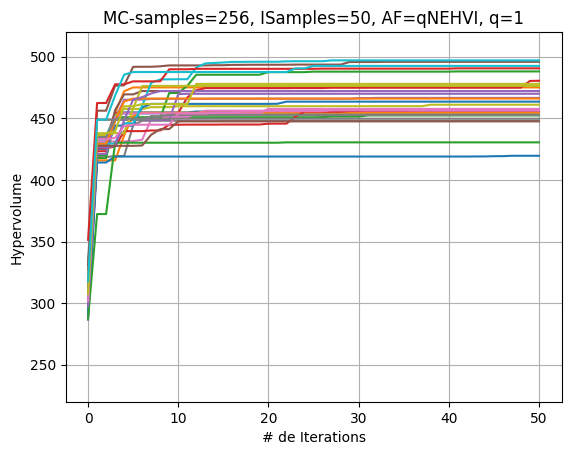

In [54]:
iters = np.arange(51)

for i in range(30):

    plt.errorbar(iters, np.asarray(hvsf27yexp5[i]), linewidth=1.5,label='%i' %i)
    plt.xlabel('# de Iterations')
    plt.ylabel('Hypervolume')
    plt.title('MC-samples=256, ISamples=50, AF=qNEHVI, q=1')
plt.grid()
plt.ylim([220,520])
plt.savefig('Exp5-27July')

In [55]:
%store BDs27yexp5
%store hvsf27yexp5
%store trainxall27yexp5
%store trainobjall27yexp5
%store numbd27yexp5

Stored 'BDs27yexp5' (list)
Stored 'hvsf27yexp5' (list)
Stored 'trainxall27yexp5' (list)
Stored 'trainobjall27yexp5' (list)
Stored 'numbd27yexp5' (list)


In [60]:
BDs27yexp6=[]
hvsf27yexp6=[]
trainxall27yexp6=[]
trainobjall27yexp6=[]
numbd27yexp6=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=60)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp6.append(bd.pareto_Y)      
    hvsf27yexp6.append(hvs_ehvi)   
    trainxall27yexp6.append(train_x_ehvi)
    trainobjall27yexp6.append(train_obj_ehvi)
    numbd27yexp6.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]

Seed: 28

Batch  1: Hypervolume (qNEHVI) = 439.4822 #Paprox=11 time = 15.48 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 439.4822 #Paprox=11 time = 14.81 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 439.4822 #Paprox=11 time = 15.09 Lysine= 1.2406 Energy= 14.0010 Costs= 181.5169)
Batch  4: Hypervolume (qNEHVI) = 439.5186 #Paprox=12 time = 14.70 Lysine= 0.9501 Energy= 14.3982 Costs= 151.7483)
Batch  5: Hypervolume (qNEHVI) = 439.5186 #Paprox=13 time = 15.41 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)
Batch  6: Hypervolume (qNEHVI) = 439.5186 #Paprox=14 time = 16.59 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 439.5186 #Paprox=15 time = 16.57 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 439.5186 #Paprox=16 time = 15.91 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 439.5186 #Paprox=17 time = 15.05 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 439.5186 #Paprox=18 time = 15.56 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 439.5186 #Paprox=19 time = 15.15 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 439.5186 #Paprox=20 time = 16.36 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 439.5186 #Paprox=21 time = 15.27 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1941)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 439.5186 #Paprox=22 time = 14.65 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 439.5186 #Paprox=23 time = 14.95 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 439.5186 #Paprox=24 time = 15.52 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 439.5448 #Paprox=25 time = 14.85 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 439.5448 #Paprox=26 time = 15.16 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 439.5448 #Paprox=27 time = 15.03 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 439.5448 #Paprox=28 time = 15.02 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 439.5448 #Paprox=29 time = 15.21 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 439.5448 #Paprox=30 time = 14.96 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 439.5448 #Paprox=31 time = 15.12 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 439.5448 #Paprox=32 time = 15.40 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 439.5448 #Paprox=33 time = 15.43 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 439.5448 #Paprox=34 time = 15.37 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 439.5448 #Paprox=35 time = 15.71 Lysine= 0.9501 Energy= 14.3681 Costs= 151.9780)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 439.5448 #Paprox=36 time = 15.50 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 439.5448 #Paprox=37 time = 15.80 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 439.5448 #Paprox=38 time = 15.62 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 439.5448 #Paprox=38 time = 16.02 Lysine= 0.9501 Energy= 14.3681 Costs= 151.9780)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 439.5448 #Paprox=38 time = 15.72 Lysine= 0.9501 Energy= 14.3681 Costs= 151.9780)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 439.5448 #Paprox=39 time = 15.82 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 439.5448 #Paprox=40 time = 16.10 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 439.5448 #Paprox=40 time = 15.97 Lysine= 0.9501 Energy= 14.3681 Costs= 151.9780)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 439.5448 #Paprox=41 time = 15.88 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 439.5448 #Paprox=41 time = 16.28 Lysine= 0.9501 Energy= 14.3681 Costs= 151.9780)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 439.5448 #Paprox=42 time = 16.10 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 439.5448 #Paprox=43 time = 16.43 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 439.5448 #Paprox=44 time = 16.53 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 439.5448 #Paprox=45 time = 16.23 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 439.8796 #Paprox=46 time = 16.37 Lysine= 0.9501 Energy= 14.4518 Costs= 152.9881)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 439.8796 #Paprox=47 time = 16.43 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 439.8796 #Paprox=48 time = 16.65 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 439.8796 #Paprox=49 time = 16.40 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 439.8796 #Paprox=50 time = 16.59 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 439.8796 #Paprox=51 time = 16.85 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 439.8796 #Paprox=52 time = 16.54 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 439.8796 #Paprox=53 time = 16.41 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▎                                       | 1/30 [13:08<6:21:01, 788.34s/it]


Batch 50: Hypervolume (qNEHVI) = 439.8796 #Paprox=54 time = 16.86 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)Seed: 749


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 428.3802 #Paprox=18 time = 13.54 Lysine= 0.9501 Energy= 14.4266 Costs= 146.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 428.3802 #Paprox=18 time = 13.92 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 445.5954 #Paprox=19 time = 13.99 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 447.8197 #Paprox=19 time = 13.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 447.8197 #Paprox=20 time = 11.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 447.8197 #Paprox=21 time = 11.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 447.8197 #Paprox=22 time = 12.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 447.8197 #Paprox=23 time = 12.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 447.8197 #Paprox=24 time = 13.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 447.8197 #Paprox=25 time = 13.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 447.8197 #Paprox=26 time = 13.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 447.8197 #Paprox=27 time = 13.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 447.8197 #Paprox=28 time = 13.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 447.8197 #Paprox=29 time = 13.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 447.8197 #Paprox=30 time = 14.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 447.8197 #Paprox=31 time = 13.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 447.8197 #Paprox=31 time = 14.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 447.8197 #Paprox=31 time = 14.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 447.8197 #Paprox=32 time = 14.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 447.8197 #Paprox=33 time = 14.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 447.8197 #Paprox=34 time = 14.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 447.8197 #Paprox=35 time = 14.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 447.8197 #Paprox=35 time = 14.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 447.8197 #Paprox=36 time = 14.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 447.8197 #Paprox=37 time = 14.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 447.8197 #Paprox=38 time = 14.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 447.8197 #Paprox=38 time = 14.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 447.8197 #Paprox=39 time = 14.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 447.8197 #Paprox=40 time = 14.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 447.8197 #Paprox=41 time = 14.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 447.8197 #Paprox=42 time = 14.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 447.9119 #Paprox=43 time = 14.69 Lysine= 1.1288 Energy= 14.4833 Costs= 151.9215)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 14.64 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.66 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.31 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.71 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.76 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.72 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.50 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.60 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.73 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.81 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.82 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.93 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.39 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.85 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.68 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.71 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.91 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▋                                      | 2/30 [25:13<5:50:41, 751.47s/it]


Batch 50: Hypervolume (qNEHVI) = 451.0987 #Paprox=44 time = 15.73 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)Seed: 768

Batch  1: Hypervolume (qNEHVI) = 429.3600 #Paprox=20 time = 13.97 Lysine= 0.9501 Energy= 14.3947 Costs= 145.7107)
Batch  2: Hypervolume (qNEHVI) = 429.3600 #Paprox=20 time = 14.41 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 429.3600 #Paprox=20 time = 14.76 Lysine= 1.2342 Energy= 14.0010 Costs= 156.8458)
Batch  4: Hypervolume (qNEHVI) = 429.3600 #Paprox=20 time = 14.54 Lysine= 1.2618 Energy= 14.0010 Costs= 169.5606)
Batch  5: Hypervolume (qNEHVI) = 430.0688 #Paprox=21 time = 14.17 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  6: Hypervolume (qNEHVI) = 431.2260 #Paprox=22 time = 14.62 Lysine= 0.9501 Energy= 14.4465 Costs= 146.4963)
Batch  7: Hypervolume (qNEHVI) = 431.7819 #Paprox=23 time = 14.60 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  8: Hypervolume (qNEHVI) = 431.7819 #Paprox=24 time = 14.77 Lysine= 0.9

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 431.7819 #Paprox=25 time = 15.09 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 431.7819 #Paprox=26 time = 15.04 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 431.7819 #Paprox=27 time = 15.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 431.7819 #Paprox=28 time = 15.06 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 431.7819 #Paprox=29 time = 15.10 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 431.7819 #Paprox=30 time = 15.04 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 431.7819 #Paprox=31 time = 15.28 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 450.6585 #Paprox=32 time = 15.95 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 450.6585 #Paprox=33 time = 15.93 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 450.6585 #Paprox=34 time = 15.71 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 450.6585 #Paprox=35 time = 16.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 450.6585 #Paprox=36 time = 15.93 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 450.6585 #Paprox=37 time = 15.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 450.6585 #Paprox=38 time = 15.96 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 450.6585 #Paprox=39 time = 16.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 450.6585 #Paprox=40 time = 16.09 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 450.6585 #Paprox=41 time = 16.00 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 450.6585 #Paprox=42 time = 16.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 450.6585 #Paprox=43 time = 16.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 450.6585 #Paprox=44 time = 16.23 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 450.6585 #Paprox=45 time = 16.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 450.6585 #Paprox=46 time = 16.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 450.6585 #Paprox=47 time = 16.19 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 450.6585 #Paprox=48 time = 16.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 450.6585 #Paprox=49 time = 16.10 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 450.6585 #Paprox=50 time = 16.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 450.6585 #Paprox=51 time = 16.70 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 450.6585 #Paprox=52 time = 16.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 450.6585 #Paprox=53 time = 17.04 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 450.6585 #Paprox=54 time = 16.69 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 450.6585 #Paprox=54 time = 17.12 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 450.6585 #Paprox=55 time = 17.00 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 450.6585 #Paprox=56 time = 17.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 450.6585 #Paprox=57 time = 17.36 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 450.6585 #Paprox=58 time = 17.03 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 450.6585 #Paprox=59 time = 17.60 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 450.6585 #Paprox=60 time = 17.74 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 450.6585 #Paprox=61 time = 17.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 450.6585 #Paprox=62 time = 17.19 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 450.6585 #Paprox=63 time = 17.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 450.6585 #Paprox=64 time = 17.73 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|████                                     | 3/30 [38:38<5:49:07, 775.83s/it]


Batch 50: Hypervolume (qNEHVI) = 450.6585 #Paprox=65 time = 17.56 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)Seed: 583


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 430.7491 #Paprox=23 time = 14.11 Lysine= 0.9501 Energy= 14.3920 Costs= 145.6695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 430.7491 #Paprox=23 time = 14.06 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 455.0358 #Paprox=24 time = 14.00 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 470.2639 #Paprox=25 time = 14.35 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 470.2639 #Paprox=26 time = 14.35 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 470.2639 #Paprox=26 time = 14.47 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 470.2639 #Paprox=27 time = 14.65 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 470.2639 #Paprox=28 time = 14.82 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 470.2639 #Paprox=29 time = 14.92 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 470.2639 #Paprox=29 time = 15.05 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 472.8060 #Paprox=25 time = 15.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 472.8060 #Paprox=26 time = 13.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 472.8060 #Paprox=27 time = 13.64 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 472.8060 #Paprox=28 time = 14.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 472.8060 #Paprox=29 time = 14.15 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 472.8060 #Paprox=30 time = 14.13 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 472.8060 #Paprox=31 time = 14.13 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 472.8060 #Paprox=31 time = 14.36 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 472.8060 #Paprox=32 time = 14.27 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 472.8060 #Paprox=33 time = 14.56 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 472.8060 #Paprox=34 time = 14.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 472.8060 #Paprox=34 time = 14.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 472.8060 #Paprox=35 time = 15.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 472.8060 #Paprox=36 time = 15.23 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.8060 #Paprox=37 time = 15.11 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 472.8060 #Paprox=38 time = 15.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 472.8060 #Paprox=39 time = 15.58 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 472.8060 #Paprox=40 time = 15.19 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 472.8060 #Paprox=41 time = 15.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 472.8060 #Paprox=42 time = 15.88 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 472.8060 #Paprox=43 time = 15.67 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 472.8060 #Paprox=44 time = 15.72 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 472.8060 #Paprox=45 time = 15.49 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 472.8060 #Paprox=46 time = 16.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 472.8060 #Paprox=47 time = 15.76 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 472.8060 #Paprox=48 time = 16.09 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 472.8060 #Paprox=49 time = 16.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 472.8060 #Paprox=50 time = 15.96 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 472.8060 #Paprox=51 time = 16.00 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 472.8060 #Paprox=52 time = 16.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 472.8060 #Paprox=53 time = 16.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 472.8060 #Paprox=54 time = 16.04 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 472.8060 #Paprox=55 time = 16.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 472.8060 #Paprox=56 time = 16.41 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 472.8060 #Paprox=57 time = 17.38 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 472.8060 #Paprox=58 time = 16.47 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 472.8060 #Paprox=59 time = 17.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 472.8060 #Paprox=59 time = 16.68 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 472.8060 #Paprox=59 time = 16.57 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|█████▍                                   | 4/30 [51:25<5:34:38, 772.25s/it]


Batch 50: Hypervolume (qNEHVI) = 472.8060 #Paprox=60 time = 17.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 651

Batch  1: Hypervolume (qNEHVI) = 419.6211 #Paprox=22 time = 12.69 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 419.6211 #Paprox=22 time = 13.02 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 419.6211 #Paprox=23 time = 13.12 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 450.6762 #Paprox=24 time = 13.14 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 450.6762 #Paprox=25 time = 13.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 450.6762 #Paprox=26 time = 13.54 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 450.6762 #Paprox=27 time = 13.64 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 450.6762 #Paprox=28 time = 13.63 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 450.6762 #Paprox=29 time = 13.87 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 450.6762 #Paprox=30 time = 13.98 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 450.6762 #Paprox=31 time = 14.12 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 450.6762 #Paprox=32 time = 14.15 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 450.6762 #Paprox=33 time = 14.00 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 450.6762 #Paprox=34 time = 14.13 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 450.6762 #Paprox=35 time = 14.14 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 450.6762 #Paprox=36 time = 14.53 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 450.6762 #Paprox=37 time = 14.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 450.6762 #Paprox=38 time = 14.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 450.6762 #Paprox=39 time = 14.82 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 450.6762 #Paprox=39 time = 14.55 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 450.6762 #Paprox=40 time = 14.55 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 450.6762 #Paprox=41 time = 14.66 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 450.6762 #Paprox=42 time = 14.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 450.6762 #Paprox=43 time = 14.60 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 450.6762 #Paprox=44 time = 15.03 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 450.6762 #Paprox=44 time = 14.70 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 450.6763 #Paprox=45 time = 14.97 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 450.6763 #Paprox=46 time = 15.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 450.6763 #Paprox=47 time = 15.13 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 450.6763 #Paprox=48 time = 15.23 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 450.7745 #Paprox=49 time = 15.42 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 450.7745 #Paprox=49 time = 15.27 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 450.7745 #Paprox=50 time = 15.30 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 450.7745 #Paprox=51 time = 15.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 450.7745 #Paprox=52 time = 15.44 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 450.7745 #Paprox=53 time = 15.42 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 450.7745 #Paprox=54 time = 15.41 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 450.7745 #Paprox=55 time = 15.53 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 450.7745 #Paprox=56 time = 15.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 450.7745 #Paprox=57 time = 15.59 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 450.7745 #Paprox=58 time = 15.95 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 450.7745 #Paprox=59 time = 15.86 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 450.7745 #Paprox=60 time = 15.80 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 450.7745 #Paprox=61 time = 15.98 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 450.7745 #Paprox=62 time = 16.06 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 450.7745 #Paprox=63 time = 16.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 450.7745 #Paprox=64 time = 16.21 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 450.7745 #Paprox=65 time = 16.05 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 450.7745 #Paprox=66 time = 16.14 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▌                                | 5/30 [1:03:46<5:17:06, 761.06s/it]


Batch 50: Hypervolume (qNEHVI) = 450.7745 #Paprox=67 time = 16.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)Seed: 897

Batch  1: Hypervolume (qNEHVI) = 431.4337 #Paprox=22 time = 14.10 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 431.4337 #Paprox=22 time = 13.93 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 431.5337 #Paprox=23 time = 14.22 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  4: Hypervolume (qNEHVI) = 431.5337 #Paprox=24 time = 14.37 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 451.6953 #Paprox=25 time = 14.64 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 467.1703 #Paprox=26 time = 14.71 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 467.2229 #Paprox=27 time = 14.73 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 467.2243 #Paprox=28 time = 14.93 Lysine= 1.1880 Energy= 14.0317 Costs= 151.0386)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 467.6600 #Paprox=29 time = 15.32 Lysine= 1.2131 Energy= 14.0010 Costs= 154.4559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 467.6600 #Paprox=29 time = 15.54 Lysine= 1.2119 Energy= 14.0010 Costs= 156.6512)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 468.3927 #Paprox=30 time = 15.28 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 469.7276 #Paprox=31 time = 15.92 Lysine= 1.5167 Energy= 14.0010 Costs= 168.3031)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 469.9548 #Paprox=32 time = 16.43 Lysine= 1.5293 Energy= 14.0010 Costs= 168.7141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 16.85 Lysine= 1.5340 Energy= 14.0010 Costs= 164.8289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 16.55 Lysine= 1.0276 Energy= 14.0010 Costs= 157.7531)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 16.55 Lysine= 1.0679 Energy= 14.0010 Costs= 158.6821)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 16.67 Lysine= 1.0324 Energy= 14.0010 Costs= 157.7902)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 16.42 Lysine= 1.0126 Energy= 14.0010 Costs= 157.5392)
Batch 19: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 16.73 Lysine= 1.1286 Energy= 14.0010 Costs= 159.5856)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 16.34 Lysine= 0.9989 Energy= 14.0010 Costs= 157.5114)
Batch 21: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 17.45 Lysine= 1.0148 Energy= 14.0010 Costs= 153.3242)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 17.37 Lysine= 1.2331 Energy= 14.0010 Costs= 161.6015)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 17.11 Lysine= 1.4045 Energy= 14.0010 Costs= 159.3537)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 17.28 Lysine= 1.1828 Energy= 14.0010 Costs= 161.6119)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 17.60 Lysine= 1.4227 Energy= 14.0010 Costs= 165.4424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 17.35 Lysine= 1.4590 Energy= 14.0010 Costs= 167.9565)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 17.46 Lysine= 1.4332 Energy= 14.0010 Costs= 164.7243)
Batch 28: Hypervolume (qNEHVI) = 473.7112 #Paprox=31 time = 17.10 Lysine= 1.4200 Energy= 14.0010 Costs= 164.9831)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 473.9283 #Paprox=32 time = 17.01 Lysine= 1.4330 Energy= 14.0010 Costs= 160.0479)
Batch 30: Hypervolume (qNEHVI) = 474.0467 #Paprox=33 time = 17.08 Lysine= 1.2990 Energy= 14.0010 Costs= 156.8751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 474.0467 #Paprox=33 time = 16.88 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 474.0586 #Paprox=34 time = 17.38 Lysine= 1.4101 Energy= 14.0010 Costs= 159.6061)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 474.0591 #Paprox=35 time = 17.31 Lysine= 1.4087 Energy= 14.0010 Costs= 159.5463)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 474.0591 #Paprox=35 time = 17.26 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 474.0591 #Paprox=36 time = 17.59 Lysine= 1.4310 Energy= 14.0010 Costs= 160.5195)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 474.0591 #Paprox=36 time = 17.71 Lysine= 1.4069 Energy= 14.0010 Costs= 159.4652)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 474.0591 #Paprox=36 time = 17.43 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 474.0591 #Paprox=36 time = 17.86 Lysine= 1.4234 Energy= 14.0010 Costs= 160.1871)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 474.0591 #Paprox=37 time = 18.35 Lysine= 1.4321 Energy= 14.0010 Costs= 160.5705)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 474.0682 #Paprox=38 time = 18.07 Lysine= 1.4184 Energy= 14.0010 Costs= 159.9696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 474.0779 #Paprox=39 time = 18.85 Lysine= 1.4155 Energy= 14.0010 Costs= 159.8402)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 474.0779 #Paprox=39 time = 18.05 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 474.0779 #Paprox=39 time = 18.42 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 474.0779 #Paprox=39 time = 18.27 Lysine= 1.4287 Energy= 14.0010 Costs= 160.4207)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 474.0779 #Paprox=39 time = 18.60 Lysine= 1.4055 Energy= 14.0010 Costs= 159.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 474.0779 #Paprox=39 time = 19.01 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 474.0779 #Paprox=39 time = 19.01 Lysine= 1.4232 Energy= 14.0010 Costs= 160.1774)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 474.0779 #Paprox=39 time = 19.73 Lysine= 1.4055 Energy= 14.0010 Costs= 159.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 474.0889 #Paprox=40 time = 18.59 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|███████▊                               | 6/30 [1:17:54<5:16:12, 790.54s/it]


Batch 50: Hypervolume (qNEHVI) = 474.0889 #Paprox=41 time = 19.25 Lysine= 1.4283 Energy= 14.0010 Costs= 160.4032)Seed: 7

Batch  1: Hypervolume (qNEHVI) = 442.8383 #Paprox=20 time = 14.17 Lysine= 0.9501 Energy= 14.4074 Costs= 145.8615)
Batch  2: Hypervolume (qNEHVI) = 442.8383 #Paprox=20 time = 13.86 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 445.6093 #Paprox=21 time = 14.50 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  4: Hypervolume (qNEHVI) = 446.5873 #Paprox=22 time = 14.95 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 466.1321 #Paprox=23 time = 14.61 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)
Batch  6: Hypervolume (qNEHVI) = 466.1321 #Paprox=24 time = 14.13 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)
Batch  7: Hypervolume (qNEHVI) = 470.2062 #Paprox=25 time = 14.41 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)
Batch  8: Hypervolume (qNEHVI) = 470.2062 #Paprox=26 time = 14.32 Lysine= 1.157

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 470.2062 #Paprox=27 time = 14.65 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 470.3163 #Paprox=28 time = 14.64 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 470.3163 #Paprox=29 time = 14.57 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 470.3163 #Paprox=30 time = 14.95 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 470.3163 #Paprox=30 time = 15.25 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 470.3163 #Paprox=31 time = 15.15 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 470.3163 #Paprox=32 time = 14.97 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 470.3163 #Paprox=33 time = 15.71 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 470.3163 #Paprox=34 time = 15.48 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 470.3163 #Paprox=35 time = 15.56 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 470.3163 #Paprox=36 time = 15.53 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 470.3163 #Paprox=36 time = 16.02 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 470.3163 #Paprox=37 time = 15.57 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 470.3163 #Paprox=38 time = 15.90 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 470.3163 #Paprox=39 time = 15.97 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 470.3163 #Paprox=40 time = 16.09 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 470.3163 #Paprox=41 time = 15.93 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 470.3163 #Paprox=42 time = 15.93 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 470.3163 #Paprox=43 time = 16.19 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 470.3163 #Paprox=44 time = 15.97 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 470.3163 #Paprox=45 time = 15.98 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 470.3163 #Paprox=46 time = 16.31 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 470.3163 #Paprox=47 time = 16.21 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 470.3163 #Paprox=48 time = 16.76 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 470.3163 #Paprox=49 time = 16.81 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 470.3163 #Paprox=50 time = 16.42 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 470.3163 #Paprox=51 time = 17.74 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 470.3163 #Paprox=52 time = 17.94 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 470.3163 #Paprox=53 time = 17.45 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 470.3163 #Paprox=54 time = 17.13 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 470.3163 #Paprox=54 time = 18.03 Lysine= 1.2056 Energy= 14.0010 Costs= 178.2149)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 470.3163 #Paprox=54 time = 19.71 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 470.3163 #Paprox=55 time = 17.16 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 470.3163 #Paprox=55 time = 17.77 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 470.3163 #Paprox=56 time = 17.70 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 470.3163 #Paprox=57 time = 17.20 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 470.3163 #Paprox=57 time = 17.19 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 470.3163 #Paprox=57 time = 17.87 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 470.3163 #Paprox=58 time = 17.33 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 470.3163 #Paprox=59 time = 17.41 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 470.3163 #Paprox=59 time = 17.87 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 23%|█████████                              | 7/30 [1:31:22<5:05:11, 796.14s/it]


Batch 50: Hypervolume (qNEHVI) = 470.3163 #Paprox=59 time = 17.81 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)Seed: 131

Batch  1: Hypervolume (qNEHVI) = 422.2827 #Paprox=13 time = 13.42 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 422.2827 #Paprox=13 time = 13.57 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)
Batch  3: Hypervolume (qNEHVI) = 446.4287 #Paprox=14 time = 13.75 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)
Batch  4: Hypervolume (qNEHVI) = 446.7954 #Paprox=15 time = 13.99 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)
Batch  5: Hypervolume (qNEHVI) = 446.7954 #Paprox=15 time = 14.31 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)
Batch  6: Hypervolume (qNEHVI) = 457.0373 #Paprox=16 time = 13.94 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)
Batch  7: Hypervolume (qNEHVI) = 457.0373 #Paprox=17 time = 14.49 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 457.0373 #Paprox=18 time = 14.51 Lysine= 1.0251 Energy= 14.0010 Costs= 151.1253)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 457.0373 #Paprox=19 time = 14.41 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 457.0373 #Paprox=20 time = 14.72 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 457.1377 #Paprox=21 time = 14.70 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 457.1927 #Paprox=22 time = 14.78 Lysine= 1.0793 Energy= 14.0010 Costs= 153.6143)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 457.1927 #Paprox=22 time = 14.93 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 457.1927 #Paprox=22 time = 15.25 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 457.1927 #Paprox=23 time = 14.75 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 457.1927 #Paprox=24 time = 14.69 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 457.1927 #Paprox=25 time = 14.94 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 457.1927 #Paprox=25 time = 15.26 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 457.1927 #Paprox=25 time = 15.53 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 457.1927 #Paprox=26 time = 15.40 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 457.1927 #Paprox=27 time = 15.53 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 457.1927 #Paprox=28 time = 15.14 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 457.1927 #Paprox=29 time = 15.39 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 457.1927 #Paprox=30 time = 15.64 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 457.1927 #Paprox=31 time = 15.47 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 457.1927 #Paprox=32 time = 15.64 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 457.1927 #Paprox=33 time = 15.64 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 457.1927 #Paprox=34 time = 15.67 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 457.1927 #Paprox=34 time = 15.82 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 457.1927 #Paprox=35 time = 15.74 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 457.1927 #Paprox=36 time = 15.80 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 457.1927 #Paprox=37 time = 15.71 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 457.1927 #Paprox=38 time = 16.24 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 457.1927 #Paprox=39 time = 15.84 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 457.1927 #Paprox=39 time = 15.87 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 457.1927 #Paprox=40 time = 16.02 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 457.1927 #Paprox=41 time = 16.21 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 457.1927 #Paprox=41 time = 15.89 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 457.1927 #Paprox=42 time = 15.95 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 457.1927 #Paprox=43 time = 16.10 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 457.1927 #Paprox=44 time = 15.99 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 457.1927 #Paprox=45 time = 16.00 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 457.1927 #Paprox=46 time = 16.13 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 457.1927 #Paprox=47 time = 16.04 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 457.3044 #Paprox=47 time = 16.51 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 457.3044 #Paprox=48 time = 16.32 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 457.3044 #Paprox=49 time = 16.37 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 457.3044 #Paprox=50 time = 16.24 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 457.3044 #Paprox=51 time = 16.37 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 27%|██████████▍                            | 8/30 [1:44:12<4:48:50, 787.75s/it]


Batch 50: Hypervolume (qNEHVI) = 457.3044 #Paprox=52 time = 16.33 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)Seed: 503


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 457.5858 #Paprox=13 time = 11.31 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 457.5858 #Paprox=13 time = 11.55 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 457.5858 #Paprox=14 time = 12.34 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)
Batch  4: Hypervolume (qNEHVI) = 476.4624 #Paprox=15 time = 12.15 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 476.4624 #Paprox=15 time = 11.91 Lysine= 1.1628 Energy= 14.0010 Costs= 172.1881)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 477.1826 #Paprox=16 time = 12.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 477.1826 #Paprox=17 time = 13.03 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 477.1858 #Paprox=18 time = 13.17 Lysine= 0.9501 Energy= 14.4516 Costs= 150.8770)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 477.1858 #Paprox=19 time = 12.67 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 477.1858 #Paprox=20 time = 12.82 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 477.1858 #Paprox=21 time = 12.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 477.1858 #Paprox=22 time = 13.14 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 477.1858 #Paprox=23 time = 13.25 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 477.1858 #Paprox=24 time = 13.11 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 477.1858 #Paprox=25 time = 13.24 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 477.1858 #Paprox=26 time = 13.39 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 477.1858 #Paprox=27 time = 13.24 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 477.1858 #Paprox=27 time = 13.28 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 477.1858 #Paprox=28 time = 13.31 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 477.1858 #Paprox=29 time = 13.35 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 477.1858 #Paprox=29 time = 13.35 Lysine= 0.9501 Energy= 14.4188 Costs= 151.4807)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 477.1858 #Paprox=30 time = 13.93 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 477.1858 #Paprox=31 time = 13.34 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 477.1858 #Paprox=32 time = 13.81 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 477.1858 #Paprox=32 time = 13.92 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 477.1858 #Paprox=33 time = 14.10 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 477.1858 #Paprox=34 time = 13.69 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 477.1858 #Paprox=35 time = 13.94 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 477.1858 #Paprox=35 time = 14.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 477.1858 #Paprox=36 time = 13.95 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 477.1858 #Paprox=37 time = 13.62 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 477.1858 #Paprox=38 time = 14.18 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 477.1858 #Paprox=39 time = 14.12 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 477.1858 #Paprox=38 time = 13.93 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 477.1858 #Paprox=39 time = 14.71 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 477.1858 #Paprox=40 time = 14.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 477.1859 #Paprox=41 time = 14.26 Lysine= 0.9501 Energy= 14.4534 Costs= 150.8881)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 477.1859 #Paprox=42 time = 14.36 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 477.1859 #Paprox=42 time = 14.27 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 477.1859 #Paprox=43 time = 14.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 477.1887 #Paprox=44 time = 14.49 Lysine= 0.9501 Energy= 14.4419 Costs= 150.8182)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 477.1887 #Paprox=45 time = 14.63 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 477.1887 #Paprox=46 time = 14.58 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 477.1887 #Paprox=46 time = 14.73 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 477.1887 #Paprox=47 time = 14.74 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 477.1887 #Paprox=48 time = 14.63 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 477.1887 #Paprox=49 time = 14.74 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 477.1887 #Paprox=50 time = 14.62 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 477.1887 #Paprox=51 time = 14.63 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 30%|███████████▋                           | 9/30 [1:55:35<4:24:19, 755.19s/it]


Batch 50: Hypervolume (qNEHVI) = 477.1887 #Paprox=52 time = 14.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 20


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 433.1477 #Paprox=16 time = 14.35 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 433.1477 #Paprox=16 time = 13.65 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 433.1477 #Paprox=16 time = 14.09 Lysine= 1.2406 Energy= 14.0010 Costs= 181.5169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 433.1477 #Paprox=17 time = 13.75 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)
Batch  5: Hypervolume (qNEHVI) = 433.1477 #Paprox=18 time = 13.70 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 433.1477 #Paprox=18 time = 13.93 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 433.1477 #Paprox=19 time = 14.08 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 433.1477 #Paprox=20 time = 14.13 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 433.1477 #Paprox=20 time = 14.21 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 433.1477 #Paprox=21 time = 14.46 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 433.1477 #Paprox=22 time = 14.13 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 433.1477 #Paprox=23 time = 14.42 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 433.1477 #Paprox=24 time = 14.29 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 433.1477 #Paprox=24 time = 14.61 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 433.1477 #Paprox=24 time = 14.40 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 433.1477 #Paprox=24 time = 14.52 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 433.1477 #Paprox=25 time = 14.80 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 433.1477 #Paprox=26 time = 14.54 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 433.1477 #Paprox=26 time = 14.64 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 433.1477 #Paprox=27 time = 14.50 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 433.1477 #Paprox=27 time = 14.89 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 433.1477 #Paprox=28 time = 14.84 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 433.1477 #Paprox=28 time = 15.17 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 433.1477 #Paprox=29 time = 15.01 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 433.1477 #Paprox=30 time = 14.99 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 433.1477 #Paprox=31 time = 15.11 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 433.1477 #Paprox=31 time = 15.32 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 433.1477 #Paprox=32 time = 15.06 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 433.1477 #Paprox=33 time = 14.84 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 433.1477 #Paprox=34 time = 15.38 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 433.1477 #Paprox=34 time = 15.30 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 433.1477 #Paprox=34 time = 15.06 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 433.1477 #Paprox=35 time = 15.24 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 433.1477 #Paprox=36 time = 15.42 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 433.1985 #Paprox=37 time = 15.48 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 433.1985 #Paprox=38 time = 15.48 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 433.1985 #Paprox=38 time = 15.06 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 433.1985 #Paprox=38 time = 15.15 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 433.1985 #Paprox=39 time = 15.39 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 433.1985 #Paprox=39 time = 15.78 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 433.1985 #Paprox=40 time = 15.64 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 433.1985 #Paprox=40 time = 15.91 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 433.1985 #Paprox=40 time = 15.75 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 433.1985 #Paprox=40 time = 15.69 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 433.1985 #Paprox=40 time = 15.68 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 433.1985 #Paprox=40 time = 15.73 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 433.1985 #Paprox=40 time = 16.02 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 433.1985 #Paprox=40 time = 15.91 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 433.1985 #Paprox=40 time = 16.53 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|████████████▋                         | 10/30 [2:08:04<4:11:04, 753.24s/it]


Batch 50: Hypervolume (qNEHVI) = 433.1985 #Paprox=40 time = 15.98 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)Seed: 234

Batch  1: Hypervolume (qNEHVI) = 343.6829 #Paprox=12 time = 12.68 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  2: Hypervolume (qNEHVI) = 445.5955 #Paprox=13 time = 13.08 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  3: Hypervolume (qNEHVI) = 445.5955 #Paprox=13 time = 13.21 Lysine= 1.1979 Energy= 14.0010 Costs= 175.4901)
Batch  4: Hypervolume (qNEHVI) = 445.9689 #Paprox=14 time = 13.43 Lysine= 0.9501 Energy= 14.4120 Costs= 151.0434)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 445.9747 #Paprox=15 time = 13.52 Lysine= 0.9501 Energy= 14.4123 Costs= 151.8586)
Batch  6: Hypervolume (qNEHVI) = 446.0264 #Paprox=14 time = 14.54 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 446.0264 #Paprox=15 time = 13.75 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 446.2965 #Paprox=16 time = 14.59 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 446.2965 #Paprox=17 time = 14.48 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 446.2965 #Paprox=18 time = 14.04 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 446.2965 #Paprox=19 time = 14.41 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 446.2965 #Paprox=19 time = 13.97 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 446.2965 #Paprox=20 time = 14.19 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 446.2965 #Paprox=21 time = 14.45 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 446.2965 #Paprox=22 time = 14.86 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 446.8715 #Paprox=23 time = 15.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 446.8715 #Paprox=24 time = 14.74 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 446.8715 #Paprox=25 time = 15.10 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 446.8725 #Paprox=26 time = 14.94 Lysine= 0.9501 Energy= 14.4172 Costs= 150.3741)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 446.8725 #Paprox=27 time = 15.04 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 446.8725 #Paprox=28 time = 15.50 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 446.8725 #Paprox=29 time = 15.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 446.8725 #Paprox=30 time = 15.28 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 446.8725 #Paprox=31 time = 16.01 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 446.8725 #Paprox=32 time = 15.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 446.8725 #Paprox=33 time = 15.81 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 446.8725 #Paprox=34 time = 16.11 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 446.8725 #Paprox=35 time = 15.94 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 446.8725 #Paprox=35 time = 15.99 Lysine= 0.9501 Energy= 14.3718 Costs= 150.2969)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 446.8725 #Paprox=36 time = 15.94 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 446.8725 #Paprox=37 time = 16.18 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 446.8729 #Paprox=38 time = 16.44 Lysine= 0.9501 Energy= 14.4583 Costs= 150.9177)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 446.8739 #Paprox=39 time = 16.21 Lysine= 0.9501 Energy= 14.4242 Costs= 150.5909)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 446.8739 #Paprox=40 time = 16.34 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 446.8739 #Paprox=40 time = 16.03 Lysine= 0.9501 Energy= 14.3892 Costs= 151.2197)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 446.8739 #Paprox=41 time = 16.38 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 446.8739 #Paprox=42 time = 16.41 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 446.8739 #Paprox=43 time = 16.41 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 446.8739 #Paprox=44 time = 16.72 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 446.8750 #Paprox=45 time = 17.00 Lysine= 0.9501 Energy= 14.4380 Costs= 150.7948)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 446.8750 #Paprox=46 time = 16.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 446.8750 #Paprox=46 time = 16.77 Lysine= 0.9501 Energy= 14.4377 Costs= 151.4227)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 446.8750 #Paprox=47 time = 16.90 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 446.8750 #Paprox=47 time = 17.22 Lysine= 0.9501 Energy= 14.4606 Costs= 151.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 446.8750 #Paprox=48 time = 17.31 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 446.8750 #Paprox=49 time = 17.39 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 447.0818 #Paprox=50 time = 17.50 Lysine= 0.9501 Energy= 14.4722 Costs= 150.9957)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 447.0818 #Paprox=51 time = 17.03 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 447.0818 #Paprox=51 time = 17.56 Lysine= 0.9501 Energy= 14.4520 Costs= 150.9643)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 37%|█████████████▉                        | 11/30 [2:21:02<4:00:57, 760.94s/it]


Batch 50: Hypervolume (qNEHVI) = 447.4542 #Paprox=52 time = 17.34 Lysine= 0.9501 Energy= 14.4933 Costs= 151.4213)Seed: 392

Batch  1: Hypervolume (qNEHVI) = 435.3661 #Paprox=21 time = 13.70 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 435.3661 #Paprox=21 time = 14.02 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 435.3661 #Paprox=21 time = 14.35 Lysine= 1.2618 Energy= 14.0010 Costs= 169.5606)
Batch  4: Hypervolume (qNEHVI) = 436.3233 #Paprox=22 time = 13.97 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 436.6128 #Paprox=23 time = 13.90 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)
Batch  6: Hypervolume (qNEHVI) = 436.6128 #Paprox=24 time = 14.36 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 436.6128 #Paprox=25 time = 14.24 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 456.7745 #Paprox=26 time = 14.71 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 456.7745 #Paprox=27 time = 15.13 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 456.7745 #Paprox=28 time = 14.87 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 456.7745 #Paprox=28 time = 15.09 Lysine= 0.9501 Energy= 14.3977 Costs= 147.8771)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 457.5963 #Paprox=29 time = 15.00 Lysine= 1.1296 Energy= 14.0010 Costs= 154.4986)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 465.7501 #Paprox=30 time = 14.69 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 465.7501 #Paprox=31 time = 14.60 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 465.7820 #Paprox=32 time = 14.96 Lysine= 1.1705 Energy= 14.0010 Costs= 156.2058)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 468.1435 #Paprox=31 time = 14.92 Lysine= 1.1108 Energy= 14.2189 Costs= 150.0105)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 468.1435 #Paprox=31 time = 14.47 Lysine= 1.1486 Energy= 14.0010 Costs= 165.9500)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 477.1660 #Paprox=32 time = 14.44 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 477.1660 #Paprox=33 time = 14.69 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 477.1660 #Paprox=34 time = 15.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 477.1660 #Paprox=34 time = 15.40 Lysine= 0.9501 Energy= 14.3359 Costs= 147.0140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 477.1660 #Paprox=35 time = 15.45 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 477.1660 #Paprox=36 time = 15.64 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 477.1660 #Paprox=37 time = 15.38 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 477.1660 #Paprox=38 time = 15.59 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 477.1660 #Paprox=39 time = 15.72 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 477.1660 #Paprox=39 time = 15.72 Lysine= 0.9501 Energy= 14.3359 Costs= 147.0140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 477.1660 #Paprox=40 time = 16.18 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 477.1660 #Paprox=41 time = 16.33 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.20 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.52 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.54 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.84 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.72 Lysine= 0.9501 Energy= 14.0010 Costs= 148.7200)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 17.04 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.81 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.66 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.89 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.86 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 17.32 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.95 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.85 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.64 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.75 Lysine= 0.9501 Energy= 14.3348 Costs= 151.0668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.61 Lysine= 0.9501 Energy= 14.0010 Costs= 148.7200)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.67 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 17.09 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.76 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 17.31 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 40%|███████████████▏                      | 12/30 [2:34:09<3:50:35, 768.63s/it]


Batch 50: Hypervolume (qNEHVI) = 477.1660 #Paprox=42 time = 16.74 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)Seed: 480

Batch  1: Hypervolume (qNEHVI) = 438.1662 #Paprox=12 time = 11.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 438.1662 #Paprox=12 time = 11.64 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 438.1662 #Paprox=13 time = 12.39 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 438.1662 #Paprox=14 time = 12.41 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 469.2214 #Paprox=15 time = 12.24 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 469.2214 #Paprox=16 time = 12.95 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 469.2214 #Paprox=17 time = 12.97 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 469.2214 #Paprox=18 time = 13.04 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 469.2214 #Paprox=19 time = 13.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 469.2214 #Paprox=20 time = 13.55 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 469.3196 #Paprox=21 time = 13.34 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 469.3196 #Paprox=21 time = 13.61 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 469.3196 #Paprox=21 time = 13.95 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 485.4693 #Paprox=22 time = 13.91 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 485.4693 #Paprox=22 time = 14.08 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 485.4693 #Paprox=23 time = 14.28 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 485.4693 #Paprox=23 time = 14.70 Lysine= 1.2056 Energy= 14.0010 Costs= 178.2149)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 485.4693 #Paprox=23 time = 14.45 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 485.4693 #Paprox=23 time = 14.70 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 485.4693 #Paprox=23 time = 15.55 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 485.4693 #Paprox=23 time = 14.97 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 485.4693 #Paprox=23 time = 15.43 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 485.4693 #Paprox=23 time = 14.87 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 485.4693 #Paprox=23 time = 15.24 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 485.4693 #Paprox=23 time = 15.31 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 485.4693 #Paprox=23 time = 15.46 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 485.4693 #Paprox=24 time = 15.38 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 485.4693 #Paprox=24 time = 15.53 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 485.4693 #Paprox=24 time = 15.79 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 485.4693 #Paprox=24 time = 15.33 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 485.4693 #Paprox=25 time = 15.67 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 485.4693 #Paprox=25 time = 16.46 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 485.4693 #Paprox=25 time = 15.98 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 485.4693 #Paprox=26 time = 15.90 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 485.4693 #Paprox=27 time = 15.80 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 485.4693 #Paprox=27 time = 16.24 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 485.4693 #Paprox=27 time = 15.98 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 485.4693 #Paprox=27 time = 15.88 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 485.4693 #Paprox=27 time = 16.04 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 485.4693 #Paprox=27 time = 16.14 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 485.4693 #Paprox=27 time = 16.15 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 485.4693 #Paprox=27 time = 16.67 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 485.4693 #Paprox=27 time = 16.12 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 485.4693 #Paprox=28 time = 16.27 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 485.4693 #Paprox=28 time = 16.33 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 485.4693 #Paprox=29 time = 16.29 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 485.4693 #Paprox=29 time = 16.46 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 485.4693 #Paprox=29 time = 16.41 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 485.4693 #Paprox=30 time = 16.80 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 43%|████████████████▍                     | 13/30 [2:46:36<3:35:59, 762.30s/it]


Batch 50: Hypervolume (qNEHVI) = 485.4693 #Paprox=30 time = 16.90 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 841

Batch  1: Hypervolume (qNEHVI) = 428.4338 #Paprox=18 time = 13.41 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 428.4338 #Paprox=18 time = 13.42 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 428.4338 #Paprox=18 time = 13.30 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)
Batch  4: Hypervolume (qNEHVI) = 442.9741 #Paprox=19 time = 13.38 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  5: Hypervolume (qNEHVI) = 444.9199 #Paprox=15 time = 13.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 444.9199 #Paprox=16 time = 11.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 444.9199 #Paprox=17 time = 11.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 444.9199 #Paprox=18 time = 12.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 444.9199 #Paprox=19 time = 12.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 444.9199 #Paprox=20 time = 12.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 444.9199 #Paprox=21 time = 12.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 444.9199 #Paprox=22 time = 12.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 444.9199 #Paprox=23 time = 13.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 444.9199 #Paprox=23 time = 13.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 444.9199 #Paprox=23 time = 13.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 444.9199 #Paprox=24 time = 13.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 444.9199 #Paprox=25 time = 13.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 444.9199 #Paprox=26 time = 13.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 444.9199 #Paprox=26 time = 13.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 444.9199 #Paprox=27 time = 13.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 444.9199 #Paprox=28 time = 13.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 444.9199 #Paprox=28 time = 13.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 444.9199 #Paprox=29 time = 13.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 444.9199 #Paprox=30 time = 14.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 444.9199 #Paprox=31 time = 13.87 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 445.0321 #Paprox=32 time = 13.96 Lysine= 1.0911 Energy= 14.2827 Costs= 149.7559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 445.0656 #Paprox=33 time = 14.24 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 14.32 Lysine= 1.0081 Energy= 14.0010 Costs= 148.0473)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 14.03 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 14.57 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 14.36 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 14.77 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 14.79 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 15.27 Lysine= 0.9501 Energy= 14.0010 Costs= 151.3263)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 14.53 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 14.67 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 14.57 Lysine= 1.0554 Energy= 14.0010 Costs= 154.4456)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 14.38 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 14.85 Lysine= 0.9614 Energy= 14.0010 Costs= 152.3781)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 14.81 Lysine= 1.0705 Energy= 14.0010 Costs= 154.9358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 15.78 Lysine= 0.9501 Energy= 14.0010 Costs= 152.3321)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 446.0917 #Paprox=34 time = 14.60 Lysine= 0.9501 Energy= 14.0010 Costs= 151.0628)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 449.4544 #Paprox=35 time = 15.15 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 449.6087 #Paprox=36 time = 14.76 Lysine= 1.2310 Energy= 14.0010 Costs= 151.5886)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 449.6087 #Paprox=37 time = 14.81 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 449.6087 #Paprox=37 time = 15.14 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 449.6087 #Paprox=38 time = 15.60 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 449.6087 #Paprox=39 time = 15.46 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 449.6087 #Paprox=40 time = 15.36 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 47%|█████████████████▋                    | 14/30 [2:58:18<3:18:24, 744.02s/it]


Batch 50: Hypervolume (qNEHVI) = 449.6087 #Paprox=40 time = 16.04 Lysine= 1.3171 Energy= 14.0010 Costs= 157.8989)Seed: 616

Batch  1: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.35 Lysine= 0.9501 Energy= 14.3940 Costs= 145.7006)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.59 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.59 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.89 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.53 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.38 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.51 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.67 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.81 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.70 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.00 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.98 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.89 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.66 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.12 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.90 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.19 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.13 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.08 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.86 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 12.85 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.41 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.26 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.12 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.38 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.35 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.45 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.35 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.27 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.52 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.29 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.35 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.34 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.58 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.78 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.47 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.43 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.61 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.75 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.54 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.87 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.75 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.67 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 14.09 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.92 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 14.16 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 14.08 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.81 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.79 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 50%|███████████████████                   | 15/30 [3:09:22<2:59:57, 719.83s/it]


Batch 50: Hypervolume (qNEHVI) = 438.7068 #Paprox=20 time = 13.89 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)Seed: 464

Batch  1: Hypervolume (qNEHVI) = 425.2114 #Paprox=15 time = 13.55 Lysine= 0.9501 Energy= 14.3960 Costs= 145.7294)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 425.2114 #Paprox=15 time = 13.64 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 425.4614 #Paprox=16 time = 14.03 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 426.8971 #Paprox=17 time = 13.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 426.8971 #Paprox=18 time = 13.91 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 440.9590 #Paprox=16 time = 14.11 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 446.9250 #Paprox=17 time = 11.29 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 448.7440 #Paprox=18 time = 11.87 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 448.7440 #Paprox=19 time = 10.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 448.7440 #Paprox=20 time = 11.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 448.7440 #Paprox=21 time = 11.35 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 448.7440 #Paprox=22 time = 12.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 448.7440 #Paprox=23 time = 11.88 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 448.7462 #Paprox=24 time = 11.68 Lysine= 1.1510 Energy= 14.0061 Costs= 149.3426)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 448.7462 #Paprox=25 time = 11.87 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 448.7462 #Paprox=26 time = 12.06 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 448.7462 #Paprox=26 time = 11.94 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 448.7462 #Paprox=27 time = 12.07 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 448.7462 #Paprox=28 time = 12.35 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 448.7462 #Paprox=29 time = 12.28 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 448.7462 #Paprox=30 time = 12.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 448.7462 #Paprox=31 time = 12.94 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 451.9287 #Paprox=32 time = 12.99 Lysine= 1.0482 Energy= 14.0085 Costs= 146.9953)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 451.9287 #Paprox=32 time = 13.09 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 453.6692 #Paprox=33 time = 13.28 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 453.9766 #Paprox=34 time = 12.34 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 453.9766 #Paprox=35 time = 12.43 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 453.9766 #Paprox=36 time = 12.91 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 453.9766 #Paprox=37 time = 13.43 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 453.9766 #Paprox=38 time = 13.01 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 453.9766 #Paprox=39 time = 13.35 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 453.9766 #Paprox=40 time = 13.27 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 453.9766 #Paprox=41 time = 13.24 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 453.9766 #Paprox=41 time = 13.21 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 453.9766 #Paprox=42 time = 13.04 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 453.9766 #Paprox=43 time = 13.57 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 453.9766 #Paprox=44 time = 13.34 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 453.9766 #Paprox=45 time = 14.00 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 453.9766 #Paprox=45 time = 13.87 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 453.9766 #Paprox=46 time = 13.77 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 453.9766 #Paprox=47 time = 14.11 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 453.9766 #Paprox=48 time = 13.69 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 480.0864 #Paprox=48 time = 13.87 Lysine= 1.6024 Energy= 14.0010 Costs= 159.6385)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 480.0864 #Paprox=49 time = 12.94 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 480.0864 #Paprox=50 time = 13.09 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 480.0864 #Paprox=51 time = 13.04 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 480.0864 #Paprox=52 time = 13.19 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 480.0864 #Paprox=53 time = 13.44 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 480.0864 #Paprox=54 time = 13.46 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 53%|████████████████████▎                 | 16/30 [3:20:08<2:42:48, 697.75s/it]


Batch 50: Hypervolume (qNEHVI) = 480.0864 #Paprox=55 time = 13.16 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 289


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 432.6343 #Paprox=14 time = 12.89 Lysine= 0.9501 Energy= 14.3920 Costs= 145.6946)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 432.6343 #Paprox=14 time = 12.95 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 461.6320 #Paprox=15 time = 13.34 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 461.6320 #Paprox=15 time = 13.44 Lysine= 1.1705 Energy= 14.0010 Costs= 156.2058)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 461.8664 #Paprox=16 time = 13.79 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 461.8664 #Paprox=16 time = 13.47 Lysine= 1.1729 Energy= 14.0010 Costs= 172.3656)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 461.8664 #Paprox=16 time = 14.11 Lysine= 0.9501 Energy= 14.0010 Costs= 144.1503)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 474.7047 #Paprox=17 time = 14.52 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 474.7047 #Paprox=18 time = 14.35 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 474.7047 #Paprox=19 time = 14.36 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 474.7047 #Paprox=20 time = 14.16 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 474.7047 #Paprox=21 time = 14.28 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 474.7047 #Paprox=22 time = 14.32 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 474.7047 #Paprox=23 time = 14.10 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 474.7047 #Paprox=24 time = 14.41 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 474.7047 #Paprox=25 time = 14.70 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 474.7047 #Paprox=26 time = 14.70 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 474.7047 #Paprox=27 time = 14.61 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 474.7047 #Paprox=27 time = 14.31 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 474.7047 #Paprox=28 time = 14.57 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 474.7047 #Paprox=29 time = 14.59 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 474.7047 #Paprox=30 time = 14.71 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 474.7047 #Paprox=31 time = 14.78 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 474.7047 #Paprox=32 time = 14.74 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 474.7047 #Paprox=33 time = 15.01 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 474.7047 #Paprox=34 time = 14.80 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 474.7047 #Paprox=35 time = 14.80 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 474.7047 #Paprox=36 time = 14.97 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 474.7047 #Paprox=37 time = 15.11 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 474.7047 #Paprox=38 time = 14.74 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 474.7047 #Paprox=39 time = 14.88 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 474.7047 #Paprox=40 time = 15.03 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 474.7047 #Paprox=40 time = 14.96 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 474.7047 #Paprox=41 time = 14.92 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 474.7047 #Paprox=42 time = 15.15 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 474.7047 #Paprox=43 time = 15.12 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 474.7047 #Paprox=44 time = 15.33 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 474.7047 #Paprox=44 time = 14.97 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 474.7047 #Paprox=45 time = 15.44 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 474.7047 #Paprox=45 time = 15.35 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 474.7047 #Paprox=46 time = 15.38 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 474.7047 #Paprox=47 time = 15.60 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 474.7047 #Paprox=48 time = 15.48 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 474.7047 #Paprox=49 time = 15.53 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 474.7047 #Paprox=49 time = 15.32 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 474.7047 #Paprox=50 time = 15.30 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 474.7047 #Paprox=51 time = 15.43 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 476.1620 #Paprox=52 time = 15.56 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 476.1620 #Paprox=53 time = 15.94 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 57%|█████████████████████▌                | 17/30 [3:32:25<2:33:43, 709.50s/it]


Batch 50: Hypervolume (qNEHVI) = 476.1620 #Paprox=54 time = 15.63 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)Seed: 991

Batch  1: Hypervolume (qNEHVI) = 434.3746 #Paprox=16 time = 11.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 434.3746 #Paprox=16 time = 11.24 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 434.3746 #Paprox=17 time = 11.88 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 465.4297 #Paprox=18 time = 11.52 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 465.4297 #Paprox=19 time = 12.38 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 465.4297 #Paprox=20 time = 12.77 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 465.4297 #Paprox=21 time = 12.32 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 465.4297 #Paprox=22 time = 12.70 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 465.4297 #Paprox=23 time = 13.00 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 465.4297 #Paprox=24 time = 12.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 465.4297 #Paprox=25 time = 13.30 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 465.4297 #Paprox=26 time = 13.51 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 465.4297 #Paprox=27 time = 12.93 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 465.4297 #Paprox=28 time = 14.28 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 465.4297 #Paprox=29 time = 13.31 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 465.4297 #Paprox=30 time = 13.60 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 465.4297 #Paprox=31 time = 14.20 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 465.4297 #Paprox=32 time = 13.69 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 465.4297 #Paprox=33 time = 13.86 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 465.4297 #Paprox=34 time = 13.72 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 465.4297 #Paprox=35 time = 14.33 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 465.4297 #Paprox=35 time = 13.93 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 465.4297 #Paprox=36 time = 14.05 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 465.4297 #Paprox=37 time = 14.57 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 465.4297 #Paprox=38 time = 14.31 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 465.4297 #Paprox=39 time = 14.21 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 465.5310 #Paprox=40 time = 14.49 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 465.5310 #Paprox=40 time = 14.06 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 14.73 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 14.74 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 14.68 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 14.45 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 15.75 Lysine= 1.1628 Energy= 14.0010 Costs= 172.1881)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 15.22 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 14.99 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 15.55 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 15.29 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 15.53 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 15.42 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 15.52 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 15.61 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 15.74 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 16.23 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 15.96 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 15.55 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 16.26 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 16.33 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 15.69 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 16.65 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 60%|██████████████████████▊               | 18/30 [3:44:21<2:22:16, 711.38s/it]


Batch 50: Hypervolume (qNEHVI) = 481.6727 #Paprox=41 time = 16.22 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 351

Batch  1: Hypervolume (qNEHVI) = 431.0206 #Paprox=14 time = 13.25 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 431.0206 #Paprox=14 time = 13.89 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)
Batch  3: Hypervolume (qNEHVI) = 451.1822 #Paprox=15 time = 13.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 466.7237 #Paprox=16 time = 13.71 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  5: Hypervolume (qNEHVI) = 466.7237 #Paprox=17 time = 13.63 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 466.7237 #Paprox=18 time = 14.12 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 469.7698 #Paprox=18 time = 14.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 469.7698 #Paprox=19 time = 11.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 469.7698 #Paprox=20 time = 13.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 469.7698 #Paprox=21 time = 13.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 469.7698 #Paprox=22 time = 13.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 469.7698 #Paprox=23 time = 13.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 469.7698 #Paprox=24 time = 13.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 469.7698 #Paprox=25 time = 14.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 469.7698 #Paprox=26 time = 14.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 469.7698 #Paprox=27 time = 14.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 469.7698 #Paprox=28 time = 14.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 469.7698 #Paprox=29 time = 14.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 469.7698 #Paprox=30 time = 14.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 469.7698 #Paprox=31 time = 14.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 469.7698 #Paprox=32 time = 14.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 469.7698 #Paprox=33 time = 14.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 469.7698 #Paprox=34 time = 15.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 469.7698 #Paprox=32 time = 14.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 469.7698 #Paprox=33 time = 14.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 469.7698 #Paprox=33 time = 14.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 469.7698 #Paprox=33 time = 14.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 469.7698 #Paprox=33 time = 15.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 469.7698 #Paprox=33 time = 15.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 469.7698 #Paprox=34 time = 15.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 469.7698 #Paprox=35 time = 15.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 469.7698 #Paprox=35 time = 15.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 469.7698 #Paprox=35 time = 15.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 469.7698 #Paprox=36 time = 15.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 469.7698 #Paprox=37 time = 15.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 469.7698 #Paprox=38 time = 15.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 469.7698 #Paprox=38 time = 15.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 469.7698 #Paprox=39 time = 15.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 469.7698 #Paprox=40 time = 15.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 469.7698 #Paprox=41 time = 15.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 469.7698 #Paprox=42 time = 15.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 469.7698 #Paprox=43 time = 15.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 469.7698 #Paprox=44 time = 15.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 469.7698 #Paprox=45 time = 15.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 469.7698 #Paprox=46 time = 15.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 469.7698 #Paprox=47 time = 15.87 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 469.7698 #Paprox=48 time = 15.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 469.7698 #Paprox=49 time = 16.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 469.7698 #Paprox=50 time = 15.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 63%|████████████████████████              | 19/30 [3:56:40<2:11:56, 719.65s/it]


Batch 50: Hypervolume (qNEHVI) = 469.7698 #Paprox=51 time = 16.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 622

Batch  1: Hypervolume (qNEHVI) = 427.2349 #Paprox=13 time = 13.04 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 427.2349 #Paprox=13 time = 13.34 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)
Batch  3: Hypervolume (qNEHVI) = 442.9858 #Paprox=14 time = 13.27 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)
Batch  4: Hypervolume (qNEHVI) = 442.9858 #Paprox=15 time = 13.51 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 442.9858 #Paprox=16 time = 13.58 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 442.9858 #Paprox=17 time = 13.81 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 442.9858 #Paprox=18 time = 13.54 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 442.9858 #Paprox=18 time = 13.50 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 442.9858 #Paprox=18 time = 13.74 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 442.9858 #Paprox=19 time = 14.00 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 442.9858 #Paprox=19 time = 13.86 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 442.9858 #Paprox=20 time = 13.81 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 442.9858 #Paprox=21 time = 14.18 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 442.9858 #Paprox=22 time = 14.01 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 442.9858 #Paprox=23 time = 13.95 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 442.9858 #Paprox=24 time = 14.32 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 442.9858 #Paprox=25 time = 13.83 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 442.9858 #Paprox=26 time = 14.29 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 442.9858 #Paprox=27 time = 14.37 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 442.9858 #Paprox=28 time = 14.16 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 442.9858 #Paprox=29 time = 14.26 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 442.9858 #Paprox=30 time = 14.58 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 442.9858 #Paprox=30 time = 14.64 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 442.9858 #Paprox=30 time = 14.57 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 442.9858 #Paprox=31 time = 14.48 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 442.9858 #Paprox=32 time = 14.68 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 442.9858 #Paprox=33 time = 14.74 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 442.9858 #Paprox=34 time = 14.63 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 442.9858 #Paprox=34 time = 14.68 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 442.9858 #Paprox=35 time = 14.85 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 442.9858 #Paprox=36 time = 14.73 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 442.9858 #Paprox=37 time = 14.89 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 442.9858 #Paprox=38 time = 14.83 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 442.9858 #Paprox=38 time = 14.62 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 442.9858 #Paprox=39 time = 14.99 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 442.9858 #Paprox=39 time = 14.65 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 442.9858 #Paprox=40 time = 14.93 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 442.9858 #Paprox=41 time = 15.14 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 442.9858 #Paprox=42 time = 15.71 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 442.9858 #Paprox=43 time = 15.07 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 442.9858 #Paprox=43 time = 15.20 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 442.9858 #Paprox=44 time = 15.44 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 442.9858 #Paprox=44 time = 14.85 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 442.9858 #Paprox=45 time = 15.20 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 442.9858 #Paprox=46 time = 14.92 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 442.9858 #Paprox=46 time = 14.88 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 442.9858 #Paprox=47 time = 14.98 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 442.9858 #Paprox=48 time = 15.38 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 442.9858 #Paprox=48 time = 15.06 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|█████████████████████████▎            | 20/30 [4:08:44<2:00:08, 720.87s/it]


Batch 50: Hypervolume (qNEHVI) = 442.9858 #Paprox=49 time = 15.04 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)Seed: 34

Batch  1: Hypervolume (qNEHVI) = 423.8431 #Paprox=21 time = 13.47 Lysine= 0.9501 Energy= 14.4080 Costs= 145.8686)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 423.8431 #Paprox=21 time = 13.57 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 423.8431 #Paprox=22 time = 13.93 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 425.2570 #Paprox=23 time = 14.44 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 425.2570 #Paprox=24 time = 14.37 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 425.2570 #Paprox=25 time = 14.21 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 425.2570 #Paprox=26 time = 14.54 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 425.2570 #Paprox=27 time = 14.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 425.2570 #Paprox=28 time = 14.54 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 446.9456 #Paprox=29 time = 14.70 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 446.9456 #Paprox=29 time = 14.87 Lysine= 1.2297 Energy= 14.0010 Costs= 159.0774)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 447.2228 #Paprox=30 time = 14.86 Lysine= 0.9526 Energy= 14.3730 Costs= 147.3949)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 448.5527 #Paprox=31 time = 15.06 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 448.5527 #Paprox=32 time = 15.05 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 448.5527 #Paprox=32 time = 14.95 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 448.5527 #Paprox=32 time = 15.14 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 450.8638 #Paprox=33 time = 14.79 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 450.8638 #Paprox=34 time = 14.93 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 450.8638 #Paprox=35 time = 15.07 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 450.8638 #Paprox=36 time = 15.46 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 450.8638 #Paprox=37 time = 15.59 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 451.6722 #Paprox=38 time = 15.72 Lysine= 1.2584 Energy= 14.0010 Costs= 154.8074)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 451.6722 #Paprox=39 time = 15.87 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 451.6722 #Paprox=40 time = 15.82 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 451.6722 #Paprox=41 time = 15.83 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 451.6722 #Paprox=42 time = 16.04 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 451.6722 #Paprox=43 time = 15.94 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 451.6722 #Paprox=44 time = 16.23 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 451.6722 #Paprox=44 time = 16.51 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 451.6722 #Paprox=44 time = 16.22 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 451.6722 #Paprox=45 time = 16.23 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 451.6722 #Paprox=46 time = 16.21 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 451.6722 #Paprox=47 time = 16.36 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 451.6722 #Paprox=48 time = 16.27 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 451.6722 #Paprox=49 time = 16.38 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 451.6722 #Paprox=50 time = 16.44 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 451.6722 #Paprox=51 time = 16.60 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 451.6722 #Paprox=51 time = 16.49 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 451.6722 #Paprox=52 time = 16.94 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 451.6722 #Paprox=52 time = 16.49 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 451.6722 #Paprox=53 time = 16.55 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 451.6722 #Paprox=54 time = 16.69 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 451.6722 #Paprox=55 time = 16.99 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 451.6722 #Paprox=56 time = 16.75 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 451.6722 #Paprox=57 time = 16.89 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 451.6722 #Paprox=58 time = 17.09 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 451.6722 #Paprox=59 time = 17.06 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 451.6722 #Paprox=59 time = 17.08 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 451.6722 #Paprox=60 time = 17.19 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 70%|██████████████████████████▌           | 21/30 [4:21:51<1:51:06, 740.74s/it]


Batch 50: Hypervolume (qNEHVI) = 451.6722 #Paprox=61 time = 17.13 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)Seed: 201


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 440.7524 #Paprox=23 time = 13.50 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 440.7524 #Paprox=23 time = 13.52 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 459.6290 #Paprox=24 time = 13.78 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 459.6290 #Paprox=24 time = 13.74 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)
Batch  5: Hypervolume (qNEHVI) = 459.6290 #Paprox=24 time = 14.14 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)
Batch  6: Hypervolume (qNEHVI) = 459.6290 #Paprox=24 time = 14.96 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9827)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 467.8867 #Paprox=25 time = 14.38 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 467.8867 #Paprox=26 time = 14.53 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 467.8867 #Paprox=27 time = 14.62 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 468.0002 #Paprox=28 time = 14.18 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 468.0002 #Paprox=29 time = 14.80 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 468.0002 #Paprox=30 time = 14.50 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 468.0002 #Paprox=31 time = 14.81 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 468.0002 #Paprox=32 time = 14.79 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 468.0002 #Paprox=33 time = 14.70 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 468.0002 #Paprox=34 time = 14.85 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 468.0002 #Paprox=35 time = 15.15 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 468.0002 #Paprox=35 time = 15.04 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 468.0002 #Paprox=36 time = 14.93 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 468.0002 #Paprox=37 time = 14.83 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 468.0002 #Paprox=38 time = 15.29 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 468.0002 #Paprox=39 time = 15.07 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 468.0002 #Paprox=40 time = 15.14 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 468.0002 #Paprox=41 time = 15.29 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 468.0002 #Paprox=42 time = 15.34 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 468.0002 #Paprox=43 time = 15.10 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 468.0002 #Paprox=44 time = 15.35 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 468.0002 #Paprox=45 time = 15.43 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 468.0002 #Paprox=45 time = 15.18 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 468.0002 #Paprox=46 time = 15.39 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 468.0002 #Paprox=47 time = 15.27 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 468.0002 #Paprox=48 time = 15.07 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 468.0002 #Paprox=49 time = 15.78 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 468.0002 #Paprox=50 time = 15.63 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 468.0002 #Paprox=51 time = 15.49 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 468.0002 #Paprox=52 time = 15.53 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 468.0002 #Paprox=53 time = 15.67 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 468.0002 #Paprox=54 time = 15.47 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 468.0002 #Paprox=55 time = 15.71 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 468.0002 #Paprox=56 time = 15.59 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 468.0002 #Paprox=57 time = 15.91 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 468.0002 #Paprox=58 time = 15.65 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 468.0002 #Paprox=56 time = 15.82 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 468.0002 #Paprox=57 time = 15.79 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 468.0002 #Paprox=57 time = 15.57 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 468.0002 #Paprox=58 time = 15.79 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 468.0002 #Paprox=59 time = 15.93 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 468.0002 #Paprox=60 time = 16.23 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 468.0002 #Paprox=61 time = 15.84 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 73%|███████████████████████████▊          | 22/30 [4:34:28<1:39:25, 745.68s/it]


Batch 50: Hypervolume (qNEHVI) = 468.0002 #Paprox=62 time = 16.28 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)Seed: 151


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 432.2188 #Paprox=11 time = 9.33 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 432.2188 #Paprox=11 time = 9.58 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 435.8330 #Paprox=12 time = 9.84 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 463.3418 #Paprox=13 time = 9.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 463.5836 #Paprox=14 time = 9.86 Lysine= 0.9526 Energy= 14.3730 Costs= 147.3949)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 464.1940 #Paprox=15 time = 10.34 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 464.1940 #Paprox=16 time = 9.90 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 472.2104 #Paprox=17 time = 10.90 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 472.2104 #Paprox=18 time = 9.89 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 472.2104 #Paprox=19 time = 10.38 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 472.2104 #Paprox=20 time = 10.34 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 472.2104 #Paprox=21 time = 10.28 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 472.2104 #Paprox=22 time = 10.13 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 472.2104 #Paprox=23 time = 10.22 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 472.2104 #Paprox=24 time = 10.32 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 472.2104 #Paprox=25 time = 10.16 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 472.2104 #Paprox=26 time = 10.33 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 472.2104 #Paprox=26 time = 10.60 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 472.2104 #Paprox=27 time = 10.99 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 472.2104 #Paprox=27 time = 11.06 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 472.3647 #Paprox=28 time = 10.69 Lysine= 1.1496 Energy= 14.0010 Costs= 154.3580)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 472.3647 #Paprox=29 time = 10.75 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 472.3647 #Paprox=30 time = 10.44 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 472.3877 #Paprox=31 time = 10.52 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.3877 #Paprox=32 time = 10.71 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 472.3877 #Paprox=33 time = 10.65 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 472.3877 #Paprox=34 time = 10.61 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 472.3877 #Paprox=35 time = 10.75 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 472.3877 #Paprox=36 time = 10.64 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 472.3877 #Paprox=37 time = 10.93 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 478.9481 #Paprox=37 time = 11.29 Lysine= 1.3762 Energy= 14.0010 Costs= 153.9363)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 478.9481 #Paprox=38 time = 11.05 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 478.9481 #Paprox=39 time = 10.82 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 478.9481 #Paprox=40 time = 11.08 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 478.9481 #Paprox=41 time = 11.10 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 478.9481 #Paprox=42 time = 11.28 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 478.9481 #Paprox=42 time = 11.18 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 478.9481 #Paprox=43 time = 11.76 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 478.9481 #Paprox=44 time = 11.42 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 478.9481 #Paprox=45 time = 11.45 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 478.9481 #Paprox=46 time = 11.61 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 478.9481 #Paprox=47 time = 12.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 478.9481 #Paprox=48 time = 11.69 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 480.0977 #Paprox=49 time = 11.47 Lysine= 1.0145 Energy= 14.0010 Costs= 145.2279)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 480.0977 #Paprox=50 time = 11.78 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 491.0908 #Paprox=40 time = 11.84 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 491.0908 #Paprox=41 time = 11.90 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 491.0908 #Paprox=42 time = 12.14 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 491.0908 #Paprox=43 time = 12.19 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 77%|█████████████████████████████▏        | 23/30 [4:43:31<1:19:54, 684.99s/it]


Batch 50: Hypervolume (qNEHVI) = 500.8900 #Paprox=44 time = 12.14 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)Seed: 652


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 418.9040 #Paprox=9 time = 10.53 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 418.9040 #Paprox=9 time = 10.86 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 418.9040 #Paprox=10 time = 10.96 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 449.9591 #Paprox=11 time = 10.55 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 449.9591 #Paprox=12 time = 11.42 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 449.9591 #Paprox=13 time = 11.30 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 449.9591 #Paprox=14 time = 11.53 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 449.9591 #Paprox=14 time = 11.86 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 449.9591 #Paprox=14 time = 11.59 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 449.9591 #Paprox=15 time = 9.54 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 449.9591 #Paprox=16 time = 9.47 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 449.9591 #Paprox=17 time = 9.67 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 449.9591 #Paprox=18 time = 9.73 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 449.9591 #Paprox=19 time = 9.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 449.9591 #Paprox=20 time = 9.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 449.9591 #Paprox=21 time = 10.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 449.9591 #Paprox=22 time = 9.99 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 449.9591 #Paprox=22 time = 10.00 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 449.9591 #Paprox=23 time = 9.32 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 449.9591 #Paprox=24 time = 9.29 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 449.9591 #Paprox=24 time = 9.38 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 449.9591 #Paprox=24 time = 9.48 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 449.9591 #Paprox=24 time = 8.82 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 449.9591 #Paprox=24 time = 8.67 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 449.9591 #Paprox=25 time = 8.34 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 449.9591 #Paprox=26 time = 8.99 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 449.9591 #Paprox=27 time = 8.98 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 449.9591 #Paprox=27 time = 8.77 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 449.9591 #Paprox=27 time = 8.80 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 449.9591 #Paprox=28 time = 8.70 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 459.0985 #Paprox=26 time = 8.43 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 467.1395 #Paprox=27 time = 8.02 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 467.1395 #Paprox=28 time = 7.86 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 467.1395 #Paprox=28 time = 7.95 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 467.1395 #Paprox=28 time = 8.02 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 467.1395 #Paprox=29 time = 8.40 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 467.1395 #Paprox=30 time = 8.27 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 467.1395 #Paprox=31 time = 8.41 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 467.1395 #Paprox=32 time = 8.90 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 467.1395 #Paprox=33 time = 9.00 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 467.1395 #Paprox=34 time = 8.71 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 467.1395 #Paprox=34 time = 9.08 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 467.1395 #Paprox=34 time = 8.91 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 467.1395 #Paprox=34 time = 9.01 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 467.1395 #Paprox=34 time = 9.50 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 467.1395 #Paprox=34 time = 9.21 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 467.1395 #Paprox=34 time = 9.38 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 472.6796 #Paprox=35 time = 9.59 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 472.6796 #Paprox=36 time = 9.48 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 80%|██████████████████████████████▍       | 24/30 [4:51:24<1:02:07, 621.31s/it]


Batch 50: Hypervolume (qNEHVI) = 472.6796 #Paprox=37 time = 9.22 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)Seed: 202

Batch  1: Hypervolume (qNEHVI) = 419.3191 #Paprox=11 time = 13.69 Lysine= 0.9501 Energy= 14.4230 Costs= 146.0332)
Batch  2: Hypervolume (qNEHVI) = 419.3191 #Paprox=11 time = 14.17 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 420.0569 #Paprox=11 time = 13.57 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 443.9539 #Paprox=12 time = 14.16 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 462.4982 #Paprox=13 time = 14.03 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)
Batch  6: Hypervolume (qNEHVI) = 462.8971 #Paprox=14 time = 14.17 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)
Batch  7: Hypervolume (qNEHVI) = 462.8971 #Paprox=15 time = 14.12 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 462.8971 #Paprox=16 time = 14.73 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 462.8971 #Paprox=17 time = 14.29 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 462.8971 #Paprox=17 time = 14.64 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 462.8971 #Paprox=18 time = 14.84 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 462.8971 #Paprox=19 time = 14.57 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 462.8971 #Paprox=20 time = 14.80 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 462.8971 #Paprox=21 time = 14.96 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 462.8971 #Paprox=21 time = 14.89 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 462.8971 #Paprox=22 time = 14.93 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 462.8971 #Paprox=23 time = 14.98 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 462.8971 #Paprox=23 time = 15.07 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 462.8971 #Paprox=24 time = 15.08 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 462.8971 #Paprox=24 time = 14.91 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 462.8971 #Paprox=25 time = 15.16 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 462.8971 #Paprox=26 time = 15.12 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 462.8971 #Paprox=27 time = 14.99 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 462.8971 #Paprox=27 time = 15.37 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 462.8971 #Paprox=28 time = 15.33 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 462.8971 #Paprox=29 time = 15.66 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 462.8971 #Paprox=30 time = 15.56 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 462.8971 #Paprox=31 time = 15.24 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 462.8971 #Paprox=32 time = 15.41 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 462.8971 #Paprox=33 time = 15.55 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 462.8971 #Paprox=33 time = 15.70 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 462.8971 #Paprox=33 time = 15.39 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 462.8971 #Paprox=33 time = 15.45 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 462.8971 #Paprox=33 time = 11.68 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 465.1414 #Paprox=34 time = 10.33 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 465.1414 #Paprox=34 time = 10.24 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 465.1414 #Paprox=34 time = 9.42 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 465.1414 #Paprox=34 time = 8.63 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 465.1414 #Paprox=34 time = 8.31 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 465.1414 #Paprox=34 time = 7.99 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 465.1414 #Paprox=34 time = 7.93 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 465.2285 #Paprox=35 time = 7.97 Lysine= 1.0509 Energy= 14.3247 Costs= 153.1746)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 465.2285 #Paprox=35 time = 7.87 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 465.2285 #Paprox=35 time = 7.53 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 465.2285 #Paprox=35 time = 7.60 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 465.2285 #Paprox=36 time = 7.33 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 465.2285 #Paprox=36 time = 8.06 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 465.2285 #Paprox=37 time = 7.68 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 465.2285 #Paprox=38 time = 7.80 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 83%|█████████████████████████████████▎      | 25/30 [5:02:00<52:08, 625.70s/it]


Batch 50: Hypervolume (qNEHVI) = 465.2285 #Paprox=39 time = 8.18 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)Seed: 513

Batch  1: Hypervolume (qNEHVI) = 425.1652 #Paprox=20 time = 13.38 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 425.1652 #Paprox=20 time = 13.24 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 425.1652 #Paprox=21 time = 13.61 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.2204 #Paprox=22 time = 13.50 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.2204 #Paprox=23 time = 14.14 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.2204 #Paprox=24 time = 14.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.2204 #Paprox=25 time = 14.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 456.2204 #Paprox=26 time = 14.50 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 456.2204 #Paprox=27 time = 14.58 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 456.2204 #Paprox=28 time = 14.69 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 456.2204 #Paprox=29 time = 14.61 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 456.2204 #Paprox=30 time = 14.93 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 456.2204 #Paprox=31 time = 14.85 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 456.2204 #Paprox=32 time = 15.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 456.2204 #Paprox=33 time = 15.14 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 456.2204 #Paprox=34 time = 15.39 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 456.2204 #Paprox=35 time = 15.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 456.2204 #Paprox=36 time = 15.22 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 456.2204 #Paprox=37 time = 15.39 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 456.2204 #Paprox=38 time = 15.21 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 456.2204 #Paprox=38 time = 15.55 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 456.2204 #Paprox=39 time = 15.79 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 456.2204 #Paprox=40 time = 15.54 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 456.3186 #Paprox=41 time = 15.89 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 470.8622 #Paprox=42 time = 15.51 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 470.8622 #Paprox=43 time = 15.52 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 470.8622 #Paprox=44 time = 15.69 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 470.8622 #Paprox=45 time = 16.01 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 470.8622 #Paprox=46 time = 16.20 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 470.8622 #Paprox=47 time = 16.19 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 470.8622 #Paprox=48 time = 16.28 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 470.8622 #Paprox=49 time = 16.65 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 470.8622 #Paprox=50 time = 16.29 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 470.8622 #Paprox=51 time = 16.42 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 470.8622 #Paprox=52 time = 16.42 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 470.8622 #Paprox=53 time = 16.74 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 470.8622 #Paprox=54 time = 16.84 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 470.8622 #Paprox=55 time = 16.73 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 470.8622 #Paprox=56 time = 16.90 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 470.8622 #Paprox=57 time = 16.67 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 470.8622 #Paprox=58 time = 16.93 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 470.8622 #Paprox=59 time = 16.98 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 470.8622 #Paprox=60 time = 17.07 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 470.8622 #Paprox=61 time = 17.26 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 470.8622 #Paprox=62 time = 17.22 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 470.8622 #Paprox=63 time = 17.26 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 470.8622 #Paprox=64 time = 17.14 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 470.8622 #Paprox=65 time = 17.49 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 470.8622 #Paprox=66 time = 17.13 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 87%|██████████████████████████████████▋     | 26/30 [5:15:07<44:56, 674.19s/it]


Batch 50: Hypervolume (qNEHVI) = 470.8622 #Paprox=67 time = 17.06 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)Seed: 390


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 427.1498 #Paprox=12 time = 11.49 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 427.1498 #Paprox=12 time = 11.78 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 446.0264 #Paprox=13 time = 12.47 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 459.5159 #Paprox=14 time = 12.70 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 461.9384 #Paprox=13 time = 12.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 461.9384 #Paprox=13 time = 10.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  7: Hypervolume (qNEHVI) = 461.9384 #Paprox=14 time = 11.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 461.9384 #Paprox=15 time = 11.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 461.9384 #Paprox=16 time = 11.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 462.0704 #Paprox=17 time = 11.84 Lysine= 1.1245 Energy= 14.4603 Costs= 151.6732)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 462.0704 #Paprox=17 time = 12.43 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 462.0704 #Paprox=17 time = 12.52 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 462.0704 #Paprox=18 time = 12.55 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 462.0704 #Paprox=18 time = 12.98 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 462.0704 #Paprox=18 time = 12.90 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 462.0704 #Paprox=18 time = 12.85 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 462.0704 #Paprox=18 time = 12.30 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 462.0704 #Paprox=18 time = 12.69 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 462.0704 #Paprox=18 time = 12.67 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 462.0704 #Paprox=18 time = 12.28 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 462.0704 #Paprox=18 time = 13.08 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 462.0704 #Paprox=18 time = 12.48 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 462.0704 #Paprox=18 time = 13.16 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 462.0704 #Paprox=18 time = 12.74 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 463.8109 #Paprox=19 time = 12.81 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 463.8109 #Paprox=20 time = 12.63 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 463.8109 #Paprox=21 time = 12.39 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 463.8109 #Paprox=22 time = 12.30 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 463.8109 #Paprox=23 time = 12.67 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 463.8109 #Paprox=24 time = 12.63 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 463.8109 #Paprox=25 time = 12.88 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 463.8109 #Paprox=26 time = 13.15 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 463.8109 #Paprox=27 time = 12.95 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 463.8109 #Paprox=28 time = 13.06 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 463.8109 #Paprox=29 time = 13.33 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 463.8109 #Paprox=30 time = 12.95 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 463.8109 #Paprox=31 time = 13.30 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 463.8109 #Paprox=32 time = 13.24 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 463.8109 #Paprox=33 time = 13.37 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 463.8109 #Paprox=34 time = 13.26 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 463.8109 #Paprox=35 time = 13.36 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 463.8109 #Paprox=36 time = 13.82 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 463.8109 #Paprox=37 time = 13.35 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 463.8109 #Paprox=38 time = 13.81 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 463.8109 #Paprox=39 time = 13.58 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 463.8109 #Paprox=40 time = 13.41 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 463.8109 #Paprox=41 time = 13.71 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 463.8109 #Paprox=42 time = 14.20 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 463.8109 #Paprox=43 time = 13.58 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 90%|████████████████████████████████████    | 27/30 [5:25:48<33:12, 664.25s/it]


Batch 50: Hypervolume (qNEHVI) = 463.8109 #Paprox=44 time = 13.81 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 372

Batch  1: Hypervolume (qNEHVI) = 435.2276 #Paprox=17 time = 13.21 Lysine= 0.9501 Energy= 14.4209 Costs= 146.0108)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 435.2276 #Paprox=17 time = 13.07 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 458.8239 #Paprox=18 time = 13.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 461.7707 #Paprox=19 time = 13.67 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)
Batch  5: Hypervolume (qNEHVI) = 461.7707 #Paprox=19 time = 13.52 Lysine= 1.2037 Energy= 14.0010 Costs= 169.9230)
Batch  6: Hypervolume (qNEHVI) = 461.7707 #Paprox=20 time = 13.66 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 461.7707 #Paprox=21 time = 14.00 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 462.2935 #Paprox=22 time = 13.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 462.2935 #Paprox=23 time = 14.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 462.2935 #Paprox=24 time = 14.61 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 462.2935 #Paprox=25 time = 14.10 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 462.2935 #Paprox=26 time = 14.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 462.2935 #Paprox=27 time = 14.58 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 462.2935 #Paprox=28 time = 14.89 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 462.2935 #Paprox=29 time = 14.77 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 462.2935 #Paprox=30 time = 14.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 462.2935 #Paprox=31 time = 15.05 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 462.2935 #Paprox=32 time = 15.19 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 462.2935 #Paprox=33 time = 14.95 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 462.2935 #Paprox=34 time = 15.32 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 462.2935 #Paprox=35 time = 15.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 462.2935 #Paprox=36 time = 15.10 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 462.2935 #Paprox=37 time = 15.59 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 462.2935 #Paprox=38 time = 15.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 462.2935 #Paprox=39 time = 16.28 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 462.2935 #Paprox=40 time = 15.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 462.2935 #Paprox=41 time = 16.00 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 462.2935 #Paprox=42 time = 15.75 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 462.2935 #Paprox=43 time = 15.80 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 462.2935 #Paprox=44 time = 16.00 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 462.2935 #Paprox=45 time = 16.14 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 462.2935 #Paprox=46 time = 15.88 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 462.2935 #Paprox=47 time = 16.50 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 462.2935 #Paprox=48 time = 16.03 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 462.2935 #Paprox=49 time = 16.17 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 462.2935 #Paprox=50 time = 16.25 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 462.2935 #Paprox=51 time = 16.31 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 462.2935 #Paprox=52 time = 16.38 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 462.2935 #Paprox=53 time = 16.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 462.2935 #Paprox=54 time = 16.77 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 462.2935 #Paprox=55 time = 16.70 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 462.2935 #Paprox=56 time = 16.72 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 462.2935 #Paprox=57 time = 16.59 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 462.2935 #Paprox=58 time = 16.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 462.2935 #Paprox=59 time = 16.73 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 462.2935 #Paprox=60 time = 16.93 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 462.2935 #Paprox=61 time = 16.72 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 462.2935 #Paprox=62 time = 16.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 462.2935 #Paprox=63 time = 17.41 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 93%|█████████████████████████████████████▎  | 28/30 [5:38:42<23:14, 697.03s/it]


Batch 50: Hypervolume (qNEHVI) = 462.2935 #Paprox=63 time = 16.87 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)Seed: 112

Batch  1: Hypervolume (qNEHVI) = 438.8945 #Paprox=14 time = 12.76 Lysine= 0.9501 Energy= 14.3943 Costs= 145.7051)
Batch  2: Hypervolume (qNEHVI) = 438.8945 #Paprox=14 time = 13.29 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 440.0978 #Paprox=15 time = 13.37 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)
Batch  4: Hypervolume (qNEHVI) = 440.1092 #Paprox=16 time = 13.37 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)
Batch  5: Hypervolume (qNEHVI) = 440.1092 #Paprox=17 time = 14.04 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 440.1092 #Paprox=18 time = 13.87 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 440.1160 #Paprox=19 time = 13.56 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 440.1160 #Paprox=20 time = 13.98 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 440.1160 #Paprox=21 time = 13.77 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 440.1160 #Paprox=22 time = 14.04 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 440.1160 #Paprox=23 time = 14.04 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 440.1160 #Paprox=24 time = 14.40 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 440.1160 #Paprox=25 time = 14.31 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 440.1160 #Paprox=26 time = 14.66 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 440.1160 #Paprox=27 time = 14.27 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 440.1160 #Paprox=28 time = 14.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 440.1160 #Paprox=29 time = 14.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 440.1160 #Paprox=30 time = 14.63 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 440.1160 #Paprox=31 time = 14.68 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 440.1160 #Paprox=32 time = 14.68 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 440.1160 #Paprox=33 time = 15.06 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 440.1160 #Paprox=34 time = 14.92 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 440.1160 #Paprox=35 time = 14.51 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 440.1160 #Paprox=36 time = 15.03 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 440.1160 #Paprox=37 time = 14.86 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 440.1160 #Paprox=38 time = 14.98 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 440.1160 #Paprox=39 time = 15.41 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 440.1160 #Paprox=40 time = 14.95 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 440.1160 #Paprox=40 time = 15.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 440.1160 #Paprox=41 time = 15.13 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 440.1160 #Paprox=42 time = 15.41 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 440.1160 #Paprox=43 time = 15.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 440.1160 #Paprox=44 time = 15.34 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 440.1160 #Paprox=45 time = 15.48 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 440.1160 #Paprox=46 time = 15.67 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 440.1160 #Paprox=47 time = 15.63 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 440.1160 #Paprox=48 time = 15.50 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 440.1160 #Paprox=49 time = 15.88 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 440.1160 #Paprox=50 time = 15.93 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 440.1160 #Paprox=51 time = 15.86 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 440.1160 #Paprox=52 time = 15.69 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 440.1160 #Paprox=53 time = 15.78 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 440.1160 #Paprox=54 time = 15.72 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 440.1160 #Paprox=55 time = 15.91 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 440.1160 #Paprox=56 time = 15.84 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 440.1160 #Paprox=57 time = 16.00 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 440.1160 #Paprox=58 time = 16.01 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 440.1160 #Paprox=59 time = 16.59 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 440.1160 #Paprox=60 time = 15.86 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 97%|██████████████████████████████████████▋ | 29/30 [5:51:09<11:52, 712.04s/it]


Batch 50: Hypervolume (qNEHVI) = 440.1160 #Paprox=61 time = 15.88 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 134

Batch  1: Hypervolume (qNEHVI) = 438.6521 #Paprox=11 time = 13.43 Lysine= 0.9501 Energy= 14.4083 Costs= 145.8715)
Batch  2: Hypervolume (qNEHVI) = 438.6521 #Paprox=11 time = 13.29 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)
Batch  3: Hypervolume (qNEHVI) = 460.3800 #Paprox=12 time = 13.53 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 460.3800 #Paprox=12 time = 13.61 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)
Batch  5: Hypervolume (qNEHVI) = 460.3800 #Paprox=12 time = 13.50 Lysine= 1.1628 Energy= 14.0010 Costs= 172.1881)
Batch  6: Hypervolume (qNEHVI) = 460.3800 #Paprox=13 time = 14.30 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 460.3800 #Paprox=14 time = 13.94 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 460.3800 #Paprox=15 time = 14.15 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 460.3800 #Paprox=16 time = 14.72 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 460.3800 #Paprox=17 time = 14.05 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 460.3800 #Paprox=17 time = 14.34 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 460.3800 #Paprox=17 time = 15.45 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 460.3800 #Paprox=17 time = 14.55 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 460.3819 #Paprox=18 time = 14.54 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 460.3826 #Paprox=19 time = 11.79 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 460.3826 #Paprox=20 time = 9.85 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 460.3826 #Paprox=21 time = 9.05 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 460.3826 #Paprox=22 time = 8.51 Lysine= 1.2655 Energy= 14.2900 Costs= 156.6619)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 463.6409 #Paprox=23 time = 8.27 Lysine= 1.0525 Energy= 14.3338 Costs= 152.7497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 463.6409 #Paprox=23 time = 8.49 Lysine= 0.9501 Energy= 14.3590 Costs= 151.4946)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 463.6409 #Paprox=23 time = 8.66 Lysine= 1.1687 Energy= 14.3075 Costs= 155.0253)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 463.6409 #Paprox=24 time = 8.20 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 463.6409 #Paprox=25 time = 7.97 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 463.6409 #Paprox=26 time = 7.44 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 463.6409 #Paprox=27 time = 8.29 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 463.6409 #Paprox=28 time = 7.47 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 463.6409 #Paprox=29 time = 7.95 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 464.2672 #Paprox=30 time = 7.92 Lysine= 1.0881 Energy= 14.3207 Costs= 153.7387)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 464.2672 #Paprox=31 time = 8.24 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 464.3792 #Paprox=32 time = 8.15 Lysine= 1.0774 Energy= 14.3249 Costs= 153.4253)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 464.8598 #Paprox=33 time = 8.08 Lysine= 1.0046 Energy= 14.3391 Costs= 152.1368)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 465.2949 #Paprox=34 time = 8.59 Lysine= 1.2465 Energy= 14.1859 Costs= 155.5247)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 465.5830 #Paprox=35 time = 7.69 Lysine= 1.2456 Energy= 14.1119 Costs= 155.0085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 465.5830 #Paprox=36 time = 8.34 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 465.6397 #Paprox=37 time = 8.45 Lysine= 1.0595 Energy= 14.3327 Costs= 152.8579)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 465.6397 #Paprox=38 time = 8.18 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 465.7834 #Paprox=39 time = 8.54 Lysine= 1.0004 Energy= 14.3420 Costs= 151.9383)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 468.5696 #Paprox=40 time = 8.42 Lysine= 1.1242 Energy= 14.0105 Costs= 151.9575)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 468.5696 #Paprox=40 time = 8.94 Lysine= 0.9501 Energy= 14.3357 Costs= 151.1459)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 468.5723 #Paprox=41 time = 8.56 Lysine= 1.0379 Energy= 14.3361 Costs= 152.5230)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 469.4707 #Paprox=42 time = 9.34 Lysine= 1.1489 Energy= 14.0010 Costs= 152.3772)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 469.5429 #Paprox=43 time = 9.39 Lysine= 0.9553 Energy= 14.3064 Costs= 150.9768)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 470.7862 #Paprox=44 time = 9.57 Lysine= 1.0862 Energy= 14.0010 Costs= 151.2723)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 471.7741 #Paprox=45 time = 9.61 Lysine= 1.0018 Energy= 14.0010 Costs= 149.8774)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 471.7741 #Paprox=45 time = 9.72 Lysine= 0.9501 Energy= 14.0010 Costs= 149.1389)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 472.3633 #Paprox=46 time = 9.67 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 472.9492 #Paprox=47 time = 9.86 Lysine= 1.1731 Energy= 14.0010 Costs= 153.2377)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 472.9492 #Paprox=48 time = 9.71 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 473.1694 #Paprox=49 time = 10.11 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|████████████████████████████████████████| 30/30 [5:59:44<00:00, 719.50s/it]


Batch 50: Hypervolume (qNEHVI) = 473.1694 #Paprox=48 time = 10.28 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

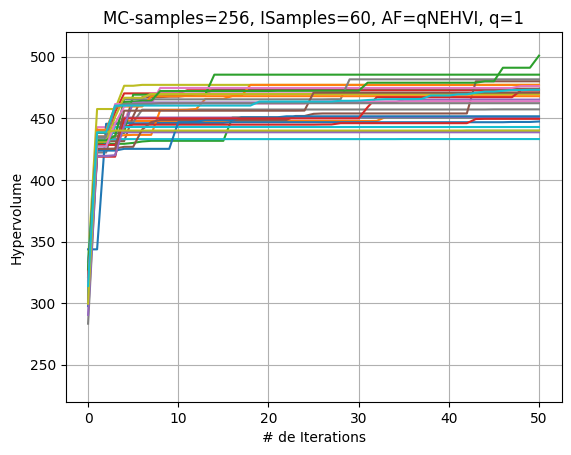

In [63]:
iters = np.arange(51)

for i in range(30):

    plt.errorbar(iters, np.asarray(hvsf27yexp6[i]), linewidth=1.5,label='%i' %i)
    plt.xlabel('# de Iterations')
    plt.ylabel('Hypervolume')
    plt.title('MC-samples=256, ISamples=60, AF=qNEHVI, q=1')
plt.grid()
plt.ylim([220,520])
plt.savefig('Exp6-27July')

In [62]:
%store BDs27yexp6
%store hvsf27yexp6
%store trainxall27yexp6
%store trainobjall27yexp6
%store numbd27yexp6

Stored 'BDs27yexp6' (list)
Stored 'hvsf27yexp6' (list)
Stored 'trainxall27yexp6' (list)
Stored 'trainobjall27yexp6' (list)
Stored 'numbd27yexp6' (list)


In [27]:
BDs27yexp7=[]
hvsf27yexp7=[]
trainxall27yexp7=[]
trainobjall27yexp7=[]
numbd27yexp7=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=70)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp7.append(bd.pareto_Y)      
    hvsf27yexp7.append(hvs_ehvi)   
    trainxall27yexp7.append(train_x_ehvi)
    trainobjall27yexp7.append(train_obj_ehvi)
    numbd27yexp7.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]

Seed: 432


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 470.5061 #Paprox=25 time = 16.32 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 470.5061 #Paprox=25 time = 16.31 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 475.9282 #Paprox=26 time = 16.60 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 488.0736 #Paprox=27 time = 16.57 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 488.1160 #Paprox=27 time = 16.74 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)
Batch  6: Hypervolume (qNEHVI) = 488.1160 #Paprox=28 time = 19.58 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 488.1160 #Paprox=29 time = 20.26 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 488.1160 #Paprox=30 time = 18.53 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 488.1163 #Paprox=31 time = 18.98 Lysine= 1.1911 Energy= 14.0494 Costs= 151.2143)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 488.1163 #Paprox=32 time = 18.66 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 16.97 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 19.51 Lysine= 1.3940 Energy= 14.0010 Costs= 165.1571)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 20.43 Lysine= 1.4940 Energy= 14.0010 Costs= 167.9145)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 20.92 Lysine= 1.4600 Energy= 14.0010 Costs= 164.0352)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 20.57 Lysine= 1.1268 Energy= 14.0010 Costs= 159.6080)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 20.82 Lysine= 0.9501 Energy= 14.0010 Costs= 155.7276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 20.66 Lysine= 0.9925 Energy= 14.0010 Costs= 156.9743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 19.04 Lysine= 1.4836 Energy= 14.0010 Costs= 167.6457)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 18.37 Lysine= 0.9501 Energy= 14.0010 Costs= 154.2992)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 18.44 Lysine= 1.0288 Energy= 14.0010 Costs= 157.2951)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 18.38 Lysine= 0.9501 Energy= 14.0010 Costs= 152.5723)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 18.81 Lysine= 1.0868 Energy= 14.0010 Costs= 156.5212)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 18.81 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6063)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 18.95 Lysine= 1.1151 Energy= 14.0010 Costs= 159.2292)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 19.48 Lysine= 1.3940 Energy= 14.0010 Costs= 165.1571)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 19.81 Lysine= 1.3610 Energy= 14.0010 Costs= 163.0431)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 18.33 Lysine= 1.3822 Energy= 14.0010 Costs= 163.5234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 19.24 Lysine= 1.3822 Energy= 14.0010 Costs= 163.5234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 488.8490 #Paprox=33 time = 18.89 Lysine= 1.3682 Energy= 14.0010 Costs= 159.2922)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 489.4588 #Paprox=34 time = 19.06 Lysine= 1.3346 Energy= 14.0010 Costs= 156.8491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 489.4588 #Paprox=34 time = 19.35 Lysine= 1.1672 Energy= 14.0010 Costs= 152.9007)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 489.4588 #Paprox=35 time = 19.51 Lysine= 1.3346 Energy= 14.0010 Costs= 156.8491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 489.5692 #Paprox=36 time = 19.31 Lysine= 1.1958 Energy= 14.0010 Costs= 153.5762)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 20.04 Lysine= 1.3327 Energy= 14.0010 Costs= 156.7057)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 19.45 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 19.60 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 19.91 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 21.05 Lysine= 1.3418 Energy= 14.0010 Costs= 159.8386)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 20.00 Lysine= 1.4130 Energy= 14.0010 Costs= 164.6507)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 19.96 Lysine= 1.4130 Energy= 14.0010 Costs= 164.6507)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 20.43 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 20.66 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 20.30 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 21.57 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 19.99 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 20.22 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 20.06 Lysine= 1.4130 Energy= 14.0010 Costs= 164.6507)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 21.10 Lysine= 1.3203 Energy= 14.0010 Costs= 158.3869)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 20.34 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▎                                       | 1/30 [16:08<7:48:06, 968.49s/it]


Batch 50: Hypervolume (qNEHVI) = 489.7415 #Paprox=37 time = 20.55 Lysine= 1.4130 Energy= 14.0010 Costs= 164.6507)Seed: 341

Batch  1: Hypervolume (qNEHVI) = 440.4910 #Paprox=16 time = 15.60 Lysine= 0.9501 Energy= 14.3961 Costs= 145.7322)
Batch  2: Hypervolume (qNEHVI) = 440.4910 #Paprox=16 time = 15.74 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 440.6287 #Paprox=17 time = 15.98 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)
Batch  4: Hypervolume (qNEHVI) = 440.6287 #Paprox=18 time = 15.71 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)
Batch  5: Hypervolume (qNEHVI) = 440.6287 #Paprox=19 time = 16.05 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 440.6287 #Paprox=19 time = 15.99 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 440.6287 #Paprox=19 time = 16.45 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 440.6287 #Paprox=20 time = 16.67 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 440.6287 #Paprox=21 time = 16.88 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 440.6287 #Paprox=22 time = 17.22 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 440.6287 #Paprox=23 time = 17.28 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 440.6287 #Paprox=24 time = 19.22 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 440.6287 #Paprox=24 time = 16.80 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 440.6287 #Paprox=25 time = 16.86 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 440.6287 #Paprox=26 time = 16.99 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 440.6287 #Paprox=26 time = 17.17 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 440.6287 #Paprox=26 time = 17.49 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 440.6287 #Paprox=27 time = 17.98 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 440.6287 #Paprox=27 time = 18.34 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 440.6287 #Paprox=28 time = 20.25 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 440.6287 #Paprox=29 time = 18.99 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 440.6287 #Paprox=30 time = 18.44 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 440.6287 #Paprox=30 time = 18.58 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 440.6287 #Paprox=31 time = 20.15 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 440.6287 #Paprox=32 time = 23.31 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 440.6287 #Paprox=33 time = 20.64 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 440.6287 #Paprox=34 time = 20.45 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 440.6287 #Paprox=35 time = 21.55 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 440.6287 #Paprox=36 time = 21.66 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 440.6287 #Paprox=37 time = 22.16 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 440.6287 #Paprox=38 time = 20.41 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 440.6287 #Paprox=39 time = 18.90 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 440.6287 #Paprox=39 time = 19.42 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 440.6287 #Paprox=40 time = 19.61 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 440.6287 #Paprox=41 time = 18.06 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 440.6287 #Paprox=42 time = 21.12 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 440.6287 #Paprox=43 time = 20.81 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 440.6287 #Paprox=44 time = 19.95 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 440.6287 #Paprox=45 time = 18.81 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 440.6287 #Paprox=46 time = 18.83 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 440.6287 #Paprox=47 time = 18.49 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 440.6287 #Paprox=48 time = 18.69 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 440.6287 #Paprox=48 time = 18.93 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 440.6287 #Paprox=48 time = 18.41 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 440.6287 #Paprox=48 time = 19.34 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 440.6287 #Paprox=48 time = 22.02 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 440.6287 #Paprox=49 time = 18.62 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 440.6287 #Paprox=50 time = 18.81 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 440.6287 #Paprox=50 time = 18.61 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▋                                      | 2/30 [31:43<7:22:39, 948.55s/it]


Batch 50: Hypervolume (qNEHVI) = 440.6287 #Paprox=51 time = 19.17 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)Seed: 327

Batch  1: Hypervolume (qNEHVI) = 436.1009 #Paprox=24 time = 17.95 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 436.1009 #Paprox=24 time = 16.61 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 448.5964 #Paprox=25 time = 16.88 Lysine= 1.1108 Energy= 14.2189 Costs= 150.0105)
Batch  4: Hypervolume (qNEHVI) = 451.3104 #Paprox=26 time = 15.42 Lysine= 1.1545 Energy= 14.0010 Costs= 151.2610)
Batch  5: Hypervolume (qNEHVI) = 453.2442 #Paprox=22 time = 17.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 453.2442 #Paprox=23 time = 12.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 453.2442 #Paprox=24 time = 12.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 453.2442 #Paprox=25 time = 13.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 453.2442 #Paprox=25 time = 14.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 453.2442 #Paprox=26 time = 15.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 453.2442 #Paprox=27 time = 14.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 453.2442 #Paprox=28 time = 13.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 453.2442 #Paprox=29 time = 14.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 453.2442 #Paprox=30 time = 15.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 453.2442 #Paprox=31 time = 14.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 453.2442 #Paprox=32 time = 14.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 455.9167 #Paprox=33 time = 14.20 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 455.9167 #Paprox=34 time = 14.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 455.9167 #Paprox=35 time = 14.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 455.9167 #Paprox=36 time = 14.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 455.9167 #Paprox=37 time = 15.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 455.9167 #Paprox=38 time = 14.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 455.9167 #Paprox=39 time = 14.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 455.9167 #Paprox=40 time = 15.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 455.9167 #Paprox=41 time = 16.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 455.9167 #Paprox=42 time = 15.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 455.9167 #Paprox=43 time = 15.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 455.9167 #Paprox=44 time = 15.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 455.9167 #Paprox=45 time = 16.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 455.9167 #Paprox=46 time = 15.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 455.9167 #Paprox=47 time = 15.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 455.9167 #Paprox=48 time = 15.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 455.9167 #Paprox=49 time = 15.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 455.9167 #Paprox=50 time = 16.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 455.9167 #Paprox=50 time = 15.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 455.9167 #Paprox=51 time = 15.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 455.9167 #Paprox=52 time = 16.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 455.9167 #Paprox=53 time = 15.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 455.9167 #Paprox=54 time = 16.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 455.9167 #Paprox=55 time = 17.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 455.9167 #Paprox=56 time = 17.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 455.9167 #Paprox=57 time = 16.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 455.9167 #Paprox=58 time = 16.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 455.9167 #Paprox=59 time = 16.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 455.9167 #Paprox=60 time = 15.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 455.9167 #Paprox=61 time = 15.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 455.9167 #Paprox=62 time = 16.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 455.9167 #Paprox=63 time = 17.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 455.9167 #Paprox=64 time = 17.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|████                                     | 3/30 [44:45<6:32:40, 872.61s/it]


Batch 50: Hypervolume (qNEHVI) = 455.9167 #Paprox=64 time = 18.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 205


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 425.3903 #Paprox=16 time = 16.68 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 425.3903 #Paprox=16 time = 17.04 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 430.2381 #Paprox=17 time = 17.44 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 430.7729 #Paprox=18 time = 18.10 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 443.0372 #Paprox=19 time = 17.64 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 443.0882 #Paprox=18 time = 16.90 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 443.0882 #Paprox=19 time = 16.82 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 443.0882 #Paprox=19 time = 16.43 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 443.0882 #Paprox=20 time = 18.04 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 443.0882 #Paprox=21 time = 18.73 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 443.0882 #Paprox=22 time = 18.31 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 443.0882 #Paprox=23 time = 17.04 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 443.0882 #Paprox=24 time = 17.56 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 443.0888 #Paprox=25 time = 18.25 Lysine= 1.1906 Energy= 14.0467 Costs= 151.1874)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 443.8215 #Paprox=26 time = 17.88 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 444.8276 #Paprox=27 time = 18.30 Lysine= 1.5211 Energy= 14.0010 Costs= 168.6017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 445.1354 #Paprox=28 time = 20.75 Lysine= 1.5470 Energy= 14.0010 Costs= 169.1517)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 445.1354 #Paprox=28 time = 21.60 Lysine= 1.2998 Energy= 14.0010 Costs= 163.0574)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.64 Lysine= 1.5341 Energy= 14.0010 Costs= 168.8819)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 21.50 Lysine= 1.0523 Energy= 14.0010 Costs= 155.1672)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 20.92 Lysine= 1.0397 Energy= 14.0010 Costs= 152.4778)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.71 Lysine= 1.0849 Energy= 14.0010 Costs= 158.9433)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.84 Lysine= 1.0414 Energy= 14.0010 Costs= 158.6789)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.79 Lysine= 1.4483 Energy= 14.0010 Costs= 161.8225)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 20.96 Lysine= 1.0093 Energy= 14.0010 Costs= 157.9879)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 21.61 Lysine= 1.4573 Energy= 14.0010 Costs= 167.8967)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.29 Lysine= 1.4583 Energy= 14.0010 Costs= 167.7401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 20.62 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.95 Lysine= 1.4590 Energy= 14.0010 Costs= 167.9565)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 22.69 Lysine= 1.4540 Energy= 14.0010 Costs= 166.3783)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 21.06 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 20.26 Lysine= 1.4458 Energy= 14.0010 Costs= 163.9282)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 21.62 Lysine= 1.4300 Energy= 14.0010 Costs= 159.1041)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 22.50 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 24.05 Lysine= 1.4452 Energy= 14.0010 Costs= 163.7034)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 23.14 Lysine= 1.4316 Energy= 14.0010 Costs= 159.6171)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 445.3212 #Paprox=30 time = 23.60 Lysine= 1.4257 Energy= 14.0010 Costs= 157.6946)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 445.3212 #Paprox=30 time = 23.98 Lysine= 1.4389 Energy= 14.0010 Costs= 161.8329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 448.3559 #Paprox=31 time = 23.51 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 448.3560 #Paprox=32 time = 21.03 Lysine= 1.4255 Energy= 14.0010 Costs= 157.6925)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 448.3560 #Paprox=32 time = 21.18 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 448.3560 #Paprox=33 time = 21.26 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 448.3560 #Paprox=34 time = 20.69 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 448.3560 #Paprox=34 time = 20.90 Lysine= 1.4257 Energy= 14.0010 Costs= 157.7520)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 448.3560 #Paprox=34 time = 21.92 Lysine= 1.4344 Energy= 14.0010 Costs= 160.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 448.3622 #Paprox=35 time = 22.16 Lysine= 1.4210 Energy= 14.0010 Costs= 156.2804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 448.3622 #Paprox=36 time = 22.27 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 448.3622 #Paprox=36 time = 22.93 Lysine= 1.4302 Energy= 14.0010 Costs= 159.1871)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 448.3622 #Paprox=36 time = 24.18 Lysine= 1.4372 Energy= 14.0010 Costs= 161.1690)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|█████▏                                 | 4/30 [1:01:41<6:42:39, 929.23s/it]


Batch 50: Hypervolume (qNEHVI) = 448.3622 #Paprox=37 time = 22.60 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)Seed: 22


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 429.7974 #Paprox=23 time = 18.00 Lysine= 0.9501 Energy= 14.4319 Costs= 146.1318)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 429.7974 #Paprox=23 time = 17.31 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 430.1213 #Paprox=24 time = 16.86 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 430.1213 #Paprox=25 time = 17.09 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 430.1213 #Paprox=26 time = 16.99 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 430.1213 #Paprox=27 time = 18.11 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 430.1213 #Paprox=28 time = 17.66 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 430.1213 #Paprox=29 time = 17.44 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 430.1213 #Paprox=30 time = 19.02 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 430.1213 #Paprox=30 time = 18.63 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 430.1213 #Paprox=31 time = 19.40 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 431.3355 #Paprox=32 time = 19.25 Lysine= 0.9884 Energy= 14.3350 Costs= 152.1533)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 431.3355 #Paprox=32 time = 19.59 Lysine= 1.1934 Energy= 14.0010 Costs= 163.2860)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 431.3355 #Paprox=32 time = 19.24 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 431.3355 #Paprox=32 time = 19.27 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 431.3355 #Paprox=32 time = 18.96 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 431.3355 #Paprox=32 time = 18.87 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 431.3355 #Paprox=32 time = 19.28 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 431.3355 #Paprox=32 time = 19.74 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 431.3355 #Paprox=32 time = 19.78 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 21.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 19.91 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 20.00 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 20.34 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 20.09 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 18.17 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 18.52 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 20.27 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 20.38 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 20.27 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 20.80 Lysine= 0.9501 Energy= 14.4353 Costs= 150.7786)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 19.91 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 18.88 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 19.33 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 19.76 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 19.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 19.74 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 19.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 19.93 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 19.15 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 21.53 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 20.62 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 18.71 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 18.25 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 18.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 18.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 19.56 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 18.92 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 19.43 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▌                                | 5/30 [1:17:42<6:31:58, 940.76s/it]


Batch 50: Hypervolume (qNEHVI) = 431.3355 #Paprox=33 time = 19.86 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 993


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 437.8716 #Paprox=16 time = 15.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 437.8716 #Paprox=16 time = 15.11 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 468.9267 #Paprox=17 time = 14.86 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 468.9267 #Paprox=18 time = 17.38 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 468.9267 #Paprox=19 time = 15.86 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 468.9267 #Paprox=19 time = 15.84 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 468.9267 #Paprox=20 time = 16.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 468.9267 #Paprox=20 time = 16.53 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 468.9267 #Paprox=21 time = 16.92 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 468.9267 #Paprox=22 time = 16.99 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 468.9267 #Paprox=23 time = 16.37 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 468.9267 #Paprox=24 time = 16.06 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 468.9267 #Paprox=25 time = 15.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 468.9267 #Paprox=26 time = 16.13 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 468.9267 #Paprox=27 time = 16.19 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 468.9267 #Paprox=28 time = 17.94 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 468.9267 #Paprox=29 time = 17.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 468.9267 #Paprox=30 time = 16.67 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 468.9267 #Paprox=31 time = 16.57 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 468.9267 #Paprox=32 time = 16.86 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 468.9267 #Paprox=33 time = 16.90 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 468.9267 #Paprox=34 time = 16.58 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 468.9267 #Paprox=34 time = 17.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 468.9267 #Paprox=34 time = 16.75 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 468.9267 #Paprox=34 time = 19.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 468.9267 #Paprox=34 time = 18.19 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 468.9267 #Paprox=34 time = 17.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 468.9267 #Paprox=35 time = 17.19 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 468.9267 #Paprox=36 time = 17.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 468.9267 #Paprox=37 time = 17.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 468.9267 #Paprox=38 time = 17.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 468.9267 #Paprox=39 time = 16.75 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 468.9267 #Paprox=39 time = 17.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 468.9267 #Paprox=40 time = 16.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 468.9267 #Paprox=41 time = 17.07 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 468.9267 #Paprox=42 time = 16.69 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 468.9267 #Paprox=43 time = 17.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 468.9267 #Paprox=43 time = 18.15 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 468.9267 #Paprox=44 time = 18.41 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 468.9267 #Paprox=45 time = 19.55 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 468.9267 #Paprox=46 time = 18.63 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 468.9267 #Paprox=47 time = 18.22 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 468.9267 #Paprox=47 time = 18.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 468.9267 #Paprox=48 time = 19.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 468.9267 #Paprox=48 time = 18.41 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 468.9267 #Paprox=49 time = 19.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 468.9267 #Paprox=49 time = 19.70 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 468.9267 #Paprox=50 time = 18.59 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 468.9267 #Paprox=51 time = 19.24 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|███████▊                               | 6/30 [1:32:10<6:06:20, 915.87s/it]


Batch 50: Hypervolume (qNEHVI) = 468.9267 #Paprox=52 time = 19.47 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)Seed: 388


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 431.9556 #Paprox=16 time = 17.13 Lysine= 0.9501 Energy= 14.3998 Costs= 145.7785)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 431.9556 #Paprox=16 time = 17.55 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 443.8857 #Paprox=15 time = 17.77 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 449.8516 #Paprox=16 time = 13.69 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 452.7945 #Paprox=16 time = 13.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 452.7945 #Paprox=17 time = 13.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 452.7945 #Paprox=18 time = 14.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 452.7945 #Paprox=19 time = 13.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 452.7945 #Paprox=20 time = 13.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 452.7945 #Paprox=21 time = 13.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 452.7945 #Paprox=22 time = 13.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 452.7945 #Paprox=23 time = 13.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 452.7945 #Paprox=24 time = 14.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 452.7945 #Paprox=25 time = 14.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 452.7945 #Paprox=26 time = 14.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 452.7945 #Paprox=27 time = 13.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 452.7945 #Paprox=28 time = 13.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 452.7945 #Paprox=29 time = 13.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 452.7945 #Paprox=30 time = 13.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 452.7945 #Paprox=31 time = 13.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 452.7945 #Paprox=32 time = 13.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 452.7945 #Paprox=33 time = 14.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 452.7945 #Paprox=34 time = 14.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 452.7945 #Paprox=34 time = 14.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 452.7945 #Paprox=35 time = 14.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 452.7945 #Paprox=36 time = 13.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 452.7945 #Paprox=37 time = 14.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 452.7945 #Paprox=38 time = 14.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 452.7945 #Paprox=39 time = 14.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 452.7945 #Paprox=39 time = 14.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 452.7945 #Paprox=40 time = 14.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 452.7945 #Paprox=41 time = 14.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 452.7945 #Paprox=42 time = 14.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 452.7945 #Paprox=43 time = 14.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 452.7945 #Paprox=44 time = 14.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 452.7945 #Paprox=45 time = 14.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 452.7945 #Paprox=46 time = 14.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 452.7945 #Paprox=47 time = 14.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 452.7945 #Paprox=46 time = 14.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 452.7945 #Paprox=46 time = 14.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 452.7945 #Paprox=47 time = 14.87 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 452.7945 #Paprox=46 time = 14.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 452.7945 #Paprox=47 time = 14.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 452.7945 #Paprox=47 time = 15.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 452.7945 #Paprox=44 time = 14.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 452.7945 #Paprox=45 time = 14.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 452.7945 #Paprox=45 time = 15.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 452.7945 #Paprox=46 time = 15.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 452.7945 #Paprox=47 time = 14.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 23%|█████████                              | 7/30 [1:44:13<5:26:58, 852.97s/it]


Batch 50: Hypervolume (qNEHVI) = 452.7945 #Paprox=41 time = 14.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 527


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 449.2549 #Paprox=18 time = 16.43 Lysine= 0.9501 Energy= 14.4183 Costs= 145.9816)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 449.2549 #Paprox=18 time = 16.86 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 465.9216 #Paprox=19 time = 17.15 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 467.5532 #Paprox=15 time = 16.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 467.5532 #Paprox=15 time = 13.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 467.5532 #Paprox=16 time = 14.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 467.5532 #Paprox=17 time = 14.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 467.5532 #Paprox=18 time = 14.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 467.5532 #Paprox=19 time = 15.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 467.5532 #Paprox=20 time = 15.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 467.5532 #Paprox=21 time = 15.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 467.5532 #Paprox=22 time = 15.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 467.5532 #Paprox=23 time = 15.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 467.5532 #Paprox=23 time = 16.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 467.5532 #Paprox=24 time = 15.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 467.5532 #Paprox=25 time = 16.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 467.5532 #Paprox=25 time = 15.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 467.5532 #Paprox=26 time = 16.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 467.5532 #Paprox=27 time = 16.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 467.5532 #Paprox=28 time = 16.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 467.5532 #Paprox=28 time = 16.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 467.5532 #Paprox=28 time = 17.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 467.5532 #Paprox=29 time = 16.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 467.5532 #Paprox=29 time = 16.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 467.5532 #Paprox=30 time = 16.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 467.5532 #Paprox=30 time = 16.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 467.5532 #Paprox=31 time = 16.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 467.5532 #Paprox=32 time = 17.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 467.5532 #Paprox=32 time = 17.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 467.5532 #Paprox=33 time = 17.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 467.5532 #Paprox=34 time = 17.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 467.5532 #Paprox=35 time = 16.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 467.5532 #Paprox=36 time = 17.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 467.5532 #Paprox=36 time = 17.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 467.5532 #Paprox=36 time = 17.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 467.5532 #Paprox=36 time = 17.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 467.5532 #Paprox=36 time = 17.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 467.5532 #Paprox=36 time = 17.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 467.5532 #Paprox=36 time = 17.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 467.5532 #Paprox=37 time = 17.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 467.5532 #Paprox=38 time = 17.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 467.5532 #Paprox=38 time = 17.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 467.5532 #Paprox=38 time = 17.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 467.5532 #Paprox=39 time = 17.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 467.5532 #Paprox=40 time = 17.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 467.5532 #Paprox=41 time = 17.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 467.5532 #Paprox=42 time = 17.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 467.5532 #Paprox=42 time = 18.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 467.5532 #Paprox=43 time = 18.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 27%|██████████▍                            | 8/30 [1:58:07<5:10:29, 846.81s/it]


Batch 50: Hypervolume (qNEHVI) = 467.5532 #Paprox=43 time = 17.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 334


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 434.5081 #Paprox=20 time = 14.92 Lysine= 0.9501 Energy= 14.3948 Costs= 145.7116)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 434.5081 #Paprox=20 time = 15.09 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 454.0923 #Paprox=21 time = 15.12 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 473.8441 #Paprox=22 time = 15.64 Lysine= 1.1360 Energy= 14.0010 Costs= 148.4891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 474.0542 #Paprox=23 time = 15.53 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 474.3772 #Paprox=24 time = 14.92 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 474.3772 #Paprox=24 time = 15.51 Lysine= 1.2051 Energy= 14.0010 Costs= 157.7905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 474.3772 #Paprox=24 time = 15.36 Lysine= 1.1296 Energy= 14.0010 Costs= 154.4986)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 474.6799 #Paprox=25 time = 15.95 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 474.6799 #Paprox=25 time = 15.88 Lysine= 1.1211 Energy= 14.0010 Costs= 148.6915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 474.9272 #Paprox=25 time = 16.23 Lysine= 1.1704 Energy= 14.0010 Costs= 154.5497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 475.9264 #Paprox=26 time = 15.96 Lysine= 1.1495 Energy= 14.0010 Costs= 149.2809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 476.1380 #Paprox=27 time = 16.29 Lysine= 1.1108 Energy= 14.2189 Costs= 150.0105)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 476.7959 #Paprox=27 time = 16.53 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 476.8992 #Paprox=28 time = 16.45 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 16.24 Lysine= 1.1070 Energy= 14.0378 Costs= 149.1107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 16.67 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 16.89 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 16.89 Lysine= 1.4121 Energy= 14.0010 Costs= 165.0347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 19.32 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 18.05 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 18.05 Lysine= 1.4160 Energy= 14.0010 Costs= 165.8164)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 18.53 Lysine= 1.4634 Energy= 14.0010 Costs= 166.8321)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 19.37 Lysine= 1.4158 Energy= 14.0010 Costs= 165.3603)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 19.83 Lysine= 1.4132 Energy= 14.0010 Costs= 165.2540)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 17.91 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 21.54 Lysine= 1.4105 Energy= 14.0010 Costs= 163.8550)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 18.29 Lysine= 1.4129 Energy= 14.0010 Costs= 165.4454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 18.07 Lysine= 1.4121 Energy= 14.0010 Costs= 165.0347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 20.21 Lysine= 1.4121 Energy= 14.0010 Costs= 165.0347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 18.86 Lysine= 1.4121 Energy= 14.0010 Costs= 165.0347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 20.24 Lysine= 1.4164 Energy= 14.0010 Costs= 165.8975)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 19.72 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 19.95 Lysine= 1.4109 Energy= 14.0010 Costs= 164.1096)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 19.39 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 20.13 Lysine= 1.4177 Energy= 14.0010 Costs= 166.4857)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 20.32 Lysine= 1.4177 Energy= 14.0010 Costs= 166.4857)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 19.55 Lysine= 1.4139 Energy= 14.0010 Costs= 165.9691)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 20.34 Lysine= 1.4139 Energy= 14.0010 Costs= 165.9691)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 20.59 Lysine= 1.4121 Energy= 14.0010 Costs= 165.0347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 20.63 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 20.28 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 20.32 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 20.68 Lysine= 1.4177 Energy= 14.0010 Costs= 166.4857)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 21.49 Lysine= 1.4177 Energy= 14.0010 Costs= 166.4857)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 22.80 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 21.21 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 21.70 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 21.33 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 30%|███████████▋                           | 9/30 [2:13:30<5:04:45, 870.75s/it]


Batch 50: Hypervolume (qNEHVI) = 476.9044 #Paprox=29 time = 21.48 Lysine= 1.4139 Energy= 14.0010 Costs= 165.9691)Seed: 361

Batch  1: Hypervolume (qNEHVI) = 431.5843 #Paprox=23 time = 14.67 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 431.5843 #Paprox=23 time = 14.87 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 444.2691 #Paprox=24 time = 14.78 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)
Batch  4: Hypervolume (qNEHVI) = 450.4671 #Paprox=24 time = 15.40 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)
Batch  5: Hypervolume (qNEHVI) = 450.4671 #Paprox=25 time = 14.78 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 450.4671 #Paprox=26 time = 14.91 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 450.4671 #Paprox=27 time = 15.70 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 450.4671 #Paprox=28 time = 16.47 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 450.4671 #Paprox=28 time = 15.03 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 450.4671 #Paprox=29 time = 15.68 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 450.4671 #Paprox=30 time = 14.83 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 450.4671 #Paprox=31 time = 14.97 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 450.4671 #Paprox=32 time = 15.34 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 450.4671 #Paprox=33 time = 15.49 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 450.4671 #Paprox=34 time = 15.56 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 450.4671 #Paprox=35 time = 15.92 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 450.4671 #Paprox=36 time = 15.60 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 450.4671 #Paprox=36 time = 15.72 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 450.4671 #Paprox=36 time = 15.97 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 450.4671 #Paprox=31 time = 16.90 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 450.4671 #Paprox=32 time = 15.86 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 450.4671 #Paprox=32 time = 15.95 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 450.4671 #Paprox=33 time = 16.06 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 450.4671 #Paprox=34 time = 16.03 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 450.4671 #Paprox=35 time = 15.98 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 450.4671 #Paprox=35 time = 16.04 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 450.4671 #Paprox=35 time = 16.03 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 450.4671 #Paprox=35 time = 16.15 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 450.4671 #Paprox=35 time = 16.32 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 450.4671 #Paprox=35 time = 16.24 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 450.4671 #Paprox=36 time = 16.33 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 450.4671 #Paprox=37 time = 16.56 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 450.4671 #Paprox=37 time = 16.25 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 450.4671 #Paprox=38 time = 16.39 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 450.4671 #Paprox=38 time = 16.88 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 450.4671 #Paprox=39 time = 17.33 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 450.4671 #Paprox=40 time = 16.95 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 450.4671 #Paprox=40 time = 16.80 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 450.4671 #Paprox=41 time = 16.82 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 450.4671 #Paprox=41 time = 16.62 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 450.4671 #Paprox=40 time = 16.72 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 450.4671 #Paprox=40 time = 16.95 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 450.4671 #Paprox=41 time = 18.01 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 450.4671 #Paprox=42 time = 18.79 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 450.4671 #Paprox=43 time = 20.76 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 450.4671 #Paprox=44 time = 20.07 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 450.4671 #Paprox=44 time = 19.34 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 450.4671 #Paprox=45 time = 19.01 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 450.4671 #Paprox=45 time = 21.23 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|████████████▋                         | 10/30 [2:27:17<4:45:44, 857.24s/it]


Batch 50: Hypervolume (qNEHVI) = 450.4671 #Paprox=45 time = 18.82 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)Seed: 543

Batch  1: Hypervolume (qNEHVI) = 447.5844 #Paprox=12 time = 17.01 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 447.5844 #Paprox=12 time = 17.05 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 447.5844 #Paprox=12 time = 16.16 Lysine= 1.2125 Energy= 14.0010 Costs= 160.2065)
Batch  4: Hypervolume (qNEHVI) = 466.4610 #Paprox=13 time = 15.92 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 466.4610 #Paprox=13 time = 16.66 Lysine= 1.2422 Energy= 14.0010 Costs= 159.2449)
Batch  6: Hypervolume (qNEHVI) = 479.3150 #Paprox=14 time = 17.01 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)
Batch  7: Hypervolume (qNEHVI) = 479.3150 #Paprox=15 time = 17.89 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)
Batch  8: Hypervolume (qNEHVI) = 479.3150 #Paprox=16 time = 18.05 Lysine= 1.0

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 479.3150 #Paprox=17 time = 21.75 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 479.3150 #Paprox=18 time = 16.91 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 479.3150 #Paprox=18 time = 15.45 Lysine= 0.9501 Energy= 14.0010 Costs= 154.0005)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 479.5682 #Paprox=19 time = 15.59 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 479.5682 #Paprox=20 time = 15.93 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 481.9232 #Paprox=21 time = 15.86 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 481.9232 #Paprox=22 time = 16.51 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 481.9232 #Paprox=23 time = 16.54 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 481.9232 #Paprox=24 time = 16.16 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 481.9232 #Paprox=25 time = 16.16 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 481.9232 #Paprox=26 time = 16.04 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 481.9232 #Paprox=27 time = 16.13 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 481.9232 #Paprox=28 time = 16.08 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 481.9232 #Paprox=29 time = 16.40 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 481.9232 #Paprox=30 time = 16.50 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 481.9232 #Paprox=31 time = 16.62 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 481.9232 #Paprox=32 time = 16.65 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 481.9232 #Paprox=32 time = 16.67 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 481.9232 #Paprox=33 time = 16.73 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 481.9232 #Paprox=34 time = 16.82 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 481.9232 #Paprox=35 time = 17.04 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 481.9232 #Paprox=35 time = 16.60 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 481.9232 #Paprox=36 time = 17.05 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 481.9232 #Paprox=37 time = 16.86 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 481.9232 #Paprox=37 time = 16.72 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 481.9232 #Paprox=38 time = 16.71 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 481.9232 #Paprox=39 time = 16.91 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 481.9232 #Paprox=40 time = 17.16 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 481.9232 #Paprox=40 time = 17.16 Lysine= 1.1150 Energy= 14.0010 Costs= 153.2156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 481.9232 #Paprox=41 time = 17.24 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 481.9232 #Paprox=42 time = 17.51 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 481.9232 #Paprox=43 time = 17.37 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 481.9232 #Paprox=43 time = 17.29 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 481.9232 #Paprox=44 time = 17.36 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 481.9232 #Paprox=45 time = 17.65 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 481.9232 #Paprox=46 time = 17.60 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 481.9232 #Paprox=47 time = 17.91 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 481.9232 #Paprox=48 time = 17.40 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 481.9232 #Paprox=49 time = 17.40 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 481.9232 #Paprox=50 time = 17.97 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 481.9232 #Paprox=51 time = 18.39 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 37%|█████████████▉                        | 11/30 [2:41:27<4:30:46, 855.08s/it]


Batch 50: Hypervolume (qNEHVI) = 481.9232 #Paprox=51 time = 18.39 Lysine= 1.0768 Energy= 14.0010 Costs= 162.2239)Seed: 750

Batch  1: Hypervolume (qNEHVI) = 436.9974 #Paprox=18 time = 16.56 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 436.9974 #Paprox=18 time = 16.73 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 455.8740 #Paprox=19 time = 15.70 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 470.1246 #Paprox=20 time = 16.50 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  5: Hypervolume (qNEHVI) = 471.7211 #Paprox=15 time = 18.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 471.7211 #Paprox=16 time = 14.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 471.7211 #Paprox=17 time = 15.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 471.7211 #Paprox=18 time = 16.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 471.7211 #Paprox=19 time = 15.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 471.7211 #Paprox=20 time = 15.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 471.7211 #Paprox=21 time = 16.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 471.7211 #Paprox=22 time = 16.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 471.7211 #Paprox=23 time = 16.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 471.7211 #Paprox=24 time = 16.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 471.7211 #Paprox=25 time = 17.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 471.7211 #Paprox=26 time = 16.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 471.7211 #Paprox=27 time = 16.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 471.7211 #Paprox=28 time = 16.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 471.7211 #Paprox=29 time = 16.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 471.7211 #Paprox=30 time = 17.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 471.7211 #Paprox=31 time = 17.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 471.7211 #Paprox=32 time = 18.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 471.7211 #Paprox=33 time = 17.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 471.7211 #Paprox=34 time = 17.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 471.7211 #Paprox=35 time = 17.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 471.7211 #Paprox=36 time = 17.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 471.7211 #Paprox=37 time = 18.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 471.7211 #Paprox=38 time = 19.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 471.7211 #Paprox=38 time = 18.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 471.7211 #Paprox=37 time = 18.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 471.7211 #Paprox=38 time = 17.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 471.7211 #Paprox=38 time = 17.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 471.7211 #Paprox=39 time = 18.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 471.7211 #Paprox=39 time = 18.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 471.7211 #Paprox=40 time = 18.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 471.7211 #Paprox=41 time = 19.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 471.7211 #Paprox=42 time = 18.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 471.7211 #Paprox=43 time = 18.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 471.7211 #Paprox=42 time = 18.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 471.7211 #Paprox=42 time = 18.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 471.7211 #Paprox=43 time = 19.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 471.7211 #Paprox=44 time = 19.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 471.7211 #Paprox=45 time = 18.87 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 471.7211 #Paprox=46 time = 18.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 471.7211 #Paprox=47 time = 21.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 471.7211 #Paprox=48 time = 19.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 471.7211 #Paprox=49 time = 19.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 471.7211 #Paprox=50 time = 22.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 471.7211 #Paprox=51 time = 21.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 40%|███████████████▏                      | 12/30 [2:56:21<4:20:05, 866.96s/it]


Batch 50: Hypervolume (qNEHVI) = 471.7211 #Paprox=52 time = 19.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 740

Batch  1: Hypervolume (qNEHVI) = 427.0515 #Paprox=23 time = 17.24 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 427.0515 #Paprox=23 time = 17.06 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 427.0515 #Paprox=23 time = 17.06 Lysine= 1.2125 Energy= 14.0010 Costs= 160.2065)
Batch  4: Hypervolume (qNEHVI) = 445.9281 #Paprox=24 time = 18.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 461.1679 #Paprox=25 time = 19.42 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)
Batch  6: Hypervolume (qNEHVI) = 461.4063 #Paprox=22 time = 19.89 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)
Batch  7: Hypervolume (qNEHVI) = 461.4463 #Paprox=23 time = 18.99 Lysine= 1.1301 Energy= 14.1608 Costs= 150.4384)
Batch  8: Hypervolume (qNEHVI) = 465.8156 #Paprox=24 time = 19.09 Lysine= 1.4

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 465.8156 #Paprox=26 time = 18.71 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 465.8156 #Paprox=27 time = 18.25 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 465.8156 #Paprox=27 time = 18.32 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 465.8156 #Paprox=27 time = 19.04 Lysine= 1.4346 Energy= 14.0010 Costs= 161.7757)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 465.8844 #Paprox=28 time = 19.01 Lysine= 1.4747 Energy= 14.0010 Costs= 162.7809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 465.9631 #Paprox=29 time = 18.17 Lysine= 1.4625 Energy= 14.0010 Costs= 162.5527)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 465.9631 #Paprox=30 time = 18.64 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 465.9631 #Paprox=30 time = 19.35 Lysine= 1.4358 Energy= 14.0010 Costs= 162.0558)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 465.9631 #Paprox=30 time = 19.11 Lysine= 1.4185 Energy= 14.0010 Costs= 161.7339)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 465.9631 #Paprox=31 time = 19.80 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 465.9631 #Paprox=31 time = 19.43 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 465.9631 #Paprox=31 time = 18.94 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 465.9631 #Paprox=31 time = 20.34 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 465.9631 #Paprox=31 time = 20.45 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 465.9631 #Paprox=31 time = 20.99 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 465.9631 #Paprox=32 time = 21.87 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 465.9631 #Paprox=32 time = 22.93 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 465.9631 #Paprox=32 time = 21.83 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 465.9631 #Paprox=32 time = 21.36 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 465.9661 #Paprox=33 time = 21.55 Lysine= 1.4794 Energy= 14.0010 Costs= 162.8680)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 465.9661 #Paprox=34 time = 21.66 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 466.0051 #Paprox=35 time = 21.58 Lysine= 1.4515 Energy= 14.0010 Costs= 162.3488)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 466.0051 #Paprox=36 time = 20.98 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 466.0051 #Paprox=36 time = 21.83 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 466.0051 #Paprox=37 time = 22.86 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 466.0051 #Paprox=37 time = 22.28 Lysine= 1.4376 Energy= 14.0010 Costs= 162.0903)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 466.0051 #Paprox=37 time = 23.19 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 466.0051 #Paprox=37 time = 22.37 Lysine= 1.4290 Energy= 14.0010 Costs= 161.9300)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 466.0051 #Paprox=38 time = 22.61 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 466.0051 #Paprox=38 time = 22.74 Lysine= 1.4207 Energy= 14.0010 Costs= 161.3329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 466.0051 #Paprox=38 time = 21.52 Lysine= 1.4353 Energy= 14.0010 Costs= 162.0468)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 466.0051 #Paprox=39 time = 21.84 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 466.0051 #Paprox=40 time = 22.20 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 466.0051 #Paprox=40 time = 22.28 Lysine= 1.4199 Energy= 14.0010 Costs= 161.7607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 466.0051 #Paprox=41 time = 22.88 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 466.0051 #Paprox=41 time = 23.43 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 43%|████████████████▍                     | 13/30 [3:13:25<4:19:03, 914.31s/it]


Batch 50: Hypervolume (qNEHVI) = 466.0051 #Paprox=42 time = 23.21 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)Seed: 285

Batch  1: Hypervolume (qNEHVI) = 438.0853 #Paprox=12 time = 17.78 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 438.0853 #Paprox=12 time = 17.68 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)
Batch  3: Hypervolume (qNEHVI) = 469.1404 #Paprox=13 time = 16.93 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 485.2494 #Paprox=14 time = 17.92 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  5: Hypervolume (qNEHVI) = 486.8352 #Paprox=13 time = 18.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 486.8352 #Paprox=14 time = 14.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 486.8352 #Paprox=15 time = 16.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 486.8352 #Paprox=16 time = 16.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 486.8352 #Paprox=17 time = 15.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 16.41 Lysine= 1.1084 Energy= 14.3747 Costs= 150.7492)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 16.06 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.94 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 14.98 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.07 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 14.86 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 14.55 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.45 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.81 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 16.46 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 14.96 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.14 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 14.66 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.27 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.42 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 14.85 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 14.96 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 14.72 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 14.89 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.01 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 14.91 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.45 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 14.95 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 14.97 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.44 Lysine= 0.9501 Energy= 14.0010 Costs= 151.3263)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.45 Lysine= 0.9501 Energy= 14.0010 Costs= 151.3263)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.09 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 14.92 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.36 Lysine= 0.9501 Energy= 14.0010 Costs= 151.3263)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.32 Lysine= 0.9501 Energy= 14.0010 Costs= 151.3263)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 15.36 Lysine= 0.9501 Energy= 14.0010 Costs= 151.3263)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 16.50 Lysine= 1.0215 Energy= 14.0010 Costs= 153.4418)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 16.40 Lysine= 0.9960 Energy= 14.0010 Costs= 152.6898)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 16.89 Lysine= 1.0377 Energy= 14.0010 Costs= 153.9220)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 16.32 Lysine= 1.0536 Energy= 14.0010 Costs= 154.6739)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 16.56 Lysine= 0.9822 Energy= 14.0010 Costs= 153.3004)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 486.9435 #Paprox=18 time = 17.85 Lysine= 1.3256 Energy= 14.0010 Costs= 159.7800)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 488.1839 #Paprox=19 time = 15.71 Lysine= 1.3985 Energy= 14.0010 Costs= 155.3217)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 492.3117 #Paprox=20 time = 15.71 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 492.3117 #Paprox=20 time = 16.07 Lysine= 0.9501 Energy= 14.0010 Costs= 145.3681)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 47%|█████████████████▋                    | 14/30 [3:26:35<3:53:48, 876.79s/it]


Batch 50: Hypervolume (qNEHVI) = 492.3117 #Paprox=21 time = 16.27 Lysine= 1.2272 Energy= 14.0010 Costs= 151.3295)Seed: 1

Batch  1: Hypervolume (qNEHVI) = 426.7576 #Paprox=17 time = 16.21 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 426.7576 #Paprox=17 time = 16.36 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 457.8127 #Paprox=18 time = 16.30 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 457.8127 #Paprox=19 time = 16.93 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 457.8127 #Paprox=20 time = 16.70 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 457.8127 #Paprox=21 time = 16.82 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 478.0295 #Paprox=22 time = 16.85 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 478.1791 #Paprox=23 time = 17.16 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 478.1791 #Paprox=24 time = 19.01 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 478.1791 #Paprox=25 time = 17.81 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 478.1791 #Paprox=25 time = 17.24 Lysine= 1.2051 Energy= 14.0010 Costs= 157.7905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 478.2676 #Paprox=26 time = 17.57 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 478.2676 #Paprox=26 time = 17.54 Lysine= 1.1481 Energy= 14.0010 Costs= 154.3146)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 478.2676 #Paprox=26 time = 17.49 Lysine= 1.1481 Energy= 14.0010 Costs= 154.3146)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 478.2676 #Paprox=26 time = 17.34 Lysine= 1.1481 Energy= 14.0010 Costs= 154.3146)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 478.2676 #Paprox=26 time = 17.76 Lysine= 1.1481 Energy= 14.0010 Costs= 154.3146)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 478.2676 #Paprox=26 time = 17.98 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 478.2824 #Paprox=27 time = 18.35 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 478.2882 #Paprox=28 time = 15.54 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 478.2882 #Paprox=29 time = 14.48 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 478.2882 #Paprox=30 time = 12.73 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 478.2882 #Paprox=30 time = 12.20 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 478.2882 #Paprox=31 time = 11.44 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 478.2882 #Paprox=32 time = 11.18 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 478.2882 #Paprox=33 time = 10.77 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 478.2882 #Paprox=34 time = 11.39 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 478.2882 #Paprox=35 time = 11.18 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 478.2882 #Paprox=35 time = 11.07 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 478.2882 #Paprox=35 time = 11.69 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 478.2882 #Paprox=36 time = 10.53 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 478.2882 #Paprox=37 time = 10.68 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 478.2882 #Paprox=38 time = 11.12 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 478.2882 #Paprox=39 time = 11.35 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 478.2882 #Paprox=40 time = 13.66 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 478.2882 #Paprox=41 time = 12.09 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 478.2882 #Paprox=41 time = 14.32 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 478.2882 #Paprox=42 time = 13.09 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 478.2882 #Paprox=42 time = 13.49 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 478.2882 #Paprox=42 time = 13.44 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 478.2882 #Paprox=43 time = 12.67 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 478.2882 #Paprox=43 time = 13.31 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 478.2882 #Paprox=43 time = 14.26 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 478.2882 #Paprox=43 time = 12.68 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 478.2882 #Paprox=43 time = 12.78 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 478.2882 #Paprox=44 time = 13.47 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 478.2882 #Paprox=45 time = 13.66 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 478.2882 #Paprox=45 time = 11.48 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 478.2882 #Paprox=46 time = 11.29 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 478.2882 #Paprox=47 time = 12.12 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 50%|███████████████████                   | 15/30 [3:38:24<3:26:34, 826.33s/it]


Batch 50: Hypervolume (qNEHVI) = 478.2882 #Paprox=48 time = 11.81 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)Seed: 850

Batch  1: Hypervolume (qNEHVI) = 436.7787 #Paprox=20 time = 16.22 Lysine= 0.9501 Energy= 14.4382 Costs= 146.2011)
Batch  2: Hypervolume (qNEHVI) = 436.7787 #Paprox=20 time = 18.37 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 436.7787 #Paprox=21 time = 19.00 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  4: Hypervolume (qNEHVI) = 457.8063 #Paprox=22 time = 18.09 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)
Batch  5: Hypervolume (qNEHVI) = 457.8063 #Paprox=22 time = 17.60 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)
Batch  6: Hypervolume (qNEHVI) = 457.8063 #Paprox=22 time = 17.70 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)
Batch  7: Hypervolume (qNEHVI) = 457.8574 #Paprox=23 time = 17.29 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)
Batch  8: Hypervolume (qNEHVI) = 457.8574 #Paprox=24 time = 17.52 Lysine= 1.1

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 457.8574 #Paprox=24 time = 17.49 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 457.8574 #Paprox=24 time = 18.70 Lysine= 1.4980 Energy= 14.0010 Costs= 167.8290)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 18.33 Lysine= 1.5263 Energy= 14.0010 Costs= 168.5649)
Batch 12: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 18.26 Lysine= 1.5109 Energy= 14.0010 Costs= 166.8571)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 17.38 Lysine= 1.5013 Energy= 14.0010 Costs= 167.9587)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 17.22 Lysine= 1.5091 Energy= 14.0010 Costs= 168.1521)
Batch 15: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 17.36 Lysine= 1.0007 Energy= 14.0010 Costs= 157.0847)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 19.75 Lysine= 1.0898 Energy= 14.0010 Costs= 158.8369)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 19.10 Lysine= 0.9907 Energy= 14.0010 Costs= 156.8731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 18.02 Lysine= 0.9966 Energy= 14.0010 Costs= 155.4320)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 17.61 Lysine= 1.1249 Energy= 14.0010 Costs= 159.5593)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 18.68 Lysine= 1.0211 Energy= 14.0010 Costs= 150.8015)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 19.69 Lysine= 1.0314 Energy= 14.0010 Costs= 151.3802)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 19.62 Lysine= 1.1005 Energy= 14.0010 Costs= 152.5524)
Batch 23: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 18.70 Lysine= 1.1619 Energy= 14.0010 Costs= 153.4409)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 20.71 Lysine= 1.0504 Energy= 14.0010 Costs= 151.1851)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 18.70 Lysine= 1.0169 Energy= 14.0010 Costs= 150.5223)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 18.76 Lysine= 1.4800 Energy= 14.0010 Costs= 160.1660)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 458.0881 #Paprox=25 time = 18.77 Lysine= 1.3263 Energy= 14.0010 Costs= 156.6194)
Batch 28: Hypervolume (qNEHVI) = 458.1456 #Paprox=26 time = 18.98 Lysine= 0.9834 Energy= 14.0010 Costs= 149.9162)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 458.2518 #Paprox=27 time = 18.62 Lysine= 1.4453 Energy= 14.0010 Costs= 159.3113)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 458.2825 #Paprox=28 time = 19.24 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 458.2825 #Paprox=28 time = 21.51 Lysine= 1.3295 Energy= 14.0010 Costs= 156.8473)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 458.2825 #Paprox=28 time = 20.81 Lysine= 1.4439 Energy= 14.0010 Costs= 159.5171)
Batch 33: Hypervolume (qNEHVI) = 458.3685 #Paprox=29 time = 20.04 Lysine= 0.9556 Energy= 14.0010 Costs= 148.7951)
Batch 34: Hypervolume (qNEHVI) = 458.4454 #Paprox=30 time = 19.03 Lysine= 1.2335 Energy= 14.0010 Costs= 154.4300)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 458.4454 #Paprox=30 time = 21.22 Lysine= 1.4132 Energy= 14.0010 Costs= 158.9238)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 458.4454 #Paprox=30 time = 19.37 Lysine= 1.1275 Energy= 14.0010 Costs= 152.4893)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 458.6590 #Paprox=31 time = 21.41 Lysine= 1.2552 Energy= 14.0010 Costs= 155.1373)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 459.3997 #Paprox=32 time = 22.27 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 459.3997 #Paprox=33 time = 22.67 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 459.3997 #Paprox=34 time = 22.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 459.3997 #Paprox=35 time = 23.24 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 459.3997 #Paprox=36 time = 23.71 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 459.3997 #Paprox=37 time = 22.54 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 459.3997 #Paprox=38 time = 22.85 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 459.3997 #Paprox=39 time = 22.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 459.3997 #Paprox=40 time = 22.54 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 459.3997 #Paprox=41 time = 23.51 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 459.3997 #Paprox=42 time = 24.43 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 459.5012 #Paprox=43 time = 25.16 Lysine= 0.9501 Energy= 14.4761 Costs= 146.6356)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 53%|████████████████████▎                 | 16/30 [3:55:05<3:25:02, 878.73s/it]


Batch 50: Hypervolume (qNEHVI) = 459.5012 #Paprox=43 time = 26.89 Lysine= 1.2082 Energy= 14.0010 Costs= 154.7318)Seed: 428

Batch  1: Hypervolume (qNEHVI) = 447.5419 #Paprox=14 time = 18.04 Lysine= 0.9501 Energy= 14.4299 Costs= 146.1090)
Batch  2: Hypervolume (qNEHVI) = 447.5419 #Paprox=14 time = 17.32 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 472.4543 #Paprox=15 time = 16.80 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 472.4543 #Paprox=15 time = 14.32 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 472.4543 #Paprox=15 time = 15.88 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 487.4544 #Paprox=16 time = 16.18 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 487.4544 #Paprox=16 time = 15.87 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 487.4544 #Paprox=16 time = 15.54 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 487.4544 #Paprox=16 time = 17.60 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 487.4544 #Paprox=16 time = 18.73 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 488.1881 #Paprox=17 time = 16.40 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 488.1881 #Paprox=18 time = 15.26 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 488.1881 #Paprox=19 time = 15.49 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 488.1881 #Paprox=20 time = 15.65 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 488.1881 #Paprox=21 time = 15.98 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 488.1881 #Paprox=22 time = 16.28 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 488.1881 #Paprox=23 time = 16.01 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 488.1881 #Paprox=24 time = 16.08 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 488.1881 #Paprox=25 time = 16.78 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 488.1881 #Paprox=26 time = 15.99 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 488.1881 #Paprox=27 time = 16.35 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 488.1881 #Paprox=28 time = 16.19 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 488.1881 #Paprox=29 time = 16.44 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 488.1881 #Paprox=30 time = 15.63 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 488.1881 #Paprox=31 time = 12.38 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 488.1881 #Paprox=32 time = 10.69 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 488.1881 #Paprox=33 time = 10.69 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 488.1881 #Paprox=34 time = 10.78 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 488.1881 #Paprox=35 time = 10.27 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 488.1881 #Paprox=36 time = 9.76 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 488.1881 #Paprox=37 time = 9.98 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 488.1881 #Paprox=38 time = 9.64 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 488.1881 #Paprox=39 time = 9.39 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 488.1881 #Paprox=40 time = 9.24 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 488.1881 #Paprox=41 time = 9.57 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 488.1881 #Paprox=42 time = 9.00 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 488.1881 #Paprox=43 time = 8.73 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 488.1881 #Paprox=44 time = 9.08 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 488.1881 #Paprox=45 time = 8.58 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 488.1881 #Paprox=46 time = 9.47 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 488.1881 #Paprox=47 time = 8.84 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 488.1881 #Paprox=48 time = 9.20 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 488.1881 #Paprox=49 time = 9.10 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 488.1881 #Paprox=50 time = 9.29 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 488.1881 #Paprox=51 time = 9.39 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 488.1881 #Paprox=52 time = 9.78 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 488.1881 #Paprox=53 time = 9.23 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 488.1881 #Paprox=54 time = 10.00 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 488.1881 #Paprox=55 time = 9.67 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 57%|█████████████████████▌                | 17/30 [4:05:49<2:55:06, 808.18s/it]


Batch 50: Hypervolume (qNEHVI) = 488.1881 #Paprox=56 time = 10.17 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)Seed: 945


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 456.8543 #Paprox=16 time = 14.66 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 456.8543 #Paprox=16 time = 15.14 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 456.8543 #Paprox=17 time = 15.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.8543 #Paprox=18 time = 15.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.8543 #Paprox=19 time = 15.54 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.8543 #Paprox=20 time = 15.62 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.8543 #Paprox=21 time = 16.00 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 456.8543 #Paprox=22 time = 15.91 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 456.8543 #Paprox=23 time = 15.79 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 456.8543 #Paprox=24 time = 16.04 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 456.8543 #Paprox=25 time = 16.04 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 456.8543 #Paprox=26 time = 16.23 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 456.8543 #Paprox=26 time = 16.52 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 456.8543 #Paprox=27 time = 19.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 456.8543 #Paprox=28 time = 20.38 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 456.8543 #Paprox=29 time = 21.80 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 456.8543 #Paprox=30 time = 18.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 456.8543 #Paprox=31 time = 17.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 456.8543 #Paprox=32 time = 19.00 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 456.8543 #Paprox=33 time = 19.00 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 456.8543 #Paprox=34 time = 20.87 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 456.8543 #Paprox=35 time = 18.42 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 456.8543 #Paprox=36 time = 18.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 456.8543 #Paprox=37 time = 19.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 456.8543 #Paprox=37 time = 19.42 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 456.8543 #Paprox=38 time = 19.61 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 456.8543 #Paprox=39 time = 19.62 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 456.8543 #Paprox=40 time = 19.38 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 456.8543 #Paprox=41 time = 19.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 456.8543 #Paprox=42 time = 19.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 459.0388 #Paprox=43 time = 19.49 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 459.0388 #Paprox=43 time = 19.45 Lysine= 1.1040 Energy= 14.0010 Costs= 161.1901)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 459.0388 #Paprox=44 time = 20.46 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 459.0388 #Paprox=45 time = 19.44 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 459.0388 #Paprox=46 time = 19.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 459.0388 #Paprox=47 time = 19.54 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 459.2424 #Paprox=48 time = 20.22 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 459.2424 #Paprox=49 time = 19.90 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 459.2424 #Paprox=50 time = 20.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 459.2424 #Paprox=51 time = 20.08 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 459.2424 #Paprox=52 time = 19.96 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 459.2424 #Paprox=53 time = 20.25 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 459.2424 #Paprox=54 time = 19.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 459.2424 #Paprox=55 time = 19.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 459.2424 #Paprox=55 time = 20.12 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 459.2424 #Paprox=56 time = 20.41 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 459.2424 #Paprox=57 time = 20.16 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 459.2424 #Paprox=58 time = 21.41 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 459.2424 #Paprox=59 time = 21.00 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 60%|██████████████████████▊               | 18/30 [4:21:26<2:49:24, 847.08s/it]


Batch 50: Hypervolume (qNEHVI) = 459.2424 #Paprox=59 time = 20.70 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)Seed: 887


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 419.6167 #Paprox=19 time = 18.36 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 419.6167 #Paprox=19 time = 17.70 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 450.6718 #Paprox=20 time = 17.78 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 464.2931 #Paprox=21 time = 17.84 Lysine= 1.1604 Energy= 14.0010 Costs= 149.6270)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 466.1820 #Paprox=18 time = 17.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 466.1820 #Paprox=18 time = 14.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 466.1820 #Paprox=18 time = 15.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 466.1820 #Paprox=18 time = 15.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 466.1820 #Paprox=18 time = 16.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 466.1820 #Paprox=18 time = 16.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 466.1820 #Paprox=18 time = 16.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 466.1820 #Paprox=19 time = 17.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 466.1820 #Paprox=19 time = 16.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 466.1820 #Paprox=19 time = 16.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 466.2092 #Paprox=20 time = 16.89 Lysine= 1.1372 Energy= 14.5277 Costs= 152.4008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 469.7854 #Paprox=21 time = 17.11 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 469.7854 #Paprox=21 time = 18.70 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 471.5823 #Paprox=22 time = 18.32 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 471.6520 #Paprox=23 time = 17.68 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 471.6520 #Paprox=23 time = 18.61 Lysine= 1.1850 Energy= 14.0010 Costs= 156.0180)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 471.9358 #Paprox=24 time = 18.20 Lysine= 1.3229 Energy= 14.0010 Costs= 155.2738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 473.0638 #Paprox=25 time = 18.33 Lysine= 1.3930 Energy= 14.0010 Costs= 157.8147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 477.5982 #Paprox=26 time = 19.11 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 484.3064 #Paprox=27 time = 18.76 Lysine= 1.5658 Energy= 14.0010 Costs= 165.7649)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 484.3064 #Paprox=27 time = 18.96 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9066)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 484.3064 #Paprox=28 time = 20.89 Lysine= 1.3930 Energy= 14.0010 Costs= 157.8147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 484.6058 #Paprox=29 time = 19.90 Lysine= 1.4142 Energy= 14.0010 Costs= 158.0452)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 484.6058 #Paprox=30 time = 19.31 Lysine= 1.3229 Energy= 14.0010 Costs= 155.2738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 484.6058 #Paprox=31 time = 19.50 Lysine= 1.3930 Energy= 14.0010 Costs= 157.8147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 484.6058 #Paprox=31 time = 20.10 Lysine= 1.3562 Energy= 14.0010 Costs= 158.4617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 484.6058 #Paprox=32 time = 20.67 Lysine= 1.3930 Energy= 14.0010 Costs= 157.8147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 484.6058 #Paprox=32 time = 21.27 Lysine= 1.3768 Energy= 14.0010 Costs= 161.8387)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 484.7641 #Paprox=33 time = 20.03 Lysine= 1.3346 Energy= 14.0010 Costs= 156.8491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 21.09 Lysine= 1.2619 Energy= 14.0010 Costs= 154.0502)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 20.91 Lysine= 1.3035 Energy= 14.0010 Costs= 156.8380)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 21.06 Lysine= 1.3813 Energy= 14.0010 Costs= 161.8210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 20.38 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 20.31 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 22.21 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 23.39 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 23.60 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 19.55 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 18.96 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 20.07 Lysine= 1.2752 Energy= 14.0010 Costs= 156.3578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 19.14 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 20.62 Lysine= 1.2943 Energy= 14.0010 Costs= 156.7688)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 22.64 Lysine= 1.2878 Energy= 14.0010 Costs= 156.6300)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 23.69 Lysine= 1.1993 Energy= 14.0010 Costs= 154.4471)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 22.67 Lysine= 1.1166 Energy= 14.0010 Costs= 152.2391)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 63%|████████████████████████              | 19/30 [4:37:29<2:41:38, 881.70s/it]


Batch 50: Hypervolume (qNEHVI) = 485.7270 #Paprox=34 time = 22.89 Lysine= 1.1375 Energy= 14.0010 Costs= 152.9539)Seed: 760


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 445.3261 #Paprox=14 time = 18.57 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 445.3261 #Paprox=14 time = 20.92 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 464.2027 #Paprox=15 time = 16.80 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 475.2694 #Paprox=16 time = 17.81 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 475.3060 #Paprox=17 time = 19.17 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 476.0387 #Paprox=18 time = 16.71 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 476.0387 #Paprox=18 time = 19.17 Lysine= 1.4303 Energy= 14.0010 Costs= 159.0101)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 476.0387 #Paprox=18 time = 17.43 Lysine= 1.4407 Energy= 14.0010 Costs= 166.4544)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 476.6235 #Paprox=19 time = 17.28 Lysine= 1.5113 Energy= 14.0010 Costs= 168.2834)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 476.6235 #Paprox=19 time = 17.45 Lysine= 1.0421 Energy= 14.0010 Costs= 150.9715)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.6235 #Paprox=19 time = 17.62 Lysine= 1.0580 Energy= 14.0010 Costs= 151.2517)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 476.6235 #Paprox=19 time = 17.62 Lysine= 1.0479 Energy= 14.0010 Costs= 150.9670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 476.9744 #Paprox=20 time = 18.15 Lysine= 0.9835 Energy= 14.0010 Costs= 149.9836)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 476.9744 #Paprox=20 time = 17.39 Lysine= 0.9501 Energy= 14.0010 Costs= 149.4083)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 476.9744 #Paprox=21 time = 17.59 Lysine= 0.9501 Energy= 14.0010 Costs= 148.1947)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 476.9744 #Paprox=21 time = 17.01 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 476.9881 #Paprox=22 time = 17.28 Lysine= 0.9853 Energy= 14.0010 Costs= 150.1708)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 476.9881 #Paprox=22 time = 17.17 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 476.9881 #Paprox=22 time = 17.15 Lysine= 1.2970 Energy= 14.0010 Costs= 156.8027)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 476.9881 #Paprox=22 time = 17.41 Lysine= 0.9501 Energy= 14.0010 Costs= 149.3475)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 478.0689 #Paprox=23 time = 17.78 Lysine= 1.2503 Energy= 14.0010 Costs= 153.1394)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 478.0689 #Paprox=23 time = 17.52 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 478.0689 #Paprox=23 time = 17.15 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 478.0689 #Paprox=23 time = 17.34 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 478.0689 #Paprox=23 time = 17.49 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 478.0689 #Paprox=23 time = 17.22 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 478.0689 #Paprox=23 time = 17.80 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 478.0689 #Paprox=23 time = 17.65 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 478.0689 #Paprox=23 time = 18.07 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 18.23 Lysine= 1.2831 Energy= 14.0010 Costs= 155.7133)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 17.88 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 17.70 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 17.75 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 18.40 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 18.27 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 17.98 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 18.18 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 17.98 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 18.10 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 18.30 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 18.42 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 18.34 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 18.16 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 18.60 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 17.98 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 19.69 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 19.51 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 18.91 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 18.50 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|█████████████████████████▎            | 20/30 [4:52:29<2:27:52, 887.26s/it]


Batch 50: Hypervolume (qNEHVI) = 478.3076 #Paprox=24 time = 18.35 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)Seed: 910

Batch  1: Hypervolume (qNEHVI) = 447.6078 #Paprox=18 time = 15.86 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 447.6078 #Paprox=18 time = 16.38 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 448.5495 #Paprox=19 time = 16.24 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 467.4261 #Paprox=20 time = 16.67 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 467.4261 #Paprox=20 time = 16.29 Lysine= 1.1407 Energy= 14.0010 Costs= 159.2785)
Batch  6: Hypervolume (qNEHVI) = 467.4333 #Paprox=21 time = 16.29 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)
Batch  7: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 16.31 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 15.90 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)
Batch  9: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.01 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.05 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.11 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 16.52 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.31 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.01 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 16.63 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 16.81 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 16.92 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 16.99 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 16.58 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 16.99 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 16.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 16.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.16 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.13 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.42 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.08 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.04 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.09 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.33 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.09 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.73 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.58 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.07 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.58 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.22 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 18.07 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.75 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.69 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.78 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.90 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.62 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.52 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.40 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.87 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 18.04 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.98 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 18.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 18.66 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 18.67 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 70%|██████████████████████████▌           | 21/30 [5:06:50<2:11:54, 879.44s/it]


Batch 50: Hypervolume (qNEHVI) = 467.4333 #Paprox=22 time = 17.97 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 130


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 432.4786 #Paprox=23 time = 15.66 Lysine= 0.9501 Energy= 14.4161 Costs= 145.9579)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 432.4786 #Paprox=23 time = 15.62 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 432.4786 #Paprox=23 time = 15.91 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 446.8318 #Paprox=24 time = 16.01 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 446.8318 #Paprox=25 time = 16.17 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 446.8318 #Paprox=26 time = 17.25 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 446.8318 #Paprox=27 time = 16.48 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 446.8318 #Paprox=28 time = 16.11 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 446.8318 #Paprox=29 time = 16.52 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 446.8318 #Paprox=30 time = 16.75 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 446.8318 #Paprox=31 time = 17.17 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 446.8318 #Paprox=32 time = 17.11 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 446.8318 #Paprox=32 time = 16.90 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 446.8318 #Paprox=33 time = 16.45 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 446.8318 #Paprox=34 time = 16.68 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 446.8318 #Paprox=35 time = 16.94 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 446.8318 #Paprox=36 time = 17.10 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 446.8318 #Paprox=36 time = 17.32 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 446.8318 #Paprox=37 time = 16.91 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 446.8318 #Paprox=38 time = 16.95 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 446.8318 #Paprox=39 time = 16.90 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 446.8318 #Paprox=40 time = 17.45 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 446.8318 #Paprox=40 time = 17.16 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 446.8318 #Paprox=40 time = 17.95 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 446.8318 #Paprox=40 time = 17.30 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 446.8318 #Paprox=40 time = 17.65 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 446.8318 #Paprox=41 time = 17.26 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 446.8318 #Paprox=42 time = 17.61 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 447.1618 #Paprox=43 time = 17.42 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 447.1618 #Paprox=44 time = 17.52 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 447.1618 #Paprox=45 time = 17.58 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 447.1618 #Paprox=46 time = 17.49 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 447.1618 #Paprox=47 time = 17.91 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 447.1618 #Paprox=48 time = 17.92 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 447.1618 #Paprox=49 time = 17.54 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 447.1618 #Paprox=50 time = 18.31 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 447.1618 #Paprox=50 time = 18.21 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 447.1618 #Paprox=51 time = 18.55 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 447.1618 #Paprox=52 time = 18.31 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 447.1618 #Paprox=53 time = 18.25 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 447.1618 #Paprox=54 time = 18.28 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 447.1618 #Paprox=55 time = 18.14 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 447.1618 #Paprox=56 time = 17.90 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 447.1618 #Paprox=56 time = 18.89 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 447.1618 #Paprox=57 time = 18.58 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 447.1618 #Paprox=58 time = 18.46 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 447.1618 #Paprox=59 time = 18.48 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 447.1618 #Paprox=60 time = 19.71 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 447.1618 #Paprox=60 time = 18.65 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 73%|███████████████████████████▊          | 22/30 [5:21:23<1:56:59, 877.41s/it]


Batch 50: Hypervolume (qNEHVI) = 447.1618 #Paprox=61 time = 18.19 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)Seed: 942


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 441.0483 #Paprox=11 time = 12.95 Lysine= 0.9501 Energy= 14.3950 Costs= 145.7155)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 441.0483 #Paprox=11 time = 13.28 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 441.0483 #Paprox=11 time = 13.08 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 454.4165 #Paprox=12 time = 12.94 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 454.4165 #Paprox=13 time = 13.42 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 454.4165 #Paprox=14 time = 13.54 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 454.4165 #Paprox=15 time = 14.48 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 454.4165 #Paprox=16 time = 13.32 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 454.4165 #Paprox=17 time = 14.72 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 454.4165 #Paprox=18 time = 14.51 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 454.4165 #Paprox=19 time = 14.34 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 454.4165 #Paprox=20 time = 13.69 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 454.4165 #Paprox=21 time = 14.16 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 454.4165 #Paprox=22 time = 14.08 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 454.4165 #Paprox=22 time = 13.99 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 454.4165 #Paprox=23 time = 14.19 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 454.4165 #Paprox=24 time = 14.56 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 454.4165 #Paprox=25 time = 14.40 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 454.6610 #Paprox=26 time = 14.36 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 454.6610 #Paprox=27 time = 14.41 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 454.6610 #Paprox=28 time = 14.66 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 454.6610 #Paprox=29 time = 14.33 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 454.6610 #Paprox=29 time = 15.21 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 454.6610 #Paprox=30 time = 14.68 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 454.6610 #Paprox=31 time = 14.79 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 454.6610 #Paprox=32 time = 14.72 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 454.6610 #Paprox=32 time = 14.97 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 454.6610 #Paprox=33 time = 14.76 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 454.6610 #Paprox=34 time = 14.47 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 454.6610 #Paprox=35 time = 14.64 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 454.6610 #Paprox=36 time = 14.83 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 454.6610 #Paprox=36 time = 14.94 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 454.6610 #Paprox=36 time = 15.64 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 454.6610 #Paprox=36 time = 15.41 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 454.6610 #Paprox=37 time = 15.61 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 454.6610 #Paprox=38 time = 14.96 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 454.6610 #Paprox=39 time = 15.27 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 454.6610 #Paprox=40 time = 15.01 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 454.6610 #Paprox=41 time = 15.59 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 454.6610 #Paprox=42 time = 15.63 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 454.6610 #Paprox=43 time = 15.18 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 454.6610 #Paprox=44 time = 15.62 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 454.6610 #Paprox=45 time = 15.88 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 454.6610 #Paprox=46 time = 15.38 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 454.6610 #Paprox=47 time = 15.80 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 454.6610 #Paprox=48 time = 15.88 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 454.6610 #Paprox=49 time = 16.00 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 454.6610 #Paprox=49 time = 15.43 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 454.6610 #Paprox=50 time = 16.73 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 77%|█████████████████████████████▏        | 23/30 [5:33:41<1:37:28, 835.52s/it]


Batch 50: Hypervolume (qNEHVI) = 454.6610 #Paprox=51 time = 16.28 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)Seed: 606


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 435.2299 #Paprox=11 time = 14.08 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 435.2299 #Paprox=11 time = 13.65 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 455.3916 #Paprox=12 time = 14.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 464.6342 #Paprox=13 time = 14.66 Lysine= 1.1545 Energy= 14.0010 Costs= 151.2610)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 470.1203 #Paprox=14 time = 14.54 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 470.1203 #Paprox=15 time = 15.16 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 471.9259 #Paprox=15 time = 15.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 471.9259 #Paprox=15 time = 13.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 471.9259 #Paprox=16 time = 13.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 471.9259 #Paprox=17 time = 14.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 471.9259 #Paprox=18 time = 14.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 471.9259 #Paprox=19 time = 14.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 471.9259 #Paprox=20 time = 15.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 471.9259 #Paprox=21 time = 15.01 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 471.9259 #Paprox=22 time = 14.46 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 471.9259 #Paprox=23 time = 14.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 471.9259 #Paprox=24 time = 15.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 471.9259 #Paprox=25 time = 15.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 471.9259 #Paprox=26 time = 15.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 471.9259 #Paprox=27 time = 15.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 471.9259 #Paprox=28 time = 15.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 471.9259 #Paprox=29 time = 16.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 471.9259 #Paprox=30 time = 16.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 471.9259 #Paprox=31 time = 16.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 471.9259 #Paprox=32 time = 16.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 471.9259 #Paprox=33 time = 16.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 471.9259 #Paprox=34 time = 16.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 471.9259 #Paprox=35 time = 16.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 471.9259 #Paprox=36 time = 16.29 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 471.9259 #Paprox=37 time = 15.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 471.9259 #Paprox=37 time = 16.92 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 471.9259 #Paprox=38 time = 16.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 471.9259 #Paprox=39 time = 16.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 471.9259 #Paprox=40 time = 16.19 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 471.9259 #Paprox=41 time = 16.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 471.9259 #Paprox=41 time = 16.72 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 471.9259 #Paprox=42 time = 16.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 471.9259 #Paprox=43 time = 16.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 471.9259 #Paprox=44 time = 16.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 471.9259 #Paprox=45 time = 17.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 471.9259 #Paprox=46 time = 17.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 471.9259 #Paprox=47 time = 17.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 471.9259 #Paprox=48 time = 17.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 471.9259 #Paprox=49 time = 16.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 471.9259 #Paprox=50 time = 17.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 471.9259 #Paprox=51 time = 17.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 471.9259 #Paprox=52 time = 17.54 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 471.9259 #Paprox=53 time = 17.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 471.9259 #Paprox=54 time = 18.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 80%|██████████████████████████████▍       | 24/30 [5:46:59<1:22:26, 824.34s/it]


Batch 50: Hypervolume (qNEHVI) = 471.9259 #Paprox=55 time = 17.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 756


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 422.9767 #Paprox=19 time = 14.72 Lysine= 0.9501 Energy= 14.4695 Costs= 146.5449)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 422.9767 #Paprox=19 time = 14.39 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 422.9977 #Paprox=20 time = 14.29 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 422.9977 #Paprox=21 time = 15.00 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 422.9977 #Paprox=22 time = 15.16 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 422.9977 #Paprox=23 time = 15.40 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 432.3800 #Paprox=24 time = 15.53 Lysine= 0.9501 Energy= 14.4072 Costs= 145.8595)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 432.3800 #Paprox=25 time = 15.26 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 15.02 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 15.83 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 15.30 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 15.65 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 15.66 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 15.63 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.49 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.08 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.56 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.89 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.35 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.61 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.39 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.12 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.98 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.21 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.57 Lysine= 0.9501 Energy= 14.4374 Costs= 150.6762)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.07 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.32 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.36 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.13 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.96 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.75 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.31 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.96 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.47 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.97 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.51 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.70 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.75 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.79 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.79 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.82 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.59 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 18.01 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 16.93 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 17.48 Lysine= 0.9501 Energy= 14.4450 Costs= 150.7592)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 83%|███████████████████████████████▋      | 25/30 [6:00:51<1:08:53, 826.63s/it]


Batch 50: Hypervolume (qNEHVI) = 432.3800 #Paprox=26 time = 18.00 Lysine= 0.9501 Energy= 14.4556 Costs= 150.8760)Seed: 195

Batch  1: Hypervolume (qNEHVI) = 428.8168 #Paprox=18 time = 14.59 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 428.8168 #Paprox=18 time = 14.53 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 428.8168 #Paprox=18 time = 15.13 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)
Batch  4: Hypervolume (qNEHVI) = 448.9785 #Paprox=19 time = 16.03 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 459.3755 #Paprox=20 time = 15.85 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)
Batch  6: Hypervolume (qNEHVI) = 459.3755 #Paprox=21 time = 15.68 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 459.3755 #Paprox=21 time = 15.68 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  8: Hypervolume (qNEHVI) = 460.3339 #Paprox=22 time = 15.95 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 460.3370 #Paprox=23 time = 15.68 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 460.3370 #Paprox=24 time = 16.32 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 460.3370 #Paprox=25 time = 16.38 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 460.3370 #Paprox=26 time = 16.41 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 460.3370 #Paprox=27 time = 16.79 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 460.3370 #Paprox=28 time = 16.18 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 460.3370 #Paprox=29 time = 16.95 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 460.3370 #Paprox=29 time = 16.89 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 460.3370 #Paprox=30 time = 17.00 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 460.3370 #Paprox=31 time = 16.96 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 460.3370 #Paprox=32 time = 17.09 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 460.3389 #Paprox=24 time = 17.19 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 460.3389 #Paprox=25 time = 16.71 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 460.3389 #Paprox=25 time = 17.09 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 460.3389 #Paprox=26 time = 18.02 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 460.3389 #Paprox=26 time = 17.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 460.3389 #Paprox=27 time = 17.31 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 460.3389 #Paprox=28 time = 17.58 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 460.3389 #Paprox=29 time = 17.60 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 460.3389 #Paprox=29 time = 17.27 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 460.3389 #Paprox=30 time = 17.83 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 460.3389 #Paprox=31 time = 17.78 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 460.3389 #Paprox=31 time = 19.07 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 460.3389 #Paprox=31 time = 18.11 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 460.3389 #Paprox=31 time = 18.11 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 460.3389 #Paprox=32 time = 17.95 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 460.3389 #Paprox=33 time = 17.91 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 460.3389 #Paprox=33 time = 18.38 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 460.3389 #Paprox=34 time = 17.87 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 460.3389 #Paprox=35 time = 18.28 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 460.3389 #Paprox=36 time = 18.59 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 460.3389 #Paprox=37 time = 18.20 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 460.3389 #Paprox=38 time = 18.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 460.3389 #Paprox=39 time = 18.56 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 460.3389 #Paprox=40 time = 18.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 460.3389 #Paprox=41 time = 19.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 460.3389 #Paprox=41 time = 18.97 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 460.3389 #Paprox=42 time = 18.96 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 460.3389 #Paprox=42 time = 18.71 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 460.3389 #Paprox=43 time = 18.41 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 460.3389 #Paprox=43 time = 19.16 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 87%|██████████████████████████████████▋     | 26/30 [6:15:20<55:57, 839.30s/it]


Batch 50: Hypervolume (qNEHVI) = 460.3389 #Paprox=43 time = 18.76 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)Seed: 432

Batch  1: Hypervolume (qNEHVI) = 425.7302 #Paprox=13 time = 15.95 Lysine= 0.9501 Energy= 14.4360 Costs= 146.1762)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 425.7302 #Paprox=13 time = 15.28 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 425.7302 #Paprox=14 time = 15.78 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 451.5439 #Paprox=15 time = 15.74 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 469.5316 #Paprox=16 time = 15.88 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 469.5316 #Paprox=16 time = 15.61 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 469.5316 #Paprox=16 time = 15.72 Lysine= 1.1545 Energy= 14.0010 Costs= 151.2610)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 471.5799 #Paprox=17 time = 16.13 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 471.5799 #Paprox=18 time = 15.72 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 471.5799 #Paprox=19 time = 15.95 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 473.2516 #Paprox=20 time = 15.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 473.2516 #Paprox=21 time = 13.35 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 473.2516 #Paprox=22 time = 13.16 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 476.3313 #Paprox=23 time = 13.72 Lysine= 1.0416 Energy= 14.0194 Costs= 146.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 476.3313 #Paprox=23 time = 14.85 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 476.3313 #Paprox=24 time = 15.47 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 476.3313 #Paprox=25 time = 15.12 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 476.3313 #Paprox=26 time = 15.44 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 476.3313 #Paprox=27 time = 15.30 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 476.3313 #Paprox=27 time = 15.33 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 476.3313 #Paprox=28 time = 15.51 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 476.3313 #Paprox=29 time = 15.53 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 476.3313 #Paprox=30 time = 15.64 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 476.3313 #Paprox=31 time = 15.73 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 476.3313 #Paprox=31 time = 15.51 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 476.3313 #Paprox=32 time = 15.86 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 476.3313 #Paprox=33 time = 16.49 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 476.3313 #Paprox=34 time = 15.76 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 476.3313 #Paprox=35 time = 15.64 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 476.3313 #Paprox=36 time = 15.56 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 476.3313 #Paprox=37 time = 15.60 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 476.3313 #Paprox=37 time = 15.87 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 476.3313 #Paprox=38 time = 16.18 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 476.3313 #Paprox=39 time = 15.87 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 476.3313 #Paprox=40 time = 15.72 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 476.3313 #Paprox=40 time = 16.54 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 476.3313 #Paprox=41 time = 16.69 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 476.3313 #Paprox=41 time = 16.18 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 476.3313 #Paprox=42 time = 16.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 476.3313 #Paprox=43 time = 15.99 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 476.3313 #Paprox=43 time = 16.09 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 476.3313 #Paprox=44 time = 15.90 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 476.3313 #Paprox=45 time = 15.94 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 476.3313 #Paprox=45 time = 16.20 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 476.3313 #Paprox=45 time = 16.11 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 476.3313 #Paprox=46 time = 16.35 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 476.3313 #Paprox=45 time = 16.35 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 476.3313 #Paprox=46 time = 16.06 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 476.3313 #Paprox=47 time = 16.41 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 90%|████████████████████████████████████    | 27/30 [6:28:26<41:10, 823.40s/it]


Batch 50: Hypervolume (qNEHVI) = 476.3313 #Paprox=47 time = 16.02 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 341

Batch  1: Hypervolume (qNEHVI) = 440.4910 #Paprox=16 time = 15.98 Lysine= 0.9501 Energy= 14.3961 Costs= 145.7322)
Batch  2: Hypervolume (qNEHVI) = 440.4910 #Paprox=16 time = 15.89 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 440.6287 #Paprox=17 time = 15.92 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)
Batch  4: Hypervolume (qNEHVI) = 440.6287 #Paprox=18 time = 15.98 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)
Batch  5: Hypervolume (qNEHVI) = 440.6287 #Paprox=19 time = 16.19 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 440.6287 #Paprox=19 time = 16.32 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 440.6287 #Paprox=19 time = 16.43 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 440.6287 #Paprox=20 time = 16.64 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 440.6287 #Paprox=21 time = 16.55 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 440.6287 #Paprox=22 time = 16.29 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 440.6287 #Paprox=23 time = 16.98 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 440.6287 #Paprox=24 time = 16.59 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 440.6287 #Paprox=24 time = 16.88 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 440.6287 #Paprox=25 time = 16.87 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 440.6287 #Paprox=26 time = 16.69 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 440.6287 #Paprox=26 time = 16.97 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 440.6287 #Paprox=26 time = 17.00 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 440.6287 #Paprox=27 time = 17.32 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 440.6287 #Paprox=27 time = 17.32 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 440.6287 #Paprox=28 time = 17.29 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 440.6287 #Paprox=29 time = 17.96 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 440.6287 #Paprox=30 time = 17.44 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 440.6287 #Paprox=30 time = 17.49 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 440.6287 #Paprox=31 time = 17.49 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 440.6287 #Paprox=32 time = 17.87 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 440.6287 #Paprox=33 time = 17.50 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 440.6287 #Paprox=34 time = 18.26 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 440.6287 #Paprox=35 time = 17.75 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 440.6287 #Paprox=36 time = 17.89 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 440.6287 #Paprox=37 time = 18.04 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 440.6287 #Paprox=38 time = 18.22 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 440.6287 #Paprox=39 time = 18.58 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 440.6287 #Paprox=39 time = 18.02 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 440.6287 #Paprox=40 time = 18.19 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 440.6287 #Paprox=41 time = 17.82 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 440.6287 #Paprox=42 time = 18.30 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 440.6287 #Paprox=43 time = 18.04 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 440.6287 #Paprox=44 time = 18.48 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 440.6287 #Paprox=45 time = 18.88 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 440.6287 #Paprox=46 time = 18.58 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 440.6287 #Paprox=47 time = 18.39 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 440.6287 #Paprox=48 time = 18.27 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 440.6287 #Paprox=48 time = 18.35 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 440.6287 #Paprox=48 time = 18.38 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 440.6287 #Paprox=48 time = 18.84 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 440.6287 #Paprox=48 time = 18.64 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 440.6287 #Paprox=49 time = 18.27 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 440.6287 #Paprox=50 time = 18.65 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 440.6287 #Paprox=50 time = 18.40 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 93%|█████████████████████████████████████▎  | 28/30 [6:43:05<27:59, 839.95s/it]


Batch 50: Hypervolume (qNEHVI) = 440.6287 #Paprox=51 time = 18.39 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)Seed: 327

Batch  1: Hypervolume (qNEHVI) = 436.1009 #Paprox=24 time = 16.09 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 436.1009 #Paprox=24 time = 16.64 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 448.5964 #Paprox=25 time = 16.39 Lysine= 1.1108 Energy= 14.2189 Costs= 150.0105)
Batch  4: Hypervolume (qNEHVI) = 451.3104 #Paprox=26 time = 14.90 Lysine= 1.1545 Energy= 14.0010 Costs= 151.2610)
Batch  5: Hypervolume (qNEHVI) = 453.2442 #Paprox=22 time = 15.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 453.2442 #Paprox=23 time = 11.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 453.2442 #Paprox=24 time = 12.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 453.2442 #Paprox=25 time = 12.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 453.2442 #Paprox=25 time = 13.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 453.2442 #Paprox=26 time = 14.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 453.2442 #Paprox=27 time = 13.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 453.2442 #Paprox=28 time = 13.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 453.2442 #Paprox=29 time = 13.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 453.2442 #Paprox=30 time = 14.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 453.2442 #Paprox=31 time = 13.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 453.2442 #Paprox=32 time = 13.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 455.9167 #Paprox=33 time = 13.90 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 455.9167 #Paprox=34 time = 14.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 455.9167 #Paprox=35 time = 14.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 455.9167 #Paprox=36 time = 14.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 455.9167 #Paprox=37 time = 14.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 455.9167 #Paprox=38 time = 14.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 455.9167 #Paprox=39 time = 14.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 455.9167 #Paprox=40 time = 15.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 455.9167 #Paprox=41 time = 15.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 455.9167 #Paprox=42 time = 14.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 455.9167 #Paprox=43 time = 14.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 455.9167 #Paprox=44 time = 14.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 455.9167 #Paprox=45 time = 15.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 455.9167 #Paprox=46 time = 15.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 455.9167 #Paprox=47 time = 15.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 455.9167 #Paprox=48 time = 14.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 455.9167 #Paprox=49 time = 14.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 455.9167 #Paprox=50 time = 15.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 455.9167 #Paprox=50 time = 15.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 455.9167 #Paprox=51 time = 15.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 455.9167 #Paprox=52 time = 15.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 455.9167 #Paprox=53 time = 15.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 455.9167 #Paprox=54 time = 15.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 455.9167 #Paprox=55 time = 15.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 455.9167 #Paprox=56 time = 15.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 455.9167 #Paprox=57 time = 15.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 455.9167 #Paprox=58 time = 15.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 455.9167 #Paprox=59 time = 15.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 455.9167 #Paprox=60 time = 15.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 455.9167 #Paprox=61 time = 15.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 455.9167 #Paprox=62 time = 15.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 455.9167 #Paprox=63 time = 16.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 455.9167 #Paprox=64 time = 16.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 97%|██████████████████████████████████████▋ | 29/30 [6:55:30<13:31, 811.60s/it]


Batch 50: Hypervolume (qNEHVI) = 455.9167 #Paprox=64 time = 16.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 205


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 425.3903 #Paprox=16 time = 15.79 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 425.3903 #Paprox=16 time = 16.30 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 430.2381 #Paprox=17 time = 16.22 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 430.7729 #Paprox=18 time = 16.31 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 443.0372 #Paprox=19 time = 16.03 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 443.0882 #Paprox=18 time = 15.68 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 443.0882 #Paprox=19 time = 16.48 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 443.0882 #Paprox=19 time = 16.44 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 443.0882 #Paprox=20 time = 16.70 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 443.0882 #Paprox=21 time = 16.37 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 443.0882 #Paprox=22 time = 16.56 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 443.0882 #Paprox=23 time = 16.40 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 443.0882 #Paprox=24 time = 16.73 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 443.0888 #Paprox=25 time = 17.03 Lysine= 1.1906 Energy= 14.0467 Costs= 151.1874)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 443.8215 #Paprox=26 time = 17.32 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 444.8276 #Paprox=27 time = 17.41 Lysine= 1.5211 Energy= 14.0010 Costs= 168.6017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 445.1354 #Paprox=28 time = 17.89 Lysine= 1.5470 Energy= 14.0010 Costs= 169.1517)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 445.1354 #Paprox=28 time = 17.89 Lysine= 1.2998 Energy= 14.0010 Costs= 163.0574)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 18.53 Lysine= 1.5341 Energy= 14.0010 Costs= 168.8819)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.25 Lysine= 1.0523 Energy= 14.0010 Costs= 155.1672)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.15 Lysine= 1.0397 Energy= 14.0010 Costs= 152.4778)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 18.80 Lysine= 1.0849 Energy= 14.0010 Costs= 158.9433)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.04 Lysine= 1.0414 Energy= 14.0010 Costs= 158.6789)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 18.52 Lysine= 1.4483 Energy= 14.0010 Costs= 161.8225)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.42 Lysine= 1.0093 Energy= 14.0010 Costs= 157.9879)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.65 Lysine= 1.4573 Energy= 14.0010 Costs= 167.8967)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 18.73 Lysine= 1.4583 Energy= 14.0010 Costs= 167.7401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 18.65 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 18.71 Lysine= 1.4590 Energy= 14.0010 Costs= 167.9565)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.06 Lysine= 1.4540 Energy= 14.0010 Costs= 166.3783)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.39 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.36 Lysine= 1.4458 Energy= 14.0010 Costs= 163.9282)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 19.41 Lysine= 1.4300 Energy= 14.0010 Costs= 159.1041)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 20.43 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 20.78 Lysine= 1.4452 Energy= 14.0010 Costs= 163.7034)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 445.1846 #Paprox=29 time = 20.19 Lysine= 1.4316 Energy= 14.0010 Costs= 159.6171)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 445.3212 #Paprox=30 time = 20.49 Lysine= 1.4257 Energy= 14.0010 Costs= 157.6946)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 445.3212 #Paprox=30 time = 21.39 Lysine= 1.4389 Energy= 14.0010 Costs= 161.8329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 448.3559 #Paprox=31 time = 19.80 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 448.3560 #Paprox=32 time = 22.12 Lysine= 1.4255 Energy= 14.0010 Costs= 157.6925)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 448.3560 #Paprox=32 time = 20.53 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 448.3560 #Paprox=33 time = 19.96 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 448.3560 #Paprox=34 time = 20.00 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 448.3560 #Paprox=34 time = 20.39 Lysine= 1.4257 Energy= 14.0010 Costs= 157.7520)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 448.3560 #Paprox=34 time = 21.61 Lysine= 1.4344 Energy= 14.0010 Costs= 160.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 448.3622 #Paprox=35 time = 21.29 Lysine= 1.4210 Energy= 14.0010 Costs= 156.2804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 448.3622 #Paprox=36 time = 21.79 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 448.3622 #Paprox=36 time = 22.13 Lysine= 1.4302 Energy= 14.0010 Costs= 159.1871)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 448.3622 #Paprox=36 time = 22.84 Lysine= 1.4372 Energy= 14.0010 Costs= 161.1690)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|████████████████████████████████████████| 30/30 [7:11:14<00:00, 862.47s/it]


Batch 50: Hypervolume (qNEHVI) = 448.3622 #Paprox=37 time = 21.65 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

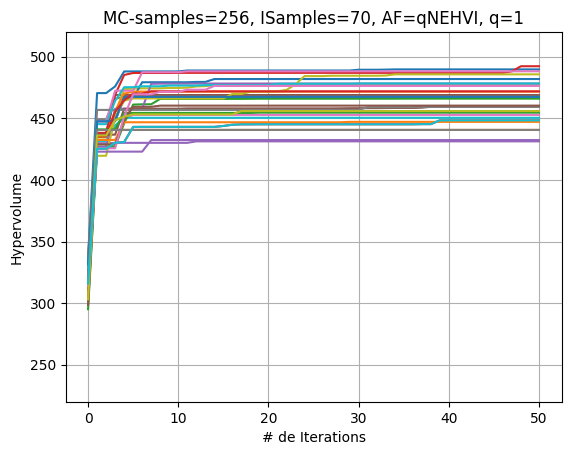

In [28]:
iters = np.arange(51)

for i in range(30):

    plt.errorbar(iters, np.asarray(hvsf27yexp7[i]), linewidth=1.5,label='%i' %i)
    plt.xlabel('# de Iterations')
    plt.ylabel('Hypervolume')
    plt.title('MC-samples=256, ISamples=70, AF=qNEHVI, q=1')
plt.grid()
plt.ylim([220,520])
plt.savefig('Exp7-27July')

In [29]:
%store BDs27yexp7
%store hvsf27yexp7
%store trainxall27yexp7
%store trainobjall27yexp7
%store numbd27yexp7

Stored 'BDs27yexp7' (list)
Stored 'hvsf27yexp7' (list)
Stored 'trainxall27yexp7' (list)
Stored 'trainobjall27yexp7' (list)
Stored 'numbd27yexp7' (list)


In [67]:
BDs27yexp8=[]
hvsf27yexp8=[]
trainxall27yexp8=[]
trainobjall27yexp8=[]
numbd27yexp8=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=80)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp8.append(bd.pareto_Y)      
    hvsf27yexp8.append(hvs_ehvi)   
    trainxall27yexp8.append(train_x_ehvi)
    trainobjall27yexp8.append(train_obj_ehvi)
    numbd27yexp8.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]

Seed: 216


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 438.3675 #Paprox=20 time = 17.14 Lysine= 0.9501 Energy= 14.3942 Costs= 145.7029)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 438.3675 #Paprox=20 time = 17.54 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 438.5090 #Paprox=21 time = 16.86 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 439.1987 #Paprox=22 time = 17.34 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 439.1987 #Paprox=23 time = 17.61 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 453.1441 #Paprox=20 time = 18.02 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 459.1101 #Paprox=21 time = 13.96 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 460.2351 #Paprox=21 time = 13.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 460.2351 #Paprox=22 time = 12.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 460.2351 #Paprox=23 time = 12.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 460.2351 #Paprox=24 time = 13.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 460.2351 #Paprox=25 time = 13.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 460.2351 #Paprox=26 time = 13.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 460.2351 #Paprox=27 time = 13.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 460.2351 #Paprox=28 time = 14.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 460.8765 #Paprox=29 time = 14.09 Lysine= 1.0777 Energy= 14.2117 Costs= 148.9895)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 461.1839 #Paprox=30 time = 14.26 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 461.1839 #Paprox=31 time = 13.97 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 461.1839 #Paprox=32 time = 13.64 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 461.1839 #Paprox=33 time = 13.70 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 461.1839 #Paprox=34 time = 13.89 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 461.1839 #Paprox=35 time = 13.93 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 461.1839 #Paprox=35 time = 14.23 Lysine= 1.1662 Energy= 14.0010 Costs= 151.4451)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 461.1839 #Paprox=36 time = 14.43 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 461.1839 #Paprox=37 time = 14.80 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 461.1839 #Paprox=38 time = 14.47 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 461.1839 #Paprox=39 time = 14.36 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 461.1839 #Paprox=40 time = 14.58 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 461.1839 #Paprox=41 time = 14.88 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 461.1839 #Paprox=42 time = 15.01 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 461.1839 #Paprox=43 time = 15.06 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 461.1839 #Paprox=44 time = 15.00 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 461.1839 #Paprox=45 time = 15.39 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 461.1839 #Paprox=46 time = 15.24 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 461.1839 #Paprox=47 time = 15.23 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 461.1839 #Paprox=48 time = 15.23 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 461.1839 #Paprox=49 time = 15.58 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 461.1839 #Paprox=50 time = 15.43 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 461.1839 #Paprox=51 time = 15.39 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 461.1839 #Paprox=52 time = 15.36 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 461.1839 #Paprox=52 time = 15.69 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 461.1839 #Paprox=53 time = 15.59 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 461.1839 #Paprox=54 time = 15.11 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 461.1839 #Paprox=55 time = 15.46 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 461.1839 #Paprox=56 time = 15.35 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 461.1839 #Paprox=56 time = 15.70 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 461.1839 #Paprox=57 time = 15.71 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 461.1839 #Paprox=57 time = 15.68 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 461.1839 #Paprox=58 time = 16.16 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▎                                       | 1/30 [12:29<6:02:23, 749.78s/it]


Batch 50: Hypervolume (qNEHVI) = 461.1839 #Paprox=59 time = 15.95 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 945


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 460.1544 #Paprox=14 time = 17.44 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 460.1544 #Paprox=14 time = 17.03 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 484.3004 #Paprox=15 time = 17.22 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 484.3004 #Paprox=15 time = 17.68 Lysine= 1.1040 Energy= 14.0010 Costs= 161.1901)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 484.3004 #Paprox=15 time = 18.01 Lysine= 1.2051 Energy= 14.0010 Costs= 157.7905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 484.3004 #Paprox=15 time = 17.95 Lysine= 1.1197 Energy= 14.0010 Costs= 168.5582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 484.3127 #Paprox=16 time = 18.35 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 484.3146 #Paprox=17 time = 18.66 Lysine= 1.2372 Energy= 14.0010 Costs= 154.5161)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 484.3147 #Paprox=18 time = 18.57 Lysine= 1.2453 Energy= 14.0010 Costs= 154.6950)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 484.3147 #Paprox=19 time = 18.71 Lysine= 1.2453 Energy= 14.0010 Costs= 154.6950)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 484.3147 #Paprox=20 time = 18.73 Lysine= 1.2453 Energy= 14.0010 Costs= 154.6950)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 484.3147 #Paprox=21 time = 19.35 Lysine= 1.2372 Energy= 14.0010 Costs= 154.5161)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 484.3147 #Paprox=22 time = 18.84 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 484.3147 #Paprox=23 time = 19.19 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 484.3185 #Paprox=24 time = 19.39 Lysine= 1.2341 Energy= 14.0403 Costs= 154.7042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 484.3185 #Paprox=25 time = 19.60 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 484.3185 #Paprox=26 time = 19.56 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 484.3185 #Paprox=27 time = 19.55 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 484.3185 #Paprox=28 time = 19.60 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 484.3185 #Paprox=29 time = 19.54 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 484.3185 #Paprox=29 time = 19.42 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 484.3185 #Paprox=30 time = 19.68 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 484.3185 #Paprox=31 time = 19.52 Lysine= 1.2453 Energy= 14.0010 Costs= 154.6950)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 484.3185 #Paprox=32 time = 19.97 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 484.3185 #Paprox=33 time = 20.06 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 484.3185 #Paprox=34 time = 20.39 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 484.3185 #Paprox=35 time = 19.77 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 484.3186 #Paprox=34 time = 19.86 Lysine= 1.2382 Energy= 14.0010 Costs= 154.5114)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 484.3186 #Paprox=35 time = 19.86 Lysine= 1.2450 Energy= 14.0010 Costs= 154.6704)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 484.3186 #Paprox=36 time = 20.24 Lysine= 1.2450 Energy= 14.0010 Costs= 154.6704)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 484.3186 #Paprox=37 time = 20.07 Lysine= 1.2382 Energy= 14.0010 Costs= 154.5114)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 484.3186 #Paprox=38 time = 20.23 Lysine= 1.2382 Energy= 14.0010 Costs= 154.5114)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 484.3186 #Paprox=39 time = 20.34 Lysine= 1.2450 Energy= 14.0010 Costs= 154.6704)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 484.3186 #Paprox=40 time = 20.71 Lysine= 1.2382 Energy= 14.0010 Costs= 154.5114)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 484.3186 #Paprox=41 time = 20.60 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 484.3186 #Paprox=42 time = 21.02 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 484.3186 #Paprox=43 time = 20.72 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 484.3186 #Paprox=44 time = 20.59 Lysine= 1.2450 Energy= 14.0010 Costs= 154.6704)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 484.3186 #Paprox=45 time = 20.62 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 484.3186 #Paprox=46 time = 20.92 Lysine= 1.2382 Energy= 14.0010 Costs= 154.5114)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 484.3186 #Paprox=47 time = 20.80 Lysine= 1.2382 Energy= 14.0010 Costs= 154.5114)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 484.3186 #Paprox=47 time = 21.37 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 484.3186 #Paprox=48 time = 21.16 Lysine= 1.2382 Energy= 14.0010 Costs= 154.5114)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 484.3186 #Paprox=49 time = 20.98 Lysine= 1.2450 Energy= 14.0010 Costs= 154.6704)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 484.3186 #Paprox=50 time = 21.06 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 484.3186 #Paprox=50 time = 20.88 Lysine= 1.2450 Energy= 14.0010 Costs= 154.6704)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 484.3186 #Paprox=51 time = 21.40 Lysine= 1.2450 Energy= 14.0010 Costs= 154.6704)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 484.3186 #Paprox=52 time = 21.38 Lysine= 1.2450 Energy= 14.0010 Costs= 154.6704)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 484.3186 #Paprox=53 time = 21.16 Lysine= 1.2450 Energy= 14.0010 Costs= 154.6704)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▋                                      | 2/30 [28:59<6:55:43, 890.84s/it]


Batch 50: Hypervolume (qNEHVI) = 484.3186 #Paprox=54 time = 20.72 Lysine= 1.2450 Energy= 14.0010 Costs= 154.6704)Seed: 696

Batch  1: Hypervolume (qNEHVI) = 423.1615 #Paprox=19 time = 17.92 Lysine= 0.9501 Energy= 14.4465 Costs= 146.2915)
Batch  2: Hypervolume (qNEHVI) = 423.1615 #Paprox=19 time = 17.83 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)
Batch  3: Hypervolume (qNEHVI) = 443.7069 #Paprox=20 time = 18.24 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)
Batch  4: Hypervolume (qNEHVI) = 443.7069 #Paprox=20 time = 18.17 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)
Batch  5: Hypervolume (qNEHVI) = 445.7552 #Paprox=21 time = 17.93 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  6: Hypervolume (qNEHVI) = 448.0843 #Paprox=19 time = 17.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 448.0843 #Paprox=20 time = 15.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  8: Hypervolume (qNEHVI) = 448.0843 #Paprox=21 time = 16.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 448.0843 #Paprox=21 time = 16.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 448.0843 #Paprox=21 time = 17.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 448.0843 #Paprox=21 time = 17.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 448.0843 #Paprox=22 time = 17.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 448.0843 #Paprox=23 time = 17.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 448.0843 #Paprox=24 time = 17.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 448.0843 #Paprox=24 time = 17.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 448.0843 #Paprox=24 time = 17.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 448.0843 #Paprox=24 time = 17.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 448.0843 #Paprox=24 time = 17.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 448.0843 #Paprox=24 time = 17.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 448.0843 #Paprox=24 time = 17.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 448.0843 #Paprox=25 time = 17.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 448.0843 #Paprox=25 time = 18.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 448.0843 #Paprox=25 time = 18.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 448.0843 #Paprox=25 time = 18.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 448.0843 #Paprox=25 time = 18.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 448.0843 #Paprox=25 time = 18.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 448.0843 #Paprox=25 time = 18.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 448.0843 #Paprox=25 time = 18.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 448.0843 #Paprox=25 time = 18.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 448.0843 #Paprox=25 time = 18.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 448.0843 #Paprox=25 time = 19.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 448.0843 #Paprox=26 time = 18.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 448.0843 #Paprox=26 time = 18.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 448.0843 #Paprox=27 time = 18.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 448.0843 #Paprox=27 time = 18.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 448.0843 #Paprox=27 time = 19.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 448.0843 #Paprox=27 time = 18.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 448.0843 #Paprox=27 time = 18.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 448.0843 #Paprox=27 time = 18.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 448.0843 #Paprox=27 time = 18.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 448.0843 #Paprox=27 time = 19.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 448.0843 #Paprox=27 time = 19.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 448.0843 #Paprox=27 time = 19.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 448.0843 #Paprox=27 time = 19.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 448.0843 #Paprox=27 time = 19.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 448.0843 #Paprox=27 time = 19.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 448.0843 #Paprox=28 time = 19.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 448.0843 #Paprox=28 time = 19.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 448.0843 #Paprox=29 time = 18.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|████                                     | 3/30 [44:10<6:45:05, 900.19s/it]


Batch 50: Hypervolume (qNEHVI) = 448.0843 #Paprox=29 time = 18.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 596


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 434.8499 #Paprox=10 time = 16.46 Lysine= 0.9501 Energy= 14.3936 Costs= 145.6934)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 434.8499 #Paprox=10 time = 16.45 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 434.8499 #Paprox=10 time = 17.05 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.6434 #Paprox=11 time = 13.01 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.6434 #Paprox=11 time = 12.59 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.6434 #Paprox=11 time = 13.47 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 479.6928 #Paprox=12 time = 13.98 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 479.6928 #Paprox=12 time = 14.50 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 479.6928 #Paprox=12 time = 14.52 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 479.6928 #Paprox=12 time = 14.93 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 479.6928 #Paprox=12 time = 14.70 Lysine= 1.3260 Energy= 14.0010 Costs= 157.7670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 479.6928 #Paprox=13 time = 14.59 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 479.6928 #Paprox=14 time = 14.98 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 479.6928 #Paprox=14 time = 14.67 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 479.6928 #Paprox=14 time = 14.72 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 479.6928 #Paprox=14 time = 14.87 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 479.6928 #Paprox=15 time = 15.22 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 479.6928 #Paprox=15 time = 14.73 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 479.6928 #Paprox=16 time = 14.57 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 479.6928 #Paprox=16 time = 15.05 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 479.6928 #Paprox=17 time = 14.75 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 479.6928 #Paprox=18 time = 14.91 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 479.6928 #Paprox=18 time = 14.90 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 479.6928 #Paprox=19 time = 15.13 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 479.6928 #Paprox=19 time = 14.63 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 479.6928 #Paprox=19 time = 15.58 Lysine= 0.9501 Energy= 14.0010 Costs= 150.6173)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 479.6928 #Paprox=20 time = 15.41 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 479.6928 #Paprox=21 time = 15.76 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 479.6928 #Paprox=22 time = 15.20 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 479.6928 #Paprox=23 time = 15.32 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 479.6928 #Paprox=23 time = 15.67 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 479.6928 #Paprox=23 time = 15.45 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 479.6928 #Paprox=23 time = 15.67 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 479.6928 #Paprox=24 time = 15.29 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 479.6928 #Paprox=24 time = 15.57 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 479.6928 #Paprox=24 time = 15.71 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 479.6928 #Paprox=25 time = 15.36 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 479.6928 #Paprox=26 time = 15.41 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 479.6928 #Paprox=26 time = 15.91 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 479.6928 #Paprox=27 time = 15.79 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 479.6928 #Paprox=27 time = 15.83 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 479.6928 #Paprox=28 time = 15.92 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 479.6928 #Paprox=28 time = 15.42 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 479.6928 #Paprox=29 time = 15.64 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 479.6928 #Paprox=30 time = 15.67 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 479.6928 #Paprox=30 time = 15.86 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 479.6928 #Paprox=31 time = 15.73 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 484.0581 #Paprox=13 time = 15.96 Lysine= 1.0151 Energy= 14.0010 Costs= 145.2404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 484.1772 #Paprox=14 time = 16.17 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|█████▍                                   | 4/30 [56:53<6:06:31, 845.84s/it]


Batch 50: Hypervolume (qNEHVI) = 484.1772 #Paprox=14 time = 16.73 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)Seed: 387

Batch  1: Hypervolume (qNEHVI) = 429.7791 #Paprox=14 time = 18.01 Lysine= 0.9501 Energy= 14.4179 Costs= 145.9774)
Batch  2: Hypervolume (qNEHVI) = 429.7791 #Paprox=14 time = 17.76 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)
Batch  3: Hypervolume (qNEHVI) = 458.1623 #Paprox=15 time = 17.49 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)
Batch  4: Hypervolume (qNEHVI) = 474.0192 #Paprox=16 time = 17.87 Lysine= 1.1604 Energy= 14.0010 Costs= 149.6270)
Batch  5: Hypervolume (qNEHVI) = 476.6489 #Paprox=14 time = 17.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 476.6489 #Paprox=15 time = 15.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 476.6489 #Paprox=16 time = 15.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 476.6489 #Paprox=15 time = 15.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 476.6489 #Paprox=16 time = 16.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 476.6489 #Paprox=17 time = 16.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.6489 #Paprox=18 time = 16.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 476.6489 #Paprox=19 time = 16.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 476.6489 #Paprox=20 time = 16.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 476.6489 #Paprox=21 time = 17.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 476.6489 #Paprox=22 time = 17.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 476.6489 #Paprox=23 time = 17.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 476.6489 #Paprox=24 time = 17.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 476.6489 #Paprox=25 time = 17.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 476.6489 #Paprox=26 time = 17.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 476.6489 #Paprox=27 time = 17.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 476.6489 #Paprox=28 time = 17.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 476.6489 #Paprox=28 time = 17.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 476.6489 #Paprox=28 time = 17.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 476.6489 #Paprox=29 time = 17.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 476.6489 #Paprox=29 time = 17.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 476.6489 #Paprox=30 time = 17.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 476.6489 #Paprox=31 time = 17.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 476.6489 #Paprox=32 time = 18.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 476.6489 #Paprox=32 time = 18.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 476.6489 #Paprox=33 time = 18.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 476.6489 #Paprox=34 time = 18.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 476.6489 #Paprox=35 time = 18.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 476.6489 #Paprox=35 time = 18.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 476.6489 #Paprox=36 time = 18.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 476.6489 #Paprox=37 time = 18.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 476.6489 #Paprox=38 time = 18.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 476.6489 #Paprox=39 time = 18.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 476.6489 #Paprox=40 time = 18.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 476.6489 #Paprox=41 time = 18.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 476.6489 #Paprox=42 time = 18.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 476.6489 #Paprox=43 time = 18.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 476.6489 #Paprox=44 time = 18.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 476.6489 #Paprox=45 time = 18.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 476.6489 #Paprox=45 time = 18.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 476.6489 #Paprox=46 time = 18.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 476.6489 #Paprox=39 time = 18.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 476.6489 #Paprox=40 time = 18.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 476.6489 #Paprox=41 time = 18.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 476.6489 #Paprox=41 time = 18.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▌                                | 5/30 [1:11:45<5:59:25, 862.63s/it]


Batch 50: Hypervolume (qNEHVI) = 476.6489 #Paprox=42 time = 19.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 276


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 430.3951 #Paprox=20 time = 17.76 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 430.3951 #Paprox=20 time = 17.83 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 430.3951 #Paprox=20 time = 17.84 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)
Batch  4: Hypervolume (qNEHVI) = 450.5568 #Paprox=21 time = 17.71 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 466.6080 #Paprox=22 time = 18.59 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 466.6080 #Paprox=22 time = 17.90 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 466.6080 #Paprox=23 time = 18.56 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 466.6080 #Paprox=23 time = 18.86 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 466.6081 #Paprox=24 time = 18.32 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 466.6081 #Paprox=24 time = 16.45 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 466.6081 #Paprox=25 time = 15.47 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 466.6081 #Paprox=26 time = 14.21 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 466.6081 #Paprox=26 time = 14.26 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 466.6081 #Paprox=27 time = 14.21 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 466.6081 #Paprox=27 time = 14.49 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 466.6081 #Paprox=28 time = 14.13 Lysine= 1.2698 Energy= 14.2888 Costs= 156.7478)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 466.6081 #Paprox=29 time = 13.59 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 466.6081 #Paprox=29 time = 12.63 Lysine= 1.2689 Energy= 14.2724 Costs= 156.5574)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 466.6081 #Paprox=30 time = 11.05 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 466.6081 #Paprox=31 time = 10.51 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 466.6081 #Paprox=32 time = 10.51 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 466.6081 #Paprox=33 time = 10.25 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 466.6081 #Paprox=34 time = 9.78 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 468.7795 #Paprox=35 time = 9.99 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 468.7795 #Paprox=35 time = 9.57 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 468.7816 #Paprox=36 time = 11.08 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 468.8425 #Paprox=37 time = 9.00 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2467)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 468.8425 #Paprox=38 time = 9.66 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2503)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 468.8425 #Paprox=39 time = 9.61 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 468.8425 #Paprox=40 time = 8.88 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 468.8425 #Paprox=41 time = 9.00 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 468.8425 #Paprox=42 time = 9.04 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 468.8425 #Paprox=43 time = 9.24 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 468.8425 #Paprox=44 time = 9.56 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 468.8425 #Paprox=45 time = 9.52 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 468.8425 #Paprox=46 time = 9.31 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 468.8425 #Paprox=47 time = 9.58 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 468.8425 #Paprox=48 time = 9.56 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 468.8425 #Paprox=49 time = 9.55 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 468.8425 #Paprox=50 time = 9.58 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 468.8425 #Paprox=51 time = 9.56 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 468.8425 #Paprox=52 time = 9.53 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 468.8425 #Paprox=53 time = 9.61 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 468.8425 #Paprox=54 time = 9.77 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 468.8425 #Paprox=55 time = 9.54 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 468.8425 #Paprox=55 time = 9.55 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 468.8425 #Paprox=56 time = 10.04 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 468.8425 #Paprox=57 time = 9.79 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2819)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 468.8425 #Paprox=58 time = 10.25 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|███████▊                               | 6/30 [1:21:51<5:10:06, 775.26s/it]


Batch 50: Hypervolume (qNEHVI) = 468.8425 #Paprox=59 time = 10.27 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)Seed: 634


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 465.3403 #Paprox=11 time = 11.49 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 465.3403 #Paprox=11 time = 12.96 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 465.3403 #Paprox=12 time = 13.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 465.3403 #Paprox=13 time = 13.54 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 465.3403 #Paprox=14 time = 14.02 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 465.3403 #Paprox=15 time = 14.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 465.3403 #Paprox=16 time = 14.17 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 465.3403 #Paprox=17 time = 14.77 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 465.3403 #Paprox=18 time = 14.63 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 469.1147 #Paprox=19 time = 15.19 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 469.1147 #Paprox=20 time = 12.84 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 469.1147 #Paprox=21 time = 12.89 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 469.1147 #Paprox=22 time = 13.21 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 469.1147 #Paprox=23 time = 13.21 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 469.1147 #Paprox=24 time = 12.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 469.1147 #Paprox=25 time = 13.43 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 469.1147 #Paprox=26 time = 13.22 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 469.1147 #Paprox=27 time = 13.68 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 469.1147 #Paprox=28 time = 14.03 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 469.1147 #Paprox=29 time = 13.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 469.1147 #Paprox=30 time = 13.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 469.1147 #Paprox=31 time = 13.87 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 469.1147 #Paprox=32 time = 13.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 469.1147 #Paprox=33 time = 13.63 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 469.1147 #Paprox=34 time = 13.66 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 469.1147 #Paprox=35 time = 13.84 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 469.1147 #Paprox=36 time = 14.30 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 469.1147 #Paprox=37 time = 13.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 469.1147 #Paprox=38 time = 14.23 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 469.1147 #Paprox=39 time = 14.70 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 469.1147 #Paprox=40 time = 14.62 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 469.1147 #Paprox=41 time = 14.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 469.1147 #Paprox=42 time = 14.03 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 469.1147 #Paprox=42 time = 14.08 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 469.1148 #Paprox=43 time = 14.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 469.1148 #Paprox=44 time = 14.64 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 469.1148 #Paprox=45 time = 14.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 469.1148 #Paprox=46 time = 14.69 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 469.1148 #Paprox=47 time = 14.87 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 469.1148 #Paprox=48 time = 14.79 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 469.1148 #Paprox=49 time = 15.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 469.1148 #Paprox=50 time = 14.66 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 469.1148 #Paprox=51 time = 14.77 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 469.1148 #Paprox=52 time = 15.54 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 469.1148 #Paprox=52 time = 15.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 469.1148 #Paprox=53 time = 15.30 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 469.1148 #Paprox=54 time = 15.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 469.1148 #Paprox=55 time = 15.36 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 469.1148 #Paprox=56 time = 15.02 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 23%|█████████                              | 7/30 [1:33:39<4:48:47, 753.36s/it]


Batch 50: Hypervolume (qNEHVI) = 469.1148 #Paprox=57 time = 15.24 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)Seed: 717


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 419.7440 #Paprox=19 time = 16.97 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 419.7440 #Paprox=19 time = 16.92 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 419.7440 #Paprox=20 time = 17.13 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 423.3582 #Paprox=21 time = 17.68 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 439.7352 #Paprox=22 time = 17.47 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 441.7482 #Paprox=18 time = 17.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 441.7482 #Paprox=19 time = 15.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 441.8240 #Paprox=20 time = 16.36 Lysine= 1.1235 Energy= 14.4550 Costs= 151.6158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 441.8240 #Paprox=20 time = 16.82 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 441.8240 #Paprox=20 time = 16.20 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 441.8240 #Paprox=20 time = 16.76 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 441.8240 #Paprox=20 time = 16.36 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 441.8240 #Paprox=20 time = 16.41 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 441.8240 #Paprox=21 time = 16.60 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 441.8240 #Paprox=21 time = 16.28 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 441.8240 #Paprox=21 time = 16.59 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 441.8240 #Paprox=21 time = 16.52 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 441.8240 #Paprox=21 time = 16.24 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 441.8240 #Paprox=21 time = 16.39 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 441.8240 #Paprox=22 time = 16.90 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 441.8240 #Paprox=22 time = 16.40 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 441.8240 #Paprox=22 time = 16.45 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 441.8240 #Paprox=22 time = 16.58 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 441.8240 #Paprox=23 time = 16.22 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 441.8240 #Paprox=23 time = 16.06 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 441.8240 #Paprox=23 time = 16.54 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 441.8240 #Paprox=23 time = 16.48 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 444.0328 #Paprox=24 time = 16.42 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 444.0328 #Paprox=24 time = 16.29 Lysine= 1.1370 Energy= 14.0010 Costs= 152.7150)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 444.1142 #Paprox=24 time = 16.49 Lysine= 1.1729 Energy= 14.0010 Costs= 150.4668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 444.1142 #Paprox=24 time = 16.56 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 444.1142 #Paprox=24 time = 16.83 Lysine= 1.1209 Energy= 14.0010 Costs= 153.4164)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 444.1142 #Paprox=25 time = 16.78 Lysine= 1.1064 Energy= 14.0010 Costs= 149.5377)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 444.1142 #Paprox=25 time = 16.99 Lysine= 1.0929 Energy= 14.0010 Costs= 154.6370)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 444.1142 #Paprox=25 time = 16.87 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 444.1142 #Paprox=25 time = 17.01 Lysine= 1.1152 Energy= 14.0010 Costs= 153.6641)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 444.1142 #Paprox=25 time = 16.93 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 444.1142 #Paprox=25 time = 16.91 Lysine= 1.1157 Energy= 14.0010 Costs= 153.6436)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 444.1142 #Paprox=25 time = 16.96 Lysine= 1.1381 Energy= 14.0010 Costs= 152.6706)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 444.1142 #Paprox=26 time = 17.22 Lysine= 1.1611 Energy= 14.0010 Costs= 151.6668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 444.1142 #Paprox=27 time = 17.15 Lysine= 1.1741 Energy= 14.0010 Costs= 151.1030)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 444.1142 #Paprox=28 time = 16.92 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 444.1142 #Paprox=28 time = 17.96 Lysine= 1.1703 Energy= 14.0010 Costs= 151.2659)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 444.1142 #Paprox=28 time = 17.52 Lysine= 1.1655 Energy= 14.0010 Costs= 151.4739)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 444.1142 #Paprox=25 time = 17.81 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 444.1142 #Paprox=26 time = 17.48 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 444.1142 #Paprox=27 time = 17.73 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 444.1142 #Paprox=27 time = 17.70 Lysine= 1.1761 Energy= 14.0010 Costs= 151.0150)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 444.1142 #Paprox=28 time = 17.95 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 27%|██████████▍                            | 8/30 [1:47:43<4:46:45, 782.05s/it]


Batch 50: Hypervolume (qNEHVI) = 444.1142 #Paprox=29 time = 17.96 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 450


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 471.2714 #Paprox=21 time = 18.73 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 471.2714 #Paprox=21 time = 17.16 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 473.4004 #Paprox=22 time = 17.34 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 477.6134 #Paprox=23 time = 17.94 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 477.6252 #Paprox=24 time = 17.15 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 477.7084 #Paprox=25 time = 17.48 Lysine= 1.1861 Energy= 14.0212 Costs= 150.9334)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 477.7084 #Paprox=25 time = 17.78 Lysine= 1.4187 Energy= 14.0010 Costs= 165.8433)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 477.7084 #Paprox=25 time = 18.52 Lysine= 1.1643 Energy= 14.0010 Costs= 154.0302)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 477.7084 #Paprox=25 time = 18.52 Lysine= 1.1428 Energy= 14.0010 Costs= 153.3707)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 477.7084 #Paprox=25 time = 17.99 Lysine= 1.1351 Energy= 14.0010 Costs= 153.1530)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 478.3842 #Paprox=26 time = 18.30 Lysine= 1.0175 Energy= 14.0010 Costs= 150.2177)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 478.3842 #Paprox=26 time = 18.61 Lysine= 1.1330 Energy= 14.0010 Costs= 153.1130)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 478.3842 #Paprox=26 time = 19.18 Lysine= 1.0989 Energy= 14.0010 Costs= 152.4578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 478.8208 #Paprox=27 time = 18.60 Lysine= 0.9781 Energy= 14.0010 Costs= 149.1056)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 479.2395 #Paprox=28 time = 18.98 Lysine= 0.9597 Energy= 14.0010 Costs= 145.9985)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 479.4119 #Paprox=29 time = 18.30 Lysine= 0.9954 Energy= 14.0010 Costs= 149.5040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 479.4275 #Paprox=30 time = 19.02 Lysine= 0.9919 Energy= 14.0010 Costs= 149.4226)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 481.1653 #Paprox=31 time = 19.08 Lysine= 0.9501 Energy= 14.0010 Costs= 144.1207)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 481.1653 #Paprox=31 time = 19.42 Lysine= 0.9501 Energy= 14.0010 Costs= 146.8024)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 481.1653 #Paprox=31 time = 19.11 Lysine= 0.9501 Energy= 14.0010 Costs= 144.8752)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 481.1653 #Paprox=32 time = 19.60 Lysine= 0.9501 Energy= 14.0010 Costs= 147.3564)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 481.1653 #Paprox=33 time = 19.17 Lysine= 0.9501 Energy= 14.0010 Costs= 144.6940)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 481.1653 #Paprox=34 time = 19.25 Lysine= 0.9501 Energy= 14.0010 Costs= 146.0968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 482.3923 #Paprox=34 time = 19.19 Lysine= 1.1153 Energy= 14.0010 Costs= 150.0704)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 483.2913 #Paprox=35 time = 19.59 Lysine= 1.1121 Energy= 14.0010 Costs= 149.5203)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 483.2913 #Paprox=35 time = 19.56 Lysine= 0.9501 Energy= 14.0010 Costs= 146.7921)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 484.1729 #Paprox=36 time = 20.00 Lysine= 1.1093 Energy= 14.0010 Costs= 149.0390)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 484.1804 #Paprox=37 time = 19.66 Lysine= 1.1160 Energy= 14.0010 Costs= 150.1958)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 484.1804 #Paprox=37 time = 19.62 Lysine= 1.1740 Energy= 14.0010 Costs= 152.4712)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 484.1804 #Paprox=37 time = 19.57 Lysine= 1.1261 Energy= 14.0010 Costs= 151.9309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 484.5148 #Paprox=38 time = 19.73 Lysine= 1.3124 Energy= 14.0010 Costs= 156.2526)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 487.4897 #Paprox=38 time = 20.12 Lysine= 1.1217 Energy= 14.0010 Costs= 147.8278)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 490.7828 #Paprox=38 time = 20.28 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 492.3662 #Paprox=37 time = 20.38 Lysine= 1.1883 Energy= 14.0010 Costs= 149.2360)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 493.0372 #Paprox=38 time = 20.18 Lysine= 1.2971 Energy= 14.0010 Costs= 154.8332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 493.9620 #Paprox=39 time = 20.35 Lysine= 1.2765 Energy= 14.0010 Costs= 153.8083)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 494.0323 #Paprox=40 time = 20.56 Lysine= 1.2338 Energy= 14.0010 Costs= 153.5778)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 494.2726 #Paprox=40 time = 20.32 Lysine= 1.1994 Energy= 14.2512 Costs= 151.2846)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 494.2726 #Paprox=40 time = 20.15 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3053)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 494.2726 #Paprox=40 time = 20.30 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 494.5192 #Paprox=41 time = 20.50 Lysine= 1.3125 Energy= 14.0010 Costs= 155.1151)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 496.5887 #Paprox=41 time = 20.82 Lysine= 1.2596 Energy= 14.0010 Costs= 150.9668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 496.5887 #Paprox=41 time = 20.62 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2511)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 496.5887 #Paprox=42 time = 20.77 Lysine= 1.2596 Energy= 14.0010 Costs= 150.9668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 496.5887 #Paprox=42 time = 21.25 Lysine= 1.2496 Energy= 14.0010 Costs= 151.0788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 496.5887 #Paprox=42 time = 21.37 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 496.5887 #Paprox=42 time = 21.10 Lysine= 1.2807 Energy= 14.0010 Costs= 155.5282)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 496.5887 #Paprox=42 time = 21.55 Lysine= 1.0644 Energy= 14.0010 Costs= 151.0376)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 496.5887 #Paprox=42 time = 21.61 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 30%|███████████▋                           | 9/30 [2:04:00<4:55:05, 843.13s/it]


Batch 50: Hypervolume (qNEHVI) = 496.5887 #Paprox=42 time = 21.95 Lysine= 1.2663 Energy= 14.0010 Costs= 154.3961)Seed: 900


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 416.3530 #Paprox=14 time = 17.54 Lysine= 0.9501 Energy= 14.4610 Costs= 146.4509)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 416.3530 #Paprox=14 time = 17.39 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 416.3530 #Paprox=14 time = 17.91 Lysine= 1.2125 Energy= 14.0010 Costs= 160.2065)
Batch  4: Hypervolume (qNEHVI) = 445.8509 #Paprox=15 time = 18.17 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 460.0026 #Paprox=16 time = 18.54 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 460.0026 #Paprox=17 time = 19.39 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 460.0026 #Paprox=18 time = 18.64 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 460.0026 #Paprox=19 time = 18.75 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 460.0026 #Paprox=20 time = 18.79 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 460.0026 #Paprox=21 time = 18.79 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 460.0026 #Paprox=22 time = 18.76 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 460.0026 #Paprox=23 time = 19.01 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 460.0026 #Paprox=24 time = 19.34 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 460.0026 #Paprox=25 time = 18.78 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 460.0026 #Paprox=26 time = 19.19 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 460.0026 #Paprox=27 time = 19.23 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 460.0026 #Paprox=28 time = 19.19 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 460.0026 #Paprox=29 time = 19.29 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 460.0026 #Paprox=30 time = 19.11 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 460.0026 #Paprox=31 time = 19.08 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 464.6632 #Paprox=32 time = 19.01 Lysine= 1.1144 Energy= 14.0010 Costs= 147.9483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 465.0099 #Paprox=33 time = 19.29 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 465.0099 #Paprox=34 time = 19.32 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 465.0099 #Paprox=35 time = 19.55 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 465.0099 #Paprox=36 time = 20.26 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 465.0099 #Paprox=37 time = 19.68 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 465.0099 #Paprox=38 time = 19.61 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 465.0099 #Paprox=39 time = 19.87 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 465.0099 #Paprox=40 time = 20.07 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 465.0099 #Paprox=40 time = 20.23 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 465.0099 #Paprox=41 time = 20.12 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 465.0099 #Paprox=42 time = 20.38 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 465.0099 #Paprox=43 time = 20.04 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 465.0099 #Paprox=43 time = 20.20 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 465.0099 #Paprox=44 time = 20.20 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 465.0099 #Paprox=45 time = 20.49 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 465.0099 #Paprox=46 time = 20.56 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 465.0099 #Paprox=47 time = 20.67 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 465.0099 #Paprox=48 time = 20.56 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 465.0099 #Paprox=49 time = 20.54 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 465.0099 #Paprox=50 time = 20.67 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 465.0099 #Paprox=51 time = 20.39 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 465.0099 #Paprox=52 time = 20.51 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 465.0099 #Paprox=52 time = 20.77 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 465.0099 #Paprox=52 time = 20.88 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 465.0099 #Paprox=53 time = 20.49 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 465.0099 #Paprox=54 time = 20.85 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 465.0099 #Paprox=55 time = 20.97 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 465.0099 #Paprox=56 time = 21.60 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|████████████▋                         | 10/30 [2:20:25<4:55:36, 886.81s/it]


Batch 50: Hypervolume (qNEHVI) = 465.0099 #Paprox=56 time = 20.80 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)Seed: 932


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 434.8784 #Paprox=21 time = 17.98 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 434.8784 #Paprox=21 time = 18.03 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 453.7550 #Paprox=22 time = 18.29 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 453.7550 #Paprox=22 time = 17.94 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 453.7550 #Paprox=22 time = 18.52 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 453.7550 #Paprox=22 time = 18.23 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 453.7550 #Paprox=22 time = 18.50 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 453.7550 #Paprox=22 time = 18.39 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 453.7550 #Paprox=22 time = 18.77 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 453.7550 #Paprox=22 time = 18.96 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 453.7550 #Paprox=22 time = 19.07 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 468.8273 #Paprox=23 time = 19.75 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 468.8273 #Paprox=23 time = 19.04 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 468.8273 #Paprox=23 time = 18.83 Lysine= 1.2056 Energy= 14.0010 Costs= 178.2149)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 472.0066 #Paprox=24 time = 18.92 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 481.0291 #Paprox=25 time = 19.50 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 481.0291 #Paprox=26 time = 19.31 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 481.0291 #Paprox=27 time = 20.01 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 481.0291 #Paprox=27 time = 20.23 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 481.0291 #Paprox=27 time = 19.67 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 481.0291 #Paprox=27 time = 20.31 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 481.0291 #Paprox=27 time = 20.30 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 481.0291 #Paprox=27 time = 20.42 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 481.0291 #Paprox=27 time = 20.42 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 481.0291 #Paprox=27 time = 20.80 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 481.0291 #Paprox=27 time = 21.44 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 481.0291 #Paprox=27 time = 20.36 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.14 Lysine= 1.3567 Energy= 14.0010 Costs= 152.2594)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.52 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.13 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.19 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 19.79 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.12 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.57 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.56 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.49 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.53 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 19.95 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.65 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.69 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.58 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.69 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.59 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.53 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.63 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.25 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.47 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.80 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.59 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 37%|█████████████▉                        | 11/30 [2:36:58<4:51:07, 919.32s/it]


Batch 50: Hypervolume (qNEHVI) = 491.9782 #Paprox=28 time = 20.32 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)Seed: 288

Batch  1: Hypervolume (qNEHVI) = 452.3649 #Paprox=15 time = 17.90 Lysine= 0.9501 Energy= 14.4335 Costs= 146.1495)
Batch  2: Hypervolume (qNEHVI) = 452.3649 #Paprox=15 time = 17.78 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 453.2102 #Paprox=16 time = 17.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 453.2102 #Paprox=17 time = 18.80 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 453.2102 #Paprox=18 time = 17.95 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 453.2102 #Paprox=19 time = 18.20 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 453.2102 #Paprox=19 time = 18.48 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 478.6663 #Paprox=20 time = 18.59 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 497.1886 #Paprox=21 time = 18.88 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 497.1886 #Paprox=21 time = 18.86 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 497.1886 #Paprox=21 time = 18.88 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 497.2291 #Paprox=22 time = 18.77 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 497.2291 #Paprox=23 time = 18.78 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 497.2291 #Paprox=24 time = 19.11 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 497.2291 #Paprox=25 time = 19.37 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 497.2291 #Paprox=26 time = 19.40 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 497.2291 #Paprox=27 time = 19.25 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 19.46 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 19.41 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 21.04 Lysine= 1.5086 Energy= 14.0010 Costs= 168.3019)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 20.55 Lysine= 1.4929 Energy= 14.0010 Costs= 167.8105)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 21.12 Lysine= 1.4674 Energy= 14.0010 Costs= 167.0805)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 20.42 Lysine= 1.4776 Energy= 14.0010 Costs= 167.4058)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 20.57 Lysine= 1.4622 Energy= 14.0010 Costs= 166.9549)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 21.41 Lysine= 1.4447 Energy= 14.0010 Costs= 162.6945)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 21.51 Lysine= 1.4307 Energy= 14.0010 Costs= 165.8986)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 21.00 Lysine= 1.4178 Energy= 14.0010 Costs= 162.4460)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 22.19 Lysine= 1.4501 Energy= 14.0010 Costs= 165.1496)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 22.09 Lysine= 1.4512 Energy= 14.0010 Costs= 165.5028)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 22.97 Lysine= 1.4526 Energy= 14.0010 Costs= 165.9453)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 21.18 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 21.45 Lysine= 1.2867 Energy= 14.0010 Costs= 160.0228)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 22.34 Lysine= 1.4499 Energy= 14.0010 Costs= 165.1081)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 23.37 Lysine= 1.4479 Energy= 14.0010 Costs= 164.4655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 22.01 Lysine= 1.4553 Energy= 14.0010 Costs= 166.7916)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 21.74 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 22.17 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 22.61 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 22.57 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 497.2291 #Paprox=28 time = 22.60 Lysine= 1.4691 Energy= 14.0010 Costs= 163.9489)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 500.0142 #Paprox=29 time = 21.68 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 500.0142 #Paprox=30 time = 21.62 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 500.0142 #Paprox=31 time = 21.89 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 500.7269 #Paprox=32 time = 23.04 Lysine= 1.0808 Energy= 14.0010 Costs= 148.3237)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 500.7269 #Paprox=32 time = 22.26 Lysine= 1.4149 Energy= 14.0010 Costs= 160.2336)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 500.7269 #Paprox=32 time = 24.32 Lysine= 1.4088 Energy= 14.0010 Costs= 158.5040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 500.7269 #Paprox=32 time = 22.78 Lysine= 1.4147 Energy= 14.0010 Costs= 160.1886)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 500.7521 #Paprox=33 time = 23.10 Lysine= 1.4082 Energy= 14.0010 Costs= 158.3332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 500.9719 #Paprox=34 time = 23.06 Lysine= 1.4063 Energy= 14.0010 Costs= 157.7982)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 40%|███████████████▏                      | 12/30 [2:54:19<4:46:53, 956.31s/it]


Batch 50: Hypervolume (qNEHVI) = 500.9738 #Paprox=35 time = 23.53 Lysine= 1.4079 Energy= 14.0010 Costs= 158.2472)Seed: 50


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 426.4124 #Paprox=9 time = 12.86 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 426.4124 #Paprox=9 time = 13.43 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 450.5584 #Paprox=10 time = 13.53 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 468.5646 #Paprox=11 time = 14.59 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 468.5646 #Paprox=12 time = 13.88 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 471.5422 #Paprox=12 time = 14.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 471.5422 #Paprox=13 time = 13.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 471.5422 #Paprox=14 time = 13.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 471.5422 #Paprox=15 time = 14.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 471.5422 #Paprox=16 time = 14.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 471.5422 #Paprox=17 time = 14.58 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 471.5422 #Paprox=18 time = 14.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 471.5422 #Paprox=19 time = 14.79 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 471.5422 #Paprox=20 time = 15.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 471.5422 #Paprox=21 time = 15.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 471.5422 #Paprox=22 time = 15.29 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 471.5422 #Paprox=23 time = 15.14 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 471.5422 #Paprox=23 time = 15.32 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 471.5422 #Paprox=24 time = 15.41 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 471.5422 #Paprox=25 time = 15.68 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 471.5422 #Paprox=25 time = 15.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 471.5422 #Paprox=26 time = 15.67 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 471.5422 #Paprox=27 time = 15.73 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 471.5422 #Paprox=28 time = 15.85 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 471.5422 #Paprox=29 time = 15.98 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 471.5422 #Paprox=29 time = 15.64 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 471.5422 #Paprox=30 time = 16.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 471.5422 #Paprox=31 time = 16.08 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 471.5422 #Paprox=32 time = 16.24 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 471.5422 #Paprox=33 time = 16.04 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 471.5422 #Paprox=34 time = 16.49 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 471.5422 #Paprox=35 time = 16.32 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 471.5422 #Paprox=36 time = 16.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 471.5422 #Paprox=34 time = 16.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 471.5422 #Paprox=35 time = 16.52 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 471.5422 #Paprox=36 time = 16.57 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 471.5422 #Paprox=36 time = 16.70 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 471.5422 #Paprox=37 time = 16.78 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 471.5422 #Paprox=38 time = 16.58 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 471.5422 #Paprox=39 time = 16.54 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 471.5422 #Paprox=40 time = 16.76 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 471.5422 #Paprox=41 time = 16.95 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 471.5422 #Paprox=42 time = 16.95 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 471.5422 #Paprox=42 time = 16.84 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 471.5422 #Paprox=42 time = 17.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 471.5422 #Paprox=43 time = 17.39 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 471.5422 #Paprox=44 time = 16.86 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 471.5422 #Paprox=45 time = 16.94 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 471.5422 #Paprox=46 time = 17.14 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 43%|████████████████▍                     | 13/30 [3:07:25<4:16:22, 904.88s/it]


Batch 50: Hypervolume (qNEHVI) = 471.5422 #Paprox=47 time = 17.27 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)Seed: 64


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 427.2851 #Paprox=27 time = 17.49 Lysine= 0.9501 Energy= 14.3898 Costs= 145.6571)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 427.2851 #Paprox=27 time = 18.21 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 446.1374 #Paprox=28 time = 18.06 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 446.1374 #Paprox=28 time = 17.63 Lysine= 1.1511 Energy= 14.0010 Costs= 164.4695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 446.1784 #Paprox=29 time = 18.27 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 446.7647 #Paprox=30 time = 17.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)
Batch  7: Hypervolume (qNEHVI) = 446.7647 #Paprox=30 time = 17.93 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)
Batch  8: Hypervolume (qNEHVI) = 446.7763 #Paprox=31 time = 18.60 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 446.7763 #Paprox=32 time = 18.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 446.7790 #Paprox=33 time = 18.19 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 446.7790 #Paprox=34 time = 18.13 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 446.7790 #Paprox=35 time = 18.53 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 446.7790 #Paprox=35 time = 18.75 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 446.7790 #Paprox=36 time = 18.62 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 446.7790 #Paprox=37 time = 19.03 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 446.7790 #Paprox=37 time = 19.23 Lysine= 0.9501 Energy= 14.3716 Costs= 150.2576)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 446.7790 #Paprox=38 time = 18.73 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 446.7790 #Paprox=39 time = 18.79 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 446.7790 #Paprox=40 time = 18.90 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 446.7790 #Paprox=40 time = 19.15 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 446.7790 #Paprox=41 time = 19.10 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 446.7790 #Paprox=42 time = 19.43 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 446.7790 #Paprox=43 time = 19.28 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 446.7790 #Paprox=44 time = 18.98 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 446.7790 #Paprox=45 time = 19.91 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 446.7790 #Paprox=46 time = 19.35 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 446.7790 #Paprox=47 time = 19.93 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 446.7790 #Paprox=48 time = 20.15 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 446.7790 #Paprox=48 time = 19.65 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 446.7790 #Paprox=49 time = 19.84 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 446.7790 #Paprox=50 time = 20.10 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 446.7790 #Paprox=51 time = 19.83 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 446.7790 #Paprox=52 time = 19.77 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 446.7790 #Paprox=53 time = 20.11 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 446.7790 #Paprox=54 time = 19.87 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 446.7790 #Paprox=55 time = 19.94 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 446.7790 #Paprox=56 time = 20.12 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 446.7790 #Paprox=57 time = 19.91 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 446.7790 #Paprox=58 time = 20.11 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 446.7790 #Paprox=59 time = 20.42 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 446.7790 #Paprox=60 time = 20.36 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 446.7790 #Paprox=61 time = 20.46 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 446.7790 #Paprox=62 time = 20.51 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 446.7790 #Paprox=63 time = 20.33 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 446.7790 #Paprox=64 time = 20.68 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 446.7790 #Paprox=65 time = 20.87 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 446.7790 #Paprox=66 time = 20.94 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 446.7790 #Paprox=67 time = 20.88 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 446.7790 #Paprox=67 time = 20.89 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 47%|█████████████████▋                    | 14/30 [3:23:37<4:06:44, 925.29s/it]


Batch 50: Hypervolume (qNEHVI) = 446.7790 #Paprox=68 time = 20.99 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)Seed: 27


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 431.5701 #Paprox=9 time = 16.70 Lysine= 0.9501 Energy= 14.4548 Costs= 146.3838)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 431.5701 #Paprox=9 time = 16.34 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 431.9411 #Paprox=10 time = 17.38 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 431.9411 #Paprox=11 time = 16.78 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 431.9411 #Paprox=12 time = 17.23 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 431.9411 #Paprox=13 time = 17.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 431.9411 #Paprox=14 time = 17.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 431.9411 #Paprox=15 time = 17.40 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 431.9411 #Paprox=16 time = 17.31 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 460.5389 #Paprox=17 time = 17.25 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.3972 #Paprox=17 time = 17.00 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 483.6756 #Paprox=18 time = 13.38 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 483.6756 #Paprox=18 time = 13.52 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 483.6780 #Paprox=19 time = 13.04 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 483.6784 #Paprox=20 time = 13.37 Lysine= 1.1909 Energy= 14.0484 Costs= 151.2039)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 483.6784 #Paprox=20 time = 13.85 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 483.6784 #Paprox=20 time = 14.28 Lysine= 1.4779 Energy= 14.0010 Costs= 166.5059)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 484.0181 #Paprox=21 time = 14.12 Lysine= 1.5656 Energy= 14.0010 Costs= 169.6198)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 484.0181 #Paprox=21 time = 14.36 Lysine= 1.0278 Energy= 14.0010 Costs= 156.4529)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 484.0181 #Paprox=21 time = 14.42 Lysine= 1.0618 Energy= 14.0010 Costs= 151.5965)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 484.0181 #Paprox=21 time = 14.59 Lysine= 1.0561 Energy= 14.0010 Costs= 154.4402)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 484.0181 #Paprox=21 time = 14.43 Lysine= 1.0033 Energy= 14.0010 Costs= 157.1162)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 484.0181 #Paprox=21 time = 14.85 Lysine= 1.4227 Energy= 14.0010 Costs= 166.1058)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 484.0181 #Paprox=21 time = 14.55 Lysine= 1.1315 Energy= 14.0010 Costs= 159.8682)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 484.0181 #Paprox=21 time = 14.97 Lysine= 0.9712 Energy= 14.0010 Costs= 156.4095)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 484.0181 #Paprox=21 time = 15.14 Lysine= 1.4326 Energy= 14.0010 Costs= 166.2748)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 484.0181 #Paprox=21 time = 15.25 Lysine= 0.9908 Energy= 14.0010 Costs= 156.9567)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 15.20 Lysine= 0.9524 Energy= 14.0010 Costs= 148.9639)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 15.63 Lysine= 1.0332 Energy= 14.0010 Costs= 158.0384)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 15.31 Lysine= 1.3418 Energy= 14.0010 Costs= 164.3813)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 15.31 Lysine= 1.4396 Energy= 14.0010 Costs= 166.4792)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 15.76 Lysine= 1.4098 Energy= 14.0010 Costs= 159.5929)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 15.85 Lysine= 1.4396 Energy= 14.0010 Costs= 166.4792)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 15.73 Lysine= 1.4396 Energy= 14.0010 Costs= 166.4792)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 15.86 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 15.90 Lysine= 1.2955 Energy= 14.0010 Costs= 156.6925)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 16.26 Lysine= 1.3881 Energy= 14.0010 Costs= 162.3489)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 16.40 Lysine= 1.4084 Energy= 14.0010 Costs= 163.9252)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 16.41 Lysine= 1.3880 Energy= 14.0010 Costs= 162.3414)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 17.77 Lysine= 1.4129 Energy= 14.0010 Costs= 164.6481)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 16.43 Lysine= 1.3353 Energy= 14.0010 Costs= 158.7219)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 16.52 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 16.71 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 16.68 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 17.12 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 16.91 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 17.82 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 17.54 Lysine= 1.3813 Energy= 14.0010 Costs= 161.8211)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 17.46 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 50%|███████████████████                   | 15/30 [3:36:53<3:41:30, 886.03s/it]


Batch 50: Hypervolume (qNEHVI) = 484.0523 #Paprox=22 time = 17.46 Lysine= 1.3813 Energy= 14.0010 Costs= 161.8210)Seed: 382


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 438.5346 #Paprox=17 time = 17.41 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 438.5346 #Paprox=17 time = 16.93 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 454.8468 #Paprox=18 time = 17.07 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 454.8468 #Paprox=19 time = 17.90 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 454.8468 #Paprox=20 time = 17.53 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 454.8468 #Paprox=21 time = 17.51 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 454.8468 #Paprox=22 time = 17.99 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 454.8468 #Paprox=23 time = 17.72 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 454.8468 #Paprox=23 time = 18.07 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 454.8468 #Paprox=23 time = 18.19 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 454.8468 #Paprox=23 time = 18.10 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 454.8468 #Paprox=24 time = 17.85 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 454.8468 #Paprox=25 time = 18.07 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 454.8468 #Paprox=26 time = 18.00 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 454.8468 #Paprox=27 time = 17.97 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 454.8468 #Paprox=28 time = 18.42 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 454.8468 #Paprox=28 time = 18.62 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 454.8468 #Paprox=28 time = 18.57 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 454.8468 #Paprox=28 time = 18.39 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 454.8468 #Paprox=28 time = 18.71 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 454.8468 #Paprox=29 time = 18.62 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 454.8468 #Paprox=30 time = 18.13 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 454.8468 #Paprox=31 time = 18.57 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 454.8468 #Paprox=31 time = 18.80 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 454.8468 #Paprox=31 time = 18.53 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 454.8468 #Paprox=31 time = 18.59 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 454.8468 #Paprox=32 time = 18.65 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 454.8468 #Paprox=33 time = 18.94 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 454.8468 #Paprox=34 time = 19.10 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 454.8468 #Paprox=35 time = 19.06 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 454.8468 #Paprox=36 time = 19.30 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 454.8468 #Paprox=36 time = 19.06 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 454.8468 #Paprox=37 time = 19.13 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 454.8468 #Paprox=38 time = 19.01 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 454.8468 #Paprox=39 time = 19.28 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 454.8468 #Paprox=39 time = 19.42 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 454.8468 #Paprox=40 time = 19.51 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 454.8468 #Paprox=41 time = 19.30 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 454.8468 #Paprox=41 time = 19.44 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 454.8468 #Paprox=41 time = 19.56 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 454.8468 #Paprox=41 time = 19.69 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 454.8468 #Paprox=42 time = 19.68 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 454.8468 #Paprox=43 time = 19.74 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 454.8468 #Paprox=43 time = 19.31 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 454.8468 #Paprox=44 time = 19.70 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 454.8468 #Paprox=45 time = 19.27 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 454.8468 #Paprox=46 time = 19.13 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 454.8468 #Paprox=46 time = 19.70 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 454.8468 #Paprox=47 time = 19.55 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 53%|████████████████████▎                 | 16/30 [3:52:28<3:30:11, 900.84s/it]


Batch 50: Hypervolume (qNEHVI) = 454.8468 #Paprox=48 time = 19.34 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)Seed: 295


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 426.4758 #Paprox=22 time = 17.17 Lysine= 0.9501 Energy= 14.4135 Costs= 147.8240)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 426.4758 #Paprox=22 time = 17.55 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 431.0467 #Paprox=22 time = 17.28 Lysine= 0.9501 Energy= 14.4212 Costs= 147.4960)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 431.1060 #Paprox=23 time = 17.59 Lysine= 0.9501 Energy= 14.4295 Costs= 150.6442)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 431.3212 #Paprox=24 time = 17.86 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 431.3212 #Paprox=25 time = 17.77 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 431.3980 #Paprox=26 time = 18.05 Lysine= 0.9501 Energy= 14.4722 Costs= 151.1048)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 431.4003 #Paprox=27 time = 18.23 Lysine= 0.9501 Energy= 14.4726 Costs= 151.3472)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 431.5547 #Paprox=28 time = 18.31 Lysine= 0.9501 Energy= 14.4848 Costs= 151.2927)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 431.9214 #Paprox=29 time = 18.40 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 431.9214 #Paprox=30 time = 18.58 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 431.9214 #Paprox=31 time = 18.89 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 431.9216 #Paprox=32 time = 18.93 Lysine= 0.9501 Energy= 14.5053 Costs= 151.6007)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 431.9219 #Paprox=33 time = 18.74 Lysine= 0.9501 Energy= 14.5021 Costs= 151.5830)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 431.9223 #Paprox=34 time = 18.98 Lysine= 0.9501 Energy= 14.4944 Costs= 151.5314)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 431.9223 #Paprox=34 time = 19.03 Lysine= 0.9501 Energy= 14.3937 Costs= 151.3606)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 431.9223 #Paprox=35 time = 19.28 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 431.9224 #Paprox=36 time = 19.77 Lysine= 0.9501 Energy= 14.4963 Costs= 151.5440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 431.9225 #Paprox=37 time = 19.29 Lysine= 0.9501 Energy= 14.4923 Costs= 151.5170)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 431.9231 #Paprox=35 time = 19.60 Lysine= 0.9501 Energy= 14.4969 Costs= 151.4754)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 431.9231 #Paprox=35 time = 19.31 Lysine= 0.9501 Energy= 14.4879 Costs= 151.5079)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 431.9231 #Paprox=36 time = 19.44 Lysine= 0.9501 Energy= 14.4986 Costs= 151.5592)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 431.9232 #Paprox=37 time = 19.73 Lysine= 0.9501 Energy= 14.4997 Costs= 151.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 431.9232 #Paprox=38 time = 19.83 Lysine= 0.9501 Energy= 14.4985 Costs= 151.5589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 431.9232 #Paprox=39 time = 19.85 Lysine= 0.9501 Energy= 14.4968 Costs= 151.5476)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 431.9232 #Paprox=39 time = 19.83 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 431.9232 #Paprox=40 time = 20.21 Lysine= 0.9501 Energy= 14.4972 Costs= 151.5500)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 431.9232 #Paprox=41 time = 20.15 Lysine= 0.9501 Energy= 14.5032 Costs= 151.5901)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 431.9232 #Paprox=42 time = 20.15 Lysine= 0.9501 Energy= 14.4977 Costs= 151.5534)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 431.9232 #Paprox=43 time = 20.93 Lysine= 0.9501 Energy= 14.4984 Costs= 151.5580)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 431.9232 #Paprox=43 time = 20.07 Lysine= 0.9501 Energy= 14.4958 Costs= 151.5406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 431.9232 #Paprox=44 time = 20.25 Lysine= 0.9501 Energy= 14.5021 Costs= 151.5833)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 431.9232 #Paprox=45 time = 20.44 Lysine= 0.9501 Energy= 14.4978 Costs= 151.5541)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 431.9233 #Paprox=41 time = 20.69 Lysine= 0.9501 Energy= 14.5012 Costs= 151.5436)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 431.9233 #Paprox=41 time = 20.46 Lysine= 0.9501 Energy= 14.4385 Costs= 151.5894)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 431.9233 #Paprox=41 time = 20.72 Lysine= 0.9501 Energy= 14.4929 Costs= 151.5213)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 431.9233 #Paprox=41 time = 21.13 Lysine= 0.9501 Energy= 14.4965 Costs= 151.5457)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 431.9233 #Paprox=41 time = 20.55 Lysine= 0.9501 Energy= 14.4977 Costs= 151.5538)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 431.9233 #Paprox=42 time = 20.62 Lysine= 0.9501 Energy= 14.5014 Costs= 151.5783)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 431.9233 #Paprox=42 time = 20.51 Lysine= 0.9501 Energy= 14.4993 Costs= 151.5441)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 431.9233 #Paprox=42 time = 20.66 Lysine= 0.9501 Energy= 14.4967 Costs= 151.5466)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 431.9233 #Paprox=43 time = 20.93 Lysine= 0.9501 Energy= 14.5011 Costs= 151.5761)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 431.9233 #Paprox=43 time = 21.20 Lysine= 0.9501 Energy= 14.4947 Costs= 151.5334)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 431.9233 #Paprox=43 time = 20.59 Lysine= 0.9501 Energy= 14.4967 Costs= 151.5470)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 431.9233 #Paprox=44 time = 20.91 Lysine= 0.9501 Energy= 14.4974 Costs= 151.5517)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 431.9233 #Paprox=44 time = 21.25 Lysine= 0.9501 Energy= 14.4939 Costs= 151.5282)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 431.9233 #Paprox=44 time = 21.03 Lysine= 0.9501 Energy= 14.4935 Costs= 151.5252)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 431.9233 #Paprox=44 time = 21.77 Lysine= 0.9501 Energy= 14.4906 Costs= 151.5056)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 432.0436 #Paprox=40 time = 21.75 Lysine= 1.1687 Energy= 14.4945 Costs= 156.1793)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 57%|█████████████████████▌                | 17/30 [4:08:54<3:20:43, 926.40s/it]


Batch 50: Hypervolume (qNEHVI) = 432.1686 #Paprox=40 time = 20.48 Lysine= 1.2284 Energy= 14.5042 Costs= 157.2035)Seed: 26

Batch  1: Hypervolume (qNEHVI) = 429.3398 #Paprox=17 time = 18.28 Lysine= 0.9501 Energy= 14.3923 Costs= 145.6738)
Batch  2: Hypervolume (qNEHVI) = 429.3398 #Paprox=17 time = 18.34 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 444.5548 #Paprox=18 time = 18.32 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)
Batch  4: Hypervolume (qNEHVI) = 444.6064 #Paprox=19 time = 17.60 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)
Batch  5: Hypervolume (qNEHVI) = 444.9338 #Paprox=20 time = 18.36 Lysine= 1.1848 Energy= 14.0137 Costs= 150.8589)
Batch  6: Hypervolume (qNEHVI) = 444.9338 #Paprox=20 time = 18.92 Lysine= 1.6001 Energy= 14.0010 Costs= 170.5028)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 457.9126 #Paprox=21 time = 19.73 Lysine= 1.6426 Energy= 14.0010 Costs= 165.2223)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 457.9126 #Paprox=21 time = 20.10 Lysine= 1.0909 Energy= 14.0010 Costs= 158.2183)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 457.9126 #Paprox=21 time = 20.02 Lysine= 1.1153 Energy= 14.0010 Costs= 159.2887)
Batch 10: Hypervolume (qNEHVI) = 457.9126 #Paprox=21 time = 20.30 Lysine= 1.0748 Energy= 14.0010 Costs= 159.0507)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 457.9126 #Paprox=21 time = 19.80 Lysine= 1.0554 Energy= 14.0010 Costs= 157.0467)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 457.9126 #Paprox=21 time = 19.54 Lysine= 1.1011 Energy= 14.0010 Costs= 153.1748)
Batch 13: Hypervolume (qNEHVI) = 457.9126 #Paprox=21 time = 19.76 Lysine= 1.1109 Energy= 14.0010 Costs= 154.5435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 457.9126 #Paprox=21 time = 19.55 Lysine= 1.0832 Energy= 14.0010 Costs= 152.7536)
Batch 15: Hypervolume (qNEHVI) = 457.9126 #Paprox=21 time = 19.77 Lysine= 1.1018 Energy= 14.0010 Costs= 153.1760)
Batch 16: Hypervolume (qNEHVI) = 457.9126 #Paprox=21 time = 19.77 Lysine= 1.1088 Energy= 14.0010 Costs= 152.9642)
Batch 17: Hypervolume (qNEHVI) = 457.9126 #Paprox=21 time = 19.54 Lysine= 1.0800 Energy= 14.0010 Costs= 152.5043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 457.9775 #Paprox=22 time = 19.79 Lysine= 0.9821 Energy= 14.0010 Costs= 150.7140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 457.9775 #Paprox=23 time = 19.76 Lysine= 0.9501 Energy= 14.0010 Costs= 150.1188)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 457.9775 #Paprox=24 time = 19.83 Lysine= 0.9501 Energy= 14.0010 Costs= 149.9111)
Batch 21: Hypervolume (qNEHVI) = 458.0155 #Paprox=25 time = 19.80 Lysine= 0.9596 Energy= 14.0010 Costs= 150.4294)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 458.1298 #Paprox=24 time = 20.48 Lysine= 0.9545 Energy= 14.0010 Costs= 148.5890)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 458.1441 #Paprox=25 time = 20.32 Lysine= 0.9637 Energy= 14.0010 Costs= 150.4659)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 458.1441 #Paprox=25 time = 20.59 Lysine= 1.4274 Energy= 14.0010 Costs= 160.3898)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 458.1441 #Paprox=25 time = 20.29 Lysine= 0.9524 Energy= 14.0010 Costs= 150.0394)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 458.1441 #Paprox=25 time = 20.43 Lysine= 1.3879 Energy= 14.0010 Costs= 159.2689)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 458.1441 #Paprox=25 time = 20.41 Lysine= 1.4295 Energy= 14.0010 Costs= 160.4566)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 458.1441 #Paprox=25 time = 20.72 Lysine= 1.4265 Energy= 14.0010 Costs= 160.4402)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 458.1441 #Paprox=25 time = 20.94 Lysine= 1.4234 Energy= 14.0010 Costs= 160.2641)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 458.1441 #Paprox=25 time = 21.44 Lysine= 1.4120 Energy= 14.0010 Costs= 159.9376)
Batch 31: Hypervolume (qNEHVI) = 458.1441 #Paprox=25 time = 21.01 Lysine= 1.4136 Energy= 14.0010 Costs= 159.7653)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 458.1441 #Paprox=25 time = 21.08 Lysine= 1.4064 Energy= 14.0010 Costs= 159.7314)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 458.1441 #Paprox=25 time = 21.34 Lysine= 1.3568 Energy= 14.0010 Costs= 158.8595)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 458.1441 #Paprox=25 time = 21.57 Lysine= 1.4131 Energy= 14.0010 Costs= 159.8304)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 458.1441 #Paprox=25 time = 21.50 Lysine= 1.3999 Energy= 14.0010 Costs= 159.5570)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 21.51 Lysine= 0.9501 Energy= 14.0010 Costs= 149.6369)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 22.02 Lysine= 1.4103 Energy= 14.1088 Costs= 160.5350)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 21.36 Lysine= 1.4182 Energy= 14.0010 Costs= 159.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 21.87 Lysine= 1.4295 Energy= 14.0010 Costs= 160.4545)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 22.44 Lysine= 1.4217 Energy= 14.0010 Costs= 160.1119)
Batch 41: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 22.24 Lysine= 1.4123 Energy= 14.0010 Costs= 159.7014)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 21.90 Lysine= 1.4164 Energy= 14.0010 Costs= 159.8831)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 21.45 Lysine= 1.4055 Energy= 14.0010 Costs= 159.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 21.97 Lysine= 1.4304 Energy= 14.0010 Costs= 160.4947)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 21.87 Lysine= 1.4151 Energy= 14.0010 Costs= 159.8260)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 22.31 Lysine= 1.4119 Energy= 14.0010 Costs= 159.6839)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 22.48 Lysine= 1.4069 Energy= 14.0010 Costs= 159.4670)
Batch 48: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 21.77 Lysine= 1.4055 Energy= 14.0010 Costs= 159.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 23.33 Lysine= 1.4055 Energy= 14.0010 Costs= 159.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 60%|██████████████████████▊               | 18/30 [4:26:05<3:11:35, 957.94s/it]


Batch 50: Hypervolume (qNEHVI) = 458.1441 #Paprox=26 time = 22.75 Lysine= 1.4314 Energy= 14.0010 Costs= 160.5393)Seed: 95


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 424.6515 #Paprox=13 time = 18.34 Lysine= 0.9501 Energy= 14.4272 Costs= 146.0802)
Batch  2: Hypervolume (qNEHVI) = 424.6515 #Paprox=13 time = 18.46 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 449.1782 #Paprox=14 time = 18.27 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 465.1090 #Paprox=15 time = 18.52 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 465.1632 #Paprox=16 time = 18.13 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 465.1632 #Paprox=17 time = 18.83 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 465.1632 #Paprox=18 time = 18.63 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 465.1632 #Paprox=19 time = 18.56 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 465.5425 #Paprox=20 time = 18.95 Lysine= 1.1845 Energy= 14.0121 Costs= 150.8429)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 466.8242 #Paprox=21 time = 19.26 Lysine= 1.4959 Energy= 14.0010 Costs= 167.9892)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 467.4827 #Paprox=22 time = 19.64 Lysine= 1.5370 Energy= 14.0010 Costs= 168.8557)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 467.4827 #Paprox=22 time = 20.27 Lysine= 1.0557 Energy= 14.0010 Costs= 151.7930)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 467.4827 #Paprox=22 time = 20.51 Lysine= 1.0725 Energy= 14.0010 Costs= 151.8111)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 467.4827 #Paprox=22 time = 19.70 Lysine= 1.0789 Energy= 14.0010 Costs= 152.1730)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 467.6248 #Paprox=23 time = 20.28 Lysine= 0.9832 Energy= 14.0010 Costs= 150.5367)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 467.8647 #Paprox=23 time = 20.02 Lysine= 1.0098 Energy= 14.0010 Costs= 150.3861)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 468.0235 #Paprox=24 time = 20.00 Lysine= 0.9723 Energy= 14.0010 Costs= 149.8756)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 468.0235 #Paprox=25 time = 20.15 Lysine= 0.9501 Energy= 14.0010 Costs= 149.4019)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 468.0235 #Paprox=25 time = 19.90 Lysine= 0.9501 Energy= 14.0010 Costs= 149.5831)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 468.0235 #Paprox=25 time = 20.54 Lysine= 0.9501 Energy= 14.0010 Costs= 149.6997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 468.0235 #Paprox=25 time = 20.05 Lysine= 0.9501 Energy= 14.0010 Costs= 149.8379)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 468.0235 #Paprox=25 time = 19.81 Lysine= 0.9501 Energy= 14.0010 Costs= 149.4195)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 468.0235 #Paprox=26 time = 20.71 Lysine= 0.9501 Energy= 14.0010 Costs= 149.5667)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 468.0235 #Paprox=27 time = 20.25 Lysine= 0.9501 Energy= 14.0010 Costs= 149.7528)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 468.0235 #Paprox=27 time = 20.46 Lysine= 0.9501 Energy= 14.0010 Costs= 149.9375)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 468.0235 #Paprox=27 time = 20.12 Lysine= 0.9501 Energy= 14.0010 Costs= 149.7958)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 468.0235 #Paprox=27 time = 20.33 Lysine= 1.4177 Energy= 14.0010 Costs= 160.1630)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 468.0235 #Paprox=27 time = 20.63 Lysine= 0.9552 Energy= 14.0010 Costs= 150.0614)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 468.0235 #Paprox=28 time = 20.38 Lysine= 0.9525 Energy= 14.0010 Costs= 149.9419)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 468.0235 #Paprox=28 time = 20.56 Lysine= 0.9501 Energy= 14.0010 Costs= 149.9261)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 468.0235 #Paprox=28 time = 20.62 Lysine= 1.4092 Energy= 14.0010 Costs= 159.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 468.4362 #Paprox=29 time = 20.81 Lysine= 1.4295 Energy= 14.0010 Costs= 160.5285)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 468.4518 #Paprox=30 time = 21.12 Lysine= 1.4225 Energy= 14.0010 Costs= 160.2563)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 468.4518 #Paprox=30 time = 21.63 Lysine= 1.1675 Energy= 14.0010 Costs= 154.9816)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 468.6269 #Paprox=31 time = 20.85 Lysine= 1.4345 Energy= 14.0010 Costs= 160.6750)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 468.7631 #Paprox=29 time = 21.89 Lysine= 0.9501 Energy= 14.4334 Costs= 146.6078)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 468.8613 #Paprox=30 time = 21.89 Lysine= 0.9501 Energy= 14.1979 Costs= 144.8317)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 476.9455 #Paprox=31 time = 21.45 Lysine= 0.9501 Energy= 14.0010 Costs= 143.6436)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 476.9455 #Paprox=32 time = 22.38 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8336)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 477.1438 #Paprox=33 time = 21.76 Lysine= 0.9530 Energy= 14.0010 Costs= 144.9382)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 477.1438 #Paprox=33 time = 22.36 Lysine= 0.9501 Energy= 14.0010 Costs= 147.3161)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 477.1438 #Paprox=33 time = 22.23 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6684)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 477.1438 #Paprox=34 time = 22.18 Lysine= 0.9501 Energy= 14.0010 Costs= 148.6410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 477.1438 #Paprox=34 time = 22.10 Lysine= 1.1110 Energy= 14.0010 Costs= 152.3209)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 477.2679 #Paprox=35 time = 22.50 Lysine= 0.9914 Energy= 14.0010 Costs= 149.9215)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 477.2679 #Paprox=35 time = 21.79 Lysine= 1.0582 Energy= 14.0010 Costs= 151.6906)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 477.2679 #Paprox=35 time = 22.69 Lysine= 1.0586 Energy= 14.0010 Costs= 151.6474)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 477.2679 #Paprox=35 time = 21.75 Lysine= 1.0582 Energy= 14.0010 Costs= 151.6906)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 477.2679 #Paprox=35 time = 21.52 Lysine= 1.0582 Energy= 14.0010 Costs= 151.6906)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 63%|████████████████████████              | 19/30 [4:43:12<2:59:24, 978.60s/it]


Batch 50: Hypervolume (qNEHVI) = 477.2679 #Paprox=35 time = 21.83 Lysine= 1.0582 Energy= 14.0010 Costs= 151.6906)Seed: 126

Batch  1: Hypervolume (qNEHVI) = 441.2342 #Paprox=20 time = 17.12 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 441.2342 #Paprox=20 time = 16.73 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 442.1569 #Paprox=21 time = 17.39 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.32 Lysine= 0.9501 Energy= 14.0323 Costs= 148.1647)
Batch  5: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 16.74 Lysine= 1.1628 Energy= 14.0010 Costs= 172.1881)
Batch  6: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.04 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)
Batch  7: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 16.80 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 16.87 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 16.64 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.18 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 16.94 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.02 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.15 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.22 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.58 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.58 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.10 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.34 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.47 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.52 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.91 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.75 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.90 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.99 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.57 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.82 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.93 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 17.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.17 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.40 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.48 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.11 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.48 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.16 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.63 Lysine= 0.9501 Energy= 14.4299 Costs= 150.7455)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.11 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.68 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.69 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.98 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.46 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.29 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.57 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.70 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.77 Lysine= 0.9501 Energy= 14.4040 Costs= 148.5970)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.16 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|█████████████████████████▎            | 20/30 [4:58:03<2:38:44, 952.49s/it]


Batch 50: Hypervolume (qNEHVI) = 442.1570 #Paprox=22 time = 18.67 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 738


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 424.8632 #Paprox=19 time = 16.18 Lysine= 0.9501 Energy= 14.3867 Costs= 145.6533)
Batch  2: Hypervolume (qNEHVI) = 424.8632 #Paprox=19 time = 16.64 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 446.0852 #Paprox=20 time = 16.77 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 446.0852 #Paprox=20 time = 16.22 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 464.8870 #Paprox=21 time = 16.58 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 464.8870 #Paprox=22 time = 16.69 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 464.9383 #Paprox=23 time = 16.88 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 464.9388 #Paprox=24 time = 17.55 Lysine= 1.1908 Energy= 14.0474 Costs= 151.1944)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 464.9388 #Paprox=25 time = 17.03 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 464.9388 #Paprox=26 time = 17.62 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 467.2156 #Paprox=27 time = 17.65 Lysine= 1.5143 Energy= 14.0010 Costs= 168.4369)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 467.2156 #Paprox=27 time = 18.71 Lysine= 1.0225 Energy= 14.0010 Costs= 151.5360)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 467.3235 #Paprox=28 time = 18.24 Lysine= 1.5193 Energy= 14.0010 Costs= 168.4701)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 483.2163 #Paprox=29 time = 18.22 Lysine= 1.5982 Energy= 14.0010 Costs= 163.0562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 483.2163 #Paprox=30 time = 17.48 Lysine= 1.5903 Energy= 14.0010 Costs= 168.7827)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 484.3244 #Paprox=29 time = 17.75 Lysine= 1.6099 Energy= 14.0010 Costs= 163.2478)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 484.3244 #Paprox=29 time = 18.42 Lysine= 1.0028 Energy= 14.0010 Costs= 151.2163)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 484.3267 #Paprox=30 time = 20.54 Lysine= 0.9714 Energy= 14.0010 Costs= 150.0317)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 484.3278 #Paprox=31 time = 18.31 Lysine= 0.9506 Energy= 14.0010 Costs= 149.8584)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 484.8852 #Paprox=32 time = 18.74 Lysine= 1.4248 Energy= 14.0010 Costs= 160.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 484.9670 #Paprox=33 time = 18.33 Lysine= 1.4269 Energy= 14.0010 Costs= 160.3419)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 485.0064 #Paprox=34 time = 18.64 Lysine= 1.4190 Energy= 14.0010 Costs= 159.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 485.0176 #Paprox=35 time = 19.12 Lysine= 1.4158 Energy= 14.0010 Costs= 159.8535)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 485.0252 #Paprox=36 time = 18.85 Lysine= 1.4236 Energy= 14.0010 Costs= 160.1978)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 485.0254 #Paprox=37 time = 19.15 Lysine= 1.4269 Energy= 14.0010 Costs= 160.3420)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 485.0298 #Paprox=38 time = 19.76 Lysine= 1.4137 Energy= 14.0010 Costs= 159.7630)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 485.1846 #Paprox=39 time = 20.45 Lysine= 1.4055 Energy= 14.0010 Costs= 159.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 485.1846 #Paprox=39 time = 19.09 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 485.1858 #Paprox=40 time = 20.03 Lysine= 1.4182 Energy= 14.0010 Costs= 159.9600)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 485.1896 #Paprox=41 time = 19.72 Lysine= 1.4064 Energy= 14.0010 Costs= 159.4421)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 485.4232 #Paprox=42 time = 19.87 Lysine= 1.4338 Energy= 14.0010 Costs= 160.6453)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 485.4232 #Paprox=42 time = 19.83 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 485.4242 #Paprox=43 time = 20.71 Lysine= 1.4245 Energy= 14.0010 Costs= 160.2373)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 485.4280 #Paprox=44 time = 20.15 Lysine= 1.4280 Energy= 14.0010 Costs= 160.3884)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 485.4288 #Paprox=44 time = 20.50 Lysine= 1.4258 Energy= 14.0010 Costs= 160.2926)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 485.4288 #Paprox=45 time = 20.82 Lysine= 1.4055 Energy= 14.0010 Costs= 159.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 485.4288 #Paprox=46 time = 22.71 Lysine= 1.4055 Energy= 14.0010 Costs= 159.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 485.4294 #Paprox=47 time = 21.70 Lysine= 1.4149 Energy= 14.0010 Costs= 159.8158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 485.4294 #Paprox=47 time = 22.15 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 485.5165 #Paprox=48 time = 21.06 Lysine= 1.3929 Energy= 14.0010 Costs= 159.1043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 485.5165 #Paprox=49 time = 22.50 Lysine= 1.4055 Energy= 14.0010 Costs= 159.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 485.5186 #Paprox=50 time = 21.61 Lysine= 1.4332 Energy= 14.0010 Costs= 160.6163)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 485.5187 #Paprox=51 time = 22.17 Lysine= 1.4153 Energy= 14.0010 Costs= 159.8320)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 485.5187 #Paprox=51 time = 23.19 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 485.5574 #Paprox=52 time = 21.77 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 486.4237 #Paprox=53 time = 22.14 Lysine= 1.2711 Energy= 14.0010 Costs= 154.7736)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 486.4237 #Paprox=53 time = 22.76 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 486.4237 #Paprox=54 time = 22.83 Lysine= 1.4279 Energy= 14.0010 Costs= 160.3866)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 486.4239 #Paprox=55 time = 23.43 Lysine= 1.4142 Energy= 14.0010 Costs= 159.7833)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 70%|██████████████████████████▌           | 21/30 [5:14:25<2:24:10, 961.18s/it]


Batch 50: Hypervolume (qNEHVI) = 486.4239 #Paprox=55 time = 22.90 Lysine= 1.3634 Energy= 14.0010 Costs= 158.4036)Seed: 790


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 436.6827 #Paprox=17 time = 18.58 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 436.6827 #Paprox=17 time = 18.13 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 436.6827 #Paprox=17 time = 18.16 Lysine= 1.2401 Energy= 14.0010 Costs= 160.0938)
Batch  4: Hypervolume (qNEHVI) = 436.6827 #Paprox=17 time = 18.00 Lysine= 1.1881 Energy= 14.0010 Costs= 164.4158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 458.4473 #Paprox=18 time = 18.21 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 458.4473 #Paprox=19 time = 18.29 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 458.4473 #Paprox=19 time = 17.92 Lysine= 1.1486 Energy= 14.0010 Costs= 165.9500)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 461.7957 #Paprox=20 time = 18.74 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 461.7957 #Paprox=21 time = 18.14 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 461.7957 #Paprox=21 time = 18.07 Lysine= 1.1466 Energy= 14.0010 Costs= 160.0560)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 461.8576 #Paprox=22 time = 18.55 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 461.8576 #Paprox=23 time = 19.17 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 461.8576 #Paprox=24 time = 18.44 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 461.8576 #Paprox=23 time = 18.65 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 461.8576 #Paprox=23 time = 18.52 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 461.8576 #Paprox=24 time = 18.65 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 461.8576 #Paprox=25 time = 18.78 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 461.8576 #Paprox=26 time = 18.86 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 461.8576 #Paprox=26 time = 18.67 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 461.8576 #Paprox=26 time = 18.81 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 461.8576 #Paprox=27 time = 18.99 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 461.8576 #Paprox=27 time = 18.56 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 461.8576 #Paprox=27 time = 18.73 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 461.8576 #Paprox=27 time = 19.01 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 461.8576 #Paprox=27 time = 19.07 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 461.8576 #Paprox=28 time = 19.04 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 461.8576 #Paprox=29 time = 19.07 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 461.8576 #Paprox=29 time = 19.15 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 461.8576 #Paprox=29 time = 19.14 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 461.8576 #Paprox=29 time = 19.28 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 461.8576 #Paprox=29 time = 19.50 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 461.8576 #Paprox=29 time = 19.42 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 461.8576 #Paprox=30 time = 19.30 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 461.8576 #Paprox=30 time = 19.37 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 461.8576 #Paprox=30 time = 19.24 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 461.8576 #Paprox=31 time = 19.45 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 461.8576 #Paprox=31 time = 19.85 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 461.8576 #Paprox=31 time = 19.43 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 461.8576 #Paprox=32 time = 19.71 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 461.8576 #Paprox=32 time = 19.82 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 461.8576 #Paprox=33 time = 19.48 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 461.8576 #Paprox=34 time = 19.34 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 461.8576 #Paprox=34 time = 19.97 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 461.8576 #Paprox=34 time = 19.78 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 461.8576 #Paprox=34 time = 19.51 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 461.8576 #Paprox=35 time = 19.79 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 461.8576 #Paprox=35 time = 19.56 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 461.8576 #Paprox=35 time = 20.03 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 461.8576 #Paprox=35 time = 20.09 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 73%|███████████████████████████▊          | 22/30 [5:30:18<2:07:49, 958.68s/it]


Batch 50: Hypervolume (qNEHVI) = 461.8576 #Paprox=35 time = 19.74 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)Seed: 274


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 430.6866 #Paprox=18 time = 16.44 Lysine= 0.9501 Energy= 14.4022 Costs= 145.8052)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 430.6866 #Paprox=18 time = 16.36 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 430.7331 #Paprox=19 time = 16.62 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 431.3375 #Paprox=20 time = 16.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 431.3375 #Paprox=21 time = 17.40 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 431.3375 #Paprox=22 time = 17.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 431.3375 #Paprox=23 time = 16.71 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 431.3375 #Paprox=24 time = 16.79 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 431.3375 #Paprox=24 time = 16.43 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 431.3375 #Paprox=25 time = 16.64 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 431.3375 #Paprox=26 time = 17.74 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 431.3375 #Paprox=27 time = 17.54 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 431.3375 #Paprox=28 time = 17.72 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 431.3375 #Paprox=28 time = 17.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 431.3375 #Paprox=29 time = 17.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 431.3375 #Paprox=30 time = 17.73 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 431.3375 #Paprox=31 time = 18.09 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 431.3375 #Paprox=32 time = 18.42 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 431.3375 #Paprox=33 time = 17.62 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 431.3375 #Paprox=34 time = 18.24 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 431.3375 #Paprox=35 time = 17.85 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 431.3375 #Paprox=36 time = 17.72 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 431.3375 #Paprox=36 time = 18.03 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 431.3375 #Paprox=37 time = 18.14 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 431.3375 #Paprox=38 time = 17.65 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 431.3375 #Paprox=39 time = 17.72 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 431.3375 #Paprox=40 time = 18.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 431.3375 #Paprox=41 time = 18.16 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 431.3375 #Paprox=41 time = 17.83 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 431.3375 #Paprox=42 time = 17.92 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 431.3375 #Paprox=43 time = 18.39 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 431.3375 #Paprox=43 time = 17.97 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 431.3375 #Paprox=44 time = 18.28 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 431.3375 #Paprox=45 time = 18.09 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 431.3375 #Paprox=46 time = 18.42 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 431.3375 #Paprox=47 time = 18.32 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 431.3375 #Paprox=48 time = 18.38 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 431.3375 #Paprox=49 time = 18.38 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 431.3375 #Paprox=50 time = 18.26 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 431.3375 #Paprox=50 time = 18.93 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 431.3375 #Paprox=51 time = 18.35 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 431.3375 #Paprox=51 time = 18.24 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 431.3375 #Paprox=52 time = 18.66 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 431.3375 #Paprox=53 time = 18.50 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 431.3375 #Paprox=54 time = 18.64 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 431.3375 #Paprox=53 time = 18.73 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 431.3375 #Paprox=54 time = 18.43 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 431.3375 #Paprox=55 time = 18.92 Lysine= 0.9501 Energy= 14.4214 Costs= 150.5045)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 431.3375 #Paprox=55 time = 18.95 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 77%|█████████████████████████████▏        | 23/30 [5:45:13<1:49:37, 939.70s/it]


Batch 50: Hypervolume (qNEHVI) = 431.3375 #Paprox=55 time = 19.01 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 77


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 428.2744 #Paprox=19 time = 18.06 Lysine= 0.9501 Energy= 14.3954 Costs= 145.7208)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 428.2744 #Paprox=19 time = 18.25 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 429.4137 #Paprox=20 time = 18.32 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 450.9018 #Paprox=21 time = 18.27 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 452.1165 #Paprox=22 time = 18.30 Lysine= 1.1604 Energy= 14.0010 Costs= 149.6270)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 453.4718 #Paprox=19 time = 17.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 453.4718 #Paprox=20 time = 14.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 453.4718 #Paprox=21 time = 14.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 453.4718 #Paprox=22 time = 15.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 453.4718 #Paprox=23 time = 16.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 453.4718 #Paprox=23 time = 16.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 453.4718 #Paprox=24 time = 17.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 453.4718 #Paprox=25 time = 16.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 453.4718 #Paprox=26 time = 17.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 453.4718 #Paprox=27 time = 17.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 453.4718 #Paprox=28 time = 17.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 453.4718 #Paprox=29 time = 17.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 453.4718 #Paprox=30 time = 17.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 453.4718 #Paprox=31 time = 17.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 453.4718 #Paprox=32 time = 18.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 453.4718 #Paprox=33 time = 18.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 453.4718 #Paprox=34 time = 18.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 453.4718 #Paprox=35 time = 18.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 453.4718 #Paprox=36 time = 18.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 453.4718 #Paprox=37 time = 18.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 453.4718 #Paprox=38 time = 18.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 453.4718 #Paprox=39 time = 18.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 453.4718 #Paprox=40 time = 18.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 453.4718 #Paprox=41 time = 17.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 453.4718 #Paprox=42 time = 18.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 453.4718 #Paprox=43 time = 17.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 453.4718 #Paprox=44 time = 18.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 453.4718 #Paprox=45 time = 18.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 453.4718 #Paprox=45 time = 18.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 453.4718 #Paprox=46 time = 18.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 453.4718 #Paprox=47 time = 18.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 453.4718 #Paprox=47 time = 19.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 453.4718 #Paprox=48 time = 18.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 453.4718 #Paprox=49 time = 19.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 453.5700 #Paprox=50 time = 18.83 Lysine= 1.1148 Energy= 14.4087 Costs= 151.1166)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 453.5700 #Paprox=50 time = 18.75 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 453.5700 #Paprox=51 time = 18.49 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 453.5700 #Paprox=52 time = 19.28 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 453.5700 #Paprox=53 time = 18.89 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 453.5700 #Paprox=54 time = 19.05 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 453.5700 #Paprox=55 time = 18.85 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 453.5700 #Paprox=56 time = 18.99 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 453.5700 #Paprox=57 time = 19.54 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 453.5700 #Paprox=58 time = 19.50 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 80%|██████████████████████████████▍       | 24/30 [6:00:18<1:32:56, 929.40s/it]


Batch 50: Hypervolume (qNEHVI) = 453.5700 #Paprox=59 time = 19.23 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 289


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 429.7918 #Paprox=18 time = 16.50 Lysine= 0.9501 Energy= 14.3903 Costs= 145.6577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 429.7918 #Paprox=18 time = 17.04 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 448.6530 #Paprox=19 time = 18.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 464.4047 #Paprox=20 time = 17.91 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 464.4047 #Paprox=21 time = 17.89 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 464.4047 #Paprox=22 time = 18.05 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 464.4047 #Paprox=23 time = 17.67 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 464.4047 #Paprox=24 time = 17.63 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 464.4047 #Paprox=25 time = 17.94 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 464.4047 #Paprox=26 time = 18.40 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 464.4047 #Paprox=27 time = 18.33 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 464.4047 #Paprox=28 time = 18.42 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 464.4047 #Paprox=29 time = 18.57 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 464.4047 #Paprox=30 time = 18.54 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 464.4047 #Paprox=31 time = 18.67 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 464.4047 #Paprox=32 time = 18.71 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 464.4047 #Paprox=32 time = 18.74 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 464.4047 #Paprox=33 time = 18.57 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 464.4047 #Paprox=33 time = 18.78 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 464.4047 #Paprox=34 time = 18.78 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 464.4047 #Paprox=35 time = 18.80 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 464.4047 #Paprox=36 time = 18.98 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 464.4047 #Paprox=37 time = 18.62 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 464.4047 #Paprox=38 time = 18.68 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 464.4047 #Paprox=39 time = 18.99 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 464.4047 #Paprox=40 time = 19.25 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 464.4047 #Paprox=40 time = 18.99 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 464.4047 #Paprox=41 time = 19.21 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 464.4047 #Paprox=42 time = 19.21 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 464.4047 #Paprox=42 time = 19.12 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 464.4047 #Paprox=43 time = 19.09 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 464.4047 #Paprox=44 time = 19.51 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 464.4047 #Paprox=44 time = 18.98 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 464.4047 #Paprox=45 time = 19.11 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 464.4047 #Paprox=45 time = 19.32 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 464.4047 #Paprox=46 time = 19.11 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 464.4047 #Paprox=47 time = 19.14 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 464.4047 #Paprox=48 time = 19.71 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 464.4047 #Paprox=49 time = 19.32 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 464.4047 #Paprox=50 time = 19.61 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 464.4047 #Paprox=51 time = 19.67 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 464.4047 #Paprox=52 time = 19.35 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 464.4047 #Paprox=53 time = 19.62 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 464.4047 #Paprox=54 time = 20.16 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 464.4047 #Paprox=55 time = 19.83 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 464.4047 #Paprox=56 time = 19.73 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 464.4047 #Paprox=57 time = 19.68 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 464.4047 #Paprox=57 time = 19.73 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 464.4047 #Paprox=58 time = 19.73 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 83%|███████████████████████████████▋      | 25/30 [6:16:03<1:17:50, 934.04s/it]


Batch 50: Hypervolume (qNEHVI) = 464.4047 #Paprox=59 time = 20.06 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)Seed: 270


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 427.0578 #Paprox=16 time = 14.32 Lysine= 0.9501 Energy= 14.4385 Costs= 146.2040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 427.0578 #Paprox=16 time = 12.77 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 427.0578 #Paprox=16 time = 14.24 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 455.2666 #Paprox=17 time = 13.69 Lysine= 0.9501 Energy= 14.0010 Costs= 144.0834)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 455.2666 #Paprox=17 time = 14.27 Lysine= 1.1628 Energy= 14.0010 Costs= 172.1881)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 462.0553 #Paprox=18 time = 13.77 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 462.0553 #Paprox=19 time = 14.82 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 476.7844 #Paprox=20 time = 14.73 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 476.7844 #Paprox=21 time = 15.37 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 476.7844 #Paprox=22 time = 15.27 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.7844 #Paprox=23 time = 15.07 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 476.7844 #Paprox=24 time = 15.13 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 476.7844 #Paprox=25 time = 15.22 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 476.7844 #Paprox=26 time = 15.42 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 476.7844 #Paprox=27 time = 15.29 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 477.9168 #Paprox=28 time = 15.58 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 477.9168 #Paprox=29 time = 15.63 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 477.9168 #Paprox=30 time = 15.82 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 477.9168 #Paprox=31 time = 15.89 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 477.9168 #Paprox=32 time = 15.85 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 477.9168 #Paprox=33 time = 16.48 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 477.9168 #Paprox=34 time = 16.17 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 477.9168 #Paprox=35 time = 15.99 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 477.9168 #Paprox=36 time = 16.67 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 477.9168 #Paprox=37 time = 16.67 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 477.9168 #Paprox=38 time = 16.45 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 477.9168 #Paprox=39 time = 15.58 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 477.9168 #Paprox=40 time = 15.85 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 477.9168 #Paprox=41 time = 16.28 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 477.9168 #Paprox=42 time = 16.20 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 477.9168 #Paprox=43 time = 17.13 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 477.9168 #Paprox=44 time = 16.40 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 477.9168 #Paprox=45 time = 16.13 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 477.9168 #Paprox=46 time = 16.11 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 477.9168 #Paprox=47 time = 16.09 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 477.9168 #Paprox=48 time = 16.22 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 477.9168 #Paprox=49 time = 16.42 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 477.9168 #Paprox=50 time = 17.10 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 477.9168 #Paprox=51 time = 17.11 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 477.9168 #Paprox=52 time = 16.77 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 477.9168 #Paprox=53 time = 16.51 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 477.9168 #Paprox=54 time = 16.83 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 477.9168 #Paprox=55 time = 16.15 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 477.9168 #Paprox=56 time = 16.46 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 477.9168 #Paprox=57 time = 17.97 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 477.9168 #Paprox=58 time = 16.52 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 477.9168 #Paprox=59 time = 16.46 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 477.9168 #Paprox=60 time = 16.95 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 477.9168 #Paprox=61 time = 16.62 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 87%|██████████████████████████████████▋     | 26/30 [6:29:18<59:29, 892.27s/it]


Batch 50: Hypervolume (qNEHVI) = 477.9168 #Paprox=62 time = 17.14 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)Seed: 617


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 430.4008 #Paprox=10 time = 16.02 Lysine= 0.9501 Energy= 14.4000 Costs= 145.7804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 430.4008 #Paprox=10 time = 15.55 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 447.9019 #Paprox=11 time = 15.77 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 449.6185 #Paprox=12 time = 15.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 449.6185 #Paprox=13 time = 13.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 449.6185 #Paprox=14 time = 14.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 449.6185 #Paprox=15 time = 14.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 449.6185 #Paprox=16 time = 14.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 449.6185 #Paprox=17 time = 14.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 449.6185 #Paprox=18 time = 15.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 449.6185 #Paprox=19 time = 16.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 449.6185 #Paprox=20 time = 16.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 449.6185 #Paprox=20 time = 16.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 449.6185 #Paprox=21 time = 16.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 449.6185 #Paprox=22 time = 16.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 449.6185 #Paprox=22 time = 16.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 449.6185 #Paprox=22 time = 16.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 449.6185 #Paprox=23 time = 16.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 449.6185 #Paprox=24 time = 16.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 449.6185 #Paprox=25 time = 16.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 449.6185 #Paprox=26 time = 16.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 449.6185 #Paprox=27 time = 16.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 449.6185 #Paprox=28 time = 17.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 449.6185 #Paprox=28 time = 17.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 449.6185 #Paprox=29 time = 17.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 449.6185 #Paprox=30 time = 17.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 449.6185 #Paprox=30 time = 16.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 449.6185 #Paprox=29 time = 17.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 449.6185 #Paprox=30 time = 16.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 449.6185 #Paprox=30 time = 17.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 449.6185 #Paprox=31 time = 16.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 449.6185 #Paprox=32 time = 17.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 449.6185 #Paprox=32 time = 17.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 449.6185 #Paprox=33 time = 17.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 449.6185 #Paprox=34 time = 17.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 449.6185 #Paprox=34 time = 17.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 449.6185 #Paprox=35 time = 17.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 449.6185 #Paprox=36 time = 17.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 449.6185 #Paprox=37 time = 17.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 449.6185 #Paprox=38 time = 17.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 449.6185 #Paprox=39 time = 17.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 449.6185 #Paprox=39 time = 18.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 449.6185 #Paprox=40 time = 18.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 449.6185 #Paprox=40 time = 17.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 449.6185 #Paprox=41 time = 17.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 449.6185 #Paprox=41 time = 18.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 449.6185 #Paprox=42 time = 17.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 449.6185 #Paprox=43 time = 17.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 449.6185 #Paprox=43 time = 18.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 90%|████████████████████████████████████    | 27/30 [6:43:21<43:52, 877.47s/it]


Batch 50: Hypervolume (qNEHVI) = 449.6185 #Paprox=43 time = 18.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 472

Batch  1: Hypervolume (qNEHVI) = 443.0157 #Paprox=23 time = 17.64 Lysine= 0.9501 Energy= 14.3942 Costs= 145.7028)
Batch  2: Hypervolume (qNEHVI) = 443.0157 #Paprox=23 time = 18.24 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)
Batch  3: Hypervolume (qNEHVI) = 443.3058 #Paprox=24 time = 18.03 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  4: Hypervolume (qNEHVI) = 443.3058 #Paprox=25 time = 18.28 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 462.7708 #Paprox=26 time = 18.14 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 476.6025 #Paprox=27 time = 18.40 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 476.7963 #Paprox=27 time = 18.08 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 478.6408 #Paprox=28 time = 17.86 Lysine= 1.1099 Energy= 14.0532 Costs= 149.2766)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 18.76 Lysine= 1.4853 Energy= 14.0010 Costs= 158.0089)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 19.43 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 19.17 Lysine= 1.4634 Energy= 14.0010 Costs= 166.8321)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 19.52 Lysine= 1.4100 Energy= 14.0010 Costs= 163.0690)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 19.96 Lysine= 1.4117 Energy= 14.0010 Costs= 164.6798)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 19.46 Lysine= 1.4088 Energy= 14.0010 Costs= 162.6126)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.68 Lysine= 1.4166 Energy= 14.0010 Costs= 165.8405)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 19.49 Lysine= 1.4139 Energy= 14.0010 Costs= 165.9691)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 22.08 Lysine= 1.4105 Energy= 14.0010 Costs= 163.8769)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.39 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 19.25 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 19.48 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 21.35 Lysine= 1.4139 Energy= 14.0010 Costs= 164.2244)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 19.92 Lysine= 1.4139 Energy= 14.0010 Costs= 165.9691)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 19.46 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 21.87 Lysine= 1.4175 Energy= 14.0010 Costs= 162.3266)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 21.11 Lysine= 1.4272 Energy= 14.0010 Costs= 165.1152)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.20 Lysine= 1.4302 Energy= 14.0010 Costs= 165.9950)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 21.84 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 24.15 Lysine= 1.4247 Energy= 14.0010 Costs= 164.4038)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.88 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.33 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 21.04 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.25 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.05 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.54 Lysine= 1.1619 Energy= 14.0010 Costs= 160.5562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.39 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.22 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.58 Lysine= 1.4177 Energy= 14.0010 Costs= 166.4857)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.41 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.33 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 21.70 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.80 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 21.83 Lysine= 1.4291 Energy= 14.0010 Costs= 165.6849)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 21.71 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 21.56 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.84 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 21.35 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 21.40 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 21.11 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 21.54 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 93%|█████████████████████████████████████▎  | 28/30 [7:00:14<30:36, 918.16s/it]


Batch 50: Hypervolume (qNEHVI) = 478.6890 #Paprox=29 time = 20.88 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)Seed: 754

Batch  1: Hypervolume (qNEHVI) = 425.2118 #Paprox=23 time = 17.50 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 425.2118 #Paprox=23 time = 17.58 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 444.0884 #Paprox=24 time = 17.47 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 444.0884 #Paprox=24 time = 17.60 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)
Batch  5: Hypervolume (qNEHVI) = 444.7700 #Paprox=25 time = 18.05 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)
Batch  6: Hypervolume (qNEHVI) = 444.7700 #Paprox=25 time = 17.68 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.9238 #Paprox=25 time = 17.93 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 456.9667 #Paprox=26 time = 17.64 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 456.9667 #Paprox=27 time = 18.17 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 456.9667 #Paprox=28 time = 18.16 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 457.0597 #Paprox=29 time = 18.11 Lysine= 1.1861 Energy= 14.0209 Costs= 150.9305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 459.2853 #Paprox=30 time = 18.29 Lysine= 1.5235 Energy= 14.0010 Costs= 168.6588)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 462.8115 #Paprox=31 time = 19.64 Lysine= 1.5267 Energy= 14.0010 Costs= 166.6248)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 462.8115 #Paprox=31 time = 19.12 Lysine= 1.1058 Energy= 14.0010 Costs= 152.4321)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 462.8115 #Paprox=31 time = 19.18 Lysine= 1.1011 Energy= 14.0010 Costs= 152.2667)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 462.8115 #Paprox=31 time = 19.34 Lysine= 1.0934 Energy= 14.0010 Costs= 152.0641)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 462.8115 #Paprox=31 time = 19.17 Lysine= 1.1001 Energy= 14.0010 Costs= 152.2396)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 462.8115 #Paprox=31 time = 18.99 Lysine= 1.0835 Energy= 14.0010 Costs= 151.8070)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 462.8115 #Paprox=31 time = 20.21 Lysine= 1.0501 Energy= 14.0010 Costs= 151.2861)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 462.8115 #Paprox=32 time = 19.13 Lysine= 0.9501 Energy= 14.0010 Costs= 149.4000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 462.8115 #Paprox=32 time = 19.40 Lysine= 0.9501 Energy= 14.0010 Costs= 149.3130)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 462.8115 #Paprox=32 time = 19.43 Lysine= 0.9501 Energy= 14.0010 Costs= 147.3018)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 462.8115 #Paprox=32 time = 20.06 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9621)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 462.8115 #Paprox=32 time = 19.50 Lysine= 0.9501 Energy= 14.0010 Costs= 149.1933)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 462.8115 #Paprox=32 time = 19.40 Lysine= 0.9501 Energy= 14.0010 Costs= 149.4195)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 463.1683 #Paprox=33 time = 19.27 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 463.1683 #Paprox=33 time = 19.88 Lysine= 1.1750 Energy= 14.0010 Costs= 154.2078)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 463.1683 #Paprox=34 time = 19.61 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 463.1683 #Paprox=35 time = 19.78 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 463.1683 #Paprox=36 time = 19.61 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 463.1683 #Paprox=37 time = 20.64 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 463.1683 #Paprox=37 time = 20.03 Lysine= 0.9501 Energy= 14.0010 Costs= 149.4195)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 463.1683 #Paprox=38 time = 20.34 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 463.1683 #Paprox=39 time = 20.01 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 463.3549 #Paprox=40 time = 20.71 Lysine= 1.2661 Energy= 14.0010 Costs= 156.1687)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 463.3549 #Paprox=41 time = 20.28 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 463.3549 #Paprox=41 time = 21.17 Lysine= 0.9501 Energy= 14.0010 Costs= 149.2705)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 463.3549 #Paprox=42 time = 21.13 Lysine= 0.9501 Energy= 14.0010 Costs= 147.7840)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 463.3549 #Paprox=43 time = 20.35 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 463.3549 #Paprox=43 time = 21.00 Lysine= 0.9501 Energy= 14.0010 Costs= 149.3695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 463.3549 #Paprox=43 time = 21.33 Lysine= 0.9501 Energy= 14.0010 Costs= 146.2797)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 463.3549 #Paprox=44 time = 20.47 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 464.9350 #Paprox=45 time = 21.55 Lysine= 1.2617 Energy= 14.0010 Costs= 154.0351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 464.9350 #Paprox=46 time = 20.36 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 465.1455 #Paprox=47 time = 21.42 Lysine= 1.2890 Energy= 14.0010 Costs= 156.1781)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 465.1455 #Paprox=48 time = 20.60 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 465.1455 #Paprox=49 time = 20.49 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 465.1455 #Paprox=50 time = 20.81 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 465.1455 #Paprox=51 time = 20.88 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 97%|██████████████████████████████████████▋ | 29/30 [7:16:34<15:36, 936.77s/it]


Batch 50: Hypervolume (qNEHVI) = 465.1455 #Paprox=52 time = 20.59 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)Seed: 604


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 444.4007 #Paprox=15 time = 12.64 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 444.4007 #Paprox=15 time = 13.10 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 444.4007 #Paprox=15 time = 13.16 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 464.5624 #Paprox=16 time = 12.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 475.1745 #Paprox=17 time = 12.64 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 475.3035 #Paprox=17 time = 13.68 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 475.3418 #Paprox=18 time = 14.03 Lysine= 1.1347 Energy= 14.1849 Costs= 150.6981)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 475.3418 #Paprox=18 time = 14.18 Lysine= 1.4311 Energy= 14.0010 Costs= 161.5514)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 475.3418 #Paprox=18 time = 13.75 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 475.3418 #Paprox=18 time = 14.46 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 475.3418 #Paprox=18 time = 13.41 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 475.3418 #Paprox=18 time = 14.11 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 475.3418 #Paprox=18 time = 14.31 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 475.3418 #Paprox=18 time = 14.21 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 475.3418 #Paprox=18 time = 14.09 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 475.3418 #Paprox=18 time = 14.92 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1049)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 475.3418 #Paprox=18 time = 14.48 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.34 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 14.96 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.59 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 14.29 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.46 Lysine= 1.4597 Energy= 14.0010 Costs= 162.3195)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.01 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.20 Lysine= 1.4424 Energy= 14.0010 Costs= 161.9651)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.20 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.78 Lysine= 1.4071 Energy= 14.0010 Costs= 161.1661)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 14.89 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.75 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.75 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.18 Lysine= 1.4083 Energy= 14.0010 Costs= 161.3216)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.36 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 16.12 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.50 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.08 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.99 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.00 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.21 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 16.23 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 16.06 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 15.66 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 475.9441 #Paprox=19 time = 17.28 Lysine= 1.4707 Energy= 14.0010 Costs= 162.6452)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 475.9441 #Paprox=20 time = 15.47 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 475.9441 #Paprox=20 time = 15.85 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 475.9441 #Paprox=20 time = 15.87 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 475.9441 #Paprox=20 time = 15.75 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 475.9441 #Paprox=20 time = 16.72 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 475.9441 #Paprox=20 time = 16.53 Lysine= 1.4090 Energy= 14.0010 Costs= 161.4243)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 475.9441 #Paprox=20 time = 16.75 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 475.9441 #Paprox=20 time = 15.92 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|████████████████████████████████████████| 30/30 [7:29:08<00:00, 898.27s/it]


Batch 50: Hypervolume (qNEHVI) = 475.9441 #Paprox=20 time = 17.33 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

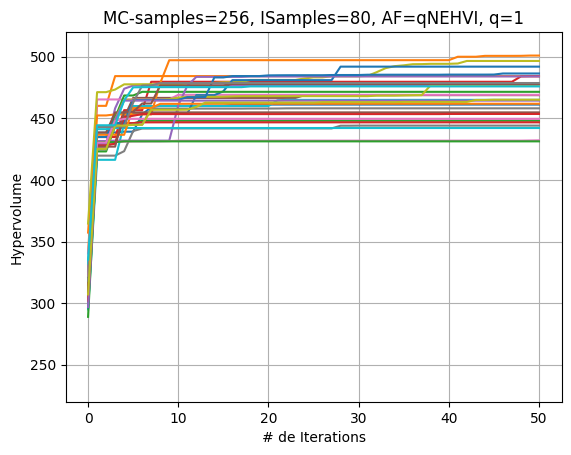

In [68]:
iters = np.arange(51)

for i in range(30):

    plt.errorbar(iters, np.asarray(hvsf27yexp8[i]), linewidth=1.5,label='%i' %i)
    plt.xlabel('# de Iterations')
    plt.ylabel('Hypervolume')
    plt.title('MC-samples=256, ISamples=80, AF=qNEHVI, q=1')
plt.grid()
plt.ylim([220,520])
plt.savefig('Exp8-27July')

In [69]:
%store BDs27yexp8
%store hvsf27yexp8
%store trainxall27yexp8
%store trainobjall27yexp8
%store numbd27yexp8

Stored 'BDs27yexp8' (list)
Stored 'hvsf27yexp8' (list)
Stored 'trainxall27yexp8' (list)
Stored 'trainobjall27yexp8' (list)
Stored 'numbd27yexp8' (list)


In [19]:
BDs27yexp9=[]
hvsf27yexp9=[]
trainxall27yexp9=[]
trainobjall27yexp9=[]
numbd27yexp9=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=90)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp9.append(bd.pareto_Y)      
    hvsf27yexp9.append(hvs_ehvi)   
    trainxall27yexp9.append(train_x_ehvi)
    trainobjall27yexp9.append(train_obj_ehvi)
    numbd27yexp9.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]

Seed: 813

Batch  1: Hypervolume (qNEHVI) = 457.9680 #Paprox=11 time = 18.71 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 457.9680 #Paprox=11 time = 19.61 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 476.8446 #Paprox=12 time = 19.98 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 493.9521 #Paprox=13 time = 20.08 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  5: Hypervolume (qNEHVI) = 497.2127 #Paprox=14 time = 20.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 497.2127 #Paprox=15 time = 18.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 497.2127 #Paprox=16 time = 18.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 497.2127 #Paprox=17 time = 19.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 497.2127 #Paprox=18 time = 19.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 497.2127 #Paprox=19 time = 20.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 497.2127 #Paprox=20 time = 20.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 497.2127 #Paprox=21 time = 20.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 497.2127 #Paprox=22 time = 20.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 497.2127 #Paprox=23 time = 20.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 497.2127 #Paprox=24 time = 20.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 497.2127 #Paprox=25 time = 20.74 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 497.2127 #Paprox=26 time = 21.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 497.2127 #Paprox=27 time = 21.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 497.2127 #Paprox=28 time = 21.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 497.2127 #Paprox=28 time = 21.30 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 497.2127 #Paprox=28 time = 21.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 497.2127 #Paprox=28 time = 21.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 497.2127 #Paprox=29 time = 21.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 497.2127 #Paprox=30 time = 21.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 497.2127 #Paprox=31 time = 21.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 497.2127 #Paprox=32 time = 22.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 497.2127 #Paprox=33 time = 21.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 497.2127 #Paprox=34 time = 21.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 497.2127 #Paprox=34 time = 21.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 497.2127 #Paprox=35 time = 21.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 497.2127 #Paprox=36 time = 21.99 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 497.2127 #Paprox=37 time = 22.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 497.2127 #Paprox=38 time = 22.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 497.2127 #Paprox=39 time = 22.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 497.2127 #Paprox=40 time = 21.98 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 497.2127 #Paprox=41 time = 22.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 497.2127 #Paprox=42 time = 22.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 497.2127 #Paprox=43 time = 22.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 497.2127 #Paprox=42 time = 22.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 497.2127 #Paprox=43 time = 22.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 497.2127 #Paprox=44 time = 22.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 497.2127 #Paprox=45 time = 22.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 497.2127 #Paprox=46 time = 23.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 497.2127 #Paprox=47 time = 23.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 497.2127 #Paprox=48 time = 23.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 497.2127 #Paprox=49 time = 22.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 497.2127 #Paprox=49 time = 22.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 497.2127 #Paprox=50 time = 23.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 497.2127 #Paprox=51 time = 23.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▎                                      | 1/30 [17:55<8:39:52, 1075.60s/it]


Batch 50: Hypervolume (qNEHVI) = 497.2127 #Paprox=52 time = 23.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 110

Batch  1: Hypervolume (qNEHVI) = 477.3605 #Paprox=12 time = 21.41 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  2: Hypervolume (qNEHVI) = 477.3605 #Paprox=12 time = 20.64 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 477.3605 #Paprox=13 time = 21.10 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 480.2858 #Paprox=14 time = 21.20 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 480.2858 #Paprox=14 time = 21.09 Lysine= 1.2051 Energy= 14.0010 Costs= 157.7905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 480.2858 #Paprox=14 time = 21.08 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 480.2858 #Paprox=15 time = 21.24 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 480.2858 #Paprox=16 time = 21.04 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 481.2595 #Paprox=17 time = 22.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 481.2640 #Paprox=18 time = 21.77 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 481.2640 #Paprox=19 time = 22.04 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 481.2640 #Paprox=20 time = 21.86 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 481.2640 #Paprox=21 time = 21.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 481.2640 #Paprox=22 time = 21.77 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 481.2640 #Paprox=23 time = 23.45 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 481.2640 #Paprox=24 time = 22.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 481.2640 #Paprox=25 time = 22.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 481.2640 #Paprox=26 time = 22.75 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 481.2640 #Paprox=26 time = 23.09 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 481.2640 #Paprox=27 time = 23.03 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 481.2640 #Paprox=27 time = 23.02 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 481.2640 #Paprox=28 time = 22.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 481.2640 #Paprox=29 time = 22.50 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 481.2640 #Paprox=30 time = 23.21 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 481.2640 #Paprox=31 time = 22.82 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 481.2640 #Paprox=32 time = 23.07 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 481.2640 #Paprox=33 time = 23.32 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 481.2640 #Paprox=34 time = 23.59 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 481.2640 #Paprox=35 time = 22.85 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 481.2640 #Paprox=36 time = 24.16 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 481.2640 #Paprox=37 time = 23.96 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 481.2640 #Paprox=38 time = 23.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 481.2640 #Paprox=39 time = 22.93 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 481.2640 #Paprox=40 time = 22.67 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 481.2640 #Paprox=41 time = 23.68 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 481.2640 #Paprox=42 time = 23.38 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 481.2640 #Paprox=43 time = 23.40 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 481.2640 #Paprox=44 time = 23.36 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 481.2640 #Paprox=45 time = 23.55 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 481.2640 #Paprox=46 time = 23.81 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 481.2640 #Paprox=47 time = 23.71 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 481.2640 #Paprox=47 time = 23.69 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 481.2640 #Paprox=48 time = 24.53 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 481.2640 #Paprox=48 time = 24.65 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 481.2640 #Paprox=49 time = 23.90 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 481.2640 #Paprox=50 time = 24.04 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 481.2640 #Paprox=51 time = 23.77 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 481.2640 #Paprox=51 time = 23.68 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 481.2640 #Paprox=52 time = 23.94 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▋                                     | 2/30 [36:59<8:40:42, 1115.81s/it]


Batch 50: Hypervolume (qNEHVI) = 481.2640 #Paprox=53 time = 24.26 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 882


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 440.1428 #Paprox=25 time = 19.98 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 440.1428 #Paprox=25 time = 20.19 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 441.7873 #Paprox=26 time = 20.31 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 441.7873 #Paprox=27 time = 20.81 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 443.0975 #Paprox=28 time = 20.57 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 443.0975 #Paprox=29 time = 20.59 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 443.0975 #Paprox=30 time = 21.27 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 443.0975 #Paprox=31 time = 21.56 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 443.0975 #Paprox=32 time = 21.50 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 443.0975 #Paprox=33 time = 21.28 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 443.0975 #Paprox=34 time = 21.44 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 443.0975 #Paprox=35 time = 22.06 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 443.0975 #Paprox=36 time = 21.86 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 443.0975 #Paprox=37 time = 21.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 443.0975 #Paprox=38 time = 21.79 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 443.0975 #Paprox=39 time = 22.23 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 443.0975 #Paprox=40 time = 22.34 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 443.0975 #Paprox=41 time = 23.26 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 443.0975 #Paprox=42 time = 22.76 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 443.0975 #Paprox=43 time = 22.16 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 443.0975 #Paprox=44 time = 22.58 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 443.0975 #Paprox=45 time = 22.39 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 443.0975 #Paprox=46 time = 22.48 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 443.0975 #Paprox=47 time = 23.14 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 443.0975 #Paprox=48 time = 22.66 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 443.0975 #Paprox=49 time = 24.01 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 443.0975 #Paprox=50 time = 22.65 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 443.0975 #Paprox=51 time = 23.06 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 443.0975 #Paprox=52 time = 23.12 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 443.0975 #Paprox=53 time = 23.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 443.0975 #Paprox=54 time = 22.86 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 443.0975 #Paprox=55 time = 23.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 443.0975 #Paprox=56 time = 24.43 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 443.0975 #Paprox=57 time = 23.35 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 443.0975 #Paprox=58 time = 23.24 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 443.0975 #Paprox=59 time = 23.60 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 443.0975 #Paprox=60 time = 23.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 443.0975 #Paprox=61 time = 23.31 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 443.0975 #Paprox=62 time = 23.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 443.0975 #Paprox=63 time = 23.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 443.0975 #Paprox=64 time = 23.26 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 443.0975 #Paprox=65 time = 22.98 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 443.0975 #Paprox=66 time = 23.43 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 443.0975 #Paprox=67 time = 24.44 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 443.0975 #Paprox=68 time = 24.96 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 443.0975 #Paprox=69 time = 24.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 443.0975 #Paprox=70 time = 23.76 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 443.0975 #Paprox=71 time = 25.28 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 443.0975 #Paprox=72 time = 24.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|████                                    | 3/30 [55:55<8:26:12, 1124.93s/it]


Batch 50: Hypervolume (qNEHVI) = 443.0975 #Paprox=73 time = 24.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)Seed: 439


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 434.9352 #Paprox=21 time = 19.80 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 434.9352 #Paprox=21 time = 19.48 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 465.9903 #Paprox=22 time = 19.94 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 465.9903 #Paprox=23 time = 21.13 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 481.9246 #Paprox=24 time = 20.32 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 483.9038 #Paprox=23 time = 20.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 483.9038 #Paprox=24 time = 17.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 483.9038 #Paprox=25 time = 18.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 483.9038 #Paprox=26 time = 19.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 483.9038 #Paprox=27 time = 19.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 483.9038 #Paprox=28 time = 20.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 483.9038 #Paprox=29 time = 20.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 483.9038 #Paprox=30 time = 20.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 483.9038 #Paprox=31 time = 20.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 483.9038 #Paprox=32 time = 20.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 483.9038 #Paprox=33 time = 20.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 483.9038 #Paprox=34 time = 20.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 483.9038 #Paprox=35 time = 20.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 483.9038 #Paprox=36 time = 20.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 483.9038 #Paprox=37 time = 21.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 483.9038 #Paprox=38 time = 21.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 483.9038 #Paprox=39 time = 21.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 483.9038 #Paprox=40 time = 21.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 483.9038 #Paprox=40 time = 21.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 483.9038 #Paprox=41 time = 21.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 483.9038 #Paprox=41 time = 21.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 483.9038 #Paprox=42 time = 21.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 483.9038 #Paprox=43 time = 21.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 483.9038 #Paprox=44 time = 21.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 483.9038 #Paprox=45 time = 21.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 483.9038 #Paprox=46 time = 22.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 483.9038 #Paprox=47 time = 22.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 483.9038 #Paprox=48 time = 22.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 483.9038 #Paprox=49 time = 22.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 483.9038 #Paprox=49 time = 22.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 483.9038 #Paprox=50 time = 22.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 483.9038 #Paprox=51 time = 22.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 483.9038 #Paprox=52 time = 22.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 483.9038 #Paprox=52 time = 22.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 483.9038 #Paprox=53 time = 22.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 483.9038 #Paprox=54 time = 22.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 483.9038 #Paprox=54 time = 22.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 483.9928 #Paprox=55 time = 22.77 Lysine= 1.1189 Energy= 14.4305 Costs= 151.3520)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 483.9928 #Paprox=55 time = 23.68 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 483.9928 #Paprox=55 time = 22.75 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 487.1796 #Paprox=56 time = 23.00 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 487.1796 #Paprox=56 time = 23.32 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 487.3940 #Paprox=57 time = 23.40 Lysine= 1.3229 Energy= 14.0010 Costs= 155.2738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 487.3940 #Paprox=57 time = 23.76 Lysine= 0.9501 Energy= 14.0010 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|█████                                 | 4/30 [1:13:46<7:58:11, 1103.51s/it]


Batch 50: Hypervolume (qNEHVI) = 487.3940 #Paprox=58 time = 23.61 Lysine= 1.3229 Energy= 14.0010 Costs= 155.2738)Seed: 667

Batch  1: Hypervolume (qNEHVI) = 440.5366 #Paprox=25 time = 19.91 Lysine= 0.9501 Energy= 14.3927 Costs= 145.6801)
Batch  2: Hypervolume (qNEHVI) = 440.5366 #Paprox=25 time = 20.00 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 440.7564 #Paprox=26 time = 20.27 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  4: Hypervolume (qNEHVI) = 440.7564 #Paprox=27 time = 20.40 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 440.8201 #Paprox=28 time = 20.79 Lysine= 0.9501 Energy= 14.4101 Costs= 146.6478)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 442.1875 #Paprox=28 time = 20.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 442.4411 #Paprox=29 time = 20.56 Lysine= 0.9526 Energy= 14.3730 Costs= 147.3949)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 458.5475 #Paprox=30 time = 20.50 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 461.4808 #Paprox=31 time = 19.96 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 461.4808 #Paprox=32 time = 19.88 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 461.4808 #Paprox=33 time = 20.81 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 461.4808 #Paprox=34 time = 21.60 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 461.4808 #Paprox=35 time = 20.71 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 461.4808 #Paprox=36 time = 21.03 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 461.4808 #Paprox=37 time = 20.81 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 461.5178 #Paprox=38 time = 20.99 Lysine= 1.1211 Energy= 14.0010 Costs= 148.6915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 461.5178 #Paprox=39 time = 21.36 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 461.5178 #Paprox=40 time = 20.78 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 461.5178 #Paprox=41 time = 21.40 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 461.5178 #Paprox=42 time = 21.49 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 461.5178 #Paprox=43 time = 21.52 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 461.5178 #Paprox=43 time = 21.39 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 461.5178 #Paprox=43 time = 21.83 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 461.5593 #Paprox=44 time = 20.85 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 20.95 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 21.19 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 22.13 Lysine= 1.4688 Energy= 14.0010 Costs= 160.2183)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 21.52 Lysine= 1.4708 Energy= 14.0010 Costs= 160.3020)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 21.72 Lysine= 1.4722 Energy= 14.0010 Costs= 160.3576)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 22.14 Lysine= 1.4715 Energy= 14.0010 Costs= 160.3280)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 21.54 Lysine= 1.4596 Energy= 14.0010 Costs= 159.8432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 22.27 Lysine= 1.4672 Energy= 14.0010 Costs= 160.1533)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 22.81 Lysine= 1.4556 Energy= 14.0010 Costs= 159.7194)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 22.49 Lysine= 1.4253 Energy= 14.0010 Costs= 158.8433)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 21.94 Lysine= 1.4742 Energy= 14.0010 Costs= 160.4394)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 22.70 Lysine= 1.4397 Energy= 14.0010 Costs= 159.3692)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 22.33 Lysine= 1.4045 Energy= 14.0010 Costs= 158.2526)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 23.20 Lysine= 1.4599 Energy= 14.0010 Costs= 159.8816)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 23.61 Lysine= 1.3943 Energy= 14.0010 Costs= 157.8741)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 23.57 Lysine= 1.4804 Energy= 14.0010 Costs= 160.7228)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 23.96 Lysine= 1.4457 Energy= 14.0010 Costs= 159.8066)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 23.53 Lysine= 1.4150 Energy= 14.0010 Costs= 159.1630)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 24.67 Lysine= 1.4259 Energy= 14.0010 Costs= 159.1490)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 23.94 Lysine= 1.4287 Energy= 14.0010 Costs= 159.7017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 23.91 Lysine= 1.4803 Energy= 14.0010 Costs= 160.9959)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 461.5593 #Paprox=45 time = 22.80 Lysine= 1.4145 Energy= 14.0010 Costs= 159.1201)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 461.9172 #Paprox=46 time = 23.74 Lysine= 1.2573 Energy= 14.0010 Costs= 155.5832)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 461.9172 #Paprox=46 time = 24.29 Lysine= 1.3139 Energy= 14.0010 Costs= 157.2673)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 462.5208 #Paprox=46 time = 23.39 Lysine= 1.2640 Energy= 14.0010 Costs= 155.1219)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▎                               | 5/30 [1:32:01<7:38:38, 1100.72s/it]


Batch 50: Hypervolume (qNEHVI) = 462.5208 #Paprox=46 time = 24.59 Lysine= 1.2544 Energy= 14.0010 Costs= 155.6898)Seed: 205


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 436.6751 #Paprox=17 time = 18.95 Lysine= 0.9501 Energy= 14.3883 Costs= 145.6552)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 436.6751 #Paprox=17 time = 19.06 Lysine= 1.2660 Energy= 14.0131 Costs= 167.9409)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 455.5023 #Paprox=18 time = 19.32 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 455.5023 #Paprox=18 time = 19.62 Lysine= 1.1376 Energy= 14.0010 Costs= 155.8115)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 455.5023 #Paprox=18 time = 19.52 Lysine= 1.2056 Energy= 14.0010 Costs= 178.2149)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 455.5023 #Paprox=18 time = 20.39 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 457.4189 #Paprox=19 time = 21.51 Lysine= 1.3304 Energy= 14.0010 Costs= 156.0708)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 457.6299 #Paprox=20 time = 20.67 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 457.6299 #Paprox=20 time = 19.67 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 457.6299 #Paprox=20 time = 20.96 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 457.6299 #Paprox=20 time = 20.19 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 457.6299 #Paprox=20 time = 20.01 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 457.6299 #Paprox=21 time = 19.63 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 457.8093 #Paprox=22 time = 19.94 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 458.3842 #Paprox=23 time = 20.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 458.3842 #Paprox=24 time = 20.27 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 458.3842 #Paprox=25 time = 20.27 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 458.3842 #Paprox=26 time = 20.24 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 458.3842 #Paprox=27 time = 20.43 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 458.3842 #Paprox=28 time = 20.33 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 458.3842 #Paprox=29 time = 20.87 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 458.3843 #Paprox=30 time = 21.14 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 458.3843 #Paprox=31 time = 21.05 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 458.3843 #Paprox=32 time = 20.85 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 458.3843 #Paprox=32 time = 21.39 Lysine= 0.9501 Energy= 14.0010 Costs= 148.2737)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 458.3843 #Paprox=32 time = 21.07 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 458.3843 #Paprox=32 time = 20.94 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 458.3843 #Paprox=32 time = 21.51 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 458.3843 #Paprox=33 time = 21.38 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 458.3843 #Paprox=34 time = 21.15 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 458.3843 #Paprox=34 time = 21.29 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 458.3843 #Paprox=35 time = 20.96 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 458.3843 #Paprox=36 time = 21.36 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 458.3843 #Paprox=36 time = 21.02 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 458.3843 #Paprox=36 time = 21.20 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 458.3843 #Paprox=36 time = 21.51 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 458.3843 #Paprox=36 time = 21.14 Lysine= 0.9501 Energy= 14.0056 Costs= 148.0126)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 458.3843 #Paprox=36 time = 21.32 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 458.3843 #Paprox=36 time = 21.33 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 458.3843 #Paprox=36 time = 21.24 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 458.3843 #Paprox=36 time = 21.32 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 458.3843 #Paprox=36 time = 21.11 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 458.3843 #Paprox=36 time = 21.25 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 458.3843 #Paprox=36 time = 21.58 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 458.3843 #Paprox=36 time = 21.57 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 458.3843 #Paprox=37 time = 22.44 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 458.3843 #Paprox=37 time = 21.51 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 458.3843 #Paprox=38 time = 21.30 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 458.3843 #Paprox=38 time = 21.49 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|███████▌                              | 6/30 [1:49:23<7:12:19, 1080.79s/it]


Batch 50: Hypervolume (qNEHVI) = 458.3843 #Paprox=39 time = 22.02 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)Seed: 699


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 435.1547 #Paprox=19 time = 19.91 Lysine= 0.9501 Energy= 14.3906 Costs= 145.6581)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 435.1547 #Paprox=19 time = 19.92 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 436.0309 #Paprox=20 time = 20.28 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 454.3699 #Paprox=21 time = 20.15 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 454.4787 #Paprox=22 time = 20.04 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 454.4787 #Paprox=23 time = 20.22 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 454.4787 #Paprox=24 time = 19.98 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 454.4787 #Paprox=25 time = 20.12 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 454.4787 #Paprox=26 time = 20.29 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 454.4787 #Paprox=27 time = 20.50 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 454.4787 #Paprox=27 time = 20.86 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 454.4787 #Paprox=28 time = 20.78 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 454.4787 #Paprox=29 time = 20.50 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 454.4787 #Paprox=30 time = 20.68 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 454.4787 #Paprox=31 time = 20.72 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 454.4787 #Paprox=32 time = 20.91 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 454.4787 #Paprox=32 time = 20.71 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 454.4787 #Paprox=33 time = 21.25 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 454.4787 #Paprox=32 time = 21.19 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 454.4787 #Paprox=33 time = 20.78 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 454.4787 #Paprox=34 time = 21.15 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 454.4787 #Paprox=35 time = 21.48 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 454.4787 #Paprox=35 time = 20.77 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 454.4787 #Paprox=35 time = 21.45 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 454.4787 #Paprox=36 time = 21.26 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 454.4787 #Paprox=36 time = 21.20 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 454.4787 #Paprox=37 time = 21.10 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 454.4787 #Paprox=38 time = 20.93 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 454.4787 #Paprox=39 time = 22.76 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 454.4787 #Paprox=40 time = 21.23 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 454.4787 #Paprox=41 time = 21.11 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 454.4787 #Paprox=42 time = 21.43 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 454.4787 #Paprox=33 time = 21.52 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 454.4787 #Paprox=33 time = 21.86 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 454.4787 #Paprox=34 time = 21.52 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 454.4787 #Paprox=34 time = 21.68 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 454.4787 #Paprox=35 time = 21.64 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 454.4787 #Paprox=35 time = 22.58 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 454.4787 #Paprox=36 time = 21.81 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 454.4787 #Paprox=37 time = 21.83 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 454.4787 #Paprox=37 time = 22.34 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 454.4787 #Paprox=38 time = 22.74 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 454.4787 #Paprox=39 time = 21.75 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 454.4787 #Paprox=40 time = 21.95 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 454.4787 #Paprox=40 time = 22.70 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 454.4787 #Paprox=40 time = 23.18 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 454.4787 #Paprox=41 time = 22.45 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 454.4787 #Paprox=41 time = 22.22 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 454.4787 #Paprox=42 time = 22.04 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 23%|████████▊                             | 7/30 [2:07:09<6:52:21, 1075.72s/it]


Batch 50: Hypervolume (qNEHVI) = 454.4787 #Paprox=43 time = 22.55 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)Seed: 870


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 446.6928 #Paprox=24 time = 20.37 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 446.6928 #Paprox=24 time = 20.42 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 446.6928 #Paprox=25 time = 20.76 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 446.8747 #Paprox=26 time = 20.55 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 446.8794 #Paprox=27 time = 21.37 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 471.0255 #Paprox=28 time = 15.93 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 471.0255 #Paprox=29 time = 16.73 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 471.0255 #Paprox=30 time = 16.44 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 471.0255 #Paprox=31 time = 16.16 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 471.0255 #Paprox=32 time = 16.82 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 471.0255 #Paprox=33 time = 16.96 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 471.0255 #Paprox=34 time = 16.86 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 471.0255 #Paprox=35 time = 17.28 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 471.0255 #Paprox=36 time = 16.77 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 471.0255 #Paprox=37 time = 17.57 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 471.0255 #Paprox=38 time = 16.81 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 471.0255 #Paprox=39 time = 17.20 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 471.0255 #Paprox=39 time = 17.70 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 471.0255 #Paprox=39 time = 19.36 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 471.0255 #Paprox=40 time = 19.70 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 471.0255 #Paprox=40 time = 20.12 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 471.0255 #Paprox=41 time = 19.88 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 471.0255 #Paprox=42 time = 19.67 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 471.0255 #Paprox=43 time = 19.58 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 471.0255 #Paprox=44 time = 19.99 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 471.0255 #Paprox=42 time = 19.56 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 471.0255 #Paprox=43 time = 20.30 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 471.0255 #Paprox=44 time = 20.51 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 471.0255 #Paprox=45 time = 19.99 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 471.0255 #Paprox=46 time = 20.50 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 471.0255 #Paprox=46 time = 20.12 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 471.0255 #Paprox=47 time = 20.59 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 471.0255 #Paprox=48 time = 20.90 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 471.0255 #Paprox=49 time = 19.97 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 471.0255 #Paprox=50 time = 20.38 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 471.0255 #Paprox=50 time = 19.97 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 471.0255 #Paprox=51 time = 20.21 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 471.0255 #Paprox=51 time = 21.32 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 471.0255 #Paprox=51 time = 20.46 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 471.0255 #Paprox=51 time = 21.35 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 471.0255 #Paprox=52 time = 20.76 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 471.0255 #Paprox=53 time = 20.95 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 471.0255 #Paprox=53 time = 20.64 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 471.0255 #Paprox=54 time = 20.98 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 471.0255 #Paprox=54 time = 21.42 Lysine= 0.9501 Energy= 14.0010 Costs= 153.7221)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 471.0255 #Paprox=54 time = 20.61 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 471.0255 #Paprox=55 time = 20.79 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 472.8139 #Paprox=56 time = 18.23 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 472.8139 #Paprox=57 time = 18.57 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 27%|██████████▏                           | 8/30 [2:23:17<6:21:53, 1041.53s/it]


Batch 50: Hypervolume (qNEHVI) = 472.8139 #Paprox=58 time = 16.97 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)Seed: 546


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 431.9091 #Paprox=13 time = 20.20 Lysine= 0.9501 Energy= 14.4340 Costs= 146.1543)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 431.9091 #Paprox=13 time = 20.31 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 432.4416 #Paprox=14 time = 19.47 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 432.4416 #Paprox=15 time = 19.64 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 432.4416 #Paprox=16 time = 20.25 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 432.4416 #Paprox=17 time = 20.07 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 432.4416 #Paprox=18 time = 20.18 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 432.4416 #Paprox=18 time = 20.29 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 432.4416 #Paprox=18 time = 20.11 Lysine= 1.2349 Energy= 14.0010 Costs= 155.9572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 432.4416 #Paprox=18 time = 19.85 Lysine= 1.2342 Energy= 14.0010 Costs= 177.4048)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 433.0445 #Paprox=19 time = 19.98 Lysine= 1.1471 Energy= 14.0010 Costs= 153.8921)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 439.8500 #Paprox=20 time = 21.80 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 439.8500 #Paprox=21 time = 20.63 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 439.8500 #Paprox=22 time = 21.04 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 439.8500 #Paprox=23 time = 21.56 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 439.8500 #Paprox=24 time = 21.57 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 439.8500 #Paprox=25 time = 22.45 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 439.8500 #Paprox=26 time = 21.47 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 439.8500 #Paprox=26 time = 20.89 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 439.8500 #Paprox=26 time = 21.35 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 439.8500 #Paprox=26 time = 20.82 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 439.8500 #Paprox=26 time = 21.91 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 439.8500 #Paprox=26 time = 21.47 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 449.6394 #Paprox=27 time = 21.75 Lysine= 1.5646 Energy= 14.0010 Costs= 162.7622)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 449.6394 #Paprox=27 time = 22.18 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.00 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 21.22 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.78 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 21.40 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 21.87 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.17 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.03 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.07 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.42 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.61 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 21.85 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.03 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.55 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.37 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.62 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.39 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 21.92 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.93 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.52 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 23.28 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.90 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 21.92 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 23.51 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 449.6394 #Paprox=29 time = 23.28 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 30%|███████████▍                          | 9/30 [2:41:20<6:09:02, 1054.41s/it]


Batch 50: Hypervolume (qNEHVI) = 449.6394 #Paprox=29 time = 23.60 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)Seed: 869

Batch  1: Hypervolume (qNEHVI) = 462.6312 #Paprox=17 time = 18.50 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 462.6312 #Paprox=17 time = 19.00 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 462.6312 #Paprox=18 time = 18.96 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 462.6312 #Paprox=19 time = 19.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 465.0291 #Paprox=20 time = 19.00 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 465.0291 #Paprox=20 time = 19.42 Lysine= 1.1168 Energy= 14.0010 Costs= 169.4704)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 465.0291 #Paprox=21 time = 19.22 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 465.0291 #Paprox=22 time = 18.84 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 466.3426 #Paprox=23 time = 19.51 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 466.3426 #Paprox=24 time = 19.31 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 466.3426 #Paprox=25 time = 19.50 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 466.3426 #Paprox=26 time = 19.97 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 466.3426 #Paprox=26 time = 20.10 Lysine= 0.9501 Energy= 14.4669 Costs= 148.4246)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 466.3426 #Paprox=27 time = 19.74 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 466.3426 #Paprox=27 time = 20.35 Lysine= 0.9501 Energy= 14.3726 Costs= 151.2670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 466.3426 #Paprox=27 time = 20.31 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 466.3426 #Paprox=28 time = 20.24 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 466.3426 #Paprox=28 time = 20.91 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 466.3426 #Paprox=28 time = 20.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 466.3426 #Paprox=29 time = 20.66 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 466.3426 #Paprox=29 time = 20.60 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 466.3426 #Paprox=29 time = 20.96 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 466.3426 #Paprox=29 time = 21.13 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 466.3426 #Paprox=29 time = 21.69 Lysine= 0.9501 Energy= 14.4694 Costs= 151.0624)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.34 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.16 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.32 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.24 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.28 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.75 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.47 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.43 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 466.4778 #Paprox=31 time = 22.01 Lysine= 0.9501 Energy= 14.4791 Costs= 151.2076)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 466.4778 #Paprox=31 time = 21.74 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 466.9436 #Paprox=32 time = 21.96 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 466.9585 #Paprox=33 time = 21.91 Lysine= 0.9501 Energy= 14.5044 Costs= 151.0401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 466.9585 #Paprox=33 time = 22.08 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 466.9585 #Paprox=33 time = 21.99 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 466.9585 #Paprox=33 time = 21.85 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 466.9585 #Paprox=34 time = 22.77 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 466.9585 #Paprox=35 time = 22.52 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 466.9585 #Paprox=35 time = 22.69 Lysine= 0.9501 Energy= 14.4837 Costs= 151.1897)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 466.9585 #Paprox=35 time = 22.64 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 466.9585 #Paprox=35 time = 22.83 Lysine= 0.9501 Energy= 14.4921 Costs= 151.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 466.9695 #Paprox=36 time = 22.79 Lysine= 0.9501 Energy= 14.5035 Costs= 150.6782)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 466.9695 #Paprox=37 time = 22.66 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 466.9695 #Paprox=38 time = 22.57 Lysine= 0.9501 Energy= 14.4754 Costs= 151.1526)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 466.9695 #Paprox=38 time = 22.81 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|████████████▎                        | 10/30 [2:58:52<5:51:14, 1053.75s/it]


Batch 50: Hypervolume (qNEHVI) = 466.9695 #Paprox=39 time = 22.92 Lysine= 0.9501 Energy= 14.4948 Costs= 151.4434)Seed: 903


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 428.6214 #Paprox=18 time = 19.51 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 428.6214 #Paprox=18 time = 19.57 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 428.6214 #Paprox=18 time = 20.19 Lysine= 1.2342 Energy= 14.0010 Costs= 156.8458)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 444.3059 #Paprox=19 time = 20.01 Lysine= 1.0923 Energy= 14.0010 Costs= 146.7755)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 444.3059 #Paprox=19 time = 19.11 Lysine= 1.0830 Energy= 14.0010 Costs= 172.7699)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 482.1451 #Paprox=20 time = 20.60 Lysine= 0.9501 Energy= 14.0010 Costs= 142.9102)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 484.7186 #Paprox=21 time = 19.80 Lysine= 1.1474 Energy= 14.0010 Costs= 151.3177)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 484.7186 #Paprox=22 time = 19.88 Lysine= 1.1474 Energy= 14.0010 Costs= 151.3177)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 487.7604 #Paprox=23 time = 20.49 Lysine= 1.1442 Energy= 14.0010 Costs= 147.1337)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 487.7604 #Paprox=23 time = 20.01 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 487.7604 #Paprox=23 time = 18.82 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 489.9068 #Paprox=24 time = 13.75 Lysine= 1.1684 Energy= 14.0010 Costs= 147.8659)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 496.4383 #Paprox=25 time = 14.70 Lysine= 1.2494 Energy= 14.0010 Costs= 149.8385)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 496.4383 #Paprox=26 time = 14.49 Lysine= 1.1141 Energy= 14.0010 Costs= 147.3068)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 496.4383 #Paprox=27 time = 15.33 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 496.7456 #Paprox=27 time = 15.35 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 496.7456 #Paprox=27 time = 14.31 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 496.7456 #Paprox=27 time = 13.97 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 496.7748 #Paprox=25 time = 14.88 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 496.7748 #Paprox=26 time = 13.03 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 496.7748 #Paprox=27 time = 12.37 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 496.7748 #Paprox=28 time = 12.50 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 496.7748 #Paprox=29 time = 12.00 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 496.7748 #Paprox=30 time = 12.99 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 496.7748 #Paprox=31 time = 12.04 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 496.7748 #Paprox=32 time = 12.22 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 496.7748 #Paprox=32 time = 12.74 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 496.7748 #Paprox=32 time = 13.04 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 496.7748 #Paprox=33 time = 12.83 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 496.7748 #Paprox=33 time = 12.73 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 496.7748 #Paprox=34 time = 12.20 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 496.7748 #Paprox=35 time = 13.11 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 496.7748 #Paprox=36 time = 13.84 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 496.7748 #Paprox=36 time = 12.89 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 496.7748 #Paprox=37 time = 12.57 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 496.7748 #Paprox=37 time = 13.10 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 496.7748 #Paprox=38 time = 12.56 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 496.7748 #Paprox=38 time = 12.63 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 496.7748 #Paprox=38 time = 12.81 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 496.7748 #Paprox=38 time = 13.23 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 496.7748 #Paprox=39 time = 13.28 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 496.7748 #Paprox=39 time = 12.99 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 496.7748 #Paprox=39 time = 13.33 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 496.7748 #Paprox=39 time = 13.72 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 496.7748 #Paprox=40 time = 14.59 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 496.7748 #Paprox=41 time = 13.58 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 496.7748 #Paprox=42 time = 14.07 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 496.7748 #Paprox=43 time = 13.64 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 496.7748 #Paprox=43 time = 13.47 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 37%|█████████████▉                        | 11/30 [3:11:11<5:03:13, 957.55s/it]


Batch 50: Hypervolume (qNEHVI) = 496.8530 #Paprox=44 time = 13.31 Lysine= 1.1530 Energy= 14.3453 Costs= 150.3529)Seed: 510


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 331.3823 #Paprox=19 time = 20.48 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 432.5669 #Paprox=20 time = 20.03 Lysine= 0.9501 Energy= 14.3860 Costs= 146.2088)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 432.5669 #Paprox=20 time = 20.49 Lysine= 1.1511 Energy= 14.0010 Costs= 164.4695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 432.8779 #Paprox=21 time = 19.98 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 449.7482 #Paprox=22 time = 20.74 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 449.7482 #Paprox=22 time = 20.74 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 20.31 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 20.58 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 20.54 Lysine= 1.3474 Energy= 14.0010 Costs= 158.9562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 21.36 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 21.36 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 21.71 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 21.17 Lysine= 1.3474 Energy= 14.0010 Costs= 158.9562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 21.89 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.17 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.56 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.57 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.03 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.02 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.22 Lysine= 1.3474 Energy= 14.0010 Costs= 158.9562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.16 Lysine= 1.3474 Energy= 14.0010 Costs= 158.9562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.34 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.35 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.28 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.63 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.63 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.44 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.98 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.60 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.80 Lysine= 1.4059 Energy= 14.0010 Costs= 161.5551)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.36 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 24.31 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.65 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 24.20 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.01 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.29 Lysine= 1.3785 Energy= 14.0010 Costs= 159.6093)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.47 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 24.17 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 26.14 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.91 Lysine= 1.3474 Energy= 14.0010 Costs= 158.9562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.23 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.43 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.47 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 24.78 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.01 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 24.73 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.93 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.15 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 26.20 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 40%|██████████████▊                      | 12/30 [3:30:32<5:05:45, 1019.18s/it]


Batch 50: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 26.20 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)Seed: 987

Batch  1: Hypervolume (qNEHVI) = 440.2548 #Paprox=29 time = 18.74 Lysine= 0.9501 Energy= 14.4046 Costs= 145.8309)
Batch  2: Hypervolume (qNEHVI) = 440.2548 #Paprox=29 time = 19.12 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 440.2548 #Paprox=29 time = 19.09 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)
Batch  4: Hypervolume (qNEHVI) = 440.3008 #Paprox=30 time = 19.58 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  5: Hypervolume (qNEHVI) = 461.4841 #Paprox=31 time = 19.20 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  6: Hypervolume (qNEHVI) = 476.3780 #Paprox=32 time = 19.70 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 476.3780 #Paprox=33 time = 20.21 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 476.3780 #Paprox=34 time = 19.56 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 476.3780 #Paprox=35 time = 19.48 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 476.3780 #Paprox=36 time = 19.36 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.3780 #Paprox=37 time = 19.71 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 485.4005 #Paprox=38 time = 19.32 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 485.4005 #Paprox=38 time = 19.17 Lysine= 1.1144 Energy= 14.0010 Costs= 163.9966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 485.4005 #Paprox=39 time = 19.84 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 485.4005 #Paprox=39 time = 20.15 Lysine= 0.9501 Energy= 14.0684 Costs= 144.4625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 485.4005 #Paprox=40 time = 20.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 485.4005 #Paprox=41 time = 19.93 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 485.4005 #Paprox=42 time = 19.99 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 485.4005 #Paprox=43 time = 20.46 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 485.4005 #Paprox=44 time = 21.53 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 485.4005 #Paprox=45 time = 20.44 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 485.4005 #Paprox=46 time = 21.00 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 485.4005 #Paprox=47 time = 20.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 485.4005 #Paprox=48 time = 20.24 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 485.4005 #Paprox=48 time = 21.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 485.4005 #Paprox=49 time = 20.84 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 485.4005 #Paprox=50 time = 20.66 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 485.4005 #Paprox=51 time = 21.21 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 485.4005 #Paprox=51 time = 20.50 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 485.4005 #Paprox=52 time = 20.57 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 485.4005 #Paprox=53 time = 21.08 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 485.4005 #Paprox=54 time = 21.53 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 485.4005 #Paprox=55 time = 20.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 485.4730 #Paprox=56 time = 20.97 Lysine= 0.9521 Energy= 14.0680 Costs= 144.5026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 485.4730 #Paprox=57 time = 20.78 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 485.4730 #Paprox=58 time = 20.58 Lysine= 0.9521 Energy= 14.0680 Costs= 144.5026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 485.4730 #Paprox=59 time = 20.97 Lysine= 0.9521 Energy= 14.0680 Costs= 144.5026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 485.4730 #Paprox=60 time = 21.68 Lysine= 0.9521 Energy= 14.0680 Costs= 144.5026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 485.4730 #Paprox=61 time = 21.49 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 485.4730 #Paprox=62 time = 21.39 Lysine= 0.9521 Energy= 14.0680 Costs= 144.5026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 485.4730 #Paprox=63 time = 21.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 485.4730 #Paprox=64 time = 21.64 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 485.4730 #Paprox=65 time = 21.74 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 485.4730 #Paprox=65 time = 22.16 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 485.4730 #Paprox=66 time = 22.36 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 485.4730 #Paprox=66 time = 21.71 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 485.4730 #Paprox=67 time = 21.42 Lysine= 0.9521 Energy= 14.0680 Costs= 144.5026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 485.4730 #Paprox=68 time = 21.46 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 485.4730 #Paprox=68 time = 23.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 43%|████████████████                     | 13/30 [3:47:44<4:49:56, 1023.31s/it]


Batch 50: Hypervolume (qNEHVI) = 485.4730 #Paprox=69 time = 21.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)Seed: 120


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 423.5819 #Paprox=19 time = 18.66 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 423.5819 #Paprox=19 time = 19.65 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 426.4833 #Paprox=20 time = 19.69 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 426.4833 #Paprox=21 time = 19.26 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 426.4833 #Paprox=22 time = 20.95 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 426.4833 #Paprox=23 time = 20.02 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 426.4833 #Paprox=24 time = 19.91 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 426.4833 #Paprox=25 time = 20.36 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 426.4833 #Paprox=26 time = 20.00 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 426.4833 #Paprox=27 time = 20.30 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 426.4833 #Paprox=28 time = 20.43 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 426.4833 #Paprox=29 time = 20.72 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 426.4833 #Paprox=30 time = 20.42 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 426.4833 #Paprox=31 time = 20.59 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 426.4833 #Paprox=32 time = 20.58 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 426.4833 #Paprox=33 time = 21.12 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 426.4833 #Paprox=34 time = 20.71 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 426.4833 #Paprox=35 time = 21.62 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 426.4833 #Paprox=36 time = 21.00 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 426.4833 #Paprox=37 time = 21.14 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 426.4833 #Paprox=38 time = 20.80 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 426.4833 #Paprox=38 time = 21.96 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 426.4833 #Paprox=39 time = 21.05 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 426.4833 #Paprox=39 time = 21.10 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 426.4833 #Paprox=39 time = 21.27 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 426.4833 #Paprox=40 time = 20.99 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 426.4833 #Paprox=41 time = 21.48 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 426.4833 #Paprox=42 time = 21.37 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 426.4833 #Paprox=43 time = 21.55 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 426.4833 #Paprox=44 time = 21.46 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 426.4833 #Paprox=44 time = 21.68 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 426.4833 #Paprox=44 time = 21.30 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 426.4833 #Paprox=45 time = 21.82 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 426.4833 #Paprox=45 time = 21.56 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 426.4833 #Paprox=45 time = 21.50 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 426.4833 #Paprox=46 time = 21.85 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 426.4833 #Paprox=47 time = 22.18 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 426.4833 #Paprox=48 time = 21.70 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 426.4833 #Paprox=49 time = 21.99 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 426.4833 #Paprox=49 time = 22.09 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 426.4833 #Paprox=49 time = 22.30 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 426.4833 #Paprox=50 time = 22.09 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 426.4833 #Paprox=51 time = 21.99 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 426.4833 #Paprox=51 time = 22.58 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 426.4833 #Paprox=52 time = 22.11 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 426.4833 #Paprox=53 time = 21.73 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 426.4833 #Paprox=54 time = 21.93 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 426.4833 #Paprox=55 time = 22.13 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 426.4833 #Paprox=56 time = 22.10 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 47%|█████████████████▎                   | 14/30 [4:05:25<4:35:54, 1034.67s/it]


Batch 50: Hypervolume (qNEHVI) = 426.4833 #Paprox=57 time = 22.84 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)Seed: 302


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 435.0607 #Paprox=28 time = 20.67 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 435.0607 #Paprox=28 time = 19.68 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 436.3006 #Paprox=29 time = 20.33 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.4622 #Paprox=30 time = 20.32 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.44 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.33 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.70 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.57 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.45 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.92 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.99 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.64 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.73 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.97 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.06 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 20.93 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.11 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.47 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.43 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.61 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.40 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.36 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.60 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.69 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.73 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 471.6843 #Paprox=33 time = 21.62 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 471.6843 #Paprox=33 time = 21.58 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 471.6843 #Paprox=33 time = 21.69 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 471.6843 #Paprox=34 time = 21.64 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 471.6843 #Paprox=35 time = 21.81 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 471.6843 #Paprox=36 time = 21.97 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 471.6843 #Paprox=36 time = 21.89 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 471.6843 #Paprox=37 time = 21.89 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 471.6843 #Paprox=38 time = 22.31 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 471.6843 #Paprox=38 time = 22.12 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 471.6843 #Paprox=39 time = 22.66 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 471.6843 #Paprox=39 time = 22.31 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 471.6843 #Paprox=39 time = 22.30 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 471.6843 #Paprox=39 time = 22.36 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 471.6843 #Paprox=39 time = 22.11 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 471.6843 #Paprox=39 time = 22.17 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 471.6843 #Paprox=39 time = 22.81 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 471.6843 #Paprox=40 time = 22.56 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 471.6843 #Paprox=40 time = 23.01 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 471.6843 #Paprox=41 time = 22.93 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 471.6843 #Paprox=41 time = 22.55 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 471.6895 #Paprox=41 time = 22.75 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 471.6899 #Paprox=42 time = 18.98 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 471.6899 #Paprox=43 time = 16.62 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 50%|██████████████████▌                  | 15/30 [4:23:09<4:20:51, 1043.46s/it]


Batch 50: Hypervolume (qNEHVI) = 471.6899 #Paprox=44 time = 14.70 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)Seed: 693


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 434.5007 #Paprox=21 time = 18.10 Lysine= 0.9501 Energy= 14.4213 Costs= 146.0144)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 434.5007 #Paprox=21 time = 18.13 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 449.8879 #Paprox=22 time = 18.33 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.4717 #Paprox=22 time = 18.25 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.4717 #Paprox=23 time = 17.30 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.4717 #Paprox=24 time = 18.30 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.4717 #Paprox=24 time = 17.92 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 456.4717 #Paprox=24 time = 17.74 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 456.4717 #Paprox=24 time = 18.00 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 456.4717 #Paprox=24 time = 18.46 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 456.4717 #Paprox=25 time = 18.52 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 456.4717 #Paprox=25 time = 18.43 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 456.4717 #Paprox=26 time = 18.70 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 456.4717 #Paprox=27 time = 18.91 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 18.94 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 456.4717 #Paprox=29 time = 18.80 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 456.4717 #Paprox=29 time = 18.95 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 456.4717 #Paprox=29 time = 19.25 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 456.4717 #Paprox=29 time = 18.94 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 456.4717 #Paprox=25 time = 19.43 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 456.4717 #Paprox=25 time = 19.34 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 456.4717 #Paprox=25 time = 19.10 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 456.4717 #Paprox=25 time = 19.32 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 456.4717 #Paprox=26 time = 19.50 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 456.4717 #Paprox=26 time = 19.21 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 456.4717 #Paprox=26 time = 19.46 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 456.4717 #Paprox=26 time = 19.62 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 456.4717 #Paprox=26 time = 19.30 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 456.4717 #Paprox=27 time = 19.46 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 456.4717 #Paprox=27 time = 19.51 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 456.4717 #Paprox=27 time = 20.00 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 456.4717 #Paprox=27 time = 20.33 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 456.4717 #Paprox=27 time = 19.69 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 19.63 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 19.65 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 19.93 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 20.14 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 20.24 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 20.21 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 19.80 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 19.97 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 20.03 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 20.17 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 456.4717 #Paprox=29 time = 20.50 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 456.4717 #Paprox=29 time = 20.45 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 456.4717 #Paprox=30 time = 20.00 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 456.4717 #Paprox=31 time = 20.54 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 456.4717 #Paprox=31 time = 20.14 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 456.4717 #Paprox=31 time = 20.33 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 53%|███████████████████▋                 | 16/30 [4:39:16<3:58:05, 1020.38s/it]


Batch 50: Hypervolume (qNEHVI) = 456.4717 #Paprox=31 time = 20.55 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)Seed: 289


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 436.3222 #Paprox=14 time = 15.70 Lysine= 0.9501 Energy= 14.4471 Costs= 146.2988)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 436.3222 #Paprox=14 time = 15.86 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 445.0714 #Paprox=15 time = 15.94 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 445.0727 #Paprox=16 time = 16.54 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 445.0727 #Paprox=17 time = 16.70 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 445.0727 #Paprox=18 time = 16.75 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 445.6158 #Paprox=19 time = 17.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 445.6163 #Paprox=17 time = 17.33 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 445.6163 #Paprox=18 time = 17.60 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 445.6163 #Paprox=19 time = 17.44 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 445.6163 #Paprox=20 time = 17.57 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 445.6163 #Paprox=21 time = 17.66 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 445.6163 #Paprox=22 time = 17.78 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 445.6163 #Paprox=23 time = 18.35 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 445.6163 #Paprox=24 time = 18.10 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 445.6163 #Paprox=25 time = 18.54 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 445.6163 #Paprox=26 time = 18.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 445.6163 #Paprox=27 time = 18.33 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 445.6163 #Paprox=28 time = 18.28 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 445.6163 #Paprox=29 time = 18.71 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 445.6163 #Paprox=30 time = 18.32 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 445.6163 #Paprox=31 time = 18.83 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 445.6163 #Paprox=32 time = 18.89 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 445.6163 #Paprox=33 time = 18.59 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 445.6163 #Paprox=34 time = 18.67 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 445.6163 #Paprox=35 time = 18.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 445.6163 #Paprox=36 time = 18.81 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 445.6163 #Paprox=37 time = 18.69 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 445.6163 #Paprox=38 time = 18.75 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 445.6163 #Paprox=39 time = 18.63 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 445.6163 #Paprox=40 time = 18.69 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 445.6163 #Paprox=41 time = 18.93 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 445.6163 #Paprox=42 time = 18.83 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 445.6163 #Paprox=43 time = 18.79 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 445.6163 #Paprox=44 time = 19.23 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 445.6163 #Paprox=45 time = 19.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 445.6163 #Paprox=46 time = 19.66 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 445.6163 #Paprox=47 time = 19.12 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 445.6163 #Paprox=48 time = 19.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 445.6163 #Paprox=49 time = 19.83 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 445.6163 #Paprox=50 time = 19.15 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 445.6163 #Paprox=51 time = 19.70 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 445.6163 #Paprox=52 time = 19.65 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 445.6163 #Paprox=53 time = 19.75 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 445.6163 #Paprox=54 time = 19.99 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 445.6163 #Paprox=55 time = 19.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 445.6163 #Paprox=56 time = 20.13 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 445.6163 #Paprox=57 time = 19.90 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 445.6163 #Paprox=58 time = 19.92 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 57%|█████████████████████▌                | 17/30 [4:54:44<3:35:03, 992.56s/it]


Batch 50: Hypervolume (qNEHVI) = 445.6163 #Paprox=59 time = 20.26 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)Seed: 46


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 446.1074 #Paprox=26 time = 18.09 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 446.1074 #Paprox=26 time = 17.92 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 447.7518 #Paprox=27 time = 18.05 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 447.7550 #Paprox=28 time = 18.42 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 447.7550 #Paprox=29 time = 18.64 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 447.7550 #Paprox=29 time = 18.41 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 447.7550 #Paprox=30 time = 19.12 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 447.7550 #Paprox=31 time = 19.10 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 447.7550 #Paprox=32 time = 18.34 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 447.7550 #Paprox=32 time = 19.06 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 447.7550 #Paprox=33 time = 18.56 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 447.7550 #Paprox=33 time = 18.85 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 447.7550 #Paprox=34 time = 18.48 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 447.7550 #Paprox=35 time = 18.99 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 447.7550 #Paprox=36 time = 18.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 447.7550 #Paprox=36 time = 19.68 Lysine= 0.9501 Energy= 14.3864 Costs= 151.6569)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 447.7550 #Paprox=37 time = 19.82 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 447.7550 #Paprox=38 time = 19.80 Lysine= 0.9501 Energy= 14.4293 Costs= 150.7418)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 447.7550 #Paprox=39 time = 19.03 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 447.7550 #Paprox=39 time = 19.67 Lysine= 0.9501 Energy= 14.4035 Costs= 152.3031)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 447.7550 #Paprox=39 time = 20.12 Lysine= 0.9501 Energy= 14.4111 Costs= 150.9534)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 447.7550 #Paprox=40 time = 20.04 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 447.7550 #Paprox=40 time = 19.96 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 447.7550 #Paprox=41 time = 19.35 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 447.7550 #Paprox=42 time = 19.57 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 447.7550 #Paprox=43 time = 19.81 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 447.7550 #Paprox=44 time = 19.95 Lysine= 0.9501 Energy= 14.4508 Costs= 150.8724)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 447.7550 #Paprox=44 time = 19.97 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 447.7550 #Paprox=44 time = 19.92 Lysine= 0.9501 Energy= 14.4579 Costs= 151.3609)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 448.2800 #Paprox=45 time = 20.24 Lysine= 0.9501 Energy= 14.5014 Costs= 151.5431)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 448.2800 #Paprox=46 time = 19.92 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 448.2811 #Paprox=47 time = 20.27 Lysine= 0.9501 Energy= 14.4834 Costs= 151.4398)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 448.2830 #Paprox=48 time = 20.19 Lysine= 0.9501 Energy= 14.4822 Costs= 151.2543)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 448.3581 #Paprox=49 time = 20.63 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 448.3585 #Paprox=50 time = 20.05 Lysine= 0.9501 Energy= 14.4997 Costs= 151.5164)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 448.3585 #Paprox=51 time = 20.16 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 448.3585 #Paprox=52 time = 20.34 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 448.3585 #Paprox=53 time = 20.41 Lysine= 0.9501 Energy= 14.4996 Costs= 151.5152)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 448.3585 #Paprox=54 time = 20.68 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 448.3594 #Paprox=55 time = 20.95 Lysine= 0.9501 Energy= 14.4878 Costs= 151.3381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 448.3598 #Paprox=56 time = 21.26 Lysine= 0.9501 Energy= 14.4771 Costs= 151.1782)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 448.3598 #Paprox=57 time = 21.20 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 448.3598 #Paprox=58 time = 21.04 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 448.3701 #Paprox=53 time = 22.18 Lysine= 0.9501 Energy= 14.5044 Costs= 151.0687)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 448.3701 #Paprox=54 time = 21.01 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 448.3701 #Paprox=54 time = 21.10 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 448.3701 #Paprox=54 time = 21.80 Lysine= 0.9501 Energy= 14.4891 Costs= 151.3574)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 448.3701 #Paprox=46 time = 21.88 Lysine= 0.9501 Energy= 14.4666 Costs= 148.7180)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 448.3701 #Paprox=46 time = 21.34 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 60%|██████████████████████▊               | 18/30 [5:11:19<3:18:39, 993.31s/it]


Batch 50: Hypervolume (qNEHVI) = 448.3701 #Paprox=46 time = 21.79 Lysine= 0.9501 Energy= 14.4935 Costs= 151.4244)Seed: 805

Batch  1: Hypervolume (qNEHVI) = 454.3269 #Paprox=16 time = 18.80 Lysine= 0.9501 Energy= 14.3969 Costs= 145.7438)
Batch  2: Hypervolume (qNEHVI) = 454.3269 #Paprox=16 time = 18.92 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 474.3421 #Paprox=17 time = 18.75 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 486.8228 #Paprox=18 time = 19.14 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  5: Hypervolume (qNEHVI) = 490.0198 #Paprox=14 time = 19.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 490.0198 #Paprox=15 time = 16.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 490.0198 #Paprox=16 time = 17.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 490.0198 #Paprox=17 time = 17.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 490.0198 #Paprox=18 time = 17.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 490.0198 #Paprox=19 time = 18.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 490.0198 #Paprox=20 time = 18.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 490.0198 #Paprox=21 time = 18.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 490.0198 #Paprox=22 time = 19.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 490.0198 #Paprox=23 time = 18.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 490.0198 #Paprox=24 time = 19.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 490.0198 #Paprox=25 time = 19.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 490.0198 #Paprox=26 time = 18.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 490.0198 #Paprox=27 time = 19.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 490.0198 #Paprox=28 time = 19.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 490.0198 #Paprox=29 time = 19.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 490.0198 #Paprox=29 time = 19.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 490.0198 #Paprox=30 time = 19.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 490.0198 #Paprox=30 time = 19.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 490.0198 #Paprox=31 time = 19.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 490.0198 #Paprox=32 time = 19.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 490.0198 #Paprox=33 time = 19.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 490.0198 #Paprox=34 time = 19.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 490.0198 #Paprox=34 time = 20.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 490.0198 #Paprox=34 time = 19.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 490.0198 #Paprox=34 time = 19.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 490.0198 #Paprox=35 time = 19.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 490.0198 #Paprox=36 time = 19.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 490.0198 #Paprox=37 time = 20.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 490.0198 #Paprox=38 time = 20.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 490.0198 #Paprox=39 time = 20.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 490.0198 #Paprox=40 time = 20.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 490.0198 #Paprox=41 time = 20.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 490.0198 #Paprox=42 time = 20.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 490.0198 #Paprox=42 time = 20.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 490.0198 #Paprox=42 time = 20.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 490.0198 #Paprox=43 time = 20.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 490.0198 #Paprox=44 time = 20.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 490.0198 #Paprox=45 time = 20.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 490.0198 #Paprox=46 time = 20.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 490.0198 #Paprox=46 time = 20.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 490.0198 #Paprox=46 time = 20.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 490.0198 #Paprox=47 time = 20.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 490.0198 #Paprox=47 time = 21.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 490.0198 #Paprox=48 time = 21.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 63%|████████████████████████              | 19/30 [5:27:38<3:01:18, 988.93s/it]


Batch 50: Hypervolume (qNEHVI) = 490.0198 #Paprox=49 time = 21.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 629


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 449.3166 #Paprox=18 time = 16.20 Lysine= 0.9501 Energy= 14.4015 Costs= 145.7975)
Batch  2: Hypervolume (qNEHVI) = 449.3166 #Paprox=18 time = 16.49 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 450.1302 #Paprox=19 time = 16.41 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 450.1302 #Paprox=20 time = 16.94 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 470.8662 #Paprox=21 time = 16.95 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 470.8662 #Paprox=22 time = 16.91 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 470.8662 #Paprox=23 time = 17.60 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 480.4040 #Paprox=23 time = 16.76 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 487.8976 #Paprox=24 time = 14.32 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 487.8976 #Paprox=24 time = 14.25 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 487.8976 #Paprox=24 time = 14.62 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 487.8976 #Paprox=24 time = 14.93 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 487.8976 #Paprox=24 time = 15.43 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 487.8976 #Paprox=24 time = 15.09 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 487.8976 #Paprox=24 time = 14.82 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 487.8976 #Paprox=25 time = 14.61 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 487.8976 #Paprox=25 time = 15.09 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 487.8976 #Paprox=25 time = 14.87 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 487.8976 #Paprox=25 time = 15.04 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 487.8976 #Paprox=25 time = 15.10 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 487.8976 #Paprox=25 time = 16.21 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 487.8976 #Paprox=26 time = 15.17 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 487.8976 #Paprox=26 time = 15.23 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 487.8976 #Paprox=26 time = 15.19 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 487.8976 #Paprox=26 time = 15.88 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 487.8976 #Paprox=26 time = 15.43 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 487.8976 #Paprox=26 time = 15.27 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 487.8976 #Paprox=26 time = 15.85 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 487.8976 #Paprox=26 time = 15.36 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 487.8976 #Paprox=27 time = 15.19 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 487.8976 #Paprox=28 time = 15.44 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 487.8976 #Paprox=28 time = 15.55 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 487.8976 #Paprox=28 time = 15.74 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 487.8976 #Paprox=29 time = 15.51 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 487.8976 #Paprox=29 time = 16.10 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 487.8976 #Paprox=30 time = 16.03 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 487.8976 #Paprox=30 time = 16.32 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 487.8976 #Paprox=31 time = 15.86 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 488.4171 #Paprox=32 time = 16.11 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 488.4171 #Paprox=32 time = 15.65 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 488.4171 #Paprox=33 time = 15.77 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 488.4171 #Paprox=33 time = 16.82 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 488.4171 #Paprox=34 time = 16.60 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 488.4171 #Paprox=34 time = 17.28 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 488.4171 #Paprox=34 time = 16.48 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 488.4171 #Paprox=35 time = 17.08 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 488.4171 #Paprox=36 time = 17.11 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 488.4171 #Paprox=36 time = 18.03 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 488.4171 #Paprox=36 time = 17.16 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|█████████████████████████▎            | 20/30 [5:40:54<2:35:10, 931.09s/it]


Batch 50: Hypervolume (qNEHVI) = 488.4171 #Paprox=36 time = 17.13 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)Seed: 699


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 437.3496 #Paprox=20 time = 19.74 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 437.3496 #Paprox=20 time = 19.27 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 439.1361 #Paprox=21 time = 19.70 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 457.2778 #Paprox=22 time = 19.77 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 457.3757 #Paprox=23 time = 19.35 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 457.3757 #Paprox=24 time = 19.54 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 457.3757 #Paprox=25 time = 20.53 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 457.3757 #Paprox=26 time = 19.92 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 457.3757 #Paprox=27 time = 19.92 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 457.3757 #Paprox=28 time = 19.95 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 457.3757 #Paprox=29 time = 20.19 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 457.3757 #Paprox=29 time = 19.94 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 457.3757 #Paprox=29 time = 20.36 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 457.3757 #Paprox=30 time = 20.20 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 457.3757 #Paprox=31 time = 19.97 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 457.3757 #Paprox=31 time = 20.38 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 457.3757 #Paprox=32 time = 20.63 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 457.3757 #Paprox=33 time = 20.36 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 457.3757 #Paprox=34 time = 21.00 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 457.3757 #Paprox=34 time = 20.72 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 457.3757 #Paprox=34 time = 20.74 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 457.3757 #Paprox=34 time = 20.94 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 457.3757 #Paprox=35 time = 20.45 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 457.3757 #Paprox=36 time = 20.93 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 457.3757 #Paprox=37 time = 21.70 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 457.3757 #Paprox=38 time = 20.61 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 457.3757 #Paprox=39 time = 20.82 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 457.3757 #Paprox=40 time = 20.86 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 457.3757 #Paprox=41 time = 21.07 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 457.3757 #Paprox=42 time = 20.75 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 457.3757 #Paprox=42 time = 20.95 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 457.3757 #Paprox=43 time = 21.24 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 457.3757 #Paprox=44 time = 21.32 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 457.3757 #Paprox=45 time = 21.31 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 457.3757 #Paprox=46 time = 21.70 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 457.3757 #Paprox=47 time = 21.45 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 457.3757 #Paprox=48 time = 21.24 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 457.3757 #Paprox=49 time = 21.61 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 457.3757 #Paprox=50 time = 21.25 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 457.3757 #Paprox=51 time = 20.93 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 457.3757 #Paprox=52 time = 21.57 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 457.3757 #Paprox=53 time = 21.59 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 457.3757 #Paprox=54 time = 21.50 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 457.3757 #Paprox=54 time = 21.46 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 457.3757 #Paprox=54 time = 21.04 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 457.3757 #Paprox=55 time = 21.63 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 457.3757 #Paprox=56 time = 22.02 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 457.3757 #Paprox=56 time = 21.80 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 457.3757 #Paprox=57 time = 21.47 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 70%|██████████████████████████▌           | 21/30 [5:58:14<2:24:34, 963.87s/it]


Batch 50: Hypervolume (qNEHVI) = 457.3757 #Paprox=57 time = 21.62 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)Seed: 870


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 446.6928 #Paprox=24 time = 20.27 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 446.6928 #Paprox=24 time = 20.69 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 446.6928 #Paprox=25 time = 21.19 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 446.8747 #Paprox=26 time = 20.74 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 446.8794 #Paprox=27 time = 21.40 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 471.0255 #Paprox=28 time = 15.65 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 471.0255 #Paprox=29 time = 16.67 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 471.0255 #Paprox=30 time = 16.34 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 471.0255 #Paprox=31 time = 15.98 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 471.0255 #Paprox=32 time = 17.02 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 471.0255 #Paprox=33 time = 17.06 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 471.0255 #Paprox=34 time = 16.85 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 471.0255 #Paprox=35 time = 17.12 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 471.0255 #Paprox=36 time = 16.72 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 471.0255 #Paprox=37 time = 17.50 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 471.0255 #Paprox=38 time = 16.87 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 471.0255 #Paprox=39 time = 17.27 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 471.0255 #Paprox=39 time = 17.74 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 471.0255 #Paprox=39 time = 19.10 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 471.0255 #Paprox=40 time = 19.53 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 471.0255 #Paprox=40 time = 20.00 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 471.0255 #Paprox=41 time = 19.66 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 471.0255 #Paprox=42 time = 19.54 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 471.0255 #Paprox=43 time = 19.56 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 471.0255 #Paprox=44 time = 19.97 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 471.0255 #Paprox=42 time = 19.32 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 471.0255 #Paprox=43 time = 20.05 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 471.0255 #Paprox=44 time = 20.32 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 471.0255 #Paprox=45 time = 20.05 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 471.0255 #Paprox=46 time = 20.42 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 471.0255 #Paprox=46 time = 19.94 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 471.0255 #Paprox=47 time = 20.15 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 471.0255 #Paprox=48 time = 20.54 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 471.0255 #Paprox=49 time = 20.01 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 471.0255 #Paprox=50 time = 20.48 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 471.0255 #Paprox=50 time = 20.08 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 471.0255 #Paprox=51 time = 20.25 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 471.0255 #Paprox=51 time = 21.26 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 471.0255 #Paprox=51 time = 20.47 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 471.0255 #Paprox=51 time = 21.34 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 471.0255 #Paprox=52 time = 20.86 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 471.0255 #Paprox=53 time = 21.02 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 471.0255 #Paprox=53 time = 20.55 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 471.0255 #Paprox=54 time = 20.86 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 471.0255 #Paprox=54 time = 21.45 Lysine= 0.9501 Energy= 14.0010 Costs= 153.7221)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 471.0255 #Paprox=54 time = 21.09 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 471.0255 #Paprox=55 time = 20.89 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 472.8139 #Paprox=56 time = 18.57 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 472.8139 #Paprox=57 time = 18.74 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 73%|███████████████████████████▊          | 22/30 [6:14:22<2:08:39, 964.94s/it]


Batch 50: Hypervolume (qNEHVI) = 472.8139 #Paprox=58 time = 16.90 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)Seed: 546


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 431.9091 #Paprox=13 time = 20.09 Lysine= 0.9501 Energy= 14.4340 Costs= 146.1543)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 431.9091 #Paprox=13 time = 19.80 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 432.4416 #Paprox=14 time = 19.50 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 432.4416 #Paprox=15 time = 19.71 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 432.4416 #Paprox=16 time = 20.15 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 432.4416 #Paprox=17 time = 19.99 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 432.4416 #Paprox=18 time = 20.23 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 432.4416 #Paprox=18 time = 20.40 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 432.4416 #Paprox=18 time = 20.39 Lysine= 1.2349 Energy= 14.0010 Costs= 155.9572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 432.4416 #Paprox=18 time = 20.24 Lysine= 1.2342 Energy= 14.0010 Costs= 177.4048)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 433.0445 #Paprox=19 time = 20.10 Lysine= 1.1471 Energy= 14.0010 Costs= 153.8921)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 439.8500 #Paprox=20 time = 21.73 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 439.8500 #Paprox=21 time = 20.64 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 439.8500 #Paprox=22 time = 21.09 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 439.8500 #Paprox=23 time = 21.61 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 439.8500 #Paprox=24 time = 21.62 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 439.8500 #Paprox=25 time = 22.11 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 439.8500 #Paprox=26 time = 21.46 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 439.8500 #Paprox=26 time = 20.88 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 439.8500 #Paprox=26 time = 21.63 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 439.8500 #Paprox=26 time = 21.07 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 439.8500 #Paprox=26 time = 22.12 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 439.8500 #Paprox=26 time = 21.44 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 449.6394 #Paprox=27 time = 21.73 Lysine= 1.5646 Energy= 14.0010 Costs= 162.7622)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 449.6394 #Paprox=27 time = 22.42 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.25 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 21.49 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.81 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 21.59 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 21.85 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.56 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.11 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.26 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.35 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.41 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.21 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.31 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.56 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.29 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.43 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.14 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 21.86 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.70 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.26 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.91 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.76 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 22.28 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 449.6394 #Paprox=28 time = 23.79 Lysine= 1.0920 Energy= 14.0010 Costs= 155.2043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 449.6394 #Paprox=29 time = 23.22 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 77%|████████████████████████████▎        | 23/30 [6:32:26<1:56:45, 1000.73s/it]


Batch 50: Hypervolume (qNEHVI) = 449.6394 #Paprox=29 time = 23.40 Lysine= 1.0804 Energy= 14.0010 Costs= 152.2891)Seed: 869

Batch  1: Hypervolume (qNEHVI) = 462.6312 #Paprox=17 time = 18.43 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 462.6312 #Paprox=17 time = 18.88 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 462.6312 #Paprox=18 time = 19.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 462.6312 #Paprox=19 time = 19.21 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 465.0291 #Paprox=20 time = 18.87 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 465.0291 #Paprox=20 time = 19.22 Lysine= 1.1168 Energy= 14.0010 Costs= 169.4704)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 465.0291 #Paprox=21 time = 19.08 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 465.0291 #Paprox=22 time = 18.86 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 466.3426 #Paprox=23 time = 19.81 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 466.3426 #Paprox=24 time = 19.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 466.3426 #Paprox=25 time = 19.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 466.3426 #Paprox=26 time = 19.97 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 466.3426 #Paprox=26 time = 20.06 Lysine= 0.9501 Energy= 14.4669 Costs= 148.4246)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 466.3426 #Paprox=27 time = 19.98 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 466.3426 #Paprox=27 time = 20.66 Lysine= 0.9501 Energy= 14.3726 Costs= 151.2670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 466.3426 #Paprox=27 time = 20.46 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 466.3426 #Paprox=28 time = 20.59 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 466.3426 #Paprox=28 time = 20.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 466.3426 #Paprox=28 time = 20.63 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 466.3426 #Paprox=29 time = 20.71 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 466.3426 #Paprox=29 time = 20.84 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 466.3426 #Paprox=29 time = 21.16 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 466.3426 #Paprox=29 time = 21.24 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 466.3426 #Paprox=29 time = 21.53 Lysine= 0.9501 Energy= 14.4694 Costs= 151.0624)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.38 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.39 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.34 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.42 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 466.3426 #Paprox=30 time = 21.38 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 466.4778 #Paprox=31 time = 21.93 Lysine= 0.9501 Energy= 14.4791 Costs= 151.2076)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 466.4778 #Paprox=31 time = 21.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 466.9436 #Paprox=32 time = 21.77 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 466.9585 #Paprox=33 time = 22.23 Lysine= 0.9501 Energy= 14.5044 Costs= 151.0401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 466.9585 #Paprox=33 time = 22.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 466.9585 #Paprox=33 time = 22.00 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 466.9585 #Paprox=33 time = 21.95 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 466.9585 #Paprox=34 time = 22.08 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 466.9585 #Paprox=35 time = 22.37 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 466.9585 #Paprox=35 time = 22.62 Lysine= 0.9501 Energy= 14.4837 Costs= 151.1897)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 466.9585 #Paprox=35 time = 22.68 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 466.9585 #Paprox=35 time = 22.85 Lysine= 0.9501 Energy= 14.4921 Costs= 151.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 466.9695 #Paprox=36 time = 22.61 Lysine= 0.9501 Energy= 14.5035 Costs= 150.6782)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 466.9695 #Paprox=37 time = 22.75 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 466.9695 #Paprox=38 time = 23.03 Lysine= 0.9501 Energy= 14.4754 Costs= 151.1526)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 466.9695 #Paprox=38 time = 23.17 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 80%|█████████████████████████████▌       | 24/30 [6:50:00<1:41:39, 1016.65s/it]


Batch 50: Hypervolume (qNEHVI) = 466.9695 #Paprox=39 time = 23.13 Lysine= 0.9501 Energy= 14.4948 Costs= 151.4434)Seed: 903


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 428.6214 #Paprox=18 time = 19.50 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 428.6214 #Paprox=18 time = 19.62 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 428.6214 #Paprox=18 time = 20.13 Lysine= 1.2342 Energy= 14.0010 Costs= 156.8458)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 444.3059 #Paprox=19 time = 20.06 Lysine= 1.0923 Energy= 14.0010 Costs= 146.7755)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 444.3059 #Paprox=19 time = 19.28 Lysine= 1.0830 Energy= 14.0010 Costs= 172.7699)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 482.1451 #Paprox=20 time = 20.66 Lysine= 0.9501 Energy= 14.0010 Costs= 142.9102)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 484.7186 #Paprox=21 time = 19.55 Lysine= 1.1474 Energy= 14.0010 Costs= 151.3177)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 484.7186 #Paprox=22 time = 19.96 Lysine= 1.1474 Energy= 14.0010 Costs= 151.3177)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 487.7604 #Paprox=23 time = 20.69 Lysine= 1.1442 Energy= 14.0010 Costs= 147.1337)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 487.7604 #Paprox=23 time = 20.34 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 487.7604 #Paprox=23 time = 19.13 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 489.9068 #Paprox=24 time = 14.00 Lysine= 1.1684 Energy= 14.0010 Costs= 147.8659)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 496.4383 #Paprox=25 time = 14.80 Lysine= 1.2494 Energy= 14.0010 Costs= 149.8385)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 496.4383 #Paprox=26 time = 14.38 Lysine= 1.1141 Energy= 14.0010 Costs= 147.3068)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 496.4383 #Paprox=27 time = 15.44 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 496.7456 #Paprox=27 time = 15.37 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 496.7456 #Paprox=27 time = 14.64 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 496.7456 #Paprox=27 time = 14.07 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 496.7748 #Paprox=25 time = 15.15 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 496.7748 #Paprox=26 time = 13.06 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 496.7748 #Paprox=27 time = 12.54 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 496.7748 #Paprox=28 time = 12.25 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 496.7748 #Paprox=29 time = 11.96 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 496.7748 #Paprox=30 time = 12.78 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 496.7748 #Paprox=31 time = 12.02 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 496.7748 #Paprox=32 time = 12.26 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 496.7748 #Paprox=32 time = 13.17 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 496.7748 #Paprox=32 time = 13.28 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 496.7748 #Paprox=33 time = 13.01 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 496.7748 #Paprox=33 time = 12.93 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 496.7748 #Paprox=34 time = 12.21 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 496.7748 #Paprox=35 time = 12.99 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 496.7748 #Paprox=36 time = 13.89 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 496.7748 #Paprox=36 time = 12.67 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 496.7748 #Paprox=37 time = 12.57 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 496.7748 #Paprox=37 time = 13.48 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 496.7748 #Paprox=38 time = 12.58 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 496.7748 #Paprox=38 time = 12.70 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 496.7748 #Paprox=38 time = 12.76 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 496.7748 #Paprox=38 time = 13.27 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 496.7748 #Paprox=39 time = 13.30 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 496.7748 #Paprox=39 time = 13.12 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 496.7748 #Paprox=39 time = 13.18 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 496.7748 #Paprox=39 time = 13.62 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 496.7748 #Paprox=40 time = 14.65 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 496.7748 #Paprox=41 time = 13.46 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 496.7748 #Paprox=42 time = 14.22 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 496.7748 #Paprox=43 time = 13.63 Lysine= 1.2129 Energy= 14.3306 Costs= 151.3008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 496.7748 #Paprox=43 time = 13.27 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 83%|███████████████████████████████▋      | 25/30 [7:02:21<1:17:51, 934.21s/it]


Batch 50: Hypervolume (qNEHVI) = 496.8530 #Paprox=44 time = 12.97 Lysine= 1.1530 Energy= 14.3453 Costs= 150.3529)Seed: 510


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 331.3823 #Paprox=19 time = 20.17 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 432.5669 #Paprox=20 time = 19.79 Lysine= 0.9501 Energy= 14.3860 Costs= 146.2088)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 432.5669 #Paprox=20 time = 20.29 Lysine= 1.1511 Energy= 14.0010 Costs= 164.4695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 432.8779 #Paprox=21 time = 20.25 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 449.7482 #Paprox=22 time = 20.74 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 449.7482 #Paprox=22 time = 20.71 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 20.34 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 21.35 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 21.05 Lysine= 1.3474 Energy= 14.0010 Costs= 158.9562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 21.54 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 21.61 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 21.47 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 20.92 Lysine= 1.3474 Energy= 14.0010 Costs= 158.9562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.00 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.13 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.27 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.30 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.92 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.32 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.45 Lysine= 1.3474 Energy= 14.0010 Costs= 158.9562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.18 Lysine= 1.3474 Energy= 14.0010 Costs= 158.9562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 22.39 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.30 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.17 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.65 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.86 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.36 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.87 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.61 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 24.17 Lysine= 1.4059 Energy= 14.0010 Costs= 161.5551)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.75 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 24.33 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.57 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.36 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.06 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 23.15 Lysine= 1.3785 Energy= 14.0010 Costs= 159.6093)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.24 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 24.11 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 26.01 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 24.07 Lysine= 1.3474 Energy= 14.0010 Costs= 158.9562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.26 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.05 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.39 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.17 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 24.99 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 24.68 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 25.63 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 24.91 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 27.08 Lysine= 1.4030 Energy= 14.0010 Costs= 161.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 87%|████████████████████████████████     | 26/30 [7:21:42<1:06:48, 1002.19s/it]


Batch 50: Hypervolume (qNEHVI) = 461.6072 #Paprox=23 time = 26.49 Lysine= 1.1901 Energy= 14.0010 Costs= 156.9338)Seed: 987

Batch  1: Hypervolume (qNEHVI) = 440.2548 #Paprox=29 time = 18.93 Lysine= 0.9501 Energy= 14.4046 Costs= 145.8309)
Batch  2: Hypervolume (qNEHVI) = 440.2548 #Paprox=29 time = 19.06 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 440.2548 #Paprox=29 time = 19.15 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)
Batch  4: Hypervolume (qNEHVI) = 440.3008 #Paprox=30 time = 19.50 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)
Batch  5: Hypervolume (qNEHVI) = 461.4841 #Paprox=31 time = 19.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  6: Hypervolume (qNEHVI) = 476.3780 #Paprox=32 time = 19.83 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 476.3780 #Paprox=33 time = 20.01 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 476.3780 #Paprox=34 time = 19.28 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 476.3780 #Paprox=35 time = 19.33 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 476.3780 #Paprox=36 time = 19.24 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.3780 #Paprox=37 time = 19.97 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 485.4005 #Paprox=38 time = 19.43 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 485.4005 #Paprox=38 time = 19.16 Lysine= 1.1144 Energy= 14.0010 Costs= 163.9966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 485.4005 #Paprox=39 time = 19.75 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 485.4005 #Paprox=39 time = 20.16 Lysine= 0.9501 Energy= 14.0684 Costs= 144.4625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 485.4005 #Paprox=40 time = 20.38 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 485.4005 #Paprox=41 time = 20.77 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 485.4005 #Paprox=42 time = 20.22 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 485.4005 #Paprox=43 time = 20.68 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 485.4005 #Paprox=44 time = 21.08 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 485.4005 #Paprox=45 time = 20.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 485.4005 #Paprox=46 time = 21.03 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 485.4005 #Paprox=47 time = 20.58 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 485.4005 #Paprox=48 time = 20.50 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 485.4005 #Paprox=48 time = 21.05 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 485.4005 #Paprox=49 time = 20.54 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 485.4005 #Paprox=50 time = 20.74 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 485.4005 #Paprox=51 time = 21.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 485.4005 #Paprox=51 time = 20.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 485.4005 #Paprox=52 time = 20.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 485.4005 #Paprox=53 time = 21.29 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 485.4005 #Paprox=54 time = 20.62 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 485.4005 #Paprox=55 time = 20.81 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 485.4730 #Paprox=56 time = 21.02 Lysine= 0.9521 Energy= 14.0680 Costs= 144.5026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 485.4730 #Paprox=57 time = 20.83 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 485.4730 #Paprox=58 time = 20.55 Lysine= 0.9521 Energy= 14.0680 Costs= 144.5026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 485.4730 #Paprox=59 time = 20.92 Lysine= 0.9521 Energy= 14.0680 Costs= 144.5026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 485.4730 #Paprox=60 time = 21.48 Lysine= 0.9521 Energy= 14.0680 Costs= 144.5026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 485.4730 #Paprox=61 time = 21.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 485.4730 #Paprox=62 time = 21.23 Lysine= 0.9521 Energy= 14.0680 Costs= 144.5026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 485.4730 #Paprox=63 time = 21.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 485.4730 #Paprox=64 time = 21.33 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 485.4730 #Paprox=65 time = 21.32 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 485.4730 #Paprox=65 time = 22.10 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 485.4730 #Paprox=66 time = 22.49 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 485.4730 #Paprox=66 time = 21.71 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 485.4730 #Paprox=67 time = 21.47 Lysine= 0.9521 Energy= 14.0680 Costs= 144.5026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 485.4730 #Paprox=68 time = 21.06 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 485.4730 #Paprox=68 time = 22.95 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 90%|███████████████████████████████████    | 27/30 [7:38:54<50:33, 1011.12s/it]


Batch 50: Hypervolume (qNEHVI) = 485.4730 #Paprox=69 time = 21.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)Seed: 120


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 423.5819 #Paprox=19 time = 18.89 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 423.5819 #Paprox=19 time = 19.77 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 426.4833 #Paprox=20 time = 19.81 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 426.4833 #Paprox=21 time = 19.25 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 426.4833 #Paprox=22 time = 20.74 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 426.4833 #Paprox=23 time = 19.94 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 426.4833 #Paprox=24 time = 20.06 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 426.4833 #Paprox=25 time = 20.42 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 426.4833 #Paprox=26 time = 20.03 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 426.4833 #Paprox=27 time = 20.32 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 426.4833 #Paprox=28 time = 20.31 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 426.4833 #Paprox=29 time = 20.62 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 426.4833 #Paprox=30 time = 20.69 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 426.4833 #Paprox=31 time = 20.81 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 426.4833 #Paprox=32 time = 20.67 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 426.4833 #Paprox=33 time = 21.00 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 426.4833 #Paprox=34 time = 20.33 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 426.4833 #Paprox=35 time = 21.27 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 426.4833 #Paprox=36 time = 20.89 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 426.4833 #Paprox=37 time = 21.09 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 426.4833 #Paprox=38 time = 20.68 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 426.4833 #Paprox=38 time = 21.11 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 426.4833 #Paprox=39 time = 20.57 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 426.4833 #Paprox=39 time = 21.05 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 426.4833 #Paprox=39 time = 21.18 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 426.4833 #Paprox=40 time = 21.20 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 426.4833 #Paprox=41 time = 21.38 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 426.4833 #Paprox=42 time = 20.97 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 426.4833 #Paprox=43 time = 21.25 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 426.4833 #Paprox=44 time = 21.58 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 426.4833 #Paprox=44 time = 21.72 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 426.4833 #Paprox=44 time = 21.12 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 426.4833 #Paprox=45 time = 21.42 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 426.4833 #Paprox=45 time = 21.55 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 426.4833 #Paprox=45 time = 21.47 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 426.4833 #Paprox=46 time = 22.18 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 426.4833 #Paprox=47 time = 22.23 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 426.4833 #Paprox=48 time = 21.69 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 426.4833 #Paprox=49 time = 21.76 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 426.4833 #Paprox=49 time = 21.67 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 426.4833 #Paprox=49 time = 22.21 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 426.4833 #Paprox=50 time = 21.90 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 426.4833 #Paprox=51 time = 21.79 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 426.4833 #Paprox=51 time = 21.78 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 426.4833 #Paprox=52 time = 21.96 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 426.4833 #Paprox=53 time = 21.71 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 426.4833 #Paprox=54 time = 21.97 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 426.4833 #Paprox=55 time = 22.30 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 426.4833 #Paprox=56 time = 22.00 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 93%|████████████████████████████████████▍  | 28/30 [7:56:31<34:09, 1024.71s/it]


Batch 50: Hypervolume (qNEHVI) = 426.4833 #Paprox=57 time = 22.88 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)Seed: 302


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 435.0607 #Paprox=28 time = 20.70 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 435.0607 #Paprox=28 time = 19.87 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 436.3006 #Paprox=29 time = 20.43 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.4622 #Paprox=30 time = 20.32 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.22 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.27 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.60 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.67 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.79 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 21.10 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.89 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.58 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 20.64 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 471.1595 #Paprox=31 time = 21.03 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.10 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 20.89 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 20.84 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.14 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.31 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.69 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.63 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.41 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.35 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.49 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 471.6790 #Paprox=32 time = 21.68 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 471.6843 #Paprox=33 time = 21.40 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 471.6843 #Paprox=33 time = 21.31 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 471.6843 #Paprox=33 time = 21.31 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 471.6843 #Paprox=34 time = 21.56 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 471.6843 #Paprox=35 time = 21.57 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 471.6843 #Paprox=36 time = 22.00 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 471.6843 #Paprox=36 time = 21.68 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 471.6843 #Paprox=37 time = 21.91 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 471.6843 #Paprox=38 time = 22.09 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 471.6843 #Paprox=38 time = 21.69 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 471.6843 #Paprox=39 time = 22.55 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 471.6843 #Paprox=39 time = 22.14 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 471.6843 #Paprox=39 time = 22.13 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 471.6843 #Paprox=39 time = 22.36 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 471.6843 #Paprox=39 time = 22.02 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 471.6843 #Paprox=39 time = 22.23 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 471.6843 #Paprox=39 time = 22.82 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 471.6843 #Paprox=40 time = 22.43 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 471.6843 #Paprox=40 time = 22.69 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 471.6843 #Paprox=41 time = 22.65 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 471.6843 #Paprox=41 time = 22.42 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 471.6895 #Paprox=41 time = 22.87 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 471.6899 #Paprox=42 time = 19.16 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 471.6899 #Paprox=43 time = 16.59 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 97%|█████████████████████████████████████▋ | 29/30 [8:14:11<17:15, 1035.31s/it]


Batch 50: Hypervolume (qNEHVI) = 471.6899 #Paprox=44 time = 14.48 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)Seed: 693


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 434.5007 #Paprox=21 time = 18.18 Lysine= 0.9501 Energy= 14.4213 Costs= 146.0144)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 434.5007 #Paprox=21 time = 18.18 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 449.8879 #Paprox=22 time = 18.60 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.4717 #Paprox=22 time = 18.22 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.4717 #Paprox=23 time = 17.55 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.4717 #Paprox=24 time = 18.31 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.4717 #Paprox=24 time = 17.60 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 456.4717 #Paprox=24 time = 17.68 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 456.4717 #Paprox=24 time = 17.87 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 456.4717 #Paprox=24 time = 18.65 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 456.4717 #Paprox=25 time = 18.77 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 456.4717 #Paprox=25 time = 18.35 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 456.4717 #Paprox=26 time = 18.41 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 456.4717 #Paprox=27 time = 18.65 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 18.56 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 456.4717 #Paprox=29 time = 18.73 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 456.4717 #Paprox=29 time = 19.32 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 456.4717 #Paprox=29 time = 19.65 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 456.4717 #Paprox=29 time = 18.92 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 456.4717 #Paprox=25 time = 19.13 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 456.4717 #Paprox=25 time = 19.05 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 456.4717 #Paprox=25 time = 19.17 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 456.4717 #Paprox=25 time = 20.11 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 456.4717 #Paprox=26 time = 19.69 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 456.4717 #Paprox=26 time = 19.17 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 456.4717 #Paprox=26 time = 19.42 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 456.4717 #Paprox=26 time = 19.41 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 456.4717 #Paprox=26 time = 19.38 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 456.4717 #Paprox=27 time = 19.53 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 456.4717 #Paprox=27 time = 19.53 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 456.4717 #Paprox=27 time = 20.00 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 456.4717 #Paprox=27 time = 19.75 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 456.4717 #Paprox=27 time = 19.53 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 20.21 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 19.73 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 20.11 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 20.08 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 19.93 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 20.15 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 20.04 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 20.61 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 20.34 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 456.4717 #Paprox=28 time = 20.22 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 456.4717 #Paprox=29 time = 20.27 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 456.4717 #Paprox=29 time = 20.51 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 456.4717 #Paprox=30 time = 20.16 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 456.4717 #Paprox=31 time = 20.73 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 456.4717 #Paprox=31 time = 20.52 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 456.4717 #Paprox=31 time = 20.26 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|███████████████████████████████████████| 30/30 [8:30:19<00:00, 1020.66s/it]


Batch 50: Hypervolume (qNEHVI) = 456.4717 #Paprox=31 time = 20.33 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

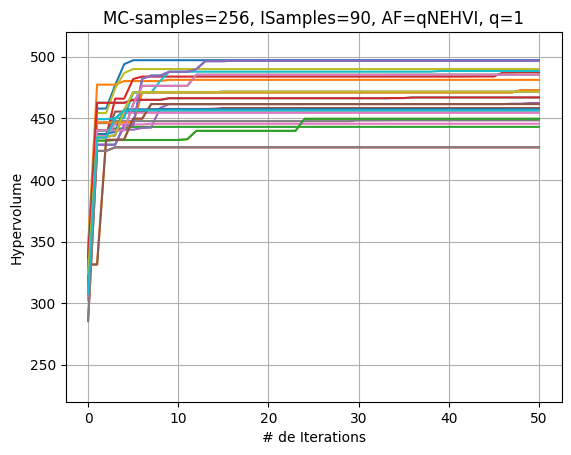

In [24]:
iters = np.arange(51)

for i in range(30):

    plt.errorbar(iters, np.asarray(hvsf27yexp9[i]), linewidth=1.5,label='%i' %i)
    plt.xlabel('# de Iterations')
    plt.ylabel('Hypervolume')
    plt.title('MC-samples=256, ISamples=90, AF=qNEHVI, q=1')
plt.grid()
plt.ylim([220,520])
plt.savefig('Exp9-27July')

In [25]:
%store BDs27yexp9
%store hvsf27yexp9
%store trainxall27yexp9
%store trainobjall27yexp9
%store numbd27yexp9

Stored 'BDs27yexp9' (list)
Stored 'hvsf27yexp9' (list)
Stored 'trainxall27yexp9' (list)
Stored 'trainobjall27yexp9' (list)
Stored 'numbd27yexp9' (list)


In [73]:
BDs27yexp10=[]
hvsf27yexp10=[]
trainxall27yexp10=[]
trainobjall27yexp10=[]
numbd27yexp10=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=100)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp10.append(bd.pareto_Y)      
    hvsf27yexp10.append(hvs_ehvi)   
    trainxall27yexp10.append(train_x_ehvi)
    trainobjall27yexp10.append(train_obj_ehvi)
    numbd27yexp10.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]

Seed: 869


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 462.6312 #Paprox=17 time = 20.69 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 462.6312 #Paprox=17 time = 20.59 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 465.0291 #Paprox=18 time = 21.36 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 465.0291 #Paprox=18 time = 20.91 Lysine= 1.1165 Energy= 14.0010 Costs= 154.5844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 465.0291 #Paprox=18 time = 21.12 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 465.0291 #Paprox=18 time = 21.98 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 465.0291 #Paprox=18 time = 22.26 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 474.0779 #Paprox=19 time = 22.97 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 474.1072 #Paprox=20 time = 21.85 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 474.1072 #Paprox=21 time = 21.87 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 477.1253 #Paprox=22 time = 23.02 Lysine= 1.0856 Energy= 14.2535 Costs= 149.4406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 477.1253 #Paprox=22 time = 21.40 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 477.1253 #Paprox=23 time = 21.46 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 477.4454 #Paprox=24 time = 21.68 Lysine= 1.1497 Energy= 14.1616 Costs= 150.6301)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 477.4455 #Paprox=25 time = 21.42 Lysine= 1.1901 Energy= 14.0434 Costs= 151.1548)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 480.1834 #Paprox=26 time = 21.51 Lysine= 1.0829 Energy= 14.0010 Costs= 147.9680)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 480.1834 #Paprox=27 time = 22.28 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 481.7110 #Paprox=28 time = 23.39 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 486.7626 #Paprox=29 time = 22.80 Lysine= 1.5658 Energy= 14.0010 Costs= 165.7649)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 487.2393 #Paprox=30 time = 23.23 Lysine= 1.5247 Energy= 14.0010 Costs= 164.9923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 487.8007 #Paprox=31 time = 23.37 Lysine= 1.1210 Energy= 14.0010 Costs= 149.4979)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 487.8007 #Paprox=31 time = 23.86 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 23.70 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 24.09 Lysine= 1.4292 Energy= 14.0010 Costs= 158.8677)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 24.67 Lysine= 1.4055 Energy= 14.0010 Costs= 159.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 24.31 Lysine= 1.4313 Energy= 14.0010 Costs= 159.5276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 23.74 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 26.41 Lysine= 1.4312 Energy= 14.0010 Costs= 159.5037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 25.15 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6967)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 25.69 Lysine= 1.4339 Energy= 14.0010 Costs= 160.3380)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 24.99 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 26.59 Lysine= 1.4268 Energy= 14.0010 Costs= 158.0857)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 26.03 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 25.64 Lysine= 1.4267 Energy= 14.0010 Costs= 158.0697)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 24.42 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 24.79 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 26.11 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 489.5527 #Paprox=32 time = 25.94 Lysine= 1.4323 Energy= 14.0010 Costs= 159.8315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 489.5757 #Paprox=33 time = 27.48 Lysine= 1.4250 Energy= 14.0010 Costs= 157.5365)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 489.5757 #Paprox=33 time = 26.31 Lysine= 1.4318 Energy= 14.0010 Costs= 159.6944)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 489.5757 #Paprox=33 time = 25.84 Lysine= 1.4283 Energy= 14.0010 Costs= 158.5609)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 489.5955 #Paprox=34 time = 27.66 Lysine= 1.4227 Energy= 14.0010 Costs= 156.8240)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 489.5955 #Paprox=34 time = 26.37 Lysine= 1.4291 Energy= 14.0010 Costs= 158.8311)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 489.5955 #Paprox=34 time = 26.74 Lysine= 1.4278 Energy= 14.0010 Costs= 158.4193)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 489.5955 #Paprox=34 time = 26.48 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 489.5965 #Paprox=35 time = 27.48 Lysine= 1.4260 Energy= 14.0010 Costs= 157.8523)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 489.5965 #Paprox=35 time = 26.76 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 489.5965 #Paprox=35 time = 27.50 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 489.5965 #Paprox=35 time = 26.75 Lysine= 1.4301 Energy= 14.0010 Costs= 159.1504)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▎                                      | 1/30 [20:11<9:45:44, 1211.87s/it]


Batch 50: Hypervolume (qNEHVI) = 489.5974 #Paprox=36 time = 27.61 Lysine= 1.4253 Energy= 14.0010 Costs= 157.6278)Seed: 20


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 337.4790 #Paprox=25 time = 22.19 Lysine= 1.1804 Energy= 14.0010 Costs= 158.3388)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 438.7407 #Paprox=26 time = 22.77 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 438.7407 #Paprox=26 time = 22.55 Lysine= 1.2609 Energy= 14.1175 Costs= 167.6762)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 462.8867 #Paprox=27 time = 21.05 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 471.6940 #Paprox=28 time = 21.83 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 471.7223 #Paprox=29 time = 22.68 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 471.7223 #Paprox=30 time = 21.52 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 472.4550 #Paprox=31 time = 21.67 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 472.4550 #Paprox=31 time = 22.19 Lysine= 1.3940 Energy= 14.0010 Costs= 165.1571)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 472.6976 #Paprox=32 time = 23.15 Lysine= 1.4694 Energy= 14.0010 Costs= 167.2547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 472.7015 #Paprox=33 time = 23.52 Lysine= 1.4669 Energy= 14.0010 Costs= 167.1835)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 475.8396 #Paprox=32 time = 24.34 Lysine= 1.5041 Energy= 14.0010 Costs= 164.1043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 475.8396 #Paprox=32 time = 24.02 Lysine= 1.0432 Energy= 14.0010 Costs= 151.1597)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 475.8396 #Paprox=32 time = 23.50 Lysine= 1.4417 Energy= 14.0010 Costs= 166.4831)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 475.8396 #Paprox=32 time = 23.87 Lysine= 0.9940 Energy= 14.0010 Costs= 154.6602)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 475.8396 #Paprox=32 time = 23.78 Lysine= 1.4347 Energy= 14.0010 Costs= 166.4939)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 475.8396 #Paprox=32 time = 24.43 Lysine= 0.9545 Energy= 14.0010 Costs= 153.3064)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 475.8396 #Paprox=32 time = 23.51 Lysine= 0.9619 Energy= 14.0010 Costs= 156.1312)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 475.8396 #Paprox=32 time = 23.69 Lysine= 0.9518 Energy= 14.0010 Costs= 152.3217)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 475.8396 #Paprox=32 time = 24.15 Lysine= 0.9501 Energy= 14.0010 Costs= 149.1368)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 475.8396 #Paprox=32 time = 24.37 Lysine= 1.3040 Energy= 14.0010 Costs= 163.3080)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 475.9106 #Paprox=33 time = 24.30 Lysine= 1.3773 Energy= 14.0010 Costs= 157.9211)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 475.9106 #Paprox=33 time = 23.75 Lysine= 1.4368 Energy= 14.0010 Costs= 166.3975)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 475.9106 #Paprox=33 time = 23.90 Lysine= 1.4045 Energy= 14.0010 Costs= 161.8815)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 475.9106 #Paprox=33 time = 24.07 Lysine= 1.2791 Energy= 14.0010 Costs= 156.2576)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 475.9106 #Paprox=33 time = 25.04 Lysine= 0.9501 Energy= 14.0010 Costs= 149.1456)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 475.9106 #Paprox=33 time = 24.55 Lysine= 1.1224 Energy= 14.0010 Costs= 152.7082)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 24.99 Lysine= 1.3202 Energy= 14.0010 Costs= 154.9738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 24.43 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 24.54 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 24.77 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 24.96 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 25.09 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 24.88 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 24.74 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 25.45 Lysine= 1.4338 Energy= 14.0010 Costs= 165.5247)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 25.24 Lysine= 1.3075 Energy= 14.0010 Costs= 157.5193)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 25.15 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 24.91 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 25.02 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 25.58 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 24.81 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 25.47 Lysine= 1.4396 Energy= 14.0010 Costs= 166.4792)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 25.78 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 25.23 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 25.95 Lysine= 1.3761 Energy= 14.0010 Costs= 162.1582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 25.28 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 25.51 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 25.53 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▋                                     | 2/30 [40:23<9:25:31, 1211.85s/it]


Batch 50: Hypervolume (qNEHVI) = 477.4334 #Paprox=34 time = 26.71 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)Seed: 287


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 428.1109 #Paprox=17 time = 19.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 428.1109 #Paprox=17 time = 20.03 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 459.1661 #Paprox=18 time = 19.62 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 459.1661 #Paprox=19 time = 20.03 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 459.1661 #Paprox=20 time = 19.92 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 459.1661 #Paprox=21 time = 20.36 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 459.1661 #Paprox=22 time = 20.68 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 459.1661 #Paprox=23 time = 20.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 459.1661 #Paprox=24 time = 20.94 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 459.1661 #Paprox=24 time = 21.08 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 459.1661 #Paprox=25 time = 21.10 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 459.1661 #Paprox=26 time = 21.61 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 459.1661 #Paprox=27 time = 21.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 470.6112 #Paprox=26 time = 22.29 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 476.5772 #Paprox=27 time = 17.79 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 478.3542 #Paprox=27 time = 18.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 478.3542 #Paprox=28 time = 16.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 17.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 478.3542 #Paprox=30 time = 18.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 478.3542 #Paprox=30 time = 18.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 478.3542 #Paprox=30 time = 18.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 478.3542 #Paprox=31 time = 18.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 478.3542 #Paprox=32 time = 19.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 478.3542 #Paprox=32 time = 19.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 478.3542 #Paprox=32 time = 19.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 478.3542 #Paprox=32 time = 19.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 478.3542 #Paprox=32 time = 19.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 478.3542 #Paprox=32 time = 19.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 478.3542 #Paprox=32 time = 20.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 478.3542 #Paprox=32 time = 19.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 478.3542 #Paprox=28 time = 19.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 478.3542 #Paprox=28 time = 19.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 19.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 19.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 20.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 19.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 20.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 19.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 20.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 20.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 20.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 20.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 21.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 20.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 20.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 20.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 20.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 21.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 20.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|████                                    | 3/30 [56:59<8:21:02, 1113.41s/it]


Batch 50: Hypervolume (qNEHVI) = 478.3542 #Paprox=29 time = 20.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 941


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 428.2765 #Paprox=20 time = 16.61 Lysine= 0.9501 Energy= 14.4624 Costs= 146.4663)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 428.2765 #Paprox=20 time = 17.08 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 428.4804 #Paprox=21 time = 17.43 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 428.4804 #Paprox=22 time = 18.28 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 428.4804 #Paprox=23 time = 17.91 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 428.4804 #Paprox=24 time = 18.06 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 428.4804 #Paprox=25 time = 18.54 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 428.4804 #Paprox=26 time = 17.93 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 428.4804 #Paprox=27 time = 17.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 428.4804 #Paprox=28 time = 18.37 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 458.1847 #Paprox=29 time = 18.61 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 458.1847 #Paprox=30 time = 19.14 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 458.1847 #Paprox=31 time = 19.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 458.1847 #Paprox=32 time = 19.77 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 458.1847 #Paprox=33 time = 19.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 458.1847 #Paprox=34 time = 19.57 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 458.1847 #Paprox=35 time = 19.93 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 458.1847 #Paprox=36 time = 20.01 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 458.1847 #Paprox=37 time = 19.33 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 458.1847 #Paprox=38 time = 19.54 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 458.1847 #Paprox=39 time = 20.03 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 458.1859 #Paprox=40 time = 19.80 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 458.4352 #Paprox=41 time = 14.26 Lysine= 0.9526 Energy= 14.3730 Costs= 147.3949)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 466.6960 #Paprox=42 time = 15.67 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 466.7748 #Paprox=43 time = 15.52 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 467.1502 #Paprox=44 time = 15.70 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 467.1502 #Paprox=45 time = 16.46 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 467.1502 #Paprox=46 time = 16.24 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 467.1502 #Paprox=47 time = 16.70 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 467.1502 #Paprox=48 time = 17.38 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 467.1502 #Paprox=49 time = 17.35 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 475.5174 #Paprox=50 time = 16.88 Lysine= 1.1325 Energy= 14.0010 Costs= 148.5695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 475.5174 #Paprox=51 time = 17.50 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 475.5174 #Paprox=51 time = 17.31 Lysine= 1.1572 Energy= 14.0010 Costs= 154.6563)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 476.2674 #Paprox=52 time = 17.69 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 476.2674 #Paprox=53 time = 18.05 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 476.2674 #Paprox=54 time = 18.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 476.2674 #Paprox=55 time = 18.74 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 482.0473 #Paprox=49 time = 18.17 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 482.0474 #Paprox=50 time = 18.08 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 482.0474 #Paprox=51 time = 18.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 482.0474 #Paprox=52 time = 18.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 482.0474 #Paprox=53 time = 18.47 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 482.0474 #Paprox=54 time = 18.36 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 482.0474 #Paprox=55 time = 19.91 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 482.0474 #Paprox=56 time = 18.70 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 482.0474 #Paprox=57 time = 18.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 482.0474 #Paprox=58 time = 19.33 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 482.0474 #Paprox=58 time = 19.31 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|█████                                 | 4/30 [1:12:08<7:27:28, 1032.65s/it]


Batch 50: Hypervolume (qNEHVI) = 482.0474 #Paprox=59 time = 19.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)Seed: 593

Batch  1: Hypervolume (qNEHVI) = 456.0926 #Paprox=21 time = 22.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 456.0926 #Paprox=21 time = 22.75 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 456.0926 #Paprox=22 time = 22.77 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.0926 #Paprox=23 time = 22.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.0926 #Paprox=24 time = 23.23 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.0926 #Paprox=25 time = 23.17 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 458.2543 #Paprox=25 time = 23.69 Lysine= 0.9501 Energy= 14.4226 Costs= 148.0875)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 458.2543 #Paprox=25 time = 22.96 Lysine= 1.1376 Energy= 14.0010 Costs= 155.8115)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 474.1803 #Paprox=25 time = 23.28 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 476.6255 #Paprox=24 time = 22.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.6255 #Paprox=25 time = 19.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 476.6255 #Paprox=26 time = 20.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 476.6255 #Paprox=27 time = 20.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 476.6255 #Paprox=28 time = 21.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 476.6255 #Paprox=29 time = 21.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 476.6255 #Paprox=30 time = 21.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 479.7052 #Paprox=31 time = 23.12 Lysine= 1.0416 Energy= 14.0194 Costs= 146.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 484.8715 #Paprox=32 time = 22.53 Lysine= 1.5658 Energy= 14.0010 Costs= 165.7649)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 485.4962 #Paprox=33 time = 22.32 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 485.9866 #Paprox=34 time = 22.31 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 486.4251 #Paprox=35 time = 23.33 Lysine= 0.9624 Energy= 14.0010 Costs= 144.3594)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 486.4251 #Paprox=35 time = 23.23 Lysine= 1.3671 Energy= 14.0010 Costs= 159.5931)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 486.4251 #Paprox=35 time = 23.16 Lysine= 1.3671 Energy= 14.0010 Costs= 159.5931)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 486.8046 #Paprox=36 time = 23.16 Lysine= 0.9843 Energy= 14.0010 Costs= 145.6794)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 486.8046 #Paprox=36 time = 23.65 Lysine= 1.3671 Energy= 14.0010 Costs= 159.5931)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 486.8046 #Paprox=36 time = 23.30 Lysine= 1.3671 Energy= 14.0010 Costs= 159.5931)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 489.4301 #Paprox=37 time = 24.14 Lysine= 1.3369 Energy= 14.0010 Costs= 154.1425)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 489.4301 #Paprox=38 time = 23.15 Lysine= 0.9843 Energy= 14.0010 Costs= 145.6794)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 489.5951 #Paprox=39 time = 23.67 Lysine= 1.3584 Energy= 14.0010 Costs= 154.7213)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 489.5951 #Paprox=39 time = 24.09 Lysine= 1.3671 Energy= 14.0010 Costs= 159.5931)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 23.98 Lysine= 1.3583 Energy= 14.0010 Costs= 154.6542)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.40 Lysine= 1.3671 Energy= 14.0010 Costs= 159.5931)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 25.39 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.06 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.45 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.59 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.62 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.43 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.20 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.82 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.66 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.55 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.84 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.63 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.79 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.59 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 25.10 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.38 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 25.05 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▎                               | 5/30 [1:31:42<7:31:31, 1083.67s/it]


Batch 50: Hypervolume (qNEHVI) = 489.6151 #Paprox=40 time = 24.69 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)Seed: 458

Batch  1: Hypervolume (qNEHVI) = 431.2380 #Paprox=14 time = 18.58 Lysine= 0.9501 Energy= 14.4714 Costs= 146.5662)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 431.2380 #Paprox=14 time = 19.01 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 471.0539 #Paprox=15 time = 18.02 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 471.0539 #Paprox=15 time = 18.60 Lysine= 1.2618 Energy= 14.0010 Costs= 163.7685)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 471.0539 #Paprox=16 time = 18.68 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 471.3049 #Paprox=17 time = 18.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 471.3049 #Paprox=18 time = 19.55 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 471.3049 #Paprox=19 time = 18.80 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 484.0188 #Paprox=20 time = 18.54 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 484.0188 #Paprox=21 time = 18.47 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 488.2434 #Paprox=22 time = 18.60 Lysine= 1.1144 Energy= 14.0010 Costs= 147.9483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 488.5440 #Paprox=23 time = 18.61 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 488.5440 #Paprox=23 time = 18.89 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 488.5440 #Paprox=24 time = 19.23 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 488.5440 #Paprox=25 time = 19.98 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 488.5440 #Paprox=26 time = 19.23 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 488.5440 #Paprox=27 time = 19.12 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 488.5440 #Paprox=28 time = 19.57 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 488.5440 #Paprox=29 time = 19.55 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 488.5440 #Paprox=30 time = 19.73 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 488.5440 #Paprox=31 time = 19.82 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 488.5440 #Paprox=31 time = 20.04 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 488.5440 #Paprox=32 time = 20.20 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 488.5440 #Paprox=33 time = 19.80 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 488.5440 #Paprox=34 time = 20.12 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 488.5440 #Paprox=35 time = 20.25 Lysine= 1.1144 Energy= 14.0010 Costs= 147.9483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 488.5440 #Paprox=36 time = 20.48 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 488.5440 #Paprox=37 time = 20.50 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 488.5440 #Paprox=37 time = 20.36 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 488.5440 #Paprox=37 time = 20.24 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 488.5440 #Paprox=38 time = 20.76 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 488.5440 #Paprox=39 time = 20.58 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 488.5440 #Paprox=40 time = 20.81 Lysine= 1.1144 Energy= 14.0010 Costs= 147.9483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 488.5440 #Paprox=40 time = 20.82 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 488.5440 #Paprox=41 time = 21.71 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 488.5440 #Paprox=41 time = 20.88 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 488.5440 #Paprox=42 time = 20.87 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 488.5440 #Paprox=43 time = 20.67 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 488.5440 #Paprox=44 time = 21.93 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 488.5440 #Paprox=45 time = 21.01 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 488.5440 #Paprox=45 time = 20.98 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 488.5440 #Paprox=46 time = 21.24 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 488.5440 #Paprox=47 time = 21.14 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 488.5440 #Paprox=48 time = 21.86 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 488.5440 #Paprox=49 time = 21.42 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 488.5440 #Paprox=50 time = 21.26 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 488.5440 #Paprox=51 time = 21.37 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 488.5440 #Paprox=51 time = 21.26 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 488.5440 #Paprox=51 time = 21.40 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|███████▌                              | 6/30 [1:48:29<7:02:55, 1057.30s/it]


Batch 50: Hypervolume (qNEHVI) = 488.5440 #Paprox=52 time = 21.76 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)Seed: 396


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 444.1056 #Paprox=18 time = 20.46 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 444.1056 #Paprox=18 time = 20.62 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 455.5911 #Paprox=18 time = 21.67 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 461.5571 #Paprox=19 time = 15.17 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 464.2412 #Paprox=18 time = 16.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 464.2412 #Paprox=19 time = 14.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 464.2412 #Paprox=20 time = 15.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 464.2412 #Paprox=21 time = 15.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 464.2412 #Paprox=22 time = 15.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 464.2412 #Paprox=23 time = 16.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 464.2412 #Paprox=24 time = 16.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 464.2412 #Paprox=25 time = 16.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 464.2412 #Paprox=25 time = 16.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 464.2412 #Paprox=25 time = 17.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 464.2412 #Paprox=25 time = 16.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 464.2412 #Paprox=26 time = 17.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 464.2412 #Paprox=27 time = 16.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 464.2412 #Paprox=27 time = 17.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 464.2412 #Paprox=28 time = 17.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 464.2412 #Paprox=29 time = 17.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 464.2412 #Paprox=30 time = 17.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 464.2412 #Paprox=31 time = 17.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 464.2412 #Paprox=31 time = 17.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 464.2412 #Paprox=31 time = 18.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 464.2412 #Paprox=32 time = 17.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 464.2412 #Paprox=33 time = 17.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 464.2412 #Paprox=34 time = 18.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 464.2412 #Paprox=35 time = 18.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 464.2412 #Paprox=36 time = 18.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 464.2412 #Paprox=37 time = 17.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 464.2412 #Paprox=38 time = 18.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 464.2412 #Paprox=39 time = 18.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 464.2412 #Paprox=39 time = 18.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 464.2412 #Paprox=40 time = 18.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 464.2412 #Paprox=40 time = 18.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 464.2412 #Paprox=40 time = 18.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 464.2412 #Paprox=41 time = 18.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 464.2412 #Paprox=41 time = 18.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 464.2412 #Paprox=42 time = 18.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 464.2412 #Paprox=43 time = 18.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 464.2412 #Paprox=44 time = 18.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 464.2412 #Paprox=45 time = 19.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 464.2412 #Paprox=46 time = 18.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 464.2412 #Paprox=47 time = 19.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 464.2412 #Paprox=47 time = 18.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 464.2412 #Paprox=48 time = 19.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 464.2412 #Paprox=49 time = 18.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 464.2412 #Paprox=50 time = 19.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 464.2412 #Paprox=51 time = 18.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 23%|████████▊                             | 7/30 [2:03:22<6:24:46, 1003.77s/it]


Batch 50: Hypervolume (qNEHVI) = 464.2412 #Paprox=52 time = 18.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 763


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 451.4176 #Paprox=18 time = 22.91 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 451.4176 #Paprox=18 time = 22.41 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 456.2654 #Paprox=19 time = 23.16 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.2654 #Paprox=19 time = 22.67 Lysine= 1.1040 Energy= 14.0010 Costs= 161.1901)
Batch  5: Hypervolume (qNEHVI) = 482.5710 #Paprox=20 time = 23.13 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  6: Hypervolume (qNEHVI) = 482.5710 #Paprox=20 time = 23.26 Lysine= 0.9501 Energy= 14.1151 Costs= 154.6846)
Batch  7: Hypervolume (qNEHVI) = 482.5710 #Paprox=20 time = 23.96 Lysine= 1.6358 Energy= 14.0010 Costs= 191.5642)
Batch  8: Hypervolume (qNEHVI) = 483.8450 #Paprox=21 time = 23.26 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)
Batch  9: Hypervolume (qNEHVI) = 483.8470 #Paprox=22 time = 22.75 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 483.8470 #Paprox=23 time = 20.26 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 483.8470 #Paprox=24 time = 22.81 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 484.1955 #Paprox=25 time = 22.72 Lysine= 1.1940 Energy= 14.3012 Costs= 154.8632)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 484.1973 #Paprox=26 time = 17.43 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 484.1973 #Paprox=27 time = 15.06 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 484.1973 #Paprox=28 time = 12.46 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 484.1973 #Paprox=29 time = 12.58 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 484.1973 #Paprox=30 time = 11.72 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 484.1973 #Paprox=31 time = 11.73 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 484.1973 #Paprox=32 time = 11.48 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 484.2002 #Paprox=33 time = 11.81 Lysine= 1.2389 Energy= 14.2939 Costs= 155.8724)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 484.2002 #Paprox=34 time = 10.60 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 484.2002 #Paprox=35 time = 10.77 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 484.2004 #Paprox=36 time = 10.47 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 484.2004 #Paprox=37 time = 10.97 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 484.2004 #Paprox=38 time = 10.61 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 484.2004 #Paprox=39 time = 10.55 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 484.2004 #Paprox=40 time = 10.84 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 484.2004 #Paprox=41 time = 10.83 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 484.2004 #Paprox=42 time = 10.72 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 484.2004 #Paprox=43 time = 11.08 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 484.2004 #Paprox=44 time = 11.22 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 484.2004 #Paprox=45 time = 12.26 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 484.2004 #Paprox=46 time = 11.43 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 484.2004 #Paprox=47 time = 11.03 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 484.2004 #Paprox=48 time = 11.37 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 484.2004 #Paprox=49 time = 11.53 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 484.2004 #Paprox=50 time = 11.34 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 484.2004 #Paprox=51 time = 11.75 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 484.2004 #Paprox=52 time = 11.12 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 484.2004 #Paprox=53 time = 11.64 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 484.2004 #Paprox=54 time = 12.24 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 484.2004 #Paprox=55 time = 11.94 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 484.2004 #Paprox=56 time = 12.00 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 484.2004 #Paprox=57 time = 12.90 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 484.2004 #Paprox=58 time = 13.78 Lysine= 1.2792 Energy= 14.2571 Costs= 156.5722)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 484.2004 #Paprox=59 time = 12.30 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 484.2004 #Paprox=60 time = 11.94 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 484.2004 #Paprox=61 time = 12.24 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 484.2004 #Paprox=62 time = 12.20 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 27%|██████████▍                            | 8/30 [2:15:27<5:35:31, 915.05s/it]


Batch 50: Hypervolume (qNEHVI) = 484.2004 #Paprox=63 time = 12.29 Lysine= 1.2685 Energy= 14.2879 Costs= 156.5668)Seed: 236


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 444.1770 #Paprox=20 time = 21.90 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 444.1770 #Paprox=20 time = 21.68 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 457.7960 #Paprox=21 time = 22.25 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 457.8419 #Paprox=22 time = 21.23 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 458.5746 #Paprox=23 time = 21.42 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 458.5746 #Paprox=23 time = 22.51 Lysine= 1.5432 Energy= 14.0010 Costs= 169.1336)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 458.5746 #Paprox=23 time = 24.10 Lysine= 1.5079 Energy= 14.0010 Costs= 168.5995)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 458.5746 #Paprox=23 time = 24.35 Lysine= 1.2063 Energy= 14.0010 Costs= 157.2435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 458.5746 #Paprox=23 time = 23.33 Lysine= 1.0486 Energy= 14.0010 Costs= 153.9506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 458.5746 #Paprox=23 time = 23.97 Lysine= 1.1046 Energy= 14.0010 Costs= 154.0459)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 458.5746 #Paprox=23 time = 24.00 Lysine= 1.0542 Energy= 14.0010 Costs= 154.9592)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 458.5746 #Paprox=23 time = 24.01 Lysine= 1.0588 Energy= 14.0010 Costs= 154.4592)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 458.5746 #Paprox=23 time = 24.51 Lysine= 1.0063 Energy= 14.0010 Costs= 151.1773)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 458.6052 #Paprox=24 time = 24.07 Lysine= 0.9920 Energy= 14.0010 Costs= 150.6808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 458.6052 #Paprox=24 time = 24.06 Lysine= 0.9918 Energy= 14.0010 Costs= 150.7292)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 458.6052 #Paprox=24 time = 23.99 Lysine= 1.0360 Energy= 14.0010 Costs= 151.6021)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 458.6536 #Paprox=25 time = 23.43 Lysine= 0.9560 Energy= 14.0010 Costs= 150.0976)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 458.6536 #Paprox=25 time = 25.42 Lysine= 0.9878 Energy= 14.0010 Costs= 150.8475)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 458.6536 #Paprox=25 time = 24.06 Lysine= 1.4267 Energy= 14.0010 Costs= 160.1810)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 458.6536 #Paprox=25 time = 23.89 Lysine= 0.9695 Energy= 14.0010 Costs= 150.6828)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 458.7089 #Paprox=26 time = 24.50 Lysine= 0.9643 Energy= 14.0010 Costs= 150.2013)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 458.7089 #Paprox=26 time = 23.74 Lysine= 1.4212 Energy= 14.0010 Costs= 160.0723)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 458.7089 #Paprox=26 time = 25.15 Lysine= 1.3037 Energy= 14.0010 Costs= 157.7229)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 458.7089 #Paprox=26 time = 24.39 Lysine= 1.4200 Energy= 14.0010 Costs= 160.0141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 458.7089 #Paprox=26 time = 24.99 Lysine= 0.9501 Energy= 14.0010 Costs= 149.9183)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 458.7129 #Paprox=27 time = 25.13 Lysine= 1.1983 Energy= 14.0010 Costs= 155.3898)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 458.7129 #Paprox=27 time = 25.31 Lysine= 1.3842 Energy= 14.0010 Costs= 159.2863)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 458.7129 #Paprox=27 time = 25.78 Lysine= 1.4255 Energy= 14.0010 Costs= 160.0136)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 458.7354 #Paprox=28 time = 25.45 Lysine= 1.4341 Energy= 14.0010 Costs= 160.5149)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 458.7410 #Paprox=29 time = 25.84 Lysine= 0.9515 Energy= 14.0010 Costs= 149.8113)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 458.7410 #Paprox=30 time = 24.89 Lysine= 1.4312 Energy= 14.0010 Costs= 160.5287)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 458.7410 #Paprox=30 time = 24.94 Lysine= 1.4209 Energy= 14.0010 Costs= 160.0780)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 458.7587 #Paprox=31 time = 25.23 Lysine= 1.4084 Energy= 14.0010 Costs= 159.5288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 458.7650 #Paprox=32 time = 24.82 Lysine= 1.4120 Energy= 14.0010 Costs= 159.6891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 458.7650 #Paprox=32 time = 25.54 Lysine= 1.4226 Energy= 14.0010 Costs= 160.1542)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 458.7690 #Paprox=33 time = 25.24 Lysine= 1.4055 Energy= 14.0010 Costs= 159.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 458.7690 #Paprox=33 time = 26.00 Lysine= 1.4180 Energy= 14.0010 Costs= 159.9536)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 458.7690 #Paprox=33 time = 25.07 Lysine= 1.4185 Energy= 14.0010 Costs= 159.9717)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 458.7690 #Paprox=33 time = 25.79 Lysine= 1.4211 Energy= 14.0010 Costs= 160.0882)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 458.7690 #Paprox=33 time = 25.61 Lysine= 1.4181 Energy= 14.0010 Costs= 159.9567)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 458.7690 #Paprox=33 time = 25.87 Lysine= 1.4217 Energy= 14.0010 Costs= 160.1158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 458.7690 #Paprox=33 time = 26.19 Lysine= 1.4210 Energy= 14.0010 Costs= 160.0835)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 458.7690 #Paprox=34 time = 25.94 Lysine= 1.4055 Energy= 14.0010 Costs= 159.4022)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 458.7690 #Paprox=34 time = 26.42 Lysine= 1.4257 Energy= 14.0010 Costs= 160.2903)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 458.7690 #Paprox=34 time = 26.50 Lysine= 1.4232 Energy= 14.0010 Costs= 160.1810)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 458.7690 #Paprox=34 time = 26.32 Lysine= 1.4280 Energy= 14.0010 Costs= 160.3884)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 458.7690 #Paprox=34 time = 26.57 Lysine= 1.4231 Energy= 14.0010 Costs= 160.1736)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 458.7690 #Paprox=34 time = 26.89 Lysine= 1.4287 Energy= 14.0010 Costs= 160.4198)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 458.7690 #Paprox=34 time = 27.35 Lysine= 1.4217 Energy= 14.0010 Costs= 160.1119)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 30%|███████████▍                          | 9/30 [2:36:05<5:55:37, 1016.08s/it]


Batch 50: Hypervolume (qNEHVI) = 458.7690 #Paprox=34 time = 27.04 Lysine= 1.4166 Energy= 14.0010 Costs= 159.8886)Seed: 307


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 422.4090 #Paprox=14 time = 22.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 422.4090 #Paprox=14 time = 21.13 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 422.4090 #Paprox=15 time = 21.26 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 422.4090 #Paprox=16 time = 22.23 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 422.4090 #Paprox=17 time = 21.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 453.4642 #Paprox=18 time = 22.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 453.4642 #Paprox=19 time = 22.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 453.4642 #Paprox=20 time = 22.54 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 453.4642 #Paprox=21 time = 22.62 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 453.4642 #Paprox=22 time = 22.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 453.4642 #Paprox=23 time = 22.84 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 453.4642 #Paprox=24 time = 23.12 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 453.4642 #Paprox=25 time = 23.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 453.4642 #Paprox=26 time = 23.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 453.4642 #Paprox=27 time = 23.40 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 453.4642 #Paprox=28 time = 23.25 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 453.4642 #Paprox=29 time = 24.68 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 453.4642 #Paprox=30 time = 23.25 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 453.4642 #Paprox=31 time = 23.86 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 453.4642 #Paprox=32 time = 23.71 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 453.4642 #Paprox=32 time = 24.36 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 453.4642 #Paprox=33 time = 24.69 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 453.4642 #Paprox=34 time = 24.75 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 453.4725 #Paprox=34 time = 24.32 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 453.4725 #Paprox=35 time = 19.42 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 453.4725 #Paprox=36 time = 17.55 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 453.4725 #Paprox=37 time = 16.75 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 453.4725 #Paprox=38 time = 15.27 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 453.4725 #Paprox=39 time = 15.20 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 470.0968 #Paprox=40 time = 16.47 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 470.0968 #Paprox=41 time = 15.15 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 470.0968 #Paprox=42 time = 15.31 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 471.3115 #Paprox=43 time = 15.32 Lysine= 1.1604 Energy= 14.0010 Costs= 149.6270)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 473.0938 #Paprox=41 time = 16.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 473.0938 #Paprox=42 time = 13.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 473.0938 #Paprox=43 time = 14.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 473.0938 #Paprox=44 time = 14.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 473.0938 #Paprox=45 time = 14.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 473.0938 #Paprox=46 time = 15.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 473.1590 #Paprox=47 time = 15.79 Lysine= 1.1276 Energy= 14.4767 Costs= 151.8510)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 473.1590 #Paprox=48 time = 15.66 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 473.1590 #Paprox=49 time = 15.36 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 473.1590 #Paprox=49 time = 16.88 Lysine= 1.1466 Energy= 14.0010 Costs= 152.2980)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 473.1590 #Paprox=50 time = 16.30 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 473.1590 #Paprox=51 time = 16.39 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 473.1590 #Paprox=52 time = 15.59 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 473.1590 #Paprox=53 time = 16.40 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 473.1590 #Paprox=54 time = 16.38 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 473.1590 #Paprox=54 time = 16.77 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|████████████▎                        | 10/30 [2:52:15<5:33:53, 1001.66s/it]


Batch 50: Hypervolume (qNEHVI) = 473.1590 #Paprox=55 time = 15.96 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 528


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 440.1008 #Paprox=15 time = 19.05 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 440.1008 #Paprox=15 time = 18.66 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 440.1008 #Paprox=15 time = 19.63 Lysine= 1.2618 Energy= 14.0010 Costs= 163.7685)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 444.9485 #Paprox=16 time = 18.90 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 471.2541 #Paprox=17 time = 20.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 480.2766 #Paprox=18 time = 20.44 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 480.2766 #Paprox=19 time = 20.83 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 480.2766 #Paprox=20 time = 20.65 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 480.2766 #Paprox=21 time = 20.57 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 493.3910 #Paprox=22 time = 20.37 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 494.1677 #Paprox=22 time = 20.97 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 494.1677 #Paprox=22 time = 21.61 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 494.1677 #Paprox=23 time = 20.87 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 494.1677 #Paprox=23 time = 21.10 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 494.1677 #Paprox=24 time = 22.17 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 494.1677 #Paprox=25 time = 21.47 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 494.1677 #Paprox=25 time = 21.90 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 494.1677 #Paprox=25 time = 22.06 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 494.1677 #Paprox=26 time = 21.27 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 494.1677 #Paprox=26 time = 21.47 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 494.1677 #Paprox=26 time = 22.01 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 494.1677 #Paprox=26 time = 21.81 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 494.1677 #Paprox=27 time = 21.73 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 494.1677 #Paprox=28 time = 22.16 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 494.1677 #Paprox=29 time = 21.83 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 494.1677 #Paprox=29 time = 22.19 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 494.1677 #Paprox=30 time = 21.71 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 494.1677 #Paprox=31 time = 22.80 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 494.1677 #Paprox=31 time = 22.69 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4312)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 494.1677 #Paprox=32 time = 22.57 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 494.1677 #Paprox=33 time = 23.26 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 494.1677 #Paprox=33 time = 22.49 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 494.1677 #Paprox=33 time = 22.80 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 494.1677 #Paprox=33 time = 22.50 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 494.1677 #Paprox=33 time = 22.82 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4312)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 494.1677 #Paprox=33 time = 22.54 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 494.1677 #Paprox=34 time = 24.21 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 494.1677 #Paprox=34 time = 22.90 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 494.1677 #Paprox=34 time = 23.56 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4312)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 494.1677 #Paprox=35 time = 23.35 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 494.1677 #Paprox=35 time = 24.67 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 494.1677 #Paprox=35 time = 22.95 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 494.1677 #Paprox=36 time = 22.77 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 494.1677 #Paprox=37 time = 23.61 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 494.1677 #Paprox=38 time = 23.41 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 494.1677 #Paprox=39 time = 24.58 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 494.1677 #Paprox=40 time = 24.19 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 494.1677 #Paprox=40 time = 23.21 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 494.1677 #Paprox=40 time = 23.12 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 37%|█████████████▌                       | 11/30 [3:10:39<5:27:06, 1032.96s/it]


Batch 50: Hypervolume (qNEHVI) = 503.3561 #Paprox=41 time = 23.61 Lysine= 1.1684 Energy= 14.0010 Costs= 147.8659)Seed: 842


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 456.0690 #Paprox=16 time = 21.16 Lysine= 0.9501 Energy= 14.3926 Costs= 145.6792)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 456.0690 #Paprox=16 time = 21.63 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 475.2178 #Paprox=17 time = 22.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 492.2897 #Paprox=18 time = 21.66 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 492.2897 #Paprox=19 time = 22.16 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 492.2897 #Paprox=20 time = 22.25 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 492.2897 #Paprox=20 time = 22.14 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 492.2897 #Paprox=21 time = 22.45 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 492.2897 #Paprox=22 time = 22.69 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 492.2897 #Paprox=23 time = 23.10 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 492.2897 #Paprox=24 time = 22.57 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 492.2897 #Paprox=25 time = 22.34 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 492.2897 #Paprox=26 time = 22.72 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 492.2897 #Paprox=27 time = 22.67 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 492.2897 #Paprox=28 time = 22.84 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 492.2897 #Paprox=29 time = 23.32 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 492.2897 #Paprox=30 time = 22.87 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 494.9238 #Paprox=29 time = 23.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 494.9238 #Paprox=30 time = 22.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 494.9238 #Paprox=31 time = 22.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 494.9238 #Paprox=31 time = 22.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 494.9238 #Paprox=32 time = 23.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 494.9238 #Paprox=33 time = 23.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 494.9238 #Paprox=34 time = 23.94 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 494.9238 #Paprox=35 time = 24.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 494.9238 #Paprox=36 time = 24.43 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 494.9238 #Paprox=37 time = 24.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 494.9238 #Paprox=38 time = 24.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 494.9238 #Paprox=39 time = 25.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 494.9240 #Paprox=40 time = 24.56 Lysine= 1.1403 Energy= 14.5441 Costs= 152.5791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 494.9240 #Paprox=41 time = 24.61 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 494.9240 #Paprox=42 time = 24.72 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 494.9240 #Paprox=43 time = 25.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 494.9240 #Paprox=44 time = 25.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 494.9240 #Paprox=45 time = 24.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 494.9240 #Paprox=46 time = 25.39 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 494.9240 #Paprox=47 time = 25.19 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 494.9240 #Paprox=47 time = 25.21 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 494.9240 #Paprox=48 time = 26.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 494.9240 #Paprox=49 time = 25.62 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 494.9240 #Paprox=50 time = 25.49 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 494.9240 #Paprox=51 time = 25.17 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 494.9240 #Paprox=52 time = 25.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 494.9240 #Paprox=53 time = 25.13 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 494.9240 #Paprox=54 time = 25.91 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 494.9240 #Paprox=55 time = 25.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 494.9240 #Paprox=56 time = 25.80 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 494.9240 #Paprox=57 time = 25.56 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 494.9240 #Paprox=57 time = 25.71 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 40%|██████████████▊                      | 12/30 [3:30:40<5:25:13, 1084.07s/it]


Batch 50: Hypervolume (qNEHVI) = 494.9240 #Paprox=58 time = 26.76 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)Seed: 523


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 447.7287 #Paprox=29 time = 22.45 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 447.7287 #Paprox=29 time = 22.55 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 471.8747 #Paprox=30 time = 22.80 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 484.8571 #Paprox=30 time = 22.79 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 484.8571 #Paprox=31 time = 22.79 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 487.1543 #Paprox=32 time = 23.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 487.1543 #Paprox=33 time = 20.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 487.1543 #Paprox=34 time = 21.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 487.1543 #Paprox=35 time = 21.87 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 487.1543 #Paprox=36 time = 22.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 487.1543 #Paprox=37 time = 23.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 487.1543 #Paprox=38 time = 22.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 487.1543 #Paprox=39 time = 22.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 487.1543 #Paprox=40 time = 22.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 487.1543 #Paprox=41 time = 23.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 487.1543 #Paprox=41 time = 23.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 487.1543 #Paprox=42 time = 23.12 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 487.1543 #Paprox=43 time = 23.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 487.1543 #Paprox=44 time = 23.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 487.1543 #Paprox=45 time = 23.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 487.1543 #Paprox=46 time = 23.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 487.1543 #Paprox=47 time = 24.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 487.1543 #Paprox=48 time = 23.92 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 487.1543 #Paprox=49 time = 24.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 487.1543 #Paprox=50 time = 23.99 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 487.1543 #Paprox=51 time = 25.17 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 487.1543 #Paprox=52 time = 24.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 487.1543 #Paprox=53 time = 24.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 487.1543 #Paprox=54 time = 24.42 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 487.1543 #Paprox=55 time = 25.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 487.1543 #Paprox=56 time = 24.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 487.1543 #Paprox=57 time = 25.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 487.1543 #Paprox=58 time = 24.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 487.1543 #Paprox=59 time = 24.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 487.1543 #Paprox=60 time = 25.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 487.1543 #Paprox=60 time = 25.02 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 487.1543 #Paprox=61 time = 25.01 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 487.1543 #Paprox=61 time = 25.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 487.1543 #Paprox=62 time = 25.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 487.1543 #Paprox=63 time = 25.52 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 487.1543 #Paprox=64 time = 25.02 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 487.1543 #Paprox=65 time = 26.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 487.1543 #Paprox=66 time = 25.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 487.1543 #Paprox=67 time = 25.49 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 487.1543 #Paprox=67 time = 26.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 487.1543 #Paprox=67 time = 25.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 487.1543 #Paprox=68 time = 25.68 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 487.1543 #Paprox=69 time = 25.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 487.1543 #Paprox=70 time = 25.93 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 43%|████████████████                     | 13/30 [3:50:48<5:17:50, 1121.78s/it]


Batch 50: Hypervolume (qNEHVI) = 487.1543 #Paprox=71 time = 25.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 132


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 446.7535 #Paprox=15 time = 22.21 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 446.7535 #Paprox=15 time = 21.61 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 446.7856 #Paprox=16 time = 22.20 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 465.6622 #Paprox=17 time = 21.58 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 465.6622 #Paprox=17 time = 22.06 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 465.7934 #Paprox=18 time = 21.72 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 465.7934 #Paprox=19 time = 22.24 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 465.7934 #Paprox=20 time = 22.92 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 466.0592 #Paprox=21 time = 23.31 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 466.0592 #Paprox=22 time = 22.84 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 466.0592 #Paprox=23 time = 22.45 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 466.0592 #Paprox=24 time = 22.83 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 466.0592 #Paprox=25 time = 22.62 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 466.0592 #Paprox=26 time = 22.95 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 466.0592 #Paprox=27 time = 23.11 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 466.0592 #Paprox=28 time = 22.77 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 466.0592 #Paprox=29 time = 23.01 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 466.0592 #Paprox=30 time = 23.05 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 466.0592 #Paprox=31 time = 23.22 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 466.0592 #Paprox=32 time = 23.99 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 466.0592 #Paprox=33 time = 23.57 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 466.0592 #Paprox=34 time = 23.23 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 466.0592 #Paprox=35 time = 24.16 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 466.0592 #Paprox=36 time = 23.77 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 466.0592 #Paprox=37 time = 23.61 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 466.0592 #Paprox=38 time = 23.72 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 466.0592 #Paprox=39 time = 23.91 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 466.0592 #Paprox=40 time = 24.24 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 466.0592 #Paprox=41 time = 23.87 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 466.6342 #Paprox=42 time = 24.52 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 466.6342 #Paprox=43 time = 24.49 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 466.6342 #Paprox=44 time = 25.08 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 466.6342 #Paprox=45 time = 24.21 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 466.6342 #Paprox=46 time = 24.18 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 466.6342 #Paprox=47 time = 24.02 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 466.6342 #Paprox=48 time = 24.84 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 466.6342 #Paprox=49 time = 24.70 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 466.6342 #Paprox=50 time = 25.08 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 466.6342 #Paprox=51 time = 25.13 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 466.6342 #Paprox=52 time = 25.47 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 466.6342 #Paprox=53 time = 24.90 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 466.6342 #Paprox=54 time = 25.06 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 466.6342 #Paprox=55 time = 25.06 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 466.6342 #Paprox=56 time = 25.17 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 466.6342 #Paprox=57 time = 25.35 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 466.6342 #Paprox=58 time = 25.27 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 466.6342 #Paprox=59 time = 25.69 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 466.6342 #Paprox=60 time = 25.36 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 466.6342 #Paprox=61 time = 25.34 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 47%|█████████████████▎                   | 14/30 [4:10:41<5:04:52, 1143.25s/it]


Batch 50: Hypervolume (qNEHVI) = 466.6342 #Paprox=62 time = 25.80 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)Seed: 622


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 445.5210 #Paprox=19 time = 21.05 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 445.5210 #Paprox=19 time = 21.61 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 445.5210 #Paprox=19 time = 21.57 Lysine= 1.1923 Energy= 14.0010 Costs= 171.8849)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 445.6389 #Paprox=20 time = 21.66 Lysine= 0.9501 Energy= 14.4132 Costs= 151.5991)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 445.6733 #Paprox=20 time = 22.81 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 446.2704 #Paprox=21 time = 22.57 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 446.2704 #Paprox=21 time = 21.98 Lysine= 0.9501 Energy= 14.4406 Costs= 152.4815)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 447.6992 #Paprox=22 time = 22.97 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 447.6992 #Paprox=23 time = 22.50 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 447.6992 #Paprox=24 time = 23.68 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 447.6992 #Paprox=24 time = 22.21 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 447.7476 #Paprox=25 time = 23.13 Lysine= 0.9501 Energy= 14.5506 Costs= 153.0205)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 448.8074 #Paprox=25 time = 22.80 Lysine= 0.9501 Energy= 14.6149 Costs= 152.6540)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 448.8819 #Paprox=25 time = 23.04 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 448.8819 #Paprox=25 time = 23.42 Lysine= 0.9501 Energy= 14.3987 Costs= 152.3182)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 448.8819 #Paprox=25 time = 24.00 Lysine= 0.9501 Energy= 14.4250 Costs= 152.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 448.8819 #Paprox=25 time = 23.87 Lysine= 0.9501 Energy= 14.5771 Costs= 152.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 448.8819 #Paprox=25 time = 23.83 Lysine= 0.9501 Energy= 14.5123 Costs= 152.6205)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 448.9006 #Paprox=25 time = 23.69 Lysine= 0.9501 Energy= 14.5644 Costs= 151.7582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 448.9006 #Paprox=25 time = 24.05 Lysine= 0.9501 Energy= 14.6025 Costs= 152.7246)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 448.9006 #Paprox=25 time = 24.03 Lysine= 0.9501 Energy= 14.5965 Costs= 152.7125)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 448.9011 #Paprox=26 time = 24.12 Lysine= 0.9501 Energy= 14.6032 Costs= 152.6152)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 448.9803 #Paprox=25 time = 24.26 Lysine= 0.9501 Energy= 14.5690 Costs= 151.0272)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 449.0334 #Paprox=26 time = 24.14 Lysine= 0.9501 Energy= 14.5826 Costs= 150.8236)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 449.0436 #Paprox=27 time = 24.11 Lysine= 0.9501 Energy= 14.5923 Costs= 151.5067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 449.1303 #Paprox=28 time = 24.30 Lysine= 0.9501 Energy= 14.5578 Costs= 150.2011)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 449.1303 #Paprox=28 time = 24.32 Lysine= 0.9501 Energy= 14.5264 Costs= 152.6406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 449.1465 #Paprox=29 time = 24.57 Lysine= 0.9501 Energy= 14.6053 Costs= 151.3876)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 449.2412 #Paprox=28 time = 24.61 Lysine= 0.9501 Energy= 14.5834 Costs= 149.7674)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 449.3710 #Paprox=29 time = 24.85 Lysine= 0.9501 Energy= 14.5846 Costs= 149.0706)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 449.9711 #Paprox=30 time = 24.86 Lysine= 1.3858 Energy= 14.5493 Costs= 158.4987)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 449.9711 #Paprox=30 time = 19.65 Lysine= 0.9501 Energy= 14.4210 Costs= 150.5816)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 449.9711 #Paprox=30 time = 19.58 Lysine= 0.9501 Energy= 14.4892 Costs= 150.0524)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 450.0335 #Paprox=29 time = 19.71 Lysine= 1.3872 Energy= 14.5434 Costs= 157.5727)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 450.2101 #Paprox=28 time = 12.37 Lysine= 0.9501 Energy= 14.5806 Costs= 148.0882)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 450.2101 #Paprox=29 time = 12.72 Lysine= 0.9501 Energy= 14.5773 Costs= 148.1068)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 450.2119 #Paprox=30 time = 13.05 Lysine= 1.3863 Energy= 14.5477 Costs= 157.5770)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 450.3591 #Paprox=29 time = 11.57 Lysine= 1.3866 Energy= 14.5754 Costs= 157.5258)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 450.3591 #Paprox=30 time = 11.41 Lysine= 0.9501 Energy= 14.3115 Costs= 147.1645)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 450.3591 #Paprox=30 time = 12.04 Lysine= 0.9501 Energy= 14.0773 Costs= 147.6172)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 450.3591 #Paprox=31 time = 12.21 Lysine= 0.9501 Energy= 14.0073 Costs= 145.6808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 459.8128 #Paprox=32 time = 12.31 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9482)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 459.8128 #Paprox=32 time = 11.82 Lysine= 0.9501 Energy= 14.0010 Costs= 145.4459)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 465.5865 #Paprox=33 time = 11.87 Lysine= 0.9501 Energy= 14.0010 Costs= 144.5142)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 465.5865 #Paprox=33 time = 12.43 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 465.5865 #Paprox=34 time = 12.81 Lysine= 0.9501 Energy= 14.0010 Costs= 144.8122)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 465.5865 #Paprox=35 time = 13.55 Lysine= 0.9501 Energy= 14.0010 Costs= 145.7196)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 465.5865 #Paprox=36 time = 12.32 Lysine= 0.9501 Energy= 14.0010 Costs= 145.2088)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 465.5865 #Paprox=36 time = 12.35 Lysine= 0.9501 Energy= 14.0010 Costs= 145.1192)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 50%|██████████████████▌                  | 15/30 [4:27:04<4:33:41, 1094.78s/it]


Batch 50: Hypervolume (qNEHVI) = 465.5865 #Paprox=36 time = 12.64 Lysine= 0.9501 Energy= 14.0010 Costs= 144.8568)Seed: 57


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 433.7252 #Paprox=25 time = 22.25 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 433.7252 #Paprox=25 time = 22.31 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 457.8712 #Paprox=26 time = 22.54 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 471.4051 #Paprox=27 time = 22.74 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  5: Hypervolume (qNEHVI) = 472.8922 #Paprox=24 time = 22.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 472.8922 #Paprox=25 time = 19.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 472.8922 #Paprox=26 time = 20.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 472.8922 #Paprox=27 time = 20.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 472.8922 #Paprox=28 time = 20.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 472.8922 #Paprox=29 time = 21.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 472.8922 #Paprox=29 time = 21.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 472.8922 #Paprox=30 time = 21.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 472.8922 #Paprox=31 time = 21.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 472.8922 #Paprox=32 time = 22.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 472.8922 #Paprox=33 time = 22.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 472.8922 #Paprox=34 time = 22.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 472.8922 #Paprox=34 time = 22.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 472.8922 #Paprox=35 time = 22.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 472.8922 #Paprox=36 time = 22.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 472.8922 #Paprox=37 time = 23.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 472.8922 #Paprox=38 time = 22.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 472.8922 #Paprox=39 time = 22.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 472.8922 #Paprox=40 time = 23.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 472.8922 #Paprox=40 time = 22.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.8922 #Paprox=40 time = 22.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 472.8922 #Paprox=41 time = 22.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 472.8922 #Paprox=42 time = 23.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 472.8922 #Paprox=43 time = 23.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 472.8922 #Paprox=44 time = 23.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 472.8922 #Paprox=44 time = 23.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 472.8922 #Paprox=45 time = 23.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 472.8922 #Paprox=46 time = 23.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 472.8922 #Paprox=45 time = 23.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 472.8922 #Paprox=45 time = 23.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 472.8922 #Paprox=46 time = 23.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 472.8922 #Paprox=46 time = 23.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 472.8922 #Paprox=47 time = 23.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 472.8922 #Paprox=47 time = 23.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 472.8922 #Paprox=48 time = 24.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 472.8922 #Paprox=49 time = 24.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 472.8922 #Paprox=50 time = 24.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 472.8922 #Paprox=51 time = 24.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 472.8922 #Paprox=52 time = 24.24 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 472.8922 #Paprox=53 time = 24.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 472.8922 #Paprox=54 time = 24.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 472.8922 #Paprox=54 time = 24.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 472.8922 #Paprox=54 time = 24.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 472.8922 #Paprox=55 time = 24.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 472.8922 #Paprox=56 time = 25.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 53%|███████████████████▋                 | 16/30 [4:46:18<4:19:38, 1112.77s/it]


Batch 50: Hypervolume (qNEHVI) = 472.8922 #Paprox=57 time = 24.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 859

Batch  1: Hypervolume (qNEHVI) = 446.3915 #Paprox=30 time = 21.33 Lysine= 0.9501 Energy= 14.3899 Costs= 145.6573)
Batch  2: Hypervolume (qNEHVI) = 446.3915 #Paprox=30 time = 21.59 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 446.3915 #Paprox=31 time = 21.14 Lysine= 0.9501 Energy= 14.3801 Costs= 146.1137)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 446.3915 #Paprox=32 time = 21.55 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 446.5190 #Paprox=33 time = 21.81 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 446.5190 #Paprox=34 time = 22.77 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)
Batch  7: Hypervolume (qNEHVI) = 446.7996 #Paprox=35 time = 22.70 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 446.8050 #Paprox=36 time = 23.36 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)
Batch  9: Hypervolume (qNEHVI) = 446.8050 #Paprox=37 time = 22.98 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 446.8050 #Paprox=38 time = 22.91 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 446.8050 #Paprox=39 time = 24.07 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 446.8050 #Paprox=40 time = 22.82 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 446.8050 #Paprox=41 time = 23.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 446.8050 #Paprox=42 time = 22.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 446.8050 #Paprox=43 time = 22.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 446.8050 #Paprox=44 time = 22.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 446.8059 #Paprox=45 time = 22.63 Lysine= 0.9501 Energy= 14.4266 Costs= 150.5567)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 446.8072 #Paprox=46 time = 22.51 Lysine= 0.9501 Energy= 14.4567 Costs= 150.8884)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 446.8072 #Paprox=47 time = 22.08 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 446.8072 #Paprox=48 time = 22.46 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 446.8072 #Paprox=49 time = 22.80 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 446.8072 #Paprox=50 time = 22.86 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 446.8072 #Paprox=51 time = 23.13 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 446.8072 #Paprox=52 time = 23.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 446.8072 #Paprox=53 time = 23.51 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 446.8072 #Paprox=54 time = 23.52 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 446.8177 #Paprox=55 time = 22.98 Lysine= 0.9501 Energy= 14.4627 Costs= 150.9616)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 446.8177 #Paprox=56 time = 22.88 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 446.8177 #Paprox=57 time = 22.77 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 446.8423 #Paprox=58 time = 23.15 Lysine= 0.9501 Energy= 14.4672 Costs= 151.0294)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 446.8423 #Paprox=59 time = 23.15 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 446.8423 #Paprox=60 time = 23.68 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 446.9233 #Paprox=61 time = 23.21 Lysine= 0.9501 Energy= 14.4812 Costs= 151.2396)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 447.1914 #Paprox=62 time = 23.48 Lysine= 0.9501 Energy= 14.4964 Costs= 151.4680)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 447.1914 #Paprox=63 time = 23.77 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 447.3540 #Paprox=64 time = 23.40 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 447.3540 #Paprox=65 time = 24.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 447.3545 #Paprox=66 time = 24.23 Lysine= 0.9501 Energy= 14.4778 Costs= 151.1883)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 447.3549 #Paprox=67 time = 24.53 Lysine= 0.9501 Energy= 14.4747 Costs= 151.1416)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 447.3549 #Paprox=68 time = 24.96 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 447.3549 #Paprox=69 time = 24.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 447.3549 #Paprox=70 time = 24.71 Lysine= 0.9501 Energy= 14.4781 Costs= 151.1929)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 447.3554 #Paprox=71 time = 25.20 Lysine= 0.9501 Energy= 14.4937 Costs= 151.4263)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 447.3554 #Paprox=72 time = 26.12 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 447.3554 #Paprox=73 time = 24.78 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 447.3554 #Paprox=74 time = 24.99 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 447.3554 #Paprox=75 time = 25.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 447.3554 #Paprox=75 time = 25.07 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 447.3554 #Paprox=76 time = 25.07 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 57%|████████████████████▉                | 17/30 [5:05:50<4:04:57, 1130.57s/it]


Batch 50: Hypervolume (qNEHVI) = 447.3554 #Paprox=77 time = 25.11 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)Seed: 422


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 425.9346 #Paprox=21 time = 21.21 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 425.9346 #Paprox=21 time = 21.52 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 425.9346 #Paprox=22 time = 20.93 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 425.9346 #Paprox=23 time = 21.59 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 425.9346 #Paprox=23 time = 22.14 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.9897 #Paprox=24 time = 21.79 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.9897 #Paprox=25 time = 22.55 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 456.9897 #Paprox=26 time = 22.58 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 456.9897 #Paprox=26 time = 22.68 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 456.9897 #Paprox=26 time = 22.18 Lysine= 1.0151 Energy= 14.0010 Costs= 157.7112)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 456.9897 #Paprox=26 time = 22.21 Lysine= 1.1572 Energy= 14.0010 Costs= 154.6563)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 460.1642 #Paprox=27 time = 22.96 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 460.1642 #Paprox=27 time = 22.92 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6637)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 460.1642 #Paprox=27 time = 22.87 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 460.1642 #Paprox=27 time = 23.63 Lysine= 1.6358 Energy= 14.0010 Costs= 191.5642)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 460.1917 #Paprox=28 time = 22.67 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 460.1926 #Paprox=28 time = 15.81 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 460.1926 #Paprox=28 time = 13.60 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 460.1926 #Paprox=29 time = 12.40 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 460.1926 #Paprox=29 time = 11.48 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 460.1926 #Paprox=30 time = 10.94 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 460.1966 #Paprox=31 time = 11.22 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 460.1966 #Paprox=31 time = 9.42 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 460.1966 #Paprox=32 time = 9.53 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 460.1966 #Paprox=32 time = 9.35 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 460.1966 #Paprox=32 time = 9.31 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 460.1966 #Paprox=33 time = 9.95 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 460.1966 #Paprox=33 time = 9.12 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 460.1966 #Paprox=33 time = 9.78 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 460.1966 #Paprox=33 time = 9.42 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 460.1966 #Paprox=34 time = 10.11 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 460.1966 #Paprox=34 time = 9.45 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 9.98 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 9.71 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 10.49 Lysine= 1.3187 Energy= 14.0010 Costs= 158.4309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 9.41 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 9.48 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 10.19 Lysine= 1.3187 Energy= 14.0010 Costs= 158.4309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 9.74 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 9.77 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 9.96 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 10.15 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 10.62 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 10.01 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 10.14 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 10.66 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 10.25 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 10.14 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 10.04 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 60%|██████████████████████▏              | 18/30 [5:17:40<3:20:48, 1004.08s/it]


Batch 50: Hypervolume (qNEHVI) = 460.1966 #Paprox=35 time = 10.15 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)Seed: 611


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 450.0631 #Paprox=13 time = 22.55 Lysine= 0.9501 Energy= 14.4028 Costs= 145.8116)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 450.0631 #Paprox=13 time = 22.70 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 450.9163 #Paprox=14 time = 22.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 480.6943 #Paprox=15 time = 23.18 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 480.6957 #Paprox=16 time = 23.01 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 494.5566 #Paprox=17 time = 22.72 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 494.5566 #Paprox=18 time = 23.14 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 500.1837 #Paprox=18 time = 23.16 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 500.1837 #Paprox=19 time = 20.83 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 500.1837 #Paprox=20 time = 21.27 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 500.1837 #Paprox=21 time = 21.17 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 500.1837 #Paprox=22 time = 21.63 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 500.1837 #Paprox=23 time = 21.71 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 500.1837 #Paprox=24 time = 21.48 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 500.1837 #Paprox=25 time = 21.63 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 500.1837 #Paprox=26 time = 21.69 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 500.1837 #Paprox=27 time = 21.46 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 500.1837 #Paprox=28 time = 21.63 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 500.1837 #Paprox=29 time = 22.09 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 500.1837 #Paprox=29 time = 21.78 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 500.1837 #Paprox=30 time = 21.98 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 500.1837 #Paprox=30 time = 22.06 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 500.1837 #Paprox=31 time = 22.18 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 500.1837 #Paprox=32 time = 22.58 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 500.1837 #Paprox=33 time = 22.21 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 500.1837 #Paprox=34 time = 22.44 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 500.1837 #Paprox=35 time = 22.07 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 500.1837 #Paprox=36 time = 22.23 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 500.1837 #Paprox=36 time = 22.67 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 500.1837 #Paprox=37 time = 22.51 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 500.1837 #Paprox=38 time = 22.52 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 500.1837 #Paprox=39 time = 22.57 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 500.1837 #Paprox=40 time = 22.71 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 500.1837 #Paprox=40 time = 22.48 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 500.1837 #Paprox=41 time = 22.95 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 500.1837 #Paprox=41 time = 22.94 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 500.1837 #Paprox=42 time = 22.57 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 500.1837 #Paprox=43 time = 22.92 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 500.1837 #Paprox=44 time = 23.27 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 500.1837 #Paprox=45 time = 23.12 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 500.1837 #Paprox=46 time = 22.60 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 500.1837 #Paprox=47 time = 23.08 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 500.1837 #Paprox=48 time = 23.10 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 500.1837 #Paprox=49 time = 22.83 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 500.1837 #Paprox=50 time = 23.31 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 500.1837 #Paprox=51 time = 23.02 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 500.1837 #Paprox=52 time = 23.16 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 500.1837 #Paprox=53 time = 23.29 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 500.1837 #Paprox=54 time = 23.03 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 63%|███████████████████████▍             | 19/30 [5:36:25<3:10:43, 1040.35s/it]


Batch 50: Hypervolume (qNEHVI) = 500.1837 #Paprox=54 time = 23.35 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)Seed: 123


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 439.6231 #Paprox=18 time = 22.28 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 439.6231 #Paprox=18 time = 21.66 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 439.6231 #Paprox=19 time = 21.75 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 459.7848 #Paprox=20 time = 21.66 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 463.6506 #Paprox=21 time = 21.83 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 477.9467 #Paprox=22 time = 22.55 Lysine= 1.1364 Energy= 14.0010 Costs= 148.5055)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 477.9467 #Paprox=22 time = 22.69 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 477.9467 #Paprox=23 time = 23.29 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 477.9467 #Paprox=23 time = 23.36 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 477.9467 #Paprox=23 time = 22.57 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 23.14 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.72 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.50 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.90 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.55 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 23.04 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 23.04 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.78 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.58 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.90 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 23.36 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.70 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 23.10 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.84 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.56 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.97 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.95 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.68 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.48 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.67 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.79 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 23.02 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 23.03 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.56 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.81 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.79 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.88 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 23.06 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 23.45 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.93 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 22.77 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 477.9467 #Paprox=24 time = 23.67 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 483.7384 #Paprox=25 time = 22.90 Lysine= 1.5279 Energy= 14.0010 Costs= 161.2861)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 483.7384 #Paprox=25 time = 24.97 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 483.7384 #Paprox=25 time = 24.33 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9827)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 483.7384 #Paprox=25 time = 24.52 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 483.7384 #Paprox=25 time = 24.08 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 483.7384 #Paprox=25 time = 23.16 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 483.7384 #Paprox=25 time = 23.86 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|████████████████████████▋            | 20/30 [5:55:34<2:58:50, 1073.06s/it]


Batch 50: Hypervolume (qNEHVI) = 483.7384 #Paprox=25 time = 24.19 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)Seed: 481


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 428.1670 #Paprox=23 time = 21.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 428.1670 #Paprox=23 time = 20.93 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 459.2222 #Paprox=24 time = 21.04 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 459.2222 #Paprox=25 time = 21.28 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 459.2222 #Paprox=26 time = 21.91 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 459.2222 #Paprox=27 time = 22.16 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 459.2224 #Paprox=28 time = 21.69 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 459.2224 #Paprox=29 time = 22.71 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 459.2224 #Paprox=30 time = 22.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 459.2224 #Paprox=31 time = 22.53 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 459.2224 #Paprox=32 time = 23.31 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 459.2224 #Paprox=33 time = 22.89 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 459.2224 #Paprox=34 time = 23.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 459.2224 #Paprox=35 time = 22.71 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 459.2224 #Paprox=36 time = 23.02 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 459.2224 #Paprox=37 time = 22.81 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 459.2224 #Paprox=38 time = 23.57 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 459.2224 #Paprox=39 time = 22.59 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 459.2224 #Paprox=40 time = 24.02 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 459.2224 #Paprox=41 time = 23.14 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 459.2224 #Paprox=42 time = 23.29 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 459.2224 #Paprox=43 time = 23.10 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 459.2224 #Paprox=44 time = 24.32 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 459.2224 #Paprox=44 time = 24.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 459.2225 #Paprox=45 time = 23.53 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 459.2225 #Paprox=46 time = 23.42 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 459.2225 #Paprox=47 time = 23.87 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 459.2225 #Paprox=48 time = 23.54 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 459.2225 #Paprox=49 time = 23.82 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 459.2225 #Paprox=50 time = 23.87 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 471.9285 #Paprox=49 time = 24.67 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 477.2423 #Paprox=50 time = 19.64 Lysine= 1.1604 Energy= 14.0010 Costs= 149.6270)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 478.9237 #Paprox=51 time = 19.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 478.9237 #Paprox=52 time = 17.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 478.9237 #Paprox=53 time = 18.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 478.9237 #Paprox=54 time = 18.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 478.9237 #Paprox=55 time = 18.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 478.9237 #Paprox=56 time = 18.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 478.9237 #Paprox=57 time = 19.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 478.9237 #Paprox=58 time = 19.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 478.9237 #Paprox=59 time = 20.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 478.9237 #Paprox=60 time = 19.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 478.9237 #Paprox=61 time = 19.87 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 478.9237 #Paprox=62 time = 19.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 478.9237 #Paprox=63 time = 20.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 478.9237 #Paprox=64 time = 20.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 478.9237 #Paprox=65 time = 20.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 478.9237 #Paprox=66 time = 20.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 478.9237 #Paprox=67 time = 20.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 70%|█████████████████████████▉           | 21/30 [6:13:35<2:41:19, 1075.47s/it]


Batch 50: Hypervolume (qNEHVI) = 478.9237 #Paprox=68 time = 20.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 213


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 428.9561 #Paprox=29 time = 20.94 Lysine= 0.9501 Energy= 14.3945 Costs= 145.7080)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 428.9561 #Paprox=29 time = 21.18 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 448.4916 #Paprox=30 time = 21.42 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 462.6429 #Paprox=31 time = 21.21 Lysine= 1.1604 Energy= 14.0010 Costs= 149.6270)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 464.5183 #Paprox=26 time = 20.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 464.5183 #Paprox=26 time = 16.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 464.5940 #Paprox=27 time = 17.31 Lysine= 1.1338 Energy= 14.5097 Costs= 152.2068)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 468.1702 #Paprox=28 time = 18.35 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 469.3788 #Paprox=29 time = 21.79 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 469.3788 #Paprox=30 time = 21.10 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 469.3788 #Paprox=31 time = 20.79 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 469.3788 #Paprox=32 time = 20.43 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 469.3788 #Paprox=33 time = 20.24 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 469.3788 #Paprox=34 time = 20.37 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 469.3788 #Paprox=35 time = 20.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 469.3788 #Paprox=36 time = 20.38 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 469.3788 #Paprox=37 time = 20.84 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 469.3788 #Paprox=38 time = 21.37 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 469.3788 #Paprox=39 time = 21.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 469.3788 #Paprox=40 time = 21.41 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 469.3788 #Paprox=41 time = 21.24 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 469.3788 #Paprox=42 time = 20.87 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 469.3788 #Paprox=43 time = 21.12 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 469.3788 #Paprox=43 time = 21.18 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 469.3788 #Paprox=44 time = 21.24 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 469.3788 #Paprox=45 time = 21.45 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 469.3788 #Paprox=46 time = 21.69 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 469.3788 #Paprox=47 time = 21.12 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 469.3788 #Paprox=48 time = 21.82 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 469.3788 #Paprox=49 time = 20.85 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 469.3788 #Paprox=50 time = 21.50 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 469.3788 #Paprox=51 time = 22.01 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 469.3788 #Paprox=52 time = 21.38 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 469.3788 #Paprox=53 time = 21.59 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 469.3788 #Paprox=54 time = 22.37 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 469.3788 #Paprox=54 time = 21.98 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 469.3788 #Paprox=55 time = 22.24 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 469.3788 #Paprox=55 time = 21.51 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 469.3788 #Paprox=56 time = 21.57 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 469.3788 #Paprox=57 time = 22.15 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 469.3788 #Paprox=57 time = 22.04 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 469.3788 #Paprox=58 time = 22.17 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 469.3788 #Paprox=59 time = 22.50 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 469.3788 #Paprox=60 time = 22.37 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 469.3788 #Paprox=61 time = 21.87 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 469.3788 #Paprox=62 time = 22.10 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 469.3788 #Paprox=63 time = 22.33 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 469.3788 #Paprox=64 time = 22.73 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 469.3788 #Paprox=65 time = 22.43 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 73%|███████████████████████████▏         | 22/30 [6:31:19<2:22:56, 1072.10s/it]


Batch 50: Hypervolume (qNEHVI) = 469.3788 #Paprox=66 time = 22.44 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 79


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 468.8899 #Paprox=12 time = 17.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 468.8899 #Paprox=12 time = 19.26 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 468.8899 #Paprox=12 time = 20.23 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 468.8899 #Paprox=12 time = 20.07 Lysine= 1.2342 Energy= 14.0010 Costs= 156.8458)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 468.8899 #Paprox=12 time = 20.45 Lysine= 1.2125 Energy= 14.0010 Costs= 166.1166)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 468.8900 #Paprox=13 time = 21.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 468.8900 #Paprox=14 time = 20.83 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 468.8900 #Paprox=15 time = 20.46 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 468.8900 #Paprox=16 time = 21.15 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 468.8901 #Paprox=17 time = 21.22 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 471.3474 #Paprox=18 time = 22.11 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 471.5348 #Paprox=19 time = 21.17 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 472.4247 #Paprox=20 time = 21.12 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 472.4247 #Paprox=21 time = 20.72 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 472.4247 #Paprox=22 time = 22.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 472.4247 #Paprox=23 time = 21.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 472.4247 #Paprox=24 time = 21.45 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 472.4247 #Paprox=25 time = 21.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 472.4247 #Paprox=26 time = 21.44 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 472.4247 #Paprox=27 time = 22.43 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 472.4247 #Paprox=28 time = 21.64 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 472.4247 #Paprox=29 time = 22.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 472.4247 #Paprox=30 time = 21.48 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 472.4247 #Paprox=30 time = 21.62 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.4247 #Paprox=31 time = 22.98 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 472.4247 #Paprox=32 time = 21.99 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 472.4247 #Paprox=33 time = 22.12 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 472.4266 #Paprox=33 time = 22.61 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 472.4266 #Paprox=34 time = 22.38 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 472.4266 #Paprox=35 time = 22.36 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 472.4266 #Paprox=36 time = 22.64 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 472.4266 #Paprox=37 time = 22.83 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 472.4266 #Paprox=38 time = 23.20 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 472.4266 #Paprox=39 time = 23.58 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 472.4266 #Paprox=40 time = 22.54 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 472.4266 #Paprox=41 time = 23.99 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 472.4266 #Paprox=42 time = 23.44 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 472.4266 #Paprox=43 time = 23.77 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 472.4266 #Paprox=44 time = 22.71 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 472.4266 #Paprox=45 time = 23.02 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 472.4266 #Paprox=46 time = 23.27 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 472.4266 #Paprox=47 time = 24.09 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 472.4266 #Paprox=48 time = 24.13 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 472.4266 #Paprox=49 time = 23.81 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 472.4266 #Paprox=50 time = 23.61 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 472.4266 #Paprox=51 time = 23.99 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 472.4266 #Paprox=52 time = 24.07 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 472.4266 #Paprox=53 time = 24.29 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 472.4266 #Paprox=54 time = 24.76 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 77%|████████████████████████████▎        | 23/30 [6:49:52<2:06:29, 1084.28s/it]


Batch 50: Hypervolume (qNEHVI) = 472.4266 #Paprox=55 time = 23.51 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)Seed: 612


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 424.1657 #Paprox=25 time = 20.42 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 424.1657 #Paprox=25 time = 20.27 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 455.2208 #Paprox=26 time = 20.19 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 474.5885 #Paprox=27 time = 21.18 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 474.5885 #Paprox=27 time = 21.14 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 474.5885 #Paprox=27 time = 21.71 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 474.5885 #Paprox=27 time = 22.58 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 474.5885 #Paprox=27 time = 22.03 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 474.9071 #Paprox=27 time = 23.81 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 474.9071 #Paprox=27 time = 19.85 Lysine= 1.2056 Energy= 14.0010 Costs= 178.2149)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 474.9107 #Paprox=28 time = 18.89 Lysine= 0.9501 Energy= 14.4094 Costs= 146.5541)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 474.9107 #Paprox=29 time = 19.31 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 474.9107 #Paprox=30 time = 19.74 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 474.9107 #Paprox=31 time = 19.37 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 474.9107 #Paprox=32 time = 20.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 474.9107 #Paprox=33 time = 19.55 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 474.9107 #Paprox=34 time = 20.18 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 474.9107 #Paprox=35 time = 19.72 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 474.9107 #Paprox=36 time = 19.88 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 474.9107 #Paprox=36 time = 20.22 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 474.9107 #Paprox=37 time = 20.00 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 474.9107 #Paprox=38 time = 20.45 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 474.9107 #Paprox=39 time = 19.62 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 474.9107 #Paprox=40 time = 20.10 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 474.9107 #Paprox=40 time = 22.14 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 474.9107 #Paprox=41 time = 20.66 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 474.9107 #Paprox=42 time = 20.00 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 474.9107 #Paprox=43 time = 20.75 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 474.9107 #Paprox=43 time = 20.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 474.9107 #Paprox=44 time = 20.23 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 474.9107 #Paprox=45 time = 21.07 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 474.9107 #Paprox=46 time = 20.74 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 474.9107 #Paprox=47 time = 20.77 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 474.9107 #Paprox=48 time = 20.93 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 474.9107 #Paprox=49 time = 21.43 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 474.9107 #Paprox=50 time = 20.94 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 474.9107 #Paprox=51 time = 22.43 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 474.9107 #Paprox=52 time = 21.33 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 474.9107 #Paprox=53 time = 21.60 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 474.9107 #Paprox=53 time = 22.23 Lysine= 0.9501 Energy= 14.3725 Costs= 150.4069)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 474.9107 #Paprox=54 time = 22.01 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 474.9107 #Paprox=55 time = 22.48 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 474.9107 #Paprox=55 time = 22.25 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 474.9107 #Paprox=56 time = 22.30 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 474.9107 #Paprox=57 time = 22.59 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 474.9107 #Paprox=58 time = 22.14 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 474.9107 #Paprox=59 time = 22.77 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 474.9107 #Paprox=60 time = 22.10 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 474.9107 #Paprox=61 time = 22.94 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 80%|█████████████████████████████▌       | 24/30 [7:07:26<1:47:31, 1075.23s/it]


Batch 50: Hypervolume (qNEHVI) = 474.9107 #Paprox=62 time = 22.71 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)Seed: 962


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 443.8350 #Paprox=21 time = 21.60 Lysine= 0.9501 Energy= 14.4091 Costs= 145.8806)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 443.8350 #Paprox=21 time = 21.50 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 445.0451 #Paprox=22 time = 22.39 Lysine= 0.9501 Energy= 14.3900 Costs= 145.7921)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 445.7394 #Paprox=23 time = 21.89 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 445.7394 #Paprox=24 time = 22.86 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 445.7394 #Paprox=24 time = 23.07 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 445.7394 #Paprox=25 time = 22.53 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 445.7394 #Paprox=25 time = 23.30 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 445.7394 #Paprox=25 time = 22.34 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 445.7394 #Paprox=25 time = 22.43 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 445.7394 #Paprox=25 time = 22.48 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 445.7394 #Paprox=25 time = 22.53 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 445.7394 #Paprox=25 time = 23.08 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 445.7394 #Paprox=25 time = 22.70 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 445.7394 #Paprox=25 time = 22.35 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 445.7394 #Paprox=25 time = 22.56 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 22.94 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.17 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.24 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.32 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.35 Lysine= 0.9501 Energy= 14.4211 Costs= 150.4943)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.07 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.56 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.15 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.38 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.66 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.38 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.92 Lysine= 0.9501 Energy= 14.3651 Costs= 151.7913)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 24.65 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.12 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.45 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.66 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.29 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.32 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 24.02 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.92 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 24.01 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.18 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 24.36 Lysine= 0.9501 Energy= 14.3526 Costs= 151.8488)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.69 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.39 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.95 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.41 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 24.75 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 24.10 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.84 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 24.09 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 23.57 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 24.33 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 83%|██████████████████████████████▊      | 25/30 [7:26:51<1:31:51, 1102.30s/it]


Batch 50: Hypervolume (qNEHVI) = 445.7394 #Paprox=26 time = 24.05 Lysine= 0.9501 Energy= 14.4247 Costs= 150.5583)Seed: 709


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 434.9337 #Paprox=17 time = 17.35 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 434.9337 #Paprox=17 time = 17.69 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 454.2895 #Paprox=18 time = 17.55 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 454.2895 #Paprox=18 time = 17.50 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 454.2895 #Paprox=19 time = 17.74 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.0414 #Paprox=20 time = 16.69 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.0414 #Paprox=21 time = 16.97 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 456.0414 #Paprox=21 time = 17.11 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 456.0414 #Paprox=22 time = 17.19 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 456.0414 #Paprox=23 time = 17.29 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 474.6806 #Paprox=24 time = 18.28 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 474.6806 #Paprox=25 time = 17.56 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 474.6806 #Paprox=26 time = 17.80 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 474.6806 #Paprox=27 time = 18.09 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 474.6806 #Paprox=28 time = 18.18 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 474.6806 #Paprox=29 time = 18.07 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 474.6806 #Paprox=30 time = 18.57 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 474.6806 #Paprox=31 time = 18.71 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 474.6806 #Paprox=32 time = 19.39 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 474.6806 #Paprox=33 time = 18.92 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 474.6806 #Paprox=34 time = 19.47 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 474.6806 #Paprox=35 time = 18.92 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 474.6806 #Paprox=36 time = 19.49 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 474.6806 #Paprox=37 time = 19.13 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 474.6806 #Paprox=37 time = 19.60 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 474.6806 #Paprox=38 time = 19.42 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 474.6806 #Paprox=39 time = 19.32 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 480.1874 #Paprox=31 time = 19.45 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 480.1874 #Paprox=31 time = 19.53 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 480.1874 #Paprox=32 time = 19.58 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 480.1874 #Paprox=33 time = 19.92 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 480.1874 #Paprox=33 time = 20.02 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 480.1874 #Paprox=34 time = 19.74 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 480.1874 #Paprox=34 time = 19.88 Lysine= 0.9501 Energy= 14.0010 Costs= 153.7221)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 480.3743 #Paprox=35 time = 19.64 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 480.3743 #Paprox=36 time = 19.40 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 480.3743 #Paprox=37 time = 19.87 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 480.3743 #Paprox=38 time = 20.31 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 480.3743 #Paprox=39 time = 20.19 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 480.3743 #Paprox=40 time = 19.92 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 480.3743 #Paprox=41 time = 20.18 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 480.3743 #Paprox=42 time = 20.20 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 480.3743 #Paprox=43 time = 21.05 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 480.3743 #Paprox=44 time = 20.66 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 480.3743 #Paprox=45 time = 20.78 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 480.3743 #Paprox=46 time = 20.75 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 480.3743 #Paprox=46 time = 20.67 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 480.3743 #Paprox=47 time = 21.05 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 480.3743 #Paprox=48 time = 21.29 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 87%|████████████████████████████████     | 26/30 [7:42:50<1:10:36, 1059.14s/it]


Batch 50: Hypervolume (qNEHVI) = 480.3743 #Paprox=49 time = 20.99 Lysine= 1.0627 Energy= 14.0010 Costs= 147.5808)Seed: 320

Batch  1: Hypervolume (qNEHVI) = 438.1415 #Paprox=23 time = 19.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 438.1415 #Paprox=23 time = 19.88 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 438.1415 #Paprox=24 time = 20.16 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 469.1967 #Paprox=25 time = 19.75 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 469.1969 #Paprox=26 time = 21.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  6: Hypervolume (qNEHVI) = 469.1969 #Paprox=26 time = 20.52 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 469.1969 #Paprox=27 time = 15.82 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  8: Hypervolume (qNEHVI) = 469.1969 #Paprox=28 time = 15.94 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 469.1969 #Paprox=29 time = 15.33 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 469.1969 #Paprox=30 time = 14.91 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 469.1969 #Paprox=31 time = 15.65 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 469.1969 #Paprox=32 time = 16.21 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 469.1969 #Paprox=33 time = 15.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 469.1969 #Paprox=34 time = 15.84 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 469.1969 #Paprox=35 time = 16.03 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 469.1969 #Paprox=36 time = 16.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 469.1969 #Paprox=37 time = 16.44 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 469.1969 #Paprox=37 time = 17.55 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 469.1969 #Paprox=37 time = 18.57 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 469.1969 #Paprox=38 time = 17.80 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 469.1969 #Paprox=39 time = 18.14 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 469.1969 #Paprox=40 time = 17.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 469.1969 #Paprox=41 time = 18.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 469.1969 #Paprox=41 time = 18.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 469.1969 #Paprox=41 time = 18.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 469.1969 #Paprox=42 time = 18.20 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 469.1969 #Paprox=43 time = 18.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 469.1969 #Paprox=43 time = 18.16 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 469.1969 #Paprox=44 time = 18.00 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 469.1969 #Paprox=45 time = 18.31 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 469.1969 #Paprox=46 time = 18.49 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 469.1969 #Paprox=46 time = 19.01 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 469.1969 #Paprox=47 time = 19.07 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 469.1969 #Paprox=48 time = 18.84 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 469.1969 #Paprox=49 time = 18.36 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 469.1969 #Paprox=49 time = 18.82 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 469.1969 #Paprox=49 time = 19.00 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 469.1969 #Paprox=49 time = 19.49 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 469.1969 #Paprox=50 time = 19.41 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 469.1969 #Paprox=51 time = 19.11 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 469.1969 #Paprox=52 time = 18.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 469.1969 #Paprox=53 time = 18.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 469.1969 #Paprox=54 time = 18.62 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 469.1969 #Paprox=54 time = 18.88 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 469.1969 #Paprox=54 time = 19.46 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 469.1969 #Paprox=54 time = 19.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 469.1969 #Paprox=55 time = 19.47 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 469.1969 #Paprox=55 time = 19.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 469.1969 #Paprox=56 time = 19.21 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 90%|███████████████████████████████████    | 27/30 [7:58:03<50:45, 1015.19s/it]


Batch 50: Hypervolume (qNEHVI) = 469.1969 #Paprox=57 time = 19.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 965

Batch  1: Hypervolume (qNEHVI) = 438.7849 #Paprox=21 time = 22.59 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 438.7849 #Paprox=21 time = 22.13 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 458.9466 #Paprox=22 time = 22.30 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 478.0403 #Paprox=23 time = 22.90 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 478.0403 #Paprox=23 time = 22.24 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 478.0403 #Paprox=24 time = 21.97 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 478.0403 #Paprox=24 time = 23.08 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 478.0403 #Paprox=24 time = 22.13 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 478.0837 #Paprox=24 time = 22.31 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 478.0837 #Paprox=25 time = 22.17 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 478.0837 #Paprox=26 time = 22.38 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 478.0852 #Paprox=27 time = 22.99 Lysine= 1.1867 Energy= 14.0247 Costs= 150.9685)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 488.3721 #Paprox=28 time = 22.85 Lysine= 1.6394 Energy= 14.0010 Costs= 164.9632)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 488.3721 #Paprox=28 time = 24.39 Lysine= 1.1574 Energy= 14.0010 Costs= 158.2087)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 488.3721 #Paprox=29 time = 23.90 Lysine= 1.1937 Energy= 14.0010 Costs= 155.1249)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 490.1389 #Paprox=30 time = 23.42 Lysine= 1.5939 Energy= 14.0010 Costs= 163.7054)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 490.1389 #Paprox=30 time = 24.02 Lysine= 1.1462 Energy= 14.0010 Costs= 155.1796)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 490.1389 #Paprox=30 time = 23.63 Lysine= 1.1512 Energy= 14.0010 Costs= 153.8134)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 490.1389 #Paprox=30 time = 24.14 Lysine= 1.1256 Energy= 14.0010 Costs= 153.1226)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 492.2872 #Paprox=31 time = 24.71 Lysine= 1.0194 Energy= 14.0010 Costs= 147.8255)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 492.2872 #Paprox=32 time = 24.24 Lysine= 0.9732 Energy= 14.0010 Costs= 147.9797)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 492.4978 #Paprox=33 time = 23.91 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 493.4385 #Paprox=34 time = 23.64 Lysine= 1.4101 Energy= 14.0010 Costs= 157.0450)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 493.4385 #Paprox=35 time = 23.93 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 496.9510 #Paprox=35 time = 24.73 Lysine= 1.3629 Energy= 14.0010 Costs= 154.4396)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 498.2380 #Paprox=36 time = 24.39 Lysine= 1.3490 Energy= 14.0010 Costs= 153.6695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 498.2380 #Paprox=37 time = 23.98 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 498.5417 #Paprox=38 time = 24.98 Lysine= 1.4376 Energy= 14.0010 Costs= 158.5628)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 498.5417 #Paprox=39 time = 24.96 Lysine= 1.3490 Energy= 14.0010 Costs= 153.6695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 498.5417 #Paprox=40 time = 24.74 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 498.5786 #Paprox=41 time = 25.64 Lysine= 1.3551 Energy= 14.0010 Costs= 154.0065)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 498.5786 #Paprox=42 time = 25.24 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 498.5786 #Paprox=43 time = 24.68 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 498.5786 #Paprox=44 time = 25.07 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 498.5786 #Paprox=45 time = 24.88 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 498.5786 #Paprox=46 time = 25.30 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 498.5786 #Paprox=47 time = 25.09 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 498.6911 #Paprox=48 time = 25.83 Lysine= 1.4173 Energy= 14.0010 Costs= 157.4403)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 498.6911 #Paprox=49 time = 25.53 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 498.6911 #Paprox=50 time = 25.34 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 499.0392 #Paprox=51 time = 25.90 Lysine= 1.3762 Energy= 14.0010 Costs= 155.1737)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 499.0392 #Paprox=52 time = 25.75 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 499.1454 #Paprox=53 time = 25.78 Lysine= 1.4472 Energy= 14.0010 Costs= 159.0932)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 499.1626 #Paprox=54 time = 26.62 Lysine= 1.4433 Energy= 14.0010 Costs= 158.8776)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 499.1989 #Paprox=55 time = 26.36 Lysine= 1.4199 Energy= 14.0010 Costs= 157.5868)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 499.1989 #Paprox=56 time = 26.67 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 499.1989 #Paprox=57 time = 27.61 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 499.1989 #Paprox=58 time = 26.93 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 499.1989 #Paprox=59 time = 26.33 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 93%|████████████████████████████████████▍  | 28/30 [8:18:25<35:54, 1077.33s/it]


Batch 50: Hypervolume (qNEHVI) = 499.1989 #Paprox=60 time = 26.62 Lysine= 0.9559 Energy= 14.0010 Costs= 145.2491)Seed: 18


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 436.2238 #Paprox=19 time = 21.02 Lysine= 0.9501 Energy= 14.4076 Costs= 145.8642)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 436.2238 #Paprox=19 time = 21.57 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 436.2238 #Paprox=19 time = 21.20 Lysine= 1.2618 Energy= 14.0010 Costs= 163.7685)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 466.7019 #Paprox=20 time = 21.32 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 481.5837 #Paprox=21 time = 22.40 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 481.7989 #Paprox=20 time = 21.27 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 20.22 Lysine= 1.1027 Energy= 14.0150 Costs= 148.8638)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 22.88 Lysine= 1.4075 Energy= 14.0010 Costs= 161.7140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 24.02 Lysine= 1.4102 Energy= 14.0010 Costs= 162.0028)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 23.12 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 24.05 Lysine= 1.4073 Energy= 14.0010 Costs= 161.1911)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 22.39 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 21.52 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 23.87 Lysine= 1.4073 Energy= 14.0010 Costs= 161.5143)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 24.89 Lysine= 1.4120 Energy= 14.0010 Costs= 164.9424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 24.00 Lysine= 1.4311 Energy= 14.0010 Costs= 161.5514)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 22.93 Lysine= 1.4079 Energy= 14.0010 Costs= 161.9602)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 22.92 Lysine= 1.4219 Energy= 14.0010 Costs= 161.6899)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 24.43 Lysine= 1.4096 Energy= 14.0010 Costs= 163.2295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 26.52 Lysine= 1.4544 Energy= 14.0010 Costs= 165.3621)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 24.18 Lysine= 1.4185 Energy= 14.0010 Costs= 162.6196)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 27.49 Lysine= 1.4303 Energy= 14.0010 Costs= 161.5573)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 25.39 Lysine= 1.4127 Energy= 14.0010 Costs= 163.5073)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 24.74 Lysine= 1.4253 Energy= 14.0010 Costs= 164.5803)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 25.41 Lysine= 1.4199 Energy= 14.0010 Costs= 161.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 27.03 Lysine= 1.3812 Energy= 14.0010 Costs= 160.9335)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 24.61 Lysine= 1.4240 Energy= 14.0010 Costs= 164.1917)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 25.03 Lysine= 1.4109 Energy= 14.0010 Costs= 161.5193)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 25.27 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 24.62 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 24.00 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 25.03 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 26.93 Lysine= 1.4217 Energy= 14.0010 Costs= 163.5219)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 24.60 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 25.94 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 24.97 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 24.52 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 484.4283 #Paprox=21 time = 25.08 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 485.3412 #Paprox=22 time = 25.34 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 485.3412 #Paprox=22 time = 25.67 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 485.3412 #Paprox=22 time = 24.49 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 485.3412 #Paprox=22 time = 24.82 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 485.3412 #Paprox=22 time = 24.73 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 485.3412 #Paprox=22 time = 26.03 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0616)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 485.3412 #Paprox=22 time = 25.52 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 485.3412 #Paprox=22 time = 26.19 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 485.3412 #Paprox=22 time = 26.02 Lysine= 1.1619 Energy= 14.0010 Costs= 160.5562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 485.3412 #Paprox=22 time = 26.21 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 485.3412 #Paprox=22 time = 25.87 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 97%|█████████████████████████████████████▋ | 29/30 [8:38:45<18:40, 1120.07s/it]


Batch 50: Hypervolume (qNEHVI) = 485.3412 #Paprox=22 time = 25.81 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)Seed: 665


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 434.1758 #Paprox=29 time = 22.57 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 434.1758 #Paprox=29 time = 22.25 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 434.1758 #Paprox=30 time = 22.36 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 434.1758 #Paprox=30 time = 22.86 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 434.1788 #Paprox=31 time = 23.74 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 465.2339 #Paprox=32 time = 16.92 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 478.7575 #Paprox=33 time = 17.52 Lysine= 1.3673 Energy= 14.0010 Costs= 152.9253)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 488.9275 #Paprox=34 time = 16.12 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 490.6075 #Paprox=32 time = 16.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 490.6075 #Paprox=33 time = 14.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 490.6075 #Paprox=34 time = 14.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 490.6075 #Paprox=35 time = 16.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 490.6075 #Paprox=36 time = 16.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 490.6075 #Paprox=37 time = 16.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 490.6075 #Paprox=38 time = 17.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 493.6568 #Paprox=39 time = 16.98 Lysine= 1.0424 Energy= 14.0237 Costs= 146.9602)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 493.6568 #Paprox=39 time = 17.56 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 494.6216 #Paprox=40 time = 18.13 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 494.6216 #Paprox=41 time = 18.21 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 494.6216 #Paprox=42 time = 18.17 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 494.6216 #Paprox=43 time = 18.16 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 494.6216 #Paprox=44 time = 18.61 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 494.6216 #Paprox=45 time = 18.66 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 494.6216 #Paprox=46 time = 18.66 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 494.6216 #Paprox=47 time = 19.21 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 494.6216 #Paprox=48 time = 18.87 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 494.6216 #Paprox=49 time = 18.99 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 494.6216 #Paprox=49 time = 18.69 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 494.6216 #Paprox=50 time = 19.08 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 494.6216 #Paprox=51 time = 18.88 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 494.6216 #Paprox=52 time = 19.19 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 494.6216 #Paprox=53 time = 19.02 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 494.6216 #Paprox=54 time = 19.13 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 494.6216 #Paprox=55 time = 19.09 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 494.6216 #Paprox=55 time = 19.66 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 494.6216 #Paprox=56 time = 19.31 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 494.6216 #Paprox=57 time = 19.13 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 494.6216 #Paprox=58 time = 19.68 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 494.6216 #Paprox=59 time = 19.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 494.6216 #Paprox=59 time = 19.66 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 494.6216 #Paprox=60 time = 19.36 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 494.6216 #Paprox=61 time = 19.83 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 494.6216 #Paprox=62 time = 19.48 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 494.6216 #Paprox=63 time = 20.12 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 494.6216 #Paprox=64 time = 19.50 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 494.6216 #Paprox=65 time = 19.96 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 494.6216 #Paprox=66 time = 19.81 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 494.6216 #Paprox=67 time = 19.62 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 494.6216 #Paprox=68 time = 19.73 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|███████████████████████████████████████| 30/30 [8:54:31<00:00, 1069.04s/it]


Batch 50: Hypervolume (qNEHVI) = 494.6216 #Paprox=69 time = 20.12 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

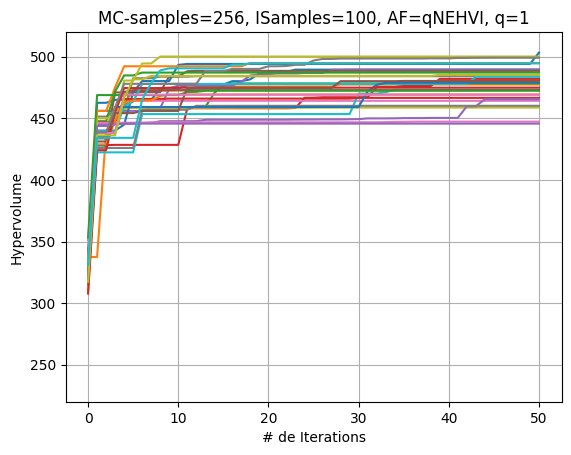

In [74]:
iters = np.arange(51)

for i in range(30):

    plt.errorbar(iters, np.asarray(hvsf27yexp10[i]), linewidth=1.5,label='%i' %i)
    plt.xlabel('# de Iterations')
    plt.ylabel('Hypervolume')
    plt.title('MC-samples=256, ISamples=100, AF=qNEHVI, q=1')
plt.grid()
plt.ylim([220,520])
plt.savefig('Exp10-27July')

In [75]:
%store BDs27yexp10
%store hvsf27yexp10
%store trainxall27yexp10
%store trainobjall27yexp10
%store numbd27yexp10

Stored 'BDs27yexp10' (list)
Stored 'hvsf27yexp10' (list)
Stored 'trainxall27yexp10' (list)
Stored 'trainobjall27yexp10' (list)
Stored 'numbd27yexp10' (list)


In [33]:
BDs27yexp11=[]
hvsf27yexp11=[]
trainxall27yexp11=[]
trainobjall27yexp11=[]
numbd27yexp11=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=160)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp11.append(bd.pareto_Y)      
    hvsf27yexp11.append(hvs_ehvi)   
    trainxall27yexp11.append(train_x_ehvi)
    trainobjall27yexp11.append(train_obj_ehvi)
    numbd27yexp11.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]

Seed: 438


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 444.2346 #Paprox=26 time = 36.34 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 444.2346 #Paprox=26 time = 35.87 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 468.3806 #Paprox=27 time = 39.37 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 480.4024 #Paprox=28 time = 37.67 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 482.4469 #Paprox=27 time = 38.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 482.4469 #Paprox=28 time = 33.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 482.4469 #Paprox=28 time = 34.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 482.4469 #Paprox=29 time = 35.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 482.4469 #Paprox=30 time = 39.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 482.4469 #Paprox=31 time = 37.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 482.4469 #Paprox=32 time = 36.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 482.4469 #Paprox=33 time = 37.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 482.4469 #Paprox=34 time = 36.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 482.4469 #Paprox=35 time = 36.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 482.4469 #Paprox=36 time = 36.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 482.4469 #Paprox=37 time = 37.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 482.4469 #Paprox=38 time = 36.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 482.4469 #Paprox=39 time = 38.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 482.4469 #Paprox=40 time = 38.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 482.4469 #Paprox=41 time = 37.60 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 482.4469 #Paprox=41 time = 38.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 482.4469 #Paprox=42 time = 38.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 482.4469 #Paprox=43 time = 38.41 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 482.4469 #Paprox=43 time = 39.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 482.4469 #Paprox=44 time = 38.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 482.4469 #Paprox=44 time = 38.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 482.4469 #Paprox=45 time = 42.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 482.4469 #Paprox=46 time = 39.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 482.4469 #Paprox=46 time = 38.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 482.4469 #Paprox=47 time = 40.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 482.4469 #Paprox=47 time = 38.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 482.4469 #Paprox=48 time = 38.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 482.4469 #Paprox=49 time = 38.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 482.4469 #Paprox=49 time = 38.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 482.4469 #Paprox=50 time = 39.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 482.4469 #Paprox=51 time = 40.34 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 482.4469 #Paprox=52 time = 40.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 482.4469 #Paprox=53 time = 39.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 482.4469 #Paprox=54 time = 38.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 482.4469 #Paprox=55 time = 39.08 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 482.4469 #Paprox=56 time = 38.82 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 482.4469 #Paprox=57 time = 39.00 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 482.4469 #Paprox=58 time = 38.91 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 482.4469 #Paprox=59 time = 38.86 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 482.4469 #Paprox=60 time = 39.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 482.4469 #Paprox=61 time = 39.46 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 482.4469 #Paprox=62 time = 40.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 482.4469 #Paprox=63 time = 41.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 482.4469 #Paprox=63 time = 39.48 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▎                                     | 1/30 [32:00<15:28:27, 1920.96s/it]


Batch 50: Hypervolume (qNEHVI) = 482.4469 #Paprox=64 time = 39.11 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)Seed: 108


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 435.2714 #Paprox=27 time = 35.84 Lysine= 0.9501 Energy= 14.4322 Costs= 146.1349)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 435.2714 #Paprox=27 time = 35.03 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 435.2714 #Paprox=27 time = 37.13 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 470.1269 #Paprox=28 time = 35.73 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 484.3057 #Paprox=29 time = 36.20 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 484.3057 #Paprox=30 time = 36.41 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 484.3057 #Paprox=31 time = 36.73 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 484.3057 #Paprox=32 time = 36.97 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 484.6212 #Paprox=33 time = 36.47 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 484.6212 #Paprox=33 time = 36.67 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 484.9910 #Paprox=34 time = 37.27 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 484.9910 #Paprox=35 time = 35.96 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 484.9910 #Paprox=36 time = 36.92 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 484.9910 #Paprox=37 time = 37.01 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 484.9910 #Paprox=38 time = 37.54 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 484.9910 #Paprox=39 time = 37.51 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 484.9910 #Paprox=40 time = 37.29 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 484.9910 #Paprox=41 time = 37.84 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 484.9910 #Paprox=42 time = 38.65 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 484.9910 #Paprox=43 time = 37.48 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 484.9910 #Paprox=44 time = 37.73 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 484.9910 #Paprox=45 time = 38.45 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 484.9910 #Paprox=46 time = 38.21 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 484.9910 #Paprox=47 time = 38.25 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 484.9910 #Paprox=47 time = 38.22 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 484.9910 #Paprox=48 time = 37.99 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 484.9910 #Paprox=49 time = 38.02 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 484.9910 #Paprox=50 time = 38.33 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 484.9910 #Paprox=51 time = 38.00 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 484.9910 #Paprox=52 time = 38.37 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 484.9910 #Paprox=53 time = 38.53 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 484.9910 #Paprox=54 time = 38.62 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 484.9910 #Paprox=55 time = 38.38 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 484.9910 #Paprox=55 time = 38.75 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 484.9910 #Paprox=56 time = 39.06 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 484.9910 #Paprox=57 time = 38.82 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 484.9910 #Paprox=58 time = 39.30 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 484.9910 #Paprox=58 time = 39.01 Lysine= 1.3228 Energy= 14.0010 Costs= 158.3804)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 484.9910 #Paprox=59 time = 39.64 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 484.9910 #Paprox=60 time = 40.07 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 484.9910 #Paprox=60 time = 39.75 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 484.9910 #Paprox=60 time = 39.88 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 484.9910 #Paprox=61 time = 40.19 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 484.9910 #Paprox=62 time = 40.13 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 484.9910 #Paprox=62 time = 39.69 Lysine= 1.4277 Energy= 14.0010 Costs= 163.5904)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 484.9910 #Paprox=63 time = 39.92 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 484.9910 #Paprox=64 time = 40.75 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 484.9910 #Paprox=65 time = 40.96 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 484.9910 #Paprox=66 time = 41.52 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▍                                  | 2/30 [1:03:55<14:54:38, 1917.08s/it]


Batch 50: Hypervolume (qNEHVI) = 484.9910 #Paprox=67 time = 40.62 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)Seed: 20


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 441.1289 #Paprox=18 time = 35.36 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 441.1289 #Paprox=18 time = 35.09 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 441.1289 #Paprox=18 time = 35.91 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 457.6248 #Paprox=19 time = 24.01 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 457.6248 #Paprox=19 time = 24.05 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 457.6248 #Paprox=19 time = 24.64 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 457.6248 #Paprox=19 time = 25.44 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 459.6731 #Paprox=20 time = 26.13 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 462.1023 #Paprox=17 time = 26.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 462.1023 #Paprox=18 time = 19.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 462.1023 #Paprox=19 time = 20.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 462.1023 #Paprox=20 time = 21.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 462.1023 #Paprox=20 time = 20.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 462.2375 #Paprox=21 time = 21.16 Lysine= 1.1192 Energy= 14.4321 Costs= 151.3694)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 465.4244 #Paprox=22 time = 21.94 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 465.4244 #Paprox=22 time = 23.23 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 465.4244 #Paprox=22 time = 22.00 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 465.4244 #Paprox=22 time = 22.25 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 465.4244 #Paprox=22 time = 23.35 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 465.4244 #Paprox=22 time = 22.10 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 465.4244 #Paprox=22 time = 22.50 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 465.4244 #Paprox=22 time = 23.15 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 465.4244 #Paprox=22 time = 23.12 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 465.4244 #Paprox=22 time = 22.89 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 465.4244 #Paprox=22 time = 22.10 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 465.4244 #Paprox=22 time = 22.94 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 465.4244 #Paprox=22 time = 22.50 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 466.3999 #Paprox=23 time = 22.85 Lysine= 1.3229 Energy= 14.0010 Costs= 155.2738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 466.3999 #Paprox=23 time = 23.49 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 466.3999 #Paprox=24 time = 23.73 Lysine= 1.3229 Energy= 14.0010 Costs= 155.2738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 466.3999 #Paprox=24 time = 25.01 Lysine= 1.1523 Energy= 14.0010 Costs= 155.6567)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 466.3999 #Paprox=24 time = 24.70 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 466.3999 #Paprox=24 time = 23.96 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 466.3999 #Paprox=25 time = 24.09 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 466.3999 #Paprox=26 time = 23.36 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 469.1715 #Paprox=26 time = 24.43 Lysine= 1.3755 Energy= 14.0010 Costs= 154.8696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 469.1715 #Paprox=27 time = 23.26 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 469.1715 #Paprox=28 time = 23.27 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 469.1715 #Paprox=29 time = 23.46 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 469.1715 #Paprox=30 time = 23.87 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 469.1715 #Paprox=31 time = 23.90 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 469.1715 #Paprox=32 time = 23.75 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 469.1715 #Paprox=33 time = 24.51 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 469.1715 #Paprox=33 time = 24.09 Lysine= 1.1212 Energy= 14.0010 Costs= 152.8763)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 469.1715 #Paprox=33 time = 23.81 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 469.1715 #Paprox=33 time = 24.77 Lysine= 1.1786 Energy= 14.0010 Costs= 150.9035)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 469.1715 #Paprox=34 time = 24.15 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 469.1715 #Paprox=34 time = 24.64 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 469.1715 #Paprox=35 time = 24.48 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|███▋                                 | 3/30 [1:24:02<11:56:54, 1593.13s/it]


Batch 50: Hypervolume (qNEHVI) = 469.1715 #Paprox=36 time = 23.95 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 517


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 461.9255 #Paprox=26 time = 34.58 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 461.9255 #Paprox=26 time = 35.13 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 489.6720 #Paprox=27 time = 36.17 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 489.6720 #Paprox=28 time = 35.55 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 489.8246 #Paprox=29 time = 35.41 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 489.8246 #Paprox=29 time = 36.26 Lysine= 1.2342 Energy= 14.0010 Costs= 156.8458)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 502.3405 #Paprox=30 time = 35.54 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 503.6297 #Paprox=31 time = 35.30 Lysine= 1.0151 Energy= 14.0010 Costs= 145.2404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 503.6297 #Paprox=32 time = 37.05 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 503.6297 #Paprox=32 time = 36.05 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 503.6297 #Paprox=33 time = 36.71 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 503.6297 #Paprox=34 time = 37.34 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 503.6297 #Paprox=35 time = 37.51 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 503.6297 #Paprox=36 time = 37.36 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 503.6297 #Paprox=37 time = 38.70 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 504.4065 #Paprox=37 time = 37.04 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 504.4065 #Paprox=37 time = 38.24 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 504.4065 #Paprox=38 time = 37.45 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 504.4065 #Paprox=39 time = 38.27 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 504.4065 #Paprox=40 time = 37.78 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 504.4065 #Paprox=41 time = 37.61 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 504.4065 #Paprox=35 time = 38.20 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 504.4065 #Paprox=35 time = 37.55 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 504.4065 #Paprox=35 time = 37.89 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 504.4065 #Paprox=35 time = 38.86 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 504.4065 #Paprox=35 time = 39.07 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 504.4065 #Paprox=36 time = 37.85 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 504.4065 #Paprox=37 time = 37.63 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 504.4065 #Paprox=38 time = 38.72 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 504.4065 #Paprox=38 time = 37.92 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 504.4065 #Paprox=38 time = 37.74 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 504.4065 #Paprox=38 time = 38.00 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 504.4065 #Paprox=38 time = 38.10 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 504.4065 #Paprox=38 time = 38.22 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 504.4065 #Paprox=38 time = 38.40 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 504.4065 #Paprox=39 time = 37.95 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 504.4065 #Paprox=39 time = 38.83 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 504.4065 #Paprox=39 time = 37.75 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 504.4065 #Paprox=39 time = 38.25 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 504.4065 #Paprox=39 time = 38.78 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 504.4065 #Paprox=39 time = 39.62 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 504.4065 #Paprox=39 time = 39.33 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 504.4065 #Paprox=39 time = 39.00 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 504.4065 #Paprox=39 time = 39.30 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 504.4065 #Paprox=39 time = 39.79 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 504.4065 #Paprox=39 time = 38.89 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 504.4065 #Paprox=40 time = 40.25 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 504.4065 #Paprox=41 time = 39.43 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 504.4065 #Paprox=42 time = 38.85 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|████▉                                | 4/30 [1:55:36<12:21:43, 1711.69s/it]


Batch 50: Hypervolume (qNEHVI) = 504.4065 #Paprox=43 time = 39.74 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9607)Seed: 937


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 458.5655 #Paprox=24 time = 33.29 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 458.5655 #Paprox=24 time = 32.99 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 458.5655 #Paprox=24 time = 33.79 Lysine= 1.2342 Energy= 14.0010 Costs= 156.8458)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 470.3890 #Paprox=25 time = 34.06 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 470.3890 #Paprox=26 time = 32.71 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 470.3890 #Paprox=27 time = 32.68 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 470.5730 #Paprox=28 time = 33.25 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 470.5730 #Paprox=29 time = 33.41 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 470.5730 #Paprox=30 time = 33.27 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 470.5730 #Paprox=30 time = 33.79 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 470.5730 #Paprox=31 time = 33.81 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 470.5730 #Paprox=32 time = 33.74 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 470.5730 #Paprox=33 time = 33.94 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 470.5730 #Paprox=34 time = 33.74 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 470.5730 #Paprox=35 time = 34.45 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 470.5730 #Paprox=36 time = 33.83 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 470.5730 #Paprox=37 time = 34.39 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 470.5730 #Paprox=38 time = 34.29 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 470.5730 #Paprox=39 time = 34.18 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 470.5730 #Paprox=40 time = 34.55 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 470.5730 #Paprox=41 time = 34.44 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 470.5730 #Paprox=42 time = 34.42 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 470.5730 #Paprox=43 time = 34.20 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 470.5730 #Paprox=44 time = 35.04 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 470.5730 #Paprox=44 time = 35.02 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 470.5730 #Paprox=45 time = 34.69 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 470.5730 #Paprox=46 time = 34.45 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 470.5730 #Paprox=47 time = 35.18 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 470.5730 #Paprox=48 time = 35.19 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 470.5730 #Paprox=49 time = 34.97 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 470.5730 #Paprox=50 time = 35.13 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 470.5730 #Paprox=51 time = 34.75 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 470.5730 #Paprox=52 time = 35.03 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 470.5730 #Paprox=53 time = 35.15 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 470.5730 #Paprox=54 time = 35.59 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 470.5730 #Paprox=55 time = 35.23 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 470.5730 #Paprox=55 time = 34.96 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 470.5730 #Paprox=56 time = 35.71 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 470.5730 #Paprox=57 time = 36.24 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 470.5730 #Paprox=58 time = 35.70 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 470.5730 #Paprox=58 time = 36.06 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 470.5730 #Paprox=59 time = 35.86 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 470.5730 #Paprox=60 time = 35.34 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 470.5730 #Paprox=61 time = 35.50 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 470.5730 #Paprox=62 time = 36.47 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 470.5730 #Paprox=63 time = 36.33 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 470.5730 #Paprox=63 time = 35.92 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 470.5730 #Paprox=64 time = 36.82 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 470.5730 #Paprox=65 time = 35.92 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▏                              | 5/30 [2:24:34<11:57:12, 1721.30s/it]


Batch 50: Hypervolume (qNEHVI) = 470.5730 #Paprox=66 time = 36.45 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)Seed: 616


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 450.0533 #Paprox=31 time = 36.05 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 450.0533 #Paprox=31 time = 36.16 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 450.0533 #Paprox=31 time = 36.01 Lysine= 1.2125 Energy= 14.0010 Costs= 160.2065)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 477.7998 #Paprox=32 time = 36.75 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 491.6022 #Paprox=33 time = 36.89 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 491.8100 #Paprox=29 time = 35.91 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 34.15 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 37.23 Lysine= 1.4096 Energy= 14.0010 Costs= 163.1667)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 38.50 Lysine= 1.4248 Energy= 14.0010 Costs= 164.9510)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 37.24 Lysine= 1.4159 Energy= 14.0010 Costs= 161.4928)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 37.87 Lysine= 1.4073 Energy= 14.0010 Costs= 161.5741)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 38.85 Lysine= 1.4071 Energy= 14.0010 Costs= 161.3677)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 47.52 Lysine= 1.4505 Energy= 14.0010 Costs= 164.7280)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 39.86 Lysine= 1.4193 Energy= 14.0010 Costs= 162.8469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 38.75 Lysine= 1.4216 Energy= 14.0010 Costs= 163.5060)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 44.73 Lysine= 1.4271 Energy= 14.0010 Costs= 165.0912)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 39.68 Lysine= 1.4073 Energy= 14.0010 Costs= 161.5690)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 39.27 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 41.60 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 41.46 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 39.44 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0611)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 40.31 Lysine= 1.4071 Energy= 14.0010 Costs= 161.3778)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 41.02 Lysine= 1.4351 Energy= 14.0010 Costs= 166.0043)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 38.71 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 40.12 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 40.65 Lysine= 1.4250 Energy= 14.0010 Costs= 164.4886)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 40.24 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 47.08 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 44.50 Lysine= 1.4284 Energy= 14.0010 Costs= 165.4729)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 42.05 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 44.43 Lysine= 1.4262 Energy= 14.0010 Costs= 164.8438)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 40.18 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 40.87 Lysine= 1.4177 Energy= 14.0010 Costs= 166.4857)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 40.63 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 41.06 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 40.93 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 41.89 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 43.64 Lysine= 1.4177 Energy= 14.0010 Costs= 166.4857)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 41.32 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 40.44 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 41.08 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 41.92 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0616)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 42.27 Lysine= 1.4177 Energy= 14.0010 Costs= 166.4857)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 40.47 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 41.02 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 41.41 Lysine= 1.4267 Energy= 14.0010 Costs= 164.9815)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 42.21 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 42.13 Lysine= 1.4139 Energy= 14.0010 Costs= 165.9691)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 42.79 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|███████▍                             | 6/30 [2:58:17<12:09:29, 1823.74s/it]


Batch 50: Hypervolume (qNEHVI) = 494.7044 #Paprox=30 time = 40.90 Lysine= 1.4139 Energy= 14.0010 Costs= 165.9691)Seed: 471


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 440.1626 #Paprox=24 time = 35.36 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 440.1626 #Paprox=24 time = 34.19 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 465.5834 #Paprox=25 time = 34.62 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 479.1116 #Paprox=26 time = 34.04 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 481.5205 #Paprox=22 time = 35.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 481.5205 #Paprox=23 time = 30.89 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 481.5205 #Paprox=24 time = 31.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 481.5205 #Paprox=25 time = 33.03 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 481.5205 #Paprox=26 time = 32.74 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 481.5205 #Paprox=27 time = 33.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 481.5205 #Paprox=28 time = 33.44 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 481.5205 #Paprox=29 time = 33.17 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 481.5205 #Paprox=30 time = 34.17 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 481.5205 #Paprox=31 time = 33.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 481.5205 #Paprox=32 time = 34.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 481.5205 #Paprox=33 time = 35.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 481.5205 #Paprox=34 time = 34.97 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 481.5205 #Paprox=35 time = 35.33 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 481.5205 #Paprox=35 time = 35.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 481.5205 #Paprox=36 time = 35.55 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 481.5205 #Paprox=37 time = 35.16 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 481.5205 #Paprox=38 time = 35.92 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 481.5205 #Paprox=39 time = 36.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 481.5205 #Paprox=40 time = 37.32 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 481.5205 #Paprox=41 time = 36.16 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 481.5205 #Paprox=42 time = 37.00 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 481.5205 #Paprox=43 time = 36.47 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 481.5205 #Paprox=44 time = 36.11 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 481.5205 #Paprox=45 time = 36.91 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 481.5205 #Paprox=46 time = 37.08 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 481.5205 #Paprox=47 time = 36.18 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 481.5205 #Paprox=48 time = 36.68 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 481.5205 #Paprox=49 time = 36.21 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 481.5205 #Paprox=50 time = 36.47 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 481.5205 #Paprox=51 time = 36.43 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 481.5205 #Paprox=52 time = 36.72 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 481.5205 #Paprox=53 time = 36.28 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 481.5205 #Paprox=54 time = 37.17 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 481.5205 #Paprox=55 time = 37.46 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 481.5205 #Paprox=56 time = 37.01 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 481.5205 #Paprox=57 time = 36.56 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 481.5205 #Paprox=58 time = 36.94 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 481.5205 #Paprox=59 time = 36.52 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 481.5205 #Paprox=60 time = 36.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 481.5205 #Paprox=61 time = 36.93 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 481.5205 #Paprox=62 time = 37.17 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 481.5205 #Paprox=62 time = 37.78 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 481.5205 #Paprox=63 time = 37.77 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 481.5205 #Paprox=64 time = 40.01 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 23%|████████▋                            | 7/30 [3:28:04<11:34:30, 1811.75s/it]


Batch 50: Hypervolume (qNEHVI) = 481.5205 #Paprox=65 time = 37.72 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)Seed: 219


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 432.0163 #Paprox=29 time = 35.26 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 432.0163 #Paprox=29 time = 35.73 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 432.0163 #Paprox=30 time = 35.62 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 463.0714 #Paprox=31 time = 36.13 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 463.0714 #Paprox=32 time = 36.41 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 463.0714 #Paprox=33 time = 37.68 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 463.0714 #Paprox=34 time = 37.20 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 463.0714 #Paprox=35 time = 36.89 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 463.0714 #Paprox=35 time = 37.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 463.0714 #Paprox=36 time = 37.91 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 463.0714 #Paprox=37 time = 37.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 463.0714 #Paprox=38 time = 36.96 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 463.0714 #Paprox=38 time = 36.93 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 476.6371 #Paprox=39 time = 37.23 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 478.5468 #Paprox=36 time = 36.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 478.5468 #Paprox=37 time = 32.63 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 478.5468 #Paprox=38 time = 33.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 481.6265 #Paprox=39 time = 34.85 Lysine= 1.0416 Energy= 14.0194 Costs= 146.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 483.1223 #Paprox=40 time = 37.29 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 483.1223 #Paprox=41 time = 36.06 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 483.1223 #Paprox=42 time = 37.33 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 483.1223 #Paprox=42 time = 37.80 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 483.1223 #Paprox=43 time = 36.64 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 483.1223 #Paprox=44 time = 36.62 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 483.1223 #Paprox=45 time = 37.20 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 483.1223 #Paprox=46 time = 37.51 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 483.1223 #Paprox=46 time = 37.61 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 483.1223 #Paprox=47 time = 38.08 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 483.1223 #Paprox=48 time = 37.65 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 483.1223 #Paprox=49 time = 37.74 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 483.1223 #Paprox=50 time = 38.23 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 483.1223 #Paprox=51 time = 38.34 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 483.1223 #Paprox=52 time = 38.08 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 483.1223 #Paprox=53 time = 37.77 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 483.1223 #Paprox=54 time = 37.97 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 483.1223 #Paprox=55 time = 37.69 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 483.1223 #Paprox=56 time = 38.06 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 483.1223 #Paprox=57 time = 38.76 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 483.1223 #Paprox=58 time = 38.77 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 483.1223 #Paprox=59 time = 38.54 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 483.1223 #Paprox=60 time = 38.65 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 483.1223 #Paprox=61 time = 38.59 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 483.1223 #Paprox=62 time = 38.16 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 483.1223 #Paprox=62 time = 38.31 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 483.1223 #Paprox=62 time = 38.74 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 483.1223 #Paprox=63 time = 38.44 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 483.1223 #Paprox=64 time = 38.58 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 483.1223 #Paprox=65 time = 38.69 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 483.1223 #Paprox=66 time = 38.89 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 27%|█████████▊                           | 8/30 [3:59:14<11:11:06, 1830.27s/it]


Batch 50: Hypervolume (qNEHVI) = 483.1223 #Paprox=67 time = 38.75 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 826


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 455.6263 #Paprox=20 time = 34.72 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 455.6263 #Paprox=20 time = 33.52 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 455.6263 #Paprox=21 time = 33.61 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 455.7609 #Paprox=22 time = 34.64 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 455.7609 #Paprox=22 time = 34.82 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.0041 #Paprox=23 time = 23.94 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.0041 #Paprox=23 time = 24.17 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 456.0041 #Paprox=24 time = 22.14 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 456.0041 #Paprox=25 time = 22.08 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 456.0041 #Paprox=26 time = 21.79 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 456.0078 #Paprox=27 time = 21.66 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 456.0078 #Paprox=27 time = 21.92 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 456.0087 #Paprox=28 time = 23.24 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 456.0087 #Paprox=29 time = 23.33 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 456.0087 #Paprox=30 time = 24.26 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 456.0087 #Paprox=31 time = 23.69 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 456.0087 #Paprox=32 time = 24.13 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 456.0087 #Paprox=33 time = 23.95 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 456.0087 #Paprox=34 time = 25.36 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 456.0087 #Paprox=35 time = 24.23 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 456.0087 #Paprox=36 time = 24.10 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 456.0087 #Paprox=37 time = 24.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 456.0087 #Paprox=38 time = 25.16 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 456.0087 #Paprox=39 time = 24.87 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 456.0087 #Paprox=40 time = 24.59 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 456.0087 #Paprox=41 time = 26.37 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 456.0087 #Paprox=42 time = 24.99 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 456.0087 #Paprox=43 time = 24.94 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 456.0087 #Paprox=44 time = 25.50 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 456.0087 #Paprox=45 time = 25.29 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 456.0087 #Paprox=46 time = 26.09 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 456.0087 #Paprox=46 time = 24.85 Lysine= 1.2673 Energy= 14.2889 Costs= 156.7029)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 456.0087 #Paprox=46 time = 23.38 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 456.0087 #Paprox=47 time = 22.77 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 456.0087 #Paprox=48 time = 22.86 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 456.0087 #Paprox=49 time = 22.15 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 456.0087 #Paprox=50 time = 23.54 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 456.0087 #Paprox=51 time = 23.06 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 456.0087 #Paprox=52 time = 21.95 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 456.0087 #Paprox=53 time = 22.47 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 456.0087 #Paprox=54 time = 22.43 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 456.0087 #Paprox=55 time = 22.66 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 456.0087 #Paprox=55 time = 22.63 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 456.0087 #Paprox=56 time = 22.95 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 456.0087 #Paprox=57 time = 22.23 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 456.0087 #Paprox=58 time = 22.06 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 456.0087 #Paprox=59 time = 22.93 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 456.0087 #Paprox=59 time = 22.52 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 456.0087 #Paprox=60 time = 22.61 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 30%|███████████▍                          | 9/30 [4:19:47<9:35:14, 1643.56s/it]


Batch 50: Hypervolume (qNEHVI) = 456.0087 #Paprox=61 time = 22.67 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)Seed: 51


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 468.6651 #Paprox=19 time = 33.95 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 468.6651 #Paprox=19 time = 34.20 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 477.7013 #Paprox=20 time = 34.55 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 480.6354 #Paprox=18 time = 34.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 480.6354 #Paprox=19 time = 30.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 480.6354 #Paprox=20 time = 30.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 480.6354 #Paprox=21 time = 31.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 480.6354 #Paprox=22 time = 32.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 480.6354 #Paprox=23 time = 32.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 480.6354 #Paprox=23 time = 33.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 480.6354 #Paprox=23 time = 33.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 480.6354 #Paprox=23 time = 32.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 480.6354 #Paprox=23 time = 33.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 480.6354 #Paprox=23 time = 33.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 480.6354 #Paprox=24 time = 33.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 480.6354 #Paprox=25 time = 34.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 480.6354 #Paprox=25 time = 34.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 480.6354 #Paprox=26 time = 34.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 480.6354 #Paprox=26 time = 34.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 480.6354 #Paprox=27 time = 34.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 480.6354 #Paprox=28 time = 34.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 480.6354 #Paprox=28 time = 34.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 480.6354 #Paprox=28 time = 35.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 480.6354 #Paprox=29 time = 34.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 480.6354 #Paprox=30 time = 34.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 480.6354 #Paprox=31 time = 34.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 480.6354 #Paprox=32 time = 34.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 480.6354 #Paprox=33 time = 35.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 480.6354 #Paprox=34 time = 35.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 480.6354 #Paprox=35 time = 35.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 480.6354 #Paprox=35 time = 36.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 480.6354 #Paprox=36 time = 35.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 480.6354 #Paprox=36 time = 35.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 480.6354 #Paprox=37 time = 36.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 480.6354 #Paprox=38 time = 36.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 480.6354 #Paprox=38 time = 36.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 480.6354 #Paprox=38 time = 35.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 480.6354 #Paprox=39 time = 37.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 480.6354 #Paprox=39 time = 35.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 480.6354 #Paprox=40 time = 36.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 480.6354 #Paprox=41 time = 35.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 480.6354 #Paprox=42 time = 36.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 480.6354 #Paprox=43 time = 35.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 480.6354 #Paprox=44 time = 36.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 480.6354 #Paprox=44 time = 36.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 480.6354 #Paprox=44 time = 36.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 480.6354 #Paprox=45 time = 36.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 480.6354 #Paprox=46 time = 36.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 480.6354 #Paprox=46 time = 37.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|████████████▎                        | 10/30 [4:48:49<9:17:58, 1673.90s/it]


Batch 50: Hypervolume (qNEHVI) = 480.6354 #Paprox=46 time = 36.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 628


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 449.2382 #Paprox=24 time = 35.06 Lysine= 0.9501 Energy= 14.4351 Costs= 146.1669)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 449.2382 #Paprox=24 time = 35.20 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 480.1418 #Paprox=25 time = 34.96 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 493.5469 #Paprox=26 time = 35.33 Lysine= 1.1604 Energy= 14.0010 Costs= 149.6270)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 496.0178 #Paprox=23 time = 35.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 496.0178 #Paprox=24 time = 30.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 496.0178 #Paprox=25 time = 31.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 496.0178 #Paprox=26 time = 32.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 496.0178 #Paprox=27 time = 33.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 496.0178 #Paprox=28 time = 33.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 496.0178 #Paprox=29 time = 34.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 496.0178 #Paprox=30 time = 34.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 496.0178 #Paprox=31 time = 34.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 496.0178 #Paprox=32 time = 34.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 496.0178 #Paprox=33 time = 34.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 496.0178 #Paprox=34 time = 34.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 496.0178 #Paprox=35 time = 34.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 496.0178 #Paprox=36 time = 35.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 496.0178 #Paprox=37 time = 35.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 496.0178 #Paprox=38 time = 35.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 496.0178 #Paprox=39 time = 35.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 496.0178 #Paprox=40 time = 37.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 496.0178 #Paprox=41 time = 35.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 496.0178 #Paprox=41 time = 36.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 496.0178 #Paprox=42 time = 35.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 496.0178 #Paprox=43 time = 36.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 496.0178 #Paprox=44 time = 36.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 496.0178 #Paprox=45 time = 35.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 496.0178 #Paprox=46 time = 36.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 496.0178 #Paprox=47 time = 36.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 496.0178 #Paprox=48 time = 36.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 496.0178 #Paprox=49 time = 36.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 496.0178 #Paprox=50 time = 36.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 496.0178 #Paprox=51 time = 36.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 496.0178 #Paprox=52 time = 36.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 496.0178 #Paprox=53 time = 37.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 496.0178 #Paprox=54 time = 36.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 496.0178 #Paprox=55 time = 37.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 496.0178 #Paprox=56 time = 36.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 496.0178 #Paprox=57 time = 36.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 496.0178 #Paprox=58 time = 37.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 496.0178 #Paprox=59 time = 37.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 496.0178 #Paprox=60 time = 37.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 496.0178 #Paprox=61 time = 37.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 496.0178 #Paprox=62 time = 37.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 496.0178 #Paprox=63 time = 37.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 496.0178 #Paprox=63 time = 37.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 496.0178 #Paprox=64 time = 37.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 496.0178 #Paprox=65 time = 37.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 37%|█████████████▌                       | 11/30 [5:18:44<9:01:48, 1710.99s/it]


Batch 50: Hypervolume (qNEHVI) = 496.0178 #Paprox=66 time = 37.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 871


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 447.7327 #Paprox=27 time = 32.83 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 447.7327 #Paprox=27 time = 31.84 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 461.4926 #Paprox=28 time = 33.06 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 461.4926 #Paprox=28 time = 33.05 Lysine= 1.1511 Energy= 14.0010 Costs= 164.4695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 489.2391 #Paprox=29 time = 33.52 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 489.3917 #Paprox=30 time = 33.30 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 489.3917 #Paprox=31 time = 34.08 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 489.3917 #Paprox=31 time = 34.68 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 489.3917 #Paprox=32 time = 34.55 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 489.3917 #Paprox=32 time = 34.99 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 489.3917 #Paprox=32 time = 35.81 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 489.3917 #Paprox=32 time = 37.22 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 489.3917 #Paprox=33 time = 36.26 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 489.3917 #Paprox=33 time = 37.02 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 489.3917 #Paprox=33 time = 36.43 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 489.3917 #Paprox=33 time = 35.88 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 489.3917 #Paprox=33 time = 36.61 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 35.55 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 36.80 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 36.93 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 35.39 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 37.60 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 37.03 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 36.86 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 36.57 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 35.38 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 36.48 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 35.67 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 36.43 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 38.03 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 36.61 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 39.19 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 36.15 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 489.3917 #Paprox=34 time = 35.90 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 489.3917 #Paprox=35 time = 36.96 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 489.3917 #Paprox=35 time = 37.22 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 489.3917 #Paprox=36 time = 35.63 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 489.3917 #Paprox=36 time = 37.21 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 489.3917 #Paprox=36 time = 38.50 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 489.3917 #Paprox=37 time = 36.75 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 489.3917 #Paprox=37 time = 36.55 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 489.3917 #Paprox=37 time = 36.14 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 489.3917 #Paprox=37 time = 37.40 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 489.3917 #Paprox=37 time = 37.67 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 489.3917 #Paprox=37 time = 36.64 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 489.3917 #Paprox=37 time = 36.44 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 489.3917 #Paprox=37 time = 35.91 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 489.3917 #Paprox=37 time = 37.54 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 489.3917 #Paprox=37 time = 37.97 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 40%|██████████████▊                      | 12/30 [5:48:51<8:42:03, 1740.21s/it]


Batch 50: Hypervolume (qNEHVI) = 489.3917 #Paprox=37 time = 36.41 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)Seed: 544


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 454.4589 #Paprox=18 time = 36.83 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 454.4589 #Paprox=18 time = 35.32 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 454.4589 #Paprox=18 time = 35.64 Lysine= 1.1511 Energy= 14.0010 Costs= 164.4695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 454.4589 #Paprox=19 time = 35.87 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 454.7767 #Paprox=20 time = 36.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 454.7811 #Paprox=21 time = 35.80 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 454.7811 #Paprox=22 time = 36.29 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 454.7811 #Paprox=23 time = 36.56 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 454.7811 #Paprox=24 time = 36.77 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 454.7811 #Paprox=25 time = 37.09 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 454.7811 #Paprox=26 time = 37.79 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 454.7811 #Paprox=27 time = 36.75 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 454.7838 #Paprox=28 time = 37.23 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 454.7838 #Paprox=29 time = 37.72 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 454.7838 #Paprox=30 time = 37.75 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 454.7838 #Paprox=31 time = 37.73 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 454.7838 #Paprox=32 time = 38.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 454.7838 #Paprox=33 time = 37.99 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 454.7838 #Paprox=34 time = 37.99 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 454.7838 #Paprox=34 time = 38.73 Lysine= 0.9501 Energy= 14.3716 Costs= 150.2576)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 454.7838 #Paprox=35 time = 37.54 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 454.7838 #Paprox=36 time = 37.59 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 454.7838 #Paprox=37 time = 38.43 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 454.7838 #Paprox=38 time = 37.99 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 454.7838 #Paprox=39 time = 37.77 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 454.7838 #Paprox=40 time = 38.84 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 454.7838 #Paprox=41 time = 38.74 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 454.7838 #Paprox=42 time = 38.40 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 454.7838 #Paprox=43 time = 38.58 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 454.7838 #Paprox=44 time = 39.33 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 454.7838 #Paprox=45 time = 38.51 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 454.7838 #Paprox=46 time = 38.89 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 454.7838 #Paprox=47 time = 39.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 454.7838 #Paprox=48 time = 39.14 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 454.7838 #Paprox=49 time = 38.77 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 454.7838 #Paprox=50 time = 39.10 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 454.7838 #Paprox=51 time = 38.59 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 454.7838 #Paprox=52 time = 38.71 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 454.7838 #Paprox=53 time = 39.32 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 454.7838 #Paprox=54 time = 39.59 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 454.7838 #Paprox=55 time = 39.09 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 454.7838 #Paprox=56 time = 39.91 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 454.7838 #Paprox=57 time = 39.29 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 454.7838 #Paprox=58 time = 39.55 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 454.7838 #Paprox=59 time = 40.08 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 454.7838 #Paprox=60 time = 40.50 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 454.7838 #Paprox=61 time = 39.49 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 454.7838 #Paprox=62 time = 39.92 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 454.7838 #Paprox=63 time = 39.92 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 43%|████████████████                     | 13/30 [6:20:45<8:27:59, 1792.90s/it]


Batch 50: Hypervolume (qNEHVI) = 454.7838 #Paprox=64 time = 40.17 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 767


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 441.8617 #Paprox=10 time = 35.30 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 441.8617 #Paprox=10 time = 35.81 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 441.8617 #Paprox=10 time = 34.83 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 455.2686 #Paprox=11 time = 36.98 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 455.4363 #Paprox=12 time = 34.49 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 455.4762 #Paprox=13 time = 32.48 Lysine= 1.1298 Energy= 14.1591 Costs= 150.4201)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 457.6136 #Paprox=14 time = 34.19 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 457.6136 #Paprox=15 time = 34.97 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 457.6136 #Paprox=16 time = 34.61 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 457.6136 #Paprox=16 time = 33.49 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 457.6136 #Paprox=17 time = 33.70 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 457.6136 #Paprox=18 time = 35.75 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 457.6136 #Paprox=19 time = 34.91 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 457.6136 #Paprox=20 time = 34.38 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 457.6136 #Paprox=21 time = 35.12 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 457.6136 #Paprox=21 time = 35.18 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 457.6136 #Paprox=22 time = 34.45 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 457.6136 #Paprox=23 time = 35.58 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 457.6136 #Paprox=24 time = 34.98 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 457.6136 #Paprox=25 time = 36.52 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 457.6136 #Paprox=26 time = 36.22 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 457.6136 #Paprox=18 time = 36.11 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 457.6136 #Paprox=19 time = 36.11 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 457.6136 #Paprox=19 time = 37.02 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 457.6136 #Paprox=19 time = 38.62 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 457.6136 #Paprox=19 time = 35.55 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 457.6136 #Paprox=19 time = 35.98 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 457.6136 #Paprox=19 time = 39.31 Lysine= 1.4593 Energy= 14.0010 Costs= 162.3708)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 457.6136 #Paprox=19 time = 35.80 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 457.6136 #Paprox=19 time = 36.34 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 457.6136 #Paprox=19 time = 36.53 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 457.6136 #Paprox=19 time = 36.14 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 457.6136 #Paprox=19 time = 36.63 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 457.6136 #Paprox=19 time = 37.65 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 457.6136 #Paprox=20 time = 37.07 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 457.6136 #Paprox=21 time = 37.11 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 457.6136 #Paprox=21 time = 36.57 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 457.6136 #Paprox=21 time = 37.84 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 457.6136 #Paprox=21 time = 35.41 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 457.6136 #Paprox=21 time = 41.40 Lysine= 1.4317 Energy= 14.0010 Costs= 161.7069)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 457.6136 #Paprox=21 time = 36.54 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 457.6136 #Paprox=21 time = 36.26 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 457.6136 #Paprox=21 time = 39.44 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 457.6136 #Paprox=21 time = 38.46 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 457.6136 #Paprox=22 time = 38.16 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 457.6136 #Paprox=22 time = 37.38 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 457.6136 #Paprox=22 time = 36.27 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 457.6136 #Paprox=23 time = 36.47 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 457.6136 #Paprox=23 time = 37.67 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 47%|█████████████████▎                   | 14/30 [6:50:58<7:59:45, 1799.09s/it]


Batch 50: Hypervolume (qNEHVI) = 457.6136 #Paprox=23 time = 37.26 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)Seed: 367


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 433.7249 #Paprox=33 time = 35.32 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 433.7249 #Paprox=33 time = 34.59 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 464.7801 #Paprox=34 time = 34.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 464.7801 #Paprox=35 time = 36.22 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 464.7801 #Paprox=36 time = 36.26 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 464.7801 #Paprox=37 time = 36.16 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 464.7801 #Paprox=38 time = 36.44 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 464.7801 #Paprox=39 time = 37.33 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 464.7801 #Paprox=40 time = 37.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 464.7801 #Paprox=41 time = 36.72 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 464.7801 #Paprox=42 time = 37.37 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 464.7801 #Paprox=43 time = 36.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 464.7801 #Paprox=44 time = 37.16 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 464.7801 #Paprox=45 time = 37.46 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 464.7801 #Paprox=46 time = 37.21 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 464.7801 #Paprox=47 time = 36.74 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 464.7801 #Paprox=48 time = 37.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 464.7801 #Paprox=48 time = 37.82 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 464.8601 #Paprox=49 time = 37.17 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 477.6218 #Paprox=50 time = 37.16 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 477.6218 #Paprox=51 time = 36.85 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 477.6218 #Paprox=52 time = 36.76 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 477.6218 #Paprox=53 time = 37.35 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 477.6218 #Paprox=54 time = 37.96 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 477.6218 #Paprox=55 time = 36.97 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 477.6218 #Paprox=56 time = 37.78 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 477.6218 #Paprox=57 time = 38.50 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 477.6218 #Paprox=58 time = 37.70 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 477.6218 #Paprox=59 time = 37.51 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 477.6218 #Paprox=59 time = 38.65 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 477.6218 #Paprox=59 time = 38.22 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 477.6218 #Paprox=60 time = 38.96 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 477.6218 #Paprox=61 time = 38.07 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 477.6218 #Paprox=62 time = 40.31 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 477.6218 #Paprox=63 time = 38.58 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 477.6218 #Paprox=63 time = 38.67 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 477.6218 #Paprox=64 time = 38.85 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 477.6218 #Paprox=65 time = 39.61 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 477.6218 #Paprox=66 time = 39.43 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 477.6218 #Paprox=67 time = 39.50 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 477.6218 #Paprox=67 time = 38.66 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 477.6218 #Paprox=68 time = 40.44 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 477.6218 #Paprox=69 time = 41.20 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 477.6218 #Paprox=70 time = 39.55 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 477.6218 #Paprox=71 time = 41.02 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 477.6218 #Paprox=72 time = 39.41 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 477.6218 #Paprox=73 time = 39.42 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 477.6218 #Paprox=74 time = 40.40 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 477.6218 #Paprox=75 time = 39.80 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 50%|██████████████████▌                  | 15/30 [7:22:39<7:37:27, 1829.80s/it]


Batch 50: Hypervolume (qNEHVI) = 477.6218 #Paprox=76 time = 39.50 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)Seed: 943


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 450.0726 #Paprox=17 time = 34.65 Lysine= 0.9501 Energy= 14.3966 Costs= 145.7395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 450.0726 #Paprox=17 time = 34.80 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 470.0299 #Paprox=18 time = 35.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 470.0299 #Paprox=18 time = 34.98 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 470.0299 #Paprox=18 time = 35.72 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 470.0299 #Paprox=18 time = 35.51 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 480.7819 #Paprox=19 time = 35.16 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 480.8173 #Paprox=20 time = 34.94 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 480.8173 #Paprox=21 time = 34.52 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 480.8173 #Paprox=22 time = 34.96 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 480.8173 #Paprox=23 time = 35.30 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 480.8173 #Paprox=24 time = 34.95 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 480.8173 #Paprox=24 time = 34.34 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 480.8173 #Paprox=25 time = 34.98 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 480.8173 #Paprox=26 time = 35.75 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 480.8173 #Paprox=27 time = 35.53 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 480.8173 #Paprox=28 time = 34.87 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 480.8173 #Paprox=29 time = 35.62 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 480.8173 #Paprox=30 time = 35.51 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 480.8173 #Paprox=31 time = 35.89 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 480.8173 #Paprox=32 time = 36.17 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 480.8173 #Paprox=33 time = 36.54 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 480.8173 #Paprox=34 time = 35.95 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 480.8173 #Paprox=35 time = 36.06 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 480.8173 #Paprox=36 time = 35.70 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 480.8173 #Paprox=37 time = 35.51 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 480.8173 #Paprox=38 time = 36.66 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 480.8173 #Paprox=39 time = 36.24 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 480.8173 #Paprox=40 time = 36.46 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 480.8173 #Paprox=41 time = 35.98 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 480.8173 #Paprox=42 time = 36.79 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 480.8173 #Paprox=42 time = 36.89 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 480.8173 #Paprox=43 time = 37.00 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 480.8173 #Paprox=43 time = 36.59 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 480.8173 #Paprox=44 time = 36.86 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 480.8173 #Paprox=44 time = 36.76 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 480.8173 #Paprox=45 time = 36.50 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 480.8173 #Paprox=46 time = 37.22 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 480.8181 #Paprox=47 time = 37.15 Lysine= 1.1902 Energy= 14.0443 Costs= 151.1638)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 480.8181 #Paprox=47 time = 36.58 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 481.5508 #Paprox=48 time = 36.61 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 481.5508 #Paprox=48 time = 37.91 Lysine= 1.5155 Energy= 14.0010 Costs= 168.1529)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 481.5508 #Paprox=48 time = 39.96 Lysine= 1.5089 Energy= 14.0010 Costs= 168.4071)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 482.2236 #Paprox=49 time = 39.48 Lysine= 1.5504 Energy= 14.0010 Costs= 168.5262)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 482.2236 #Paprox=49 time = 40.54 Lysine= 1.4108 Energy= 14.0010 Costs= 159.1145)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 482.2236 #Paprox=49 time = 39.51 Lysine= 1.0153 Energy= 14.0010 Costs= 157.7830)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 482.2236 #Paprox=49 time = 39.80 Lysine= 1.4156 Energy= 14.0010 Costs= 163.9222)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 482.2236 #Paprox=49 time = 38.38 Lysine= 1.4286 Energy= 14.0010 Costs= 163.0221)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 482.2236 #Paprox=49 time = 38.88 Lysine= 1.3125 Energy= 14.0010 Costs= 160.5884)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 53%|███████████████████▋                 | 16/30 [7:53:04<7:06:34, 1828.18s/it]


Batch 50: Hypervolume (qNEHVI) = 482.2236 #Paprox=49 time = 38.29 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)Seed: 259


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 436.1841 #Paprox=24 time = 33.36 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 436.1841 #Paprox=24 time = 31.63 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 439.7983 #Paprox=25 time = 33.20 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 439.7983 #Paprox=26 time = 33.37 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 439.7983 #Paprox=27 time = 34.22 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 441.0318 #Paprox=28 time = 33.48 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 441.0318 #Paprox=29 time = 34.39 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 441.0318 #Paprox=30 time = 34.68 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 467.3374 #Paprox=31 time = 33.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 467.3374 #Paprox=32 time = 33.83 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 467.3374 #Paprox=32 time = 34.56 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 467.3374 #Paprox=33 time = 34.28 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 467.3374 #Paprox=34 time = 35.86 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 467.3374 #Paprox=35 time = 35.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 467.3374 #Paprox=36 time = 36.07 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 467.3374 #Paprox=37 time = 35.49 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 467.3374 #Paprox=38 time = 35.98 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 479.9415 #Paprox=39 time = 36.47 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 483.6061 #Paprox=40 time = 35.13 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 483.6525 #Paprox=41 time = 34.70 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 483.6525 #Paprox=42 time = 35.84 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 483.6525 #Paprox=42 time = 36.37 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 483.6525 #Paprox=43 time = 36.32 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 483.6525 #Paprox=44 time = 36.30 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 483.6525 #Paprox=45 time = 36.39 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 483.6525 #Paprox=46 time = 36.05 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 483.6525 #Paprox=47 time = 35.40 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 483.6525 #Paprox=48 time = 35.13 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 483.6525 #Paprox=49 time = 35.96 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 483.6525 #Paprox=49 time = 35.79 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 483.6525 #Paprox=50 time = 36.64 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 483.6525 #Paprox=51 time = 36.91 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 483.6525 #Paprox=51 time = 35.86 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 483.6525 #Paprox=52 time = 37.28 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 483.6525 #Paprox=53 time = 38.02 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 483.6525 #Paprox=54 time = 37.42 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 483.6525 #Paprox=55 time = 37.84 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 483.6525 #Paprox=56 time = 37.30 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 483.6525 #Paprox=56 time = 36.28 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 483.6525 #Paprox=57 time = 37.01 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 483.6525 #Paprox=57 time = 37.31 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 483.6525 #Paprox=58 time = 37.94 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 483.6525 #Paprox=59 time = 37.40 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 483.6525 #Paprox=59 time = 37.72 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 483.6525 #Paprox=60 time = 38.29 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 483.6525 #Paprox=61 time = 37.70 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 483.6525 #Paprox=61 time = 37.84 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 483.6525 #Paprox=62 time = 37.16 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 483.6525 #Paprox=63 time = 38.03 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 57%|████████████████████▉                | 17/30 [8:23:05<6:34:20, 1820.07s/it]


Batch 50: Hypervolume (qNEHVI) = 483.6525 #Paprox=64 time = 39.74 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)Seed: 867


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 445.9019 #Paprox=23 time = 36.10 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 445.9019 #Paprox=23 time = 35.59 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 459.4201 #Paprox=24 time = 35.77 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 461.9834 #Paprox=23 time = 34.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 462.0621 #Paprox=24 time = 31.71 Lysine= 1.1333 Energy= 14.5072 Costs= 152.1800)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 465.2489 #Paprox=25 time = 32.37 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 469.3917 #Paprox=26 time = 35.00 Lysine= 1.5658 Energy= 14.0010 Costs= 165.7649)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 475.3425 #Paprox=27 time = 35.53 Lysine= 1.4065 Energy= 14.0010 Costs= 154.0430)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 475.3426 #Paprox=28 time = 34.30 Lysine= 1.4065 Energy= 14.0010 Costs= 154.0430)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 475.3426 #Paprox=29 time = 34.82 Lysine= 1.4065 Energy= 14.0010 Costs= 154.0430)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 475.3426 #Paprox=30 time = 37.34 Lysine= 1.4065 Energy= 14.0010 Costs= 154.0430)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 480.0726 #Paprox=31 time = 35.73 Lysine= 1.5264 Energy= 14.0010 Costs= 157.1952)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 499.9864 #Paprox=32 time = 34.78 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 499.9865 #Paprox=33 time = 35.23 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 504.7789 #Paprox=34 time = 35.96 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 504.7789 #Paprox=35 time = 36.55 Lysine= 1.4094 Energy= 14.0010 Costs= 157.2229)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 504.9246 #Paprox=35 time = 35.36 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2467)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 504.9246 #Paprox=36 time = 35.53 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 504.9246 #Paprox=37 time = 35.50 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 504.9246 #Paprox=38 time = 36.61 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 504.9246 #Paprox=39 time = 35.99 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 504.9246 #Paprox=40 time = 36.09 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 504.9246 #Paprox=41 time = 36.45 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 504.9246 #Paprox=42 time = 38.03 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 504.9246 #Paprox=43 time = 36.53 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 504.9246 #Paprox=44 time = 36.68 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 504.9246 #Paprox=45 time = 36.69 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 504.9246 #Paprox=46 time = 38.49 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 504.9247 #Paprox=47 time = 38.24 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 504.9247 #Paprox=48 time = 37.42 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 504.9247 #Paprox=49 time = 37.12 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 504.9247 #Paprox=50 time = 36.97 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 504.9247 #Paprox=51 time = 37.24 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 504.9247 #Paprox=52 time = 38.25 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 504.9247 #Paprox=53 time = 36.95 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 504.9247 #Paprox=54 time = 37.00 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 504.9247 #Paprox=55 time = 39.44 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 504.9247 #Paprox=56 time = 37.65 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 504.9247 #Paprox=57 time = 37.64 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 504.9247 #Paprox=58 time = 38.26 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 504.9247 #Paprox=59 time = 37.82 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 504.9247 #Paprox=60 time = 38.07 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 504.9247 #Paprox=61 time = 39.07 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 504.9247 #Paprox=62 time = 37.58 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 504.9247 #Paprox=63 time = 38.28 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 504.9247 #Paprox=64 time = 38.03 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 504.9247 #Paprox=65 time = 38.41 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 504.9247 #Paprox=66 time = 38.17 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 504.9247 #Paprox=67 time = 38.49 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 60%|██████████████████████▏              | 18/30 [8:53:42<6:05:00, 1825.06s/it]


Batch 50: Hypervolume (qNEHVI) = 504.9247 #Paprox=68 time = 38.50 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)Seed: 841


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 429.2904 #Paprox=30 time = 35.96 Lysine= 0.9501 Energy= 14.4296 Costs= 146.1058)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 429.2904 #Paprox=30 time = 35.82 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 454.1601 #Paprox=31 time = 36.06 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 454.1601 #Paprox=32 time = 37.04 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 469.2035 #Paprox=33 time = 36.51 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 471.8250 #Paprox=32 time = 36.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 471.8250 #Paprox=33 time = 31.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 471.8250 #Paprox=34 time = 32.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 474.9047 #Paprox=35 time = 33.88 Lysine= 1.0416 Energy= 14.0194 Costs= 146.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 474.9047 #Paprox=35 time = 35.84 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 482.2386 #Paprox=36 time = 35.89 Lysine= 1.5658 Energy= 14.0010 Costs= 165.7649)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 482.2386 #Paprox=36 time = 35.75 Lysine= 1.0077 Energy= 14.0010 Costs= 148.0618)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 482.2386 #Paprox=36 time = 36.41 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 482.2386 #Paprox=36 time = 36.95 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 482.2386 #Paprox=36 time = 36.48 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 482.2407 #Paprox=37 time = 37.22 Lysine= 1.3229 Energy= 14.0010 Costs= 155.2738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 482.2407 #Paprox=37 time = 36.32 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 482.2407 #Paprox=37 time = 35.84 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 482.2407 #Paprox=37 time = 38.72 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 482.2407 #Paprox=37 time = 36.50 Lysine= 1.1705 Energy= 14.0010 Costs= 156.2058)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 482.4669 #Paprox=38 time = 36.80 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 482.4669 #Paprox=38 time = 37.46 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 482.4669 #Paprox=38 time = 37.10 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 482.4669 #Paprox=38 time = 37.70 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 482.4669 #Paprox=38 time = 38.09 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 482.4669 #Paprox=38 time = 37.10 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 482.4669 #Paprox=38 time = 37.51 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 482.4669 #Paprox=38 time = 37.32 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 482.4669 #Paprox=38 time = 37.21 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 482.4669 #Paprox=38 time = 37.18 Lysine= 1.2051 Energy= 14.0010 Costs= 157.7905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 483.4739 #Paprox=39 time = 36.77 Lysine= 0.9900 Energy= 14.0010 Costs= 144.9270)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 37.27 Lysine= 1.1702 Energy= 14.0010 Costs= 152.6177)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 37.59 Lysine= 1.0060 Energy= 14.0010 Costs= 150.6494)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 37.20 Lysine= 1.1973 Energy= 14.0010 Costs= 157.7435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 38.09 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 38.52 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 39.54 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 38.34 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 38.85 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 38.26 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 39.51 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 38.74 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 38.21 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 37.86 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 39.64 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 39.15 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 38.22 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 39.01 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 38.63 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 63%|███████████████████████▍             | 19/30 [9:24:43<5:36:35, 1835.96s/it]


Batch 50: Hypervolume (qNEHVI) = 484.0189 #Paprox=40 time = 37.85 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)Seed: 440


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 469.6690 #Paprox=15 time = 35.08 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 469.6690 #Paprox=15 time = 35.07 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 469.6690 #Paprox=16 time = 35.29 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 469.6690 #Paprox=17 time = 35.96 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 469.6690 #Paprox=18 time = 35.93 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 469.6690 #Paprox=19 time = 35.87 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 469.6690 #Paprox=20 time = 36.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 469.6690 #Paprox=21 time = 35.83 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 469.6690 #Paprox=22 time = 36.44 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 469.6690 #Paprox=23 time = 36.20 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 469.6690 #Paprox=24 time = 36.07 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 469.6690 #Paprox=25 time = 36.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 469.6690 #Paprox=26 time = 35.94 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 469.6690 #Paprox=27 time = 36.59 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 472.9490 #Paprox=28 time = 36.81 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 472.9490 #Paprox=29 time = 36.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 472.9490 #Paprox=30 time = 36.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 472.9490 #Paprox=31 time = 36.71 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 472.9490 #Paprox=32 time = 37.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 472.9490 #Paprox=33 time = 37.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 472.9490 #Paprox=34 time = 37.87 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 472.9490 #Paprox=35 time = 37.82 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 472.9490 #Paprox=36 time = 37.38 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 472.9490 #Paprox=37 time = 37.70 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.9490 #Paprox=38 time = 37.13 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 472.9490 #Paprox=39 time = 37.19 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 472.9490 #Paprox=40 time = 38.33 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 472.9490 #Paprox=41 time = 37.57 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 472.9490 #Paprox=42 time = 37.43 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 472.9490 #Paprox=43 time = 37.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 472.9490 #Paprox=44 time = 37.12 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 472.9490 #Paprox=45 time = 37.74 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 472.9490 #Paprox=46 time = 37.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 472.9490 #Paprox=47 time = 38.04 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 473.0472 #Paprox=48 time = 38.03 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 488.9870 #Paprox=49 time = 37.66 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 488.9870 #Paprox=49 time = 37.75 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 489.0213 #Paprox=50 time = 37.38 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 489.0213 #Paprox=51 time = 37.30 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 489.0213 #Paprox=51 time = 37.45 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 489.0213 #Paprox=52 time = 37.91 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 489.0213 #Paprox=52 time = 37.70 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 489.0213 #Paprox=53 time = 38.00 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 489.0213 #Paprox=54 time = 37.91 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 489.0213 #Paprox=55 time = 37.71 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 489.0213 #Paprox=55 time = 38.73 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 489.0213 #Paprox=56 time = 37.97 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 489.0213 #Paprox=57 time = 38.44 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 489.0213 #Paprox=58 time = 38.12 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|████████████████████████▋            | 20/30 [9:55:42<5:07:09, 1842.91s/it]


Batch 50: Hypervolume (qNEHVI) = 489.0213 #Paprox=59 time = 38.24 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)Seed: 303


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 435.7144 #Paprox=30 time = 33.89 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 435.7144 #Paprox=30 time = 33.80 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 456.8955 #Paprox=31 time = 34.39 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.8955 #Paprox=31 time = 33.68 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.9469 #Paprox=32 time = 32.95 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.9472 #Paprox=33 time = 33.75 Lysine= 1.1912 Energy= 14.0497 Costs= 151.2175)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.9472 #Paprox=34 time = 33.57 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 457.6492 #Paprox=35 time = 35.73 Lysine= 1.4979 Energy= 14.0010 Costs= 168.0438)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 457.8407 #Paprox=36 time = 36.25 Lysine= 1.5722 Energy= 14.0010 Costs= 169.8158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 457.8407 #Paprox=36 time = 36.42 Lysine= 1.0905 Energy= 14.0010 Costs= 152.1295)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 465.5826 #Paprox=36 time = 37.05 Lysine= 1.5806 Energy= 14.0010 Costs= 164.3048)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 465.5826 #Paprox=36 time = 37.02 Lysine= 1.0286 Energy= 14.0010 Costs= 157.8121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 465.5826 #Paprox=36 time = 36.16 Lysine= 1.0390 Energy= 14.0010 Costs= 158.1795)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 465.5826 #Paprox=36 time = 36.94 Lysine= 1.0312 Energy= 14.0010 Costs= 157.8737)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 465.5826 #Paprox=36 time = 36.48 Lysine= 1.0241 Energy= 14.0010 Costs= 155.4158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 465.5826 #Paprox=36 time = 37.00 Lysine= 1.0152 Energy= 14.0010 Costs= 154.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 465.5826 #Paprox=36 time = 36.15 Lysine= 1.0122 Energy= 14.0010 Costs= 157.3781)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 465.5826 #Paprox=36 time = 35.85 Lysine= 1.0282 Energy= 14.0010 Costs= 157.7429)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 465.5826 #Paprox=36 time = 36.09 Lysine= 0.9862 Energy= 14.0010 Costs= 155.6187)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 465.5826 #Paprox=36 time = 36.48 Lysine= 1.0292 Energy= 14.0010 Costs= 157.7457)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 465.5826 #Paprox=36 time = 36.80 Lysine= 0.9919 Energy= 14.0010 Costs= 156.9119)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 465.5826 #Paprox=36 time = 35.75 Lysine= 0.9655 Energy= 14.0010 Costs= 156.2635)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 465.5983 #Paprox=37 time = 36.51 Lysine= 0.9523 Energy= 14.0010 Costs= 149.5243)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 465.5983 #Paprox=37 time = 35.73 Lysine= 1.4566 Energy= 14.0010 Costs= 160.2623)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 465.5983 #Paprox=37 time = 37.48 Lysine= 1.4421 Energy= 14.0010 Costs= 165.1828)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 465.5983 #Paprox=37 time = 36.68 Lysine= 1.4181 Energy= 14.0010 Costs= 159.3477)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 465.5983 #Paprox=38 time = 36.82 Lysine= 0.9501 Energy= 14.0010 Costs= 148.8608)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 465.5983 #Paprox=38 time = 36.91 Lysine= 1.3662 Energy= 14.0010 Costs= 157.9439)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 465.5983 #Paprox=38 time = 37.14 Lysine= 1.3109 Energy= 14.0010 Costs= 156.6499)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 465.5983 #Paprox=38 time = 37.33 Lysine= 1.1504 Energy= 14.0010 Costs= 152.8058)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 465.5983 #Paprox=38 time = 37.20 Lysine= 1.1439 Energy= 14.0010 Costs= 152.3587)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 465.5983 #Paprox=38 time = 37.82 Lysine= 1.0726 Energy= 14.0010 Costs= 151.5249)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 465.5983 #Paprox=38 time = 37.07 Lysine= 1.0795 Energy= 14.0010 Costs= 151.6247)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 465.5983 #Paprox=38 time = 40.54 Lysine= 1.0986 Energy= 14.0010 Costs= 150.9973)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 465.5983 #Paprox=38 time = 37.63 Lysine= 1.3049 Energy= 14.0010 Costs= 156.9724)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 465.5983 #Paprox=38 time = 37.51 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 465.5983 #Paprox=38 time = 37.97 Lysine= 1.3959 Energy= 14.0010 Costs= 158.6119)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 465.6002 #Paprox=39 time = 40.51 Lysine= 1.4229 Energy= 14.0010 Costs= 159.0990)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 465.6002 #Paprox=39 time = 38.38 Lysine= 1.3444 Energy= 14.0010 Costs= 157.6835)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 465.6002 #Paprox=39 time = 39.26 Lysine= 1.4139 Energy= 14.0010 Costs= 158.9366)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 465.6002 #Paprox=39 time = 41.21 Lysine= 1.3027 Energy= 14.0010 Costs= 156.9327)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 465.6002 #Paprox=39 time = 39.71 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 465.6002 #Paprox=39 time = 38.69 Lysine= 1.4215 Energy= 14.0010 Costs= 159.0729)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 465.6013 #Paprox=40 time = 38.84 Lysine= 1.4237 Energy= 14.0010 Costs= 159.1132)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 465.8545 #Paprox=41 time = 40.28 Lysine= 1.2524 Energy= 14.0010 Costs= 155.5214)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 465.8545 #Paprox=41 time = 39.06 Lysine= 1.3137 Energy= 14.0010 Costs= 157.1305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 465.9070 #Paprox=42 time = 40.45 Lysine= 1.2644 Energy= 14.0010 Costs= 156.0570)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 465.9867 #Paprox=43 time = 41.20 Lysine= 1.2865 Energy= 14.0010 Costs= 156.1129)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 465.9910 #Paprox=44 time = 39.67 Lysine= 1.4491 Energy= 14.0010 Costs= 159.5717)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 70%|█████████████████████████▏          | 21/30 [10:26:44<4:37:17, 1848.64s/it]


Batch 50: Hypervolume (qNEHVI) = 465.9910 #Paprox=44 time = 39.84 Lysine= 1.3522 Energy= 14.0010 Costs= 157.8239)Seed: 461


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 430.1764 #Paprox=22 time = 35.08 Lysine= 0.9501 Energy= 14.4495 Costs= 146.3248)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 430.1764 #Paprox=22 time = 35.03 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 430.1764 #Paprox=22 time = 35.59 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 430.1764 #Paprox=22 time = 35.37 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 443.5710 #Paprox=23 time = 26.71 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 443.6173 #Paprox=23 time = 25.82 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 443.6188 #Paprox=24 time = 26.91 Lysine= 1.1868 Energy= 14.0248 Costs= 150.9700)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 443.6188 #Paprox=24 time = 26.93 Lysine= 1.2019 Energy= 14.0010 Costs= 156.5527)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 443.7518 #Paprox=25 time = 27.78 Lysine= 1.1955 Energy= 14.0010 Costs= 152.0631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 444.4845 #Paprox=26 time = 27.67 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 449.5183 #Paprox=27 time = 27.25 Lysine= 1.5658 Energy= 14.0010 Costs= 165.7649)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 449.5183 #Paprox=27 time = 25.27 Lysine= 1.4084 Energy= 14.0010 Costs= 162.4081)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 449.5183 #Paprox=27 time = 26.31 Lysine= 1.4349 Energy= 14.0010 Costs= 160.4893)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 449.5183 #Paprox=27 time = 25.69 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 451.3155 #Paprox=27 time = 26.49 Lysine= 1.4208 Energy= 14.0010 Costs= 156.2188)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 451.3484 #Paprox=28 time = 26.28 Lysine= 1.4305 Energy= 14.0010 Costs= 159.1523)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 451.3484 #Paprox=28 time = 26.74 Lysine= 1.4420 Energy= 14.0010 Costs= 162.7527)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 451.3484 #Paprox=28 time = 27.09 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 451.4356 #Paprox=29 time = 27.18 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 451.4356 #Paprox=29 time = 28.92 Lysine= 1.4379 Energy= 14.0010 Costs= 161.3783)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 451.4356 #Paprox=29 time = 28.03 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 451.4356 #Paprox=30 time = 27.41 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 451.4356 #Paprox=30 time = 27.67 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 451.4356 #Paprox=31 time = 27.22 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 451.4356 #Paprox=31 time = 28.37 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 451.4356 #Paprox=31 time = 28.49 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 451.4356 #Paprox=32 time = 29.51 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1881)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 451.4356 #Paprox=32 time = 30.20 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 451.4356 #Paprox=32 time = 28.61 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 451.4356 #Paprox=33 time = 29.57 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 451.4356 #Paprox=33 time = 27.48 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 451.4356 #Paprox=33 time = 28.09 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 451.4356 #Paprox=34 time = 28.96 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 451.4356 #Paprox=34 time = 30.99 Lysine= 1.4344 Energy= 14.0010 Costs= 160.3164)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 451.4356 #Paprox=34 time = 29.69 Lysine= 1.4257 Energy= 14.0010 Costs= 157.6786)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 451.4356 #Paprox=34 time = 28.97 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 451.4356 #Paprox=35 time = 28.55 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 451.4356 #Paprox=35 time = 29.91 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 451.4356 #Paprox=35 time = 28.84 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 451.4356 #Paprox=35 time = 31.11 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 451.4356 #Paprox=35 time = 28.05 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 451.4356 #Paprox=35 time = 28.49 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 451.4356 #Paprox=35 time = 31.08 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 451.4411 #Paprox=36 time = 31.03 Lysine= 1.4290 Energy= 14.0010 Costs= 158.8124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 451.4411 #Paprox=36 time = 30.00 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 451.4411 #Paprox=36 time = 32.30 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 451.4411 #Paprox=36 time = 32.33 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 451.4467 #Paprox=37 time = 31.38 Lysine= 1.4213 Energy= 14.0010 Costs= 156.3473)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 451.4467 #Paprox=37 time = 31.48 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 73%|██████████████████████████▍         | 22/30 [10:51:02<3:50:50, 1731.32s/it]


Batch 50: Hypervolume (qNEHVI) = 451.4467 #Paprox=37 time = 31.38 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)Seed: 109


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 439.4218 #Paprox=21 time = 34.74 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 439.4218 #Paprox=21 time = 34.72 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 456.5957 #Paprox=22 time = 35.15 Lysine= 1.1144 Energy= 14.0010 Costs= 147.9483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.5957 #Paprox=22 time = 35.45 Lysine= 1.1979 Energy= 14.0010 Costs= 175.4901)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.8631 #Paprox=23 time = 35.77 Lysine= 0.9501 Energy= 14.4406 Costs= 152.4815)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 478.0010 #Paprox=24 time = 34.58 Lysine= 0.9501 Energy= 14.0010 Costs= 144.0699)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 478.7995 #Paprox=25 time = 35.02 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 478.7995 #Paprox=26 time = 35.84 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 478.7995 #Paprox=27 time = 35.32 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 478.8013 #Paprox=28 time = 36.20 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 478.8013 #Paprox=29 time = 36.23 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 478.8013 #Paprox=30 time = 35.63 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 478.8013 #Paprox=31 time = 36.00 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 478.8013 #Paprox=32 time = 36.69 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 478.8013 #Paprox=32 time = 36.27 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 478.8013 #Paprox=33 time = 36.45 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 478.8013 #Paprox=34 time = 36.47 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 478.8013 #Paprox=35 time = 37.41 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 478.8013 #Paprox=35 time = 36.38 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 478.8013 #Paprox=36 time = 36.28 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 478.8013 #Paprox=37 time = 36.93 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 478.8013 #Paprox=38 time = 36.74 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 478.8013 #Paprox=38 time = 36.74 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 478.8013 #Paprox=38 time = 37.30 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 478.8013 #Paprox=38 time = 36.62 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 478.8013 #Paprox=38 time = 37.03 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 478.8013 #Paprox=39 time = 37.07 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 478.8013 #Paprox=40 time = 37.07 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 478.8013 #Paprox=41 time = 37.06 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 478.8013 #Paprox=41 time = 37.46 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 478.8013 #Paprox=41 time = 37.30 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 478.8013 #Paprox=41 time = 39.21 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 478.8013 #Paprox=41 time = 38.35 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 478.8013 #Paprox=41 time = 41.05 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 478.8013 #Paprox=42 time = 37.49 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 478.8013 #Paprox=42 time = 39.12 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 478.8013 #Paprox=43 time = 38.27 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 478.8013 #Paprox=43 time = 38.28 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 478.8013 #Paprox=44 time = 37.94 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 478.8013 #Paprox=45 time = 39.81 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 478.8013 #Paprox=45 time = 38.41 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 478.8013 #Paprox=46 time = 39.09 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 478.8013 #Paprox=47 time = 38.38 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 478.8013 #Paprox=48 time = 39.78 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 478.8013 #Paprox=48 time = 38.86 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 478.8013 #Paprox=48 time = 41.05 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 478.8013 #Paprox=49 time = 38.60 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 478.8013 #Paprox=50 time = 38.72 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 478.8013 #Paprox=51 time = 39.61 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 77%|███████████████████████████▌        | 23/30 [11:22:09<3:26:44, 1772.12s/it]


Batch 50: Hypervolume (qNEHVI) = 478.8013 #Paprox=51 time = 38.79 Lysine= 0.9501 Energy= 14.0010 Costs= 148.9731)Seed: 448


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 429.6434 #Paprox=26 time = 34.57 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 429.6434 #Paprox=26 time = 35.55 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 460.6985 #Paprox=27 time = 35.66 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 460.6985 #Paprox=28 time = 35.38 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 460.6985 #Paprox=28 time = 36.52 Lysine= 1.2342 Energy= 14.0010 Costs= 177.4048)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 460.6985 #Paprox=28 time = 35.33 Lysine= 0.9501 Energy= 14.3774 Costs= 151.7445)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 460.6985 #Paprox=28 time = 34.96 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 460.6985 #Paprox=28 time = 35.95 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 460.6985 #Paprox=28 time = 35.73 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 460.6985 #Paprox=28 time = 35.05 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 460.6985 #Paprox=28 time = 35.88 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 460.6985 #Paprox=28 time = 35.35 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.59 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0041)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 35.34 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 35.96 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.37 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 35.71 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.11 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.39 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.02 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 35.42 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.06 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.19 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.35 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.38 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.62 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.37 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.16 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 37.25 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 37.32 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.76 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.70 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 37.11 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.86 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.75 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 37.07 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 37.17 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 37.65 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 37.38 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 37.46 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.70 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 37.79 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.99 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 37.24 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 37.03 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.92 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 36.54 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 37.17 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 37.32 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 80%|████████████████████████████▊       | 24/30 [11:52:32<2:58:43, 1787.33s/it]


Batch 50: Hypervolume (qNEHVI) = 460.6986 #Paprox=29 time = 37.31 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)Seed: 775


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 446.3656 #Paprox=8 time = 20.70 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 446.3656 #Paprox=8 time = 22.19 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 465.2422 #Paprox=9 time = 22.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 477.7560 #Paprox=10 time = 22.60 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 477.7560 #Paprox=11 time = 23.95 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 477.7560 #Paprox=12 time = 23.70 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 477.7560 #Paprox=13 time = 23.93 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 477.7560 #Paprox=14 time = 23.96 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 477.7560 #Paprox=15 time = 24.11 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 477.7560 #Paprox=16 time = 24.30 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 477.7560 #Paprox=17 time = 23.89 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 477.7560 #Paprox=18 time = 23.84 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 477.7560 #Paprox=19 time = 24.57 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 477.7560 #Paprox=19 time = 24.92 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 477.7560 #Paprox=20 time = 24.35 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 477.7560 #Paprox=21 time = 25.02 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 477.7560 #Paprox=22 time = 25.22 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 477.7560 #Paprox=23 time = 24.98 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 477.7560 #Paprox=24 time = 24.94 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 477.7560 #Paprox=25 time = 24.64 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 477.7560 #Paprox=26 time = 24.82 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 477.7560 #Paprox=27 time = 25.32 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 477.7560 #Paprox=28 time = 25.68 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 477.7560 #Paprox=29 time = 24.03 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 477.7560 #Paprox=30 time = 24.83 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 477.7560 #Paprox=31 time = 25.79 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 477.7560 #Paprox=32 time = 25.85 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 477.7560 #Paprox=33 time = 24.97 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 477.7560 #Paprox=34 time = 25.08 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 477.7560 #Paprox=35 time = 25.65 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 477.7560 #Paprox=36 time = 25.40 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 477.7560 #Paprox=37 time = 26.09 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 477.7560 #Paprox=38 time = 25.80 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 477.7560 #Paprox=39 time = 25.71 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 477.7560 #Paprox=40 time = 25.70 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 477.7560 #Paprox=41 time = 26.29 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 477.7560 #Paprox=42 time = 26.65 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 477.7560 #Paprox=42 time = 26.05 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 477.7560 #Paprox=43 time = 25.82 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 477.7560 #Paprox=44 time = 26.80 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 477.7560 #Paprox=45 time = 25.65 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 477.7560 #Paprox=46 time = 25.55 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 477.7560 #Paprox=47 time = 26.46 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 477.7560 #Paprox=48 time = 25.39 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 477.7560 #Paprox=49 time = 26.00 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 477.7560 #Paprox=50 time = 26.39 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 477.7560 #Paprox=51 time = 26.09 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 477.7560 #Paprox=52 time = 26.61 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 477.7560 #Paprox=53 time = 26.10 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 83%|██████████████████████████████      | 25/30 [12:13:25<2:15:35, 1627.16s/it]


Batch 50: Hypervolume (qNEHVI) = 477.7560 #Paprox=54 time = 26.32 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)Seed: 530


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 429.9044 #Paprox=27 time = 35.08 Lysine= 0.9501 Energy= 14.4093 Costs= 145.8825)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 429.9044 #Paprox=27 time = 34.61 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 457.0256 #Paprox=28 time = 34.83 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 471.8158 #Paprox=29 time = 35.11 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 474.6744 #Paprox=26 time = 35.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 474.6744 #Paprox=27 time = 30.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 474.6744 #Paprox=28 time = 33.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 474.6744 #Paprox=29 time = 33.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 474.6744 #Paprox=30 time = 33.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 474.6744 #Paprox=31 time = 34.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 474.6744 #Paprox=32 time = 34.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 474.6744 #Paprox=33 time = 33.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 474.6744 #Paprox=33 time = 33.91 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 474.6744 #Paprox=34 time = 34.67 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 474.6744 #Paprox=35 time = 35.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 474.6744 #Paprox=36 time = 34.76 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 474.6744 #Paprox=37 time = 35.45 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 474.6744 #Paprox=38 time = 35.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 474.6744 #Paprox=39 time = 35.16 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 474.6744 #Paprox=40 time = 35.10 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 474.6744 #Paprox=41 time = 36.78 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 474.6744 #Paprox=42 time = 35.80 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 474.6744 #Paprox=43 time = 35.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 474.6744 #Paprox=44 time = 36.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 474.6744 #Paprox=45 time = 36.00 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 474.6744 #Paprox=46 time = 36.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 474.6744 #Paprox=47 time = 37.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 474.6744 #Paprox=48 time = 36.77 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 474.6744 #Paprox=49 time = 37.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 474.6744 #Paprox=50 time = 36.06 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 474.6744 #Paprox=51 time = 37.34 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 474.6744 #Paprox=52 time = 37.24 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 474.6744 #Paprox=53 time = 37.16 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 474.6744 #Paprox=54 time = 37.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 474.6744 #Paprox=55 time = 36.78 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 474.6744 #Paprox=56 time = 37.03 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 474.6744 #Paprox=57 time = 37.69 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 474.6744 #Paprox=57 time = 37.30 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 474.6744 #Paprox=58 time = 37.34 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 474.6744 #Paprox=59 time = 37.89 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 474.6744 #Paprox=60 time = 37.70 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 474.6744 #Paprox=61 time = 37.75 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 474.6744 #Paprox=62 time = 37.25 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 474.6744 #Paprox=62 time = 37.63 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 474.6744 #Paprox=63 time = 38.17 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 474.6744 #Paprox=64 time = 38.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 474.6744 #Paprox=65 time = 38.05 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 474.6744 #Paprox=66 time = 38.12 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 474.6744 #Paprox=67 time = 38.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 87%|███████████████████████████████▏    | 26/30 [12:43:34<1:52:06, 1681.50s/it]


Batch 50: Hypervolume (qNEHVI) = 474.6744 #Paprox=68 time = 38.47 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)Seed: 797


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 429.0063 #Paprox=21 time = 36.06 Lysine= 0.9501 Energy= 14.4503 Costs= 146.3334)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 429.0063 #Paprox=21 time = 35.95 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 429.0063 #Paprox=22 time = 35.86 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 429.0069 #Paprox=23 time = 36.21 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.9298 #Paprox=24 time = 23.99 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 469.1470 #Paprox=25 time = 24.75 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 469.3249 #Paprox=25 time = 24.93 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 469.3651 #Paprox=26 time = 24.34 Lysine= 1.1241 Energy= 14.1286 Costs= 150.0909)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 469.3651 #Paprox=26 time = 25.57 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 471.2871 #Paprox=27 time = 24.82 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 471.2871 #Paprox=27 time = 24.02 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 471.2871 #Paprox=27 time = 25.09 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 23.95 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 24.21 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 24.37 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 25.25 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 24.38 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 24.05 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 26.14 Lysine= 1.4185 Energy= 14.0010 Costs= 161.6494)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 24.53 Lysine= 1.4516 Energy= 14.0010 Costs= 162.1853)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 25.25 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 24.94 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 26.47 Lysine= 1.4165 Energy= 14.0010 Costs= 165.9147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 23.93 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 27.05 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1051)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 26.17 Lysine= 1.4148 Energy= 14.0010 Costs= 161.6564)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 25.49 Lysine= 1.4073 Energy= 14.0010 Costs= 161.1923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 25.73 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 26.01 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 25.46 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 25.97 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 26.05 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 26.20 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 26.72 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 27.30 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 27.94 Lysine= 1.4135 Energy= 14.0010 Costs= 163.9764)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 27.40 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 26.89 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 29.48 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4620)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 471.2871 #Paprox=28 time = 27.78 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 471.2871 #Paprox=29 time = 26.59 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 471.2871 #Paprox=29 time = 27.66 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 471.2871 #Paprox=29 time = 27.29 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 471.2871 #Paprox=29 time = 27.22 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 471.2871 #Paprox=29 time = 27.55 Lysine= 1.4128 Energy= 14.0010 Costs= 160.7677)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 471.2871 #Paprox=29 time = 26.36 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 471.2871 #Paprox=29 time = 26.42 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 471.2871 #Paprox=29 time = 26.62 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 471.2871 #Paprox=29 time = 26.91 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 90%|████████████████████████████████▍   | 27/30 [13:05:53<1:18:56, 1578.69s/it]


Batch 50: Hypervolume (qNEHVI) = 471.2871 #Paprox=29 time = 27.19 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)Seed: 292


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 439.0187 #Paprox=13 time = 33.14 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 439.0187 #Paprox=13 time = 33.70 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 439.0187 #Paprox=14 time = 33.33 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 439.0187 #Paprox=15 time = 33.38 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 439.0187 #Paprox=15 time = 33.69 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 439.0187 #Paprox=15 time = 34.87 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 470.0739 #Paprox=16 time = 34.30 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 470.0739 #Paprox=16 time = 34.77 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 470.0739 #Paprox=17 time = 35.28 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 470.0739 #Paprox=17 time = 36.24 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 470.0739 #Paprox=18 time = 36.01 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 470.0739 #Paprox=18 time = 35.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 470.0739 #Paprox=19 time = 35.52 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 470.0739 #Paprox=19 time = 35.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 470.0739 #Paprox=19 time = 35.78 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 470.0739 #Paprox=19 time = 36.48 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 470.0739 #Paprox=20 time = 35.50 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 470.0739 #Paprox=20 time = 35.70 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 470.0739 #Paprox=21 time = 36.24 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 470.0739 #Paprox=21 time = 36.53 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 470.0739 #Paprox=22 time = 37.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 470.0739 #Paprox=22 time = 36.08 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 470.0739 #Paprox=22 time = 37.08 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 470.0739 #Paprox=22 time = 37.20 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 470.0739 #Paprox=22 time = 36.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 470.0739 #Paprox=22 time = 36.83 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 470.0739 #Paprox=22 time = 36.88 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 470.0739 #Paprox=22 time = 36.57 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 470.0739 #Paprox=22 time = 37.27 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 470.0739 #Paprox=22 time = 36.66 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 470.0739 #Paprox=23 time = 37.04 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 470.0739 #Paprox=24 time = 36.99 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 470.0739 #Paprox=24 time = 37.25 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 470.0739 #Paprox=24 time = 37.50 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 470.0739 #Paprox=24 time = 37.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 470.0739 #Paprox=24 time = 37.61 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 470.0739 #Paprox=25 time = 37.49 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 470.0739 #Paprox=25 time = 37.93 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 470.0739 #Paprox=26 time = 38.05 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 470.0739 #Paprox=26 time = 38.04 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 470.0739 #Paprox=26 time = 37.69 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 470.0739 #Paprox=26 time = 37.98 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 470.0739 #Paprox=27 time = 39.15 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 470.0739 #Paprox=27 time = 38.02 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 470.0739 #Paprox=28 time = 39.39 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 470.0739 #Paprox=29 time = 37.74 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 470.0739 #Paprox=30 time = 38.05 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 470.0739 #Paprox=30 time = 39.20 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 470.0739 #Paprox=30 time = 38.53 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 93%|███████████████████████████████████▍  | 28/30 [13:36:24<55:09, 1654.53s/it]


Batch 50: Hypervolume (qNEHVI) = 470.0739 #Paprox=30 time = 38.47 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 709


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 474.2854 #Paprox=30 time = 35.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 474.2854 #Paprox=30 time = 36.12 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 474.2854 #Paprox=31 time = 35.91 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 474.2854 #Paprox=32 time = 36.10 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 474.2854 #Paprox=33 time = 36.36 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 474.2854 #Paprox=34 time = 36.36 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 474.2854 #Paprox=35 time = 36.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 474.2863 #Paprox=35 time = 37.18 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 474.2863 #Paprox=36 time = 28.30 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 474.2863 #Paprox=37 time = 28.19 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 479.7084 #Paprox=38 time = 29.31 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 479.7084 #Paprox=39 time = 30.17 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 493.3092 #Paprox=40 time = 29.74 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 493.3092 #Paprox=41 time = 30.35 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 493.3092 #Paprox=42 time = 30.96 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 493.3092 #Paprox=43 time = 30.81 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 493.3092 #Paprox=44 time = 31.11 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 493.3092 #Paprox=45 time = 31.39 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 493.3092 #Paprox=46 time = 31.33 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 493.3092 #Paprox=47 time = 31.81 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 493.3092 #Paprox=48 time = 32.52 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 493.3092 #Paprox=49 time = 32.18 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 493.3092 #Paprox=50 time = 31.82 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 493.3092 #Paprox=51 time = 32.34 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 493.3092 #Paprox=52 time = 33.41 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 493.3092 #Paprox=53 time = 32.29 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 493.3092 #Paprox=54 time = 32.36 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 493.3092 #Paprox=55 time = 32.29 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 493.3092 #Paprox=56 time = 32.05 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 493.3092 #Paprox=57 time = 32.89 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 493.3092 #Paprox=58 time = 32.18 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 493.3092 #Paprox=59 time = 32.61 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 493.3092 #Paprox=59 time = 32.78 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 493.3092 #Paprox=60 time = 33.02 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 493.3092 #Paprox=61 time = 33.67 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 493.3092 #Paprox=62 time = 33.55 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 493.3092 #Paprox=63 time = 33.52 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 493.3092 #Paprox=64 time = 33.59 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 493.3092 #Paprox=65 time = 34.35 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 493.3092 #Paprox=66 time = 33.59 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 493.3092 #Paprox=66 time = 33.55 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 493.3092 #Paprox=67 time = 33.67 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 493.3092 #Paprox=68 time = 34.04 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 493.3092 #Paprox=68 time = 33.83 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 493.3092 #Paprox=69 time = 34.23 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 493.3092 #Paprox=70 time = 34.04 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 493.3092 #Paprox=71 time = 34.12 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 493.3092 #Paprox=72 time = 33.92 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 493.3092 #Paprox=73 time = 34.04 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 97%|████████████████████████████████████▋ | 29/30 [14:03:57<27:34, 1654.09s/it]


Batch 50: Hypervolume (qNEHVI) = 493.3092 #Paprox=74 time = 34.67 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)Seed: 492


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 440.1928 #Paprox=30 time = 35.85 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 440.1928 #Paprox=30 time = 36.02 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 471.2479 #Paprox=31 time = 35.83 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 471.2479 #Paprox=32 time = 36.82 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 471.2509 #Paprox=31 time = 36.95 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 471.2509 #Paprox=32 time = 27.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 471.2509 #Paprox=33 time = 28.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 471.2509 #Paprox=34 time = 28.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 471.2509 #Paprox=35 time = 27.89 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 471.2510 #Paprox=36 time = 28.43 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 471.2510 #Paprox=37 time = 27.96 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 471.2510 #Paprox=37 time = 27.75 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 471.2510 #Paprox=38 time = 30.13 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 471.2510 #Paprox=39 time = 31.83 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 471.2510 #Paprox=40 time = 30.74 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 471.2510 #Paprox=41 time = 31.95 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 471.2510 #Paprox=42 time = 30.25 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 471.2510 #Paprox=43 time = 30.87 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 471.2510 #Paprox=44 time = 31.21 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 471.2510 #Paprox=45 time = 32.14 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 471.2510 #Paprox=46 time = 31.79 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 471.2510 #Paprox=47 time = 32.31 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 471.2510 #Paprox=48 time = 31.14 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 471.2510 #Paprox=48 time = 31.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 488.9099 #Paprox=49 time = 31.52 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 490.9583 #Paprox=50 time = 32.16 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 492.7570 #Paprox=50 time = 31.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 492.7570 #Paprox=51 time = 24.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 492.7570 #Paprox=52 time = 25.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 492.7570 #Paprox=53 time = 25.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 492.7570 #Paprox=54 time = 26.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 492.7570 #Paprox=55 time = 26.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 492.7570 #Paprox=56 time = 26.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 492.7570 #Paprox=57 time = 27.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 492.7570 #Paprox=58 time = 27.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 492.7570 #Paprox=59 time = 27.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 492.7570 #Paprox=60 time = 26.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 492.7570 #Paprox=61 time = 28.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 492.7570 #Paprox=61 time = 28.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 492.7570 #Paprox=60 time = 27.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 492.7570 #Paprox=61 time = 28.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 492.7570 #Paprox=62 time = 27.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 492.7570 #Paprox=63 time = 27.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 492.7570 #Paprox=64 time = 28.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 492.8689 #Paprox=65 time = 28.22 Lysine= 1.0908 Energy= 14.2810 Costs= 149.7376)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 492.8689 #Paprox=65 time = 28.50 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 496.0558 #Paprox=66 time = 29.12 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 496.0765 #Paprox=67 time = 29.45 Lysine= 1.3229 Energy= 14.0010 Costs= 155.2738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 500.0821 #Paprox=68 time = 28.35 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|██████████████████████████████████████| 30/30 [14:28:41<00:00, 1737.40s/it]


Batch 50: Hypervolume (qNEHVI) = 503.2655 #Paprox=69 time = 28.50 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

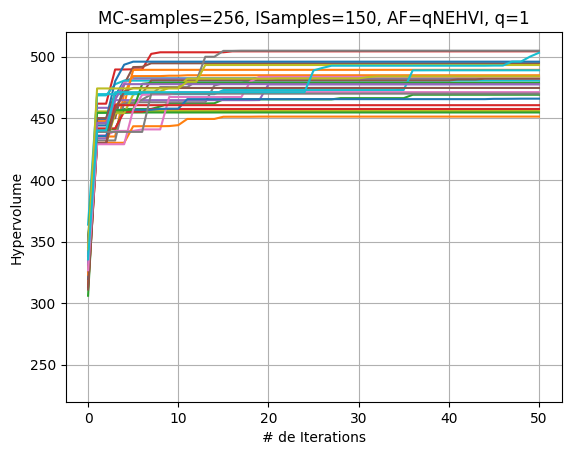

In [34]:
iters = np.arange(51)

for i in range(30):

    plt.errorbar(iters, np.asarray(hvsf27yexp11[i]), linewidth=1.5,label='%i' %i)
    plt.xlabel('# de Iterations')
    plt.ylabel('Hypervolume')
    plt.title('MC-samples=256, ISamples=150, AF=qNEHVI, q=1')
plt.grid()
plt.ylim([220,520])
plt.savefig('Exp11-27July')

In [35]:
%store BDs27yexp11
%store hvsf27yexp11
%store trainxall27yexp11
%store trainobjall27yexp11
%store numbd27yexp11

Stored 'BDs27yexp11' (list)
Stored 'hvsf27yexp11' (list)
Stored 'trainxall27yexp11' (list)
Stored 'trainobjall27yexp11' (list)
Stored 'numbd27yexp11' (list)


In [ ]:
BDs27yexp12=[]
hvsf27yexp12=[]
trainxall27yexp12=[]
trainobjall27yexp12=[]
numbd27yexp12=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=320)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp12.append(bd.pareto_Y)      
    hvsf27yexp12.append(hvs_ehvi)   
    trainxall27yexp12.append(train_x_ehvi)
    trainobjall27yexp12.append(train_obj_ehvi)
    numbd27yexp12.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]

Seed: 382


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 450.1116 #Paprox=28 time = 68.34 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 450.1116 #Paprox=28 time = 72.02 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 478.6349 #Paprox=29 time = 68.13 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 478.6349 #Paprox=29 time = 72.24 Lysine= 1.2401 Energy= 14.0010 Costs= 160.0938)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 478.6349 #Paprox=29 time = 70.64 Lysine= 1.1876 Energy= 14.0604 Costs= 157.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 478.6349 #Paprox=29 time = 68.05 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 478.6349 #Paprox=29 time = 71.33 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 478.6349 #Paprox=29 time = 71.09 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 478.6771 #Paprox=30 time = 69.88 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 478.6771 #Paprox=31 time = 70.16 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 478.6771 #Paprox=31 time = 74.33 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 478.6771 #Paprox=32 time = 71.66 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 478.6771 #Paprox=33 time = 73.77 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 478.6771 #Paprox=33 time = 73.18 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 478.6771 #Paprox=34 time = 71.05 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 478.6771 #Paprox=35 time = 72.21 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 478.6771 #Paprox=36 time = 72.88 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 478.6771 #Paprox=37 time = 72.19 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 478.6771 #Paprox=37 time = 75.44 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 478.6771 #Paprox=38 time = 71.84 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 478.6771 #Paprox=38 time = 74.25 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 478.6771 #Paprox=38 time = 73.27 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 478.6771 #Paprox=38 time = 73.04 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 478.6771 #Paprox=39 time = 73.49 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 478.6771 #Paprox=40 time = 73.50 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 478.6771 #Paprox=41 time = 76.96 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 478.6771 #Paprox=42 time = 72.77 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 478.6771 #Paprox=42 time = 73.97 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 478.6771 #Paprox=43 time = 74.55 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 478.6771 #Paprox=44 time = 72.74 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 478.6771 #Paprox=45 time = 73.86 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 478.6771 #Paprox=46 time = 74.42 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 478.6771 #Paprox=46 time = 77.55 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 478.6771 #Paprox=47 time = 74.72 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 478.6771 #Paprox=48 time = 75.57 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 478.6771 #Paprox=49 time = 74.45 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 478.6771 #Paprox=49 time = 74.57 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 478.6771 #Paprox=50 time = 73.83 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 478.6771 #Paprox=50 time = 73.74 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 478.6771 #Paprox=50 time = 75.84 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 478.6771 #Paprox=51 time = 75.16 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 478.6771 #Paprox=52 time = 75.66 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 478.6771 #Paprox=52 time = 77.26 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 478.6771 #Paprox=53 time = 75.06 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 478.6771 #Paprox=53 time = 75.72 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 478.6771 #Paprox=53 time = 75.28 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 478.6771 #Paprox=54 time = 75.15 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 478.6771 #Paprox=54 time = 75.39 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 478.6771 #Paprox=54 time = 80.02 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▏                                   | 1/30 [1:01:23<29:40:34, 3683.96s/it]


Batch 50: Hypervolume (qNEHVI) = 478.6771 #Paprox=55 time = 76.89 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)Seed: 953


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 386.0469 #Paprox=29 time = 74.90 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 386.0469 #Paprox=29 time = 47.86 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 457.7380 #Paprox=30 time = 49.53 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 463.7040 #Paprox=31 time = 51.73 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 465.4318 #Paprox=28 time = 52.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 465.4318 #Paprox=29 time = 47.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 465.4318 #Paprox=30 time = 49.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 465.4318 #Paprox=31 time = 51.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 465.4318 #Paprox=32 time = 50.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 465.4318 #Paprox=33 time = 52.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 465.4318 #Paprox=33 time = 53.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 465.4318 #Paprox=34 time = 53.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 465.4318 #Paprox=34 time = 55.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 465.4318 #Paprox=35 time = 52.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 465.4318 #Paprox=35 time = 54.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 465.4318 #Paprox=36 time = 55.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 465.4318 #Paprox=37 time = 54.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 465.4318 #Paprox=37 time = 54.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 465.4318 #Paprox=38 time = 54.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 465.4318 #Paprox=39 time = 55.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 465.4318 #Paprox=40 time = 56.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 465.4318 #Paprox=40 time = 55.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 465.4318 #Paprox=41 time = 57.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 465.4318 #Paprox=41 time = 55.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 465.4318 #Paprox=42 time = 55.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 465.4318 #Paprox=42 time = 57.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 465.4318 #Paprox=43 time = 56.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 465.4318 #Paprox=43 time = 57.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 465.4318 #Paprox=42 time = 56.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 465.4318 #Paprox=43 time = 56.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 465.4318 #Paprox=44 time = 57.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 465.4318 #Paprox=45 time = 56.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 465.4318 #Paprox=46 time = 58.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 465.4318 #Paprox=47 time = 57.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 465.4318 #Paprox=48 time = 58.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 465.4318 #Paprox=49 time = 57.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 465.4318 #Paprox=50 time = 57.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 465.4318 #Paprox=50 time = 59.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 465.4318 #Paprox=51 time = 57.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 465.4318 #Paprox=52 time = 57.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 465.4318 #Paprox=53 time = 58.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 465.4318 #Paprox=53 time = 57.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 465.4318 #Paprox=53 time = 57.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 465.4318 #Paprox=54 time = 56.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 465.4318 #Paprox=55 time = 57.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 465.4318 #Paprox=56 time = 58.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 465.4318 #Paprox=57 time = 59.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 465.4318 #Paprox=58 time = 58.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 465.4318 #Paprox=59 time = 57.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▍                                  | 2/30 [1:48:03<24:36:15, 3163.43s/it]


Batch 50: Hypervolume (qNEHVI) = 465.4318 #Paprox=60 time = 58.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 832


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 469.3029 #Paprox=30 time = 71.12 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 469.3029 #Paprox=30 time = 69.21 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 481.8950 #Paprox=31 time = 74.45 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 483.8406 #Paprox=31 time = 70.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 483.8406 #Paprox=32 time = 60.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 483.8406 #Paprox=33 time = 64.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 483.8406 #Paprox=34 time = 66.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 483.8406 #Paprox=35 time = 68.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 483.8406 #Paprox=35 time = 66.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 483.8406 #Paprox=36 time = 70.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 483.8406 #Paprox=37 time = 68.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 483.8406 #Paprox=38 time = 70.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 483.8406 #Paprox=39 time = 70.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 483.8406 #Paprox=40 time = 69.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 483.8406 #Paprox=41 time = 70.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 483.8406 #Paprox=40 time = 70.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 483.8406 #Paprox=41 time = 72.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 483.8406 #Paprox=42 time = 70.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 483.8406 #Paprox=40 time = 72.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 483.8406 #Paprox=40 time = 72.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 483.8406 #Paprox=41 time = 72.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 483.8406 #Paprox=42 time = 70.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 483.8406 #Paprox=43 time = 71.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 483.8406 #Paprox=43 time = 72.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 484.2438 #Paprox=43 time = 72.42 Lysine= 1.1217 Energy= 14.4452 Costs= 151.5102)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 485.5874 #Paprox=44 time = 73.21 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 485.5874 #Paprox=44 time = 72.38 Lysine= 1.1439 Energy= 14.0010 Costs= 152.4163)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 485.5874 #Paprox=45 time = 71.80 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 485.5874 #Paprox=46 time = 71.19 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 485.5874 #Paprox=46 time = 70.98 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 485.5874 #Paprox=47 time = 73.79 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 485.5874 #Paprox=48 time = 73.41 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 485.5874 #Paprox=49 time = 74.26 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 485.5874 #Paprox=50 time = 73.18 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 485.5874 #Paprox=51 time = 73.33 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 485.5874 #Paprox=52 time = 70.93 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 485.5874 #Paprox=53 time = 73.37 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 485.5874 #Paprox=54 time = 72.77 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 485.5874 #Paprox=55 time = 73.44 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 485.5874 #Paprox=56 time = 75.36 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 485.5874 #Paprox=57 time = 73.71 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 485.5874 #Paprox=58 time = 72.33 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 485.5874 #Paprox=59 time = 73.77 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 485.5874 #Paprox=60 time = 76.11 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 485.5874 #Paprox=61 time = 74.26 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 485.5874 #Paprox=62 time = 74.35 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 485.5874 #Paprox=62 time = 73.37 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 485.5874 #Paprox=63 time = 75.51 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 485.5874 #Paprox=63 time = 76.25 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|███▋                                 | 3/30 [2:47:52<25:11:10, 3358.16s/it]


Batch 50: Hypervolume (qNEHVI) = 485.5874 #Paprox=64 time = 74.13 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 62


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 443.1079 #Paprox=31 time = 73.03 Lysine= 0.9501 Energy= 14.4708 Costs= 146.5591)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 443.1079 #Paprox=31 time = 69.31 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 474.0573 #Paprox=32 time = 75.28 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 483.8565 #Paprox=33 time = 69.96 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 483.8565 #Paprox=34 time = 72.00 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 483.8565 #Paprox=35 time = 71.86 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 483.8565 #Paprox=35 time = 71.22 Lysine= 1.1923 Energy= 14.0010 Costs= 171.8849)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 483.8565 #Paprox=35 time = 72.59 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 483.8565 #Paprox=35 time = 72.10 Lysine= 0.9501 Energy= 14.4406 Costs= 152.4815)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 483.8565 #Paprox=35 time = 71.14 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 483.8565 #Paprox=35 time = 77.07 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 483.8565 #Paprox=36 time = 76.93 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 483.8565 #Paprox=37 time = 74.02 Lysine= 0.9501 Energy= 14.4406 Costs= 152.4815)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 483.8565 #Paprox=37 time = 80.65 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 483.8565 #Paprox=38 time = 76.53 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 483.8565 #Paprox=39 time = 73.48 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 483.8565 #Paprox=39 time = 78.19 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 483.8565 #Paprox=39 time = 77.78 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 483.8565 #Paprox=39 time = 75.05 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 483.8565 #Paprox=39 time = 75.67 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 483.8565 #Paprox=39 time = 73.71 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 483.8565 #Paprox=39 time = 78.39 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 483.8565 #Paprox=39 time = 80.56 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 483.8565 #Paprox=40 time = 75.55 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 484.3811 #Paprox=41 time = 73.60 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 484.3811 #Paprox=39 time = 77.41 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 484.3811 #Paprox=39 time = 76.60 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 484.3811 #Paprox=39 time = 75.07 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 484.3811 #Paprox=39 time = 77.61 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 484.3811 #Paprox=39 time = 74.93 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 484.3811 #Paprox=40 time = 72.50 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 484.3811 #Paprox=41 time = 82.74 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 485.1150 #Paprox=42 time = 79.32 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 485.1150 #Paprox=42 time = 75.53 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 485.1150 #Paprox=42 time = 77.00 Lysine= 0.9501 Energy= 14.4432 Costs= 152.5305)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 485.1150 #Paprox=42 time = 81.40 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 485.1150 #Paprox=42 time = 79.57 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 486.2977 #Paprox=41 time = 80.91 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 486.2977 #Paprox=41 time = 74.31 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 486.2977 #Paprox=41 time = 74.35 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 486.2977 #Paprox=42 time = 79.26 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 486.2977 #Paprox=43 time = 80.15 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 486.2977 #Paprox=44 time = 77.95 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 486.2977 #Paprox=45 time = 79.23 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 486.2977 #Paprox=46 time = 81.56 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 486.2977 #Paprox=46 time = 84.78 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 486.2977 #Paprox=46 time = 76.46 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 486.2977 #Paprox=46 time = 80.62 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 486.2977 #Paprox=47 time = 82.49 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|████▉                                | 4/30 [3:51:47<25:36:38, 3546.08s/it]


Batch 50: Hypervolume (qNEHVI) = 486.2977 #Paprox=48 time = 82.02 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)Seed: 905


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 387.5375 #Paprox=32 time = 65.09 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 471.6863 #Paprox=33 time = 64.42 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 471.6863 #Paprox=33 time = 63.16 Lysine= 1.2618 Energy= 14.0010 Costs= 163.7685)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 490.5629 #Paprox=34 time = 62.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 499.6231 #Paprox=34 time = 61.80 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 501.5734 #Paprox=31 time = 61.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 504.6531 #Paprox=32 time = 53.24 Lysine= 1.0416 Energy= 14.0194 Costs= 146.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 504.6531 #Paprox=32 time = 58.73 Lysine= 1.5658 Energy= 14.0010 Costs= 165.7649)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 505.2056 #Paprox=33 time = 65.30 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 505.6959 #Paprox=34 time = 57.18 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 506.1344 #Paprox=35 time = 60.17 Lysine= 0.9624 Energy= 14.0010 Costs= 144.3594)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 506.1344 #Paprox=35 time = 63.74 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 508.1779 #Paprox=36 time = 72.82 Lysine= 1.3583 Energy= 14.0010 Costs= 154.6542)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 508.5574 #Paprox=37 time = 58.64 Lysine= 0.9843 Energy= 14.0010 Costs= 145.6794)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 508.5574 #Paprox=37 time = 60.45 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 508.5574 #Paprox=38 time = 60.64 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 508.5574 #Paprox=39 time = 59.47 Lysine= 0.9843 Energy= 14.0010 Costs= 145.6794)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 508.5574 #Paprox=39 time = 61.60 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 508.5574 #Paprox=40 time = 63.72 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 508.5574 #Paprox=41 time = 62.93 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 508.5574 #Paprox=41 time = 64.57 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 508.5574 #Paprox=41 time = 61.77 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 508.5574 #Paprox=41 time = 58.50 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 508.5574 #Paprox=41 time = 66.81 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 508.5574 #Paprox=41 time = 59.75 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 508.5574 #Paprox=41 time = 64.18 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 508.5574 #Paprox=41 time = 61.23 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 508.5574 #Paprox=41 time = 59.37 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 508.5574 #Paprox=42 time = 63.66 Lysine= 0.9843 Energy= 14.0010 Costs= 145.6794)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 508.5574 #Paprox=42 time = 60.36 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 508.5574 #Paprox=42 time = 63.61 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 508.5574 #Paprox=43 time = 68.55 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 508.5574 #Paprox=43 time = 65.07 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 508.5574 #Paprox=44 time = 65.90 Lysine= 0.9843 Energy= 14.0010 Costs= 145.6794)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 508.5574 #Paprox=44 time = 72.88 Lysine= 1.0620 Energy= 14.0010 Costs= 149.9698)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 508.5574 #Paprox=44 time = 64.09 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 508.5574 #Paprox=44 time = 63.07 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 508.5574 #Paprox=44 time = 62.74 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 508.5574 #Paprox=44 time = 82.55 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 508.5574 #Paprox=45 time = 63.23 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 508.5574 #Paprox=45 time = 66.49 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 508.5574 #Paprox=45 time = 67.53 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 508.5574 #Paprox=45 time = 66.32 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 508.5574 #Paprox=46 time = 62.64 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 508.5574 #Paprox=46 time = 64.61 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 508.5574 #Paprox=46 time = 62.80 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 508.5574 #Paprox=46 time = 67.42 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 508.5574 #Paprox=46 time = 67.43 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 508.5574 #Paprox=47 time = 65.58 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▏                              | 5/30 [4:44:54<23:43:36, 3416.66s/it]


Batch 50: Hypervolume (qNEHVI) = 508.5574 #Paprox=47 time = 62.68 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)Seed: 437


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 474.0424 #Paprox=20 time = 72.24 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 474.0424 #Paprox=20 time = 71.21 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 484.5076 #Paprox=21 time = 70.90 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 484.5076 #Paprox=22 time = 72.28 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 484.5076 #Paprox=23 time = 73.10 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 484.5076 #Paprox=24 time = 71.12 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 484.5076 #Paprox=25 time = 71.64 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 484.5076 #Paprox=26 time = 71.13 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 484.5076 #Paprox=27 time = 72.79 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 484.5076 #Paprox=28 time = 72.26 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 484.5076 #Paprox=29 time = 71.26 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 484.5076 #Paprox=30 time = 71.87 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 484.5076 #Paprox=31 time = 72.41 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 484.5076 #Paprox=32 time = 71.61 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 484.5076 #Paprox=33 time = 73.01 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 484.5076 #Paprox=34 time = 72.42 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 484.5076 #Paprox=35 time = 73.85 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 484.5076 #Paprox=36 time = 72.20 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 484.5076 #Paprox=37 time = 73.66 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 484.5076 #Paprox=37 time = 73.32 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 484.5076 #Paprox=38 time = 73.55 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 484.5076 #Paprox=39 time = 74.17 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 484.5076 #Paprox=39 time = 78.77 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 484.5076 #Paprox=40 time = 75.66 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 484.5076 #Paprox=41 time = 75.42 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 484.5076 #Paprox=42 time = 76.94 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 484.5076 #Paprox=42 time = 74.35 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 484.5076 #Paprox=43 time = 76.52 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 484.5076 #Paprox=44 time = 77.02 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 484.5076 #Paprox=44 time = 74.27 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 484.5076 #Paprox=45 time = 81.41 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 484.5076 #Paprox=45 time = 76.34 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 484.5076 #Paprox=46 time = 75.30 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 484.5076 #Paprox=47 time = 74.62 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 484.5076 #Paprox=48 time = 76.48 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 484.5076 #Paprox=48 time = 75.44 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 484.5076 #Paprox=49 time = 77.35 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 484.5076 #Paprox=49 time = 87.22 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 484.5076 #Paprox=50 time = 80.23 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 484.5076 #Paprox=51 time = 79.78 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 484.5076 #Paprox=52 time = 77.99 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 484.5076 #Paprox=52 time = 78.10 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 484.5076 #Paprox=53 time = 81.64 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 484.5076 #Paprox=54 time = 83.54 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 484.5076 #Paprox=55 time = 83.37 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 484.5076 #Paprox=56 time = 81.44 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 484.5076 #Paprox=57 time = 86.97 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 484.5076 #Paprox=58 time = 87.02 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 484.5076 #Paprox=59 time = 89.90 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|███████▍                             | 6/30 [5:48:41<23:42:31, 3556.30s/it]


Batch 50: Hypervolume (qNEHVI) = 484.5076 #Paprox=60 time = 87.54 Lysine= 1.0721 Energy= 14.0010 Costs= 146.9974)Seed: 148


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 469.4974 #Paprox=20 time = 87.24 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 469.4974 #Paprox=20 time = 82.83 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 469.4974 #Paprox=20 time = 81.76 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 476.1586 #Paprox=21 time = 75.22 Lysine= 1.1932 Energy= 14.0010 Costs= 150.9367)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 476.1789 #Paprox=22 time = 71.95 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 476.1789 #Paprox=23 time = 73.58 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 476.1789 #Paprox=24 time = 78.91 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 476.1789 #Paprox=25 time = 82.51 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 476.1789 #Paprox=26 time = 83.37 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 476.8418 #Paprox=27 time = 79.36 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.8418 #Paprox=27 time = 82.10 Lysine= 1.4979 Energy= 14.0010 Costs= 168.0438)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 476.8418 #Paprox=27 time = 82.54 Lysine= 1.5778 Energy= 14.0010 Costs= 170.1134)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 83.44 Lysine= 1.5775 Energy= 14.0010 Costs= 169.9595)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 84.39 Lysine= 1.5216 Energy= 14.0010 Costs= 165.3180)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 87.74 Lysine= 1.5156 Energy= 14.0010 Costs= 164.8447)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 93.67 Lysine= 1.5218 Energy= 14.0010 Costs= 158.8332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 95.55 Lysine= 1.4993 Energy= 14.0010 Costs= 164.4748)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 89.32 Lysine= 1.4442 Energy= 14.0010 Costs= 163.4752)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 80.77 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 86.99 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 97.66 Lysine= 1.4259 Energy= 14.0010 Costs= 157.8201)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 79.92 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 79.41 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 83.69 Lysine= 1.4312 Energy= 14.0010 Costs= 159.4878)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 91.96 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 79.12 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 89.73 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 84.26 Lysine= 1.4277 Energy= 14.0010 Costs= 158.3849)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 80.27 Lysine= 1.4298 Energy= 14.0010 Costs= 159.0483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 78.00 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 79.40 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 78.61 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 82.66 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 476.8592 #Paprox=28 time = 83.05 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(


In [ ]:
iters = np.arange(51)

for i in range(30):

    plt.errorbar(iters, np.asarray(hvsf27yexp12[i]), linewidth=1.5,label='%i' %i)
    plt.xlabel('# de Iterations')
    plt.ylabel('Hypervolume')
    plt.title('MC-samples=256, ISamples=150, AF=qNEHVI, q=1')
plt.grid()
plt.ylim([220,520])
plt.savefig('Exp12-27July')

In [ ]:
%store BDs27yexp12
%store hvsf27yexp12
%store trainxall27yexp12
%store trainobjall27yexp12
%store numbd27yexp12

In [29]:
import numpy as np

def spacing(solutions):
    n = len(solutions)
    distances = np.zeros((n, n))

    for i in range(n):
        for j in range(i+1, n):
            distances[i,j] = np.sqrt(np.sum((solutions[i] - solutions[j])**2))
            distances[j,i] = distances[i,j]

    min_distances = np.zeros(n)
    for i in range(n):
        neighbors = np.argsort(distances[i,:])[1:4] # Select the 3 nearest neighbors
        min_distances[i] = np.min(distances[i,neighbors])

    spacing = np.mean(min_distances)

    return spacing

In [30]:
def calculate_spread(non_dominated_set, sample_size=1000):
    """Calculates the spread metric quality indicator for a high-dimensional 
    objective space by randomly sampling a subset of the non-dominated set.
    
    Args:
        non_dominated_set (ndarray): The non-dominated set obtained from the 
            optimization algorithm, as an N-by-17 matrix, where N is the number 
            of points.
        sample_size (int): The number of points to randomly sample from the 
            non-dominated set.
    
    Returns:
        The spread metric value.
    """
    n = non_dominated_set.shape[0]
    if n <= sample_size:
        distances = np.zeros(n-1)
        for i in range(n-1):
            distances[i] = np.sqrt(np.sum((non_dominated_set[i+1,:] - non_dominated_set[i,:])**2))
    else:
        sample_indices = np.random.choice(n, sample_size, replace=False)
        sample = non_dominated_set[sample_indices,:]
        distances = np.zeros(sample_size-1)
        for i in range(sample_size-1):
            distances[i] = np.sqrt(np.sum((sample[i+1,:] - sample[i,:])**2))
    
    return np.mean(distances)

In [31]:
import numpy as np
from scipy.spatial.distance import cdist

def spread_metric(solution_set, k=3):
    # Calculate the k-nearest neighbors for each solution
    k_distances = cdist(solution_set, solution_set, 'euclidean')
    k_distances.sort(axis=1)
    k_distances = k_distances[:, 1:k+1]

    # Calculate the average distance to the k-nearest neighbors for each solution
    avg_distance = np.mean(k_distances, axis=1)

    # Calculate the spread metric
    spread = np.sqrt(np.sum(np.square(avg_distance - np.mean(avg_distance))))
    return spread

In [33]:
Cardinality=np.array([np.array(BDs26jexp10[i].shape[0]) for i in range(30)])
hypervolume=np.array([np.round(hvsf26jexp10[i][-1],2) for i in range(30)])
Uniformity=np.array([spacing(np.array(BDs26jexp10[i].tolist())) for i in range(30)])
Spread=np.array([spread_metric(np.array(BDs26jexp10[i].tolist())) for i in range(30)])
DF=pd.DataFrame({'Cardinality':Cardinality,'Spread':Spread,'Uniformity':Uniformity, 'HyperVolume':hypervolume})
DF

,Cardinality,Spread,Uniformity,HyperVolume
0,47,2.443622,0.261118,488.24
1,60,3.741112,0.204104,474.82
2,39,5.829894,0.339165,447.26
3,42,3.949545,0.345342,476.07
4,44,4.831854,0.426625,493.34
5,39,2.633825,0.295302,484.32
6,14,6.620973,0.793856,459.81
7,51,3.437950,0.362674,487.64
8,65,3.168074,0.225473,517.67
9,48,5.542419,0.318367,479.17


In [34]:
DF.mean()

Cardinality     48.433333
Spread           4.019813
Uniformity       0.318939
HyperVolume    483.689333
dtype: float64

In [26]:
len(hvsf26jexp10)

30

In [60]:
BDsAexp10=[]
hvsfAexp10=[]
trainxallAexp10=[]
trainobjallAexp10=[]
numbdAexp10=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=100)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDsAexp10.append(bd.pareto_Y)      
    hvsfAexp10.append(hvs_ehvi)   
    trainxallAexp10.append(train_x_ehvi)
    trainobjallAexp10.append(train_obj_ehvi)
    numbdAexp10.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]

Seed: 134


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 463.6673 #Paprox=17 time = 21.73 Lysine= 0.9501 Energy= 14.3950 Costs= 145.7153)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 463.6673 #Paprox=17 time = 23.06 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 463.6673 #Paprox=17 time = 27.28 Lysine= 1.1979 Energy= 14.0010 Costs= 175.4901)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 466.4747 #Paprox=18 time = 22.41 Lysine= 0.9501 Energy= 14.5965 Costs= 152.7585)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 466.6073 #Paprox=19 time = 27.14 Lysine= 0.9501 Energy= 14.5521 Costs= 151.8702)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 466.6146 #Paprox=20 time = 23.96 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 466.6309 #Paprox=21 time = 25.61 Lysine= 0.9501 Energy= 14.5959 Costs= 152.3651)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 467.0065 #Paprox=21 time = 24.93 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 467.0065 #Paprox=21 time = 24.70 Lysine= 0.9501 Energy= 14.3918 Costs= 152.1434)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 467.0065 #Paprox=22 time = 25.80 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 467.0065 #Paprox=23 time = 24.84 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 467.0065 #Paprox=24 time = 26.22 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 467.0066 #Paprox=25 time = 25.24 Lysine= 0.9501 Energy= 14.6186 Costs= 152.6208)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 467.0066 #Paprox=26 time = 26.42 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 467.0066 #Paprox=27 time = 25.95 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 467.0066 #Paprox=28 time = 26.41 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 467.0066 #Paprox=29 time = 27.73 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 467.0066 #Paprox=30 time = 25.98 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 467.0066 #Paprox=31 time = 27.58 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 467.0066 #Paprox=31 time = 27.17 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 467.0066 #Paprox=31 time = 27.39 Lysine= 0.9501 Energy= 14.5643 Costs= 152.9425)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 467.0066 #Paprox=32 time = 26.53 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 467.0066 #Paprox=32 time = 26.81 Lysine= 0.9501 Energy= 14.5544 Costs= 152.9987)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 467.0066 #Paprox=33 time = 27.42 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 467.0066 #Paprox=34 time = 27.52 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 467.0113 #Paprox=35 time = 27.48 Lysine= 0.9501 Energy= 14.5804 Costs= 152.1905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 467.0113 #Paprox=35 time = 27.91 Lysine= 0.9501 Energy= 14.4469 Costs= 152.0290)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 467.0113 #Paprox=35 time = 31.86 Lysine= 0.9501 Energy= 14.6145 Costs= 152.6562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 467.0113 #Paprox=36 time = 29.95 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 467.0113 #Paprox=37 time = 29.77 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 467.0534 #Paprox=38 time = 27.42 Lysine= 0.9501 Energy= 14.4995 Costs= 151.3958)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 467.0534 #Paprox=39 time = 27.39 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 467.0534 #Paprox=39 time = 28.69 Lysine= 0.9501 Energy= 14.6068 Costs= 152.6997)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 467.0534 #Paprox=40 time = 28.46 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 467.0547 #Paprox=41 time = 31.95 Lysine= 0.9501 Energy= 14.6047 Costs= 152.4643)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 467.0547 #Paprox=42 time = 34.74 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 467.0778 #Paprox=36 time = 36.48 Lysine= 0.9501 Energy= 14.5669 Costs= 151.5439)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 467.0778 #Paprox=37 time = 35.80 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 467.0778 #Paprox=37 time = 34.73 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 467.0778 #Paprox=37 time = 35.51 Lysine= 0.9501 Energy= 14.5928 Costs= 152.7798)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 467.0778 #Paprox=37 time = 35.53 Lysine= 0.9501 Energy= 14.4761 Costs= 151.9684)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 467.1768 #Paprox=38 time = 37.14 Lysine= 0.9501 Energy= 14.5721 Costs= 150.8874)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 467.1768 #Paprox=39 time = 35.46 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 467.1768 #Paprox=40 time = 35.51 Lysine= 0.9501 Energy= 14.6193 Costs= 152.6288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 467.1824 #Paprox=41 time = 35.50 Lysine= 0.9501 Energy= 14.5920 Costs= 151.9937)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 467.1824 #Paprox=41 time = 36.10 Lysine= 0.9501 Energy= 14.5934 Costs= 152.7129)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 467.1824 #Paprox=41 time = 36.59 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 467.1833 #Paprox=42 time = 34.31 Lysine= 0.9501 Energy= 14.6159 Costs= 152.5355)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 467.1833 #Paprox=42 time = 32.31 Lysine= 0.9501 Energy= 14.6181 Costs= 152.6356)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▎                                     | 1/30 [24:27<11:49:22, 1467.66s/it]


Batch 50: Hypervolume (qNEHVI) = 467.1833 #Paprox=42 time = 33.78 Lysine= 0.9501 Energy= 14.6124 Costs= 152.6390)Seed: 532

Batch  1: Hypervolume (qNEHVI) = 460.3599 #Paprox=17 time = 24.65 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 460.3599 #Paprox=17 time = 23.23 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 461.2355 #Paprox=18 time = 23.97 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 461.2355 #Paprox=19 time = 25.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 461.2355 #Paprox=20 time = 25.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 461.2355 #Paprox=21 time = 24.88 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 461.2355 #Paprox=22 time = 24.54 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 461.2355 #Paprox=23 time = 24.99 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 461.2355 #Paprox=24 time = 24.61 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 481.3971 #Paprox=25 time = 26.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 494.7152 #Paprox=26 time = 25.51 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 495.9806 #Paprox=25 time = 26.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 495.9806 #Paprox=26 time = 21.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 495.9806 #Paprox=27 time = 21.74 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 495.9806 #Paprox=28 time = 22.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 495.9806 #Paprox=29 time = 23.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 495.9806 #Paprox=30 time = 24.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 495.9806 #Paprox=31 time = 24.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 495.9806 #Paprox=32 time = 23.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 495.9806 #Paprox=32 time = 24.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 495.9806 #Paprox=33 time = 25.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 495.9806 #Paprox=34 time = 26.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 495.9806 #Paprox=35 time = 25.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 495.9806 #Paprox=36 time = 26.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 495.9806 #Paprox=37 time = 26.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 495.9806 #Paprox=38 time = 27.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 495.9806 #Paprox=39 time = 25.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 499.0603 #Paprox=40 time = 26.76 Lysine= 1.0416 Energy= 14.0194 Costs= 146.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 499.0603 #Paprox=40 time = 27.10 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 500.5175 #Paprox=41 time = 26.01 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 500.5175 #Paprox=42 time = 27.21 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 500.5175 #Paprox=43 time = 26.36 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 500.5175 #Paprox=44 time = 27.25 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 500.5175 #Paprox=45 time = 27.90 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 500.5175 #Paprox=46 time = 28.69 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 500.5175 #Paprox=47 time = 27.42 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 500.5175 #Paprox=48 time = 27.66 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 500.5175 #Paprox=49 time = 28.80 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 500.5175 #Paprox=50 time = 28.17 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 500.5175 #Paprox=51 time = 26.56 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 500.5175 #Paprox=52 time = 28.30 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 500.5175 #Paprox=53 time = 28.73 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 500.5175 #Paprox=54 time = 29.42 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 500.5175 #Paprox=55 time = 29.56 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 500.5175 #Paprox=56 time = 28.71 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 500.5175 #Paprox=57 time = 29.43 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 500.5175 #Paprox=58 time = 27.96 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 500.5175 #Paprox=59 time = 28.26 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 500.5175 #Paprox=60 time = 29.68 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▌                                    | 2/30 [46:22<10:43:02, 1377.94s/it]


Batch 50: Hypervolume (qNEHVI) = 500.5175 #Paprox=61 time = 28.44 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 610


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 442.2160 #Paprox=23 time = 27.18 Lysine= 0.9501 Energy= 14.4213 Costs= 146.0144)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 442.2160 #Paprox=23 time = 26.60 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 442.2160 #Paprox=23 time = 27.22 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 442.9536 #Paprox=24 time = 27.20 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 442.9536 #Paprox=25 time = 26.48 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 442.9536 #Paprox=26 time = 27.26 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 442.9536 #Paprox=26 time = 27.82 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 442.9536 #Paprox=27 time = 27.74 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 442.9536 #Paprox=28 time = 27.05 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 442.9536 #Paprox=28 time = 28.08 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 442.9536 #Paprox=28 time = 29.06 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 442.9536 #Paprox=29 time = 28.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 442.9536 #Paprox=29 time = 28.94 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 442.9536 #Paprox=29 time = 28.86 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 442.9536 #Paprox=30 time = 28.95 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 442.9536 #Paprox=31 time = 30.18 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 442.9536 #Paprox=32 time = 29.53 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 442.9536 #Paprox=33 time = 29.03 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 442.9536 #Paprox=34 time = 29.32 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 442.9536 #Paprox=35 time = 29.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 442.9536 #Paprox=36 time = 28.43 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 442.9536 #Paprox=36 time = 30.63 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 442.9536 #Paprox=37 time = 29.93 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 442.9536 #Paprox=37 time = 30.21 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 442.9536 #Paprox=38 time = 28.65 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 442.9536 #Paprox=38 time = 29.35 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 442.9536 #Paprox=39 time = 29.26 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 442.9536 #Paprox=40 time = 28.92 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 442.9536 #Paprox=41 time = 30.26 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 442.9536 #Paprox=42 time = 30.46 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 442.9536 #Paprox=43 time = 30.03 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 442.9536 #Paprox=44 time = 30.66 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 442.9536 #Paprox=45 time = 30.66 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 442.9536 #Paprox=46 time = 31.34 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 442.9536 #Paprox=46 time = 30.40 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 442.9536 #Paprox=47 time = 31.05 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 442.9536 #Paprox=47 time = 30.52 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 442.9536 #Paprox=47 time = 31.05 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 442.9536 #Paprox=47 time = 31.47 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 442.9536 #Paprox=47 time = 31.11 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 442.9536 #Paprox=48 time = 31.34 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 442.9536 #Paprox=49 time = 30.81 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 442.9536 #Paprox=49 time = 30.41 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 442.9536 #Paprox=50 time = 31.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 442.9536 #Paprox=50 time = 31.29 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 442.9536 #Paprox=50 time = 31.98 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 442.9536 #Paprox=50 time = 30.77 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 442.9536 #Paprox=50 time = 31.14 Lysine= 0.9501 Energy= 14.3805 Costs= 151.7484)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 442.9536 #Paprox=50 time = 31.58 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|███▋                                 | 3/30 [1:11:04<10:41:28, 1425.50s/it]


Batch 50: Hypervolume (qNEHVI) = 442.9536 #Paprox=51 time = 31.32 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)Seed: 351


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 441.4393 #Paprox=17 time = 26.24 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 441.4393 #Paprox=17 time = 25.74 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 472.4944 #Paprox=18 time = 26.53 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 472.4944 #Paprox=19 time = 27.66 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 487.8089 #Paprox=20 time = 28.88 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 487.8089 #Paprox=21 time = 27.88 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 487.8089 #Paprox=22 time = 28.42 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 487.8089 #Paprox=23 time = 27.58 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 487.8089 #Paprox=24 time = 27.01 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 487.8089 #Paprox=25 time = 27.58 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 487.8089 #Paprox=26 time = 29.06 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 487.8089 #Paprox=27 time = 27.57 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 487.8089 #Paprox=28 time = 28.15 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 487.8089 #Paprox=29 time = 27.76 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 487.8089 #Paprox=30 time = 27.88 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 487.8089 #Paprox=31 time = 28.57 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 487.8089 #Paprox=32 time = 29.15 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 487.8089 #Paprox=33 time = 27.76 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 487.8089 #Paprox=33 time = 28.13 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 487.8089 #Paprox=34 time = 28.55 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 487.8089 #Paprox=35 time = 31.88 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 487.8089 #Paprox=35 time = 28.90 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 487.8089 #Paprox=36 time = 28.80 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 487.8089 #Paprox=37 time = 28.22 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 487.8089 #Paprox=38 time = 29.03 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 487.8089 #Paprox=39 time = 28.01 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 487.8089 #Paprox=39 time = 28.71 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 487.8089 #Paprox=40 time = 29.06 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 487.8089 #Paprox=41 time = 29.38 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 487.8089 #Paprox=42 time = 29.18 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 487.8089 #Paprox=43 time = 30.11 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 487.8089 #Paprox=44 time = 30.59 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 487.8089 #Paprox=45 time = 30.89 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 487.8089 #Paprox=46 time = 30.30 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 487.8089 #Paprox=46 time = 29.67 Lysine= 1.1040 Energy= 14.0010 Costs= 161.1901)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 487.8089 #Paprox=47 time = 29.13 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 487.8089 #Paprox=47 time = 29.11 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 492.2184 #Paprox=48 time = 31.20 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 492.9628 #Paprox=49 time = 32.39 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 492.9628 #Paprox=49 time = 31.32 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 492.9628 #Paprox=49 time = 25.54 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 492.9628 #Paprox=50 time = 23.18 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 492.9628 #Paprox=51 time = 22.81 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 492.9628 #Paprox=51 time = 22.99 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 492.9628 #Paprox=52 time = 23.73 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 492.9628 #Paprox=52 time = 21.28 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 492.9628 #Paprox=53 time = 21.49 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 492.9628 #Paprox=53 time = 20.04 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 492.9628 #Paprox=54 time = 21.33 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|████▉                                | 4/30 [1:34:02<10:09:27, 1406.46s/it]


Batch 50: Hypervolume (qNEHVI) = 492.9628 #Paprox=55 time = 20.97 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)Seed: 603


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 428.5601 #Paprox=7 time = 17.21 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 428.5601 #Paprox=7 time = 17.39 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 428.5601 #Paprox=8 time = 18.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 459.6153 #Paprox=9 time = 18.42 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 459.6153 #Paprox=10 time = 18.50 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 459.6153 #Paprox=11 time = 18.90 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 459.6153 #Paprox=12 time = 19.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 459.6153 #Paprox=13 time = 19.29 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 459.6153 #Paprox=14 time = 19.61 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 459.6153 #Paprox=15 time = 20.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 459.6153 #Paprox=16 time = 19.80 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 459.6153 #Paprox=17 time = 19.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 459.6153 #Paprox=18 time = 19.77 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 459.6153 #Paprox=19 time = 19.99 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 459.6153 #Paprox=20 time = 20.60 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 459.6153 #Paprox=21 time = 20.01 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 459.6153 #Paprox=22 time = 19.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 459.6153 #Paprox=23 time = 20.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 459.6153 #Paprox=24 time = 19.32 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 459.6153 #Paprox=25 time = 21.37 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 459.6153 #Paprox=26 time = 20.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 459.6153 #Paprox=27 time = 21.32 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 459.6153 #Paprox=28 time = 20.89 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 459.6153 #Paprox=29 time = 22.34 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 459.6153 #Paprox=30 time = 20.78 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 459.6153 #Paprox=31 time = 21.15 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 459.6153 #Paprox=32 time = 21.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 459.6153 #Paprox=33 time = 21.88 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 459.6153 #Paprox=34 time = 21.73 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 459.6153 #Paprox=35 time = 21.31 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 459.6153 #Paprox=36 time = 21.73 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 459.6153 #Paprox=37 time = 22.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 459.6153 #Paprox=38 time = 22.72 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 459.6153 #Paprox=39 time = 22.13 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 459.6153 #Paprox=40 time = 22.19 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 459.6153 #Paprox=41 time = 23.49 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 459.6153 #Paprox=42 time = 22.59 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 459.6153 #Paprox=43 time = 22.64 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 459.6153 #Paprox=44 time = 23.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 459.6153 #Paprox=45 time = 23.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 459.6153 #Paprox=46 time = 23.05 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 459.6153 #Paprox=47 time = 23.75 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 459.6153 #Paprox=48 time = 22.68 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 459.6153 #Paprox=48 time = 22.82 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 459.6153 #Paprox=49 time = 22.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 459.6153 #Paprox=49 time = 23.61 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 459.6153 #Paprox=50 time = 22.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 459.6153 #Paprox=51 time = 22.51 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 459.6153 #Paprox=52 time = 22.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▎                               | 5/30 [1:51:39<8:53:37, 1280.68s/it]


Batch 50: Hypervolume (qNEHVI) = 459.6153 #Paprox=53 time = 23.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)Seed: 715


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 442.3685 #Paprox=26 time = 25.05 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 442.3685 #Paprox=26 time = 23.47 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 447.2163 #Paprox=27 time = 24.16 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 478.7312 #Paprox=28 time = 25.71 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 489.4447 #Paprox=29 time = 25.44 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 489.4447 #Paprox=30 time = 26.62 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 489.4447 #Paprox=31 time = 25.29 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 489.4447 #Paprox=32 time = 26.12 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 489.4447 #Paprox=33 time = 25.45 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 489.4447 #Paprox=34 time = 26.72 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 489.4447 #Paprox=35 time = 26.67 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 489.4447 #Paprox=35 time = 26.99 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 489.4447 #Paprox=36 time = 25.96 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 489.4447 #Paprox=37 time = 25.82 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 489.4447 #Paprox=38 time = 26.92 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 489.4447 #Paprox=39 time = 25.92 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 489.4447 #Paprox=40 time = 26.04 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 489.4447 #Paprox=41 time = 27.60 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 489.4447 #Paprox=42 time = 26.94 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 489.4447 #Paprox=43 time = 26.73 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 489.4447 #Paprox=44 time = 27.41 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 489.4447 #Paprox=45 time = 27.44 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 489.4447 #Paprox=46 time = 26.98 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 489.4447 #Paprox=47 time = 25.54 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 489.4447 #Paprox=47 time = 27.57 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 489.4447 #Paprox=48 time = 27.29 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 489.4447 #Paprox=49 time = 26.71 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 489.4447 #Paprox=50 time = 26.49 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 489.4447 #Paprox=51 time = 28.12 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 489.4447 #Paprox=52 time = 27.43 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 489.4447 #Paprox=53 time = 27.28 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 489.4447 #Paprox=53 time = 24.58 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 489.4447 #Paprox=54 time = 21.98 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 489.4447 #Paprox=53 time = 21.67 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 489.4447 #Paprox=54 time = 21.89 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 489.4447 #Paprox=55 time = 21.77 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 489.4447 #Paprox=56 time = 21.80 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 489.4447 #Paprox=57 time = 22.10 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 489.4447 #Paprox=58 time = 21.89 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 489.4447 #Paprox=59 time = 21.60 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 489.4447 #Paprox=60 time = 22.55 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 489.4447 #Paprox=61 time = 21.88 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 489.4447 #Paprox=62 time = 22.08 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 489.4447 #Paprox=62 time = 21.84 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 489.4447 #Paprox=62 time = 22.36 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 489.4447 #Paprox=63 time = 22.22 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 489.4447 #Paprox=63 time = 22.74 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 489.4447 #Paprox=64 time = 22.30 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 489.4447 #Paprox=65 time = 22.21 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|███████▌                              | 6/30 [2:12:21<8:26:58, 1267.45s/it]


Batch 50: Hypervolume (qNEHVI) = 489.4447 #Paprox=66 time = 22.39 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)Seed: 139


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 434.9214 #Paprox=17 time = 19.84 Lysine= 0.9501 Energy= 14.4115 Costs= 145.9069)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 434.9214 #Paprox=17 time = 18.43 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 435.1956 #Paprox=18 time = 19.51 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 435.1998 #Paprox=19 time = 19.70 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 452.6068 #Paprox=20 time = 14.52 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 452.7779 #Paprox=21 time = 15.09 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 452.7779 #Paprox=22 time = 15.10 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 452.7779 #Paprox=23 time = 14.73 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 452.7779 #Paprox=23 time = 15.87 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 454.5298 #Paprox=24 time = 15.43 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 454.5298 #Paprox=25 time = 15.53 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 454.5298 #Paprox=26 time = 15.85 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 454.5298 #Paprox=26 time = 16.02 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 454.5298 #Paprox=27 time = 16.32 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 454.5298 #Paprox=28 time = 15.82 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 454.5298 #Paprox=29 time = 17.44 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 454.5298 #Paprox=30 time = 16.73 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 454.5298 #Paprox=30 time = 16.56 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 454.5298 #Paprox=30 time = 16.54 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 454.5298 #Paprox=31 time = 16.51 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 454.5298 #Paprox=32 time = 16.80 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 454.5298 #Paprox=33 time = 16.72 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 454.5298 #Paprox=34 time = 16.98 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 454.5298 #Paprox=35 time = 17.11 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 454.5298 #Paprox=36 time = 16.89 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 454.5298 #Paprox=37 time = 17.18 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 454.5298 #Paprox=38 time = 16.87 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 454.5298 #Paprox=39 time = 16.70 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 454.5298 #Paprox=40 time = 17.22 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 454.5298 #Paprox=40 time = 17.44 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 455.0211 #Paprox=41 time = 18.22 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 455.0211 #Paprox=42 time = 18.05 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 455.0211 #Paprox=43 time = 17.70 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 455.0211 #Paprox=44 time = 17.57 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 455.0211 #Paprox=45 time = 17.74 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 455.0211 #Paprox=46 time = 17.70 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 455.0211 #Paprox=47 time = 18.37 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 455.0211 #Paprox=48 time = 18.30 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 455.0211 #Paprox=49 time = 17.96 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 455.0211 #Paprox=50 time = 17.96 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 455.0211 #Paprox=51 time = 18.05 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 455.0211 #Paprox=52 time = 17.85 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 455.0211 #Paprox=53 time = 17.64 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 455.0211 #Paprox=54 time = 18.33 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 455.0211 #Paprox=55 time = 17.86 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 455.0211 #Paprox=56 time = 18.28 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 455.0211 #Paprox=57 time = 17.95 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 455.0211 #Paprox=58 time = 18.35 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 455.0211 #Paprox=59 time = 18.37 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 23%|████████▊                             | 7/30 [2:26:45<7:15:16, 1135.50s/it]


Batch 50: Hypervolume (qNEHVI) = 455.0211 #Paprox=60 time = 18.64 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)Seed: 90


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 451.0132 #Paprox=14 time = 22.12 Lysine= 0.9501 Energy= 14.3904 Costs= 145.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 451.0132 #Paprox=14 time = 22.19 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 466.8152 #Paprox=15 time = 22.50 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 466.8152 #Paprox=15 time = 22.42 Lysine= 1.2618 Energy= 14.0010 Costs= 163.7685)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 466.8152 #Paprox=16 time = 21.90 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 466.8152 #Paprox=17 time = 22.61 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 466.8152 #Paprox=17 time = 22.76 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 466.8152 #Paprox=18 time = 22.73 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 466.8152 #Paprox=19 time = 22.73 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 466.8152 #Paprox=20 time = 22.94 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 466.8152 #Paprox=21 time = 23.51 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 466.8152 #Paprox=21 time = 22.83 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 466.8152 #Paprox=21 time = 23.00 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 466.8152 #Paprox=22 time = 23.14 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 466.8152 #Paprox=23 time = 23.07 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 466.8152 #Paprox=24 time = 23.11 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 466.8152 #Paprox=25 time = 23.58 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 466.8152 #Paprox=26 time = 23.60 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 466.8152 #Paprox=26 time = 23.32 Lysine= 1.1620 Energy= 14.0010 Costs= 149.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 494.5467 #Paprox=27 time = 23.40 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 496.8043 #Paprox=28 time = 24.00 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 502.5633 #Paprox=29 time = 24.02 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 502.5633 #Paprox=30 time = 21.40 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 504.8612 #Paprox=31 time = 22.11 Lysine= 1.0417 Energy= 14.0010 Costs= 146.9312)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 504.9139 #Paprox=32 time = 23.58 Lysine= 1.1704 Energy= 14.0010 Costs= 154.5497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 504.9139 #Paprox=33 time = 25.71 Lysine= 1.1704 Energy= 14.0010 Costs= 154.5497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 504.9139 #Paprox=34 time = 24.07 Lysine= 1.1704 Energy= 14.0010 Costs= 154.5497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 504.9139 #Paprox=35 time = 24.84 Lysine= 1.1704 Energy= 14.0010 Costs= 154.5497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 504.9139 #Paprox=36 time = 25.52 Lysine= 1.1704 Energy= 14.0010 Costs= 154.5497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 504.9139 #Paprox=37 time = 24.23 Lysine= 1.1704 Energy= 14.0010 Costs= 154.5497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 504.9139 #Paprox=37 time = 23.19 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 504.9223 #Paprox=38 time = 22.94 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 504.9223 #Paprox=39 time = 23.00 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 505.1918 #Paprox=40 time = 23.00 Lysine= 0.9604 Energy= 14.0010 Costs= 145.0642)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 505.1918 #Paprox=40 time = 24.72 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 505.1918 #Paprox=40 time = 26.11 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 505.1918 #Paprox=40 time = 24.96 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 505.1918 #Paprox=41 time = 25.06 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 505.1918 #Paprox=41 time = 24.25 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 505.1918 #Paprox=41 time = 24.43 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 505.1918 #Paprox=41 time = 24.95 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 505.2428 #Paprox=42 time = 24.23 Lysine= 1.3943 Energy= 14.0010 Costs= 158.3984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 505.2428 #Paprox=42 time = 24.94 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 505.2428 #Paprox=43 time = 25.83 Lysine= 1.3943 Energy= 14.0010 Costs= 158.3984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 505.2428 #Paprox=44 time = 24.84 Lysine= 1.3943 Energy= 14.0010 Costs= 158.3984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 505.2428 #Paprox=45 time = 25.44 Lysine= 1.3943 Energy= 14.0010 Costs= 158.3984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 505.2428 #Paprox=45 time = 25.31 Lysine= 1.1066 Energy= 14.0010 Costs= 154.6381)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 505.2428 #Paprox=46 time = 25.40 Lysine= 1.3943 Energy= 14.0010 Costs= 158.3984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 505.2428 #Paprox=46 time = 27.82 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 27%|██████████▏                           | 8/30 [2:46:40<7:03:20, 1154.55s/it]


Batch 50: Hypervolume (qNEHVI) = 505.2428 #Paprox=47 time = 26.44 Lysine= 1.0879 Energy= 14.0010 Costs= 151.4042)Seed: 240


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 448.2045 #Paprox=20 time = 20.78 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 448.2045 #Paprox=20 time = 19.88 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 467.0811 #Paprox=21 time = 20.19 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 480.6491 #Paprox=22 time = 20.40 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 480.6491 #Paprox=23 time = 20.80 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 482.6167 #Paprox=23 time = 21.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 482.6167 #Paprox=23 time = 18.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 482.6167 #Paprox=24 time = 20.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 482.6167 #Paprox=25 time = 21.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 482.6167 #Paprox=26 time = 21.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 482.6167 #Paprox=27 time = 21.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 482.6167 #Paprox=28 time = 21.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 482.6167 #Paprox=29 time = 21.06 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 482.6167 #Paprox=30 time = 21.55 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 482.6167 #Paprox=31 time = 21.71 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 482.6167 #Paprox=31 time = 21.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 482.6167 #Paprox=32 time = 22.24 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 482.6167 #Paprox=33 time = 23.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 482.6167 #Paprox=34 time = 22.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 482.6167 #Paprox=35 time = 22.22 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 482.6167 #Paprox=36 time = 21.42 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 482.6167 #Paprox=37 time = 22.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 482.6167 #Paprox=38 time = 22.20 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 482.6167 #Paprox=39 time = 21.81 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 482.6167 #Paprox=40 time = 21.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 482.6167 #Paprox=41 time = 22.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 482.6167 #Paprox=42 time = 22.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 482.6167 #Paprox=43 time = 22.16 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 482.6167 #Paprox=43 time = 22.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 482.6167 #Paprox=44 time = 22.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 482.6167 #Paprox=45 time = 22.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 482.6167 #Paprox=46 time = 22.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 482.6167 #Paprox=47 time = 23.01 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 482.6167 #Paprox=48 time = 23.51 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 482.6167 #Paprox=49 time = 23.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 482.6167 #Paprox=50 time = 22.82 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 482.6167 #Paprox=50 time = 23.87 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 482.6167 #Paprox=51 time = 23.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 482.6167 #Paprox=52 time = 23.46 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 482.6167 #Paprox=53 time = 23.53 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 482.6167 #Paprox=54 time = 22.95 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 482.6167 #Paprox=55 time = 22.86 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 482.6167 #Paprox=56 time = 23.59 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 482.6167 #Paprox=56 time = 24.97 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 482.6167 #Paprox=57 time = 24.26 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 482.6167 #Paprox=58 time = 23.55 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 482.6167 #Paprox=59 time = 24.93 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 482.6167 #Paprox=60 time = 24.49 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 482.6167 #Paprox=60 time = 24.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 30%|███████████▍                          | 9/30 [3:05:20<6:40:14, 1143.54s/it]


Batch 50: Hypervolume (qNEHVI) = 482.6167 #Paprox=61 time = 23.89 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)Seed: 899


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 447.7369 #Paprox=7 time = 20.77 Lysine= 0.9501 Energy= 14.3931 Costs= 145.6870)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 447.7369 #Paprox=7 time = 21.01 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 466.9909 #Paprox=8 time = 20.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 480.1148 #Paprox=9 time = 21.39 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 482.3194 #Paprox=9 time = 21.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 482.4486 #Paprox=10 time = 18.74 Lysine= 1.1250 Energy= 14.4628 Costs= 151.7003)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 482.4486 #Paprox=10 time = 19.97 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 483.9093 #Paprox=11 time = 20.13 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 483.9093 #Paprox=12 time = 20.59 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 483.9093 #Paprox=13 time = 20.32 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 483.9093 #Paprox=14 time = 20.32 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 483.9093 #Paprox=15 time = 20.54 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 483.9093 #Paprox=16 time = 19.82 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 483.9093 #Paprox=17 time = 19.81 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 483.9093 #Paprox=18 time = 19.62 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 483.9093 #Paprox=19 time = 20.83 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 483.9093 #Paprox=20 time = 19.94 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 483.9093 #Paprox=21 time = 20.37 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 483.9093 #Paprox=22 time = 21.11 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 483.9093 #Paprox=23 time = 20.12 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 483.9093 #Paprox=24 time = 20.52 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 483.9093 #Paprox=24 time = 21.09 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 483.9093 #Paprox=25 time = 20.48 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 483.9093 #Paprox=26 time = 20.71 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 483.9093 #Paprox=27 time = 20.25 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 483.9093 #Paprox=28 time = 20.16 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 483.9093 #Paprox=29 time = 19.96 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 483.9093 #Paprox=30 time = 20.64 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 483.9093 #Paprox=30 time = 20.18 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 483.9093 #Paprox=31 time = 20.09 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 483.9093 #Paprox=32 time = 20.43 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 483.9093 #Paprox=32 time = 20.46 Lysine= 1.1562 Energy= 14.0010 Costs= 151.8789)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 483.9093 #Paprox=32 time = 20.42 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 483.9093 #Paprox=33 time = 20.65 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 483.9093 #Paprox=34 time = 20.75 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 483.9093 #Paprox=35 time = 20.56 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 483.9093 #Paprox=36 time = 20.75 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 483.9093 #Paprox=37 time = 20.33 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 483.9093 #Paprox=37 time = 20.79 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 483.9093 #Paprox=38 time = 21.39 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 483.9093 #Paprox=39 time = 20.41 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 483.9093 #Paprox=40 time = 20.65 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 483.9093 #Paprox=41 time = 21.37 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 483.9093 #Paprox=42 time = 21.10 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 483.9093 #Paprox=43 time = 21.27 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 483.9093 #Paprox=43 time = 22.00 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 483.9093 #Paprox=43 time = 21.05 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 483.9093 #Paprox=43 time = 21.36 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 483.9093 #Paprox=43 time = 21.79 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|████████████▎                        | 10/30 [3:22:31<6:09:36, 1108.80s/it]


Batch 50: Hypervolume (qNEHVI) = 483.9093 #Paprox=44 time = 21.26 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 193


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 427.6900 #Paprox=18 time = 21.43 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 427.6900 #Paprox=18 time = 21.19 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 458.7451 #Paprox=19 time = 21.77 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 458.8433 #Paprox=20 time = 22.37 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 460.2409 #Paprox=21 time = 22.35 Lysine= 1.1296 Energy= 14.0010 Costs= 154.4986)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 473.6818 #Paprox=22 time = 22.76 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 477.4942 #Paprox=23 time = 22.61 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 477.4942 #Paprox=24 time = 22.42 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 477.4942 #Paprox=25 time = 22.26 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 477.4942 #Paprox=26 time = 22.82 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 477.4942 #Paprox=27 time = 26.62 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 477.4942 #Paprox=28 time = 26.03 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 477.4942 #Paprox=29 time = 26.07 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 477.4942 #Paprox=29 time = 25.33 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 477.4942 #Paprox=30 time = 23.50 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 477.4942 #Paprox=31 time = 23.41 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 477.4942 #Paprox=32 time = 23.48 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 477.4942 #Paprox=32 time = 25.55 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 477.4942 #Paprox=33 time = 25.26 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 477.4942 #Paprox=33 time = 24.88 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 477.4942 #Paprox=34 time = 23.24 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 477.4942 #Paprox=34 time = 23.35 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 477.4942 #Paprox=34 time = 23.20 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 477.4942 #Paprox=35 time = 23.71 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 477.4942 #Paprox=36 time = 23.57 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 477.4942 #Paprox=37 time = 23.73 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 477.4942 #Paprox=37 time = 23.37 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 477.4942 #Paprox=38 time = 24.44 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 477.4942 #Paprox=39 time = 25.27 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 477.4942 #Paprox=40 time = 25.45 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 477.4942 #Paprox=41 time = 23.74 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 477.4942 #Paprox=42 time = 23.77 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 477.4942 #Paprox=43 time = 23.70 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 477.4942 #Paprox=43 time = 23.32 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 477.4942 #Paprox=44 time = 23.58 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 477.4942 #Paprox=45 time = 24.02 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 477.4942 #Paprox=46 time = 23.94 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 477.4942 #Paprox=47 time = 23.86 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 477.4942 #Paprox=48 time = 23.38 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 477.4942 #Paprox=49 time = 23.74 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 477.4942 #Paprox=49 time = 23.84 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 477.4942 #Paprox=50 time = 23.98 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 477.4942 #Paprox=51 time = 24.71 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 477.4942 #Paprox=52 time = 24.44 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 477.4942 #Paprox=53 time = 23.99 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 477.4942 #Paprox=54 time = 24.98 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 477.4942 #Paprox=55 time = 25.87 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 477.4942 #Paprox=56 time = 27.14 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 477.4942 #Paprox=56 time = 26.00 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 37%|█████████████▌                       | 11/30 [3:42:32<6:00:04, 1137.10s/it]


Batch 50: Hypervolume (qNEHVI) = 477.4942 #Paprox=57 time = 26.41 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)Seed: 450


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 352.8657 #Paprox=20 time = 23.08 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 398.1677 #Paprox=20 time = 23.19 Lysine= 0.9501 Energy= 14.4097 Costs= 148.5879)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 398.5971 #Paprox=21 time = 22.11 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 398.5971 #Paprox=22 time = 23.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 398.5974 #Paprox=23 time = 23.74 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 398.5974 #Paprox=24 time = 25.68 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 398.6000 #Paprox=25 time = 24.60 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 398.6000 #Paprox=26 time = 21.73 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 398.6000 #Paprox=27 time = 24.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 398.6000 #Paprox=28 time = 22.14 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 398.6000 #Paprox=29 time = 22.89 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 398.6000 #Paprox=30 time = 25.25 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 398.6000 #Paprox=31 time = 23.82 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 398.6000 #Paprox=32 time = 22.95 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 401.5577 #Paprox=33 time = 22.94 Lysine= 0.9501 Energy= 14.4026 Costs= 148.3717)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 401.5577 #Paprox=34 time = 24.76 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 401.5577 #Paprox=35 time = 25.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 401.5577 #Paprox=36 time = 25.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 401.5577 #Paprox=37 time = 24.07 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 401.5577 #Paprox=38 time = 22.53 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 401.5604 #Paprox=39 time = 23.15 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 401.5604 #Paprox=40 time = 22.87 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 401.5604 #Paprox=41 time = 22.72 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 401.5604 #Paprox=42 time = 22.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 401.5604 #Paprox=42 time = 23.24 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 401.5604 #Paprox=43 time = 24.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 401.5608 #Paprox=44 time = 22.93 Lysine= 0.9501 Energy= 14.4153 Costs= 150.3159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 401.5608 #Paprox=45 time = 23.12 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 401.5608 #Paprox=46 time = 23.22 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 401.5608 #Paprox=47 time = 22.80 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 401.5608 #Paprox=47 time = 23.43 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 401.5608 #Paprox=48 time = 23.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 401.5608 #Paprox=49 time = 23.01 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 401.5608 #Paprox=49 time = 23.05 Lysine= 0.9501 Energy= 14.3916 Costs= 151.9006)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 401.5608 #Paprox=50 time = 23.12 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 401.5608 #Paprox=51 time = 22.98 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 401.5608 #Paprox=52 time = 24.20 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 401.5608 #Paprox=53 time = 23.71 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 401.5608 #Paprox=54 time = 24.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 401.5608 #Paprox=55 time = 23.80 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 401.5608 #Paprox=56 time = 24.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 401.5608 #Paprox=57 time = 24.51 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 401.5608 #Paprox=57 time = 24.23 Lysine= 0.9501 Energy= 14.3822 Costs= 152.0363)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 401.5608 #Paprox=58 time = 24.29 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 401.5608 #Paprox=59 time = 24.75 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 401.5608 #Paprox=60 time = 24.32 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 401.5608 #Paprox=61 time = 25.15 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 401.5608 #Paprox=62 time = 24.79 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 401.5608 #Paprox=63 time = 24.79 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 40%|██████████████▊                      | 12/30 [4:02:19<5:45:40, 1152.27s/it]


Batch 50: Hypervolume (qNEHVI) = 401.5608 #Paprox=63 time = 24.77 Lysine= 0.9501 Energy= 14.3716 Costs= 150.2576)Seed: 722


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 425.8970 #Paprox=14 time = 20.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 425.8970 #Paprox=14 time = 22.21 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 456.9521 #Paprox=15 time = 21.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.9521 #Paprox=15 time = 21.98 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 465.9746 #Paprox=16 time = 21.80 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 465.9746 #Paprox=16 time = 21.82 Lysine= 1.2937 Energy= 14.0010 Costs= 160.8911)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 22.50 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 21.69 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 21.98 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 22.32 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 22.11 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 22.30 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 22.87 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 23.84 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 25.20 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 27.68 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 27.23 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 25.65 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 26.77 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 24.83 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 480.2172 #Paprox=17 time = 23.76 Lysine= 1.1125 Energy= 14.0010 Costs= 148.3655)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 481.3496 #Paprox=18 time = 26.15 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 481.3496 #Paprox=19 time = 25.24 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 481.3496 #Paprox=20 time = 25.39 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 481.3496 #Paprox=21 time = 27.56 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 481.3496 #Paprox=22 time = 28.36 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 481.3496 #Paprox=23 time = 27.80 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 481.3496 #Paprox=24 time = 28.83 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 481.3496 #Paprox=25 time = 26.76 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 481.3496 #Paprox=26 time = 28.27 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 481.3496 #Paprox=27 time = 29.33 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 481.3496 #Paprox=28 time = 26.39 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 481.3496 #Paprox=29 time = 24.81 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 481.3496 #Paprox=29 time = 23.42 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 481.3496 #Paprox=30 time = 23.39 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 481.3496 #Paprox=31 time = 24.76 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 481.3496 #Paprox=32 time = 22.98 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 481.3496 #Paprox=33 time = 23.49 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 481.3496 #Paprox=34 time = 23.24 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 481.3496 #Paprox=35 time = 23.47 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 481.3496 #Paprox=36 time = 23.57 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 481.3496 #Paprox=37 time = 23.50 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 481.3496 #Paprox=38 time = 23.81 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 481.3496 #Paprox=39 time = 23.58 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 481.3496 #Paprox=40 time = 23.59 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 481.3496 #Paprox=41 time = 24.54 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 481.3496 #Paprox=42 time = 25.63 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 481.3496 #Paprox=43 time = 24.13 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 481.3496 #Paprox=44 time = 26.05 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 43%|████████████████                     | 13/30 [4:22:47<5:32:57, 1175.14s/it]


Batch 50: Hypervolume (qNEHVI) = 481.3496 #Paprox=45 time = 27.57 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)Seed: 42


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 425.1661 #Paprox=12 time = 19.65 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 425.1661 #Paprox=12 time = 20.33 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 437.5829 #Paprox=13 time = 20.25 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 437.5829 #Paprox=14 time = 20.65 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.4595 #Paprox=15 time = 21.12 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.4595 #Paprox=16 time = 22.98 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.4595 #Paprox=17 time = 23.03 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 469.9385 #Paprox=18 time = 24.24 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 471.7350 #Paprox=15 time = 22.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 471.7350 #Paprox=16 time = 20.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 471.7350 #Paprox=17 time = 21.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 471.7350 #Paprox=18 time = 20.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 471.7350 #Paprox=19 time = 20.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 471.7350 #Paprox=20 time = 20.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 471.7350 #Paprox=21 time = 21.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 471.7350 #Paprox=22 time = 21.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 471.7350 #Paprox=23 time = 22.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 471.7350 #Paprox=24 time = 21.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 471.7350 #Paprox=25 time = 21.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 471.7350 #Paprox=26 time = 22.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 471.7350 #Paprox=27 time = 21.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 471.7350 #Paprox=28 time = 21.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 471.7350 #Paprox=29 time = 22.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 471.7350 #Paprox=30 time = 22.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 474.8147 #Paprox=31 time = 22.72 Lysine= 1.0416 Energy= 14.0194 Costs= 146.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 474.8147 #Paprox=31 time = 23.42 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 476.2970 #Paprox=32 time = 26.64 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 476.2970 #Paprox=33 time = 26.04 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 476.2970 #Paprox=34 time = 24.28 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 476.2970 #Paprox=35 time = 23.79 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 476.2970 #Paprox=36 time = 23.15 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 476.2970 #Paprox=37 time = 23.83 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 476.2970 #Paprox=38 time = 23.56 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 476.2970 #Paprox=39 time = 22.82 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 476.2970 #Paprox=40 time = 23.95 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 476.2970 #Paprox=41 time = 23.78 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 476.2970 #Paprox=42 time = 23.72 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 476.2970 #Paprox=43 time = 24.90 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 476.2970 #Paprox=44 time = 24.76 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 476.2970 #Paprox=45 time = 23.84 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 476.2970 #Paprox=46 time = 24.60 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 476.2970 #Paprox=47 time = 25.59 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 476.2970 #Paprox=47 time = 25.21 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 476.2970 #Paprox=48 time = 25.79 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 476.2970 #Paprox=49 time = 27.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 476.2970 #Paprox=50 time = 25.19 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 476.2970 #Paprox=51 time = 26.05 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 476.2970 #Paprox=52 time = 25.20 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 476.2970 #Paprox=53 time = 25.64 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 47%|█████████████████▎                   | 14/30 [4:42:08<5:12:17, 1171.07s/it]


Batch 50: Hypervolume (qNEHVI) = 476.2970 #Paprox=54 time = 26.20 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 648


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 441.5609 #Paprox=26 time = 24.50 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 441.5609 #Paprox=26 time = 26.60 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 454.8835 #Paprox=26 time = 25.64 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.9016 #Paprox=23 time = 27.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.9016 #Paprox=24 time = 22.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.9016 #Paprox=25 time = 24.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.9016 #Paprox=25 time = 26.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 456.9202 #Paprox=26 time = 24.25 Lysine= 1.1389 Energy= 14.5370 Costs= 152.5019)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 459.9998 #Paprox=27 time = 25.14 Lysine= 1.0416 Energy= 14.0194 Costs= 146.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 459.9998 #Paprox=27 time = 26.67 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 462.1814 #Paprox=28 time = 25.03 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 462.1814 #Paprox=29 time = 24.76 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 462.1814 #Paprox=30 time = 24.22 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 462.1814 #Paprox=31 time = 23.33 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 462.1814 #Paprox=32 time = 23.41 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 462.1814 #Paprox=33 time = 27.51 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 462.1814 #Paprox=34 time = 26.30 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 462.1814 #Paprox=35 time = 24.20 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 462.1814 #Paprox=36 time = 23.43 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 462.1814 #Paprox=37 time = 26.54 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 462.1814 #Paprox=38 time = 26.07 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 462.1814 #Paprox=39 time = 25.73 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 462.1814 #Paprox=40 time = 23.94 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 462.1814 #Paprox=41 time = 26.32 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 462.1814 #Paprox=42 time = 26.78 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 462.1814 #Paprox=43 time = 26.90 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 462.1814 #Paprox=44 time = 26.15 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 462.1814 #Paprox=45 time = 22.94 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 462.1814 #Paprox=46 time = 22.94 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 462.1814 #Paprox=47 time = 23.18 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 462.1814 #Paprox=47 time = 23.68 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 462.1814 #Paprox=48 time = 23.19 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 462.1814 #Paprox=49 time = 23.35 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 462.1814 #Paprox=50 time = 24.90 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 462.1814 #Paprox=51 time = 26.35 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 462.1814 #Paprox=52 time = 25.70 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 462.1814 #Paprox=53 time = 28.25 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 462.1814 #Paprox=54 time = 25.90 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 462.1814 #Paprox=55 time = 24.38 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 462.1814 #Paprox=56 time = 24.30 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 462.1814 #Paprox=57 time = 23.72 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 462.1814 #Paprox=58 time = 24.72 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 462.1814 #Paprox=59 time = 24.03 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 462.1814 #Paprox=60 time = 24.18 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 462.1814 #Paprox=61 time = 25.27 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 462.1814 #Paprox=62 time = 24.03 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 462.1814 #Paprox=62 time = 24.22 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 462.1814 #Paprox=63 time = 25.39 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 462.1814 #Paprox=64 time = 25.08 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 50%|██████████████████▌                  | 15/30 [5:02:58<4:58:41, 1194.76s/it]


Batch 50: Hypervolume (qNEHVI) = 462.1814 #Paprox=64 time = 24.53 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 872


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 422.0911 #Paprox=23 time = 21.87 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 422.0911 #Paprox=23 time = 21.63 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 422.0911 #Paprox=24 time = 21.94 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 422.0911 #Paprox=24 time = 24.94 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 458.3172 #Paprox=25 time = 24.97 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 471.3218 #Paprox=26 time = 24.06 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 473.1082 #Paprox=23 time = 27.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 473.1082 #Paprox=24 time = 22.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 473.1082 #Paprox=24 time = 24.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 473.1082 #Paprox=25 time = 26.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.1879 #Paprox=26 time = 24.18 Lysine= 1.0416 Energy= 14.0194 Costs= 146.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 484.6698 #Paprox=27 time = 27.25 Lysine= 1.5658 Energy= 14.0010 Costs= 165.7649)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 485.3031 #Paprox=28 time = 25.74 Lysine= 1.3614 Energy= 14.0010 Costs= 156.0076)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 492.1726 #Paprox=27 time = 24.09 Lysine= 1.3678 Energy= 14.0010 Costs= 153.1972)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 494.5678 #Paprox=28 time = 22.85 Lysine= 1.4065 Energy= 14.0010 Costs= 154.0430)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 494.5678 #Paprox=28 time = 22.67 Lysine= 1.1705 Energy= 14.0010 Costs= 156.2058)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 494.5678 #Paprox=28 time = 22.95 Lysine= 1.3930 Energy= 14.0010 Costs= 157.8147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 494.5678 #Paprox=29 time = 23.47 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 497.5936 #Paprox=30 time = 23.55 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 497.5936 #Paprox=31 time = 23.28 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 497.5936 #Paprox=32 time = 23.79 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 497.5936 #Paprox=33 time = 23.41 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 497.5936 #Paprox=34 time = 24.19 Lysine= 1.3930 Energy= 14.0010 Costs= 157.8147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 497.5936 #Paprox=35 time = 23.86 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 497.5936 #Paprox=36 time = 24.64 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 497.5936 #Paprox=37 time = 24.06 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 497.5936 #Paprox=37 time = 24.42 Lysine= 1.3930 Energy= 14.0010 Costs= 157.8147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 497.5936 #Paprox=38 time = 24.59 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 497.5936 #Paprox=39 time = 24.73 Lysine= 1.3930 Energy= 14.0010 Costs= 157.8147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 497.5936 #Paprox=40 time = 24.74 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 497.5936 #Paprox=41 time = 24.92 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 497.5936 #Paprox=42 time = 29.61 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 497.5936 #Paprox=43 time = 25.60 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 497.6156 #Paprox=44 time = 25.28 Lysine= 1.4139 Energy= 14.0010 Costs= 158.2836)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 497.6156 #Paprox=45 time = 25.15 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 497.6156 #Paprox=46 time = 25.72 Lysine= 1.3930 Energy= 14.0010 Costs= 157.8147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 497.6156 #Paprox=47 time = 24.41 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 497.6156 #Paprox=48 time = 25.51 Lysine= 1.4065 Energy= 14.0010 Costs= 154.0430)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 497.6156 #Paprox=49 time = 25.54 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 497.6156 #Paprox=50 time = 26.59 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 497.6156 #Paprox=51 time = 25.86 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 497.6156 #Paprox=52 time = 25.58 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 497.6156 #Paprox=53 time = 26.15 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 497.6156 #Paprox=54 time = 27.48 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 497.6156 #Paprox=55 time = 26.66 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 497.6156 #Paprox=56 time = 25.74 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 497.6156 #Paprox=57 time = 25.48 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 497.6156 #Paprox=58 time = 25.81 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 497.6156 #Paprox=58 time = 25.80 Lysine= 1.3930 Energy= 14.0010 Costs= 157.8147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 53%|███████████████████▋                 | 16/30 [5:23:41<4:42:11, 1209.42s/it]


Batch 50: Hypervolume (qNEHVI) = 497.6156 #Paprox=59 time = 26.04 Lysine= 1.3003 Energy= 14.0010 Costs= 151.7486)Seed: 22


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 452.7885 #Paprox=23 time = 21.57 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 452.7885 #Paprox=23 time = 21.82 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 471.6651 #Paprox=24 time = 22.50 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 471.6651 #Paprox=24 time = 21.69 Lysine= 1.1511 Energy= 14.0010 Costs= 164.4695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 471.8471 #Paprox=25 time = 22.46 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 472.6647 #Paprox=26 time = 21.71 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 472.6647 #Paprox=27 time = 22.18 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 472.6674 #Paprox=28 time = 22.05 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 472.6674 #Paprox=29 time = 23.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 472.6674 #Paprox=29 time = 22.33 Lysine= 0.9501 Energy= 14.3364 Costs= 151.1516)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 472.6674 #Paprox=30 time = 22.15 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 472.6674 #Paprox=31 time = 22.93 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 472.6674 #Paprox=32 time = 27.77 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 472.6674 #Paprox=33 time = 26.84 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 472.6674 #Paprox=34 time = 26.15 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 472.6674 #Paprox=35 time = 27.18 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 472.6674 #Paprox=36 time = 23.76 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 472.6674 #Paprox=37 time = 24.05 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 472.6674 #Paprox=38 time = 24.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 472.6674 #Paprox=39 time = 23.98 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 472.6674 #Paprox=40 time = 24.34 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 472.6674 #Paprox=41 time = 24.45 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 472.6674 #Paprox=42 time = 24.20 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 472.6674 #Paprox=43 time = 24.06 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.6674 #Paprox=44 time = 24.09 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 472.6674 #Paprox=45 time = 24.65 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 472.6674 #Paprox=46 time = 24.36 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 472.6674 #Paprox=47 time = 25.28 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 472.6674 #Paprox=48 time = 24.44 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 472.6674 #Paprox=49 time = 24.53 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 472.6674 #Paprox=50 time = 24.63 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 472.6674 #Paprox=51 time = 24.89 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 472.6674 #Paprox=52 time = 25.16 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 472.6674 #Paprox=52 time = 24.98 Lysine= 0.9501 Energy= 14.3348 Costs= 151.0668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 472.6674 #Paprox=52 time = 25.11 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 472.6674 #Paprox=53 time = 25.23 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 472.6674 #Paprox=54 time = 25.36 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 472.6674 #Paprox=55 time = 25.46 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 472.6674 #Paprox=56 time = 25.80 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 472.6674 #Paprox=57 time = 25.41 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 472.6674 #Paprox=58 time = 25.80 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 472.6674 #Paprox=59 time = 25.74 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 472.6674 #Paprox=60 time = 25.95 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 472.6674 #Paprox=61 time = 27.02 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 472.6674 #Paprox=62 time = 27.48 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 472.6674 #Paprox=63 time = 25.68 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 472.6674 #Paprox=64 time = 27.17 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 472.6674 #Paprox=65 time = 25.66 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 472.6674 #Paprox=66 time = 25.49 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 57%|████████████████████▉                | 17/30 [5:44:13<4:23:30, 1216.22s/it]


Batch 50: Hypervolume (qNEHVI) = 472.6674 #Paprox=67 time = 27.46 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)Seed: 326


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 435.7301 #Paprox=22 time = 22.65 Lysine= 0.9501 Energy= 14.4637 Costs= 146.4814)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 435.7301 #Paprox=22 time = 22.15 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 435.8028 #Paprox=23 time = 21.99 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 435.8028 #Paprox=24 time = 22.45 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 435.8028 #Paprox=25 time = 22.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 435.8028 #Paprox=26 time = 22.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 435.8028 #Paprox=27 time = 22.98 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 435.8028 #Paprox=28 time = 22.84 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 465.7103 #Paprox=29 time = 22.72 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 480.9563 #Paprox=30 time = 23.03 Lysine= 1.0923 Energy= 14.0010 Costs= 146.7755)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 484.9652 #Paprox=31 time = 22.95 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 484.9652 #Paprox=31 time = 23.63 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 484.9652 #Paprox=32 time = 24.20 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 484.9652 #Paprox=33 time = 23.49 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 484.9652 #Paprox=34 time = 23.70 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 484.9652 #Paprox=35 time = 23.93 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 484.9652 #Paprox=36 time = 23.97 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 484.9652 #Paprox=37 time = 24.30 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 484.9652 #Paprox=38 time = 23.98 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 484.9652 #Paprox=39 time = 24.31 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 488.5556 #Paprox=37 time = 24.28 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 488.5556 #Paprox=38 time = 19.91 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 488.5556 #Paprox=39 time = 21.43 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 492.0979 #Paprox=40 time = 20.76 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 492.0979 #Paprox=41 time = 21.22 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 492.0979 #Paprox=42 time = 21.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 492.0979 #Paprox=43 time = 21.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 492.0979 #Paprox=44 time = 22.57 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 492.0979 #Paprox=45 time = 20.14 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 492.0979 #Paprox=46 time = 20.69 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 492.0979 #Paprox=47 time = 20.44 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 492.0979 #Paprox=48 time = 20.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 492.0979 #Paprox=49 time = 19.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 492.0979 #Paprox=50 time = 21.19 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 492.0979 #Paprox=51 time = 20.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 492.0979 #Paprox=52 time = 21.53 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 492.0979 #Paprox=53 time = 20.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 492.0979 #Paprox=54 time = 20.57 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 492.0979 #Paprox=55 time = 20.86 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 492.0979 #Paprox=56 time = 20.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 492.0979 #Paprox=57 time = 21.17 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 492.0979 #Paprox=58 time = 20.64 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 492.0979 #Paprox=59 time = 21.04 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 492.0979 #Paprox=60 time = 21.07 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 492.0979 #Paprox=61 time = 20.49 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 492.0979 #Paprox=62 time = 21.12 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 492.0979 #Paprox=63 time = 21.17 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 492.0979 #Paprox=64 time = 21.04 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 492.0979 #Paprox=65 time = 22.42 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 60%|██████████████████████▏              | 18/30 [6:02:33<3:56:14, 1181.19s/it]


Batch 50: Hypervolume (qNEHVI) = 492.0979 #Paprox=66 time = 24.59 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)Seed: 831


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 439.3206 #Paprox=15 time = 25.34 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 439.3206 #Paprox=15 time = 22.87 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 451.6811 #Paprox=16 time = 23.68 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 451.6811 #Paprox=17 time = 23.68 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 451.6811 #Paprox=18 time = 23.31 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 451.6811 #Paprox=18 time = 22.89 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 451.6811 #Paprox=19 time = 23.64 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 451.6811 #Paprox=20 time = 23.60 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 451.6811 #Paprox=21 time = 23.12 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 451.6811 #Paprox=22 time = 22.95 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 451.6811 #Paprox=23 time = 23.14 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 451.6811 #Paprox=24 time = 23.16 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 451.6811 #Paprox=25 time = 23.38 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 451.6811 #Paprox=26 time = 23.36 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 451.6811 #Paprox=27 time = 24.48 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 451.6811 #Paprox=27 time = 24.88 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 451.6811 #Paprox=28 time = 24.01 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 451.6811 #Paprox=29 time = 24.02 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 451.6811 #Paprox=30 time = 23.14 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 451.6811 #Paprox=31 time = 22.95 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 451.6811 #Paprox=32 time = 22.95 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 451.6811 #Paprox=33 time = 23.35 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 451.6811 #Paprox=34 time = 23.52 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 451.6811 #Paprox=35 time = 23.41 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 451.6811 #Paprox=35 time = 23.87 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 451.6811 #Paprox=36 time = 23.47 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 451.6811 #Paprox=36 time = 24.64 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 451.6811 #Paprox=36 time = 23.53 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 451.6811 #Paprox=37 time = 23.69 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 451.6811 #Paprox=37 time = 24.19 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 451.6811 #Paprox=38 time = 24.61 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 451.6811 #Paprox=38 time = 23.71 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 451.6811 #Paprox=39 time = 24.81 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 451.6811 #Paprox=39 time = 24.53 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 451.6811 #Paprox=40 time = 24.62 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 451.6811 #Paprox=41 time = 24.29 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 451.6811 #Paprox=41 time = 24.75 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 451.6811 #Paprox=42 time = 24.24 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 451.6811 #Paprox=43 time = 25.30 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 451.6811 #Paprox=44 time = 24.41 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 451.6811 #Paprox=45 time = 24.56 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 451.6811 #Paprox=45 time = 24.65 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 451.6811 #Paprox=46 time = 24.82 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 451.6811 #Paprox=47 time = 24.91 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 451.6811 #Paprox=47 time = 25.14 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 451.6811 #Paprox=47 time = 25.03 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 451.6811 #Paprox=47 time = 24.43 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 451.6811 #Paprox=48 time = 24.66 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 451.6811 #Paprox=49 time = 24.32 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 63%|███████████████████████▍             | 19/30 [6:22:35<3:37:40, 1187.33s/it]


Batch 50: Hypervolume (qNEHVI) = 451.6811 #Paprox=49 time = 23.95 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)Seed: 986


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 433.0645 #Paprox=22 time = 21.72 Lysine= 0.9501 Energy= 14.3883 Costs= 145.6553)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 433.0645 #Paprox=22 time = 21.68 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 433.9133 #Paprox=23 time = 22.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 443.8132 #Paprox=24 time = 22.13 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 443.8132 #Paprox=24 time = 21.74 Lysine= 1.1383 Energy= 14.0010 Costs= 172.6247)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 443.8132 #Paprox=24 time = 22.81 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 453.6565 #Paprox=25 time = 22.62 Lysine= 1.1242 Energy= 14.0010 Costs= 148.2370)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 459.8057 #Paprox=26 time = 22.33 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 459.8057 #Paprox=27 time = 23.71 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 459.8057 #Paprox=28 time = 24.46 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 459.8057 #Paprox=29 time = 27.44 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 459.8057 #Paprox=30 time = 28.34 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 459.8057 #Paprox=31 time = 25.03 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 459.8057 #Paprox=32 time = 23.70 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 459.8057 #Paprox=33 time = 26.16 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 459.8057 #Paprox=34 time = 24.92 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 459.8057 #Paprox=35 time = 24.41 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 459.8058 #Paprox=36 time = 24.59 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 462.0242 #Paprox=37 time = 25.06 Lysine= 0.9501 Energy= 14.6034 Costs= 147.9579)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 462.0242 #Paprox=38 time = 24.17 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 462.0242 #Paprox=39 time = 24.55 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 462.0242 #Paprox=39 time = 24.06 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 462.0242 #Paprox=40 time = 24.65 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 477.4250 #Paprox=41 time = 24.69 Lysine= 0.9501 Energy= 14.0010 Costs= 144.0699)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 477.4250 #Paprox=42 time = 25.96 Lysine= 0.9501 Energy= 14.0010 Costs= 144.0699)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 477.4250 #Paprox=43 time = 31.47 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 477.4250 #Paprox=44 time = 35.51 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 477.4250 #Paprox=45 time = 28.55 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 477.4250 #Paprox=46 time = 24.65 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 477.4250 #Paprox=47 time = 24.09 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 477.4250 #Paprox=48 time = 24.25 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 477.4250 #Paprox=49 time = 26.12 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 477.4250 #Paprox=50 time = 25.55 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 477.4250 #Paprox=51 time = 24.96 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 477.4250 #Paprox=52 time = 26.18 Lysine= 0.9501 Energy= 14.0010 Costs= 144.0699)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 477.4250 #Paprox=53 time = 25.27 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 477.4250 #Paprox=54 time = 24.79 Lysine= 0.9501 Energy= 14.0010 Costs= 144.0699)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 477.4250 #Paprox=55 time = 29.40 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 477.4250 #Paprox=56 time = 26.40 Lysine= 0.9501 Energy= 14.6034 Costs= 147.9578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 477.4250 #Paprox=57 time = 25.83 Lysine= 0.9501 Energy= 14.0010 Costs= 144.0699)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 477.4250 #Paprox=58 time = 25.74 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 477.4250 #Paprox=59 time = 25.49 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 477.4250 #Paprox=60 time = 25.54 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 477.4250 #Paprox=61 time = 26.25 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 477.4250 #Paprox=62 time = 25.27 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 477.4250 #Paprox=63 time = 27.48 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 477.4250 #Paprox=64 time = 33.21 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 477.4250 #Paprox=65 time = 30.44 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 477.4250 #Paprox=66 time = 29.46 Lysine= 0.9501 Energy= 14.0010 Costs= 144.0699)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|████████████████████████▋            | 20/30 [6:44:00<3:22:48, 1216.83s/it]


Batch 50: Hypervolume (qNEHVI) = 477.4250 #Paprox=67 time = 29.13 Lysine= 0.9759 Energy= 14.0010 Costs= 145.2276)Seed: 166


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 441.3410 #Paprox=18 time = 22.40 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 441.3410 #Paprox=18 time = 22.55 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 459.0700 #Paprox=19 time = 22.80 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 459.0700 #Paprox=19 time = 21.99 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 459.0700 #Paprox=20 time = 21.96 Lysine= 1.1932 Energy= 14.0010 Costs= 150.9367)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 459.1115 #Paprox=20 time = 21.34 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 459.1115 #Paprox=21 time = 22.05 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 459.1123 #Paprox=22 time = 22.56 Lysine= 1.1902 Energy= 14.0442 Costs= 151.1624)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 459.1123 #Paprox=23 time = 21.95 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 459.1123 #Paprox=23 time = 22.21 Lysine= 1.4979 Energy= 14.0010 Costs= 168.0438)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 459.1123 #Paprox=23 time = 24.58 Lysine= 1.5422 Energy= 14.0010 Costs= 169.1430)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 459.3555 #Paprox=24 time = 24.54 Lysine= 1.5683 Energy= 14.0010 Costs= 167.7676)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 459.3555 #Paprox=24 time = 23.84 Lysine= 1.4979 Energy= 14.0010 Costs= 168.0438)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 459.3555 #Paprox=24 time = 23.34 Lysine= 1.5085 Energy= 14.0010 Costs= 168.2973)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 459.3555 #Paprox=24 time = 24.50 Lysine= 1.5648 Energy= 14.0010 Costs= 169.6531)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 459.3555 #Paprox=24 time = 25.65 Lysine= 1.5187 Energy= 14.0010 Costs= 168.6002)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 459.3555 #Paprox=24 time = 26.90 Lysine= 1.5258 Energy= 14.0010 Costs= 168.7144)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 459.3555 #Paprox=24 time = 24.33 Lysine= 1.4394 Energy= 14.0010 Costs= 166.4798)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 459.7884 #Paprox=25 time = 25.27 Lysine= 1.4647 Energy= 14.0010 Costs= 158.4844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 459.7884 #Paprox=25 time = 26.86 Lysine= 1.4572 Energy= 14.0010 Costs= 161.9335)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 459.7884 #Paprox=25 time = 24.04 Lysine= 1.3813 Energy= 14.0010 Costs= 161.8210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 459.7884 #Paprox=25 time = 24.38 Lysine= 1.4651 Energy= 14.0010 Costs= 160.7967)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 461.2885 #Paprox=26 time = 24.66 Lysine= 1.4422 Energy= 14.0010 Costs= 156.3028)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 461.2885 #Paprox=26 time = 25.94 Lysine= 1.4515 Energy= 14.0010 Costs= 159.4284)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 462.1571 #Paprox=26 time = 29.81 Lysine= 1.4853 Energy= 14.0010 Costs= 158.0089)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 462.1571 #Paprox=26 time = 26.02 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 462.1571 #Paprox=27 time = 26.79 Lysine= 1.1734 Energy= 14.0010 Costs= 150.8604)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 462.3713 #Paprox=28 time = 25.65 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 462.3713 #Paprox=29 time = 25.73 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 462.3713 #Paprox=29 time = 26.47 Lysine= 1.4037 Energy= 14.0010 Costs= 158.3706)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 462.4073 #Paprox=30 time = 32.98 Lysine= 1.2852 Energy= 14.0010 Costs= 155.8837)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 462.4073 #Paprox=30 time = 27.98 Lysine= 1.4044 Energy= 14.0010 Costs= 158.7592)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 462.4073 #Paprox=30 time = 25.59 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 462.4073 #Paprox=30 time = 25.72 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 462.4073 #Paprox=31 time = 28.28 Lysine= 1.4019 Energy= 14.0010 Costs= 157.3259)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 27.62 Lysine= 1.2683 Energy= 14.0010 Costs= 154.1282)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 29.37 Lysine= 1.4335 Energy= 14.0010 Costs= 160.2274)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 30.15 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 27.30 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 31.79 Lysine= 1.4312 Energy= 14.0010 Costs= 159.5021)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 28.11 Lysine= 1.3813 Energy= 14.0010 Costs= 161.8210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 31.76 Lysine= 1.4362 Energy= 14.0010 Costs= 160.9558)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 27.68 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 27.81 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 28.18 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 27.07 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 28.40 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 31.00 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 27.66 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 70%|█████████████████████████▉           | 21/30 [7:05:45<3:06:28, 1243.12s/it]


Batch 50: Hypervolume (qNEHVI) = 463.0603 #Paprox=32 time = 27.47 Lysine= 1.4094 Energy= 14.0010 Costs= 162.1899)Seed: 138


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 449.8167 #Paprox=20 time = 17.53 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 449.8167 #Paprox=20 time = 17.09 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 449.8167 #Paprox=20 time = 17.15 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 468.6933 #Paprox=21 time = 18.73 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 468.6933 #Paprox=21 time = 19.61 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 469.4228 #Paprox=22 time = 21.95 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 469.4228 #Paprox=23 time = 20.39 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 469.4228 #Paprox=24 time = 19.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 469.4228 #Paprox=25 time = 20.69 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 469.4300 #Paprox=26 time = 23.25 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 469.4300 #Paprox=27 time = 21.59 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 469.4300 #Paprox=28 time = 21.05 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 469.4300 #Paprox=29 time = 23.61 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 469.4300 #Paprox=30 time = 24.30 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 469.4300 #Paprox=31 time = 22.87 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 469.4300 #Paprox=32 time = 24.19 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 469.4300 #Paprox=33 time = 22.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 469.4300 #Paprox=34 time = 21.01 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 469.4300 #Paprox=35 time = 20.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 469.4300 #Paprox=36 time = 22.13 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 469.4300 #Paprox=37 time = 24.32 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 469.4300 #Paprox=38 time = 25.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 469.4300 #Paprox=39 time = 23.03 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 469.4300 #Paprox=40 time = 25.01 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 469.4300 #Paprox=41 time = 25.60 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 469.4300 #Paprox=42 time = 23.14 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 469.4300 #Paprox=43 time = 23.77 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 469.4300 #Paprox=44 time = 24.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 469.4300 #Paprox=45 time = 25.29 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 469.4300 #Paprox=46 time = 24.91 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 469.4300 #Paprox=47 time = 22.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 469.4300 #Paprox=48 time = 22.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 469.4300 #Paprox=49 time = 22.69 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 469.4300 #Paprox=50 time = 22.35 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 21.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 24.87 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 23.35 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 22.92 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 26.00 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 23.81 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 24.94 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 25.38 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 23.66 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 24.14 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 24.76 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 24.88 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 24.36 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 25.99 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 24.86 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 73%|███████████████████████████▏         | 22/30 [7:24:52<2:41:55, 1214.46s/it]


Batch 50: Hypervolume (qNEHVI) = 469.4300 #Paprox=51 time = 26.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 961


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 432.9684 #Paprox=24 time = 24.50 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 432.9684 #Paprox=24 time = 24.01 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 447.1443 #Paprox=25 time = 25.76 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 447.1921 #Paprox=26 time = 23.77 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 447.9248 #Paprox=27 time = 23.93 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 448.6993 #Paprox=28 time = 23.86 Lysine= 1.5426 Energy= 14.0010 Costs= 169.1193)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 452.0194 #Paprox=29 time = 24.31 Lysine= 1.5513 Energy= 14.0010 Costs= 165.9098)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 452.0615 #Paprox=30 time = 24.56 Lysine= 1.5686 Energy= 14.0010 Costs= 169.8258)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 452.0615 #Paprox=30 time = 24.86 Lysine= 1.0785 Energy= 14.0010 Costs= 155.2253)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 452.0615 #Paprox=30 time = 24.97 Lysine= 1.0618 Energy= 14.0010 Costs= 158.0580)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 452.0615 #Paprox=30 time = 27.09 Lysine= 1.0339 Energy= 14.0010 Costs= 158.1901)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 452.0615 #Paprox=30 time = 26.25 Lysine= 1.0206 Energy= 14.0010 Costs= 157.9251)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 452.0615 #Paprox=30 time = 26.48 Lysine= 0.9840 Energy= 14.0010 Costs= 157.0975)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 452.0615 #Paprox=30 time = 26.17 Lysine= 1.0082 Energy= 14.0010 Costs= 157.7733)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 452.0615 #Paprox=30 time = 25.96 Lysine= 0.9980 Energy= 14.0010 Costs= 155.4891)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 452.1547 #Paprox=31 time = 27.54 Lysine= 0.9618 Energy= 14.0010 Costs= 150.1658)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 452.1547 #Paprox=31 time = 24.17 Lysine= 0.9687 Energy= 14.0010 Costs= 155.1860)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 452.1547 #Paprox=31 time = 26.04 Lysine= 0.9516 Energy= 14.0010 Costs= 151.5819)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 452.1547 #Paprox=31 time = 25.84 Lysine= 0.9561 Energy= 14.0010 Costs= 156.4691)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 452.2906 #Paprox=32 time = 25.55 Lysine= 1.4247 Energy= 14.0010 Costs= 160.2334)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 452.2906 #Paprox=33 time = 27.24 Lysine= 0.9587 Energy= 14.0010 Costs= 150.2137)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 452.2906 #Paprox=33 time = 26.34 Lysine= 1.3637 Energy= 14.0010 Costs= 158.4117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 452.3772 #Paprox=34 time = 25.79 Lysine= 0.9560 Energy= 14.0010 Costs= 149.1232)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 452.4782 #Paprox=35 time = 30.51 Lysine= 1.4316 Energy= 14.0010 Costs= 160.5457)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 452.5215 #Paprox=36 time = 25.00 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 452.5215 #Paprox=37 time = 28.46 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 452.5215 #Paprox=38 time = 31.27 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 452.5215 #Paprox=39 time = 29.35 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 452.5233 #Paprox=40 time = 27.60 Lysine= 1.4335 Energy= 14.0010 Costs= 160.6300)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 452.5233 #Paprox=41 time = 26.29 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 452.5233 #Paprox=42 time = 26.18 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 452.5233 #Paprox=43 time = 31.79 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 452.5233 #Paprox=44 time = 29.27 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 452.5233 #Paprox=45 time = 30.59 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 452.5233 #Paprox=46 time = 28.87 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 452.5234 #Paprox=47 time = 30.46 Lysine= 1.4334 Energy= 14.0010 Costs= 160.6279)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 452.5234 #Paprox=48 time = 28.29 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 452.5239 #Paprox=49 time = 30.30 Lysine= 1.4326 Energy= 14.0010 Costs= 160.5909)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 452.5239 #Paprox=50 time = 27.41 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 452.5242 #Paprox=51 time = 29.64 Lysine= 1.4340 Energy= 14.0010 Costs= 160.6511)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 452.5242 #Paprox=52 time = 31.33 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 452.5242 #Paprox=53 time = 28.32 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 452.5242 #Paprox=54 time = 28.16 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 452.5243 #Paprox=55 time = 30.82 Lysine= 1.4342 Energy= 14.0010 Costs= 160.6628)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 452.5243 #Paprox=56 time = 28.00 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 452.5243 #Paprox=57 time = 31.66 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 452.5243 #Paprox=58 time = 29.10 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 452.5243 #Paprox=58 time = 29.50 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 452.5243 #Paprox=59 time = 31.02 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 77%|████████████████████████████▎        | 23/30 [7:47:47<2:27:18, 1262.65s/it]


Batch 50: Hypervolume (qNEHVI) = 452.5243 #Paprox=60 time = 29.42 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)Seed: 880


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 456.2895 #Paprox=13 time = 23.63 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 456.2895 #Paprox=13 time = 24.56 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 456.2895 #Paprox=14 time = 24.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.2895 #Paprox=15 time = 24.99 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.2895 #Paprox=16 time = 25.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.2895 #Paprox=17 time = 26.61 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.2895 #Paprox=18 time = 25.67 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 456.2895 #Paprox=19 time = 24.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 456.2895 #Paprox=20 time = 24.94 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 459.0050 #Paprox=21 time = 25.33 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 459.0050 #Paprox=21 time = 25.56 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 459.0050 #Paprox=21 time = 23.65 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 459.0050 #Paprox=21 time = 25.53 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 459.0050 #Paprox=22 time = 23.39 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 459.0050 #Paprox=22 time = 25.01 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 459.0055 #Paprox=23 time = 27.04 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 459.0055 #Paprox=24 time = 21.61 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 459.0055 #Paprox=25 time = 21.45 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 459.0055 #Paprox=26 time = 21.72 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 459.0055 #Paprox=27 time = 21.02 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 459.0055 #Paprox=28 time = 19.25 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 459.0055 #Paprox=29 time = 20.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 459.0055 #Paprox=30 time = 23.82 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 459.0055 #Paprox=30 time = 19.96 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 459.0055 #Paprox=31 time = 25.24 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 459.0055 #Paprox=32 time = 21.04 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 459.0055 #Paprox=32 time = 17.09 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 459.0055 #Paprox=32 time = 18.69 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 459.0055 #Paprox=32 time = 17.54 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 459.0055 #Paprox=33 time = 20.82 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 459.0055 #Paprox=34 time = 21.79 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 459.0055 #Paprox=35 time = 20.38 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 459.0055 #Paprox=35 time = 20.21 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 459.0055 #Paprox=36 time = 21.40 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 459.0055 #Paprox=37 time = 18.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 459.0055 #Paprox=38 time = 18.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 459.0055 #Paprox=39 time = 18.47 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 459.0055 #Paprox=39 time = 20.26 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 459.0055 #Paprox=39 time = 19.08 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 459.0055 #Paprox=39 time = 18.45 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 459.0055 #Paprox=40 time = 16.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 459.0055 #Paprox=41 time = 17.74 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 459.0055 #Paprox=42 time = 17.73 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 459.0055 #Paprox=43 time = 15.65 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 459.0055 #Paprox=43 time = 16.99 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 459.0055 #Paprox=43 time = 17.98 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 459.0055 #Paprox=43 time = 16.06 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 459.0055 #Paprox=44 time = 17.10 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 459.0055 #Paprox=45 time = 17.38 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 80%|█████████████████████████████▌       | 24/30 [8:05:25<2:00:07, 1201.26s/it]


Batch 50: Hypervolume (qNEHVI) = 459.0056 #Paprox=46 time = 15.83 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)Seed: 606


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 439.5445 #Paprox=29 time = 24.30 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 439.5445 #Paprox=29 time = 24.28 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 470.5996 #Paprox=30 time = 23.80 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 470.5996 #Paprox=31 time = 25.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 470.5996 #Paprox=32 time = 24.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 470.5996 #Paprox=33 time = 25.36 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 470.5996 #Paprox=34 time = 25.08 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 470.5996 #Paprox=35 time = 24.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 470.5996 #Paprox=36 time = 25.64 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 470.5996 #Paprox=37 time = 24.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 470.5996 #Paprox=38 time = 26.00 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 470.5996 #Paprox=39 time = 25.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 470.5996 #Paprox=40 time = 24.86 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 470.5996 #Paprox=41 time = 27.41 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 470.5996 #Paprox=42 time = 26.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 470.5996 #Paprox=43 time = 27.68 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 470.5996 #Paprox=44 time = 27.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 470.5996 #Paprox=45 time = 23.86 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 470.5996 #Paprox=46 time = 24.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 470.5996 #Paprox=47 time = 27.19 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 470.5996 #Paprox=48 time = 27.10 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 470.5996 #Paprox=49 time = 24.64 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 470.5996 #Paprox=50 time = 25.02 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 470.5996 #Paprox=50 time = 28.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 470.5996 #Paprox=51 time = 27.09 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 470.5996 #Paprox=52 time = 27.97 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 470.5996 #Paprox=53 time = 29.95 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 470.5996 #Paprox=54 time = 25.38 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 470.5996 #Paprox=55 time = 25.48 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 470.5996 #Paprox=56 time = 27.39 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 470.5996 #Paprox=57 time = 27.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 470.5996 #Paprox=58 time = 25.44 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 470.5996 #Paprox=59 time = 25.05 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 470.5996 #Paprox=60 time = 25.25 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 470.5996 #Paprox=60 time = 25.37 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 470.5996 #Paprox=61 time = 25.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 470.5996 #Paprox=62 time = 25.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 470.5996 #Paprox=62 time = 25.48 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 483.6967 #Paprox=63 time = 26.15 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 485.7450 #Paprox=64 time = 25.38 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 485.7450 #Paprox=65 time = 25.02 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 485.7450 #Paprox=66 time = 25.29 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 485.7450 #Paprox=67 time = 25.35 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 485.7450 #Paprox=68 time = 25.59 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 485.7450 #Paprox=69 time = 25.94 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 485.7450 #Paprox=70 time = 25.78 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 485.7450 #Paprox=71 time = 25.54 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 485.7450 #Paprox=72 time = 25.90 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 487.5585 #Paprox=69 time = 26.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 83%|██████████████████████████████▊      | 25/30 [8:26:55<1:42:18, 1227.62s/it]


Batch 50: Hypervolume (qNEHVI) = 487.5585 #Paprox=70 time = 23.33 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)Seed: 495


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 440.0433 #Paprox=20 time = 21.64 Lysine= 0.9501 Energy= 14.4005 Costs= 145.7863)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 440.0433 #Paprox=20 time = 20.76 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 465.8843 #Paprox=21 time = 21.73 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 482.3478 #Paprox=22 time = 22.14 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 483.5726 #Paprox=20 time = 22.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 483.5726 #Paprox=21 time = 19.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 483.5726 #Paprox=22 time = 19.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 483.5726 #Paprox=23 time = 19.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 483.5726 #Paprox=24 time = 20.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 483.5726 #Paprox=25 time = 20.91 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 483.5726 #Paprox=26 time = 21.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 483.5726 #Paprox=27 time = 21.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 483.5726 #Paprox=28 time = 20.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 483.5726 #Paprox=29 time = 21.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 483.5726 #Paprox=30 time = 21.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 483.5726 #Paprox=31 time = 21.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 483.5726 #Paprox=32 time = 22.16 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 483.5726 #Paprox=33 time = 22.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 483.5726 #Paprox=34 time = 21.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 483.5726 #Paprox=35 time = 21.89 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 483.5726 #Paprox=36 time = 22.03 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 483.5726 #Paprox=37 time = 22.22 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 483.5726 #Paprox=38 time = 22.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 483.5726 #Paprox=39 time = 21.82 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 483.5726 #Paprox=40 time = 22.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 483.5726 #Paprox=41 time = 22.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 483.5726 #Paprox=42 time = 22.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 483.5726 #Paprox=43 time = 22.54 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 483.5726 #Paprox=44 time = 22.67 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 483.5726 #Paprox=45 time = 22.22 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 483.5726 #Paprox=46 time = 22.97 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 483.5726 #Paprox=47 time = 23.04 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 483.5726 #Paprox=48 time = 23.47 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 483.5726 #Paprox=49 time = 22.91 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 483.5726 #Paprox=50 time = 22.70 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 483.5726 #Paprox=51 time = 22.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 483.5726 #Paprox=52 time = 23.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 483.5726 #Paprox=53 time = 23.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 483.5726 #Paprox=54 time = 23.23 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 483.5726 #Paprox=55 time = 23.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 483.5726 #Paprox=56 time = 23.34 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 483.5726 #Paprox=57 time = 23.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 483.5726 #Paprox=58 time = 23.44 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 483.5726 #Paprox=59 time = 23.68 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 483.5726 #Paprox=60 time = 23.67 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 483.5726 #Paprox=61 time = 23.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5798)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 483.5726 #Paprox=62 time = 23.88 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 483.5726 #Paprox=63 time = 23.63 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 483.5726 #Paprox=64 time = 24.90 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 87%|████████████████████████████████     | 26/30 [8:45:32<1:19:38, 1194.51s/it]


Batch 50: Hypervolume (qNEHVI) = 483.5726 #Paprox=65 time = 24.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 756


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 442.2709 #Paprox=22 time = 22.12 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 442.2709 #Paprox=22 time = 21.77 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 456.7992 #Paprox=23 time = 21.79 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 457.9736 #Paprox=21 time = 22.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 457.9736 #Paprox=22 time = 17.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 457.9736 #Paprox=23 time = 18.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 457.9736 #Paprox=24 time = 19.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 457.9736 #Paprox=25 time = 20.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 457.9736 #Paprox=26 time = 20.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 457.9736 #Paprox=27 time = 20.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 457.9736 #Paprox=27 time = 20.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 457.9736 #Paprox=28 time = 20.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 457.9736 #Paprox=29 time = 20.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 457.9736 #Paprox=30 time = 21.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 457.9736 #Paprox=31 time = 21.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 457.9736 #Paprox=32 time = 21.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 457.9736 #Paprox=33 time = 21.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 457.9736 #Paprox=34 time = 21.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 457.9736 #Paprox=34 time = 21.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 457.9736 #Paprox=35 time = 22.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 457.9736 #Paprox=36 time = 22.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 457.9736 #Paprox=37 time = 22.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 457.9736 #Paprox=38 time = 22.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 457.9736 #Paprox=39 time = 22.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 457.9736 #Paprox=40 time = 22.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 457.9736 #Paprox=41 time = 24.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 458.0063 #Paprox=42 time = 22.55 Lysine= 1.1378 Energy= 14.5312 Costs= 152.4389)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 461.1932 #Paprox=43 time = 22.18 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 461.1932 #Paprox=43 time = 22.63 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 463.1203 #Paprox=44 time = 22.59 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 463.1203 #Paprox=45 time = 22.97 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 463.1203 #Paprox=46 time = 24.37 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 463.1203 #Paprox=47 time = 23.17 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 463.1203 #Paprox=48 time = 23.20 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 463.1203 #Paprox=49 time = 23.56 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 463.1203 #Paprox=50 time = 23.70 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 463.1203 #Paprox=51 time = 23.79 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 463.1203 #Paprox=52 time = 23.52 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 463.1203 #Paprox=53 time = 23.88 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 463.1203 #Paprox=54 time = 23.47 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 463.1203 #Paprox=55 time = 24.01 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 463.1203 #Paprox=55 time = 24.37 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 463.1203 #Paprox=56 time = 24.07 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 463.1203 #Paprox=57 time = 24.17 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 463.1203 #Paprox=57 time = 24.22 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 463.1203 #Paprox=58 time = 23.93 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 463.1203 #Paprox=58 time = 24.65 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 463.1203 #Paprox=59 time = 24.01 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 463.1203 #Paprox=60 time = 24.12 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 90%|███████████████████████████████████    | 27/30 [9:04:17<58:41, 1173.79s/it]


Batch 50: Hypervolume (qNEHVI) = 463.1203 #Paprox=61 time = 24.30 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 902


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 419.0139 #Paprox=20 time = 21.05 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 419.0139 #Paprox=20 time = 21.54 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 450.0690 #Paprox=21 time = 21.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 450.1672 #Paprox=22 time = 21.96 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 450.4181 #Paprox=23 time = 21.38 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 452.0048 #Paprox=24 time = 21.99 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 452.0048 #Paprox=24 time = 22.16 Lysine= 1.2056 Energy= 14.0010 Costs= 178.2149)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 452.0048 #Paprox=25 time = 22.23 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 452.0048 #Paprox=25 time = 21.93 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 452.0048 #Paprox=26 time = 22.17 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 452.0048 #Paprox=26 time = 21.72 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 452.0048 #Paprox=27 time = 21.88 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 452.0048 #Paprox=27 time = 23.43 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 452.0048 #Paprox=27 time = 21.94 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 452.0048 #Paprox=28 time = 22.01 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 452.0048 #Paprox=29 time = 22.26 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 452.0048 #Paprox=29 time = 22.19 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 452.0048 #Paprox=29 time = 23.95 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 452.0048 #Paprox=29 time = 22.51 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 452.0048 #Paprox=30 time = 22.45 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 452.0048 #Paprox=30 time = 22.43 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 452.0048 #Paprox=31 time = 22.45 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 452.0048 #Paprox=32 time = 22.53 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 452.0048 #Paprox=32 time = 22.09 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 452.0048 #Paprox=32 time = 23.14 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 452.0048 #Paprox=32 time = 22.44 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 452.0048 #Paprox=32 time = 22.22 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 452.0048 #Paprox=32 time = 22.72 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 452.0048 #Paprox=33 time = 22.71 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 452.0048 #Paprox=34 time = 22.39 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 452.0048 #Paprox=34 time = 22.49 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 452.0048 #Paprox=35 time = 23.38 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 452.0048 #Paprox=36 time = 23.86 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 452.0048 #Paprox=36 time = 23.04 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 452.0048 #Paprox=36 time = 22.90 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 452.0048 #Paprox=36 time = 22.81 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 452.0048 #Paprox=36 time = 22.94 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 452.0048 #Paprox=36 time = 22.88 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 452.0048 #Paprox=37 time = 23.42 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 452.0048 #Paprox=37 time = 22.65 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 452.0048 #Paprox=37 time = 22.58 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 452.0048 #Paprox=37 time = 22.75 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 452.0048 #Paprox=37 time = 23.05 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 452.0048 #Paprox=38 time = 24.57 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 452.0048 #Paprox=39 time = 23.45 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 452.0048 #Paprox=39 time = 23.47 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 452.0048 #Paprox=39 time = 23.74 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 452.0048 #Paprox=40 time = 24.27 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 452.0048 #Paprox=40 time = 23.79 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 93%|████████████████████████████████████▍  | 28/30 [9:23:12<38:44, 1162.22s/it]


Batch 50: Hypervolume (qNEHVI) = 452.0048 #Paprox=41 time = 24.60 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)Seed: 904


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 435.7390 #Paprox=26 time = 22.45 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 435.7390 #Paprox=26 time = 22.33 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 435.7390 #Paprox=26 time = 23.11 Lysine= 1.2618 Energy= 14.0010 Costs= 163.7685)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 436.0951 #Paprox=27 time = 23.38 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 436.0951 #Paprox=28 time = 22.90 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 436.0951 #Paprox=29 time = 23.43 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 436.0951 #Paprox=30 time = 24.09 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 436.0951 #Paprox=31 time = 23.29 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 436.0951 #Paprox=32 time = 23.47 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 436.0951 #Paprox=33 time = 24.90 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 436.0951 #Paprox=34 time = 24.09 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 436.0951 #Paprox=35 time = 23.70 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 454.9717 #Paprox=36 time = 23.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 473.6815 #Paprox=37 time = 23.06 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 473.6815 #Paprox=38 time = 23.79 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 473.7234 #Paprox=38 time = 23.01 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 473.7234 #Paprox=39 time = 23.43 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 473.7234 #Paprox=39 time = 23.63 Lysine= 1.3896 Energy= 14.0010 Costs= 159.6406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 478.7016 #Paprox=40 time = 24.35 Lysine= 1.5002 Energy= 14.0010 Costs= 160.6489)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 478.7292 #Paprox=41 time = 25.55 Lysine= 1.4962 Energy= 14.0010 Costs= 160.5908)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 478.7292 #Paprox=41 time = 24.56 Lysine= 1.1142 Energy= 14.0010 Costs= 151.8950)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 478.7292 #Paprox=42 time = 24.98 Lysine= 1.0145 Energy= 14.0010 Costs= 150.3863)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 478.7292 #Paprox=42 time = 24.66 Lysine= 1.4164 Energy= 14.0010 Costs= 158.5194)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 478.7292 #Paprox=43 time = 24.92 Lysine= 1.0358 Energy= 14.0010 Costs= 150.4621)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 478.9548 #Paprox=44 time = 25.16 Lysine= 0.9748 Energy= 14.0010 Costs= 149.3877)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 478.9548 #Paprox=44 time = 24.87 Lysine= 1.4414 Energy= 14.0010 Costs= 159.3333)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 478.9965 #Paprox=45 time = 24.99 Lysine= 0.9698 Energy= 14.0010 Costs= 149.2362)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 478.9965 #Paprox=45 time = 24.78 Lysine= 0.9501 Energy= 14.0010 Costs= 148.4212)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 479.1304 #Paprox=46 time = 25.32 Lysine= 1.3006 Energy= 14.0010 Costs= 156.3868)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 479.1304 #Paprox=47 time = 25.28 Lysine= 1.2206 Energy= 14.0010 Costs= 153.5800)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 479.1304 #Paprox=47 time = 25.67 Lysine= 1.3431 Energy= 14.0010 Costs= 157.2875)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 479.7118 #Paprox=48 time = 25.37 Lysine= 1.2649 Energy= 14.0010 Costs= 155.1709)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 479.7118 #Paprox=48 time = 25.44 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 479.7118 #Paprox=48 time = 25.78 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 479.7118 #Paprox=48 time = 25.40 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 479.7118 #Paprox=48 time = 25.53 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 479.7118 #Paprox=48 time = 25.51 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 480.1544 #Paprox=49 time = 26.98 Lysine= 1.3995 Energy= 14.0010 Costs= 157.3393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 480.1544 #Paprox=49 time = 26.09 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 480.1544 #Paprox=49 time = 26.23 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 480.1544 #Paprox=49 time = 26.06 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 480.1544 #Paprox=49 time = 26.13 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 480.1544 #Paprox=49 time = 26.45 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 480.1544 #Paprox=49 time = 26.26 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 480.1544 #Paprox=49 time = 26.18 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 480.1544 #Paprox=49 time = 26.12 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 480.1544 #Paprox=49 time = 26.06 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 480.1544 #Paprox=49 time = 26.48 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 480.1544 #Paprox=49 time = 26.66 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 97%|█████████████████████████████████████▋ | 29/30 [9:43:56<19:46, 1186.50s/it]


Batch 50: Hypervolume (qNEHVI) = 480.1544 #Paprox=49 time = 26.42 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)Seed: 325


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 430.1715 #Paprox=16 time = 20.15 Lysine= 0.9501 Energy= 14.3891 Costs= 145.6562)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 430.1715 #Paprox=16 time = 20.36 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 449.0120 #Paprox=17 time = 21.14 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 464.8550 #Paprox=18 time = 20.65 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 464.8550 #Paprox=18 time = 20.57 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 464.8550 #Paprox=19 time = 20.45 Lysine= 1.1934 Energy= 14.0010 Costs= 150.2625)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 464.9152 #Paprox=20 time = 21.27 Lysine= 1.1945 Energy= 14.0010 Costs= 150.8790)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 464.9152 #Paprox=20 time = 21.28 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 464.9152 #Paprox=20 time = 23.09 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 464.9152 #Paprox=21 time = 21.38 Lysine= 1.1945 Energy= 14.0010 Costs= 150.8790)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 464.9152 #Paprox=21 time = 21.69 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 21.98 Lysine= 1.1945 Energy= 14.0010 Costs= 150.8790)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 21.87 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 21.73 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.42 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 21.55 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.02 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.03 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.63 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.86 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 21.93 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.70 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.82 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.75 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 23.16 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.57 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.53 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.24 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.93 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.92 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.57 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.54 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.93 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.35 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 23.09 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.69 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 23.37 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 23.09 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 23.42 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 24.07 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 23.13 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.87 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.92 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.92 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 23.21 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 23.84 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 23.35 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 24.00 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 22.72 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|██████████████████████████████████████| 30/30 [10:02:37<00:00, 1205.25s/it]


Batch 50: Hypervolume (qNEHVI) = 464.9152 #Paprox=22 time = 23.02 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

In [67]:
h=[]
for i in range(30):
    h.append(hvsfAexp10[i][-1])
    
pd.DataFrame({'h':h}).median()

h    474.482176
dtype: float64

AttributeError: 'list' object has no attribute 'median'

In [48]:
import torch


for i in range(30):
    # Lista de tensores
    BDsAexp =BDsAexp10[i]


    # Tensor objetivo
    target_tensor = torch.tensor([-152, 1.04, 14.5])

    # Calcular la distancia entre el tensor objetivo y cada tensor en la lista
    distances = [torch.norm(target_tensor - tensor) for tensor in BDsAexp]

    # Encontrar el índice del tensor más cercano
    index_of_closest = torch.argmin(torch.tensor(distances))

    # Obtener el tensor más cercano
    closest_tensor = BDsAexp[index_of_closest]

    print("iteration:",i, 
          "solution:", np.round(closest_tensor.tolist(),2), 
          "hv:",np.round(hvsfAexp10[i][-1],2),
          "Card:",BDsAexp10[i].shape[0])

iteration: 0 solution: [-150.93    0.95   14.46] hv: 453.54 Card: 58
iteration: 1 solution: [-154.64    1.21   14.29] hv: 480.01 Card: 36
iteration: 2 solution: [-150.28    0.95   14.41] hv: 493.96 Card: 39
iteration: 3 solution: [-150.28    0.95   14.41] hv: 502.16 Card: 46
iteration: 4 solution: [-152.43    1.36   14.  ] hv: 532.23 Card: 36
iteration: 5 solution: [-152.58    1.14   14.54] hv: 500.59 Card: 56
iteration: 6 solution: [-151.83    1.15   14.29] hv: 491.49 Card: 24
iteration: 7 solution: [-151.83    1.15   14.29] hv: 493.19 Card: 23
iteration: 8 solution: [-152.15    0.99   14.33] hv: 504.17 Card: 34
iteration: 9 solution: [-153.86    1.2    14.21] hv: 507.19 Card: 25
iteration: 10 solution: [-151.24    1.19   14.05] hv: 517.09 Card: 27
iteration: 11 solution: [-153.74    1.09   14.03] hv: 494.03 Card: 64
iteration: 12 solution: [-151.43    1.2    14.33] hv: 528.85 Card: 51
iteration: 13 solution: [-151.83    1.15   14.29] hv: 505.87 Card: 40
iteration: 14 solution: [-150.

In [40]:
BDsAexp10[0]

tensor([[-156.4827,    1.2865,   14.2252],
        [-158.6824,    1.3778,   14.3163],
        [-154.7250,    1.2742,   14.1857],
        [-159.8473,    1.3529,   14.3304],
        [-160.3549,    1.3316,   14.3822],
        [-158.2571,    1.2494,   14.3042],
        [-156.3522,    1.2757,   14.2613],
        [-157.8940,    1.3348,   14.1772],
        [-158.8175,    1.2070,   14.3442],
        [-159.5564,    1.4170,   13.9774],
        [-156.9066,    1.3691,   14.1638],
        [-154.6918,    1.0536,   14.3860],
        [-158.2778,    1.1779,   14.3171],
        [-156.7100,    1.3080,   14.1264],
        [-158.5484,    1.1386,   14.3570],
        [-157.8165,    1.2649,   14.2822],
        [-157.6261,    1.2117,   14.2686],
        [-161.2336,    1.3788,   14.3465],
        [-158.1582,    1.1274,   14.3403],
        [-155.6103,    1.2040,   14.2213],
        [-158.2572,    1.3276,   14.1981],
        [-157.8734,    1.2799,   14.2717],
        [-160.3269,    1.2625,   14.3502],
        [-1

In [17]:
BDs27yexp13=[]
hvsf27yexp13=[]
trainxall27yexp13=[]
trainobjall27yexp13=[]
numbd27yexp13=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=120)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp13.append(bd.pareto_Y)      
    hvsf27yexp13.append(hvs_ehvi)   
    trainxall27yexp13.append(train_x_ehvi)
    trainobjall27yexp13.append(train_obj_ehvi)
    numbd27yexp13.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]

Seed: 570


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
/tmp/ipykernel_3230/1481423895.py:85: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3277.)
  f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",



Batch  1: Hypervolume (qNEHVI) = 426.9482 #Paprox=26 time = 27.09 Lysine= 0.9501 Energy= 14.4524 Costs= 146.3569)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 426.9482 #Paprox=26 time = 25.85 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 455.1860 #Paprox=27 time = 28.15 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 455.1860 #Paprox=28 time = 26.92 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 455.1860 #Paprox=29 time = 26.46 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 455.1860 #Paprox=30 time = 27.29 Lysine= 0.9501 Energy= 14.3359 Costs= 147.0140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 471.6099 #Paprox=31 time = 27.01 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 473.8269 #Paprox=28 time = 26.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 473.8269 #Paprox=29 time = 22.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 473.8269 #Paprox=30 time = 22.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 473.8269 #Paprox=31 time = 23.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 473.8269 #Paprox=32 time = 23.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 473.8269 #Paprox=32 time = 24.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 473.8269 #Paprox=32 time = 24.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 473.8269 #Paprox=33 time = 25.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 473.8269 #Paprox=33 time = 25.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 473.8269 #Paprox=33 time = 25.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 473.8269 #Paprox=33 time = 25.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 473.8269 #Paprox=34 time = 25.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 473.8269 #Paprox=35 time = 25.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 473.8269 #Paprox=35 time = 25.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 473.8269 #Paprox=31 time = 25.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 473.8269 #Paprox=31 time = 26.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 473.8269 #Paprox=31 time = 26.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 473.8269 #Paprox=32 time = 25.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 473.8269 #Paprox=33 time = 25.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 473.8269 #Paprox=34 time = 26.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 473.8269 #Paprox=34 time = 27.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 473.8269 #Paprox=34 time = 27.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 473.8269 #Paprox=34 time = 26.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 473.8269 #Paprox=34 time = 26.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 473.8269 #Paprox=34 time = 26.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 473.8269 #Paprox=35 time = 28.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 473.8269 #Paprox=35 time = 28.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 473.8269 #Paprox=36 time = 28.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 473.8269 #Paprox=37 time = 28.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 473.8269 #Paprox=38 time = 27.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 473.8269 #Paprox=38 time = 26.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 473.8269 #Paprox=38 time = 26.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 473.8269 #Paprox=39 time = 27.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 473.8269 #Paprox=39 time = 26.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 473.8269 #Paprox=40 time = 28.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 473.8269 #Paprox=41 time = 29.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 473.8269 #Paprox=41 time = 29.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 473.8269 #Paprox=41 time = 29.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 473.8269 #Paprox=41 time = 29.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 473.8269 #Paprox=41 time = 29.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 473.8269 #Paprox=41 time = 30.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 473.8269 #Paprox=41 time = 34.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▎                                     | 1/30 [22:25<10:50:25, 1345.72s/it]


Batch 50: Hypervolume (qNEHVI) = 473.8269 #Paprox=41 time = 29.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 733


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 422.0414 #Paprox=22 time = 26.32 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 422.0414 #Paprox=22 time = 26.73 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 422.0414 #Paprox=23 time = 26.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 453.0965 #Paprox=24 time = 28.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 453.0965 #Paprox=25 time = 26.42 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 453.0965 #Paprox=26 time = 27.02 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 453.0965 #Paprox=27 time = 27.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 453.0965 #Paprox=28 time = 27.69 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 453.0965 #Paprox=28 time = 26.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 453.0965 #Paprox=29 time = 25.21 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 453.0965 #Paprox=30 time = 27.65 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 453.0965 #Paprox=31 time = 26.71 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 453.0965 #Paprox=32 time = 27.20 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 453.0965 #Paprox=33 time = 29.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 453.0965 #Paprox=34 time = 28.24 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 453.0965 #Paprox=35 time = 28.66 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 453.0965 #Paprox=36 time = 28.25 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 453.0965 #Paprox=37 time = 29.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 453.0965 #Paprox=38 time = 29.16 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 453.0965 #Paprox=39 time = 29.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 453.0965 #Paprox=40 time = 28.67 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 453.0965 #Paprox=41 time = 27.35 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 453.0965 #Paprox=42 time = 26.62 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 453.0965 #Paprox=43 time = 27.43 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 453.0965 #Paprox=44 time = 26.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 453.0965 #Paprox=44 time = 27.06 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 453.0965 #Paprox=45 time = 27.03 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 453.0965 #Paprox=46 time = 28.65 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 453.0965 #Paprox=47 time = 27.21 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 453.0965 #Paprox=48 time = 27.24 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 453.0966 #Paprox=49 time = 27.15 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 453.0966 #Paprox=50 time = 28.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 453.0966 #Paprox=50 time = 27.44 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 453.0966 #Paprox=51 time = 26.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 453.0966 #Paprox=52 time = 27.39 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 456.9623 #Paprox=53 time = 27.11 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 469.5100 #Paprox=54 time = 26.87 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 469.5100 #Paprox=55 time = 27.76 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 469.5100 #Paprox=56 time = 28.06 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 469.5100 #Paprox=57 time = 27.41 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 469.5100 #Paprox=58 time = 27.50 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 469.5100 #Paprox=59 time = 27.88 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 469.5100 #Paprox=60 time = 27.68 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 469.5100 #Paprox=61 time = 27.77 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 469.5100 #Paprox=62 time = 27.68 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 469.5100 #Paprox=63 time = 27.76 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 469.5100 #Paprox=64 time = 27.81 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 469.5100 #Paprox=64 time = 28.28 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 469.5100 #Paprox=65 time = 28.07 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▌                                    | 2/30 [45:27<10:37:50, 1366.82s/it]


Batch 50: Hypervolume (qNEHVI) = 469.5100 #Paprox=66 time = 28.57 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)Seed: 892


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 431.9025 #Paprox=16 time = 26.44 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 431.9025 #Paprox=16 time = 26.88 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 431.9025 #Paprox=16 time = 26.65 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 462.9576 #Paprox=17 time = 26.90 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 462.9576 #Paprox=18 time = 28.02 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 462.9576 #Paprox=19 time = 27.75 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 462.9576 #Paprox=20 time = 27.58 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 462.9576 #Paprox=21 time = 27.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 463.0558 #Paprox=22 time = 27.80 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 463.0558 #Paprox=22 time = 27.82 Lysine= 1.1881 Energy= 14.0010 Costs= 164.4158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 464.5341 #Paprox=23 time = 27.13 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 464.5358 #Paprox=24 time = 27.76 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 464.5358 #Paprox=25 time = 23.64 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 464.5358 #Paprox=26 time = 25.81 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 464.5358 #Paprox=27 time = 26.11 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 464.5358 #Paprox=28 time = 26.29 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 464.5358 #Paprox=28 time = 26.17 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 464.5358 #Paprox=29 time = 26.05 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 464.5358 #Paprox=30 time = 25.89 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 484.6765 #Paprox=31 time = 18.60 Lysine= 1.1442 Energy= 14.0010 Costs= 147.1337)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 484.6765 #Paprox=32 time = 20.21 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 484.6765 #Paprox=32 time = 14.56 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 484.6765 #Paprox=32 time = 15.75 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 484.6765 #Paprox=33 time = 14.32 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 484.6765 #Paprox=34 time = 14.29 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 484.6765 #Paprox=35 time = 13.03 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 484.6765 #Paprox=36 time = 13.45 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 484.6765 #Paprox=36 time = 12.52 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 484.6765 #Paprox=37 time = 13.32 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 484.6765 #Paprox=38 time = 12.06 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 484.6765 #Paprox=39 time = 12.29 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 484.6765 #Paprox=40 time = 12.24 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 484.6765 #Paprox=41 time = 11.86 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 484.6765 #Paprox=42 time = 11.64 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 484.6765 #Paprox=43 time = 11.95 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 484.6765 #Paprox=44 time = 12.01 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 484.6765 #Paprox=45 time = 11.85 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 484.6765 #Paprox=46 time = 11.80 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 484.6765 #Paprox=46 time = 12.30 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 484.6765 #Paprox=47 time = 12.50 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 484.6765 #Paprox=48 time = 12.30 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 484.6765 #Paprox=49 time = 11.93 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 484.6765 #Paprox=50 time = 11.59 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 484.6765 #Paprox=50 time = 12.22 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 484.6765 #Paprox=51 time = 12.09 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 484.6765 #Paprox=52 time = 11.64 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 484.6765 #Paprox=53 time = 12.22 Lysine= 1.3063 Energy= 14.0010 Costs= 155.3169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 484.6765 #Paprox=54 time = 11.79 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 484.6765 #Paprox=55 time = 11.69 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|███▊                                  | 3/30 [1:00:38<8:41:26, 1158.74s/it]


Batch 50: Hypervolume (qNEHVI) = 484.6765 #Paprox=56 time = 11.56 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)Seed: 405


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 439.6339 #Paprox=23 time = 25.39 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 439.6339 #Paprox=23 time = 26.08 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 439.9273 #Paprox=24 time = 26.87 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 439.9273 #Paprox=25 time = 26.58 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 439.9273 #Paprox=26 time = 26.75 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 439.9273 #Paprox=26 time = 26.16 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 439.9273 #Paprox=27 time = 27.71 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 439.9273 #Paprox=28 time = 26.51 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 439.9273 #Paprox=29 time = 26.27 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 439.9273 #Paprox=30 time = 26.53 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 439.9273 #Paprox=30 time = 27.02 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 439.9273 #Paprox=31 time = 27.74 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 439.9273 #Paprox=31 time = 26.88 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 439.9273 #Paprox=31 time = 27.33 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 439.9273 #Paprox=32 time = 27.69 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 439.9273 #Paprox=32 time = 27.91 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 439.9273 #Paprox=33 time = 27.34 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 439.9273 #Paprox=33 time = 27.67 Lysine= 1.2383 Energy= 14.0010 Costs= 158.0502)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 439.9273 #Paprox=34 time = 26.61 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 439.9273 #Paprox=35 time = 28.56 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 439.9273 #Paprox=36 time = 28.45 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 439.9273 #Paprox=36 time = 27.39 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 439.9273 #Paprox=37 time = 27.43 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 439.9273 #Paprox=38 time = 27.99 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 439.9273 #Paprox=39 time = 28.11 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 439.9273 #Paprox=40 time = 28.32 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 439.9273 #Paprox=40 time = 27.56 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 439.9273 #Paprox=40 time = 27.75 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 439.9273 #Paprox=41 time = 28.39 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 439.9273 #Paprox=42 time = 27.78 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 439.9273 #Paprox=43 time = 27.77 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 439.9273 #Paprox=44 time = 27.87 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 439.9273 #Paprox=44 time = 28.77 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 439.9273 #Paprox=45 time = 29.57 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 439.9273 #Paprox=45 time = 28.02 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 439.9273 #Paprox=45 time = 28.82 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 439.9273 #Paprox=46 time = 29.18 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 439.9273 #Paprox=47 time = 28.89 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 439.9273 #Paprox=48 time = 28.49 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 439.9273 #Paprox=48 time = 28.59 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 439.9273 #Paprox=48 time = 28.71 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 439.9273 #Paprox=49 time = 29.02 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 439.9273 #Paprox=50 time = 27.90 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 439.9273 #Paprox=50 time = 28.14 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 449.8806 #Paprox=51 time = 27.98 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 449.8806 #Paprox=51 time = 28.91 Lysine= 1.2401 Energy= 14.0010 Costs= 160.0938)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 450.1736 #Paprox=52 time = 27.62 Lysine= 1.0885 Energy= 14.0010 Costs= 151.1523)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 450.1736 #Paprox=53 time = 28.12 Lysine= 1.0720 Energy= 14.0010 Costs= 146.8355)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 478.5850 #Paprox=54 time = 29.21 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4312)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|█████                                 | 4/30 [1:23:49<9:01:51, 1250.43s/it]


Batch 50: Hypervolume (qNEHVI) = 478.5850 #Paprox=55 time = 28.84 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4312)Seed: 188


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 450.1986 #Paprox=26 time = 24.72 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 450.1986 #Paprox=26 time = 25.36 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 464.1281 #Paprox=27 time = 25.58 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 464.1281 #Paprox=28 time = 25.47 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 464.1281 #Paprox=29 time = 25.77 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 464.1281 #Paprox=30 time = 25.74 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 464.1281 #Paprox=30 time = 25.46 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 464.1281 #Paprox=31 time = 26.04 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 464.1281 #Paprox=32 time = 26.57 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 464.1281 #Paprox=33 time = 26.37 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 464.1281 #Paprox=34 time = 26.82 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 464.1281 #Paprox=35 time = 26.51 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 464.1281 #Paprox=35 time = 26.76 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 464.1281 #Paprox=36 time = 26.72 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 464.1281 #Paprox=36 time = 26.96 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 464.1281 #Paprox=37 time = 27.22 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 464.1281 #Paprox=38 time = 27.19 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 464.1281 #Paprox=39 time = 27.28 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 464.1281 #Paprox=40 time = 27.33 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 464.1281 #Paprox=41 time = 27.23 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 464.1281 #Paprox=42 time = 27.17 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 464.1281 #Paprox=43 time = 27.59 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 464.1281 #Paprox=44 time = 27.64 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 464.1281 #Paprox=45 time = 28.53 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 464.1281 #Paprox=45 time = 27.40 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 464.1281 #Paprox=46 time = 27.40 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 464.1281 #Paprox=47 time = 27.95 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 464.1281 #Paprox=48 time = 28.52 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 464.1281 #Paprox=48 time = 28.21 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 464.1281 #Paprox=49 time = 27.21 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 464.1281 #Paprox=49 time = 27.47 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 464.1281 #Paprox=50 time = 27.91 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 464.1281 #Paprox=51 time = 27.52 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 464.1281 #Paprox=51 time = 28.46 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 464.1281 #Paprox=52 time = 28.25 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 464.1281 #Paprox=53 time = 28.58 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 464.1281 #Paprox=53 time = 28.63 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 464.1281 #Paprox=54 time = 28.33 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 464.1281 #Paprox=55 time = 28.38 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 464.1281 #Paprox=56 time = 28.42 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 464.1281 #Paprox=57 time = 28.08 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 464.1281 #Paprox=58 time = 28.39 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 464.1281 #Paprox=59 time = 28.12 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 464.1281 #Paprox=60 time = 29.04 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 464.1281 #Paprox=60 time = 28.68 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 464.1281 #Paprox=60 time = 28.57 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 464.1281 #Paprox=61 time = 28.68 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 464.1281 #Paprox=62 time = 29.26 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 464.1281 #Paprox=63 time = 28.61 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▎                               | 5/30 [1:46:44<8:59:40, 1295.21s/it]


Batch 50: Hypervolume (qNEHVI) = 464.1281 #Paprox=63 time = 28.81 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)Seed: 270


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 451.1638 #Paprox=19 time = 20.27 Lysine= 0.9501 Energy= 14.3994 Costs= 145.7737)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 451.1638 #Paprox=19 time = 20.18 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 451.2444 #Paprox=20 time = 20.85 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 451.2444 #Paprox=21 time = 20.85 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 452.3130 #Paprox=21 time = 21.07 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 472.7294 #Paprox=22 time = 20.95 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 472.7294 #Paprox=22 time = 21.70 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 472.7294 #Paprox=22 time = 16.80 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 472.7294 #Paprox=23 time = 14.79 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 472.7294 #Paprox=24 time = 15.28 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 472.7294 #Paprox=25 time = 15.08 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 481.8567 #Paprox=26 time = 15.13 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 488.4712 #Paprox=27 time = 12.43 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 493.5131 #Paprox=28 time = 13.38 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 493.5131 #Paprox=29 time = 14.50 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 493.5131 #Paprox=30 time = 13.82 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 493.5131 #Paprox=30 time = 14.71 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 493.5131 #Paprox=31 time = 14.07 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 493.5131 #Paprox=32 time = 14.39 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 493.5131 #Paprox=33 time = 14.65 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 493.5131 #Paprox=34 time = 15.26 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 493.5131 #Paprox=35 time = 14.64 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 493.5131 #Paprox=36 time = 15.49 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 493.5131 #Paprox=37 time = 15.53 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 493.5131 #Paprox=38 time = 16.08 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 493.5131 #Paprox=38 time = 14.79 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 493.5131 #Paprox=39 time = 15.48 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 493.5131 #Paprox=40 time = 15.36 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 493.5131 #Paprox=41 time = 15.67 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 493.5131 #Paprox=42 time = 15.41 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 493.5131 #Paprox=43 time = 15.56 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 493.5131 #Paprox=42 time = 16.50 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 493.5131 #Paprox=43 time = 15.95 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 493.5131 #Paprox=44 time = 16.25 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 493.5131 #Paprox=44 time = 15.70 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 493.5131 #Paprox=44 time = 16.27 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 493.5131 #Paprox=45 time = 16.18 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 493.5131 #Paprox=46 time = 17.03 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 493.5131 #Paprox=47 time = 16.66 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 493.5131 #Paprox=48 time = 16.91 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 493.5131 #Paprox=48 time = 16.28 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 493.5131 #Paprox=49 time = 16.61 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 493.5131 #Paprox=50 time = 15.72 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 493.5131 #Paprox=50 time = 17.55 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 493.5131 #Paprox=51 time = 16.23 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 493.5131 #Paprox=52 time = 17.12 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 493.5131 #Paprox=52 time = 16.16 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 493.5131 #Paprox=53 time = 16.75 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 493.5131 #Paprox=54 time = 16.74 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|███████▌                              | 6/30 [2:00:23<7:33:22, 1133.43s/it]


Batch 50: Hypervolume (qNEHVI) = 493.5131 #Paprox=55 time = 16.90 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)Seed: 368


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 453.6472 #Paprox=23 time = 26.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 453.6472 #Paprox=23 time = 25.69 Lysine= 1.2661 Energy= 14.0078 Costs= 167.9996)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 465.5147 #Paprox=22 time = 26.46 Lysine= 1.1108 Energy= 14.2189 Costs= 150.0105)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 465.5147 #Paprox=22 time = 24.71 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 465.5147 #Paprox=22 time = 24.84 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 465.5147 #Paprox=22 time = 25.45 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 465.5147 #Paprox=22 time = 25.28 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 465.5147 #Paprox=22 time = 25.38 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 465.9063 #Paprox=23 time = 25.22 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 465.9063 #Paprox=23 time = 26.17 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 465.9063 #Paprox=23 time = 25.43 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 466.0994 #Paprox=24 time = 25.43 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 466.0994 #Paprox=25 time = 26.21 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 466.0994 #Paprox=25 time = 26.62 Lysine= 1.0251 Energy= 14.0010 Costs= 151.1253)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 466.0994 #Paprox=25 time = 26.60 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 26.59 Lysine= 1.5279 Energy= 14.0010 Costs= 161.2861)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.84 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 26.36 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 26.68 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 26.55 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 26.77 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 28.57 Lysine= 1.0251 Energy= 14.0010 Costs= 151.1253)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.13 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.07 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.11 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.54 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.09 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.51 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.26 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.69 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 28.15 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.27 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.34 Lysine= 1.0251 Energy= 14.0010 Costs= 151.1253)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.32 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.38 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.04 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 26.93 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.48 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 28.42 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.76 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 26.95 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.09 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.02 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.49 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 26.94 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.07 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.29 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.90 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.74 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 23%|████████▊                             | 7/30 [2:22:46<7:40:47, 1202.06s/it]


Batch 50: Hypervolume (qNEHVI) = 472.7932 #Paprox=26 time = 27.62 Lysine= 1.0454 Energy= 14.0010 Costs= 150.8808)Seed: 530


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 463.0549 #Paprox=17 time = 24.99 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 463.0549 #Paprox=17 time = 25.52 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 463.0549 #Paprox=17 time = 25.71 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 481.9315 #Paprox=18 time = 25.87 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 481.9315 #Paprox=18 time = 26.36 Lysine= 1.1194 Energy= 14.0010 Costs= 167.4575)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 481.9317 #Paprox=19 time = 27.67 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 493.5366 #Paprox=20 time = 21.77 Lysine= 1.0346 Energy= 14.0010 Costs= 145.0266)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 499.0198 #Paprox=21 time = 22.12 Lysine= 1.3557 Energy= 14.2039 Costs= 153.6431)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 499.0198 #Paprox=21 time = 20.52 Lysine= 1.3557 Energy= 14.2039 Costs= 153.6431)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 502.2641 #Paprox=22 time = 18.98 Lysine= 1.3026 Energy= 14.2232 Costs= 152.7985)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 502.2641 #Paprox=23 time = 14.61 Lysine= 1.3557 Energy= 14.2039 Costs= 153.6431)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 502.2641 #Paprox=24 time = 14.10 Lysine= 1.3557 Energy= 14.2039 Costs= 153.6431)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 502.2641 #Paprox=25 time = 14.16 Lysine= 1.3557 Energy= 14.2039 Costs= 153.6431)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 502.2641 #Paprox=25 time = 14.52 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 502.2641 #Paprox=26 time = 15.31 Lysine= 1.3026 Energy= 14.2232 Costs= 152.7985)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 511.1685 #Paprox=27 time = 14.98 Lysine= 1.2494 Energy= 14.0010 Costs= 149.8385)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 511.1695 #Paprox=27 time = 15.64 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 511.1695 #Paprox=28 time = 13.51 Lysine= 1.3557 Energy= 14.2039 Costs= 153.6431)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 511.1695 #Paprox=29 time = 14.11 Lysine= 1.3026 Energy= 14.2232 Costs= 152.7985)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 511.1695 #Paprox=30 time = 13.89 Lysine= 1.3026 Energy= 14.2232 Costs= 152.7985)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 511.1695 #Paprox=30 time = 13.50 Lysine= 1.3715 Energy= 14.2031 Costs= 158.3484)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 511.1695 #Paprox=31 time = 12.04 Lysine= 1.2757 Energy= 14.2879 Costs= 156.7000)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 511.1695 #Paprox=32 time = 12.24 Lysine= 1.3026 Energy= 14.2232 Costs= 152.7985)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 511.1695 #Paprox=32 time = 12.40 Lysine= 1.3715 Energy= 14.2031 Costs= 158.3484)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 511.2314 #Paprox=33 time = 11.45 Lysine= 1.2224 Energy= 14.2006 Costs= 151.6598)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 511.2314 #Paprox=34 time = 12.18 Lysine= 1.2224 Energy= 14.2006 Costs= 151.6598)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 511.2314 #Paprox=34 time = 11.85 Lysine= 1.2341 Energy= 14.0403 Costs= 154.7042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 511.2314 #Paprox=34 time = 11.93 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 511.2314 #Paprox=34 time = 12.09 Lysine= 1.2341 Energy= 14.0403 Costs= 154.7042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 511.2314 #Paprox=34 time = 11.51 Lysine= 1.3517 Energy= 14.2103 Costs= 158.0322)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 511.2314 #Paprox=34 time = 11.97 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 511.2314 #Paprox=34 time = 11.01 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 511.2314 #Paprox=35 time = 10.59 Lysine= 1.2224 Energy= 14.2006 Costs= 151.6598)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 511.2314 #Paprox=35 time = 11.37 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 511.2314 #Paprox=36 time = 10.37 Lysine= 1.3026 Energy= 14.2232 Costs= 152.7985)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 511.2314 #Paprox=37 time = 10.45 Lysine= 1.3026 Energy= 14.2232 Costs= 152.7985)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 511.2314 #Paprox=37 time = 11.84 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 511.2314 #Paprox=37 time = 11.88 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 511.2314 #Paprox=37 time = 11.27 Lysine= 1.3360 Energy= 14.2443 Costs= 158.0166)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 511.2314 #Paprox=37 time = 11.19 Lysine= 1.2441 Energy= 14.0226 Costs= 154.8091)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 511.9060 #Paprox=38 time = 10.39 Lysine= 1.2730 Energy= 14.0010 Costs= 150.7535)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 511.9060 #Paprox=38 time = 11.56 Lysine= 1.3517 Energy= 14.2103 Costs= 158.0322)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 512.6779 #Paprox=39 time = 11.02 Lysine= 1.1029 Energy= 14.2937 Costs= 149.1884)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 512.6987 #Paprox=40 time = 11.12 Lysine= 1.1958 Energy= 14.0010 Costs= 149.8224)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 512.6987 #Paprox=41 time = 12.22 Lysine= 1.1958 Energy= 14.0010 Costs= 149.8224)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 512.6987 #Paprox=42 time = 10.42 Lysine= 1.2730 Energy= 14.0010 Costs= 150.7535)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 512.6987 #Paprox=42 time = 11.98 Lysine= 1.2411 Energy= 14.0010 Costs= 154.5980)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 512.6987 #Paprox=42 time = 11.47 Lysine= 1.2995 Energy= 14.0010 Costs= 155.5931)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 512.6987 #Paprox=42 time = 14.62 Lysine= 1.2411 Energy= 14.0010 Costs= 154.5981)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 27%|██████████▏                           | 8/30 [2:35:03<6:26:28, 1054.00s/it]


Batch 50: Hypervolume (qNEHVI) = 512.6987 #Paprox=42 time = 12.94 Lysine= 1.2411 Energy= 14.0010 Costs= 154.5981)Seed: 243


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 420.4743 #Paprox=19 time = 26.25 Lysine= 0.9501 Energy= 14.4668 Costs= 146.5148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 420.4743 #Paprox=19 time = 26.46 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 420.5800 #Paprox=20 time = 25.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 420.5800 #Paprox=21 time = 26.44 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 420.5800 #Paprox=22 time = 25.66 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 420.5800 #Paprox=23 time = 26.39 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 420.5800 #Paprox=24 time = 26.39 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 420.5800 #Paprox=25 time = 25.95 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 420.5800 #Paprox=26 time = 26.11 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 420.5800 #Paprox=27 time = 25.97 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 420.5800 #Paprox=28 time = 26.24 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 420.5800 #Paprox=29 time = 26.57 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 420.5800 #Paprox=30 time = 26.88 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 420.5800 #Paprox=31 time = 27.06 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 430.9774 #Paprox=32 time = 26.70 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 430.9774 #Paprox=33 time = 27.07 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 430.9774 #Paprox=33 time = 27.29 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 430.9774 #Paprox=34 time = 26.71 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 430.9774 #Paprox=35 time = 26.88 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 430.9774 #Paprox=35 time = 27.21 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 430.9774 #Paprox=36 time = 26.93 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 430.9774 #Paprox=37 time = 27.24 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 430.9774 #Paprox=37 time = 27.05 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 430.9774 #Paprox=37 time = 27.13 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 430.9774 #Paprox=37 time = 27.50 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 430.9774 #Paprox=38 time = 27.07 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 430.9774 #Paprox=38 time = 27.22 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 430.9774 #Paprox=38 time = 27.61 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 430.9774 #Paprox=38 time = 27.62 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 430.9774 #Paprox=38 time = 27.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 430.9774 #Paprox=38 time = 27.36 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 430.9774 #Paprox=38 time = 27.50 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 430.9774 #Paprox=38 time = 28.91 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 430.9774 #Paprox=38 time = 27.71 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 430.9774 #Paprox=38 time = 29.00 Lysine= 0.9501 Energy= 14.4397 Costs= 150.7016)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 28.31 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 29.20 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 28.25 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 28.27 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 28.28 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 28.61 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 28.49 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 28.33 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 28.28 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 28.43 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 29.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 28.20 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 28.34 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 29.08 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 30%|███████████▍                          | 9/30 [2:57:56<6:43:44, 1153.54s/it]


Batch 50: Hypervolume (qNEHVI) = 430.9774 #Paprox=39 time = 28.91 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 505


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 430.2009 #Paprox=25 time = 25.42 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 430.2009 #Paprox=25 time = 25.77 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 431.5290 #Paprox=26 time = 25.70 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 451.6907 #Paprox=27 time = 27.21 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 468.0503 #Paprox=28 time = 26.24 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 468.0849 #Paprox=29 time = 25.67 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 468.0849 #Paprox=30 time = 25.99 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 468.0849 #Paprox=31 time = 26.38 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 468.0849 #Paprox=32 time = 26.92 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 468.0849 #Paprox=33 time = 26.29 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 468.0849 #Paprox=33 time = 26.22 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 468.0849 #Paprox=34 time = 26.18 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 468.0849 #Paprox=34 time = 26.60 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 474.5387 #Paprox=30 time = 27.79 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 474.5387 #Paprox=30 time = 26.63 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 474.5919 #Paprox=31 time = 27.34 Lysine= 0.9526 Energy= 14.3730 Costs= 147.3949)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 475.1046 #Paprox=32 time = 27.98 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 475.1046 #Paprox=32 time = 26.62 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 476.2264 #Paprox=33 time = 26.47 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 476.2297 #Paprox=34 time = 26.49 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 476.2300 #Paprox=34 time = 22.66 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 476.2300 #Paprox=35 time = 18.55 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 476.2300 #Paprox=36 time = 16.73 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 476.2300 #Paprox=37 time = 14.46 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 476.2300 #Paprox=38 time = 14.04 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 476.2300 #Paprox=39 time = 13.44 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 476.2300 #Paprox=40 time = 13.07 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 476.2300 #Paprox=41 time = 12.12 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 476.2300 #Paprox=42 time = 11.30 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 476.2300 #Paprox=43 time = 11.79 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 476.2300 #Paprox=44 time = 11.19 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 476.2300 #Paprox=45 time = 11.53 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 476.2300 #Paprox=46 time = 11.25 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 476.2300 #Paprox=47 time = 11.34 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 476.2300 #Paprox=48 time = 11.24 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 476.2300 #Paprox=49 time = 11.06 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 476.2300 #Paprox=50 time = 10.65 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 476.2300 #Paprox=51 time = 10.93 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 476.2300 #Paprox=52 time = 10.59 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 476.2300 #Paprox=52 time = 10.40 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 476.2300 #Paprox=53 time = 10.87 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 476.2300 #Paprox=54 time = 10.85 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 476.2300 #Paprox=55 time = 10.71 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 476.2300 #Paprox=56 time = 10.87 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 476.2300 #Paprox=57 time = 10.92 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 476.2300 #Paprox=58 time = 11.03 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 476.2300 #Paprox=59 time = 10.79 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 476.2300 #Paprox=60 time = 10.65 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 476.2300 #Paprox=61 time = 11.33 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|████████████▎                        | 10/30 [3:12:55<5:58:18, 1074.94s/it]


Batch 50: Hypervolume (qNEHVI) = 476.2300 #Paprox=62 time = 10.91 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)Seed: 460


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 26.37 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 26.23 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 26.26 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.19 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.42 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.21 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.17 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.05 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.25 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.85 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.78 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.29 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.36 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.54 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.96 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.89 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.40 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 29.10 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.89 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.00 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.34 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.11 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.76 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.84 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 27.92 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.08 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.16 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 29.68 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.20 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.16 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.38 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.73 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.60 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.48 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.15 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 29.25 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.66 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.74 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.71 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.84 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 29.14 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 29.11 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.58 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.98 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 30.04 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 28.62 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 29.44 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 29.35 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 29.29 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 37%|█████████████▌                       | 11/30 [3:36:26<6:13:01, 1177.96s/it]


Batch 50: Hypervolume (qNEHVI) = 445.3158 #Paprox=22 time = 29.33 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)Seed: 974


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 429.8133 #Paprox=26 time = 27.46 Lysine= 0.9501 Energy= 14.4520 Costs= 146.3521)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 429.8133 #Paprox=26 time = 26.75 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 429.8151 #Paprox=27 time = 27.94 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 429.8151 #Paprox=28 time = 26.53 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 429.8151 #Paprox=29 time = 26.63 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 429.8151 #Paprox=30 time = 26.99 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 429.8151 #Paprox=31 time = 27.52 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 429.8151 #Paprox=32 time = 27.45 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 429.8151 #Paprox=32 time = 27.41 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 429.8151 #Paprox=33 time = 27.65 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 429.8151 #Paprox=33 time = 27.49 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 429.8151 #Paprox=34 time = 27.97 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 429.8151 #Paprox=34 time = 27.56 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 429.8151 #Paprox=35 time = 28.05 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 429.8151 #Paprox=36 time = 27.82 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 429.8151 #Paprox=37 time = 28.16 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 429.8151 #Paprox=38 time = 27.80 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 429.8151 #Paprox=38 time = 27.93 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 429.8151 #Paprox=39 time = 27.52 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 429.8151 #Paprox=40 time = 28.16 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 429.8151 #Paprox=41 time = 28.58 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 429.8151 #Paprox=42 time = 28.51 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 429.8151 #Paprox=43 time = 28.26 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 429.8151 #Paprox=44 time = 28.57 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 429.8151 #Paprox=45 time = 29.02 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 429.8151 #Paprox=46 time = 28.32 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 429.8151 #Paprox=47 time = 28.33 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 429.8151 #Paprox=48 time = 28.95 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 429.8151 #Paprox=49 time = 29.00 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 429.8151 #Paprox=49 time = 28.81 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 429.8151 #Paprox=49 time = 28.89 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 429.8151 #Paprox=50 time = 28.98 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 429.8151 #Paprox=51 time = 29.12 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 429.8151 #Paprox=52 time = 29.20 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 429.8151 #Paprox=53 time = 29.10 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 429.8151 #Paprox=53 time = 29.11 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 429.8151 #Paprox=53 time = 30.15 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 429.8151 #Paprox=54 time = 29.26 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 429.8151 #Paprox=55 time = 29.27 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 429.8151 #Paprox=56 time = 29.91 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 429.8151 #Paprox=57 time = 30.09 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 429.8151 #Paprox=58 time = 29.16 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 429.8151 #Paprox=58 time = 29.35 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 429.8151 #Paprox=59 time = 29.50 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 429.8151 #Paprox=60 time = 29.86 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 429.8151 #Paprox=60 time = 29.27 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 429.8151 #Paprox=61 time = 29.76 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 429.8151 #Paprox=62 time = 29.61 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 429.8151 #Paprox=62 time = 29.92 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 40%|██████████████▊                      | 12/30 [4:00:14<6:16:09, 1253.89s/it]


Batch 50: Hypervolume (qNEHVI) = 429.8151 #Paprox=62 time = 29.23 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)Seed: 887


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 445.0625 #Paprox=18 time = 23.09 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 445.0625 #Paprox=18 time = 23.68 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 463.9391 #Paprox=19 time = 23.66 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 463.9391 #Paprox=19 time = 25.12 Lysine= 1.2618 Energy= 14.0010 Costs= 163.7685)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 463.9391 #Paprox=20 time = 24.50 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 463.9391 #Paprox=21 time = 24.77 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 472.9615 #Paprox=22 time = 24.88 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 473.0979 #Paprox=23 time = 24.91 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 473.0979 #Paprox=24 time = 25.61 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 473.0979 #Paprox=25 time = 24.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 473.0979 #Paprox=26 time = 24.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 473.0979 #Paprox=27 time = 24.95 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 473.8747 #Paprox=28 time = 25.65 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 473.8747 #Paprox=29 time = 25.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 473.8747 #Paprox=29 time = 25.11 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 473.8747 #Paprox=30 time = 25.72 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 473.8747 #Paprox=31 time = 25.99 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 473.8747 #Paprox=32 time = 25.66 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 473.8747 #Paprox=33 time = 26.12 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 473.8747 #Paprox=34 time = 25.80 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 473.8747 #Paprox=35 time = 25.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 473.8747 #Paprox=36 time = 25.85 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 473.8747 #Paprox=37 time = 26.59 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 473.8747 #Paprox=38 time = 26.43 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 473.8747 #Paprox=39 time = 26.33 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 473.8747 #Paprox=39 time = 26.59 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 473.8747 #Paprox=40 time = 27.28 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 473.8747 #Paprox=41 time = 26.65 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 473.8747 #Paprox=42 time = 26.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 473.8747 #Paprox=43 time = 26.42 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 473.8747 #Paprox=44 time = 27.10 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 473.8747 #Paprox=45 time = 27.48 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 473.8747 #Paprox=46 time = 27.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 473.8747 #Paprox=47 time = 26.99 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 473.8747 #Paprox=47 time = 27.17 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 473.8747 #Paprox=48 time = 27.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 473.8747 #Paprox=48 time = 27.53 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 473.8747 #Paprox=49 time = 27.53 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 473.8747 #Paprox=50 time = 27.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 473.8747 #Paprox=50 time = 27.84 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 473.8747 #Paprox=50 time = 29.17 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 473.8747 #Paprox=51 time = 28.02 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 473.8747 #Paprox=52 time = 27.81 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 473.8747 #Paprox=52 time = 28.68 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 473.8747 #Paprox=52 time = 28.79 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 473.8747 #Paprox=53 time = 28.07 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 473.8747 #Paprox=53 time = 28.88 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 473.8747 #Paprox=54 time = 28.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 473.8747 #Paprox=54 time = 28.58 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 43%|████████████████                     | 13/30 [4:22:19<6:01:24, 1275.54s/it]


Batch 50: Hypervolume (qNEHVI) = 473.8747 #Paprox=55 time = 28.59 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)Seed: 319


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 443.1287 #Paprox=20 time = 26.87 Lysine= 0.9501 Energy= 14.4305 Costs= 146.1160)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 443.1287 #Paprox=20 time = 25.29 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 443.1287 #Paprox=20 time = 26.28 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 468.1359 #Paprox=21 time = 25.27 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 477.1584 #Paprox=22 time = 26.67 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 490.5102 #Paprox=23 time = 26.73 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 491.0154 #Paprox=24 time = 26.00 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 491.0154 #Paprox=24 time = 27.10 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 491.0154 #Paprox=25 time = 26.89 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 491.0154 #Paprox=25 time = 27.33 Lysine= 1.2685 Energy= 14.0010 Costs= 160.6237)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 491.0154 #Paprox=26 time = 27.08 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 496.7834 #Paprox=27 time = 27.37 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 496.7834 #Paprox=28 time = 28.21 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 496.7834 #Paprox=28 time = 27.53 Lysine= 1.1407 Energy= 14.0010 Costs= 159.2785)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 496.7834 #Paprox=28 time = 28.69 Lysine= 1.6358 Energy= 14.0010 Costs= 191.5642)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 496.7844 #Paprox=29 time = 27.71 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 496.7844 #Paprox=30 time = 21.92 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 496.7844 #Paprox=31 time = 18.45 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 496.7875 #Paprox=32 time = 15.67 Lysine= 1.2576 Energy= 14.2966 Costs= 155.8090)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 496.7988 #Paprox=33 time = 11.65 Lysine= 1.1015 Energy= 14.3164 Costs= 154.0001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 496.7989 #Paprox=34 time = 10.61 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 496.7989 #Paprox=34 time = 9.95 Lysine= 1.2793 Energy= 14.1715 Costs= 156.1943)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 496.7989 #Paprox=35 time = 9.67 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 496.7989 #Paprox=36 time = 9.61 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 496.7989 #Paprox=37 time = 9.41 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 496.8159 #Paprox=38 time = 9.23 Lysine= 1.0355 Energy= 14.3272 Costs= 152.9230)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 496.8159 #Paprox=39 time = 8.71 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 497.1131 #Paprox=40 time = 8.90 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 497.1131 #Paprox=41 time = 8.94 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 497.1131 #Paprox=42 time = 9.32 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 497.1131 #Paprox=43 time = 9.82 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 497.1131 #Paprox=44 time = 9.68 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 497.1131 #Paprox=45 time = 9.72 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 497.1131 #Paprox=46 time = 9.73 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 497.1131 #Paprox=47 time = 9.58 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 497.1131 #Paprox=48 time = 9.77 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 497.1131 #Paprox=49 time = 9.96 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 497.1131 #Paprox=50 time = 10.26 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 497.1131 #Paprox=51 time = 10.10 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 497.1131 #Paprox=51 time = 10.54 Lysine= 1.1348 Energy= 14.0010 Costs= 152.7647)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 497.3393 #Paprox=52 time = 10.37 Lysine= 1.2664 Energy= 14.0010 Costs= 154.9387)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 497.3393 #Paprox=53 time = 10.73 Lysine= 1.2276 Energy= 14.0010 Costs= 154.2983)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 497.3393 #Paprox=53 time = 9.78 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 497.3393 #Paprox=54 time = 10.32 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 497.3393 #Paprox=55 time = 10.14 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 497.3393 #Paprox=56 time = 10.34 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 497.3393 #Paprox=57 time = 10.22 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 497.3393 #Paprox=58 time = 10.59 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 497.3393 #Paprox=59 time = 10.61 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 47%|█████████████████▎                   | 14/30 [4:35:36<5:01:37, 1131.12s/it]


Batch 50: Hypervolume (qNEHVI) = 497.3393 #Paprox=60 time = 10.31 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)Seed: 394


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 440.7873 #Paprox=21 time = 23.62 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 440.7873 #Paprox=21 time = 23.78 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 455.9147 #Paprox=22 time = 24.38 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 455.9147 #Paprox=23 time = 24.16 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 455.9147 #Paprox=24 time = 24.79 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 455.9147 #Paprox=25 time = 24.33 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 455.9147 #Paprox=25 time = 24.30 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 455.9147 #Paprox=26 time = 24.47 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 455.9147 #Paprox=26 time = 24.33 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 455.9147 #Paprox=27 time = 24.91 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 462.3105 #Paprox=26 time = 25.01 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 462.3105 #Paprox=27 time = 23.15 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 462.3105 #Paprox=28 time = 25.55 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 462.3105 #Paprox=29 time = 25.19 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 462.3105 #Paprox=29 time = 25.79 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 462.3105 #Paprox=30 time = 24.92 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 462.3105 #Paprox=31 time = 25.37 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 462.3105 #Paprox=32 time = 25.66 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 462.3105 #Paprox=32 time = 25.49 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 462.3954 #Paprox=33 time = 26.35 Lysine= 1.1172 Energy= 14.1275 Costs= 149.4845)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 462.3954 #Paprox=34 time = 25.85 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 462.3954 #Paprox=35 time = 25.59 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 462.3954 #Paprox=36 time = 25.68 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 462.3954 #Paprox=37 time = 26.11 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 462.3954 #Paprox=38 time = 25.72 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 462.3954 #Paprox=39 time = 25.77 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 462.3954 #Paprox=40 time = 26.13 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 462.3954 #Paprox=41 time = 26.08 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 462.3954 #Paprox=42 time = 27.38 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 462.3954 #Paprox=43 time = 26.25 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 462.3954 #Paprox=43 time = 26.58 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 462.3954 #Paprox=43 time = 25.99 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 462.3954 #Paprox=43 time = 26.45 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 462.3954 #Paprox=44 time = 26.55 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 462.3954 #Paprox=45 time = 26.03 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 462.3954 #Paprox=46 time = 26.00 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 462.3954 #Paprox=46 time = 26.43 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 462.3954 #Paprox=47 time = 26.88 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 462.3954 #Paprox=47 time = 26.07 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 462.3954 #Paprox=48 time = 26.13 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 462.3954 #Paprox=49 time = 25.93 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 462.3954 #Paprox=49 time = 26.25 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 462.3954 #Paprox=50 time = 27.28 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 462.3954 #Paprox=51 time = 26.25 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 462.3954 #Paprox=52 time = 26.31 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 462.3954 #Paprox=53 time = 26.51 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 462.3954 #Paprox=54 time = 27.73 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 462.3954 #Paprox=55 time = 26.69 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 462.3954 #Paprox=55 time = 26.41 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 50%|██████████████████▌                  | 15/30 [4:57:03<4:54:30, 1178.07s/it]


Batch 50: Hypervolume (qNEHVI) = 462.3954 #Paprox=56 time = 26.50 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)Seed: 940


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.32 Lysine= 0.9501 Energy= 14.4159 Costs= 145.9553)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.17 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.93 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.41 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.24 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.49 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.11 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.06 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.17 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.41 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.01 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.55 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.55 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.80 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.37 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.83 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.50 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.41 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.89 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.96 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.79 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.64 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.66 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.43 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.75 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.86 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.98 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.21 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.50 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.05 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.92 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.11 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.51 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 26.97 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.57 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.42 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.68 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 28.02 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.80 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.57 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 28.01 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.43 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.58 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.51 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.73 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.64 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.84 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.60 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 27.89 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 53%|███████████████████▋                 | 16/30 [5:19:38<4:47:18, 1231.29s/it]


Batch 50: Hypervolume (qNEHVI) = 445.3891 #Paprox=13 time = 28.28 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)Seed: 492


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 440.2214 #Paprox=17 time = 22.94 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 440.2214 #Paprox=17 time = 23.30 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 440.5765 #Paprox=18 time = 23.37 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 441.4958 #Paprox=19 time = 23.56 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 451.0512 #Paprox=20 time = 24.85 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 466.1005 #Paprox=21 time = 24.41 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 468.2333 #Paprox=20 time = 24.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 468.2333 #Paprox=21 time = 21.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 468.2333 #Paprox=22 time = 21.96 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 468.2333 #Paprox=23 time = 22.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 468.2333 #Paprox=23 time = 23.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 468.2333 #Paprox=24 time = 23.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 468.2333 #Paprox=25 time = 24.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 468.2333 #Paprox=26 time = 25.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 468.2333 #Paprox=27 time = 24.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 468.2333 #Paprox=28 time = 25.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 468.2333 #Paprox=29 time = 25.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 468.2333 #Paprox=30 time = 24.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 468.2333 #Paprox=31 time = 25.23 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 468.2333 #Paprox=32 time = 25.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 468.2333 #Paprox=33 time = 26.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 468.2333 #Paprox=33 time = 25.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 468.2333 #Paprox=34 time = 26.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 468.2333 #Paprox=35 time = 26.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 468.2333 #Paprox=36 time = 26.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 468.2333 #Paprox=37 time = 25.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 468.2333 #Paprox=38 time = 25.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 468.2333 #Paprox=39 time = 26.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 468.2333 #Paprox=39 time = 26.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 468.2333 #Paprox=39 time = 26.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 468.2333 #Paprox=40 time = 26.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 468.2333 #Paprox=41 time = 27.00 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 468.2333 #Paprox=42 time = 26.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 468.2333 #Paprox=42 time = 27.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 468.2333 #Paprox=42 time = 26.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 468.2333 #Paprox=43 time = 26.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 468.2333 #Paprox=44 time = 26.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 468.2333 #Paprox=45 time = 26.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 468.2333 #Paprox=45 time = 27.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 468.2333 #Paprox=46 time = 27.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 468.2333 #Paprox=46 time = 27.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 468.2333 #Paprox=46 time = 26.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 468.2333 #Paprox=46 time = 27.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 468.2333 #Paprox=47 time = 27.09 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 471.3130 #Paprox=48 time = 27.03 Lysine= 1.0416 Energy= 14.0194 Costs= 146.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 471.3130 #Paprox=48 time = 26.85 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 473.3256 #Paprox=49 time = 28.68 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 473.3256 #Paprox=50 time = 27.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 473.3256 #Paprox=51 time = 27.86 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 57%|████████████████████▉                | 17/30 [5:41:08<4:30:33, 1248.76s/it]


Batch 50: Hypervolume (qNEHVI) = 473.3256 #Paprox=52 time = 28.10 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 24


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 432.4663 #Paprox=19 time = 27.23 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 432.4663 #Paprox=19 time = 26.58 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 463.5215 #Paprox=20 time = 26.31 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 463.5215 #Paprox=21 time = 27.23 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 463.5215 #Paprox=22 time = 26.99 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 481.6781 #Paprox=23 time = 27.26 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 481.6781 #Paprox=24 time = 26.95 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 481.6781 #Paprox=25 time = 27.21 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 481.6781 #Paprox=26 time = 27.20 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 481.6781 #Paprox=27 time = 27.71 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 481.6781 #Paprox=28 time = 27.14 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 481.6781 #Paprox=28 time = 27.40 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 481.6781 #Paprox=29 time = 27.70 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 481.6781 #Paprox=29 time = 27.81 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 481.6781 #Paprox=29 time = 29.23 Lysine= 1.4770 Energy= 14.0010 Costs= 188.1011)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 483.0254 #Paprox=29 time = 27.46 Lysine= 1.0467 Energy= 14.3557 Costs= 149.1813)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 483.0254 #Paprox=29 time = 26.52 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 483.2074 #Paprox=23 time = 19.90 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 483.2207 #Paprox=24 time = 17.36 Lysine= 1.0734 Energy= 14.3468 Costs= 150.1958)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 483.2207 #Paprox=24 time = 17.09 Lysine= 1.2506 Energy= 14.3010 Costs= 155.2728)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 483.2207 #Paprox=24 time = 12.69 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 483.9820 #Paprox=25 time = 11.86 Lysine= 1.0162 Energy= 14.3630 Costs= 148.3836)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 484.1740 #Paprox=26 time = 12.07 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 484.1740 #Paprox=26 time = 12.52 Lysine= 1.2673 Energy= 14.2889 Costs= 156.7029)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 484.1740 #Paprox=26 time = 11.47 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 484.1740 #Paprox=26 time = 10.89 Lysine= 1.2869 Energy= 14.0764 Costs= 155.7396)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 484.1740 #Paprox=27 time = 10.67 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 484.1740 #Paprox=27 time = 12.49 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 484.2949 #Paprox=28 time = 10.78 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 484.2949 #Paprox=29 time = 10.66 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 484.2949 #Paprox=30 time = 10.63 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 484.2949 #Paprox=30 time = 11.15 Lysine= 0.9501 Energy= 14.1817 Costs= 148.6497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 484.2949 #Paprox=30 time = 10.89 Lysine= 0.9501 Energy= 14.0010 Costs= 149.0039)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 484.2949 #Paprox=31 time = 10.45 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 484.2949 #Paprox=32 time = 10.35 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 484.2949 #Paprox=33 time = 10.50 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 484.2949 #Paprox=33 time = 11.05 Lysine= 0.9638 Energy= 14.3611 Costs= 148.8847)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 484.2949 #Paprox=33 time = 10.64 Lysine= 0.9501 Energy= 14.0010 Costs= 148.4980)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 484.2949 #Paprox=34 time = 11.06 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 484.2949 #Paprox=35 time = 10.80 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 484.2949 #Paprox=35 time = 11.92 Lysine= 1.1951 Energy= 14.0010 Costs= 153.7619)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 484.2949 #Paprox=36 time = 11.27 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 484.2949 #Paprox=37 time = 11.22 Lysine= 0.9501 Energy= 14.0010 Costs= 148.3830)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 484.2949 #Paprox=37 time = 11.78 Lysine= 1.1975 Energy= 14.0010 Costs= 153.3592)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 484.2949 #Paprox=38 time = 11.56 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 484.2949 #Paprox=39 time = 11.43 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 484.2949 #Paprox=39 time = 12.24 Lysine= 1.1386 Energy= 14.0010 Costs= 152.8282)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 484.2949 #Paprox=40 time = 11.48 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 484.2949 #Paprox=41 time = 11.71 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 60%|██████████████████████▏              | 18/30 [5:55:27<3:46:21, 1131.83s/it]


Batch 50: Hypervolume (qNEHVI) = 484.2949 #Paprox=42 time = 11.37 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)Seed: 309


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 452.2067 #Paprox=10 time = 23.18 Lysine= 0.9501 Energy= 14.3978 Costs= 145.7565)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 452.2067 #Paprox=10 time = 22.81 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 472.3928 #Paprox=11 time = 22.89 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 472.3928 #Paprox=11 time = 23.25 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 472.3928 #Paprox=11 time = 22.70 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 473.5145 #Paprox=12 time = 24.03 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 473.5145 #Paprox=13 time = 24.47 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 473.5145 #Paprox=14 time = 23.95 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 473.5145 #Paprox=15 time = 23.69 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 473.5145 #Paprox=16 time = 24.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 473.5145 #Paprox=17 time = 24.75 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 473.5145 #Paprox=18 time = 24.10 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 473.5145 #Paprox=19 time = 24.94 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 473.5145 #Paprox=20 time = 24.77 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 473.5145 #Paprox=21 time = 24.91 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 473.5145 #Paprox=22 time = 25.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 473.5145 #Paprox=23 time = 24.71 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 473.5145 #Paprox=24 time = 25.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 473.5145 #Paprox=25 time = 25.57 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 473.5145 #Paprox=26 time = 25.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 473.5145 #Paprox=27 time = 25.46 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 473.5145 #Paprox=28 time = 25.47 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 473.5145 #Paprox=29 time = 25.98 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 473.5145 #Paprox=30 time = 25.32 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 473.5145 #Paprox=31 time = 26.12 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 473.5145 #Paprox=32 time = 25.20 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 473.5145 #Paprox=33 time = 25.58 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 473.5145 #Paprox=34 time = 25.63 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 473.5145 #Paprox=35 time = 25.80 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 473.5145 #Paprox=36 time = 26.64 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 473.5145 #Paprox=37 time = 26.01 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 473.5145 #Paprox=38 time = 25.77 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 473.5145 #Paprox=39 time = 26.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 473.5145 #Paprox=40 time = 26.69 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 473.5145 #Paprox=41 time = 27.12 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 473.5145 #Paprox=42 time = 26.08 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 473.5145 #Paprox=43 time = 26.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 473.5145 #Paprox=44 time = 26.51 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 473.5145 #Paprox=45 time = 27.10 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 473.5145 #Paprox=46 time = 26.70 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 473.5145 #Paprox=47 time = 26.86 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 473.5145 #Paprox=48 time = 26.23 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 473.5145 #Paprox=49 time = 27.12 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 473.5145 #Paprox=50 time = 27.01 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 473.5145 #Paprox=51 time = 26.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 473.5145 #Paprox=52 time = 27.14 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 473.5145 #Paprox=53 time = 26.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 473.5145 #Paprox=54 time = 27.70 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 473.5145 #Paprox=55 time = 27.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 63%|███████████████████████▍             | 19/30 [6:16:45<3:35:33, 1175.74s/it]


Batch 50: Hypervolume (qNEHVI) = 473.5145 #Paprox=56 time = 27.06 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)Seed: 402


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 368.5468 #Paprox=19 time = 20.91 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 446.9858 #Paprox=20 time = 22.67 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 446.9858 #Paprox=20 time = 21.28 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 455.1298 #Paprox=21 time = 20.71 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 463.2602 #Paprox=22 time = 22.10 Lysine= 1.0151 Energy= 14.0010 Costs= 145.2404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 463.2602 #Paprox=23 time = 22.65 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 463.2602 #Paprox=24 time = 22.43 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 463.2602 #Paprox=25 time = 22.85 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 463.3499 #Paprox=26 time = 22.71 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 463.3499 #Paprox=27 time = 23.27 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 463.3499 #Paprox=28 time = 23.41 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 463.3499 #Paprox=28 time = 23.89 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 463.3499 #Paprox=28 time = 23.71 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 463.3499 #Paprox=29 time = 23.49 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 463.3499 #Paprox=30 time = 23.76 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 463.3499 #Paprox=31 time = 23.57 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 463.3499 #Paprox=32 time = 23.93 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 463.3499 #Paprox=32 time = 24.78 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 463.3499 #Paprox=33 time = 24.19 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 463.3499 #Paprox=33 time = 23.62 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 463.3499 #Paprox=33 time = 24.48 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 463.3499 #Paprox=34 time = 24.61 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 463.3499 #Paprox=35 time = 24.53 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 463.3499 #Paprox=36 time = 24.43 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 463.3499 #Paprox=36 time = 24.18 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 463.3499 #Paprox=36 time = 24.40 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 463.3499 #Paprox=37 time = 24.39 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 463.3499 #Paprox=37 time = 24.93 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 463.3499 #Paprox=37 time = 24.49 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 463.3499 #Paprox=38 time = 24.53 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 463.3499 #Paprox=39 time = 25.04 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 463.3499 #Paprox=40 time = 24.28 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 463.3499 #Paprox=40 time = 24.40 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 463.3499 #Paprox=41 time = 24.55 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 463.3499 #Paprox=41 time = 24.65 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 463.3499 #Paprox=42 time = 24.74 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 463.3499 #Paprox=42 time = 24.76 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 480.3732 #Paprox=43 time = 24.90 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 480.3732 #Paprox=43 time = 26.09 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9827)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 480.3732 #Paprox=43 time = 26.15 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 480.3732 #Paprox=44 time = 27.13 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 480.3732 #Paprox=44 time = 26.60 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 480.3732 #Paprox=44 time = 26.93 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 480.3732 #Paprox=44 time = 25.99 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 480.3732 #Paprox=45 time = 25.76 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 480.3732 #Paprox=45 time = 26.12 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 480.3732 #Paprox=45 time = 27.10 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 480.3732 #Paprox=45 time = 26.21 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 480.3732 #Paprox=45 time = 26.62 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|████████████████████████▋            | 20/30 [6:37:07<3:18:14, 1189.47s/it]


Batch 50: Hypervolume (qNEHVI) = 480.3732 #Paprox=45 time = 26.78 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)Seed: 999


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 427.8966 #Paprox=16 time = 26.70 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 427.8966 #Paprox=16 time = 25.73 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 427.8966 #Paprox=17 time = 25.48 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 427.8966 #Paprox=18 time = 26.61 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 458.9518 #Paprox=19 time = 26.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 475.7553 #Paprox=20 time = 26.73 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 477.3122 #Paprox=18 time = 25.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 477.3122 #Paprox=18 time = 23.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 477.3122 #Paprox=19 time = 24.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 477.3122 #Paprox=20 time = 25.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 477.3122 #Paprox=21 time = 25.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 477.3122 #Paprox=22 time = 25.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 477.3122 #Paprox=22 time = 25.87 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 477.3122 #Paprox=23 time = 26.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 477.3122 #Paprox=24 time = 26.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 477.3122 #Paprox=25 time = 27.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 477.3122 #Paprox=26 time = 26.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 477.3122 #Paprox=27 time = 27.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 477.3122 #Paprox=27 time = 26.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 477.3122 #Paprox=28 time = 27.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 477.3122 #Paprox=29 time = 27.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 477.3122 #Paprox=30 time = 27.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 477.3122 #Paprox=31 time = 26.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 477.3122 #Paprox=31 time = 27.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 477.3122 #Paprox=30 time = 27.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 477.3122 #Paprox=30 time = 27.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 477.3122 #Paprox=31 time = 27.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 477.3122 #Paprox=31 time = 27.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 477.3122 #Paprox=32 time = 28.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 477.3122 #Paprox=32 time = 27.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 477.3122 #Paprox=33 time = 27.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 477.3122 #Paprox=33 time = 27.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 477.3122 #Paprox=33 time = 28.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 477.4196 #Paprox=34 time = 28.18 Lysine= 1.0856 Energy= 14.2536 Costs= 149.4422)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 477.4196 #Paprox=34 time = 28.41 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 479.5847 #Paprox=35 time = 27.90 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 479.5847 #Paprox=36 time = 28.21 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 479.5847 #Paprox=37 time = 28.32 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 479.5847 #Paprox=37 time = 28.20 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 479.5847 #Paprox=38 time = 28.58 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 479.5847 #Paprox=39 time = 28.92 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 479.5847 #Paprox=40 time = 28.84 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 479.5847 #Paprox=41 time = 29.10 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 479.5847 #Paprox=42 time = 28.74 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 479.5847 #Paprox=43 time = 29.15 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 479.5847 #Paprox=44 time = 29.20 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 479.5847 #Paprox=45 time = 28.83 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 479.5847 #Paprox=46 time = 29.04 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 479.5847 #Paprox=47 time = 28.70 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 70%|█████████████████████████▉           | 21/30 [6:59:56<3:06:30, 1243.44s/it]


Batch 50: Hypervolume (qNEHVI) = 479.5847 #Paprox=48 time = 29.59 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)Seed: 717


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 433.9265 #Paprox=25 time = 26.26 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 433.9265 #Paprox=25 time = 26.25 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 452.8031 #Paprox=26 time = 27.06 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 452.8240 #Paprox=27 time = 26.93 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 467.0756 #Paprox=27 time = 26.83 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 467.1238 #Paprox=28 time = 26.37 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 467.1238 #Paprox=29 time = 26.49 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 467.1238 #Paprox=30 time = 26.46 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 467.1238 #Paprox=31 time = 26.97 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 467.1245 #Paprox=32 time = 27.09 Lysine= 1.1903 Energy= 14.0449 Costs= 151.1698)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 467.1245 #Paprox=33 time = 27.04 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 467.8572 #Paprox=34 time = 27.01 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 468.9718 #Paprox=35 time = 27.78 Lysine= 1.4979 Energy= 14.0010 Costs= 168.0438)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 469.5040 #Paprox=36 time = 28.72 Lysine= 1.5506 Energy= 14.0010 Costs= 169.2778)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 469.7244 #Paprox=37 time = 28.50 Lysine= 1.5217 Energy= 14.0010 Costs= 168.6156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 469.8350 #Paprox=38 time = 29.30 Lysine= 1.4738 Energy= 14.0010 Costs= 167.5665)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 469.8590 #Paprox=39 time = 29.29 Lysine= 1.4804 Energy= 14.0010 Costs= 167.7862)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 469.8590 #Paprox=39 time = 29.75 Lysine= 1.2071 Energy= 14.0010 Costs= 157.4759)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 469.8590 #Paprox=39 time = 28.51 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 469.8590 #Paprox=39 time = 28.81 Lysine= 1.4230 Energy= 14.0010 Costs= 160.1721)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 469.8590 #Paprox=39 time = 29.61 Lysine= 1.3059 Energy= 14.0010 Costs= 157.0379)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 469.8590 #Paprox=39 time = 29.26 Lysine= 1.4206 Energy= 14.0010 Costs= 166.4720)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 469.8593 #Paprox=40 time = 29.83 Lysine= 1.4528 Energy= 14.0010 Costs= 166.0201)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 470.1867 #Paprox=41 time = 29.18 Lysine= 1.4270 Energy= 14.0010 Costs= 158.1495)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 470.1869 #Paprox=42 time = 31.02 Lysine= 1.4486 Energy= 14.0010 Costs= 164.6950)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 470.1869 #Paprox=42 time = 31.05 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 470.1869 #Paprox=42 time = 31.30 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 470.1869 #Paprox=43 time = 30.38 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 470.1869 #Paprox=43 time = 32.09 Lysine= 0.9814 Energy= 14.0010 Costs= 153.3253)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 470.1869 #Paprox=44 time = 31.88 Lysine= 1.4471 Energy= 14.0010 Costs= 164.1982)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 470.1869 #Paprox=45 time = 31.47 Lysine= 1.4590 Energy= 14.0010 Costs= 167.9565)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 470.1869 #Paprox=45 time = 31.13 Lysine= 1.4590 Energy= 14.0010 Costs= 167.9565)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 470.1869 #Paprox=45 time = 30.98 Lysine= 1.4590 Energy= 14.0010 Costs= 167.9565)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 470.1869 #Paprox=45 time = 31.58 Lysine= 1.3308 Energy= 14.0010 Costs= 160.9905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 470.1869 #Paprox=45 time = 31.46 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 470.1869 #Paprox=45 time = 32.02 Lysine= 1.4448 Energy= 14.0010 Costs= 163.4923)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 470.1869 #Paprox=45 time = 31.46 Lysine= 1.0779 Energy= 14.0010 Costs= 155.1391)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 470.1870 #Paprox=46 time = 31.86 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 470.1870 #Paprox=47 time = 32.82 Lysine= 1.4387 Energy= 14.0010 Costs= 161.7064)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 470.1870 #Paprox=47 time = 31.33 Lysine= 0.9501 Energy= 14.0010 Costs= 151.2432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 470.1870 #Paprox=47 time = 32.17 Lysine= 0.9515 Energy= 14.0010 Costs= 151.5819)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 470.1870 #Paprox=47 time = 31.03 Lysine= 0.9515 Energy= 14.0010 Costs= 151.5819)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 470.1870 #Paprox=47 time = 31.09 Lysine= 1.4162 Energy= 14.0010 Costs= 161.9354)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 470.1870 #Paprox=48 time = 31.37 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 470.1870 #Paprox=49 time = 31.73 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 470.1870 #Paprox=50 time = 32.13 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 470.1870 #Paprox=51 time = 32.79 Lysine= 1.4335 Energy= 14.0010 Costs= 160.6617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 470.1870 #Paprox=51 time = 34.19 Lysine= 1.4325 Energy= 14.0010 Costs= 160.6382)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 470.1870 #Paprox=52 time = 31.82 Lysine= 1.4330 Energy= 14.0010 Costs= 160.6495)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 73%|███████████████████████████▏         | 22/30 [7:24:51<2:55:52, 1319.02s/it]


Batch 50: Hypervolume (qNEHVI) = 470.1870 #Paprox=52 time = 32.11 Lysine= 1.4288 Energy= 14.0010 Costs= 160.5550)Seed: 258


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 447.2935 #Paprox=25 time = 26.72 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 447.2935 #Paprox=25 time = 27.85 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 448.6376 #Paprox=26 time = 26.94 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 468.7993 #Paprox=27 time = 27.27 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 486.4419 #Paprox=28 time = 27.60 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 486.6537 #Paprox=29 time = 27.52 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 486.6537 #Paprox=30 time = 27.92 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 486.6537 #Paprox=31 time = 27.00 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 486.6537 #Paprox=32 time = 27.40 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 486.6537 #Paprox=33 time = 27.14 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 486.6537 #Paprox=34 time = 27.67 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 486.6537 #Paprox=35 time = 28.19 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 486.6537 #Paprox=36 time = 27.97 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 486.6537 #Paprox=37 time = 28.26 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 486.6537 #Paprox=38 time = 28.55 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 486.6537 #Paprox=39 time = 28.27 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 487.1450 #Paprox=40 time = 28.74 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 487.1450 #Paprox=41 time = 28.78 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 487.1450 #Paprox=42 time = 28.55 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 487.1450 #Paprox=41 time = 28.87 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 487.1450 #Paprox=42 time = 28.92 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 487.1450 #Paprox=43 time = 28.84 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 487.1450 #Paprox=44 time = 29.42 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 487.1450 #Paprox=45 time = 28.96 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 487.1450 #Paprox=46 time = 28.88 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 487.1450 #Paprox=47 time = 29.85 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 487.1450 #Paprox=48 time = 29.44 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 487.1450 #Paprox=48 time = 29.84 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 487.1450 #Paprox=48 time = 29.25 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 487.1450 #Paprox=48 time = 30.10 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 487.1450 #Paprox=48 time = 29.20 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 487.1450 #Paprox=49 time = 30.03 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 487.1450 #Paprox=50 time = 29.54 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 487.1450 #Paprox=49 time = 30.34 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 487.1450 #Paprox=45 time = 29.74 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 487.1450 #Paprox=46 time = 30.10 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 487.1450 #Paprox=47 time = 30.31 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 487.1450 #Paprox=47 time = 30.01 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 487.1450 #Paprox=47 time = 30.06 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 487.1450 #Paprox=48 time = 31.05 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 487.1450 #Paprox=49 time = 29.68 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 487.1450 #Paprox=50 time = 30.16 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 487.1450 #Paprox=51 time = 30.07 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 487.1450 #Paprox=51 time = 30.21 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 487.1450 #Paprox=51 time = 30.49 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 487.1450 #Paprox=52 time = 30.54 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 487.1450 #Paprox=53 time = 30.87 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 487.1450 #Paprox=53 time = 31.13 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 487.1450 #Paprox=53 time = 30.54 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 77%|████████████████████████████▎        | 23/30 [7:49:08<2:38:43, 1360.49s/it]


Batch 50: Hypervolume (qNEHVI) = 487.1450 #Paprox=53 time = 30.73 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)Seed: 76


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 427.6829 #Paprox=17 time = 22.62 Lysine= 0.9501 Energy= 14.3907 Costs= 145.6582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 427.6829 #Paprox=17 time = 24.66 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 427.6829 #Paprox=17 time = 23.85 Lysine= 1.2618 Energy= 14.0010 Costs= 163.7685)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 446.5507 #Paprox=18 time = 24.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 449.2922 #Paprox=19 time = 24.42 Lysine= 1.1704 Energy= 14.0010 Costs= 154.5497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 462.3983 #Paprox=20 time = 24.49 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 462.6216 #Paprox=18 time = 23.49 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 462.6614 #Paprox=19 time = 21.89 Lysine= 1.1277 Energy= 14.1477 Costs= 150.2968)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 467.4250 #Paprox=20 time = 23.15 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 467.4250 #Paprox=20 time = 23.64 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 467.6188 #Paprox=21 time = 24.89 Lysine= 1.4570 Energy= 14.0010 Costs= 162.3149)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 23.72 Lysine= 1.4390 Energy= 14.0010 Costs= 161.8811)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 23.86 Lysine= 1.4311 Energy= 14.0010 Costs= 161.5514)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 24.64 Lysine= 1.4275 Energy= 14.0010 Costs= 161.5797)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 23.19 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 22.42 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 23.54 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 23.56 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 24.01 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 23.87 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 23.46 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 24.19 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 24.14 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 23.73 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 23.13 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 23.57 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 467.6497 #Paprox=22 time = 24.42 Lysine= 1.4076 Energy= 14.0010 Costs= 161.1280)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 24.65 Lysine= 1.4019 Energy= 14.0010 Costs= 157.1994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 23.63 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 23.37 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 23.45 Lysine= 1.4305 Energy= 14.0010 Costs= 161.9576)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 24.29 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 23.74 Lysine= 1.4039 Energy= 14.0010 Costs= 157.6001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 24.59 Lysine= 1.1997 Energy= 14.0010 Costs= 156.6025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 26.64 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 26.77 Lysine= 1.1997 Energy= 14.0010 Costs= 156.6025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 27.14 Lysine= 1.2701 Energy= 14.0010 Costs= 158.2333)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 27.36 Lysine= 1.1997 Energy= 14.0010 Costs= 156.6025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 27.97 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 28.53 Lysine= 1.1997 Energy= 14.0010 Costs= 156.6025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 28.28 Lysine= 1.2921 Energy= 14.0010 Costs= 158.7434)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 27.89 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 28.36 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 29.04 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 29.15 Lysine= 1.4095 Energy= 14.0010 Costs= 161.4676)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 28.70 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 28.48 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 28.99 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 29.10 Lysine= 1.4120 Energy= 14.0010 Costs= 161.5583)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 80%|█████████████████████████████▌       | 24/30 [8:10:10<2:13:04, 1330.78s/it]


Batch 50: Hypervolume (qNEHVI) = 467.8181 #Paprox=23 time = 28.96 Lysine= 1.1997 Energy= 14.0010 Costs= 156.6025)Seed: 207


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 442.7576 #Paprox=17 time = 25.04 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 442.7576 #Paprox=17 time = 25.34 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 456.3198 #Paprox=18 time = 26.33 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.3198 #Paprox=18 time = 26.14 Lysine= 1.2342 Energy= 14.0010 Costs= 177.4048)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.3198 #Paprox=19 time = 25.95 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.3198 #Paprox=20 time = 25.93 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.3198 #Paprox=21 time = 26.11 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 456.3198 #Paprox=22 time = 26.46 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 456.3198 #Paprox=23 time = 26.51 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 456.3198 #Paprox=24 time = 26.45 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 456.3198 #Paprox=24 time = 26.51 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 456.3198 #Paprox=24 time = 26.48 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 456.3198 #Paprox=24 time = 26.72 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 456.3198 #Paprox=25 time = 26.72 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 456.3198 #Paprox=26 time = 26.44 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 456.3198 #Paprox=27 time = 26.55 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 456.3198 #Paprox=28 time = 27.25 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 456.3198 #Paprox=28 time = 26.73 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 456.3198 #Paprox=29 time = 26.69 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 456.3198 #Paprox=29 time = 26.92 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 456.3198 #Paprox=29 time = 27.19 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 456.3198 #Paprox=29 time = 27.36 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 456.3198 #Paprox=30 time = 27.18 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 456.3198 #Paprox=31 time = 27.18 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 456.3198 #Paprox=32 time = 27.09 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 456.3198 #Paprox=33 time = 27.90 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 456.3198 #Paprox=33 time = 27.90 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 456.3198 #Paprox=34 time = 27.55 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 456.3198 #Paprox=34 time = 27.47 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 456.3198 #Paprox=35 time = 27.15 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 456.3198 #Paprox=36 time = 28.31 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 456.3198 #Paprox=36 time = 27.72 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 456.3198 #Paprox=36 time = 27.29 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 456.3198 #Paprox=37 time = 27.20 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 456.3198 #Paprox=38 time = 28.55 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 456.3198 #Paprox=39 time = 27.36 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 456.3198 #Paprox=39 time = 27.58 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 456.3198 #Paprox=39 time = 27.58 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 456.3198 #Paprox=40 time = 27.78 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 456.3198 #Paprox=40 time = 28.05 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 456.3198 #Paprox=41 time = 27.42 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 456.3198 #Paprox=41 time = 27.49 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 456.3198 #Paprox=41 time = 28.07 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 456.3198 #Paprox=42 time = 28.07 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 456.3198 #Paprox=43 time = 27.68 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 456.3198 #Paprox=43 time = 27.60 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 456.3198 #Paprox=44 time = 27.67 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 456.3198 #Paprox=44 time = 27.91 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 456.3198 #Paprox=45 time = 27.64 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 83%|██████████████████████████████▊      | 25/30 [8:32:48<1:51:34, 1338.97s/it]


Batch 50: Hypervolume (qNEHVI) = 456.3198 #Paprox=45 time = 28.14 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)Seed: 463


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 422.8129 #Paprox=14 time = 25.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 422.8129 #Paprox=14 time = 25.35 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 440.1495 #Paprox=15 time = 25.58 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 441.9007 #Paprox=14 time = 24.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 441.9007 #Paprox=15 time = 21.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 441.9007 #Paprox=16 time = 22.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 441.9007 #Paprox=17 time = 23.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 441.9007 #Paprox=17 time = 23.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 441.9007 #Paprox=18 time = 23.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 441.9007 #Paprox=19 time = 23.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 441.9609 #Paprox=20 time = 25.19 Lysine= 1.1307 Energy= 14.4935 Costs= 152.0317)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 25.52 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 25.82 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.61 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.15 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 25.98 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.45 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.15 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.08 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 25.88 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 25.89 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 25.87 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 25.45 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.00 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.38 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 25.91 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.44 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.27 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 25.95 Lysine= 1.1885 Energy= 14.0010 Costs= 156.4456)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.17 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.72 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.70 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6324)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.69 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.76 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 27.24 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.68 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 26.96 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 27.50 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 27.08 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 27.07 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 27.85 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 27.34 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 27.21 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 27.54 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 27.10 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 27.29 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 27.21 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 27.02 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 27.37 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 87%|████████████████████████████████     | 26/30 [8:54:33<1:28:34, 1328.69s/it]


Batch 50: Hypervolume (qNEHVI) = 445.1477 #Paprox=21 time = 27.36 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)Seed: 473


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 435.3929 #Paprox=20 time = 26.53 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 435.3929 #Paprox=20 time = 26.67 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 435.3930 #Paprox=21 time = 28.22 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 460.8137 #Paprox=22 time = 19.46 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 475.5447 #Paprox=23 time = 20.00 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 475.5447 #Paprox=24 time = 22.08 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 475.5447 #Paprox=24 time = 21.61 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 475.5447 #Paprox=25 time = 22.46 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 475.5447 #Paprox=26 time = 22.41 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 475.5447 #Paprox=27 time = 22.31 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 475.5447 #Paprox=28 time = 22.05 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 475.5447 #Paprox=29 time = 22.43 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 475.5447 #Paprox=30 time = 22.62 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 475.5447 #Paprox=31 time = 23.74 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 475.5447 #Paprox=32 time = 22.81 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 475.5447 #Paprox=33 time = 22.78 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 475.5447 #Paprox=34 time = 23.08 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 475.5447 #Paprox=35 time = 22.66 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 475.5447 #Paprox=36 time = 23.08 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 475.5447 #Paprox=37 time = 22.90 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 475.5447 #Paprox=38 time = 23.05 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 475.5447 #Paprox=39 time = 22.58 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 475.5447 #Paprox=40 time = 23.06 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 481.4449 #Paprox=37 time = 23.78 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 481.4449 #Paprox=38 time = 18.95 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 481.4449 #Paprox=39 time = 19.99 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 481.4449 #Paprox=40 time = 19.60 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 481.4449 #Paprox=41 time = 19.86 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 481.4449 #Paprox=42 time = 19.73 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 481.4449 #Paprox=43 time = 19.59 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 481.4449 #Paprox=44 time = 20.84 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 481.4449 #Paprox=44 time = 19.84 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 481.4449 #Paprox=45 time = 20.28 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 481.4449 #Paprox=46 time = 20.24 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 481.4449 #Paprox=46 time = 19.87 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 481.4449 #Paprox=46 time = 20.25 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 481.4449 #Paprox=47 time = 20.08 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 481.4449 #Paprox=48 time = 19.89 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 481.4450 #Paprox=49 time = 19.46 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 481.4450 #Paprox=50 time = 20.27 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 481.4450 #Paprox=51 time = 21.52 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 481.4450 #Paprox=52 time = 20.73 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 481.4450 #Paprox=53 time = 20.04 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 481.4450 #Paprox=54 time = 20.48 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 481.4450 #Paprox=55 time = 20.30 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 481.4450 #Paprox=56 time = 21.12 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 481.4450 #Paprox=57 time = 20.65 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 481.4450 #Paprox=57 time = 20.91 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 481.4450 #Paprox=57 time = 21.10 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 90%|█████████████████████████████████▎   | 27/30 [9:12:33<1:02:42, 1254.16s/it]


Batch 50: Hypervolume (qNEHVI) = 481.4450 #Paprox=58 time = 20.57 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)Seed: 920


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 446.4317 #Paprox=18 time = 26.97 Lysine= 0.9501 Energy= 14.3929 Costs= 145.6829)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 446.4317 #Paprox=18 time = 26.80 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 446.4317 #Paprox=18 time = 27.52 Lysine= 1.2401 Energy= 14.0010 Costs= 160.0938)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 463.0828 #Paprox=19 time = 26.42 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4312)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 463.0828 #Paprox=19 time = 27.20 Lysine= 1.1876 Energy= 14.0604 Costs= 157.7001)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 463.0828 #Paprox=19 time = 26.86 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 463.0828 #Paprox=19 time = 27.24 Lysine= 1.2930 Energy= 14.0010 Costs= 162.6134)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 463.0828 #Paprox=19 time = 26.99 Lysine= 1.2122 Energy= 14.0010 Costs= 178.3964)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 474.4979 #Paprox=20 time = 27.37 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 474.4979 #Paprox=21 time = 27.96 Lysine= 0.9501 Energy= 14.0010 Costs= 148.2737)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 474.4979 #Paprox=21 time = 28.47 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 474.4979 #Paprox=21 time = 28.46 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 474.4979 #Paprox=21 time = 29.10 Lysine= 1.3593 Energy= 14.0010 Costs= 157.3339)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 474.4979 #Paprox=21 time = 27.79 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 474.4979 #Paprox=21 time = 28.25 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 474.4979 #Paprox=21 time = 28.43 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 474.4979 #Paprox=21 time = 27.99 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 474.4979 #Paprox=21 time = 28.07 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 474.4979 #Paprox=21 time = 27.99 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 474.4979 #Paprox=21 time = 28.70 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 474.4979 #Paprox=21 time = 28.04 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 474.4979 #Paprox=22 time = 28.25 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 474.4979 #Paprox=23 time = 28.35 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 474.4979 #Paprox=24 time = 28.64 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 474.4979 #Paprox=25 time = 28.23 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 474.4979 #Paprox=25 time = 28.32 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 474.4979 #Paprox=25 time = 28.59 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 474.4979 #Paprox=26 time = 29.23 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 474.4979 #Paprox=27 time = 28.54 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 474.4979 #Paprox=27 time = 28.36 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 474.4979 #Paprox=28 time = 28.54 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 474.4979 #Paprox=28 time = 28.28 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 474.4979 #Paprox=28 time = 28.76 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 474.4979 #Paprox=28 time = 28.57 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 474.4979 #Paprox=28 time = 28.74 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 474.4979 #Paprox=29 time = 28.91 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 474.4979 #Paprox=30 time = 28.88 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 474.4979 #Paprox=31 time = 28.86 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 474.4979 #Paprox=32 time = 28.68 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 474.4979 #Paprox=32 time = 28.67 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 474.4979 #Paprox=32 time = 28.83 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 474.4979 #Paprox=33 time = 28.81 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 474.4979 #Paprox=33 time = 29.01 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 474.4979 #Paprox=33 time = 28.42 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 474.4979 #Paprox=33 time = 29.93 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 474.4979 #Paprox=33 time = 28.88 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 474.4979 #Paprox=33 time = 28.91 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 474.4979 #Paprox=34 time = 29.01 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 474.4979 #Paprox=34 time = 30.04 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 93%|████████████████████████████████████▍  | 28/30 [9:36:11<43:26, 1303.37s/it]


Batch 50: Hypervolume (qNEHVI) = 474.4979 #Paprox=34 time = 28.67 Lysine= 0.9501 Energy= 14.0010 Costs= 148.0040)Seed: 728


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 435.5294 #Paprox=23 time = 26.78 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 435.5294 #Paprox=23 time = 26.34 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 435.5294 #Paprox=24 time = 26.29 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 435.5294 #Paprox=24 time = 27.45 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 453.2151 #Paprox=25 time = 26.81 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 453.2151 #Paprox=25 time = 27.53 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 453.2151 #Paprox=25 time = 27.50 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 489.4412 #Paprox=26 time = 29.03 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 489.4412 #Paprox=27 time = 27.99 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 489.4412 #Paprox=28 time = 27.56 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 489.4412 #Paprox=29 time = 28.05 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 489.4412 #Paprox=30 time = 28.52 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 489.4412 #Paprox=31 time = 28.80 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 489.4412 #Paprox=32 time = 28.37 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 489.4412 #Paprox=33 time = 28.77 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 489.4412 #Paprox=34 time = 28.79 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 489.4412 #Paprox=35 time = 29.24 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 489.4412 #Paprox=36 time = 29.00 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 489.4412 #Paprox=37 time = 28.55 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 489.4412 #Paprox=38 time = 28.93 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 489.4412 #Paprox=39 time = 29.09 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 489.4412 #Paprox=40 time = 29.50 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 489.4412 #Paprox=41 time = 29.13 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 489.4412 #Paprox=42 time = 29.35 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 496.5900 #Paprox=43 time = 30.10 Lysine= 1.3731 Energy= 14.0010 Costs= 152.8905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 496.5900 #Paprox=44 time = 29.05 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 496.5900 #Paprox=45 time = 29.19 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 496.5900 #Paprox=46 time = 29.71 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 496.5900 #Paprox=47 time = 29.42 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 496.5901 #Paprox=48 time = 29.30 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 496.5901 #Paprox=48 time = 29.32 Lysine= 0.9501 Energy= 14.0010 Costs= 153.7221)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 496.5901 #Paprox=48 time = 29.93 Lysine= 1.1710 Energy= 14.0010 Costs= 181.3556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 496.5903 #Paprox=49 time = 29.50 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 496.5903 #Paprox=50 time = 23.78 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 496.5903 #Paprox=50 time = 22.44 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 496.5903 #Paprox=50 time = 22.74 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 496.5903 #Paprox=51 time = 22.98 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 496.5903 #Paprox=51 time = 23.37 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 496.5903 #Paprox=51 time = 23.37 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 496.5903 #Paprox=51 time = 23.32 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 496.5903 #Paprox=52 time = 23.27 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 496.5903 #Paprox=52 time = 23.19 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 496.5903 #Paprox=53 time = 23.30 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 496.5903 #Paprox=53 time = 22.16 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 496.5903 #Paprox=53 time = 21.77 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 496.5903 #Paprox=54 time = 21.74 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 496.5903 #Paprox=54 time = 23.10 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 496.5903 #Paprox=54 time = 22.54 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 496.5903 #Paprox=55 time = 22.32 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 97%|█████████████████████████████████████▋ | 29/30 [9:58:23<21:52, 1312.04s/it]


Batch 50: Hypervolume (qNEHVI) = 496.5903 #Paprox=55 time = 22.33 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)Seed: 144


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 445.0814 #Paprox=24 time = 26.65 Lysine= 0.9501 Energy= 14.3907 Costs= 145.6582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 445.0814 #Paprox=24 time = 27.10 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 459.0823 #Paprox=25 time = 28.22 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 464.8315 #Paprox=24 time = 26.49 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 464.8315 #Paprox=25 time = 24.54 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 464.8315 #Paprox=26 time = 25.37 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 464.8315 #Paprox=27 time = 25.77 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 464.8315 #Paprox=28 time = 26.47 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 464.8315 #Paprox=29 time = 26.68 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 464.8315 #Paprox=30 time = 26.80 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 464.8315 #Paprox=29 time = 26.78 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 464.8315 #Paprox=30 time = 27.41 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 464.8315 #Paprox=31 time = 27.18 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 464.8315 #Paprox=32 time = 27.18 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 464.8315 #Paprox=33 time = 27.21 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 464.8315 #Paprox=34 time = 27.42 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 464.8315 #Paprox=34 time = 28.00 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 464.8315 #Paprox=34 time = 27.74 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 464.8315 #Paprox=31 time = 27.92 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 464.8315 #Paprox=31 time = 27.99 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 464.8315 #Paprox=31 time = 28.15 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 464.8315 #Paprox=31 time = 28.17 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 464.8315 #Paprox=32 time = 27.97 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 464.8315 #Paprox=33 time = 28.00 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 464.8315 #Paprox=31 time = 28.37 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 464.8315 #Paprox=31 time = 28.02 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 464.8315 #Paprox=31 time = 28.30 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 464.8315 #Paprox=31 time = 28.09 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 464.8315 #Paprox=31 time = 28.33 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 464.8315 #Paprox=31 time = 28.72 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 464.8315 #Paprox=31 time = 28.37 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 464.8315 #Paprox=31 time = 28.45 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 464.8315 #Paprox=32 time = 28.65 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 464.8315 #Paprox=32 time = 29.12 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 464.8315 #Paprox=32 time = 28.65 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 464.8315 #Paprox=32 time = 28.59 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 464.8315 #Paprox=33 time = 28.88 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 464.8315 #Paprox=33 time = 29.38 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 464.8315 #Paprox=33 time = 28.48 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 464.8315 #Paprox=34 time = 28.96 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 464.8315 #Paprox=35 time = 28.99 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 464.8315 #Paprox=35 time = 29.92 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 464.8315 #Paprox=35 time = 28.87 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 464.8315 #Paprox=35 time = 29.12 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 464.8315 #Paprox=35 time = 28.88 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 464.8315 #Paprox=35 time = 29.53 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 464.8315 #Paprox=36 time = 29.30 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 464.8315 #Paprox=37 time = 29.25 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 464.8315 #Paprox=37 time = 29.18 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|██████████████████████████████████████| 30/30 [10:21:46<00:00, 1243.57s/it]


Batch 50: Hypervolume (qNEHVI) = 464.8315 #Paprox=38 time = 29.66 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)

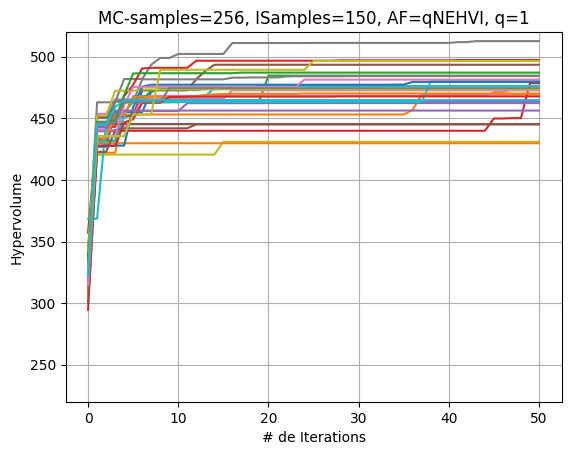

In [18]:
iters = np.arange(51)

for i in range(30):

    plt.errorbar(iters, np.asarray(hvsf27yexp13[i]), linewidth=1.5,label='%i' %i)
    plt.xlabel('# de Iterations')
    plt.ylabel('Hypervolume')
    plt.title('MC-samples=256, ISamples=150, AF=qNEHVI, q=1')
plt.grid()
plt.ylim([220,520])
plt.savefig('Exp13-27July')

In [19]:
%store BDs27yexp13
%store hvsf27yexp13
%store trainxall27yexp13
%store trainobjall27yexp13
%store numbd27yexp13

Stored 'BDs27yexp13' (list)
Stored 'hvsf27yexp13' (list)
Stored 'trainxall27yexp13' (list)
Stored 'trainobjall27yexp13' (list)
Stored 'numbd27yexp13' (list)


In [55]:
BDs27yexp14=[]
hvsf27yexp14=[]
trainxall27yexp14=[]
trainobjall27yexp14=[]
numbd27yexp14=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    seed = np.random.randint(0, 1000)
    print(f"Seed: {seed}")
    np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=110)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(seed))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp14.append(bd.pareto_Y)      
    hvsf27yexp14.append(hvs_ehvi)   
    trainxall27yexp14.append(train_x_ehvi)
    trainobjall27yexp14.append(train_obj_ehvi)
    numbd27yexp14.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]

Seed: 269


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 430.0283 #Paprox=25 time = 29.31 Lysine= 0.9501 Energy= 14.4669 Costs= 146.5161)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 430.0283 #Paprox=25 time = 29.00 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 460.4007 #Paprox=26 time = 32.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 474.6864 #Paprox=27 time = 34.88 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 474.8926 #Paprox=25 time = 29.39 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 26.35 Lysine= 1.1278 Energy= 14.1486 Costs= 150.3069)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 28.59 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 29.38 Lysine= 1.4667 Energy= 14.0010 Costs= 162.5498)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 32.83 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 28.80 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 30.29 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 29.92 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 30.39 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 32.07 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 29.38 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 29.83 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 34.61 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 29.94 Lysine= 1.4681 Energy= 14.0010 Costs= 162.6580)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 31.49 Lysine= 1.4486 Energy= 14.0010 Costs= 162.2945)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 30.51 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 29.51 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 27.94 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 33.36 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 30.22 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 28.06 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 31.63 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 39.76 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 29.84 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 30.14 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 30.16 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 30.07 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 28.56 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 30.51 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 36.46 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 31.51 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 44.60 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 36.44 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 41.39 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 33.42 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 30.65 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 31.62 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 31.57 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 29.62 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 30.54 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 33.13 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 33.67 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 29.84 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 30.78 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 30.64 Lysine= 1.4409 Energy= 14.0010 Costs= 162.1511)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▎                                     | 1/30 [26:16<12:42:05, 1576.73s/it]


Batch 50: Hypervolume (qNEHVI) = 474.9325 #Paprox=26 time = 29.96 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)Seed: 221


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 435.3139 #Paprox=21 time = 28.87 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 435.3139 #Paprox=21 time = 29.53 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 435.4647 #Paprox=22 time = 29.29 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 454.3413 #Paprox=23 time = 29.30 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 470.5794 #Paprox=24 time = 29.05 Lysine= 1.1604 Energy= 14.0010 Costs= 149.6270)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 472.7139 #Paprox=23 time = 29.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 472.7139 #Paprox=24 time = 25.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 472.7139 #Paprox=25 time = 26.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 472.7139 #Paprox=26 time = 27.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 472.7139 #Paprox=27 time = 27.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 472.7139 #Paprox=28 time = 29.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 472.7139 #Paprox=29 time = 30.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 472.7139 #Paprox=30 time = 39.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 472.7139 #Paprox=31 time = 28.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 472.7139 #Paprox=32 time = 31.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 472.7139 #Paprox=33 time = 28.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 472.7139 #Paprox=34 time = 32.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 472.7139 #Paprox=35 time = 28.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 472.7139 #Paprox=36 time = 29.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 472.7139 #Paprox=37 time = 28.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 472.7139 #Paprox=38 time = 33.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 472.7139 #Paprox=39 time = 29.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 472.7139 #Paprox=40 time = 30.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 472.7139 #Paprox=40 time = 31.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.7139 #Paprox=40 time = 28.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 472.7139 #Paprox=41 time = 38.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 472.7139 #Paprox=42 time = 29.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 472.7139 #Paprox=43 time = 29.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 472.7139 #Paprox=44 time = 31.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 472.7139 #Paprox=44 time = 32.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 472.7139 #Paprox=45 time = 33.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 472.7139 #Paprox=46 time = 33.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 472.7139 #Paprox=47 time = 32.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 472.7139 #Paprox=48 time = 39.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 472.7139 #Paprox=49 time = 32.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 472.7139 #Paprox=50 time = 34.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 472.7139 #Paprox=51 time = 34.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 472.7139 #Paprox=52 time = 30.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 472.7139 #Paprox=53 time = 30.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 472.7139 #Paprox=54 time = 30.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 472.7139 #Paprox=55 time = 34.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 472.7139 #Paprox=56 time = 33.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 472.7139 #Paprox=56 time = 35.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 472.7139 #Paprox=57 time = 34.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 472.7139 #Paprox=58 time = 41.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 472.7139 #Paprox=57 time = 45.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 472.7139 #Paprox=57 time = 33.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 472.7139 #Paprox=58 time = 34.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 472.7139 #Paprox=58 time = 33.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▌                                    | 2/30 [52:51<12:20:47, 1587.40s/it]


Batch 50: Hypervolume (qNEHVI) = 472.7139 #Paprox=59 time = 32.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 239


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 430.8270 #Paprox=25 time = 31.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 430.8270 #Paprox=25 time = 33.46 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 461.8821 #Paprox=26 time = 37.42 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 476.6136 #Paprox=27 time = 38.02 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 476.6136 #Paprox=28 time = 30.40 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 476.6136 #Paprox=29 time = 31.48 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 476.6136 #Paprox=29 time = 31.57 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 476.6136 #Paprox=30 time = 33.54 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 476.6136 #Paprox=31 time = 35.20 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 476.6136 #Paprox=32 time = 29.40 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.6136 #Paprox=33 time = 31.55 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 476.6136 #Paprox=34 time = 31.19 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 476.6136 #Paprox=35 time = 30.57 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 476.6136 #Paprox=36 time = 30.34 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 476.6136 #Paprox=37 time = 30.16 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 476.6136 #Paprox=38 time = 31.33 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 476.6136 #Paprox=39 time = 29.97 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 476.6136 #Paprox=40 time = 29.64 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 476.6136 #Paprox=41 time = 33.65 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 476.6136 #Paprox=41 time = 35.05 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 476.6136 #Paprox=41 time = 29.75 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 476.6136 #Paprox=42 time = 30.21 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 476.6136 #Paprox=43 time = 29.78 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 476.6136 #Paprox=43 time = 33.54 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 476.6136 #Paprox=44 time = 30.03 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 476.6136 #Paprox=44 time = 31.59 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 476.6136 #Paprox=44 time = 30.77 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 476.6136 #Paprox=44 time = 30.21 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 476.6136 #Paprox=45 time = 29.64 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 476.6136 #Paprox=46 time = 30.25 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 476.6136 #Paprox=47 time = 30.45 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 476.6136 #Paprox=47 time = 30.97 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 476.6136 #Paprox=47 time = 30.87 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 476.6136 #Paprox=48 time = 32.74 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 476.6136 #Paprox=49 time = 33.48 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 476.6136 #Paprox=50 time = 31.61 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 476.6136 #Paprox=51 time = 26.94 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 476.6136 #Paprox=52 time = 27.09 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 476.6136 #Paprox=52 time = 27.64 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 476.6136 #Paprox=53 time = 28.44 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 476.6136 #Paprox=54 time = 27.99 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 476.6136 #Paprox=54 time = 27.25 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 476.6136 #Paprox=55 time = 27.41 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 476.6136 #Paprox=56 time = 27.91 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 476.6136 #Paprox=56 time = 27.46 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 476.6136 #Paprox=57 time = 28.10 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 476.6136 #Paprox=57 time = 28.85 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 476.6136 #Paprox=56 time = 28.45 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 476.6136 #Paprox=57 time = 28.29 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|███▋                                 | 3/30 [1:18:25<11:43:24, 1563.14s/it]


Batch 50: Hypervolume (qNEHVI) = 476.6136 #Paprox=58 time = 28.37 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)Seed: 987

Batch  1: Hypervolume (qNEHVI) = 426.4311 #Paprox=16 time = 20.90 Lysine= 0.9501 Energy= 14.3945 Costs= 145.7070)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 426.4311 #Paprox=16 time = 19.94 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 443.5305 #Paprox=17 time = 20.84 Lysine= 1.1144 Energy= 14.0010 Costs= 147.9483)
Batch  4: Hypervolume (qNEHVI) = 443.5305 #Paprox=17 time = 21.50 Lysine= 1.2137 Energy= 14.0010 Costs= 161.4267)
Batch  5: Hypervolume (qNEHVI) = 443.5305 #Paprox=18 time = 23.32 Lysine= 1.1144 Energy= 14.0010 Costs= 147.9483)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 471.9175 #Paprox=19 time = 22.66 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 472.0754 #Paprox=20 time = 20.96 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 475.4575 #Paprox=21 time = 21.38 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 475.6822 #Paprox=22 time = 22.55 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 475.6822 #Paprox=23 time = 21.29 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 475.6902 #Paprox=24 time = 25.69 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 475.6902 #Paprox=25 time = 25.12 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 475.6902 #Paprox=25 time = 22.00 Lysine= 1.4121 Energy= 14.0010 Costs= 164.9982)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 475.6902 #Paprox=26 time = 21.70 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 475.6902 #Paprox=27 time = 22.25 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 475.6902 #Paprox=28 time = 23.00 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 476.7453 #Paprox=29 time = 24.30 Lysine= 1.4368 Energy= 14.0010 Costs= 166.2715)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 476.7453 #Paprox=29 time = 23.16 Lysine= 1.4135 Energy= 14.0010 Costs= 165.3042)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 476.7453 #Paprox=30 time = 23.35 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 476.7453 #Paprox=30 time = 23.56 Lysine= 1.4120 Energy= 14.0010 Costs= 164.9528)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 476.7453 #Paprox=31 time = 24.40 Lysine= 1.4368 Energy= 14.0010 Costs= 166.2715)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 476.7453 #Paprox=31 time = 23.72 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 476.7453 #Paprox=31 time = 26.66 Lysine= 1.4129 Energy= 14.0010 Costs= 165.1898)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 476.7453 #Paprox=32 time = 24.48 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 476.7453 #Paprox=32 time = 24.32 Lysine= 1.1393 Energy= 14.0010 Costs= 152.9884)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 476.7453 #Paprox=33 time = 23.50 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 476.7453 #Paprox=33 time = 22.75 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 476.7453 #Paprox=33 time = 24.61 Lysine= 1.1263 Energy= 14.0010 Costs= 152.7529)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 476.7453 #Paprox=33 time = 26.82 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 476.7453 #Paprox=34 time = 24.42 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 476.7453 #Paprox=35 time = 26.11 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 476.7453 #Paprox=36 time = 26.86 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 476.7453 #Paprox=37 time = 26.62 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 476.7453 #Paprox=37 time = 27.26 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 476.7453 #Paprox=37 time = 25.11 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 476.7453 #Paprox=37 time = 24.54 Lysine= 1.1715 Energy= 14.0010 Costs= 160.5921)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 476.7453 #Paprox=38 time = 23.30 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 476.7453 #Paprox=38 time = 27.31 Lysine= 1.1715 Energy= 14.0010 Costs= 160.5921)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 476.7453 #Paprox=39 time = 25.37 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 476.7453 #Paprox=38 time = 27.99 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 476.7453 #Paprox=38 time = 25.39 Lysine= 1.1715 Energy= 14.0010 Costs= 160.5921)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 476.7453 #Paprox=38 time = 25.29 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 476.7453 #Paprox=39 time = 25.69 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 476.7453 #Paprox=39 time = 25.96 Lysine= 1.4151 Energy= 14.0010 Costs= 165.9117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 476.7453 #Paprox=40 time = 28.49 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 476.7453 #Paprox=40 time = 27.55 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 476.7453 #Paprox=40 time = 30.18 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 476.7453 #Paprox=40 time = 30.13 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 476.7453 #Paprox=40 time = 26.79 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|████▉                                | 4/30 [1:38:55<10:20:21, 1431.58s/it]


Batch 50: Hypervolume (qNEHVI) = 476.7453 #Paprox=41 time = 27.01 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)Seed: 392


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 425.9629 #Paprox=22 time = 29.59 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 425.9629 #Paprox=22 time = 26.52 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 425.9629 #Paprox=23 time = 24.85 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 425.9629 #Paprox=24 time = 25.40 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 425.9629 #Paprox=25 time = 26.72 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 425.9629 #Paprox=26 time = 26.37 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 425.9629 #Paprox=26 time = 25.46 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 457.0181 #Paprox=27 time = 26.62 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 457.0181 #Paprox=28 time = 25.00 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 457.0185 #Paprox=29 time = 26.04 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 457.0185 #Paprox=30 time = 19.22 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 457.0185 #Paprox=31 time = 19.40 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 457.0185 #Paprox=32 time = 17.44 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 457.0185 #Paprox=33 time = 17.20 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 457.0185 #Paprox=34 time = 17.50 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 457.0185 #Paprox=35 time = 17.71 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 457.0185 #Paprox=36 time = 18.09 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 457.0185 #Paprox=37 time = 15.93 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 457.0185 #Paprox=38 time = 15.09 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 457.0185 #Paprox=39 time = 14.90 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 457.0185 #Paprox=40 time = 15.71 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 457.0185 #Paprox=41 time = 14.78 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 457.0185 #Paprox=42 time = 14.33 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 457.0185 #Paprox=43 time = 15.07 Lysine= 1.2698 Energy= 14.2886 Costs= 156.7464)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 457.0185 #Paprox=44 time = 13.80 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 474.0286 #Paprox=45 time = 13.57 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 479.5942 #Paprox=46 time = 13.75 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 479.5942 #Paprox=46 time = 13.63 Lysine= 1.1511 Energy= 14.0010 Costs= 164.4695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 479.5942 #Paprox=46 time = 14.20 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 479.5942 #Paprox=46 time = 13.72 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 13.95 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 13.96 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 14.92 Lysine= 0.9501 Energy= 14.0010 Costs= 154.0005)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 14.40 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 16.01 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 18.08 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 17.09 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 17.21 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 17.19 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 15.13 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 16.67 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 15.26 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 16.30 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 16.63 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 15.97 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 16.91 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 15.77 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 15.50 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 15.32 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▎                               | 5/30 [1:53:54<8:36:22, 1239.32s/it]


Batch 50: Hypervolume (qNEHVI) = 482.1234 #Paprox=47 time = 16.57 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)Seed: 995


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 446.5009 #Paprox=21 time = 22.97 Lysine= 0.9501 Energy= 14.3909 Costs= 145.6585)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 446.5009 #Paprox=21 time = 22.00 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 446.6867 #Paprox=22 time = 22.70 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 446.6868 #Paprox=23 time = 22.85 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 465.5576 #Paprox=24 time = 23.33 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 465.5576 #Paprox=24 time = 24.73 Lysine= 1.2342 Energy= 14.0010 Costs= 156.8458)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 480.4181 #Paprox=25 time = 22.78 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 480.6175 #Paprox=25 time = 22.87 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 22.00 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.04 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 24.79 Lysine= 1.4135 Energy= 14.0010 Costs= 165.7238)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 22.67 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 22.81 Lysine= 1.4368 Energy= 14.0010 Costs= 166.2715)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 24.71 Lysine= 1.4121 Energy= 14.0010 Costs= 165.0347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 24.19 Lysine= 1.4085 Energy= 14.0010 Costs= 162.3964)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 24.97 Lysine= 1.4177 Energy= 14.0010 Costs= 166.4857)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 23.40 Lysine= 1.4368 Energy= 14.0010 Costs= 166.2715)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 24.24 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 24.09 Lysine= 1.4109 Energy= 14.0010 Costs= 164.1659)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.02 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 28.51 Lysine= 1.4134 Energy= 14.0010 Costs= 165.7075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 24.99 Lysine= 1.4078 Energy= 14.0010 Costs= 161.8975)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.19 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.66 Lysine= 1.4154 Energy= 14.0010 Costs= 165.0874)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 24.37 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 23.98 Lysine= 1.4244 Energy= 14.0010 Costs= 164.3050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 26.15 Lysine= 1.4206 Energy= 14.0010 Costs= 163.1998)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 24.34 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.84 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.52 Lysine= 1.4284 Energy= 14.0010 Costs= 165.4597)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 24.88 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.58 Lysine= 1.4216 Energy= 14.0010 Costs= 163.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.00 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 24.49 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.42 Lysine= 1.4235 Energy= 14.0010 Costs= 164.0434)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.09 Lysine= 1.4159 Energy= 14.0010 Costs= 161.8541)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.75 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 24.86 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.71 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.83 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 26.41 Lysine= 1.4219 Energy= 14.0010 Costs= 163.5944)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 26.58 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.91 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.89 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.99 Lysine= 1.4176 Energy= 14.0010 Costs= 166.4833)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 26.09 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.73 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.54 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 25.79 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|███████▌                              | 6/30 [2:14:37<8:16:13, 1240.55s/it]


Batch 50: Hypervolume (qNEHVI) = 483.5119 #Paprox=26 time = 27.77 Lysine= 1.4339 Energy= 14.0010 Costs= 167.0617)Seed: 103

Batch  1: Hypervolume (qNEHVI) = 433.3725 #Paprox=14 time = 23.73 Lysine= 0.9501 Energy= 14.4701 Costs= 146.5513)
Batch  2: Hypervolume (qNEHVI) = 433.3725 #Paprox=14 time = 23.00 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 459.4812 #Paprox=15 time = 23.21 Lysine= 1.0151 Energy= 14.0010 Costs= 145.2404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 459.4812 #Paprox=15 time = 24.08 Lysine= 1.2342 Energy= 14.0010 Costs= 156.8458)
Batch  5: Hypervolume (qNEHVI) = 466.0114 #Paprox=16 time = 23.77 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 468.5736 #Paprox=17 time = 23.88 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 468.5736 #Paprox=17 time = 24.54 Lysine= 1.1707 Energy= 14.0010 Costs= 173.4115)
Batch  8: Hypervolume (qNEHVI) = 468.5736 #Paprox=17 time = 24.76 Lysine= 1.2123 Energy= 14.0010 Costs= 160.7608)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 468.9110 #Paprox=18 time = 24.72 Lysine= 1.0897 Energy= 14.0010 Costs= 149.4682)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 468.9110 #Paprox=18 time = 26.16 Lysine= 1.1856 Energy= 14.0010 Costs= 158.8169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 468.9110 #Paprox=18 time = 24.79 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 468.9110 #Paprox=18 time = 21.08 Lysine= 1.1856 Energy= 14.0010 Costs= 158.8169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 473.0347 #Paprox=18 time = 20.55 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 491.6143 #Paprox=19 time = 17.26 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 497.4106 #Paprox=20 time = 17.80 Lysine= 1.3731 Energy= 14.0010 Costs= 152.8905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 497.4106 #Paprox=21 time = 17.42 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 497.4106 #Paprox=22 time = 17.17 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 497.4106 #Paprox=22 time = 18.29 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 497.4106 #Paprox=23 time = 18.65 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 497.4106 #Paprox=23 time = 18.37 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 497.4106 #Paprox=23 time = 18.13 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 497.4106 #Paprox=23 time = 18.64 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 497.4106 #Paprox=23 time = 18.54 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 497.4106 #Paprox=24 time = 16.21 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 497.4106 #Paprox=24 time = 16.58 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 497.4106 #Paprox=24 time = 16.37 Lysine= 1.2696 Energy= 14.2889 Costs= 156.7506)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 497.4106 #Paprox=25 time = 15.08 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 497.4106 #Paprox=25 time = 14.92 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 497.4106 #Paprox=26 time = 13.46 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 497.4106 #Paprox=27 time = 15.56 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 497.4106 #Paprox=27 time = 14.62 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 497.4115 #Paprox=28 time = 14.64 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 497.4115 #Paprox=29 time = 12.92 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 497.4115 #Paprox=30 time = 12.07 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 497.4115 #Paprox=31 time = 11.43 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 497.4115 #Paprox=32 time = 11.55 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 497.4115 #Paprox=32 time = 12.00 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 497.4115 #Paprox=32 time = 10.77 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 497.4115 #Paprox=33 time = 11.64 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 497.4115 #Paprox=33 time = 11.95 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 497.4115 #Paprox=34 time = 11.71 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 497.4115 #Paprox=35 time = 12.12 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 497.4115 #Paprox=35 time = 11.86 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 497.4115 #Paprox=36 time = 12.09 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 497.4115 #Paprox=36 time = 11.46 Lysine= 1.2335 Energy= 14.0010 Costs= 154.4300)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 497.4115 #Paprox=36 time = 11.38 Lysine= 1.2335 Energy= 14.0010 Costs= 154.4300)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 497.4115 #Paprox=36 time = 11.89 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 497.4115 #Paprox=36 time = 13.38 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 497.4115 #Paprox=36 time = 11.91 Lysine= 1.2441 Energy= 14.0010 Costs= 154.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 23%|████████▊                             | 7/30 [2:28:38<7:05:29, 1110.00s/it]


Batch 50: Hypervolume (qNEHVI) = 497.4115 #Paprox=37 time = 11.58 Lysine= 1.2480 Energy= 14.2946 Costs= 156.2820)Seed: 741


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 438.4619 #Paprox=13 time = 22.94 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 438.4619 #Paprox=13 time = 24.02 Lysine= 1.2645 Energy= 14.0772 Costs= 164.8840)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 454.5814 #Paprox=14 time = 22.87 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3118)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.5314 #Paprox=12 time = 23.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.5314 #Paprox=12 time = 20.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.5314 #Paprox=13 time = 21.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.5314 #Paprox=14 time = 21.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 456.5314 #Paprox=15 time = 21.87 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 456.5314 #Paprox=16 time = 22.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 456.5314 #Paprox=17 time = 21.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 456.5314 #Paprox=18 time = 22.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 456.5314 #Paprox=19 time = 22.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 456.5314 #Paprox=20 time = 23.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 456.5314 #Paprox=21 time = 22.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 456.5314 #Paprox=22 time = 23.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 456.5314 #Paprox=23 time = 23.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 456.5314 #Paprox=24 time = 23.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 456.5314 #Paprox=24 time = 23.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 456.5314 #Paprox=25 time = 23.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 456.5314 #Paprox=26 time = 23.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 456.5314 #Paprox=27 time = 23.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 456.5314 #Paprox=28 time = 23.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 456.5314 #Paprox=28 time = 24.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 456.5314 #Paprox=28 time = 23.87 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 456.5314 #Paprox=29 time = 23.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 456.5314 #Paprox=30 time = 24.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 456.5314 #Paprox=31 time = 24.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 456.5314 #Paprox=32 time = 24.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 456.5314 #Paprox=33 time = 24.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 456.5314 #Paprox=33 time = 24.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 24.51 Lysine= 1.1111 Energy= 14.3889 Costs= 150.9021)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 24.48 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 24.85 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 24.92 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 24.72 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 24.46 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 24.39 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 26.10 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 25.48 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 24.20 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 24.66 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 24.60 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 25.34 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 24.50 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 25.48 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 25.19 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 25.08 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 24.73 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 25.19 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 27%|██████████▏                           | 8/30 [2:48:32<6:56:50, 1136.85s/it]


Batch 50: Hypervolume (qNEHVI) = 456.6362 #Paprox=34 time = 24.96 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)Seed: 412


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 443.0306 #Paprox=20 time = 23.06 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 443.0306 #Paprox=20 time = 24.14 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 461.9072 #Paprox=21 time = 23.75 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 461.9072 #Paprox=21 time = 24.00 Lysine= 1.2051 Energy= 14.0010 Costs= 157.7905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 461.9072 #Paprox=21 time = 23.77 Lysine= 1.1705 Energy= 14.0010 Costs= 156.2058)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 461.9454 #Paprox=22 time = 23.65 Lysine= 1.1376 Energy= 14.0010 Costs= 155.8115)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 461.9454 #Paprox=23 time = 23.66 Lysine= 1.1376 Energy= 14.0010 Costs= 155.8115)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 461.9454 #Paprox=24 time = 22.90 Lysine= 1.1376 Energy= 14.0010 Costs= 155.8115)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 462.1189 #Paprox=23 time = 23.61 Lysine= 1.2033 Energy= 14.0010 Costs= 155.7469)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 462.1189 #Paprox=23 time = 23.46 Lysine= 1.1589 Energy= 14.0010 Costs= 157.1124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 464.1107 #Paprox=24 time = 23.64 Lysine= 1.1704 Energy= 14.0010 Costs= 154.5497)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 464.1107 #Paprox=24 time = 23.90 Lysine= 1.1681 Energy= 14.0010 Costs= 154.6427)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 464.1107 #Paprox=24 time = 24.51 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4312)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 473.1332 #Paprox=25 time = 23.63 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 473.1332 #Paprox=25 time = 24.36 Lysine= 0.9501 Energy= 14.0010 Costs= 154.0005)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 473.1332 #Paprox=25 time = 24.27 Lysine= 1.6358 Energy= 14.0010 Costs= 191.5642)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 477.5491 #Paprox=26 time = 23.76 Lysine= 1.0036 Energy= 14.3234 Costs= 148.2372)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 479.5244 #Paprox=27 time = 24.43 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 479.5261 #Paprox=28 time = 23.86 Lysine= 0.9884 Energy= 14.3350 Costs= 152.1533)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 479.5261 #Paprox=29 time = 23.75 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 479.5261 #Paprox=29 time = 23.86 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 480.7270 #Paprox=30 time = 24.53 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 480.7270 #Paprox=31 time = 24.29 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 480.7270 #Paprox=32 time = 24.85 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 480.7270 #Paprox=33 time = 24.79 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 480.7270 #Paprox=33 time = 24.85 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 480.7270 #Paprox=34 time = 24.98 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 480.7270 #Paprox=34 time = 25.27 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 480.7270 #Paprox=34 time = 24.83 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 480.7270 #Paprox=35 time = 25.25 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 480.7270 #Paprox=36 time = 27.25 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 480.7270 #Paprox=37 time = 25.81 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 480.7270 #Paprox=38 time = 25.70 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 480.7270 #Paprox=39 time = 27.32 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 480.7270 #Paprox=40 time = 25.39 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 480.7270 #Paprox=41 time = 25.68 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4790)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 480.7270 #Paprox=42 time = 26.03 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 480.7270 #Paprox=43 time = 25.79 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 480.7270 #Paprox=44 time = 25.35 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 480.7270 #Paprox=44 time = 26.46 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 480.7270 #Paprox=45 time = 26.95 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 480.7270 #Paprox=46 time = 26.53 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 480.7270 #Paprox=47 time = 26.60 Lysine= 0.9884 Energy= 14.3350 Costs= 152.1533)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 480.7270 #Paprox=48 time = 26.45 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4790)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 480.7270 #Paprox=49 time = 25.88 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 480.7270 #Paprox=49 time = 26.71 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 480.7270 #Paprox=50 time = 25.98 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 480.7270 #Paprox=50 time = 25.89 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 480.7270 #Paprox=50 time = 27.08 Lysine= 1.0570 Energy= 14.0010 Costs= 151.4791)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 30%|███████████▍                          | 9/30 [3:09:24<6:50:27, 1172.75s/it]


Batch 50: Hypervolume (qNEHVI) = 480.7270 #Paprox=51 time = 27.68 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)Seed: 959


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 431.1310 #Paprox=20 time = 22.20 Lysine= 0.9501 Energy= 14.4424 Costs= 146.2463)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 431.1310 #Paprox=20 time = 21.95 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 457.8855 #Paprox=21 time = 22.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 457.8855 #Paprox=21 time = 22.17 Lysine= 1.2139 Energy= 14.0010 Costs= 169.2052)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 458.0252 #Paprox=22 time = 22.61 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 458.0252 #Paprox=23 time = 22.45 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 458.0252 #Paprox=24 time = 22.85 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 458.0252 #Paprox=25 time = 22.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 458.0252 #Paprox=26 time = 22.81 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 458.0252 #Paprox=27 time = 23.15 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 458.0252 #Paprox=28 time = 23.68 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 458.0252 #Paprox=29 time = 23.99 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 458.0252 #Paprox=30 time = 24.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 458.0252 #Paprox=31 time = 23.99 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 458.0252 #Paprox=32 time = 23.26 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 458.0252 #Paprox=33 time = 23.96 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 458.0252 #Paprox=34 time = 24.57 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 458.0252 #Paprox=35 time = 23.50 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 458.0252 #Paprox=36 time = 23.64 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 458.0252 #Paprox=37 time = 24.33 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 458.0252 #Paprox=38 time = 25.77 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 458.0252 #Paprox=39 time = 25.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 458.0252 #Paprox=36 time = 25.13 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 458.0252 #Paprox=37 time = 24.95 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 458.0252 #Paprox=37 time = 25.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 458.0252 #Paprox=38 time = 24.71 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 458.0252 #Paprox=39 time = 23.98 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 458.0252 #Paprox=40 time = 24.07 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 458.0252 #Paprox=40 time = 24.25 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 458.0252 #Paprox=40 time = 24.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 458.0252 #Paprox=41 time = 25.40 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 458.0252 #Paprox=41 time = 24.61 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 458.0252 #Paprox=42 time = 25.49 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 458.0252 #Paprox=42 time = 25.34 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 458.0252 #Paprox=43 time = 25.04 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 458.0252 #Paprox=43 time = 24.47 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 458.0252 #Paprox=44 time = 26.76 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 458.0252 #Paprox=45 time = 24.80 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 458.0252 #Paprox=45 time = 27.53 Lysine= 0.9501 Energy= 14.4429 Costs= 151.9663)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 458.0252 #Paprox=46 time = 26.88 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 458.0252 #Paprox=47 time = 27.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 458.0252 #Paprox=48 time = 29.20 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 458.0252 #Paprox=49 time = 27.35 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 458.0252 #Paprox=49 time = 28.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 458.0252 #Paprox=50 time = 28.97 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 458.0252 #Paprox=50 time = 26.86 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 458.0252 #Paprox=51 time = 25.58 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 458.0252 #Paprox=52 time = 26.45 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 458.0252 #Paprox=52 time = 26.08 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|████████████▎                        | 10/30 [3:30:08<6:38:18, 1194.94s/it]


Batch 50: Hypervolume (qNEHVI) = 458.0252 #Paprox=53 time = 27.89 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)Seed: 268


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 434.4619 #Paprox=14 time = 19.50 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 434.4619 #Paprox=14 time = 19.76 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 465.5170 #Paprox=15 time = 19.82 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 465.7553 #Paprox=16 time = 21.13 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 465.7553 #Paprox=16 time = 21.43 Lysine= 1.2411 Energy= 14.0010 Costs= 172.2867)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 465.7695 #Paprox=17 time = 21.43 Lysine= 0.9501 Energy= 14.4725 Costs= 146.5822)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 465.7695 #Paprox=18 time = 20.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 465.7695 #Paprox=19 time = 20.53 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 465.7695 #Paprox=20 time = 20.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 466.1586 #Paprox=21 time = 19.83 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 466.1586 #Paprox=22 time = 20.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 466.1586 #Paprox=23 time = 21.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 466.1586 #Paprox=24 time = 20.66 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 466.1586 #Paprox=25 time = 22.33 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 466.1586 #Paprox=26 time = 22.23 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 466.1586 #Paprox=27 time = 20.91 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 466.1586 #Paprox=28 time = 20.82 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 466.1586 #Paprox=29 time = 21.02 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 466.1586 #Paprox=30 time = 21.31 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 466.1586 #Paprox=31 time = 21.59 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 466.1586 #Paprox=32 time = 21.29 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 466.1586 #Paprox=33 time = 21.37 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 466.1586 #Paprox=34 time = 21.76 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 466.1586 #Paprox=35 time = 21.37 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 466.1586 #Paprox=36 time = 21.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 466.1586 #Paprox=37 time = 22.06 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 466.1586 #Paprox=38 time = 21.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 466.1586 #Paprox=39 time = 21.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 466.1586 #Paprox=40 time = 21.82 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 466.2686 #Paprox=41 time = 21.83 Lysine= 0.9501 Energy= 14.5000 Costs= 149.2228)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 466.2686 #Paprox=42 time = 22.40 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 466.2686 #Paprox=43 time = 22.65 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 466.2686 #Paprox=44 time = 22.49 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 466.2686 #Paprox=45 time = 22.60 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 466.2686 #Paprox=46 time = 24.27 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 466.2686 #Paprox=47 time = 25.17 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 466.2686 #Paprox=48 time = 25.39 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 466.2686 #Paprox=49 time = 23.63 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 466.2698 #Paprox=50 time = 22.93 Lysine= 0.9501 Energy= 14.4994 Costs= 148.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 466.3702 #Paprox=51 time = 22.89 Lysine= 0.9501 Energy= 14.5057 Costs= 151.6075)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 466.3702 #Paprox=51 time = 24.01 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 466.3702 #Paprox=52 time = 25.39 Lysine= 0.9501 Energy= 14.4799 Costs= 151.2197)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 466.3702 #Paprox=52 time = 23.68 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 466.3702 #Paprox=52 time = 24.64 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 466.3702 #Paprox=52 time = 24.23 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 466.3702 #Paprox=52 time = 23.35 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 466.3702 #Paprox=52 time = 25.73 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 466.3702 #Paprox=52 time = 26.42 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 466.3702 #Paprox=52 time = 26.26 Lysine= 0.9501 Energy= 14.4763 Costs= 151.1651)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 37%|█████████████▌                       | 11/30 [3:48:47<6:10:58, 1171.51s/it]


Batch 50: Hypervolume (qNEHVI) = 466.3702 #Paprox=52 time = 25.41 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)Seed: 699


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 433.2711 #Paprox=16 time = 22.97 Lysine= 0.9501 Energy= 14.3966 Costs= 145.7386)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 433.2711 #Paprox=16 time = 24.33 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 453.2165 #Paprox=17 time = 24.16 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 453.2165 #Paprox=17 time = 24.58 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 454.8529 #Paprox=18 time = 23.59 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 454.8529 #Paprox=19 time = 24.28 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 454.8529 #Paprox=20 time = 24.66 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 454.8529 #Paprox=21 time = 24.26 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 455.8063 #Paprox=22 time = 24.30 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 455.8063 #Paprox=23 time = 24.36 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 455.8063 #Paprox=24 time = 25.01 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 464.3423 #Paprox=25 time = 24.93 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 464.3423 #Paprox=26 time = 24.67 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 464.3423 #Paprox=27 time = 24.86 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 464.3423 #Paprox=28 time = 25.41 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 464.3423 #Paprox=29 time = 25.25 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 464.3423 #Paprox=29 time = 27.13 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 464.3423 #Paprox=29 time = 25.23 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 464.3423 #Paprox=30 time = 25.80 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 464.3423 #Paprox=31 time = 25.40 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 464.3423 #Paprox=31 time = 26.38 Lysine= 1.1484 Energy= 14.0010 Costs= 154.3121)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 464.3423 #Paprox=31 time = 25.42 Lysine= 1.1481 Energy= 14.0010 Costs= 154.3146)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 473.4769 #Paprox=32 time = 25.94 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 473.4769 #Paprox=33 time = 25.53 Lysine= 0.9501 Energy= 14.0010 Costs= 144.8298)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 473.4769 #Paprox=34 time = 26.03 Lysine= 0.9501 Energy= 14.0010 Costs= 144.8298)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 473.4769 #Paprox=35 time = 26.51 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 473.4769 #Paprox=36 time = 25.71 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 474.7136 #Paprox=34 time = 25.66 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 474.9283 #Paprox=29 time = 24.64 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 24.92 Lysine= 1.1001 Energy= 14.0010 Costs= 148.7131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 28.11 Lysine= 1.4139 Energy= 14.0010 Costs= 165.9672)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 26.20 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 26.70 Lysine= 1.4368 Energy= 14.0010 Costs= 166.2715)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 27.35 Lysine= 1.4121 Energy= 14.0010 Costs= 165.0347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 28.66 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 26.77 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 28.62 Lysine= 1.4144 Energy= 14.0010 Costs= 165.4881)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 26.97 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 27.36 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 26.83 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 27.08 Lysine= 1.4177 Energy= 14.0010 Costs= 166.4857)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 27.62 Lysine= 1.4139 Energy= 14.0010 Costs= 165.9691)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 28.45 Lysine= 1.4145 Energy= 14.0010 Costs= 165.9630)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 28.01 Lysine= 1.4139 Energy= 14.0010 Costs= 165.9691)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 26.83 Lysine= 1.4139 Energy= 14.0010 Costs= 165.9691)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 28.41 Lysine= 1.4139 Energy= 14.0010 Costs= 165.9691)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 27.90 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 29.64 Lysine= 1.4072 Energy= 14.0010 Costs= 161.1783)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 28.10 Lysine= 1.4127 Energy= 14.0010 Costs= 165.3072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 40%|██████████████▊                      | 12/30 [4:10:33<6:03:44, 1212.47s/it]


Batch 50: Hypervolume (qNEHVI) = 474.9283 #Paprox=30 time = 27.08 Lysine= 1.4166 Energy= 14.0010 Costs= 165.9435)Seed: 111


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 440.6620 #Paprox=9 time = 23.18 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 440.6620 #Paprox=9 time = 23.89 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 440.6620 #Paprox=9 time = 23.88 Lysine= 1.2342 Energy= 14.0010 Costs= 156.8458)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 440.6620 #Paprox=9 time = 23.55 Lysine= 1.2618 Energy= 14.0010 Costs= 169.5606)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 459.5386 #Paprox=10 time = 23.52 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 459.5386 #Paprox=10 time = 24.02 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 459.5386 #Paprox=11 time = 19.12 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 459.5389 #Paprox=12 time = 19.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 459.5694 #Paprox=13 time = 19.55 Lysine= 0.9501 Energy= 14.3940 Costs= 146.1382)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 459.7166 #Paprox=14 time = 19.89 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 459.7166 #Paprox=15 time = 19.59 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 459.7166 #Paprox=16 time = 19.18 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 459.7166 #Paprox=17 time = 19.94 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 459.7166 #Paprox=18 time = 19.43 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 459.8173 #Paprox=19 time = 19.65 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 459.8173 #Paprox=20 time = 20.41 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 459.8173 #Paprox=21 time = 20.05 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 459.8173 #Paprox=21 time = 20.34 Lysine= 0.9501 Energy= 14.3348 Costs= 151.0668)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 459.8173 #Paprox=21 time = 20.48 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 459.8173 #Paprox=22 time = 20.53 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 459.8173 #Paprox=23 time = 20.79 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 459.8173 #Paprox=24 time = 20.10 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 459.8173 #Paprox=25 time = 20.83 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 459.8173 #Paprox=26 time = 20.45 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 459.8173 #Paprox=27 time = 20.71 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 459.8173 #Paprox=27 time = 21.18 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 459.8173 #Paprox=28 time = 21.10 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 460.0280 #Paprox=29 time = 21.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 460.0280 #Paprox=30 time = 21.07 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 460.0280 #Paprox=31 time = 22.21 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 460.0280 #Paprox=32 time = 22.02 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 460.0280 #Paprox=33 time = 22.08 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 460.0280 #Paprox=34 time = 21.39 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 460.0280 #Paprox=35 time = 21.76 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 460.0280 #Paprox=36 time = 21.46 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 460.0280 #Paprox=37 time = 22.38 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 460.0280 #Paprox=38 time = 21.76 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 460.0280 #Paprox=38 time = 22.63 Lysine= 0.9501 Energy= 14.3889 Costs= 152.1810)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 460.0280 #Paprox=38 time = 22.21 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 460.0280 #Paprox=39 time = 21.99 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 460.0280 #Paprox=40 time = 22.17 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 460.0280 #Paprox=41 time = 23.12 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 460.0280 #Paprox=42 time = 23.97 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 460.0280 #Paprox=43 time = 23.23 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 460.0280 #Paprox=44 time = 22.99 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 460.0280 #Paprox=45 time = 22.86 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 460.0280 #Paprox=46 time = 23.16 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 460.0280 #Paprox=47 time = 23.42 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 460.0280 #Paprox=48 time = 22.92 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 43%|████████████████                     | 13/30 [4:28:35<5:32:21, 1173.04s/it]


Batch 50: Hypervolume (qNEHVI) = 460.0280 #Paprox=49 time = 23.51 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)Seed: 592


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 423.0760 #Paprox=22 time = 23.51 Lysine= 0.9501 Energy= 14.4280 Costs= 146.0882)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 423.0760 #Paprox=22 time = 24.00 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 424.0453 #Paprox=23 time = 24.32 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 448.6791 #Paprox=24 time = 24.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 466.1962 #Paprox=25 time = 24.67 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 468.1778 #Paprox=22 time = 24.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 468.1778 #Paprox=23 time = 20.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 468.1778 #Paprox=24 time = 21.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 468.1778 #Paprox=25 time = 21.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 468.1778 #Paprox=26 time = 22.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 468.1778 #Paprox=27 time = 23.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 468.1778 #Paprox=28 time = 23.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 468.1778 #Paprox=29 time = 23.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 468.1778 #Paprox=30 time = 23.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 468.1778 #Paprox=30 time = 24.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 468.1778 #Paprox=31 time = 24.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 468.1778 #Paprox=32 time = 24.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 468.1778 #Paprox=33 time = 24.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 468.1778 #Paprox=34 time = 24.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 468.1778 #Paprox=35 time = 24.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 468.1778 #Paprox=36 time = 24.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 468.1778 #Paprox=37 time = 24.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 468.1778 #Paprox=38 time = 25.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 468.1778 #Paprox=39 time = 24.98 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 468.1778 #Paprox=39 time = 25.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 468.1778 #Paprox=39 time = 24.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 468.1778 #Paprox=39 time = 25.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 468.1778 #Paprox=40 time = 25.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 468.1778 #Paprox=41 time = 25.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 468.1778 #Paprox=41 time = 25.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 468.1778 #Paprox=42 time = 25.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 468.1778 #Paprox=42 time = 25.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 468.1778 #Paprox=43 time = 25.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 468.1778 #Paprox=43 time = 25.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 468.1778 #Paprox=43 time = 26.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 468.1778 #Paprox=44 time = 25.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 468.1778 #Paprox=45 time = 26.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 468.1778 #Paprox=46 time = 25.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 468.1778 #Paprox=44 time = 25.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 468.1778 #Paprox=44 time = 25.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 468.1778 #Paprox=45 time = 26.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 468.1778 #Paprox=46 time = 26.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 468.1778 #Paprox=46 time = 26.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 468.1778 #Paprox=47 time = 25.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 468.1778 #Paprox=47 time = 26.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 468.1778 #Paprox=48 time = 26.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 468.1778 #Paprox=48 time = 26.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 468.1778 #Paprox=49 time = 25.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 468.1778 #Paprox=49 time = 26.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 47%|█████████████████▎                   | 14/30 [4:49:22<5:18:42, 1195.17s/it]


Batch 50: Hypervolume (qNEHVI) = 468.1778 #Paprox=50 time = 26.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 464


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 463.7114 #Paprox=22 time = 23.62 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 463.7114 #Paprox=22 time = 23.45 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 478.3064 #Paprox=23 time = 23.97 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 480.7758 #Paprox=22 time = 23.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 480.7758 #Paprox=23 time = 19.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 480.7758 #Paprox=24 time = 20.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 480.7758 #Paprox=25 time = 21.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 480.7758 #Paprox=26 time = 21.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 480.7758 #Paprox=27 time = 21.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 480.7758 #Paprox=28 time = 22.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 480.7758 #Paprox=29 time = 22.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 480.7758 #Paprox=30 time = 22.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 480.7758 #Paprox=31 time = 22.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 480.7758 #Paprox=32 time = 23.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 480.7758 #Paprox=33 time = 22.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 480.7758 #Paprox=34 time = 23.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 480.7758 #Paprox=35 time = 23.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 480.7758 #Paprox=36 time = 23.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 480.7758 #Paprox=37 time = 23.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 480.7758 #Paprox=38 time = 23.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 480.7758 #Paprox=39 time = 23.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 480.7758 #Paprox=40 time = 24.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 480.7758 #Paprox=40 time = 23.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 480.7758 #Paprox=41 time = 23.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 480.7758 #Paprox=42 time = 24.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 480.7758 #Paprox=43 time = 24.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 480.7758 #Paprox=42 time = 24.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 480.7758 #Paprox=42 time = 24.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 480.7758 #Paprox=42 time = 24.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 480.7758 #Paprox=43 time = 24.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 480.7758 #Paprox=44 time = 24.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 480.7758 #Paprox=45 time = 24.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 480.7758 #Paprox=46 time = 24.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 480.7758 #Paprox=47 time = 24.69 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 480.7758 #Paprox=48 time = 24.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 480.7758 #Paprox=49 time = 26.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 480.7758 #Paprox=50 time = 24.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 480.7758 #Paprox=51 time = 25.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 480.7758 #Paprox=52 time = 24.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 480.7758 #Paprox=53 time = 24.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 480.7758 #Paprox=54 time = 25.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 480.7758 #Paprox=55 time = 25.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 480.7758 #Paprox=56 time = 24.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 480.7758 #Paprox=57 time = 24.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 480.7758 #Paprox=58 time = 24.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 480.7758 #Paprox=59 time = 25.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 480.7758 #Paprox=59 time = 25.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 480.7758 #Paprox=60 time = 25.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 480.7758 #Paprox=61 time = 25.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 50%|██████████████████▌                  | 15/30 [5:09:17<4:58:46, 1195.11s/it]


Batch 50: Hypervolume (qNEHVI) = 480.7758 #Paprox=61 time = 26.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 839


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 448.2398 #Paprox=19 time = 23.90 Lysine= 0.9501 Energy= 14.4099 Costs= 145.8890)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 448.2398 #Paprox=19 time = 23.21 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 451.3862 #Paprox=20 time = 23.02 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 452.5500 #Paprox=21 time = 23.47 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 452.5500 #Paprox=22 time = 23.72 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 452.5500 #Paprox=23 time = 23.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 452.5500 #Paprox=24 time = 24.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 452.5500 #Paprox=25 time = 23.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 452.5500 #Paprox=26 time = 24.39 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 452.5500 #Paprox=27 time = 24.48 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 452.5500 #Paprox=28 time = 24.36 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 452.5500 #Paprox=29 time = 24.48 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 452.5500 #Paprox=30 time = 24.51 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 452.5500 #Paprox=31 time = 24.57 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 452.5500 #Paprox=32 time = 24.91 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 452.5500 #Paprox=33 time = 25.10 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 452.5500 #Paprox=34 time = 24.70 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 452.5500 #Paprox=35 time = 24.61 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 452.5500 #Paprox=36 time = 24.77 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 471.4266 #Paprox=37 time = 26.27 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 471.4274 #Paprox=38 time = 25.92 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 471.4274 #Paprox=39 time = 25.64 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 471.4274 #Paprox=40 time = 25.79 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 471.4274 #Paprox=41 time = 25.88 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 471.4274 #Paprox=42 time = 26.22 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 471.4274 #Paprox=43 time = 25.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 471.4274 #Paprox=44 time = 25.66 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 471.4274 #Paprox=45 time = 25.96 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 471.9300 #Paprox=46 time = 26.09 Lysine= 0.9501 Energy= 14.4944 Costs= 146.9107)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 471.9300 #Paprox=47 time = 25.91 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 471.9300 #Paprox=48 time = 25.91 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 471.9300 #Paprox=49 time = 25.86 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 471.9300 #Paprox=50 time = 25.88 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 471.9300 #Paprox=51 time = 26.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 471.9300 #Paprox=52 time = 27.09 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 471.9300 #Paprox=53 time = 25.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 471.9300 #Paprox=54 time = 26.05 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 471.9300 #Paprox=55 time = 27.16 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 471.9300 #Paprox=55 time = 26.29 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 471.9300 #Paprox=56 time = 26.26 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 471.9300 #Paprox=57 time = 26.48 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 471.9300 #Paprox=58 time = 26.59 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 471.9300 #Paprox=59 time = 26.26 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 471.9300 #Paprox=60 time = 26.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 471.9300 #Paprox=61 time = 26.78 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 471.9300 #Paprox=62 time = 26.41 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 471.9300 #Paprox=63 time = 26.37 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 471.9300 #Paprox=64 time = 26.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 471.9300 #Paprox=64 time = 26.49 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 53%|███████████████████▋                 | 16/30 [5:30:30<4:44:21, 1218.70s/it]


Batch 50: Hypervolume (qNEHVI) = 471.9300 #Paprox=65 time = 26.45 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)Seed: 308


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 415.3942 #Paprox=22 time = 23.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 415.3942 #Paprox=22 time = 24.50 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 451.6203 #Paprox=23 time = 23.54 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 463.1686 #Paprox=24 time = 23.65 Lysine= 1.1545 Energy= 14.0010 Costs= 151.2610)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 468.6547 #Paprox=25 time = 23.74 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 470.5194 #Paprox=20 time = 24.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 470.5194 #Paprox=20 time = 19.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 470.5194 #Paprox=21 time = 20.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 470.5194 #Paprox=21 time = 20.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 470.5194 #Paprox=21 time = 20.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 470.5194 #Paprox=21 time = 21.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 470.5194 #Paprox=22 time = 21.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 470.5194 #Paprox=23 time = 22.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 470.5194 #Paprox=23 time = 22.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 470.5194 #Paprox=23 time = 22.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 470.5194 #Paprox=23 time = 22.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 470.5194 #Paprox=24 time = 21.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 470.5194 #Paprox=25 time = 22.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 470.5194 #Paprox=25 time = 22.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 470.5194 #Paprox=26 time = 22.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 470.5194 #Paprox=27 time = 23.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 470.5194 #Paprox=27 time = 22.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 470.5194 #Paprox=27 time = 22.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 470.5194 #Paprox=28 time = 23.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 470.5194 #Paprox=28 time = 23.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 470.5194 #Paprox=28 time = 23.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 470.5194 #Paprox=29 time = 23.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 470.5194 #Paprox=29 time = 23.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 470.5194 #Paprox=30 time = 23.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 470.5194 #Paprox=30 time = 23.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 470.5194 #Paprox=30 time = 23.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 470.5194 #Paprox=31 time = 23.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 470.5194 #Paprox=31 time = 23.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 470.5194 #Paprox=31 time = 23.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 470.5194 #Paprox=31 time = 23.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 470.5194 #Paprox=31 time = 24.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 470.5194 #Paprox=32 time = 24.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 470.5194 #Paprox=32 time = 24.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 470.5194 #Paprox=32 time = 24.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 470.5194 #Paprox=33 time = 24.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 470.5194 #Paprox=33 time = 23.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 470.5194 #Paprox=34 time = 23.99 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 470.5194 #Paprox=35 time = 24.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 470.5194 #Paprox=35 time = 24.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 470.5194 #Paprox=36 time = 24.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 470.5194 #Paprox=37 time = 24.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 470.5194 #Paprox=38 time = 24.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 470.5194 #Paprox=39 time = 24.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 470.5194 #Paprox=40 time = 24.87 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 57%|████████████████████▉                | 17/30 [5:49:54<4:20:29, 1202.26s/it]


Batch 50: Hypervolume (qNEHVI) = 470.5194 #Paprox=41 time = 24.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 479


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 431.7387 #Paprox=24 time = 23.31 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 431.7387 #Paprox=24 time = 23.87 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 462.7939 #Paprox=25 time = 24.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 479.6037 #Paprox=26 time = 24.79 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 479.6037 #Paprox=26 time = 24.33 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 479.6037 #Paprox=27 time = 23.64 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 488.6262 #Paprox=28 time = 24.84 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 488.8706 #Paprox=29 time = 24.53 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 488.8706 #Paprox=30 time = 23.80 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 488.8706 #Paprox=31 time = 24.39 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 488.8706 #Paprox=32 time = 24.30 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 488.8706 #Paprox=33 time = 24.49 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 488.8706 #Paprox=34 time = 24.72 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 488.8706 #Paprox=35 time = 24.54 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 488.8706 #Paprox=36 time = 24.80 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 488.8706 #Paprox=37 time = 24.84 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 488.8706 #Paprox=38 time = 24.81 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 488.8706 #Paprox=39 time = 25.95 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 488.8706 #Paprox=40 time = 25.11 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 488.8706 #Paprox=41 time = 24.77 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 488.8706 #Paprox=42 time = 24.96 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 488.8706 #Paprox=43 time = 24.72 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 488.8706 #Paprox=44 time = 24.86 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 488.8706 #Paprox=44 time = 25.29 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 488.8706 #Paprox=45 time = 24.90 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 488.8706 #Paprox=46 time = 25.07 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 488.8706 #Paprox=47 time = 25.18 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 488.8706 #Paprox=48 time = 25.49 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 488.8706 #Paprox=49 time = 25.11 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 488.8706 #Paprox=50 time = 25.11 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 488.8706 #Paprox=51 time = 24.98 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 488.8706 #Paprox=52 time = 25.38 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 488.8706 #Paprox=53 time = 25.56 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 488.8706 #Paprox=54 time = 25.56 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 488.8706 #Paprox=54 time = 25.25 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 488.8706 #Paprox=54 time = 25.33 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 488.8706 #Paprox=55 time = 25.36 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 488.8706 #Paprox=55 time = 25.35 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 488.8706 #Paprox=55 time = 25.35 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 488.8706 #Paprox=55 time = 25.38 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 488.8706 #Paprox=56 time = 25.22 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 488.8706 #Paprox=57 time = 25.63 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 488.8706 #Paprox=58 time = 25.40 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 488.8706 #Paprox=59 time = 25.60 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 488.8706 #Paprox=59 time = 25.50 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 488.8706 #Paprox=60 time = 25.81 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 488.8706 #Paprox=61 time = 25.60 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 488.8706 #Paprox=62 time = 25.71 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 488.8706 #Paprox=63 time = 25.76 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 60%|██████████████████████▏              | 18/30 [6:10:46<4:03:25, 1217.16s/it]


Batch 50: Hypervolume (qNEHVI) = 488.8706 #Paprox=64 time = 25.49 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)Seed: 612


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 429.6564 #Paprox=15 time = 23.33 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 429.6564 #Paprox=15 time = 23.05 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 430.6472 #Paprox=16 time = 23.67 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 449.9698 #Paprox=17 time = 24.09 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 449.9698 #Paprox=17 time = 23.49 Lysine= 1.1628 Energy= 14.0010 Costs= 172.1881)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 449.9698 #Paprox=18 time = 23.81 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 468.8464 #Paprox=19 time = 24.22 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 468.8464 #Paprox=20 time = 24.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 468.8464 #Paprox=20 time = 24.39 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 468.8464 #Paprox=21 time = 24.94 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 468.8464 #Paprox=22 time = 24.72 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 468.8464 #Paprox=23 time = 24.27 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 468.8464 #Paprox=23 time = 24.22 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 468.8464 #Paprox=24 time = 24.74 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 468.8464 #Paprox=25 time = 24.95 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 468.8464 #Paprox=26 time = 25.73 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 468.8464 #Paprox=27 time = 24.83 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 468.8464 #Paprox=28 time = 24.36 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 468.8464 #Paprox=29 time = 25.37 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 468.8464 #Paprox=30 time = 25.03 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 468.8464 #Paprox=31 time = 25.65 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 468.8464 #Paprox=32 time = 25.89 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 468.8464 #Paprox=33 time = 25.41 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 468.8464 #Paprox=34 time = 25.59 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 468.8464 #Paprox=35 time = 25.41 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 468.8464 #Paprox=36 time = 25.61 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 468.8464 #Paprox=37 time = 26.40 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 468.8464 #Paprox=38 time = 25.67 Lysine= 0.9501 Energy= 14.4183 Costs= 150.4089)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 468.8464 #Paprox=39 time = 25.52 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 468.8464 #Paprox=40 time = 26.26 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 468.8464 #Paprox=40 time = 26.88 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 468.8464 #Paprox=41 time = 26.02 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 468.8464 #Paprox=42 time = 26.27 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 468.8464 #Paprox=43 time = 27.09 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 468.8464 #Paprox=43 time = 27.25 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 468.8464 #Paprox=44 time = 26.21 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 468.8464 #Paprox=44 time = 26.19 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 468.8464 #Paprox=44 time = 26.48 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 468.8464 #Paprox=44 time = 27.11 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 468.8464 #Paprox=44 time = 26.63 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 468.8464 #Paprox=45 time = 26.81 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 468.8464 #Paprox=45 time = 26.53 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 468.8464 #Paprox=45 time = 27.61 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 468.8464 #Paprox=46 time = 26.78 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 468.8464 #Paprox=47 time = 26.79 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 468.8464 #Paprox=48 time = 26.76 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 468.8464 #Paprox=49 time = 26.52 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 468.8464 #Paprox=49 time = 27.20 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 468.8464 #Paprox=49 time = 27.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 63%|███████████████████████▍             | 19/30 [6:32:09<3:46:44, 1236.79s/it]


Batch 50: Hypervolume (qNEHVI) = 468.8464 #Paprox=50 time = 27.35 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)Seed: 789


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 439.8369 #Paprox=15 time = 22.45 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 439.8369 #Paprox=15 time = 22.13 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 443.4511 #Paprox=16 time = 22.66 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 470.9599 #Paprox=17 time = 23.05 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 470.9599 #Paprox=17 time = 22.99 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 480.4004 #Paprox=15 time = 18.07 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 482.0080 #Paprox=16 time = 13.61 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 482.0103 #Paprox=17 time = 13.79 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 482.0103 #Paprox=18 time = 14.37 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 482.7431 #Paprox=19 time = 14.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 482.7431 #Paprox=19 time = 15.74 Lysine= 1.4693 Energy= 14.0010 Costs= 167.1058)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 482.7431 #Paprox=19 time = 14.77 Lysine= 1.5104 Energy= 14.0010 Costs= 166.5349)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 482.8475 #Paprox=20 time = 14.57 Lysine= 0.9886 Energy= 14.0010 Costs= 150.5395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 482.8475 #Paprox=20 time = 14.94 Lysine= 1.0391 Energy= 14.0010 Costs= 152.5817)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 482.8475 #Paprox=20 time = 15.13 Lysine= 1.0670 Energy= 14.0010 Costs= 151.6330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 483.3246 #Paprox=20 time = 15.32 Lysine= 0.9923 Energy= 14.0010 Costs= 149.7487)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 483.4093 #Paprox=21 time = 15.99 Lysine= 1.0243 Energy= 14.0010 Costs= 150.5438)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 483.4119 #Paprox=22 time = 15.49 Lysine= 1.0283 Energy= 14.0010 Costs= 150.6882)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 483.4165 #Paprox=23 time = 15.41 Lysine= 1.0304 Energy= 14.0010 Costs= 150.6499)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 483.4165 #Paprox=23 time = 16.18 Lysine= 1.2979 Energy= 14.0010 Costs= 156.8456)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 483.4165 #Paprox=23 time = 17.31 Lysine= 1.3031 Energy= 14.0010 Costs= 156.9391)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 483.4165 #Paprox=23 time = 16.56 Lysine= 1.4512 Energy= 14.0010 Costs= 159.3917)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 483.4165 #Paprox=23 time = 15.94 Lysine= 1.1216 Energy= 14.0010 Costs= 160.0699)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 483.4165 #Paprox=23 time = 16.89 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 483.4165 #Paprox=23 time = 16.54 Lysine= 1.4331 Energy= 14.0010 Costs= 161.8226)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 483.4165 #Paprox=23 time = 16.47 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 483.4165 #Paprox=23 time = 17.11 Lysine= 1.4037 Energy= 14.0010 Costs= 162.3553)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 483.4165 #Paprox=23 time = 16.93 Lysine= 1.4249 Energy= 14.0010 Costs= 160.2535)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 17.90 Lysine= 1.2478 Energy= 14.0010 Costs= 152.9482)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 17.14 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 17.00 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 17.30 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 16.97 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 17.39 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 17.67 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 17.53 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 18.35 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 18.10 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 18.27 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 17.53 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 17.75 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 18.58 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 19.20 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 18.47 Lysine= 1.2829 Energy= 14.0010 Costs= 155.7008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 18.25 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 17.62 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 18.88 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 17.79 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 18.33 Lysine= 1.2848 Energy= 14.0010 Costs= 155.8512)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|████████████████████████▋            | 20/30 [6:46:40<3:07:51, 1127.10s/it]


Batch 50: Hypervolume (qNEHVI) = 485.1336 #Paprox=24 time = 18.96 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)Seed: 454


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 475.6626 #Paprox=25 time = 23.18 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 475.6626 #Paprox=25 time = 23.05 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 475.6626 #Paprox=26 time = 23.17 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 475.6626 #Paprox=27 time = 23.19 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 475.6626 #Paprox=28 time = 23.62 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 475.6626 #Paprox=29 time = 23.77 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 477.2017 #Paprox=30 time = 24.65 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 488.2204 #Paprox=31 time = 23.80 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 488.2204 #Paprox=32 time = 24.02 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 488.2204 #Paprox=33 time = 24.14 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 488.2204 #Paprox=34 time = 24.37 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 488.2204 #Paprox=35 time = 24.87 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 488.2204 #Paprox=36 time = 24.72 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 488.2204 #Paprox=37 time = 24.54 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 488.2204 #Paprox=38 time = 24.80 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 488.2204 #Paprox=39 time = 24.76 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 488.2204 #Paprox=40 time = 25.32 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 488.2204 #Paprox=41 time = 25.43 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 488.2204 #Paprox=41 time = 24.89 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 488.2204 #Paprox=42 time = 25.05 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 488.2204 #Paprox=43 time = 26.08 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 488.2204 #Paprox=44 time = 25.25 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 488.2204 #Paprox=44 time = 25.34 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 488.2204 #Paprox=45 time = 25.75 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 488.2204 #Paprox=46 time = 25.45 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 488.2204 #Paprox=47 time = 25.62 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 488.2204 #Paprox=48 time = 25.53 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 488.2204 #Paprox=49 time = 25.86 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 488.2204 #Paprox=49 time = 25.68 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 488.2204 #Paprox=50 time = 25.98 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 488.2204 #Paprox=50 time = 26.00 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 488.2204 #Paprox=51 time = 25.68 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 488.2204 #Paprox=52 time = 25.51 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 488.2204 #Paprox=53 time = 25.49 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 488.2204 #Paprox=53 time = 26.10 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 488.2204 #Paprox=54 time = 26.07 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 488.2204 #Paprox=55 time = 26.15 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 488.2204 #Paprox=56 time = 25.85 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 488.2204 #Paprox=57 time = 25.92 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 488.2204 #Paprox=58 time = 26.19 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 488.2204 #Paprox=58 time = 25.92 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 488.2204 #Paprox=59 time = 26.21 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 488.2204 #Paprox=60 time = 25.90 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 488.2204 #Paprox=61 time = 26.40 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 488.2204 #Paprox=61 time = 26.16 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 488.2204 #Paprox=61 time = 26.34 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 488.2204 #Paprox=62 time = 26.31 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 488.2204 #Paprox=63 time = 26.42 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 488.2204 #Paprox=64 time = 26.67 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 70%|█████████████████████████▉           | 21/30 [7:07:45<2:55:17, 1168.61s/it]


Batch 50: Hypervolume (qNEHVI) = 488.2204 #Paprox=65 time = 26.63 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)Seed: 317

Batch  1: Hypervolume (qNEHVI) = 432.4612 #Paprox=19 time = 21.77 Lysine= 0.9501 Energy= 14.4206 Costs= 146.0075)
Batch  2: Hypervolume (qNEHVI) = 432.4612 #Paprox=19 time = 21.95 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)
Batch  3: Hypervolume (qNEHVI) = 461.2452 #Paprox=20 time = 22.39 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 461.2452 #Paprox=20 time = 23.13 Lysine= 1.1628 Energy= 14.0010 Costs= 172.1881)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 461.2711 #Paprox=21 time = 23.60 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)
Batch  6: Hypervolume (qNEHVI) = 461.2711 #Paprox=22 time = 23.50 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)
Batch  7: Hypervolume (qNEHVI) = 470.7635 #Paprox=23 time = 23.77 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 470.7635 #Paprox=24 time = 24.25 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 470.7635 #Paprox=25 time = 24.38 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 470.7635 #Paprox=26 time = 23.55 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 470.7635 #Paprox=27 time = 24.32 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 470.7635 #Paprox=28 time = 23.63 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 470.7635 #Paprox=28 time = 24.09 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 470.7635 #Paprox=29 time = 23.93 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 470.7635 #Paprox=30 time = 24.05 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 470.7635 #Paprox=30 time = 24.30 Lysine= 1.1236 Energy= 14.0010 Costs= 154.8824)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 470.7635 #Paprox=31 time = 24.40 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 470.7635 #Paprox=32 time = 24.34 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4312)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 470.7635 #Paprox=33 time = 24.82 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 470.7635 #Paprox=33 time = 24.79 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 472.4802 #Paprox=34 time = 24.68 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 472.4802 #Paprox=34 time = 24.95 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 472.4802 #Paprox=35 time = 24.55 Lysine= 1.1194 Energy= 14.0010 Costs= 150.8695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 472.4802 #Paprox=35 time = 25.17 Lysine= 1.0827 Energy= 14.0010 Costs= 153.1751)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.7568 #Paprox=36 time = 25.57 Lysine= 1.1420 Energy= 14.0010 Costs= 153.9984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 472.7568 #Paprox=36 time = 25.10 Lysine= 1.2113 Energy= 14.0010 Costs= 156.2569)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 472.7568 #Paprox=37 time = 24.82 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 472.7568 #Paprox=37 time = 24.64 Lysine= 1.0768 Energy= 14.0010 Costs= 162.2239)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 472.7568 #Paprox=37 time = 25.38 Lysine= 1.2406 Energy= 14.0010 Costs= 181.5169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 472.7568 #Paprox=37 time = 24.99 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 472.7568 #Paprox=37 time = 25.26 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 473.0254 #Paprox=38 time = 24.96 Lysine= 1.4372 Energy= 14.0010 Costs= 160.6010)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 473.0254 #Paprox=38 time = 25.80 Lysine= 1.4381 Energy= 14.0010 Costs= 161.8590)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 473.0254 #Paprox=38 time = 27.29 Lysine= 1.4381 Energy= 14.0010 Costs= 161.8590)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 483.5720 #Paprox=39 time = 27.77 Lysine= 1.6292 Energy= 14.0010 Costs= 164.9834)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 483.5720 #Paprox=39 time = 25.29 Lysine= 1.4381 Energy= 14.0010 Costs= 161.8590)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 483.5720 #Paprox=39 time = 26.23 Lysine= 1.4381 Energy= 14.0010 Costs= 161.8590)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 483.5720 #Paprox=40 time = 26.91 Lysine= 1.6292 Energy= 14.0010 Costs= 164.9834)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 483.5720 #Paprox=41 time = 26.03 Lysine= 1.4372 Energy= 14.0010 Costs= 160.6010)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 483.5720 #Paprox=41 time = 27.59 Lysine= 1.4381 Energy= 14.0010 Costs= 161.8590)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 483.5720 #Paprox=41 time = 26.23 Lysine= 1.4381 Energy= 14.0010 Costs= 161.8590)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 483.5720 #Paprox=41 time = 25.56 Lysine= 0.9998 Energy= 14.0010 Costs= 151.3024)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 483.5720 #Paprox=41 time = 27.30 Lysine= 1.4476 Energy= 14.0010 Costs= 166.8710)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 483.5720 #Paprox=41 time = 27.56 Lysine= 1.4476 Energy= 14.0010 Costs= 166.8710)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 483.5720 #Paprox=42 time = 26.90 Lysine= 1.6292 Energy= 14.0010 Costs= 164.9834)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 483.5720 #Paprox=42 time = 26.59 Lysine= 1.4381 Energy= 14.0010 Costs= 161.8590)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 483.5720 #Paprox=42 time = 27.50 Lysine= 1.4476 Energy= 14.0010 Costs= 166.8710)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 483.5720 #Paprox=43 time = 27.37 Lysine= 1.6292 Energy= 14.0010 Costs= 164.9834)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 483.5720 #Paprox=44 time = 27.67 Lysine= 1.6292 Energy= 14.0010 Costs= 164.9834)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 73%|███████████████████████████▏         | 22/30 [7:28:44<2:39:24, 1195.59s/it]


Batch 50: Hypervolume (qNEHVI) = 483.5720 #Paprox=44 time = 26.26 Lysine= 1.4476 Energy= 14.0010 Costs= 166.8710)Seed: 201


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 437.5936 #Paprox=27 time = 23.56 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 437.5936 #Paprox=27 time = 23.57 Lysine= 1.2663 Energy= 14.0010 Costs= 164.3440)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 473.8197 #Paprox=28 time = 23.66 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 487.9487 #Paprox=29 time = 23.54 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 487.9487 #Paprox=29 time = 24.13 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 487.9487 #Paprox=30 time = 24.17 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 487.9487 #Paprox=31 time = 24.56 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 487.9487 #Paprox=32 time = 24.53 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 487.9487 #Paprox=33 time = 24.53 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 487.9487 #Paprox=34 time = 24.19 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 487.9487 #Paprox=35 time = 24.58 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 487.9487 #Paprox=36 time = 24.15 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 487.9487 #Paprox=37 time = 25.22 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 487.9487 #Paprox=38 time = 24.85 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 487.9487 #Paprox=39 time = 24.54 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 487.9487 #Paprox=39 time = 25.79 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 487.9487 #Paprox=40 time = 24.97 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 487.9487 #Paprox=41 time = 24.89 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 487.9487 #Paprox=42 time = 24.52 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 487.9487 #Paprox=42 time = 25.04 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 487.9487 #Paprox=43 time = 25.03 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 487.9487 #Paprox=44 time = 25.27 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 487.9487 #Paprox=44 time = 24.92 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 487.9487 #Paprox=45 time = 25.25 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 487.9487 #Paprox=46 time = 24.80 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 487.9487 #Paprox=47 time = 25.22 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 487.9487 #Paprox=48 time = 25.36 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 487.9487 #Paprox=49 time = 25.04 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 487.9487 #Paprox=50 time = 25.19 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 487.9487 #Paprox=50 time = 25.44 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 487.9487 #Paprox=51 time = 25.60 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 487.9487 #Paprox=52 time = 25.86 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 487.9487 #Paprox=53 time = 25.17 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 487.9487 #Paprox=53 time = 25.50 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 487.9487 #Paprox=54 time = 25.57 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 487.9487 #Paprox=53 time = 25.47 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 487.9487 #Paprox=54 time = 25.71 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 487.9487 #Paprox=55 time = 25.76 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 487.9487 #Paprox=56 time = 25.79 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 487.9487 #Paprox=57 time = 25.89 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 487.9487 #Paprox=58 time = 26.09 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 487.9487 #Paprox=59 time = 25.67 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 487.9487 #Paprox=60 time = 25.92 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 487.9487 #Paprox=61 time = 26.19 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 487.9487 #Paprox=62 time = 25.79 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 487.9487 #Paprox=63 time = 25.71 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 487.9487 #Paprox=64 time = 26.21 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 487.9487 #Paprox=65 time = 25.94 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 487.9487 #Paprox=66 time = 26.24 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 77%|████████████████████████████▎        | 23/30 [7:49:42<2:21:41, 1214.51s/it]


Batch 50: Hypervolume (qNEHVI) = 487.9487 #Paprox=66 time = 26.44 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)Seed: 774


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 442.3804 #Paprox=22 time = 21.77 Lysine= 0.9501 Energy= 14.3951 Costs= 145.7163)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 442.3804 #Paprox=22 time = 22.52 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 468.4650 #Paprox=23 time = 22.40 Lysine= 0.9501 Energy= 14.0391 Costs= 143.7607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 468.4650 #Paprox=23 time = 23.47 Lysine= 1.1979 Energy= 14.0010 Costs= 175.4901)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 468.9789 #Paprox=24 time = 22.98 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 469.6657 #Paprox=25 time = 23.18 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 469.6657 #Paprox=26 time = 23.65 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 469.6657 #Paprox=27 time = 23.13 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 469.6657 #Paprox=28 time = 24.08 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 469.6657 #Paprox=28 time = 24.22 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 470.4077 #Paprox=27 time = 25.99 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 470.4077 #Paprox=28 time = 24.26 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 470.4077 #Paprox=29 time = 24.76 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 470.4077 #Paprox=30 time = 24.48 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 470.4077 #Paprox=31 time = 25.46 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 470.4077 #Paprox=32 time = 26.49 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 470.4077 #Paprox=33 time = 25.36 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 470.4077 #Paprox=34 time = 25.19 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 470.4077 #Paprox=34 time = 25.60 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 470.4077 #Paprox=34 time = 25.96 Lysine= 0.9501 Energy= 14.0145 Costs= 148.0696)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 470.4077 #Paprox=34 time = 25.44 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 470.4077 #Paprox=35 time = 26.78 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 470.4077 #Paprox=36 time = 26.14 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 470.4077 #Paprox=37 time = 26.07 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 470.4077 #Paprox=37 time = 25.36 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 470.4077 #Paprox=37 time = 25.02 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 470.4077 #Paprox=38 time = 26.60 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 470.4077 #Paprox=39 time = 26.72 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 470.4077 #Paprox=40 time = 27.92 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 470.4077 #Paprox=41 time = 27.00 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 470.4077 #Paprox=42 time = 26.50 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 470.4077 #Paprox=42 time = 26.06 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 470.4077 #Paprox=42 time = 26.33 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 470.4077 #Paprox=43 time = 26.03 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 470.4077 #Paprox=44 time = 26.32 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 470.4077 #Paprox=44 time = 26.27 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 470.4077 #Paprox=44 time = 26.71 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 470.4077 #Paprox=45 time = 27.07 Lysine= 0.9501 Energy= 14.5476 Costs= 151.8199)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 470.4077 #Paprox=46 time = 26.74 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 470.4077 #Paprox=47 time = 26.51 Lysine= 0.9501 Energy= 14.4649 Costs= 151.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 470.4077 #Paprox=47 time = 26.10 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 470.4077 #Paprox=47 time = 26.78 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 470.4077 #Paprox=47 time = 26.83 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 470.4077 #Paprox=48 time = 27.20 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 470.4077 #Paprox=48 time = 27.07 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 470.4077 #Paprox=48 time = 27.49 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 470.4077 #Paprox=49 time = 27.41 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 470.4077 #Paprox=49 time = 26.48 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 470.4077 #Paprox=49 time = 26.54 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 80%|█████████████████████████████▌       | 24/30 [8:11:05<2:03:30, 1235.04s/it]


Batch 50: Hypervolume (qNEHVI) = 470.4077 #Paprox=49 time = 26.97 Lysine= 0.9501 Energy= 14.5081 Costs= 153.2631)Seed: 240


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 462.0084 #Paprox=16 time = 21.68 Lysine= 0.9501 Energy= 14.3966 Costs= 145.7396)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 462.0084 #Paprox=16 time = 21.87 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 476.9999 #Paprox=17 time = 21.96 Lysine= 1.0923 Energy= 14.0010 Costs= 146.7755)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 477.2022 #Paprox=18 time = 23.21 Lysine= 1.1923 Energy= 14.0010 Costs= 155.1159)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 477.2022 #Paprox=18 time = 22.49 Lysine= 1.2406 Energy= 14.0010 Costs= 181.5169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 477.2022 #Paprox=18 time = 22.32 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 477.2022 #Paprox=18 time = 22.80 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 477.2022 #Paprox=19 time = 22.69 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 477.2022 #Paprox=20 time = 22.45 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 477.2384 #Paprox=21 time = 23.82 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 477.2384 #Paprox=21 time = 23.64 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 477.2384 #Paprox=21 time = 22.98 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 477.2384 #Paprox=21 time = 22.94 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 477.2384 #Paprox=21 time = 23.03 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 477.2384 #Paprox=21 time = 22.76 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 477.2384 #Paprox=21 time = 23.30 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 477.2384 #Paprox=21 time = 23.59 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 477.2384 #Paprox=22 time = 23.24 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 477.2384 #Paprox=23 time = 23.15 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 477.2384 #Paprox=23 time = 23.76 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 477.2384 #Paprox=23 time = 23.26 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 477.2384 #Paprox=23 time = 23.52 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 477.2384 #Paprox=23 time = 23.71 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 477.2384 #Paprox=23 time = 23.64 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 477.2384 #Paprox=23 time = 23.73 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 477.2384 #Paprox=23 time = 23.86 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 477.2384 #Paprox=23 time = 23.97 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 477.2384 #Paprox=24 time = 23.87 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 477.2384 #Paprox=24 time = 23.93 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 477.2384 #Paprox=24 time = 24.32 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 477.2384 #Paprox=24 time = 23.28 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 477.2384 #Paprox=24 time = 24.61 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 477.2384 #Paprox=25 time = 23.91 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 477.2384 #Paprox=25 time = 23.68 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 477.2384 #Paprox=25 time = 23.83 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 477.2384 #Paprox=25 time = 23.50 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 477.2384 #Paprox=25 time = 23.65 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 477.2384 #Paprox=25 time = 24.08 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 477.2384 #Paprox=25 time = 23.74 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 477.2384 #Paprox=25 time = 24.10 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 477.2384 #Paprox=25 time = 24.35 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 477.2384 #Paprox=26 time = 24.65 Lysine= 0.9501 Energy= 14.4038 Costs= 152.3231)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 477.2384 #Paprox=26 time = 24.12 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 477.2384 #Paprox=26 time = 24.13 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 477.2384 #Paprox=26 time = 24.73 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 477.2384 #Paprox=26 time = 24.25 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 477.2384 #Paprox=26 time = 24.42 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 477.2384 #Paprox=27 time = 24.78 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 477.2384 #Paprox=28 time = 24.44 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 83%|██████████████████████████████▊      | 25/30 [8:30:45<1:41:32, 1218.47s/it]


Batch 50: Hypervolume (qNEHVI) = 477.2384 #Paprox=29 time = 24.46 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)Seed: 816


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 437.2046 #Paprox=15 time = 23.74 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 437.2046 #Paprox=15 time = 23.36 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 456.0812 #Paprox=16 time = 23.66 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 456.0812 #Paprox=16 time = 23.59 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.0812 #Paprox=16 time = 23.46 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.0812 #Paprox=16 time = 24.21 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 456.0812 #Paprox=16 time = 24.43 Lysine= 1.2051 Energy= 14.0010 Costs= 157.7905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 472.3767 #Paprox=17 time = 24.64 Lysine= 1.1325 Energy= 14.0010 Costs= 148.5695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 472.3767 #Paprox=18 time = 23.74 Lysine= 1.1296 Energy= 14.0010 Costs= 154.4986)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 472.3767 #Paprox=18 time = 24.32 Lysine= 1.1575 Energy= 14.0010 Costs= 167.1404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 472.3767 #Paprox=19 time = 24.57 Lysine= 1.1325 Energy= 14.0010 Costs= 148.5695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 472.3767 #Paprox=20 time = 24.66 Lysine= 1.1325 Energy= 14.0010 Costs= 148.5695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 474.6360 #Paprox=21 time = 25.50 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 474.6360 #Paprox=22 time = 24.70 Lysine= 1.1325 Energy= 14.0010 Costs= 148.5695)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 475.7840 #Paprox=23 time = 24.79 Lysine= 1.0151 Energy= 14.0010 Costs= 145.2404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 475.7840 #Paprox=24 time = 25.35 Lysine= 1.0151 Energy= 14.0010 Costs= 145.2404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 475.7840 #Paprox=25 time = 25.37 Lysine= 1.0151 Energy= 14.0010 Costs= 145.2404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 485.5832 #Paprox=26 time = 25.53 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 485.5832 #Paprox=27 time = 25.84 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 485.5832 #Paprox=28 time = 25.53 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 485.5832 #Paprox=29 time = 26.10 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 485.5832 #Paprox=30 time = 26.17 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 485.5832 #Paprox=31 time = 26.48 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 485.5832 #Paprox=32 time = 26.54 Lysine= 1.0282 Energy= 14.0010 Costs= 146.5025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 485.5832 #Paprox=33 time = 26.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 485.5832 #Paprox=34 time = 26.68 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 485.5832 #Paprox=33 time = 26.52 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 485.5832 #Paprox=34 time = 27.55 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 485.5832 #Paprox=34 time = 26.84 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 485.5832 #Paprox=35 time = 27.06 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 485.5832 #Paprox=35 time = 27.47 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 485.5832 #Paprox=36 time = 27.26 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 485.5832 #Paprox=37 time = 27.89 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 485.5832 #Paprox=38 time = 28.87 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 485.5832 #Paprox=38 time = 27.82 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 485.5832 #Paprox=39 time = 28.68 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 485.5832 #Paprox=40 time = 28.05 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 485.5832 #Paprox=40 time = 28.35 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 485.5832 #Paprox=40 time = 28.13 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 485.5903 #Paprox=41 time = 28.31 Lysine= 0.9526 Energy= 14.3730 Costs= 147.3949)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 485.5903 #Paprox=41 time = 28.39 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 485.5903 #Paprox=42 time = 28.07 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 485.5903 #Paprox=42 time = 28.26 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 485.5903 #Paprox=42 time = 28.16 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 485.5903 #Paprox=43 time = 28.34 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 485.5903 #Paprox=44 time = 28.31 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 485.5903 #Paprox=44 time = 28.76 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 485.5903 #Paprox=45 time = 28.65 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 485.7513 #Paprox=46 time = 29.16 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 87%|████████████████████████████████     | 26/30 [8:52:50<1:23:21, 1250.46s/it]


Batch 50: Hypervolume (qNEHVI) = 485.7513 #Paprox=47 time = 28.88 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)Seed: 63


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 464.3072 #Paprox=25 time = 23.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 464.3072 #Paprox=25 time = 23.65 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 464.3072 #Paprox=26 time = 23.91 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 464.3072 #Paprox=27 time = 23.59 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 464.3072 #Paprox=28 time = 23.60 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 464.3072 #Paprox=29 time = 23.86 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 464.3072 #Paprox=30 time = 23.64 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 464.3072 #Paprox=31 time = 24.03 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 464.3072 #Paprox=32 time = 23.89 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 464.3072 #Paprox=33 time = 23.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 464.3072 #Paprox=34 time = 25.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 464.3072 #Paprox=35 time = 24.56 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 464.3072 #Paprox=36 time = 24.19 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 464.3072 #Paprox=37 time = 24.27 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 464.3072 #Paprox=38 time = 24.09 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 464.3072 #Paprox=39 time = 24.26 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 464.3072 #Paprox=40 time = 24.53 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 464.3072 #Paprox=41 time = 24.50 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 464.3072 #Paprox=42 time = 24.25 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 464.3072 #Paprox=42 time = 24.98 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 464.3072 #Paprox=43 time = 24.86 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 464.3072 #Paprox=44 time = 24.80 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 466.0873 #Paprox=45 time = 25.09 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 471.5094 #Paprox=46 time = 24.73 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 486.0449 #Paprox=47 time = 24.55 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 486.0449 #Paprox=48 time = 25.29 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 486.0449 #Paprox=49 time = 25.29 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 486.0449 #Paprox=50 time = 25.34 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 486.0449 #Paprox=51 time = 25.62 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 486.0449 #Paprox=52 time = 25.88 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 486.0449 #Paprox=53 time = 25.95 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 486.0449 #Paprox=54 time = 26.02 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 486.0449 #Paprox=55 time = 26.07 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 486.0449 #Paprox=56 time = 26.04 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 486.0449 #Paprox=57 time = 26.59 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 486.0449 #Paprox=58 time = 26.37 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 486.0449 #Paprox=59 time = 26.31 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 486.0449 #Paprox=59 time = 26.72 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 486.0449 #Paprox=60 time = 26.82 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 486.0449 #Paprox=61 time = 26.83 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 486.0449 #Paprox=62 time = 26.70 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 486.0449 #Paprox=62 time = 26.54 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 486.0449 #Paprox=62 time = 26.67 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 486.0449 #Paprox=63 time = 27.06 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 486.0449 #Paprox=64 time = 26.76 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 486.0449 #Paprox=64 time = 26.59 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 486.0449 #Paprox=65 time = 27.04 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 486.0449 #Paprox=66 time = 26.98 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 489.4325 #Paprox=67 time = 27.10 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 90%|█████████████████████████████████▎   | 27/30 [9:13:59<1:02:47, 1255.87s/it]


Batch 50: Hypervolume (qNEHVI) = 489.4325 #Paprox=68 time = 27.48 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)Seed: 437


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 424.5542 #Paprox=24 time = 24.28 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 424.5542 #Paprox=24 time = 24.35 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 455.6093 #Paprox=25 time = 24.91 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 468.6046 #Paprox=26 time = 25.25 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 468.6046 #Paprox=26 time = 25.19 Lysine= 1.2401 Energy= 14.0010 Costs= 160.0938)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 468.6046 #Paprox=26 time = 24.43 Lysine= 1.0720 Energy= 14.0010 Costs= 146.8355)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 477.6270 #Paprox=27 time = 24.95 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 477.6270 #Paprox=28 time = 25.20 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 477.6270 #Paprox=29 time = 25.40 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 477.6270 #Paprox=30 time = 24.63 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 478.4038 #Paprox=28 time = 25.11 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5147)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 478.4038 #Paprox=28 time = 25.12 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 478.4038 #Paprox=28 time = 25.31 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 478.4038 #Paprox=28 time = 25.21 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 478.4038 #Paprox=28 time = 25.29 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 478.4038 #Paprox=28 time = 25.28 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 478.4038 #Paprox=28 time = 25.14 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 478.4038 #Paprox=28 time = 25.53 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 478.4038 #Paprox=28 time = 25.32 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 478.4038 #Paprox=28 time = 25.55 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 478.4038 #Paprox=28 time = 25.63 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 478.4038 #Paprox=29 time = 25.57 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 478.4038 #Paprox=29 time = 25.56 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 478.4038 #Paprox=29 time = 25.77 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 478.4038 #Paprox=29 time = 25.78 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 478.4038 #Paprox=29 time = 25.81 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 478.4038 #Paprox=29 time = 26.13 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 478.4038 #Paprox=29 time = 25.45 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 478.4038 #Paprox=30 time = 25.59 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 478.4038 #Paprox=31 time = 25.92 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 478.4038 #Paprox=31 time = 25.96 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 478.4038 #Paprox=31 time = 25.76 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 478.4038 #Paprox=31 time = 25.76 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 478.4038 #Paprox=31 time = 25.50 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 478.4038 #Paprox=31 time = 25.47 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 478.4038 #Paprox=31 time = 25.63 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 478.4038 #Paprox=31 time = 25.64 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 478.4038 #Paprox=31 time = 26.07 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 478.4038 #Paprox=31 time = 27.48 Lysine= 0.9501 Energy= 14.0010 Costs= 157.6424)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 478.4855 #Paprox=32 time = 25.58 Lysine= 1.3994 Energy= 14.0010 Costs= 157.9104)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 478.4855 #Paprox=31 time = 27.20 Lysine= 0.9501 Energy= 14.0010 Costs= 145.6291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 478.4855 #Paprox=31 time = 26.89 Lysine= 1.4452 Energy= 14.0010 Costs= 161.0665)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 478.4855 #Paprox=31 time = 26.53 Lysine= 0.9501 Energy= 14.0010 Costs= 145.6291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 478.4855 #Paprox=31 time = 26.58 Lysine= 0.9501 Energy= 14.0010 Costs= 145.6291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 478.4855 #Paprox=31 time = 28.28 Lysine= 0.9501 Energy= 14.0010 Costs= 145.6291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 478.4855 #Paprox=31 time = 27.58 Lysine= 0.9501 Energy= 14.0010 Costs= 145.6291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 478.4855 #Paprox=31 time = 26.77 Lysine= 0.9501 Energy= 14.0010 Costs= 145.6291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 478.4855 #Paprox=31 time = 28.31 Lysine= 0.9501 Energy= 14.0010 Costs= 145.6291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 478.4855 #Paprox=31 time = 27.84 Lysine= 0.9501 Energy= 14.0010 Costs= 145.6291)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 93%|████████████████████████████████████▍  | 28/30 [9:35:31<42:13, 1266.73s/it]


Batch 50: Hypervolume (qNEHVI) = 479.1170 #Paprox=32 time = 26.99 Lysine= 1.0144 Energy= 14.0010 Costs= 145.9562)Seed: 295


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 462.0307 #Paprox=27 time = 23.79 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 462.0307 #Paprox=27 time = 23.58 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 462.0307 #Paprox=28 time = 23.89 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 480.9073 #Paprox=29 time = 25.01 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 494.0780 #Paprox=30 time = 24.75 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 496.0663 #Paprox=28 time = 24.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 496.0663 #Paprox=29 time = 21.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 496.0663 #Paprox=30 time = 22.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 496.0663 #Paprox=31 time = 22.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 496.0663 #Paprox=32 time = 23.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 496.0663 #Paprox=33 time = 23.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 496.0663 #Paprox=34 time = 23.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 496.0663 #Paprox=35 time = 23.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 496.0663 #Paprox=36 time = 24.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 496.0663 #Paprox=37 time = 24.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 496.0663 #Paprox=38 time = 24.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 496.0663 #Paprox=39 time = 24.13 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 496.0663 #Paprox=40 time = 24.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 496.0663 #Paprox=41 time = 24.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 496.0663 #Paprox=42 time = 25.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 496.0663 #Paprox=43 time = 24.78 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 496.0663 #Paprox=44 time = 24.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 496.0663 #Paprox=44 time = 24.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 496.0663 #Paprox=45 time = 24.96 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 496.0663 #Paprox=46 time = 26.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 496.0663 #Paprox=47 time = 25.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 496.0663 #Paprox=48 time = 25.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 496.0663 #Paprox=49 time = 25.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 496.0663 #Paprox=49 time = 25.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 496.0663 #Paprox=50 time = 25.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 496.0663 #Paprox=51 time = 25.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 496.0663 #Paprox=52 time = 25.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 496.0663 #Paprox=53 time = 25.55 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 496.0663 #Paprox=54 time = 25.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 496.0663 #Paprox=55 time = 25.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 496.0663 #Paprox=56 time = 25.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 496.0663 #Paprox=57 time = 25.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 496.0663 #Paprox=58 time = 25.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 496.0663 #Paprox=58 time = 25.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 496.0663 #Paprox=58 time = 25.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 496.0663 #Paprox=58 time = 25.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 496.0663 #Paprox=59 time = 26.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 496.0663 #Paprox=60 time = 26.04 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 496.0663 #Paprox=59 time = 25.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 496.0663 #Paprox=59 time = 26.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 496.0663 #Paprox=59 time = 25.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 496.0663 #Paprox=60 time = 25.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 496.0663 #Paprox=61 time = 26.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 496.0663 #Paprox=62 time = 25.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 97%|█████████████████████████████████████▋ | 29/30 [9:56:14<20:59, 1259.61s/it]


Batch 50: Hypervolume (qNEHVI) = 496.0663 #Paprox=63 time = 25.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)Seed: 717


/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 436.2084 #Paprox=19 time = 24.01 Lysine= 0.9501 Energy= 14.3971 Costs= 145.7470)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 436.2084 #Paprox=19 time = 23.92 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 436.3237 #Paprox=20 time = 24.45 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 436.3237 #Paprox=21 time = 24.00 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 436.3801 #Paprox=22 time = 24.39 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 447.1071 #Paprox=23 time = 24.57 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9406)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 460.1329 #Paprox=24 time = 24.08 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 460.1766 #Paprox=25 time = 24.03 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 460.9094 #Paprox=26 time = 24.87 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 460.9094 #Paprox=26 time = 25.28 Lysine= 1.4396 Energy= 14.0010 Costs= 166.4792)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 461.8216 #Paprox=27 time = 25.88 Lysine= 1.5132 Energy= 14.0010 Costs= 168.3335)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 461.8305 #Paprox=28 time = 26.88 Lysine= 1.4892 Energy= 14.0010 Costs= 168.2914)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 461.8305 #Paprox=28 time = 25.99 Lysine= 1.4650 Energy= 14.0010 Costs= 160.3642)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 462.4926 #Paprox=29 time = 26.11 Lysine= 1.4392 Energy= 14.0010 Costs= 158.8458)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 462.4926 #Paprox=29 time = 26.44 Lysine= 1.4528 Energy= 14.0010 Costs= 167.7348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 462.4926 #Paprox=30 time = 26.76 Lysine= 1.4098 Energy= 14.0010 Costs= 158.9137)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 462.4926 #Paprox=30 time = 26.83 Lysine= 1.4263 Energy= 14.0010 Costs= 159.8688)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 462.4926 #Paprox=30 time = 25.87 Lysine= 1.4167 Energy= 14.0010 Costs= 159.5157)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 464.0835 #Paprox=31 time = 27.51 Lysine= 1.4130 Energy= 14.0010 Costs= 156.7025)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 464.0835 #Paprox=32 time = 26.81 Lysine= 1.4306 Energy= 14.0010 Costs= 159.3184)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 464.1657 #Paprox=33 time = 28.47 Lysine= 1.4279 Energy= 14.0010 Costs= 158.4524)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 465.3934 #Paprox=33 time = 26.67 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 465.3934 #Paprox=34 time = 26.57 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 465.4247 #Paprox=35 time = 31.22 Lysine= 1.4267 Energy= 14.0010 Costs= 158.0806)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 465.4247 #Paprox=35 time = 28.36 Lysine= 1.4331 Energy= 14.0010 Costs= 160.0851)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 465.4247 #Paprox=35 time = 28.36 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 465.4364 #Paprox=35 time = 30.21 Lysine= 1.4263 Energy= 14.0010 Costs= 157.9287)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 465.4364 #Paprox=35 time = 28.02 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 465.4364 #Paprox=35 time = 27.04 Lysine= 0.9501 Energy= 14.0010 Costs= 145.6056)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 465.4364 #Paprox=35 time = 29.72 Lysine= 1.4305 Energy= 14.0010 Costs= 159.2757)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 465.4364 #Paprox=36 time = 30.12 Lysine= 1.4302 Energy= 14.0010 Costs= 159.1605)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 465.4364 #Paprox=37 time = 29.74 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 465.4364 #Paprox=37 time = 29.49 Lysine= 1.4263 Energy= 14.0010 Costs= 157.9288)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 465.4364 #Paprox=37 time = 28.83 Lysine= 1.4346 Energy= 14.0010 Costs= 160.5778)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 465.4364 #Paprox=38 time = 28.27 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 465.4364 #Paprox=38 time = 28.51 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 465.4364 #Paprox=39 time = 28.14 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 465.4364 #Paprox=40 time = 29.47 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 465.4473 #Paprox=41 time = 30.27 Lysine= 1.4258 Energy= 14.0010 Costs= 157.7742)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 465.4473 #Paprox=41 time = 30.59 Lysine= 1.4317 Energy= 14.0010 Costs= 159.6455)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 465.4473 #Paprox=41 time = 30.34 Lysine= 1.4317 Energy= 14.0010 Costs= 159.6476)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 465.4473 #Paprox=41 time = 29.81 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 465.4581 #Paprox=42 time = 29.04 Lysine= 1.4252 Energy= 14.0010 Costs= 157.6031)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 465.4581 #Paprox=43 time = 30.52 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 465.4581 #Paprox=44 time = 29.88 Lysine= 1.4207 Energy= 14.0010 Costs= 156.1809)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 465.4584 #Paprox=45 time = 30.00 Lysine= 1.4255 Energy= 14.0010 Costs= 157.6844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 465.4584 #Paprox=46 time = 30.14 Lysine= 1.4303 Energy= 14.0010 Costs= 159.1948)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 465.4584 #Paprox=46 time = 30.03 Lysine= 1.4350 Energy= 14.0010 Costs= 160.6966)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 465.4597 #Paprox=47 time = 32.00 Lysine= 1.4208 Energy= 14.0010 Costs= 156.2019)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|██████████████████████████████████████| 30/30 [10:19:24<00:00, 1238.83s/it]


Batch 50: Hypervolume (qNEHVI) = 465.4597 #Paprox=48 time = 30.35 Lysine= 1.1693 Energy= 14.0010 Costs= 150.7717)

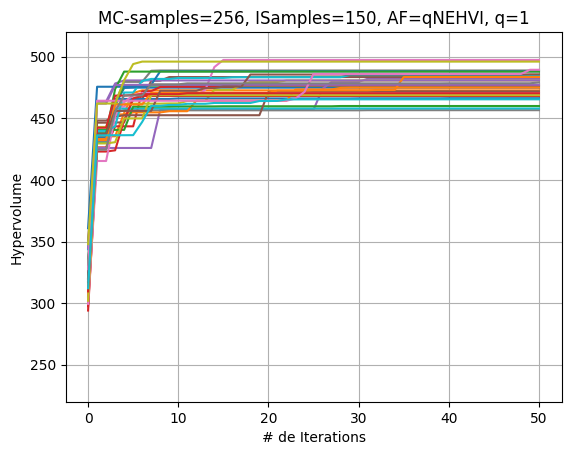

In [57]:
iters = np.arange(51)

for i in range(30):

    plt.errorbar(iters, np.asarray(hvsf27yexp14[i]), linewidth=1.5,label='%i' %i)
    plt.xlabel('# de Iterations')
    plt.ylabel('Hypervolume')
    plt.title('MC-samples=256, ISamples=150, AF=qNEHVI, q=1')
plt.grid()
plt.ylim([220,520])
plt.savefig('Exp14E-27July')


In [58]:
%store BDs27yexp14
%store hvsf27yexp14
%store trainxall27yexp14
%store trainobjall27yexp14
%store numbd27yexp14

Stored 'BDs27yexp14' (list)
Stored 'hvsf27yexp14' (list)
Stored 'trainxall27yexp14' (list)
Stored 'trainobjall27yexp14' (list)
Stored 'numbd27yexp14' (list)


In [42]:
pd.DataFrame({'0':np.array([hvsf27yexp14[i][-1] for i in range(30)])}).median()

0    474.956923
dtype: float64

In [17]:
BDs27yexp4s=[]
hvsf27yexp4s=[]
trainxall27yexp4s=[]
trainobjall27yexp4s=[]
numbd27yexp4s=[]

for i in tqdm.tqdm(list(range(30))):
    N_BATCH = 50 if not SMOKE_TEST else 10
    MC_SAMPLES = 256 if not SMOKE_TEST else 16

    verbose = True
    
    #seed = np.random.randint(0, 1000)
    #print(f"Seed: {seed}")
    #np.random.seed(seed)

    hvs_ehvi=[]
    nume=[]

    # call helper functions to generate initial training data and initialize model
    train_x_ehvi, train_obj_ehvi = generate_initial_data(n=40)
    #train_x_ehvi=train_x_ehvi1 
    #train_obj_ehvi=train_obj_ehvi1
    mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


    # compute hypervolume
    bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
    volume = bd.compute_hypervolume().item()
    nume.append(bd.pareto_Y.shape[0])


    hvs_ehvi.append(volume)

    # run N_BATCH rounds of BayesOpt after the initial random batch
    for iteration in range(1, N_BATCH + 1):    

        t0 = time.monotonic()

        # fit the models

        fit_gpytorch_model(mll_ehvi)


        # define the qEI and qNEI acquisition modules using a QMC sampler

        ehvi_sampler = SobolQMCNormalSampler(MC_SAMPLES, seed=torch.manual_seed(99))


        # optimize acquisition functions and get new observations

        new_x_ehvi, new_obj_ehvi= optimize_qNehvi_and_get_observation(
            model_ehvi,train_x_ehvi, train_obj_ehvi, ehvi_sampler
        )
       

        train_x_ehvi = torch.cat([train_x_ehvi, new_x_ehvi])
        train_obj_ehvi = torch.cat([train_obj_ehvi, new_obj_ehvi])





        #compute hypervolume
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=train_obj_ehvi)
        volume = bd.compute_hypervolume().item()
        hvs_ehvi.append(volume)
        nume.append(bd.pareto_Y.shape[0])
        

      

        mll_ehvi, model_ehvi = initialize_model(train_x_ehvi, train_obj_ehvi)


        t1 = time.monotonic()
        

        if verbose:
            print(
                 f"\nBatch {iteration:>2}:", 
                 f"Hypervolume (qNEHVI) = {hvs_ehvi[-1]:>4.4f}", 
                 f"#Paprox={bd.pareto_Y.shape[0]}",   
                 f"time = {t1-t0:>4.2f}", 
                 f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",
                 f"Energy= {(new_x_ehvi[-1]@Energy).item():>4.4f}",
                 f"Costs= {(new_x_ehvi[-1]@Costos.T).item():>4.4f}", end=")")
        else:
            print(".", end="")
            
   
    BDs27yexp4s.append(bd.pareto_Y)      
    hvsf27yexp4s.append(hvs_ehvi)   
    trainxall27yexp4s.append(train_x_ehvi)
    trainobjall27yexp4s.append(train_obj_ehvi)
    numbd27yexp4s.append(nume)

  0%|                                                    | 0/30 [00:00<?, ?it/s]/tmp/ipykernel_2116/1200902348.py:85: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3277.)
  f"Lysine= {(new_x_ehvi[-1]@L.T).item():>4.4f}",



Batch  1: Hypervolume (qNEHVI) = 428.2307 #Paprox=14 time = 9.55 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 428.2307 #Paprox=14 time = 9.65 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 429.4192 #Paprox=15 time = 9.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 429.4192 #Paprox=15 time = 9.97 Lysine= 0.9501 Energy= 14.3213 Costs= 148.1651)
Batch  5: Hypervolume (qNEHVI) = 431.1451 #Paprox=16 time = 9.83 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)
Batch  6: Hypervolume (qNEHVI) = 431.1451 #Paprox=16 time = 10.09 Lysine= 1.1628 Energy= 14.0010 Costs= 172.1881)
Batch  7: Hypervolume (qNEHVI) = 431.1451 #Paprox=17 time = 9.81 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)
Batch  8: Hypervolume (qNEHVI) = 431.1451 #Paprox=17 time = 9.86 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 431.1451 #Paprox=18 time = 10.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 431.1451 #Paprox=18 time = 10.54 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 431.1451 #Paprox=18 time = 10.41 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 431.1451 #Paprox=18 time = 10.45 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 431.1451 #Paprox=18 time = 10.26 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 431.1451 #Paprox=19 time = 10.24 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 431.1451 #Paprox=19 time = 10.36 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 431.1451 #Paprox=19 time = 10.28 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 431.1451 #Paprox=19 time = 11.30 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 431.1451 #Paprox=19 time = 11.44 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 431.1451 #Paprox=19 time = 11.72 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 431.1451 #Paprox=20 time = 13.36 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 431.1451 #Paprox=20 time = 12.19 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 431.1451 #Paprox=20 time = 11.55 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 431.1451 #Paprox=21 time = 11.48 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 431.1451 #Paprox=21 time = 11.28 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 431.1451 #Paprox=21 time = 10.78 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 431.1451 #Paprox=22 time = 11.67 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 431.1451 #Paprox=22 time = 11.01 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 431.1451 #Paprox=23 time = 12.35 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 431.1451 #Paprox=23 time = 12.48 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 431.1451 #Paprox=24 time = 11.40 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 431.1451 #Paprox=25 time = 11.53 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 431.1451 #Paprox=25 time = 11.50 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 431.1451 #Paprox=25 time = 11.89 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 431.1451 #Paprox=26 time = 11.40 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 431.1451 #Paprox=27 time = 11.33 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 431.1451 #Paprox=27 time = 11.62 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 431.1451 #Paprox=27 time = 11.72 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 431.1451 #Paprox=27 time = 11.56 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 431.1451 #Paprox=27 time = 13.07 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 431.1451 #Paprox=27 time = 12.07 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 431.1451 #Paprox=28 time = 11.89 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 431.1451 #Paprox=29 time = 12.30 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 431.1451 #Paprox=30 time = 11.80 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 431.1451 #Paprox=31 time = 11.59 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 431.1451 #Paprox=31 time = 13.22 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 431.1451 #Paprox=31 time = 13.32 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 431.1451 #Paprox=32 time = 12.90 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 431.1451 #Paprox=33 time = 12.03 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 431.1451 #Paprox=34 time = 12.48 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  3%|█▎                                       | 1/30 [09:26<4:34:01, 566.94s/it]


Batch 50: Hypervolume (qNEHVI) = 431.1451 #Paprox=34 time = 12.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)
Batch  1: Hypervolume (qNEHVI) = 428.3895 #Paprox=9 time = 7.16 Lysine= 0.9501 Energy= 14.4661 Costs= 146.5075)
Batch  2: Hypervolume (qNEHVI) = 428.3895 #Paprox=9 time = 7.23 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 458.6466 #Paprox=10 time = 7.79 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 458.6466 #Paprox=11 time = 10.68 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 458.7670 #Paprox=12 time = 8.75 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 458.7670 #Paprox=13 time = 8.57 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 458.8488 #Paprox=14 time = 8.81 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 478.6093 #Paprox=15 time = 9.12 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 482.2739 #Paprox=16 time = 8.72 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 482.2739 #Paprox=17 time = 8.69 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 482.2739 #Paprox=18 time = 9.15 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 482.2739 #Paprox=19 time = 9.10 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 482.2739 #Paprox=20 time = 9.57 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 482.2739 #Paprox=21 time = 9.53 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 482.2739 #Paprox=22 time = 9.65 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 482.2739 #Paprox=23 time = 9.77 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 482.2739 #Paprox=24 time = 9.97 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 482.2739 #Paprox=25 time = 9.90 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 482.2739 #Paprox=26 time = 10.02 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 482.2739 #Paprox=26 time = 9.85 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 486.1397 #Paprox=27 time = 10.16 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 486.1397 #Paprox=27 time = 10.56 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 486.1397 #Paprox=27 time = 10.61 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 486.1397 #Paprox=27 time = 10.87 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 486.1397 #Paprox=27 time = 10.78 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 486.1397 #Paprox=27 time = 10.92 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 486.1397 #Paprox=27 time = 12.20 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 10.87 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 10.85 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 11.00 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 10.59 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 11.45 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 10.75 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 10.63 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 10.96 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 12.69 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 13.24 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 11.37 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 10.86 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 11.20 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 10.97 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 10.61 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 11.30 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 10.74 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 11.38 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 12.42 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 12.32 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 12.88 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 12.26 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
  7%|██▋                                      | 2/30 [18:09<4:12:26, 540.95s/it]


Batch 50: Hypervolume (qNEHVI) = 486.1397 #Paprox=28 time = 12.60 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)
Batch  1: Hypervolume (qNEHVI) = 428.8207 #Paprox=14 time = 10.60 Lysine= 0.9501 Energy= 14.3966 Costs= 145.7389)
Batch  2: Hypervolume (qNEHVI) = 428.8207 #Paprox=14 time = 11.09 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 448.7698 #Paprox=15 time = 12.60 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 465.0512 #Paprox=16 time = 11.93 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  5: Hypervolume (qNEHVI) = 468.2328 #Paprox=15 time = 11.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 468.2328 #Paprox=16 time = 11.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 468.2328 #Paprox=17 time = 9.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 468.2328 #Paprox=17 time = 9.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 468.2328 #Paprox=18 time = 10.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 468.2328 #Paprox=19 time = 9.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 468.2328 #Paprox=20 time = 9.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 468.2328 #Paprox=21 time = 10.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 468.2328 #Paprox=22 time = 10.11 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 468.2328 #Paprox=23 time = 10.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 468.2328 #Paprox=24 time = 10.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 468.2328 #Paprox=25 time = 10.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 468.2328 #Paprox=26 time = 10.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 468.2328 #Paprox=27 time = 10.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 468.2328 #Paprox=27 time = 10.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 468.2328 #Paprox=27 time = 11.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 468.2328 #Paprox=28 time = 12.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 468.2328 #Paprox=29 time = 12.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 468.2328 #Paprox=30 time = 12.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 468.2328 #Paprox=30 time = 12.70 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 468.2328 #Paprox=30 time = 12.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 468.2328 #Paprox=30 time = 12.73 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 468.2328 #Paprox=30 time = 12.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 468.2328 #Paprox=31 time = 11.71 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 468.2328 #Paprox=31 time = 11.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 468.2328 #Paprox=32 time = 11.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 468.2328 #Paprox=33 time = 11.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 468.2328 #Paprox=34 time = 11.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 468.2328 #Paprox=35 time = 10.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 468.2328 #Paprox=36 time = 11.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 468.2328 #Paprox=37 time = 11.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 468.2328 #Paprox=37 time = 11.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 468.2328 #Paprox=38 time = 11.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 468.2328 #Paprox=39 time = 11.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 468.2328 #Paprox=39 time = 11.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 468.2328 #Paprox=39 time = 11.74 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 468.2328 #Paprox=40 time = 11.52 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 468.2328 #Paprox=41 time = 11.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 468.2328 #Paprox=42 time = 11.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 468.2328 #Paprox=43 time = 11.75 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 468.2328 #Paprox=44 time = 12.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 468.2328 #Paprox=45 time = 14.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 468.2328 #Paprox=46 time = 14.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 468.2328 #Paprox=47 time = 13.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 468.2328 #Paprox=48 time = 13.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 10%|████                                     | 3/30 [27:47<4:11:01, 557.83s/it]


Batch 50: Hypervolume (qNEHVI) = 468.2328 #Paprox=48 time = 13.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  1: Hypervolume (qNEHVI) = 432.9534 #Paprox=12 time = 10.01 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 432.9534 #Paprox=12 time = 10.39 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 434.6696 #Paprox=13 time = 10.75 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 447.5005 #Paprox=12 time = 11.05 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)
Batch  5: Hypervolume (qNEHVI) = 453.4665 #Paprox=13 time = 9.58 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  6: Hypervolume (qNEHVI) = 455.2161 #Paprox=13 time = 9.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  7: Hypervolume (qNEHVI) = 455.2161 #Paprox=14 time = 9.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 455.2161 #Paprox=15 time = 11.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 455.2161 #Paprox=16 time = 10.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 455.2161 #Paprox=17 time = 9.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 455.2161 #Paprox=18 time = 10.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 455.2161 #Paprox=19 time = 10.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 455.2161 #Paprox=20 time = 10.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 455.2161 #Paprox=21 time = 10.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 455.2161 #Paprox=22 time = 10.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 455.2161 #Paprox=23 time = 10.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 455.2161 #Paprox=24 time = 10.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 455.2161 #Paprox=25 time = 10.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 455.2161 #Paprox=26 time = 10.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 458.2938 #Paprox=27 time = 10.65 Lysine= 1.0416 Energy= 14.0194 Costs= 146.9140)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 458.2938 #Paprox=27 time = 10.56 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 458.6012 #Paprox=28 time = 11.04 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 458.6012 #Paprox=29 time = 11.34 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 458.6012 #Paprox=30 time = 11.36 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 458.6012 #Paprox=31 time = 11.25 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 458.6012 #Paprox=32 time = 11.80 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 458.6012 #Paprox=33 time = 11.64 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 458.6012 #Paprox=34 time = 12.08 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 458.6012 #Paprox=35 time = 12.47 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 458.6012 #Paprox=36 time = 12.37 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 458.6012 #Paprox=37 time = 11.78 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 458.6012 #Paprox=38 time = 11.99 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 458.6012 #Paprox=39 time = 11.95 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 458.6012 #Paprox=40 time = 12.04 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 458.6012 #Paprox=41 time = 12.10 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 458.6012 #Paprox=42 time = 11.79 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 458.6012 #Paprox=43 time = 11.74 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 458.6012 #Paprox=44 time = 12.07 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 458.6012 #Paprox=44 time = 12.27 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 458.6012 #Paprox=45 time = 12.31 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 458.6012 #Paprox=46 time = 11.80 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 458.6012 #Paprox=47 time = 12.10 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 458.6012 #Paprox=48 time = 12.24 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 458.6012 #Paprox=49 time = 12.28 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 458.6012 #Paprox=50 time = 12.17 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 458.6012 #Paprox=51 time = 12.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 458.6012 #Paprox=52 time = 12.50 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 458.6012 #Paprox=53 time = 12.38 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 458.6012 #Paprox=54 time = 12.84 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 13%|█████▍                                   | 4/30 [37:12<4:02:59, 560.74s/it]


Batch 50: Hypervolume (qNEHVI) = 458.6012 #Paprox=55 time = 12.93 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)
Batch  1: Hypervolume (qNEHVI) = 424.6029 #Paprox=13 time = 10.37 Lysine= 0.9501 Energy= 14.4125 Costs= 145.9180)
Batch  2: Hypervolume (qNEHVI) = 424.6029 #Paprox=13 time = 10.80 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 425.9169 #Paprox=14 time = 10.47 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 425.9169 #Paprox=15 time = 10.56 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 425.9169 #Paprox=16 time = 10.71 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 425.9169 #Paprox=17 time = 10.90 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 425.9169 #Paprox=18 time = 11.10 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 425.9169 #Paprox=19 time = 11.22 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 425.9169 #Paprox=20 time = 11.24 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 425.9169 #Paprox=21 time = 12.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 425.9169 #Paprox=22 time = 11.34 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 425.9169 #Paprox=23 time = 11.62 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 425.9169 #Paprox=24 time = 12.01 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 425.9169 #Paprox=25 time = 11.79 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 425.9169 #Paprox=26 time = 11.65 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 425.9169 #Paprox=27 time = 12.21 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 425.9169 #Paprox=28 time = 11.87 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 425.9169 #Paprox=29 time = 11.93 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 425.9169 #Paprox=30 time = 13.27 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 425.9169 #Paprox=31 time = 12.91 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 425.9169 #Paprox=32 time = 11.86 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 425.9169 #Paprox=33 time = 11.83 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 425.9169 #Paprox=34 time = 12.02 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 425.9169 #Paprox=35 time = 12.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 425.9169 #Paprox=36 time = 12.20 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 425.9169 #Paprox=37 time = 12.14 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 425.9169 #Paprox=38 time = 12.21 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 448.2680 #Paprox=39 time = 11.96 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 448.2680 #Paprox=40 time = 12.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 453.8080 #Paprox=41 time = 15.95 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8348)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 455.2443 #Paprox=42 time = 13.70 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 455.2443 #Paprox=42 time = 12.92 Lysine= 1.1628 Energy= 14.0010 Costs= 172.1881)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 455.2443 #Paprox=42 time = 13.41 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 455.2443 #Paprox=42 time = 15.65 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 455.2443 #Paprox=42 time = 16.56 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 455.2443 #Paprox=42 time = 17.12 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 455.2443 #Paprox=43 time = 16.19 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 455.2443 #Paprox=43 time = 16.21 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 455.2443 #Paprox=43 time = 16.13 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 455.2443 #Paprox=43 time = 16.80 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 455.2443 #Paprox=43 time = 16.23 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 455.2443 #Paprox=43 time = 16.89 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 455.2443 #Paprox=43 time = 16.22 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 455.2443 #Paprox=43 time = 16.21 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 455.2443 #Paprox=44 time = 16.84 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 455.2443 #Paprox=44 time = 16.38 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 455.2443 #Paprox=44 time = 16.74 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 455.2443 #Paprox=44 time = 16.40 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 455.2443 #Paprox=44 time = 16.46 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 17%|██████▊                                  | 5/30 [48:29<4:11:01, 602.44s/it]


Batch 50: Hypervolume (qNEHVI) = 455.2443 #Paprox=45 time = 17.18 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)
Batch  1: Hypervolume (qNEHVI) = 433.5050 #Paprox=11 time = 11.09 Lysine= 0.9501 Energy= 14.4393 Costs= 146.2125)
Batch  2: Hypervolume (qNEHVI) = 433.5050 #Paprox=11 time = 10.41 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 433.5050 #Paprox=11 time = 11.35 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)
Batch  4: Hypervolume (qNEHVI) = 434.2227 #Paprox=12 time = 11.21 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 434.2227 #Paprox=13 time = 11.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 434.2227 #Paprox=14 time = 12.19 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 434.2227 #Paprox=15 time = 11.66 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 434.2227 #Paprox=15 time = 12.73 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 434.2227 #Paprox=15 time = 12.39 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 434.2227 #Paprox=15 time = 12.44 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 434.2227 #Paprox=15 time = 12.54 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 434.2227 #Paprox=15 time = 12.79 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 434.2227 #Paprox=15 time = 13.13 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 434.2227 #Paprox=15 time = 12.84 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 12.78 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 12.75 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 12.97 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.25 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 12.92 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.17 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.04 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 12.99 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.12 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.15 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 14.09 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.02 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.55 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.28 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.33 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.55 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.45 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 12.85 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.48 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.51 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.59 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.26 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 14.18 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.18 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 12.92 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 12.18 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 11.71 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.70 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.20 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 14.40 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.37 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.60 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.71 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.95 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.56 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 20%|████████▏                                | 6/30 [59:17<4:07:08, 617.87s/it]


Batch 50: Hypervolume (qNEHVI) = 434.2227 #Paprox=16 time = 13.96 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)
Batch  1: Hypervolume (qNEHVI) = 427.5940 #Paprox=14 time = 11.50 Lysine= 0.9501 Energy= 14.3981 Costs= 145.7593)
Batch  2: Hypervolume (qNEHVI) = 427.5940 #Paprox=14 time = 12.42 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 428.9667 #Paprox=15 time = 12.13 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  4: Hypervolume (qNEHVI) = 430.5061 #Paprox=16 time = 12.42 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 430.5061 #Paprox=17 time = 13.58 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  6: Hypervolume (qNEHVI) = 430.5061 #Paprox=18 time = 13.07 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 430.5061 #Paprox=19 time = 13.04 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 430.5110 #Paprox=20 time = 13.35 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 430.5110 #Paprox=21 time = 13.94 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 430.5110 #Paprox=21 time = 13.47 Lysine= 0.9501 Energy= 14.4352 Costs= 147.6290)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 467.0755 #Paprox=22 time = 13.68 Lysine= 0.9501 Energy= 14.0010 Costs= 142.9102)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 483.4659 #Paprox=23 time = 14.41 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 485.4276 #Paprox=22 time = 14.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 488.6326 #Paprox=23 time = 12.75 Lysine= 1.0342 Energy= 14.0010 Costs= 146.5882)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 489.4267 #Paprox=24 time = 13.53 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 490.9015 #Paprox=25 time = 13.97 Lysine= 1.0941 Energy= 14.0010 Costs= 147.5547)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 490.9015 #Paprox=26 time = 14.05 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 490.9015 #Paprox=27 time = 15.05 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 490.9015 #Paprox=28 time = 14.56 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 490.9015 #Paprox=29 time = 15.30 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 490.9015 #Paprox=30 time = 17.38 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 490.9015 #Paprox=31 time = 17.92 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 490.9015 #Paprox=32 time = 15.31 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 490.9015 #Paprox=33 time = 14.92 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 490.9015 #Paprox=34 time = 16.22 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 490.9015 #Paprox=35 time = 15.54 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 490.9015 #Paprox=36 time = 15.80 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 490.9015 #Paprox=37 time = 16.45 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 490.9015 #Paprox=38 time = 16.46 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 490.9015 #Paprox=39 time = 16.98 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 490.9015 #Paprox=40 time = 16.00 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 490.9015 #Paprox=41 time = 17.54 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 490.9015 #Paprox=42 time = 17.10 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 490.9015 #Paprox=43 time = 16.46 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 490.9015 #Paprox=44 time = 16.92 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 490.9015 #Paprox=45 time = 16.44 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 490.9015 #Paprox=46 time = 16.54 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 490.9015 #Paprox=47 time = 16.96 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 490.9015 #Paprox=48 time = 16.44 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 490.9015 #Paprox=49 time = 17.06 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 490.9015 #Paprox=50 time = 16.33 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 490.9015 #Paprox=51 time = 16.81 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 490.9015 #Paprox=52 time = 17.08 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 490.9015 #Paprox=53 time = 16.64 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 490.9015 #Paprox=54 time = 16.48 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 490.9015 #Paprox=55 time = 18.21 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 490.9015 #Paprox=55 time = 16.93 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 490.9015 #Paprox=56 time = 17.61 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 490.9015 #Paprox=57 time = 17.52 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 23%|█████████                              | 7/30 [1:12:10<4:16:24, 668.87s/it]


Batch 50: Hypervolume (qNEHVI) = 490.9015 #Paprox=58 time = 18.69 Lysine= 0.9897 Energy= 14.0010 Costs= 145.1559)
Batch  1: Hypervolume (qNEHVI) = 426.7273 #Paprox=17 time = 12.69 Lysine= 0.9501 Energy= 14.4038 Costs= 145.8224)
Batch  2: Hypervolume (qNEHVI) = 426.7273 #Paprox=17 time = 12.42 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 447.7969 #Paprox=18 time = 12.94 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 447.7969 #Paprox=18 time = 13.15 Lysine= 1.2051 Energy= 14.0010 Costs= 157.7905)
Batch  5: Hypervolume (qNEHVI) = 447.7969 #Paprox=18 time = 13.94 Lysine= 1.1707 Energy= 14.0010 Costs= 173.4115)
Batch  6: Hypervolume (qNEHVI) = 455.9913 #Paprox=19 time = 13.28 Lysine= 1.0218 Energy= 14.3728 Costs= 147.8461)
Batch  7: Hypervolume (qNEHVI) = 477.0899 #Paprox=19 time = 13.37 Lysine= 1.3731 Energy= 14.0010 Costs= 152.8905)
Batch  8: Hypervolume (qNEHVI) = 482.5120 #Paprox=20 time = 13.50 Lysine= 0.9501 Energy

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 482.5120 #Paprox=22 time = 13.85 Lysine= 1.3731 Energy= 14.0010 Costs= 152.8905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 482.5120 #Paprox=23 time = 14.24 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 482.5120 #Paprox=24 time = 14.62 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 482.5120 #Paprox=25 time = 15.18 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 491.1319 #Paprox=26 time = 14.45 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 491.1319 #Paprox=27 time = 15.14 Lysine= 1.1512 Energy= 14.0010 Costs= 148.1332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 491.1319 #Paprox=28 time = 15.37 Lysine= 1.3731 Energy= 14.0010 Costs= 152.8905)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 491.1319 #Paprox=28 time = 15.15 Lysine= 1.1459 Energy= 14.0010 Costs= 149.4292)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 492.8431 #Paprox=29 time = 14.83 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 492.8431 #Paprox=30 time = 15.11 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 492.8431 #Paprox=31 time = 16.20 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 492.8431 #Paprox=32 time = 15.67 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 492.8431 #Paprox=33 time = 16.47 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 492.8431 #Paprox=34 time = 15.21 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 492.8431 #Paprox=35 time = 15.84 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 492.8431 #Paprox=36 time = 15.93 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 492.8431 #Paprox=36 time = 15.87 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 492.8431 #Paprox=37 time = 16.59 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 492.8431 #Paprox=38 time = 15.68 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 492.8431 #Paprox=39 time = 15.74 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 492.8431 #Paprox=40 time = 16.17 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 492.8431 #Paprox=41 time = 16.73 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 492.8431 #Paprox=42 time = 16.58 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 492.8431 #Paprox=43 time = 16.96 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 492.8431 #Paprox=44 time = 15.89 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 492.8431 #Paprox=45 time = 16.39 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 492.8431 #Paprox=46 time = 17.02 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 492.8431 #Paprox=47 time = 16.06 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 492.8431 #Paprox=48 time = 16.10 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 492.8431 #Paprox=49 time = 16.01 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 492.8431 #Paprox=50 time = 16.28 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 492.8431 #Paprox=50 time = 17.13 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 492.8431 #Paprox=51 time = 16.65 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 492.8431 #Paprox=52 time = 17.05 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 492.8431 #Paprox=52 time = 16.85 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 492.8431 #Paprox=53 time = 17.27 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 492.8431 #Paprox=54 time = 17.27 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 492.8431 #Paprox=55 time = 16.49 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 492.8431 #Paprox=56 time = 17.02 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 492.8431 #Paprox=56 time = 16.96 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 27%|██████████▍                            | 8/30 [1:25:08<4:17:53, 703.34s/it]


Batch 50: Hypervolume (qNEHVI) = 492.8431 #Paprox=57 time = 17.18 Lysine= 1.0185 Energy= 14.0010 Costs= 146.0582)
Batch  1: Hypervolume (qNEHVI) = 421.6647 #Paprox=11 time = 11.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 421.6647 #Paprox=11 time = 11.95 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 421.6647 #Paprox=12 time = 12.10 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 421.6647 #Paprox=13 time = 12.06 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 421.6647 #Paprox=14 time = 12.15 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 421.6647 #Paprox=15 time = 12.53 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 452.7198 #Paprox=16 time = 12.46 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 452.7198 #Paprox=17 time = 13.51 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 452.7198 #Paprox=18 time = 12.99 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 452.7199 #Paprox=19 time = 13.21 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 452.7199 #Paprox=20 time = 13.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 452.8181 #Paprox=21 time = 14.20 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 470.7225 #Paprox=22 time = 13.74 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 472.6973 #Paprox=23 time = 13.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 472.6973 #Paprox=24 time = 12.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 472.6973 #Paprox=25 time = 13.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 472.6973 #Paprox=26 time = 13.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 472.6973 #Paprox=27 time = 14.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 472.6973 #Paprox=28 time = 14.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 472.6973 #Paprox=29 time = 14.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 472.6973 #Paprox=30 time = 15.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 472.6973 #Paprox=31 time = 14.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 472.6973 #Paprox=32 time = 14.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 472.6973 #Paprox=33 time = 15.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.6973 #Paprox=34 time = 14.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 472.6973 #Paprox=35 time = 15.10 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 472.6973 #Paprox=36 time = 15.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 472.6973 #Paprox=37 time = 15.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 472.6973 #Paprox=38 time = 15.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 472.6973 #Paprox=39 time = 15.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 472.6973 #Paprox=40 time = 15.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 472.6973 #Paprox=40 time = 15.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 472.6973 #Paprox=41 time = 15.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 472.6973 #Paprox=42 time = 15.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 472.6973 #Paprox=43 time = 16.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 472.6973 #Paprox=44 time = 15.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 472.6973 #Paprox=44 time = 16.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 472.6973 #Paprox=45 time = 15.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 472.6973 #Paprox=46 time = 16.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 472.6973 #Paprox=47 time = 15.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 473.3796 #Paprox=48 time = 16.02 Lysine= 1.0776 Energy= 14.2111 Costs= 148.9835)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 473.3957 #Paprox=49 time = 16.44 Lysine= 1.4252 Energy= 14.0010 Costs= 161.6037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 476.1773 #Paprox=50 time = 17.27 Lysine= 1.0383 Energy= 14.0010 Costs= 146.7309)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 480.3484 #Paprox=51 time = 16.94 Lysine= 1.3229 Energy= 14.0010 Costs= 155.2738)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 480.3488 #Paprox=52 time = 17.35 Lysine= 1.4145 Energy= 14.0010 Costs= 161.3296)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 486.7410 #Paprox=51 time = 17.92 Lysine= 1.4244 Energy= 14.0010 Costs= 154.9671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 486.7410 #Paprox=51 time = 17.78 Lysine= 0.9501 Energy= 14.0010 Costs= 150.5717)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 486.7410 #Paprox=51 time = 16.96 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 486.7410 #Paprox=51 time = 17.53 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 30%|███████████▋                           | 9/30 [1:37:29<4:10:17, 715.11s/it]


Batch 50: Hypervolume (qNEHVI) = 488.6045 #Paprox=52 time = 16.45 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)
Batch  1: Hypervolume (qNEHVI) = 429.0266 #Paprox=14 time = 12.93 Lysine= 0.9501 Energy= 14.4130 Costs= 145.9235)
Batch  2: Hypervolume (qNEHVI) = 429.0266 #Paprox=14 time = 12.70 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 451.4523 #Paprox=15 time = 12.63 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 451.4523 #Paprox=15 time = 13.49 Lysine= 1.2056 Energy= 14.0010 Costs= 178.2149)
Batch  5: Hypervolume (qNEHVI) = 452.3178 #Paprox=16 time = 13.35 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)
Batch  6: Hypervolume (qNEHVI) = 452.3178 #Paprox=17 time = 13.01 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 452.3207 #Paprox=18 time = 13.35 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 452.3207 #Paprox=18 time = 14.12 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 452.3207 #Paprox=19 time = 14.16 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 452.3207 #Paprox=20 time = 13.80 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 452.3207 #Paprox=21 time = 13.94 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 452.3215 #Paprox=22 time = 14.20 Lysine= 0.9501 Energy= 14.4556 Costs= 150.9015)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 452.3215 #Paprox=23 time = 14.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 452.3215 #Paprox=24 time = 14.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 452.3215 #Paprox=25 time = 14.94 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 452.3215 #Paprox=25 time = 15.70 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 452.3215 #Paprox=26 time = 14.94 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 452.3215 #Paprox=27 time = 15.00 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 452.3215 #Paprox=28 time = 14.85 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 452.3215 #Paprox=28 time = 15.33 Lysine= 0.9501 Energy= 14.4244 Costs= 150.9124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 452.3215 #Paprox=29 time = 14.41 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 452.3215 #Paprox=30 time = 14.54 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 452.3215 #Paprox=31 time = 14.79 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 452.3215 #Paprox=32 time = 14.64 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 452.3763 #Paprox=27 time = 15.41 Lysine= 0.9501 Energy= 14.4623 Costs= 150.2932)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 452.3763 #Paprox=28 time = 14.72 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 452.3763 #Paprox=28 time = 15.60 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 452.3763 #Paprox=28 time = 14.97 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 452.3763 #Paprox=28 time = 14.92 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 452.3763 #Paprox=28 time = 15.31 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 452.3763 #Paprox=28 time = 14.71 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 452.3763 #Paprox=29 time = 14.92 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 452.3763 #Paprox=29 time = 14.95 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 452.3763 #Paprox=30 time = 15.36 Lysine= 0.9501 Energy= 14.4622 Costs= 150.9542)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 452.3763 #Paprox=31 time = 15.34 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 452.3763 #Paprox=31 time = 15.36 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 452.3763 #Paprox=31 time = 15.61 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 452.3763 #Paprox=32 time = 15.36 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 452.3763 #Paprox=33 time = 15.48 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 452.3763 #Paprox=33 time = 15.32 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 452.3763 #Paprox=34 time = 15.62 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 452.3763 #Paprox=35 time = 15.30 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 452.3763 #Paprox=36 time = 15.10 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 452.3763 #Paprox=36 time = 15.56 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 452.3763 #Paprox=36 time = 14.84 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 452.3763 #Paprox=37 time = 15.37 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 452.3763 #Paprox=37 time = 15.61 Lysine= 0.9501 Energy= 14.3302 Costs= 150.8593)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 452.3763 #Paprox=38 time = 15.25 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 452.3763 #Paprox=39 time = 15.77 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 33%|████████████▋                         | 10/30 [1:49:47<4:00:45, 722.29s/it]


Batch 50: Hypervolume (qNEHVI) = 452.3763 #Paprox=39 time = 15.95 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)
Batch  1: Hypervolume (qNEHVI) = 439.6925 #Paprox=13 time = 11.47 Lysine= 0.9501 Energy= 14.4063 Costs= 145.8495)
Batch  2: Hypervolume (qNEHVI) = 439.6925 #Paprox=13 time = 11.47 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 455.1952 #Paprox=14 time = 12.04 Lysine= 1.1087 Energy= 14.0010 Costs= 146.1671)
Batch  4: Hypervolume (qNEHVI) = 455.8779 #Paprox=15 time = 12.20 Lysine= 1.1197 Energy= 14.0010 Costs= 148.7234)
Batch  5: Hypervolume (qNEHVI) = 462.6684 #Paprox=15 time = 11.88 Lysine= 1.1044 Energy= 14.7666 Costs= 153.3291)
Batch  6: Hypervolume (qNEHVI) = 462.8548 #Paprox=16 time = 11.25 Lysine= 1.0965 Energy= 14.7243 Costs= 152.8723)
Batch  7: Hypervolume (qNEHVI) = 473.4605 #Paprox=17 time = 11.84 Lysine= 0.9604 Energy= 14.0010 Costs= 145.0642)
Batch  8: Hypervolume (qNEHVI) = 473.7721 #Paprox=18 time = 13.22 Lysine= 1.3747 Energy

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 473.7721 #Paprox=20 time = 13.53 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 473.7721 #Paprox=20 time = 13.79 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 473.7721 #Paprox=20 time = 13.47 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 473.7721 #Paprox=21 time = 13.67 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 473.7721 #Paprox=22 time = 13.24 Lysine= 0.9977 Energy= 14.0010 Costs= 152.4410)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 473.7721 #Paprox=22 time = 13.76 Lysine= 0.9501 Energy= 14.0010 Costs= 151.1191)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 473.7721 #Paprox=23 time = 13.63 Lysine= 0.9681 Energy= 14.0010 Costs= 151.6189)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 473.7851 #Paprox=23 time = 13.03 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 473.7851 #Paprox=23 time = 13.68 Lysine= 1.2231 Energy= 14.0010 Costs= 157.0887)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 473.7851 #Paprox=23 time = 13.47 Lysine= 0.9501 Energy= 14.0010 Costs= 151.2432)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 473.7851 #Paprox=23 time = 13.40 Lysine= 1.0259 Energy= 14.0010 Costs= 150.8067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 473.7851 #Paprox=23 time = 13.48 Lysine= 1.0259 Energy= 14.0010 Costs= 150.8067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 473.7851 #Paprox=23 time = 13.49 Lysine= 1.0259 Energy= 14.0010 Costs= 150.8067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 473.7851 #Paprox=23 time = 13.48 Lysine= 1.0259 Energy= 14.0010 Costs= 150.8067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 473.7851 #Paprox=23 time = 13.36 Lysine= 1.0259 Energy= 14.0010 Costs= 150.8067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 473.7851 #Paprox=23 time = 13.64 Lysine= 1.0259 Energy= 14.0010 Costs= 150.8067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 473.7851 #Paprox=23 time = 13.89 Lysine= 1.0259 Energy= 14.0010 Costs= 150.8067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 473.7851 #Paprox=24 time = 13.94 Lysine= 1.0259 Energy= 14.0010 Costs= 150.8067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 473.7851 #Paprox=24 time = 13.50 Lysine= 1.0259 Energy= 14.0010 Costs= 150.8067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 473.7851 #Paprox=24 time = 13.25 Lysine= 1.0259 Energy= 14.0010 Costs= 150.8067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 473.7851 #Paprox=24 time = 13.51 Lysine= 1.0259 Energy= 14.0010 Costs= 150.8067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 473.7851 #Paprox=24 time = 14.07 Lysine= 1.0259 Energy= 14.0010 Costs= 150.8067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 473.7851 #Paprox=24 time = 13.45 Lysine= 1.0259 Energy= 14.0010 Costs= 150.8067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 473.7851 #Paprox=24 time = 13.34 Lysine= 1.0259 Energy= 14.0010 Costs= 150.8067)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 473.7851 #Paprox=24 time = 14.03 Lysine= 1.0044 Energy= 14.0010 Costs= 147.0749)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 474.1016 #Paprox=25 time = 13.67 Lysine= 0.9954 Energy= 14.0010 Costs= 145.5210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 474.1016 #Paprox=26 time = 13.80 Lysine= 0.9954 Energy= 14.0010 Costs= 145.5210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 474.1016 #Paprox=27 time = 13.72 Lysine= 0.9954 Energy= 14.0010 Costs= 145.5210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 474.1016 #Paprox=28 time = 13.65 Lysine= 0.9954 Energy= 14.0010 Costs= 145.5210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 474.1016 #Paprox=29 time = 14.12 Lysine= 0.9954 Energy= 14.0010 Costs= 145.5210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 474.1016 #Paprox=30 time = 14.27 Lysine= 0.9954 Energy= 14.0010 Costs= 145.5210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 474.1016 #Paprox=31 time = 14.01 Lysine= 0.9954 Energy= 14.0010 Costs= 145.5210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 474.1016 #Paprox=32 time = 13.56 Lysine= 0.9954 Energy= 14.0010 Costs= 145.5210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 474.1016 #Paprox=33 time = 14.97 Lysine= 0.9954 Energy= 14.0010 Costs= 145.5210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 474.1016 #Paprox=34 time = 14.09 Lysine= 0.9954 Energy= 14.0010 Costs= 145.5210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 474.1016 #Paprox=35 time = 14.32 Lysine= 0.9954 Energy= 14.0010 Costs= 145.5210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 474.1016 #Paprox=36 time = 14.20 Lysine= 0.9954 Energy= 14.0010 Costs= 145.5210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 474.1016 #Paprox=37 time = 14.29 Lysine= 0.9954 Energy= 14.0010 Costs= 145.5210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 474.1016 #Paprox=38 time = 14.17 Lysine= 0.9954 Energy= 14.0010 Costs= 145.5210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 37%|█████████████▉                        | 11/30 [2:01:00<3:43:56, 707.18s/it]


Batch 50: Hypervolume (qNEHVI) = 474.1084 #Paprox=39 time = 14.81 Lysine= 0.9962 Energy= 14.0010 Costs= 145.5654)
Batch  1: Hypervolume (qNEHVI) = 432.2254 #Paprox=9 time = 10.25 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 432.2254 #Paprox=9 time = 10.45 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 435.8395 #Paprox=10 time = 10.18 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 448.6664 #Paprox=11 time = 10.75 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 448.6664 #Paprox=12 time = 11.03 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 448.6664 #Paprox=13 time = 10.57 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 448.6664 #Paprox=14 time = 11.08 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 448.6664 #Paprox=15 time = 10.98 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 448.6664 #Paprox=16 time = 11.26 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 448.6664 #Paprox=17 time = 11.22 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 448.6664 #Paprox=18 time = 11.17 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 448.6664 #Paprox=19 time = 11.59 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 448.6664 #Paprox=20 time = 11.54 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 448.6664 #Paprox=21 time = 12.02 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 448.6664 #Paprox=22 time = 11.73 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 448.6664 #Paprox=22 time = 11.59 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 448.6664 #Paprox=23 time = 11.94 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 448.6664 #Paprox=24 time = 11.98 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 448.6664 #Paprox=25 time = 11.67 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 448.6664 #Paprox=26 time = 11.38 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 448.6664 #Paprox=27 time = 11.96 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 448.6664 #Paprox=28 time = 11.59 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 448.6664 #Paprox=29 time = 12.05 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 448.6664 #Paprox=29 time = 11.94 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 448.6664 #Paprox=30 time = 12.77 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 448.6664 #Paprox=31 time = 11.99 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 448.6664 #Paprox=31 time = 12.36 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 448.6664 #Paprox=32 time = 12.07 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 448.6664 #Paprox=33 time = 12.38 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 448.6664 #Paprox=34 time = 12.23 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 448.6664 #Paprox=35 time = 13.02 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 448.6664 #Paprox=36 time = 12.51 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 448.6664 #Paprox=37 time = 12.25 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 448.6664 #Paprox=38 time = 12.40 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 448.6664 #Paprox=39 time = 13.24 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 448.6664 #Paprox=40 time = 12.16 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 448.6664 #Paprox=41 time = 11.95 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 448.6664 #Paprox=42 time = 12.48 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 448.6664 #Paprox=43 time = 12.38 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 448.6664 #Paprox=44 time = 12.23 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 448.6664 #Paprox=45 time = 12.20 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 448.6664 #Paprox=46 time = 12.55 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 448.6664 #Paprox=47 time = 12.60 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 448.6664 #Paprox=48 time = 13.21 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 448.6664 #Paprox=49 time = 12.75 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 448.6664 #Paprox=50 time = 13.30 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 448.6664 #Paprox=51 time = 13.34 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 448.6664 #Paprox=51 time = 12.62 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 448.6664 #Paprox=52 time = 13.66 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 40%|███████████████▏                      | 12/30 [2:11:00<3:22:24, 674.72s/it]


Batch 50: Hypervolume (qNEHVI) = 448.6664 #Paprox=52 time = 13.17 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)
Batch  1: Hypervolume (qNEHVI) = 425.7639 #Paprox=12 time = 12.16 Lysine= 0.9501 Energy= 14.4501 Costs= 146.3311)
Batch  2: Hypervolume (qNEHVI) = 425.7639 #Paprox=12 time = 12.46 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 426.1544 #Paprox=13 time = 12.72 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)
Batch  4: Hypervolume (qNEHVI) = 453.6631 #Paprox=14 time = 13.06 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 453.7845 #Paprox=15 time = 13.01 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)
Batch  6: Hypervolume (qNEHVI) = 453.7845 #Paprox=16 time = 12.52 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 453.7845 #Paprox=17 time = 12.67 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 453.7845 #Paprox=18 time = 12.79 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 453.7845 #Paprox=19 time = 12.90 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 453.7845 #Paprox=20 time = 12.92 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 453.7845 #Paprox=21 time = 13.02 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 453.7845 #Paprox=22 time = 13.91 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 453.7845 #Paprox=22 time = 14.79 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 453.7845 #Paprox=23 time = 13.45 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 453.7845 #Paprox=24 time = 13.54 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 453.7845 #Paprox=24 time = 13.59 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 453.7845 #Paprox=25 time = 13.30 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 453.7845 #Paprox=25 time = 13.97 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 453.7845 #Paprox=25 time = 14.05 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 453.7845 #Paprox=26 time = 13.89 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 453.7845 #Paprox=27 time = 14.09 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 453.7845 #Paprox=28 time = 14.11 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 453.7845 #Paprox=29 time = 14.61 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 453.7845 #Paprox=29 time = 13.92 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 453.7845 #Paprox=30 time = 13.75 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 453.7845 #Paprox=31 time = 13.65 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 453.7845 #Paprox=31 time = 14.47 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 453.7845 #Paprox=32 time = 14.27 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 453.7845 #Paprox=32 time = 14.35 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 453.7845 #Paprox=32 time = 14.83 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 453.7845 #Paprox=33 time = 14.00 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 453.7845 #Paprox=33 time = 13.17 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 453.7845 #Paprox=34 time = 12.58 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 453.7845 #Paprox=34 time = 11.20 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 453.7845 #Paprox=35 time = 12.05 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 453.7845 #Paprox=36 time = 12.23 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 453.7845 #Paprox=37 time = 11.36 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 453.7845 #Paprox=37 time = 12.44 Lysine= 1.1575 Energy= 14.0010 Costs= 167.2158)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 454.2620 #Paprox=38 time = 12.35 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 454.2620 #Paprox=38 time = 11.75 Lysine= 1.0259 Energy= 14.0010 Costs= 173.6972)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 454.2620 #Paprox=39 time = 11.88 Lysine= 0.9501 Energy= 14.4537 Costs= 149.9514)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 454.2620 #Paprox=39 time = 11.96 Lysine= 0.9501 Energy= 14.4213 Costs= 150.7383)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 454.2620 #Paprox=39 time = 12.41 Lysine= 0.9501 Energy= 14.4446 Costs= 150.9099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 454.2620 #Paprox=40 time = 11.82 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 454.2620 #Paprox=41 time = 11.66 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 454.4648 #Paprox=42 time = 12.11 Lysine= 0.9501 Energy= 14.4830 Costs= 151.4388)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 454.5558 #Paprox=43 time = 12.33 Lysine= 0.9501 Energy= 14.4882 Costs= 151.4896)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 454.5986 #Paprox=44 time = 12.08 Lysine= 0.9501 Energy= 14.4906 Costs= 151.5060)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 454.5990 #Paprox=45 time = 12.76 Lysine= 0.9501 Energy= 14.4742 Costs= 151.2819)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 43%|████████████████▍                     | 13/30 [2:21:54<3:09:20, 668.24s/it]


Batch 50: Hypervolume (qNEHVI) = 454.5991 #Paprox=46 time = 13.62 Lysine= 0.9501 Energy= 14.4777 Costs= 151.4190)
Batch  1: Hypervolume (qNEHVI) = 430.8615 #Paprox=12 time = 10.81 Lysine= 0.9501 Energy= 14.4256 Costs= 146.0618)
Batch  2: Hypervolume (qNEHVI) = 430.8615 #Paprox=12 time = 11.07 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 455.1419 #Paprox=13 time = 10.63 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 473.1247 #Paprox=14 time = 10.24 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  5: Hypervolume (qNEHVI) = 475.8766 #Paprox=15 time = 10.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 475.8766 #Paprox=16 time = 9.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 475.8766 #Paprox=17 time = 9.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 475.8766 #Paprox=18 time = 9.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 475.8766 #Paprox=18 time = 10.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 475.8766 #Paprox=19 time = 10.09 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 475.8766 #Paprox=20 time = 10.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 475.8766 #Paprox=21 time = 10.44 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 475.8766 #Paprox=22 time = 10.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 475.8766 #Paprox=23 time = 10.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 475.8766 #Paprox=23 time = 10.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 475.8766 #Paprox=24 time = 11.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 475.8766 #Paprox=25 time = 10.93 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 475.8766 #Paprox=26 time = 10.94 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 475.8766 #Paprox=27 time = 11.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 475.8766 #Paprox=28 time = 11.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 475.8766 #Paprox=29 time = 11.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 475.8766 #Paprox=30 time = 11.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 475.8766 #Paprox=31 time = 11.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 475.8766 #Paprox=32 time = 11.38 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 475.8766 #Paprox=33 time = 11.37 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 475.8766 #Paprox=34 time = 11.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 475.8766 #Paprox=35 time = 11.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 475.8766 #Paprox=36 time = 11.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 475.8766 #Paprox=37 time = 11.66 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 475.8766 #Paprox=38 time = 11.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 475.8766 #Paprox=39 time = 11.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 475.8766 #Paprox=40 time = 11.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 475.8766 #Paprox=41 time = 12.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 475.8766 #Paprox=42 time = 11.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 475.8766 #Paprox=43 time = 11.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 475.8766 #Paprox=44 time = 12.01 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 475.8766 #Paprox=45 time = 11.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 475.8766 #Paprox=46 time = 12.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 475.8766 #Paprox=47 time = 11.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 475.8766 #Paprox=48 time = 12.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 475.8766 #Paprox=49 time = 12.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 475.8766 #Paprox=42 time = 12.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 475.8766 #Paprox=42 time = 12.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 475.8766 #Paprox=42 time = 12.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 475.8766 #Paprox=43 time = 12.05 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 475.8766 #Paprox=43 time = 12.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 475.8766 #Paprox=44 time = 12.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 475.8766 #Paprox=45 time = 12.22 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 475.8766 #Paprox=45 time = 12.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 47%|█████████████████▋                    | 14/30 [2:31:21<2:50:05, 637.87s/it]


Batch 50: Hypervolume (qNEHVI) = 475.8766 #Paprox=45 time = 12.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  1: Hypervolume (qNEHVI) = 436.6209 #Paprox=12 time = 9.53 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 436.6209 #Paprox=12 time = 9.66 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 456.7826 #Paprox=13 time = 9.49 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 470.1557 #Paprox=14 time = 9.60 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)
Batch  5: Hypervolume (qNEHVI) = 473.2471 #Paprox=14 time = 9.72 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 473.2471 #Paprox=15 time = 8.64 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 473.2471 #Paprox=16 time = 8.80 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 473.2471 #Paprox=17 time = 9.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 473.2471 #Paprox=18 time = 9.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 473.2471 #Paprox=19 time = 9.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 473.2471 #Paprox=20 time = 9.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 473.2471 #Paprox=21 time = 9.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 473.2471 #Paprox=22 time = 9.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 473.2471 #Paprox=23 time = 10.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 473.2471 #Paprox=24 time = 10.47 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 473.2471 #Paprox=25 time = 10.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 473.2471 #Paprox=26 time = 10.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 473.2471 #Paprox=27 time = 10.23 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 473.2471 #Paprox=28 time = 10.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 473.2471 #Paprox=29 time = 10.51 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 473.2471 #Paprox=30 time = 10.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 473.2471 #Paprox=31 time = 10.31 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 473.2471 #Paprox=32 time = 10.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 473.2471 #Paprox=33 time = 10.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 473.2471 #Paprox=34 time = 10.83 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 473.2471 #Paprox=35 time = 11.24 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 473.2471 #Paprox=31 time = 10.95 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 473.2471 #Paprox=32 time = 11.00 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 473.2471 #Paprox=33 time = 11.19 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 473.2471 #Paprox=34 time = 10.81 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 473.2471 #Paprox=35 time = 11.43 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 473.2471 #Paprox=36 time = 11.21 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 473.2471 #Paprox=37 time = 11.06 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 473.2471 #Paprox=38 time = 11.07 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 473.2471 #Paprox=39 time = 11.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 473.2471 #Paprox=40 time = 11.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 473.2471 #Paprox=40 time = 11.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 473.2471 #Paprox=40 time = 11.17 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 473.2471 #Paprox=41 time = 11.56 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 473.2471 #Paprox=42 time = 11.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 473.2471 #Paprox=42 time = 11.29 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 473.2471 #Paprox=43 time = 11.54 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 473.2471 #Paprox=44 time = 11.62 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 473.2471 #Paprox=45 time = 11.59 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 473.2471 #Paprox=46 time = 11.50 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 473.2471 #Paprox=47 time = 11.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 473.2471 #Paprox=47 time = 11.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 473.2471 #Paprox=47 time = 12.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 473.2471 #Paprox=48 time = 11.58 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 50%|███████████████████                   | 15/30 [2:40:15<2:31:39, 606.62s/it]


Batch 50: Hypervolume (qNEHVI) = 473.2471 #Paprox=48 time = 11.89 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  1: Hypervolume (qNEHVI) = 439.5761 #Paprox=18 time = 9.24 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  2: Hypervolume (qNEHVI) = 439.5761 #Paprox=18 time = 9.45 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 439.5761 #Paprox=19 time = 9.49 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 439.5761 #Paprox=19 time = 9.67 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 439.7667 #Paprox=20 time = 9.80 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 439.7667 #Paprox=20 time = 9.77 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9454)
Batch  7: Hypervolume (qNEHVI) = 441.4825 #Paprox=21 time = 9.89 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 454.5964 #Paprox=22 time = 9.81 Lysine= 1.1040 Energy= 14.0010 Costs= 147.6994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 473.2356 #Paprox=23 time = 10.31 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 473.2356 #Paprox=24 time = 10.29 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 473.2356 #Paprox=25 time = 10.63 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 473.2356 #Paprox=26 time = 10.76 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 473.2356 #Paprox=27 time = 11.32 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 473.2356 #Paprox=28 time = 10.86 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 473.2356 #Paprox=29 time = 10.90 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 473.2356 #Paprox=30 time = 11.01 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 473.2356 #Paprox=31 time = 10.88 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 473.2356 #Paprox=32 time = 11.00 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 473.2356 #Paprox=33 time = 11.04 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 473.2356 #Paprox=33 time = 12.45 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 473.2356 #Paprox=34 time = 11.48 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 473.2356 #Paprox=35 time = 12.02 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 473.2356 #Paprox=35 time = 11.51 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 473.2356 #Paprox=36 time = 11.42 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 473.2356 #Paprox=37 time = 11.46 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 473.2356 #Paprox=38 time = 11.40 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 473.2356 #Paprox=39 time = 11.62 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 473.2356 #Paprox=40 time = 11.46 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 473.2356 #Paprox=41 time = 11.51 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 473.2356 #Paprox=42 time = 11.78 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 473.2356 #Paprox=43 time = 12.11 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 473.2356 #Paprox=44 time = 11.77 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 473.2356 #Paprox=45 time = 12.03 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 473.2356 #Paprox=46 time = 11.74 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 473.2356 #Paprox=47 time = 11.99 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 473.2356 #Paprox=48 time = 12.09 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 473.2356 #Paprox=49 time = 12.14 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 473.2356 #Paprox=50 time = 11.95 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 473.2356 #Paprox=51 time = 12.11 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 473.2356 #Paprox=52 time = 12.26 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 473.2412 #Paprox=51 time = 13.14 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 473.2412 #Paprox=52 time = 11.05 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 473.2412 #Paprox=53 time = 11.15 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 473.2412 #Paprox=54 time = 11.16 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 473.2412 #Paprox=55 time = 11.30 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 473.2412 #Paprox=56 time = 11.34 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 473.2412 #Paprox=57 time = 11.38 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 473.2412 #Paprox=58 time = 11.54 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 473.2412 #Paprox=58 time = 11.54 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 53%|████████████████████▎                 | 16/30 [2:49:36<2:18:18, 592.74s/it]


Batch 50: Hypervolume (qNEHVI) = 473.2412 #Paprox=59 time = 11.91 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)
Batch  1: Hypervolume (qNEHVI) = 422.6661 #Paprox=19 time = 10.09 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 422.6661 #Paprox=19 time = 10.02 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 422.6661 #Paprox=20 time = 10.09 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 453.7213 #Paprox=21 time = 10.15 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 453.8225 #Paprox=22 time = 10.62 Lysine= 0.9501 Energy= 14.4124 Costs= 146.2085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 470.3822 #Paprox=23 time = 10.47 Lysine= 1.1511 Energy= 14.0010 Costs= 149.3117)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 472.3660 #Paprox=21 time = 10.67 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  8: Hypervolume (qNEHVI) = 472.3660 #Paprox=22 time = 9.61 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 472.3660 #Paprox=23 time = 9.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 472.3660 #Paprox=24 time = 10.26 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 472.3660 #Paprox=25 time = 10.40 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 472.3660 #Paprox=25 time = 11.60 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 472.3660 #Paprox=26 time = 10.86 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 472.3660 #Paprox=27 time = 10.84 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 472.3660 #Paprox=28 time = 10.85 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 472.3660 #Paprox=29 time = 11.08 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 472.3660 #Paprox=30 time = 10.92 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 472.3660 #Paprox=31 time = 11.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 472.3660 #Paprox=32 time = 11.25 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 472.3660 #Paprox=33 time = 11.42 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 472.3660 #Paprox=33 time = 11.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 472.3660 #Paprox=34 time = 11.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 472.4800 #Paprox=35 time = 12.83 Lysine= 1.0956 Energy= 14.3066 Costs= 150.0139)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 472.4800 #Paprox=35 time = 12.02 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 472.4800 #Paprox=35 time = 11.74 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 472.4800 #Paprox=35 time = 11.85 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 472.4800 #Paprox=35 time = 11.82 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 472.4800 #Paprox=35 time = 11.68 Lysine= 1.1053 Energy= 14.0010 Costs= 154.6323)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 472.4800 #Paprox=35 time = 11.94 Lysine= 0.9501 Energy= 14.0010 Costs= 150.8572)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 474.8443 #Paprox=36 time = 11.61 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 474.8443 #Paprox=37 time = 11.51 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 474.8443 #Paprox=38 time = 11.88 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 474.8443 #Paprox=39 time = 11.88 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 474.8443 #Paprox=40 time = 11.84 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 474.8443 #Paprox=41 time = 11.84 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 474.8443 #Paprox=42 time = 11.96 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 474.8443 #Paprox=43 time = 11.93 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 474.8443 #Paprox=43 time = 12.10 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 474.8443 #Paprox=44 time = 11.94 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 474.8443 #Paprox=45 time = 12.27 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 474.8443 #Paprox=46 time = 12.14 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 474.9402 #Paprox=47 time = 12.59 Lysine= 1.1671 Energy= 14.0010 Costs= 150.3047)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 474.9402 #Paprox=47 time = 14.19 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 474.9402 #Paprox=47 time = 15.24 Lysine= 1.0803 Energy= 14.0010 Costs= 155.1844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 474.9402 #Paprox=47 time = 13.36 Lysine= 1.1001 Energy= 14.0010 Costs= 154.3247)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 474.9402 #Paprox=47 time = 12.49 Lysine= 1.1195 Energy= 14.0010 Costs= 153.4769)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 474.9402 #Paprox=48 time = 12.52 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 474.9402 #Paprox=48 time = 12.46 Lysine= 1.1041 Energy= 14.0010 Costs= 154.1490)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 474.9402 #Paprox=49 time = 12.56 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 57%|█████████████████████▌                | 17/30 [2:59:17<2:07:38, 589.08s/it]


Batch 50: Hypervolume (qNEHVI) = 474.9402 #Paprox=50 time = 12.55 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)
Batch  1: Hypervolume (qNEHVI) = 432.5206 #Paprox=16 time = 9.94 Lysine= 0.9501 Energy= 14.3983 Costs= 145.7617)
Batch  2: Hypervolume (qNEHVI) = 432.5206 #Paprox=16 time = 10.20 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 434.1510 #Paprox=17 time = 10.10 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 454.8119 #Paprox=18 time = 10.40 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)
Batch  5: Hypervolume (qNEHVI) = 454.8119 #Paprox=18 time = 9.96 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)
Batch  6: Hypervolume (qNEHVI) = 454.8119 #Paprox=18 time = 10.02 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 454.8119 #Paprox=18 time = 10.32 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 454.8119 #Paprox=18 time = 10.66 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 454.8119 #Paprox=18 time = 11.13 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 454.8119 #Paprox=18 time = 10.39 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 454.8119 #Paprox=18 time = 10.54 Lysine= 1.1574 Energy= 14.0010 Costs= 154.6555)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 454.8119 #Paprox=19 time = 10.76 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 454.8597 #Paprox=20 time = 11.32 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 454.8597 #Paprox=21 time = 10.94 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 454.8603 #Paprox=22 time = 10.99 Lysine= 1.1907 Energy= 14.0469 Costs= 151.1892)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 454.8603 #Paprox=23 time = 10.97 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 454.8603 #Paprox=23 time = 11.01 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 455.4985 #Paprox=24 time = 11.65 Lysine= 1.5017 Energy= 14.0010 Costs= 168.0347)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 455.9524 #Paprox=25 time = 11.83 Lysine= 1.5586 Energy= 14.0010 Costs= 169.4300)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 457.4558 #Paprox=26 time = 12.12 Lysine= 1.5248 Energy= 14.0010 Costs= 166.4109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 457.4558 #Paprox=26 time = 12.06 Lysine= 1.0314 Energy= 14.0010 Costs= 157.9301)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 457.4558 #Paprox=26 time = 12.03 Lysine= 1.0136 Energy= 14.0010 Costs= 157.5052)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 457.4558 #Paprox=26 time = 12.25 Lysine= 1.0263 Energy= 14.0010 Costs= 157.8156)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 457.4558 #Paprox=26 time = 12.22 Lysine= 1.0045 Energy= 14.0010 Costs= 157.2181)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 457.4558 #Paprox=26 time = 11.88 Lysine= 0.9818 Energy= 14.0010 Costs= 156.6070)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 457.4700 #Paprox=27 time = 11.82 Lysine= 1.4365 Energy= 14.0010 Costs= 160.8768)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 457.4700 #Paprox=27 time = 11.83 Lysine= 1.4351 Energy= 14.0010 Costs= 165.6748)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 457.4700 #Paprox=28 time = 12.08 Lysine= 1.4525 Energy= 14.0010 Costs= 167.1264)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 457.4700 #Paprox=28 time = 12.40 Lysine= 1.4001 Energy= 14.0010 Costs= 166.1602)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 457.4701 #Paprox=29 time = 12.48 Lysine= 1.4482 Energy= 14.0010 Costs= 166.2582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 457.4701 #Paprox=30 time = 12.41 Lysine= 1.4474 Energy= 14.0010 Costs= 166.3421)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 457.4701 #Paprox=30 time = 12.10 Lysine= 1.4263 Energy= 14.0010 Costs= 166.6306)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 457.8153 #Paprox=31 time = 12.23 Lysine= 1.3611 Energy= 14.0010 Costs= 157.6157)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 457.8447 #Paprox=32 time = 13.03 Lysine= 1.3907 Energy= 14.0010 Costs= 158.7725)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 457.9339 #Paprox=33 time = 13.06 Lysine= 1.3744 Energy= 14.0010 Costs= 158.1100)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 457.9359 #Paprox=34 time = 13.04 Lysine= 1.4170 Energy= 14.0010 Costs= 159.4037)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 457.9361 #Paprox=35 time = 12.75 Lysine= 1.4017 Energy= 14.0010 Costs= 159.0907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 457.9472 #Paprox=36 time = 12.82 Lysine= 1.3564 Energy= 14.0010 Costs= 157.5897)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 457.9716 #Paprox=37 time = 13.26 Lysine= 1.3654 Energy= 14.0010 Costs= 157.7038)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 458.0207 #Paprox=36 time = 12.92 Lysine= 1.3714 Energy= 14.0010 Costs= 157.6038)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 458.0642 #Paprox=37 time = 13.38 Lysine= 1.3802 Energy= 14.0010 Costs= 158.2285)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 458.0651 #Paprox=38 time = 13.39 Lysine= 1.3940 Energy= 14.0010 Costs= 158.8332)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 458.0651 #Paprox=39 time = 13.32 Lysine= 1.3993 Energy= 14.0010 Costs= 159.1190)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 458.0850 #Paprox=40 time = 14.83 Lysine= 1.3888 Energy= 14.0010 Costs= 158.6082)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 458.0850 #Paprox=41 time = 13.78 Lysine= 1.4031 Energy= 14.0010 Costs= 159.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 458.0850 #Paprox=42 time = 15.78 Lysine= 1.3971 Energy= 14.0010 Costs= 158.9710)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 458.0850 #Paprox=43 time = 15.78 Lysine= 1.3878 Energy= 14.0010 Costs= 158.7721)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 458.0850 #Paprox=44 time = 14.49 Lysine= 1.4031 Energy= 14.0010 Costs= 159.2351)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 458.0897 #Paprox=45 time = 14.52 Lysine= 1.3781 Energy= 14.0010 Costs= 158.1366)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 60%|██████████████████████▊               | 18/30 [3:09:26<1:59:01, 595.16s/it]


Batch 50: Hypervolume (qNEHVI) = 458.0897 #Paprox=45 time = 15.56 Lysine= 1.3636 Energy= 14.0010 Costs= 157.8587)
Batch  1: Hypervolume (qNEHVI) = 425.2659 #Paprox=17 time = 10.73 Lysine= 0.9501 Energy= 14.4342 Costs= 146.1572)
Batch  2: Hypervolume (qNEHVI) = 425.2659 #Paprox=17 time = 10.31 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 425.2659 #Paprox=17 time = 10.21 Lysine= 1.1975 Energy= 14.0010 Costs= 157.9791)
Batch  4: Hypervolume (qNEHVI) = 439.4117 #Paprox=18 time = 10.02 Lysine= 1.0725 Energy= 14.0010 Costs= 146.6578)
Batch  5: Hypervolume (qNEHVI) = 439.6053 #Paprox=19 time = 10.40 Lysine= 1.2113 Energy= 14.0010 Costs= 156.2569)
Batch  6: Hypervolume (qNEHVI) = 439.6053 #Paprox=19 time = 10.49 Lysine= 1.2764 Energy= 14.0010 Costs= 169.1206)
Batch  7: Hypervolume (qNEHVI) = 462.5648 #Paprox=20 time = 10.66 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4312)
Batch  8: Hypervolume (qNEHVI) = 473.9799 #Paprox=21 time = 11.01 Lysine= 0.9501 Energy

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 473.9799 #Paprox=22 time = 11.01 Lysine= 0.9501 Energy= 14.0010 Costs= 143.7070)
Batch 11: Hypervolume (qNEHVI) = 474.1866 #Paprox=22 time = 12.11 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 474.1866 #Paprox=23 time = 11.72 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 474.1866 #Paprox=24 time = 11.83 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4312)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 474.1866 #Paprox=25 time = 12.11 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 474.1866 #Paprox=26 time = 12.12 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 474.1866 #Paprox=27 time = 12.26 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 474.1866 #Paprox=28 time = 12.13 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 474.1866 #Paprox=29 time = 12.37 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 474.1866 #Paprox=30 time = 12.57 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 474.1866 #Paprox=31 time = 12.30 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 474.1866 #Paprox=31 time = 11.80 Lysine= 0.9501 Energy= 14.0010 Costs= 144.4312)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 474.1866 #Paprox=32 time = 12.51 Lysine= 0.9501 Energy= 14.0010 Costs= 143.5731)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 474.1866 #Paprox=33 time = 11.73 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 474.1866 #Paprox=33 time = 12.29 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 474.1866 #Paprox=33 time = 12.24 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 474.1866 #Paprox=33 time = 11.90 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 474.1866 #Paprox=33 time = 12.22 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 474.1866 #Paprox=33 time = 12.38 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 474.1866 #Paprox=33 time = 12.74 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 474.1866 #Paprox=33 time = 12.93 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 474.1866 #Paprox=33 time = 12.23 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 474.1866 #Paprox=33 time = 12.58 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 474.1866 #Paprox=33 time = 12.17 Lysine= 0.9501 Energy= 14.3763 Costs= 151.0654)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 474.1866 #Paprox=33 time = 12.49 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 474.1866 #Paprox=33 time = 12.48 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 474.1866 #Paprox=34 time = 12.38 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 474.1866 #Paprox=34 time = 12.74 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 474.1866 #Paprox=34 time = 12.80 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 474.1866 #Paprox=34 time = 12.57 Lysine= 0.9501 Energy= 14.0131 Costs= 148.0607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 474.1866 #Paprox=34 time = 13.05 Lysine= 0.9501 Energy= 14.0010 Costs= 148.2737)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 474.1866 #Paprox=35 time = 13.64 Lysine= 0.9501 Energy= 14.0010 Costs= 148.2737)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 474.1866 #Paprox=35 time = 13.00 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5984)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 474.1866 #Paprox=35 time = 12.53 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 474.1866 #Paprox=35 time = 12.44 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 474.1866 #Paprox=35 time = 12.54 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9607)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 474.1866 #Paprox=35 time = 12.71 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 474.1866 #Paprox=35 time = 12.56 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 474.1866 #Paprox=35 time = 12.88 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 474.1866 #Paprox=35 time = 13.05 Lysine= 0.9501 Energy= 14.0010 Costs= 148.2737)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 63%|████████████████████████              | 19/30 [3:19:31<1:49:38, 598.07s/it]


Batch 50: Hypervolume (qNEHVI) = 474.1866 #Paprox=35 time = 13.34 Lysine= 0.9501 Energy= 14.0010 Costs= 147.9826)
Batch  1: Hypervolume (qNEHVI) = 425.7522 #Paprox=12 time = 9.96 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 425.7522 #Paprox=12 time = 9.94 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 427.0624 #Paprox=13 time = 10.01 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  4: Hypervolume (qNEHVI) = 428.6210 #Paprox=14 time = 10.41 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 428.6210 #Paprox=15 time = 10.49 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 428.6210 #Paprox=16 time = 10.61 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 428.6210 #Paprox=17 time = 10.78 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 428.6210 #Paprox=18 time = 10.68 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 428.6210 #Paprox=18 time = 11.23 Lysine= 0.9501 Energy= 14.4100 Costs= 150.0734)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 428.6210 #Paprox=19 time = 11.23 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 428.6210 #Paprox=20 time = 10.97 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 428.6210 #Paprox=21 time = 11.42 Lysine= 0.9501 Energy= 14.4365 Costs= 150.6656)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 428.6210 #Paprox=22 time = 11.07 Lysine= 0.9501 Energy= 14.4283 Costs= 150.5761)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 428.6210 #Paprox=23 time = 11.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 428.6210 #Paprox=24 time = 11.46 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 428.6210 #Paprox=25 time = 11.55 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 428.6210 #Paprox=26 time = 11.38 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 428.6210 #Paprox=27 time = 11.58 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 428.6210 #Paprox=28 time = 11.75 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 428.6210 #Paprox=29 time = 11.72 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 428.6210 #Paprox=30 time = 11.59 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 428.6210 #Paprox=30 time = 12.04 Lysine= 0.9501 Energy= 14.4329 Costs= 150.6268)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 428.6210 #Paprox=31 time = 11.87 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 428.6210 #Paprox=32 time = 11.82 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 428.6210 #Paprox=33 time = 11.90 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 428.6210 #Paprox=34 time = 12.06 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 428.6210 #Paprox=35 time = 12.02 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 428.6210 #Paprox=36 time = 12.24 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 428.6210 #Paprox=36 time = 12.50 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 428.6210 #Paprox=37 time = 12.13 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 428.6210 #Paprox=38 time = 11.89 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 428.6210 #Paprox=39 time = 12.74 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 428.6210 #Paprox=40 time = 12.20 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 428.6210 #Paprox=41 time = 12.29 Lysine= 0.9501 Energy= 14.4512 Costs= 150.8274)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 428.6210 #Paprox=42 time = 11.93 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 428.6210 #Paprox=43 time = 12.18 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 428.6210 #Paprox=44 time = 12.58 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 428.6210 #Paprox=45 time = 12.25 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 428.6210 #Paprox=46 time = 13.41 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 428.6210 #Paprox=47 time = 12.27 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 428.6210 #Paprox=48 time = 12.41 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 428.6210 #Paprox=49 time = 12.80 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 428.6210 #Paprox=50 time = 12.49 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 428.6210 #Paprox=51 time = 12.85 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 428.6210 #Paprox=52 time = 12.59 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 428.6210 #Paprox=53 time = 12.75 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 428.6210 #Paprox=54 time = 12.83 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 428.6210 #Paprox=55 time = 12.53 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 428.6210 #Paprox=56 time = 13.45 Lysine= 0.9501 Energy= 14.4424 Costs= 150.7308)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 67%|█████████████████████████▎            | 20/30 [3:29:23<1:39:23, 596.34s/it]


Batch 50: Hypervolume (qNEHVI) = 428.6210 #Paprox=57 time = 13.31 Lysine= 0.9501 Energy= 14.4240 Costs= 150.5289)
Batch  1: Hypervolume (qNEHVI) = 426.2617 #Paprox=10 time = 9.86 Lysine= 0.9501 Energy= 14.4376 Costs= 146.1946)
Batch  2: Hypervolume (qNEHVI) = 426.2617 #Paprox=10 time = 9.85 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 432.2790 #Paprox=11 time = 9.92 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  4: Hypervolume (qNEHVI) = 452.4407 #Paprox=12 time = 10.20 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  5: Hypervolume (qNEHVI) = 467.4894 #Paprox=13 time = 10.39 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)
Batch  6: Hypervolume (qNEHVI) = 467.5405 #Paprox=14 time = 10.18 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)
Batch  7: Hypervolume (qNEHVI) = 468.0268 #Paprox=15 time = 10.39 Lysine= 1.1839 Energy= 14.0087 Costs= 150.8098)
Batch  8: Hypervolume (qNEHVI) = 468.3048 #Paprox=16 time = 10.87 Lysine= 1.4763 Energy= 1

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 469.1162 #Paprox=24 time = 11.93 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)
Batch 28: Hypervolume (qNEHVI) = 469.5062 #Paprox=25 time = 12.16 Lysine= 1.2750 Energy= 14.0010 Costs= 156.3070)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 469.5062 #Paprox=25 time = 12.16 Lysine= 0.9501 Energy= 14.0010 Costs= 149.4195)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 469.5062 #Paprox=25 time = 12.43 Lysine= 0.9501 Energy= 14.0010 Costs= 149.4195)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 469.5062 #Paprox=25 time = 12.06 Lysine= 0.9501 Energy= 14.0010 Costs= 147.3386)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 469.5062 #Paprox=26 time = 12.08 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 469.5062 #Paprox=27 time = 12.21 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 469.5726 #Paprox=28 time = 12.27 Lysine= 1.0048 Energy= 14.0010 Costs= 150.5885)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 469.5726 #Paprox=29 time = 12.25 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 469.5726 #Paprox=30 time = 12.49 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 469.5901 #Paprox=31 time = 12.64 Lysine= 1.3087 Energy= 14.0010 Costs= 156.8398)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 469.5901 #Paprox=32 time = 12.57 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 469.5901 #Paprox=32 time = 12.91 Lysine= 0.9501 Energy= 14.0010 Costs= 146.2040)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 469.5901 #Paprox=32 time = 13.11 Lysine= 1.1176 Energy= 14.0010 Costs= 152.9970)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 469.5901 #Paprox=33 time = 12.72 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 469.5901 #Paprox=33 time = 12.85 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 469.5901 #Paprox=34 time = 13.02 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 469.5901 #Paprox=34 time = 12.91 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 469.5901 #Paprox=34 time = 12.99 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 469.5901 #Paprox=35 time = 12.99 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 469.5901 #Paprox=35 time = 13.77 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 469.5901 #Paprox=35 time = 13.24 Lysine= 0.9501 Energy= 14.0010 Costs= 147.8589)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 469.5901 #Paprox=36 time = 14.41 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 70%|██████████████████████████▌           | 21/30 [3:39:19<1:29:25, 596.16s/it]


Batch 50: Hypervolume (qNEHVI) = 469.5901 #Paprox=37 time = 13.34 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  1: Hypervolume (qNEHVI) = 432.3149 #Paprox=13 time = 8.22 Lysine= 0.9501 Energy= 14.3953 Costs= 145.7196)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  2: Hypervolume (qNEHVI) = 432.3149 #Paprox=13 time = 8.95 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  3: Hypervolume (qNEHVI) = 433.9579 #Paprox=14 time = 8.77 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 449.2140 #Paprox=12 time = 8.97 Lysine= 1.2007 Energy= 14.3325 Costs= 151.4315)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 456.7075 #Paprox=13 time = 7.46 Lysine= 1.1466 Energy= 14.0010 Costs= 148.7072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 456.7075 #Paprox=13 time = 7.87 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 457.0132 #Paprox=14 time = 7.82 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 457.0155 #Paprox=15 time = 8.00 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 457.0155 #Paprox=16 time = 8.06 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 457.1290 #Paprox=17 time = 8.06 Lysine= 1.1825 Energy= 14.0010 Costs= 150.7330)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 457.1394 #Paprox=18 time = 8.69 Lysine= 1.4679 Energy= 14.0010 Costs= 167.1245)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 457.4340 #Paprox=19 time = 8.90 Lysine= 1.4874 Energy= 14.0010 Costs= 167.6959)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 457.4340 #Paprox=19 time = 8.64 Lysine= 1.0214 Energy= 14.0010 Costs= 150.4301)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 457.4340 #Paprox=19 time = 8.72 Lysine= 1.0106 Energy= 14.0010 Costs= 150.3029)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 457.4340 #Paprox=19 time = 8.89 Lysine= 0.9821 Energy= 14.0010 Costs= 149.4907)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 457.4340 #Paprox=20 time = 8.98 Lysine= 0.9808 Energy= 14.0010 Costs= 149.3810)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 457.4340 #Paprox=20 time = 8.96 Lysine= 0.9501 Energy= 14.0010 Costs= 148.5621)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 457.4340 #Paprox=20 time = 8.95 Lysine= 1.0653 Energy= 14.0010 Costs= 151.3902)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 457.4340 #Paprox=21 time = 8.96 Lysine= 1.0284 Energy= 14.0010 Costs= 150.6063)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 457.4552 #Paprox=22 time = 8.54 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 457.7835 #Paprox=23 time = 8.84 Lysine= 1.2373 Energy= 14.0010 Costs= 155.0418)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 457.7835 #Paprox=24 time = 8.98 Lysine= 1.0070 Energy= 14.0010 Costs= 150.1524)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 458.2077 #Paprox=25 time = 9.44 Lysine= 0.9633 Energy= 14.0010 Costs= 146.4160)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 458.2077 #Paprox=26 time = 9.53 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 458.2077 #Paprox=27 time = 9.21 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 458.7338 #Paprox=28 time = 9.71 Lysine= 1.4375 Energy= 14.0010 Costs= 158.5561)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 458.7338 #Paprox=28 time = 9.47 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 458.7338 #Paprox=29 time = 9.66 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 458.7338 #Paprox=30 time = 9.69 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 458.7338 #Paprox=31 time = 9.63 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 458.7338 #Paprox=32 time = 9.57 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 458.7338 #Paprox=33 time = 9.76 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 458.7338 #Paprox=34 time = 9.72 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 458.7338 #Paprox=35 time = 9.98 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 458.7338 #Paprox=36 time = 9.94 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 458.7338 #Paprox=37 time = 9.95 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 458.7338 #Paprox=38 time = 9.74 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 458.7338 #Paprox=38 time = 10.28 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 458.7338 #Paprox=39 time = 9.95 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 458.7338 #Paprox=40 time = 9.95 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 458.7338 #Paprox=41 time = 10.60 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 458.7338 #Paprox=42 time = 9.98 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 458.7338 #Paprox=43 time = 10.20 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 458.7338 #Paprox=44 time = 10.11 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 458.7340 #Paprox=45 time = 10.35 Lysine= 1.4512 Energy= 14.0010 Costs= 159.3898)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 458.7340 #Paprox=46 time = 10.45 Lysine= 1.4517 Energy= 14.0010 Costs= 159.4568)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 458.7340 #Paprox=47 time = 10.49 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 458.7340 #Paprox=48 time = 10.40 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 458.7340 #Paprox=49 time = 10.26 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 73%|███████████████████████████▊          | 22/30 [3:47:07<1:14:22, 557.85s/it]


Batch 50: Hypervolume (qNEHVI) = 458.7340 #Paprox=50 time = 11.62 Lysine= 1.4527 Energy= 14.0010 Costs= 159.6148)
Batch  1: Hypervolume (qNEHVI) = 429.1839 #Paprox=8 time = 9.54 Lysine= 0.9501 Energy= 14.3976 Costs= 145.7547)
Batch  2: Hypervolume (qNEHVI) = 429.1839 #Paprox=8 time = 9.80 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 430.7902 #Paprox=9 time = 10.49 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 456.3289 #Paprox=10 time = 10.40 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8348)
Batch  5: Hypervolume (qNEHVI) = 456.9087 #Paprox=11 time = 10.40 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)
Batch  6: Hypervolume (qNEHVI) = 473.0143 #Paprox=11 time = 10.47 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)
Batch  7: Hypervolume (qNEHVI) = 473.0713 #Paprox=12 time = 10.49 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)
Batch  8: Hypervolume (qNEHVI) = 473.0713 #Paprox=13 time = 10.69 Lysine= 1.1916 Energy= 14.

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 473.0728 #Paprox=14 time = 10.69 Lysine= 1.1866 Energy= 14.0237 Costs= 150.9590)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 474.5771 #Paprox=15 time = 11.31 Lysine= 1.5824 Energy= 14.0010 Costs= 169.1489)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 486.3200 #Paprox=16 time = 11.78 Lysine= 1.6662 Energy= 14.0010 Costs= 165.4952)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 486.3200 #Paprox=16 time = 11.44 Lysine= 1.0885 Energy= 14.0010 Costs= 159.2961)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 486.3200 #Paprox=17 time = 12.10 Lysine= 1.5251 Energy= 14.0010 Costs= 168.7264)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 486.3200 #Paprox=17 time = 12.05 Lysine= 1.1225 Energy= 14.0010 Costs= 153.0428)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 486.3200 #Paprox=17 time = 12.20 Lysine= 1.1298 Energy= 14.0010 Costs= 153.3377)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 486.3200 #Paprox=17 time = 14.64 Lysine= 1.0905 Energy= 14.0010 Costs= 152.0151)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 486.3200 #Paprox=17 time = 13.95 Lysine= 1.0980 Energy= 14.0010 Costs= 152.2394)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 486.3200 #Paprox=17 time = 12.74 Lysine= 1.0935 Energy= 14.0010 Costs= 151.9567)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 486.3200 #Paprox=17 time = 12.27 Lysine= 1.0627 Energy= 14.0010 Costs= 151.0971)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 487.1208 #Paprox=18 time = 11.86 Lysine= 0.9789 Energy= 14.0010 Costs= 148.9732)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 487.1260 #Paprox=19 time = 13.38 Lysine= 0.9504 Energy= 14.0010 Costs= 147.8005)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 487.1260 #Paprox=19 time = 12.20 Lysine= 0.9501 Energy= 14.0010 Costs= 143.9551)
Batch 23: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 12.36 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2829)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 12.44 Lysine= 0.9501 Energy= 14.0010 Costs= 144.9245)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 487.1260 #Paprox=21 time = 12.30 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2490)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 487.1260 #Paprox=21 time = 12.38 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2479)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 487.1260 #Paprox=22 time = 12.79 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2649)
Batch 28: Hypervolume (qNEHVI) = 487.1260 #Paprox=22 time = 13.56 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2467)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 14.38 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2467)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 14.65 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 14.60 Lysine= 0.9501 Energy= 14.0010 Costs= 145.0773)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 13.28 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 13.40 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3072)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 13.16 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 13.26 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 14.57 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 14.71 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 14.47 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2994)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 14.05 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 13.14 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 13.63 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 13.39 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 13.06 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 13.14 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3002)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 13.78 Lysine= 0.9501 Energy= 14.0010 Costs= 145.8541)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 13.45 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 14.13 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3051)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 14.30 Lysine= 0.9501 Energy= 14.0010 Costs= 144.2577)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 13.89 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3085)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 77%|█████████████████████████████▏        | 23/30 [3:57:43<1:07:48, 581.21s/it]


Batch 50: Hypervolume (qNEHVI) = 487.1260 #Paprox=20 time = 13.95 Lysine= 0.9501 Energy= 14.0010 Costs= 144.3085)
Batch  1: Hypervolume (qNEHVI) = 433.4513 #Paprox=11 time = 10.07 Lysine= 0.9501 Energy= 14.3979 Costs= 145.7574)
Batch  2: Hypervolume (qNEHVI) = 433.4513 #Paprox=11 time = 10.32 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 458.9077 #Paprox=12 time = 10.19 Lysine= 0.9501 Energy= 14.0010 Costs= 143.8437)
Batch  4: Hypervolume (qNEHVI) = 473.4113 #Paprox=13 time = 10.67 Lysine= 1.1604 Energy= 14.0010 Costs= 149.6270)
Batch  5: Hypervolume (qNEHVI) = 476.4559 #Paprox=14 time = 10.68 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  6: Hypervolume (qNEHVI) = 476.4559 #Paprox=15 time = 9.65 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 476.4559 #Paprox=16 time = 9.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 476.4559 #Paprox=17 time = 10.14 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 476.4559 #Paprox=18 time = 10.48 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 476.4559 #Paprox=19 time = 10.20 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 476.4559 #Paprox=20 time = 11.02 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 476.4559 #Paprox=20 time = 10.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 476.4559 #Paprox=21 time = 10.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 476.4559 #Paprox=22 time = 10.76 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 476.4559 #Paprox=22 time = 10.77 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 476.4559 #Paprox=23 time = 11.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 476.4559 #Paprox=24 time = 10.90 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 476.4559 #Paprox=25 time = 10.82 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 476.4559 #Paprox=26 time = 10.88 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 476.4559 #Paprox=27 time = 11.15 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 476.4559 #Paprox=27 time = 11.18 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 476.4559 #Paprox=28 time = 11.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 476.4559 #Paprox=29 time = 11.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 476.4559 #Paprox=30 time = 11.35 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 476.4559 #Paprox=31 time = 11.30 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 476.4559 #Paprox=32 time = 11.12 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 476.4559 #Paprox=33 time = 11.28 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 476.4559 #Paprox=34 time = 11.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 476.4559 #Paprox=35 time = 11.46 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 476.4559 #Paprox=35 time = 11.41 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 476.4559 #Paprox=35 time = 11.53 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 476.4559 #Paprox=36 time = 11.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 476.4559 #Paprox=37 time = 11.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 476.4559 #Paprox=38 time = 11.57 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 476.4559 #Paprox=39 time = 11.63 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 476.4559 #Paprox=40 time = 11.97 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 476.4559 #Paprox=41 time = 12.36 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 476.4559 #Paprox=42 time = 12.91 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 476.4559 #Paprox=43 time = 13.16 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 476.4559 #Paprox=43 time = 13.34 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 476.4559 #Paprox=43 time = 13.27 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 476.4559 #Paprox=44 time = 14.03 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 476.4559 #Paprox=45 time = 13.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 476.4559 #Paprox=46 time = 12.79 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 476.4559 #Paprox=47 time = 12.32 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 476.4559 #Paprox=47 time = 13.45 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 476.4559 #Paprox=48 time = 13.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 476.4559 #Paprox=49 time = 13.39 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 476.4559 #Paprox=50 time = 12.33 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 80%|████████████████████████████████        | 24/30 [4:07:20<58:00, 580.10s/it]


Batch 50: Hypervolume (qNEHVI) = 476.4559 #Paprox=51 time = 12.49 Lysine= 1.1403 Energy= 14.5443 Costs= 152.5799)
Batch  1: Hypervolume (qNEHVI) = 457.7157 #Paprox=13 time = 9.76 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  2: Hypervolume (qNEHVI) = 457.7157 #Paprox=13 time = 10.59 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 457.7157 #Paprox=14 time = 10.82 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 457.7157 #Paprox=15 time = 10.35 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 457.7157 #Paprox=16 time = 10.43 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 457.7157 #Paprox=17 time = 10.49 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 457.7157 #Paprox=18 time = 10.84 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 460.5564 #Paprox=19 time = 11.22 Lysine= 0.9501 Energy= 14.4070 Costs= 146.2128)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 475.9377 #Paprox=20 time = 11.10 Lysine= 1.1407 Energy= 14.0010 Costs= 148.5124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 475.9377 #Paprox=20 time = 11.25 Lysine= 1.1625 Energy= 14.0010 Costs= 155.6758)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 475.9377 #Paprox=20 time = 11.44 Lysine= 1.1927 Energy= 14.0010 Costs= 169.9171)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 475.9377 #Paprox=21 time = 11.60 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 475.9377 #Paprox=21 time = 13.29 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 475.9377 #Paprox=22 time = 12.47 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 475.9377 #Paprox=23 time = 12.13 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 475.9377 #Paprox=24 time = 11.90 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 475.9377 #Paprox=24 time = 11.45 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 475.9377 #Paprox=24 time = 11.39 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 475.9377 #Paprox=25 time = 11.40 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 475.9377 #Paprox=25 time = 11.43 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 475.9377 #Paprox=26 time = 11.48 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 475.9377 #Paprox=27 time = 11.73 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 475.9377 #Paprox=27 time = 12.08 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 475.9377 #Paprox=28 time = 11.92 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 475.9377 #Paprox=29 time = 11.74 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 475.9377 #Paprox=30 time = 12.18 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 475.9377 #Paprox=31 time = 11.58 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 475.9377 #Paprox=32 time = 12.20 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 475.9377 #Paprox=33 time = 11.54 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 475.9377 #Paprox=33 time = 11.54 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 475.9377 #Paprox=33 time = 11.71 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 475.9377 #Paprox=34 time = 11.56 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 475.9377 #Paprox=35 time = 11.70 Lysine= 1.0251 Energy= 14.0010 Costs= 151.1253)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 475.9377 #Paprox=35 time = 11.94 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 475.9377 #Paprox=35 time = 11.60 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 475.9377 #Paprox=35 time = 11.83 Lysine= 1.0251 Energy= 14.0010 Costs= 151.1253)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 475.9377 #Paprox=36 time = 11.66 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 475.9377 #Paprox=37 time = 12.12 Lysine= 1.0251 Energy= 14.0010 Costs= 151.1253)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 475.9377 #Paprox=37 time = 12.05 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 475.9377 #Paprox=38 time = 11.92 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 475.9377 #Paprox=39 time = 11.88 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 475.9377 #Paprox=40 time = 12.02 Lysine= 1.0251 Energy= 14.0010 Costs= 151.1253)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 475.9377 #Paprox=40 time = 12.16 Lysine= 1.0251 Energy= 14.0010 Costs= 151.1253)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 475.9377 #Paprox=41 time = 12.10 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 475.9377 #Paprox=42 time = 12.48 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 475.9377 #Paprox=43 time = 12.27 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 475.9377 #Paprox=43 time = 12.69 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 475.9377 #Paprox=43 time = 12.55 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 475.9377 #Paprox=44 time = 12.19 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 83%|█████████████████████████████████▎      | 25/30 [4:17:05<48:27, 581.44s/it]


Batch 50: Hypervolume (qNEHVI) = 475.9377 #Paprox=45 time = 12.16 Lysine= 1.0768 Energy= 14.0010 Costs= 149.9017)
Batch  1: Hypervolume (qNEHVI) = 424.5099 #Paprox=14 time = 9.55 Lysine= 0.9501 Energy= 14.4436 Costs= 146.2596)
Batch  2: Hypervolume (qNEHVI) = 424.5099 #Paprox=14 time = 9.95 Lysine= 1.2295 Energy= 14.0010 Costs= 161.8330)
Batch  3: Hypervolume (qNEHVI) = 451.4423 #Paprox=15 time = 10.34 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 451.4423 #Paprox=15 time = 11.63 Lysine= 1.2410 Energy= 14.0010 Costs= 158.6270)
Batch  5: Hypervolume (qNEHVI) = 466.0081 #Paprox=16 time = 10.47 Lysine= 1.1601 Energy= 14.0010 Costs= 150.0915)
Batch  6: Hypervolume (qNEHVI) = 466.2033 #Paprox=15 time = 10.24 Lysine= 1.1543 Energy= 14.2894 Costs= 151.8265)
Batch  7: Hypervolume (qNEHVI) = 466.2431 #Paprox=16 time = 9.87 Lysine= 1.1275 Energy= 14.1467 Costs= 150.2858)
Batch  8: Hypervolume (qNEHVI) = 466.2452 #Paprox=17 time = 10.92 Lysine= 1.4067 Energy= 1

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 468.7274 #Paprox=24 time = 11.53 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 468.7274 #Paprox=25 time = 11.60 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 468.7274 #Paprox=26 time = 11.31 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 468.7274 #Paprox=26 time = 11.98 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 468.7274 #Paprox=27 time = 11.50 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 468.7274 #Paprox=28 time = 11.92 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 468.7274 #Paprox=29 time = 11.67 Lysine= 1.4093 Energy= 14.0010 Costs= 161.4615)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 468.7274 #Paprox=30 time = 12.29 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 468.7274 #Paprox=31 time = 12.02 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 468.7274 #Paprox=32 time = 12.34 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6744)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 468.7274 #Paprox=33 time = 13.29 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 468.7283 #Paprox=34 time = 12.41 Lysine= 1.4361 Energy= 14.0010 Costs= 161.8131)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 468.7284 #Paprox=31 time = 12.36 Lysine= 1.4227 Energy= 14.0010 Costs= 161.6169)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 468.7284 #Paprox=31 time = 12.49 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 468.7284 #Paprox=31 time = 12.31 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 468.7284 #Paprox=32 time = 12.21 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 468.7286 #Paprox=33 time = 12.59 Lysine= 1.4464 Energy= 14.0010 Costs= 162.2533)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 468.7286 #Paprox=34 time = 12.82 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 468.7286 #Paprox=34 time = 13.37 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1050)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 468.7286 #Paprox=35 time = 13.01 Lysine= 1.4376 Energy= 14.0010 Costs= 162.0893)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 468.7286 #Paprox=35 time = 12.74 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 468.7286 #Paprox=36 time = 12.87 Lysine= 1.4325 Energy= 14.0010 Costs= 161.9953)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 468.7286 #Paprox=37 time = 12.55 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 468.7286 #Paprox=37 time = 12.92 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 468.7286 #Paprox=38 time = 13.79 Lysine= 1.4067 Energy= 14.0010 Costs= 161.1052)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 468.7286 #Paprox=39 time = 12.97 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 468.7286 #Paprox=39 time = 13.92 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 468.7286 #Paprox=40 time = 14.10 Lysine= 1.4163 Energy= 14.0010 Costs= 161.6933)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 468.7286 #Paprox=41 time = 16.82 Lysine= 1.4429 Energy= 14.0010 Costs= 162.1886)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 468.7286 #Paprox=42 time = 13.29 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 468.7286 #Paprox=43 time = 14.11 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 468.7286 #Paprox=44 time = 14.22 Lysine= 1.4259 Energy= 14.0010 Costs= 161.8716)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 468.7286 #Paprox=44 time = 14.17 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 468.7286 #Paprox=45 time = 13.76 Lysine= 1.4819 Energy= 14.0010 Costs= 162.9141)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 468.7286 #Paprox=46 time = 14.07 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 87%|██████████████████████████████████▋     | 26/30 [4:27:23<39:30, 592.53s/it]


Batch 50: Hypervolume (qNEHVI) = 468.7286 #Paprox=46 time = 14.05 Lysine= 1.4153 Energy= 14.0010 Costs= 161.6743)
Batch  1: Hypervolume (qNEHVI) = 427.1518 #Paprox=10 time = 9.86 Lysine= 0.9501 Energy= 14.4198 Costs= 145.9986)
Batch  2: Hypervolume (qNEHVI) = 427.1518 #Paprox=10 time = 9.64 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 431.7967 #Paprox=11 time = 9.59 Lysine= 0.9501 Energy= 14.3913 Costs= 145.6589)
Batch  4: Hypervolume (qNEHVI) = 432.9474 #Paprox=12 time = 9.60 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 432.9474 #Paprox=13 time = 10.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 432.9474 #Paprox=14 time = 10.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 432.9474 #Paprox=15 time = 10.43 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 432.9474 #Paprox=16 time = 10.77 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 432.9474 #Paprox=17 time = 10.48 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 432.9474 #Paprox=18 time = 10.99 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 432.9474 #Paprox=19 time = 10.62 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 432.9474 #Paprox=20 time = 10.53 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 432.9474 #Paprox=21 time = 10.55 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 432.9474 #Paprox=22 time = 10.48 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 432.9474 #Paprox=23 time = 10.74 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 432.9474 #Paprox=24 time = 10.98 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 432.9474 #Paprox=25 time = 11.39 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 432.9474 #Paprox=26 time = 10.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 432.9474 #Paprox=27 time = 11.32 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 432.9474 #Paprox=28 time = 11.83 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 432.9474 #Paprox=29 time = 11.63 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 432.9474 #Paprox=30 time = 12.19 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 432.9474 #Paprox=31 time = 10.80 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 432.9474 #Paprox=32 time = 11.19 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 432.9474 #Paprox=33 time = 11.73 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 432.9474 #Paprox=34 time = 11.10 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 432.9474 #Paprox=35 time = 12.30 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 432.9474 #Paprox=36 time = 11.03 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 432.9474 #Paprox=37 time = 10.89 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 432.9474 #Paprox=38 time = 11.14 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 432.9474 #Paprox=39 time = 12.12 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 432.9474 #Paprox=40 time = 12.70 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 432.9474 #Paprox=41 time = 11.93 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 432.9474 #Paprox=42 time = 11.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 432.9474 #Paprox=43 time = 11.52 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 432.9474 #Paprox=44 time = 11.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 432.9474 #Paprox=45 time = 11.41 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 432.9474 #Paprox=46 time = 11.11 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 432.9474 #Paprox=47 time = 11.18 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 432.9474 #Paprox=48 time = 11.64 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 432.9474 #Paprox=49 time = 12.23 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 432.9474 #Paprox=50 time = 12.48 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 432.9474 #Paprox=51 time = 11.89 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 432.9474 #Paprox=52 time = 11.76 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 432.9474 #Paprox=53 time = 11.56 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 432.9474 #Paprox=54 time = 11.30 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 432.9474 #Paprox=55 time = 11.71 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 432.9474 #Paprox=56 time = 11.49 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 432.9474 #Paprox=57 time = 12.06 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 90%|████████████████████████████████████    | 27/30 [4:36:44<29:08, 582.96s/it]


Batch 50: Hypervolume (qNEHVI) = 432.9474 #Paprox=58 time = 11.64 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  1: Hypervolume (qNEHVI) = 425.0586 #Paprox=13 time = 8.85 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 425.0586 #Paprox=13 time = 9.17 Lysine= 1.2651 Energy= 14.0517 Costs= 167.5158)
Batch  3: Hypervolume (qNEHVI) = 425.0586 #Paprox=14 time = 9.03 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  4: Hypervolume (qNEHVI) = 428.6728 #Paprox=15 time = 9.34 Lysine= 0.9501 Energy= 14.3851 Costs= 146.3026)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 448.0195 #Paprox=16 time = 9.48 Lysine= 1.2297 Energy= 14.0010 Costs= 150.0395)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 448.0195 #Paprox=16 time = 9.59 Lysine= 1.1927 Energy= 14.0010 Costs= 150.9582)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 448.0639 #Paprox=17 time = 9.51 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)
Batch  8: Hypervolume (qNEHVI) = 448.0639 #Paprox=18 time = 9.80 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 448.0639 #Paprox=19 time = 9.75 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 448.0639 #Paprox=20 time = 9.75 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 448.0639 #Paprox=21 time = 9.78 Lysine= 1.1916 Energy= 14.0519 Costs= 151.2393)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 448.0647 #Paprox=22 time = 10.08 Lysine= 1.1840 Energy= 14.0090 Costs= 150.8124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 448.0752 #Paprox=23 time = 10.47 Lysine= 1.4483 Energy= 14.0010 Costs= 166.6658)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 448.9566 #Paprox=24 time = 10.88 Lysine= 1.5065 Energy= 14.0010 Costs= 168.2057)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 448.9566 #Paprox=24 time = 10.80 Lysine= 1.2131 Energy= 14.0010 Costs= 161.5650)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 448.9566 #Paprox=24 time = 11.15 Lysine= 1.0569 Energy= 14.0010 Costs= 153.3262)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 448.9566 #Paprox=24 time = 11.21 Lysine= 1.0740 Energy= 14.0010 Costs= 154.1950)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 448.9566 #Paprox=24 time = 11.79 Lysine= 1.0447 Energy= 14.0010 Costs= 152.0341)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 448.9566 #Paprox=24 time = 11.76 Lysine= 1.0747 Energy= 14.0010 Costs= 151.7584)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 448.9566 #Paprox=24 time = 11.07 Lysine= 1.0137 Energy= 14.0010 Costs= 157.5708)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 448.9566 #Paprox=24 time = 11.81 Lysine= 1.0018 Energy= 14.0010 Costs= 151.0531)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 449.2496 #Paprox=25 time = 11.87 Lysine= 1.3790 Energy= 14.0010 Costs= 157.9556)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 449.2496 #Paprox=25 time = 11.69 Lysine= 0.9838 Energy= 14.0010 Costs= 156.7671)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 449.2634 #Paprox=26 time = 11.04 Lysine= 1.4477 Energy= 14.0010 Costs= 162.2189)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 449.2634 #Paprox=26 time = 11.01 Lysine= 1.4396 Energy= 14.0010 Costs= 166.4792)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 449.2634 #Paprox=26 time = 11.66 Lysine= 0.9734 Energy= 14.0010 Costs= 155.1621)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 449.2634 #Paprox=26 time = 11.22 Lysine= 0.9680 Energy= 14.0010 Costs= 156.4335)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 449.2634 #Paprox=26 time = 11.88 Lysine= 0.9710 Energy= 14.0010 Costs= 156.4245)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 449.2634 #Paprox=26 time = 12.39 Lysine= 1.2945 Energy= 14.0010 Costs= 156.4408)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 449.2634 #Paprox=26 time = 11.56 Lysine= 0.9710 Energy= 14.0010 Costs= 156.4244)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 449.2634 #Paprox=26 time = 11.21 Lysine= 1.0000 Energy= 14.0010 Costs= 157.0472)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 449.2634 #Paprox=26 time = 12.01 Lysine= 0.9580 Energy= 14.0010 Costs= 154.3020)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 12.53 Lysine= 1.4030 Energy= 14.0010 Costs= 162.1124)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 12.39 Lysine= 1.4306 Energy= 14.0010 Costs= 165.0008)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 12.56 Lysine= 1.2974 Energy= 14.0010 Costs= 156.8358)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 12.46 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 12.45 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 12.89 Lysine= 0.9501 Energy= 14.0010 Costs= 152.3619)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 12.00 Lysine= 1.3813 Energy= 14.0010 Costs= 161.8210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 12.26 Lysine= 1.3813 Energy= 14.0010 Costs= 161.8210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 12.38 Lysine= 1.3813 Energy= 14.0010 Costs= 161.8210)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 12.33 Lysine= 1.2734 Energy= 14.0010 Costs= 159.4543)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 13.19 Lysine= 1.3813 Energy= 14.0010 Costs= 161.8211)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 14.47 Lysine= 1.4396 Energy= 14.0010 Costs= 166.4792)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 13.09 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 13.55 Lysine= 1.4122 Energy= 14.0010 Costs= 164.3414)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 13.14 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 13.06 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 12.76 Lysine= 1.4192 Energy= 14.0010 Costs= 166.5401)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 93%|█████████████████████████████████████▎  | 28/30 [4:46:18<19:20, 580.26s/it]


Batch 50: Hypervolume (qNEHVI) = 449.2635 #Paprox=27 time = 13.29 Lysine= 1.3813 Energy= 14.0010 Costs= 161.8210)
Batch  1: Hypervolume (qNEHVI) = 423.9801 #Paprox=14 time = 9.95 Lysine= 0.9501 Energy= 14.4122 Costs= 145.9150)
Batch  2: Hypervolume (qNEHVI) = 423.9801 #Paprox=14 time = 10.00 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 425.3001 #Paprox=15 time = 10.02 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  4: Hypervolume (qNEHVI) = 425.3001 #Paprox=16 time = 10.58 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  5: Hypervolume (qNEHVI) = 425.3001 #Paprox=17 time = 10.20 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 425.3001 #Paprox=17 time = 10.37 Lysine= 0.9501 Energy= 14.3955 Costs= 147.2109)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 425.3001 #Paprox=17 time = 10.44 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 425.3442 #Paprox=16 time = 10.56 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 425.3442 #Paprox=17 time = 9.00 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 425.3442 #Paprox=18 time = 8.78 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 429.2326 #Paprox=19 time = 7.68 Lysine= 1.2930 Energy= 14.0010 Costs= 155.3788)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 429.2326 #Paprox=19 time = 7.64 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 429.2326 #Paprox=19 time = 8.12 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 429.2326 #Paprox=19 time = 7.83 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 429.2326 #Paprox=20 time = 7.60 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 429.2326 #Paprox=20 time = 7.71 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 429.2326 #Paprox=20 time = 7.59 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 429.2326 #Paprox=20 time = 7.59 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 429.2326 #Paprox=21 time = 7.60 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 429.2326 #Paprox=21 time = 8.46 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 429.2326 #Paprox=21 time = 8.10 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 429.2326 #Paprox=21 time = 8.00 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 429.2326 #Paprox=21 time = 7.43 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 429.2326 #Paprox=21 time = 7.67 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 429.2326 #Paprox=22 time = 7.73 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 429.2326 #Paprox=22 time = 7.73 Lysine= 0.9501 Energy= 14.4608 Costs= 150.9329)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 429.2326 #Paprox=22 time = 7.75 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 429.2326 #Paprox=22 time = 8.15 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 429.2326 #Paprox=22 time = 7.76 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 429.2326 #Paprox=22 time = 8.38 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 429.2326 #Paprox=22 time = 7.98 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 429.2326 #Paprox=22 time = 8.28 Lysine= 0.9501 Energy= 14.3824 Costs= 152.2969)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 429.2358 #Paprox=23 time = 7.91 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 429.2358 #Paprox=24 time = 7.57 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 429.2358 #Paprox=24 time = 7.83 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 429.2358 #Paprox=24 time = 7.68 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 429.2358 #Paprox=24 time = 7.75 Lysine= 0.9501 Energy= 14.4143 Costs= 150.2844)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 429.9223 #Paprox=25 time = 8.26 Lysine= 0.9694 Energy= 14.3372 Costs= 152.0265)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 429.9223 #Paprox=25 time = 8.11 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 429.9223 #Paprox=25 time = 8.20 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 429.9223 #Paprox=26 time = 8.30 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 429.9223 #Paprox=26 time = 8.14 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 429.9223 #Paprox=26 time = 8.24 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 429.9223 #Paprox=26 time = 7.87 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 429.9223 #Paprox=27 time = 7.86 Lysine= 1.2706 Energy= 14.2793 Costs= 156.7099)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 429.9223 #Paprox=28 time = 8.55 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 429.9223 #Paprox=28 time = 8.28 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 429.9223 #Paprox=29 time = 8.11 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 429.9223 #Paprox=30 time = 8.31 Lysine= 1.2698 Energy= 14.2889 Costs= 156.7480)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
 97%|██████████████████████████████████████▋ | 29/30 [4:53:17<08:51, 531.72s/it]


Batch 50: Hypervolume (qNEHVI) = 429.9223 #Paprox=30 time = 8.24 Lysine= 0.9501 Energy= 14.4290 Costs= 150.7404)
Batch  1: Hypervolume (qNEHVI) = 426.8042 #Paprox=10 time = 9.28 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  2: Hypervolume (qNEHVI) = 426.8042 #Paprox=10 time = 9.69 Lysine= 1.2663 Energy= 14.0010 Costs= 168.0744)
Batch  3: Hypervolume (qNEHVI) = 457.8593 #Paprox=11 time = 9.80 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)
Batch  4: Hypervolume (qNEHVI) = 457.8593 #Paprox=12 time = 9.68 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)
Batch  5: Hypervolume (qNEHVI) = 457.8593 #Paprox=13 time = 10.33 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  6: Hypervolume (qNEHVI) = 457.8593 #Paprox=14 time = 9.60 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  7: Hypervolume (qNEHVI) = 457.8593 #Paprox=15 time = 9.82 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  8: Hypervolume (qNEHVI) = 457.8593 #Paprox=16 time = 10.82 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch  9: Hypervolume (qNEHVI) = 457.8593 #Paprox=17 time = 10.24 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 10: Hypervolume (qNEHVI) = 457.8593 #Paprox=18 time = 10.28 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 11: Hypervolume (qNEHVI) = 457.8593 #Paprox=19 time = 10.69 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 12: Hypervolume (qNEHVI) = 457.8593 #Paprox=20 time = 10.45 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 13: Hypervolume (qNEHVI) = 457.8593 #Paprox=21 time = 10.61 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 14: Hypervolume (qNEHVI) = 457.8593 #Paprox=22 time = 10.61 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 15: Hypervolume (qNEHVI) = 457.8593 #Paprox=23 time = 10.60 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 16: Hypervolume (qNEHVI) = 457.8593 #Paprox=24 time = 10.61 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 17: Hypervolume (qNEHVI) = 457.8593 #Paprox=25 time = 10.85 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 18: Hypervolume (qNEHVI) = 457.8593 #Paprox=26 time = 10.85 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 19: Hypervolume (qNEHVI) = 457.8593 #Paprox=27 time = 11.12 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 20: Hypervolume (qNEHVI) = 457.8593 #Paprox=28 time = 11.02 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 21: Hypervolume (qNEHVI) = 457.8593 #Paprox=29 time = 11.03 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 22: Hypervolume (qNEHVI) = 457.8593 #Paprox=30 time = 12.49 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 23: Hypervolume (qNEHVI) = 457.8593 #Paprox=31 time = 11.16 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 24: Hypervolume (qNEHVI) = 457.8593 #Paprox=32 time = 11.37 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 25: Hypervolume (qNEHVI) = 457.8593 #Paprox=33 time = 11.61 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 26: Hypervolume (qNEHVI) = 457.8593 #Paprox=34 time = 11.57 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 27: Hypervolume (qNEHVI) = 457.8593 #Paprox=35 time = 12.36 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 28: Hypervolume (qNEHVI) = 457.8593 #Paprox=36 time = 11.70 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 29: Hypervolume (qNEHVI) = 457.8593 #Paprox=37 time = 12.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 30: Hypervolume (qNEHVI) = 457.8593 #Paprox=38 time = 12.75 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 31: Hypervolume (qNEHVI) = 457.8593 #Paprox=39 time = 11.66 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 32: Hypervolume (qNEHVI) = 457.8593 #Paprox=40 time = 12.52 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 33: Hypervolume (qNEHVI) = 457.8593 #Paprox=41 time = 12.08 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 34: Hypervolume (qNEHVI) = 457.8593 #Paprox=42 time = 12.80 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 35: Hypervolume (qNEHVI) = 457.8593 #Paprox=43 time = 12.74 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 36: Hypervolume (qNEHVI) = 457.8593 #Paprox=44 time = 12.91 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 37: Hypervolume (qNEHVI) = 457.8593 #Paprox=45 time = 12.45 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 38: Hypervolume (qNEHVI) = 457.8593 #Paprox=46 time = 12.17 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 39: Hypervolume (qNEHVI) = 457.8593 #Paprox=47 time = 12.46 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 40: Hypervolume (qNEHVI) = 457.8593 #Paprox=48 time = 12.92 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 41: Hypervolume (qNEHVI) = 457.8593 #Paprox=49 time = 12.69 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 42: Hypervolume (qNEHVI) = 457.8593 #Paprox=50 time = 13.60 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 43: Hypervolume (qNEHVI) = 457.8593 #Paprox=51 time = 12.42 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 44: Hypervolume (qNEHVI) = 457.8593 #Paprox=52 time = 12.32 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 45: Hypervolume (qNEHVI) = 457.8593 #Paprox=53 time = 12.42 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 46: Hypervolume (qNEHVI) = 457.8593 #Paprox=54 time = 12.38 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 47: Hypervolume (qNEHVI) = 457.8593 #Paprox=55 time = 12.46 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 48: Hypervolume (qNEHVI) = 457.8593 #Paprox=56 time = 13.13 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(



Batch 49: Hypervolume (qNEHVI) = 457.8593 #Paprox=57 time = 12.75 Lysine= 0.9501 Energy= 14.1151 Costs= 144.2513)

/home/in2lab/.local/lib/python3.10/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
100%|████████████████████████████████████████| 30/30 [5:02:53<00:00, 605.80s/it]


Batch 50: Hypervolume (qNEHVI) = 457.8593 #Paprox=58 time = 12.32 Lysine= 0.9501 Energy= 14.4715 Costs= 146.5670)

In [19]:
[BDs27yexp4s[i].shape[0] for i in range(30)]

[34,
 28,
 48,
 55,
 45,
 16,
 58,
 57,
 52,
 39,
 39,
 52,
 46,
 45,
 48,
 59,
 50,
 45,
 35,
 57,
 37,
 50,
 20,
 51,
 45,
 46,
 58,
 27,
 30,
 58]

In [21]:
np.array([hvsf27yexp4s[i][-1] for i in range(30)]).mean()

463.34840372428624

In [ ]:
plt.